In [50]:
import pandas as pd

# read json into a dataframe
df_idf=pd.read_csv("Fake News/fake_or_real_news.csv")

# print schema
print("Schema:\n\n",df_idf.dtypes)
print("Number of questions,columns=",df_idf.shape)
df_idf.head()

Schema:

 Unnamed: 0     int64
title         object
text          object
label         object
dtype: object
Number of questions,columns= (6335, 4)


,Unnamed: 0,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL


In [2]:
import re
def pre_process(text):
    
    # lowercase
    text=text.lower()
    
    #remove tags
    text=re.sub("</?.*?>"," <> ",text)
    
    # remove special characters and digits
    text=re.sub("(\\d|\\W)+"," ",text)
    
    return text

df_idf['content'] = df_idf['title'] + df_idf['text']
df_idf['content'] = df_idf['content'].apply(lambda x:pre_process(x))

#show the first 'text'
df_idf['content'][65]

'rubio s parting shot at trumpit was not supposed to end like this for marco rubio eleven months ago he launched his presidential campaign in front of miami s freedom tower the ellis island for his and other cuban families in his rapid rise young rubio had been a darling of both the tea party movement and the conservative intelligentsia the republicans best hope of attracting nonwhite voters but then came vulgar donald trump rubio was savaged on everything from immigration to his height on tuesday night rubio his campaign fading lost his home state of florida to the bigoted demagogue who makes scapegoats of foreigners and minorities bowing to the inevitable rubio ended his candidacy by the time rubio s campaign bus rolled to its final pre primary stop an outdoor basketball court here where he played as a boy only a couple hundred supporters were on hand nearly equaled by the number of journalists on death watch before rubio arrived a prankster hijacked the microphone and was chased off

In [3]:
df_idf['text'][6334]

'Jeb Bush Is Suddenly Attacking Trump. Here\'s Why That Matters\n\nJeb Bush isn\'t pulling punches anymore when it comes to Donald Trump.\n\nThe former Florida governor has delicately danced around the billionaire businessman in the 2016 presidential primary so far. But the gloves came off this week when Bush called out Trump as a closet Democrat. He was trying to stunt Trump\'s rise while attempting to recover his own political mojo.\n\n"What Jeb is desperately trying to do is find his swagger right now," GOP strategist Ford O\'Connell said. "The knock against Jeb is that he\'s low voltage and not willing to fight. The best way to shake those perceptions it to engage against the person who is in the media on a 24/7 loop."\n\nIt\'s a change from Bush\'s approach to this point. He hasn\'t lobbed many direct attacks at Trump other than delicately condemning his criticism of Arizona Sen. John McCain\'s war service and his attacks against Fox News\' Megyn Kelly.\n\nEven in this month\'s fi

In [4]:
from sklearn.feature_extraction.text import CountVectorizer
import re

def get_stop_words(stop_file_path):
    """load stop words """
    
    with open(stop_file_path, 'r', encoding="utf-8") as f:
        stopwords = f.readlines()
        stop_set = set(m.strip() for m in stopwords)
        return frozenset(stop_set)

#load a set of stop words
stopwords=get_stop_words("stopwords-Copy1.txt")

#get the text column 
docs=df_idf['content'].tolist()

#create a vocabulary of words, 
#ignore words that appear in 85% of documents, 
#eliminate stop words
cv=CountVectorizer(max_df=0.85,stop_words=stopwords)
word_count_vector=cv.fit_transform(docs)

/opt/conda/envs/fastai/lib/python3.6/site-packages/sklearn/feature_extraction/text.py:300: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['come', 'vis', 'viser', 'visest'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


In [5]:
list(cv.vocabulary_.keys())[:100]

['smell',
 'hillary',
 'feardaniel',
 'greenfield',
 'shillman',
 'journalism',
 'fellow',
 'freedom',
 'center',
 'new',
 'york',
 'writer',
 'focusing',
 'radical',
 'islam',
 'final',
 'stretch',
 'election',
 'rodham',
 'clinton',
 'war',
 'fbi',
 'word',
 'unprecedented',
 'thrown',
 'retired',
 'still',
 'nominee',
 'major',
 'political',
 'party',
 'exactly',
 'people',
 'coma',
 'patients',
 'just',
 'waking',
 'now',
 'watching',
 'hour',
 'cnn',
 'hospital',
 'beds',
 'assume',
 'director',
 'james',
 'comey',
 'opponent',
 'attack',
 'obama',
 'circulated',
 'letter',
 'attacking',
 'currently',
 'media',
 'hit',
 'pieces',
 'lambasting',
 'targeting',
 'trump',
 'wouldn',
 'surprising',
 'clintons',
 'allies',
 'start',
 'running',
 'ads',
 'leadership',
 'warned',
 'entire',
 'left',
 'wing',
 'establishment',
 'form',
 'lynch',
 'mob',
 'continue',
 'going',
 'credibility',
 'attacked',
 'democrats',
 'preemptively',
 'head',
 'results',
 'investigation',
 'foundation',
 

In [6]:
from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer=TfidfTransformer(smooth_idf=True,use_idf=True)
tfidf_transformer.fit(word_count_vector)

TfidfTransformer(norm='l2', smooth_idf=True, sublinear_tf=False, use_idf=True)

In [7]:
df_idf = pd.DataFrame(tfidf_transformer.idf_, index=cv.get_feature_names(),columns=["idf_weights"])

df_idf.sort_values(by=['idf_weights'], ascending = False)

,idf_weights
__,9.060856
massoglia,9.060856
masqueraded,9.060856
masrour,9.060856
masrujeh,9.060856
massaquoi,9.060856
massenburg,9.060856
massesselling,9.060856
massieu,9.060856
masslive,9.060856


In [8]:
tfidf_transformer.idf_

array([9.06085575, 8.65539064, 9.06085575, ..., 9.06085575, 9.06085575,
       9.06085575])

In [74]:
# read test docs into a dataframe and concatenate title and body
df_test=pd.read_csv("Fake News/fake_or_real_news.csv")
df_test.head()

df_test['content'] = df_test['title'] + df_test['text']
df_test['content'] =df_test['content'].apply(lambda x:pre_process(x))

fake_only = df_test[df_test['label'] == 'FAKE']

# get test docs into a list
docs_test=fake_only['content'].tolist()
docs_title=fake_only['title'].tolist()
docs_body=fake_only['text'].tolist()

In [73]:
grouped = df_test.groupby('label')
season_1 = df_test[df_test['label'] == 'FAKE']
season_1

,Unnamed: 0,title,text,label,content
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE,you can smell hillary s feardaniel greenfield ...
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE,watch the exact moment paul ryan committed pol...
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE,bernie supporters on twitter erupt in anger ag...
5,6903,"Tehran, USA","\nI’m not an immigrant, but my grandparents ...",FAKE,tehran usa i m not an immigrant but my grandpa...
6,7341,Girl Horrified At What She Watches Boyfriend D...,"Share This Baylee Luciani (left), Screenshot o...",FAKE,girl horrified at what she watches boyfriend d...
12,7041,"Strong Solar Storm, Tech Risks Today | S0 News...",Click Here To Learn More About Alexandra's Per...,FAKE,strong solar storm tech risks today s news oct...
13,7623,10 Ways America Is Preparing for World War 3,"October 31, 2016 at 4:52 am \nPretty factual e...",FAKE,ways america is preparing for world war octob...
16,7737,Shocking! Michele Obama & Hillary Caught Glamo...,Shocking! Michele Obama & Hillary Caught Glamo...,FAKE,shocking michele obama hillary caught glamoriz...
17,8716,Hillary Clinton in HUGE Trouble After America ...,0 \nHillary Clinton has barely just lost the p...,FAKE,hillary clinton in huge trouble after america ...
21,10348,Episode #160 – SUNDAY WIRE: ‘Hail to the Deplo...,"November 13, 2016 By 21wire Leave a Comment \n...",FAKE,episode sunday wire hail to the deplorables wi...


In [75]:
def sort_coo(coo_matrix):
    tuples = zip(coo_matrix.col, coo_matrix.data)
    return sorted(tuples, key=lambda x: (x[1], x[0]), reverse=True)

def extract_topn_from_vector(feature_names, sorted_items, topn=10):
    """get the feature names and tf-idf score of top n items"""
    
    #use only topn items from vector
    sorted_items = sorted_items[:topn]

    score_vals = []
    feature_vals = []

    for idx, score in sorted_items:
        fname = feature_names[idx]
        
        #keep track of feature name and its corresponding score
        score_vals.append(round(score, 3))
        feature_vals.append(feature_names[idx])

    #create a tuples of feature,score
    #results = zip(feature_vals,score_vals)
    results= {}
    for idx in range(len(feature_vals)):
        results[feature_vals[idx]]=score_vals[idx]
    
    return results

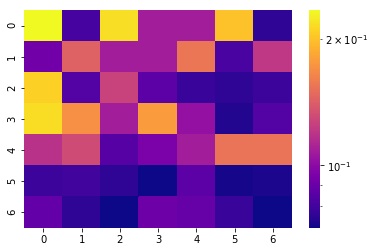

[[0.234 0.081 0.218 0.108 0.108 0.2   0.076]
 [0.092 0.143 0.108 0.108 0.156 0.082 0.121]
 [0.209 0.084 0.127 0.086 0.078 0.076 0.079]
 [0.216 0.171 0.108 0.177 0.103 0.074 0.084]
 [0.118 0.131 0.085 0.095 0.108 0.154 0.154]
 [0.079 0.08  0.076 0.071 0.086 0.072 0.073]
 [0.088 0.076 0.071 0.091 0.089 0.078 0.071]]


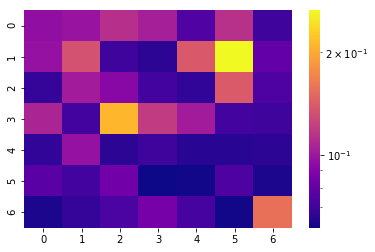

[[0.095 0.098 0.113 0.104 0.075 0.114 0.07 ]
 [0.097 0.134 0.07  0.066 0.139 0.266 0.08 ]
 [0.068 0.102 0.092 0.071 0.067 0.14  0.074]
 [0.107 0.071 0.211 0.12  0.102 0.071 0.07 ]
 [0.067 0.097 0.066 0.07  0.065 0.065 0.066]
 [0.077 0.071 0.084 0.061 0.062 0.074 0.063]
 [0.063 0.068 0.073 0.086 0.072 0.062 0.156]]


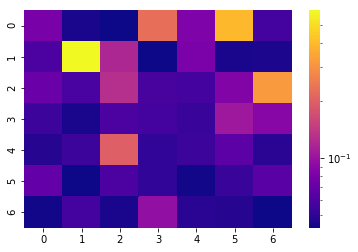

[[0.08  0.045 0.043 0.228 0.083 0.398 0.057]
 [0.06  0.596 0.119 0.043 0.082 0.045 0.046]
 [0.073 0.059 0.129 0.058 0.057 0.085 0.32 ]
 [0.054 0.045 0.06  0.057 0.053 0.105 0.089]
 [0.048 0.054 0.199 0.051 0.054 0.066 0.049]
 [0.07  0.043 0.06  0.051 0.044 0.053 0.065]
 [0.044 0.057 0.045 0.096 0.049 0.048 0.043]]


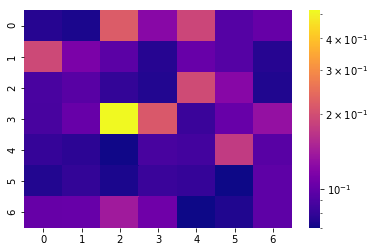

[[0.076 0.073 0.22  0.122 0.189 0.094 0.102]
 [0.193 0.114 0.097 0.076 0.103 0.094 0.076]
 [0.089 0.095 0.08  0.075 0.195 0.121 0.074]
 [0.088 0.103 0.517 0.215 0.083 0.103 0.13 ]
 [0.081 0.078 0.071 0.088 0.086 0.175 0.095]
 [0.075 0.08  0.073 0.083 0.081 0.07  0.098]
 [0.102 0.103 0.14  0.107 0.07  0.074 0.098]]
SKIPPPPPPEDDDD


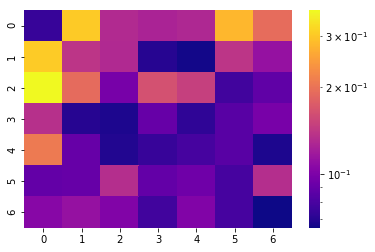

[[0.074 0.304 0.13  0.125 0.128 0.279 0.193]
 [0.306 0.139 0.129 0.07  0.066 0.139 0.112]
 [0.368 0.191 0.097 0.164 0.148 0.077 0.088]
 [0.135 0.07  0.068 0.09  0.072 0.085 0.098]
 [0.207 0.09  0.069 0.074 0.079 0.085 0.068]
 [0.089 0.09  0.133 0.089 0.094 0.079 0.133]
 [0.105 0.112 0.102 0.077 0.102 0.079 0.065]]


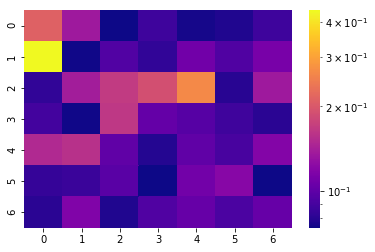

[[0.211 0.136 0.074 0.087 0.076 0.078 0.087]
 [0.439 0.075 0.095 0.083 0.109 0.094 0.113]
 [0.083 0.139 0.168 0.19  0.266 0.08  0.136]
 [0.089 0.075 0.164 0.103 0.097 0.088 0.081]
 [0.15  0.157 0.101 0.079 0.101 0.091 0.118]
 [0.084 0.086 0.098 0.074 0.11  0.121 0.074]
 [0.081 0.117 0.078 0.094 0.104 0.092 0.104]]


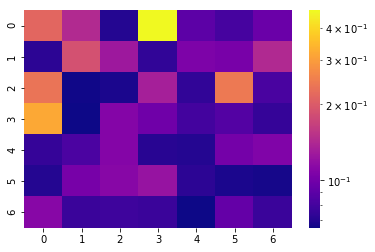

[[0.216 0.143 0.07  0.47  0.09  0.081 0.097]
 [0.072 0.187 0.127 0.074 0.106 0.104 0.142]
 [0.235 0.066 0.068 0.133 0.074 0.243 0.082]
 [0.318 0.065 0.11  0.099 0.08  0.086 0.075]
 [0.075 0.083 0.11  0.071 0.07  0.101 0.108]
 [0.07  0.103 0.112 0.122 0.072 0.068 0.067]
 [0.112 0.077 0.078 0.077 0.065 0.094 0.077]]


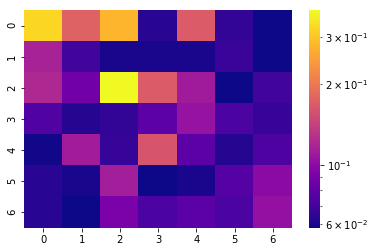

[[0.326 0.174 0.279 0.063 0.17  0.066 0.058]
 [0.116 0.07  0.06  0.06  0.06  0.068 0.058]
 [0.121 0.087 0.378 0.17  0.111 0.058 0.07 ]
 [0.075 0.062 0.066 0.079 0.105 0.073 0.067]
 [0.059 0.112 0.067 0.162 0.079 0.062 0.074]
 [0.063 0.06  0.113 0.058 0.06  0.077 0.099]
 [0.063 0.058 0.091 0.073 0.079 0.073 0.104]]


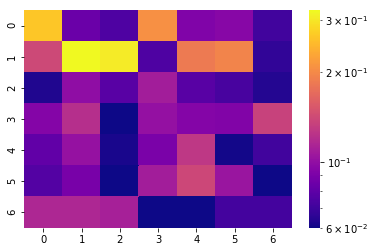

[[0.263 0.084 0.075 0.207 0.092 0.095 0.071]
 [0.14  0.322 0.305 0.075 0.185 0.195 0.067]
 [0.063 0.099 0.078 0.109 0.078 0.073 0.064]
 [0.094 0.121 0.06  0.101 0.094 0.093 0.135]
 [0.081 0.102 0.062 0.09  0.127 0.061 0.071]
 [0.076 0.089 0.06  0.109 0.139 0.104 0.06 ]
 [0.115 0.115 0.111 0.06  0.06  0.072 0.072]]


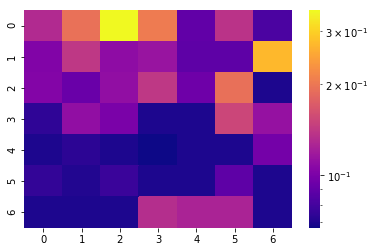

[[0.13  0.195 0.352 0.205 0.09  0.137 0.082]
 [0.103 0.141 0.109 0.114 0.089 0.089 0.273]
 [0.104 0.093 0.111 0.141 0.095 0.193 0.07 ]
 [0.074 0.111 0.1   0.07  0.07  0.153 0.113]
 [0.07  0.073 0.07  0.067 0.07  0.07  0.097]
 [0.075 0.071 0.077 0.07  0.07  0.089 0.07 ]
 [0.07  0.07  0.07  0.133 0.125 0.125 0.07 ]]


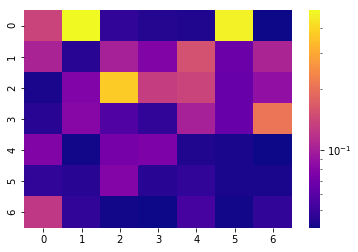

[[0.138 0.488 0.048 0.045 0.044 0.465 0.041]
 [0.104 0.046 0.101 0.078 0.154 0.068 0.105]
 [0.043 0.077 0.374 0.13  0.138 0.066 0.088]
 [0.046 0.08  0.058 0.048 0.101 0.066 0.207]
 [0.078 0.042 0.073 0.076 0.044 0.043 0.041]
 [0.048 0.046 0.079 0.046 0.048 0.043 0.043]
 [0.124 0.048 0.042 0.041 0.054 0.042 0.048]]


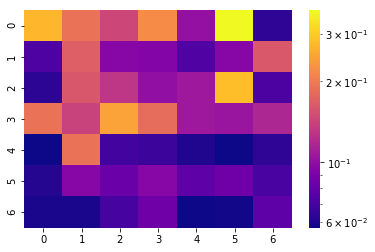

[[0.273 0.19  0.145 0.219 0.102 0.368 0.064]
 [0.073 0.169 0.095 0.093 0.074 0.095 0.162]
 [0.063 0.161 0.13  0.101 0.107 0.285 0.072]
 [0.19  0.141 0.247 0.183 0.107 0.105 0.118]
 [0.057 0.19  0.069 0.067 0.06  0.057 0.064]
 [0.061 0.095 0.083 0.095 0.078 0.085 0.071]
 [0.059 0.059 0.07  0.085 0.057 0.058 0.078]]


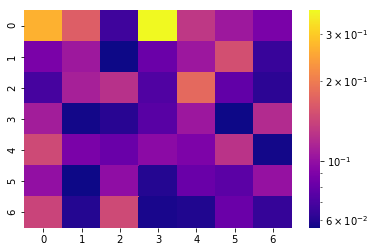

[[0.265 0.167 0.067 0.367 0.13  0.106 0.088]
 [0.088 0.106 0.056 0.082 0.105 0.151 0.065]
 [0.069 0.111 0.124 0.072 0.178 0.078 0.062]
 [0.109 0.057 0.061 0.075 0.105 0.056 0.12 ]
 [0.146 0.088 0.081 0.096 0.089 0.126 0.057]
 [0.1   0.056 0.098 0.06  0.081 0.076 0.101]
 [0.141 0.06  0.146 0.058 0.059 0.082 0.064]]


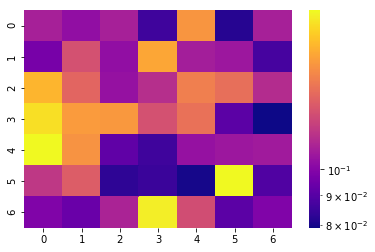

[[0.109 0.103 0.109 0.086 0.153 0.082 0.109]
 [0.097 0.126 0.103 0.159 0.108 0.106 0.087]
 [0.165 0.134 0.104 0.114 0.144 0.138 0.113]
 [0.18  0.155 0.154 0.126 0.139 0.091 0.079]
 [0.19  0.152 0.092 0.086 0.104 0.106 0.107]
 [0.117 0.131 0.083 0.085 0.08  0.19  0.089]
 [0.099 0.094 0.11  0.186 0.125 0.091 0.099]]


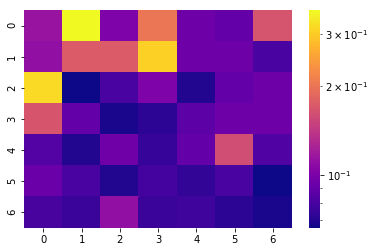

[[0.114 0.36  0.101 0.202 0.094 0.09  0.166]
 [0.111 0.174 0.174 0.307 0.094 0.094 0.081]
 [0.319 0.066 0.081 0.101 0.07  0.09  0.094]
 [0.167 0.09  0.068 0.072 0.087 0.094 0.094]
 [0.084 0.07  0.095 0.075 0.09  0.16  0.083]
 [0.093 0.081 0.07  0.079 0.074 0.081 0.066]
 [0.08  0.076 0.111 0.076 0.077 0.072 0.068]]


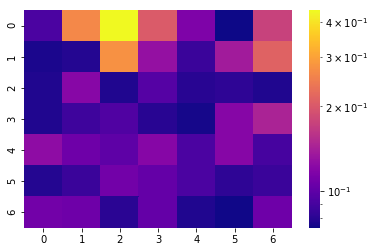

[[0.092 0.264 0.439 0.203 0.116 0.074 0.175]
 [0.077 0.079 0.277 0.129 0.086 0.138 0.212]
 [0.078 0.121 0.078 0.096 0.08  0.082 0.078]
 [0.078 0.087 0.094 0.08  0.076 0.12  0.145]
 [0.125 0.107 0.1   0.12  0.092 0.12  0.09 ]
 [0.079 0.086 0.11  0.103 0.092 0.082 0.086]
 [0.11  0.107 0.081 0.103 0.078 0.075 0.107]]


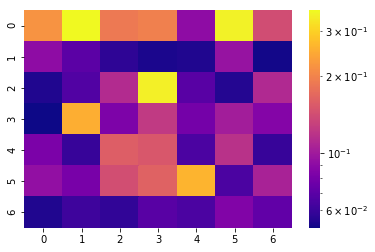

[[0.219 0.36  0.188 0.196 0.091 0.348 0.141]
 [0.091 0.07  0.057 0.053 0.054 0.095 0.052]
 [0.054 0.067 0.112 0.344 0.069 0.055 0.111]
 [0.051 0.253 0.083 0.124 0.079 0.102 0.086]
 [0.082 0.059 0.158 0.151 0.065 0.118 0.059]
 [0.093 0.081 0.142 0.162 0.261 0.065 0.106]
 [0.054 0.061 0.058 0.069 0.065 0.085 0.072]]


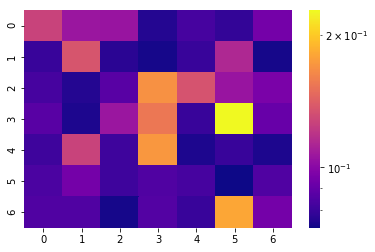

[[0.127 0.106 0.105 0.076 0.083 0.079 0.094]
 [0.08  0.136 0.077 0.074 0.08  0.114 0.074]
 [0.083 0.076 0.087 0.169 0.135 0.105 0.096]
 [0.087 0.075 0.106 0.155 0.08  0.227 0.091]
 [0.081 0.127 0.081 0.172 0.075 0.08  0.075]
 [0.084 0.094 0.081 0.085 0.083 0.073 0.085]
 [0.085 0.085 0.074 0.086 0.08  0.181 0.094]]
SKIPPPPPPEDDDD


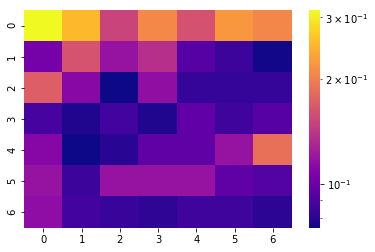

[[0.314 0.252 0.151 0.208 0.162 0.221 0.207]
 [0.104 0.163 0.118 0.137 0.093 0.085 0.076]
 [0.172 0.112 0.075 0.116 0.083 0.083 0.083]
 [0.088 0.078 0.087 0.078 0.097 0.086 0.093]
 [0.111 0.075 0.08  0.096 0.096 0.118 0.187]
 [0.118 0.085 0.118 0.118 0.118 0.096 0.092]
 [0.115 0.087 0.084 0.082 0.086 0.086 0.081]]


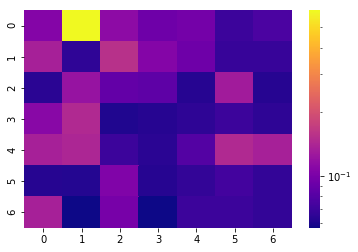

[[0.107 0.598 0.113 0.093 0.097 0.07  0.076]
 [0.135 0.066 0.155 0.107 0.093 0.068 0.068]
 [0.064 0.12  0.087 0.085 0.063 0.13  0.063]
 [0.11  0.145 0.061 0.063 0.065 0.07  0.065]
 [0.135 0.141 0.07  0.064 0.08  0.145 0.135]
 [0.063 0.062 0.104 0.063 0.067 0.073 0.067]
 [0.135 0.057 0.098 0.057 0.07  0.07  0.067]]


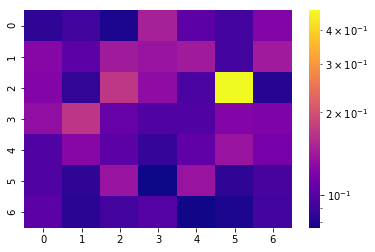

[[0.085 0.091 0.079 0.148 0.102 0.092 0.122]
 [0.126 0.102 0.143 0.137 0.143 0.092 0.143]
 [0.123 0.086 0.171 0.13  0.095 0.471 0.082]
 [0.132 0.17  0.107 0.098 0.098 0.123 0.12 ]
 [0.098 0.126 0.102 0.087 0.105 0.137 0.116]
 [0.097 0.085 0.137 0.076 0.137 0.084 0.094]
 [0.102 0.083 0.092 0.099 0.077 0.079 0.092]]


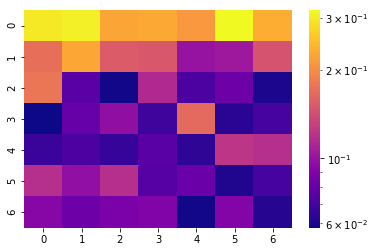

[[0.3   0.307 0.225 0.228 0.212 0.319 0.234]
 [0.171 0.227 0.154 0.15  0.1   0.103 0.146]
 [0.178 0.076 0.059 0.114 0.072 0.083 0.06 ]
 [0.058 0.08  0.097 0.068 0.166 0.063 0.07 ]
 [0.067 0.072 0.066 0.076 0.064 0.123 0.118]
 [0.118 0.098 0.118 0.075 0.081 0.061 0.07 ]
 [0.092 0.083 0.088 0.09  0.059 0.091 0.062]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


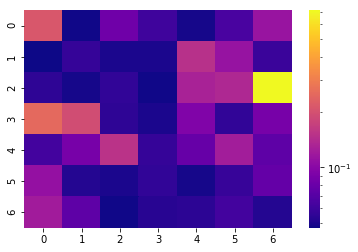

[[0.214 0.048 0.084 0.061 0.049 0.065 0.113]
 [0.047 0.057 0.05  0.05  0.149 0.112 0.059]
 [0.055 0.049 0.056 0.048 0.129 0.137 0.713]
 [0.251 0.194 0.055 0.05  0.094 0.056 0.088]
 [0.062 0.088 0.152 0.057 0.079 0.123 0.075]
 [0.109 0.052 0.05  0.056 0.049 0.058 0.078]
 [0.122 0.075 0.048 0.053 0.054 0.062 0.052]]


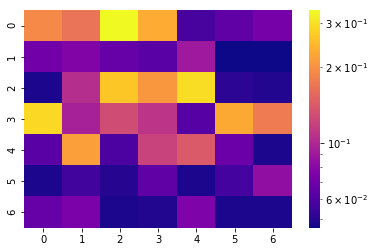

[[0.191 0.168 0.336 0.231 0.058 0.065 0.073]
 [0.071 0.077 0.067 0.063 0.091 0.046 0.046]
 [0.048 0.104 0.265 0.207 0.294 0.051 0.049]
 [0.288 0.095 0.129 0.109 0.062 0.228 0.176]
 [0.063 0.216 0.059 0.121 0.141 0.069 0.048]
 [0.048 0.056 0.05  0.065 0.048 0.057 0.084]
 [0.067 0.075 0.048 0.049 0.076 0.048 0.048]]


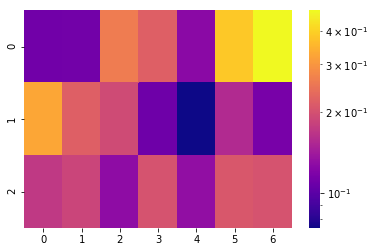

[[0.111 0.112 0.262 0.22  0.125 0.385 0.476]
 [0.327 0.22  0.192 0.109 0.074 0.156 0.115]
 [0.171 0.185 0.128 0.203 0.13  0.208 0.202]]


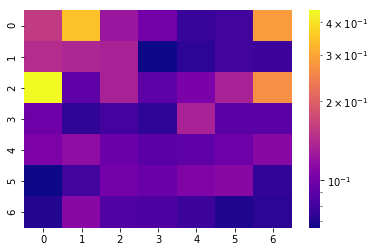

[[0.158 0.347 0.124 0.101 0.077 0.08  0.285]
 [0.144 0.137 0.134 0.066 0.073 0.08  0.078]
 [0.444 0.091 0.134 0.09  0.104 0.134 0.268]
 [0.099 0.074 0.081 0.074 0.134 0.089 0.089]
 [0.106 0.116 0.096 0.089 0.091 0.099 0.112]
 [0.066 0.08  0.101 0.096 0.108 0.112 0.075]
 [0.071 0.112 0.086 0.085 0.078 0.07  0.073]]


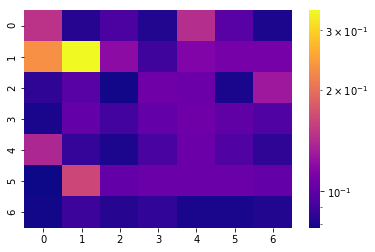

[[0.148 0.083 0.094 0.082 0.144 0.098 0.081]
 [0.233 0.344 0.12  0.09  0.114 0.11  0.11 ]
 [0.085 0.098 0.079 0.107 0.106 0.08  0.129]
 [0.08  0.102 0.091 0.102 0.107 0.101 0.095]
 [0.139 0.087 0.081 0.093 0.106 0.095 0.085]
 [0.078 0.164 0.102 0.105 0.105 0.105 0.102]
 [0.079 0.089 0.083 0.086 0.08  0.08  0.082]]


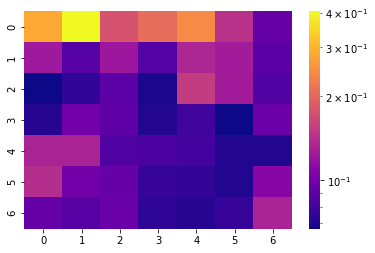

[[0.283 0.404 0.177 0.207 0.244 0.144 0.094]
 [0.124 0.088 0.122 0.087 0.134 0.126 0.089]
 [0.067 0.075 0.09  0.07  0.154 0.126 0.086]
 [0.072 0.099 0.091 0.071 0.08  0.067 0.097]
 [0.132 0.132 0.086 0.084 0.081 0.071 0.071]
 [0.14  0.099 0.094 0.077 0.076 0.071 0.109]
 [0.094 0.088 0.096 0.074 0.072 0.077 0.132]]


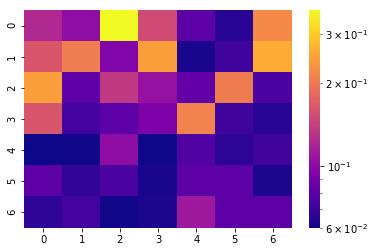

[[0.123 0.103 0.364 0.151 0.081 0.065 0.219]
 [0.162 0.206 0.095 0.243 0.062 0.071 0.259]
 [0.243 0.081 0.136 0.106 0.083 0.203 0.075]
 [0.162 0.073 0.081 0.094 0.21  0.071 0.065]
 [0.06  0.061 0.102 0.06  0.077 0.066 0.071]
 [0.081 0.068 0.075 0.062 0.081 0.081 0.063]
 [0.067 0.073 0.061 0.063 0.11  0.081 0.081]]


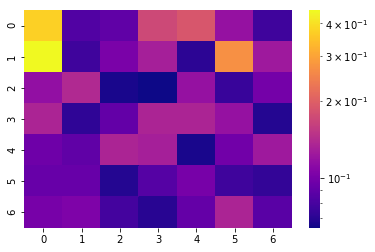

[[0.374 0.084 0.09  0.172 0.188 0.118 0.077]
 [0.45  0.077 0.102 0.129 0.071 0.27  0.125]
 [0.116 0.139 0.066 0.064 0.118 0.075 0.099]
 [0.135 0.072 0.091 0.135 0.135 0.118 0.069]
 [0.096 0.09  0.135 0.129 0.066 0.098 0.125]
 [0.093 0.093 0.069 0.085 0.101 0.077 0.073]
 [0.101 0.105 0.079 0.07  0.092 0.135 0.087]]


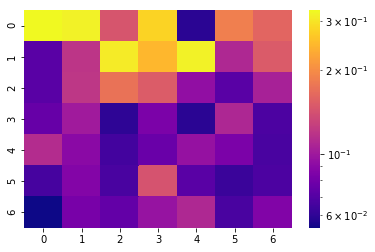

[[0.328 0.318 0.145 0.279 0.059 0.186 0.16 ]
 [0.072 0.119 0.308 0.246 0.318 0.11  0.151]
 [0.072 0.12  0.173 0.152 0.093 0.072 0.105]
 [0.076 0.101 0.06  0.084 0.059 0.109 0.068]
 [0.113 0.09  0.065 0.077 0.095 0.084 0.067]
 [0.066 0.087 0.067 0.143 0.072 0.063 0.068]
 [0.054 0.083 0.075 0.096 0.11  0.067 0.086]]


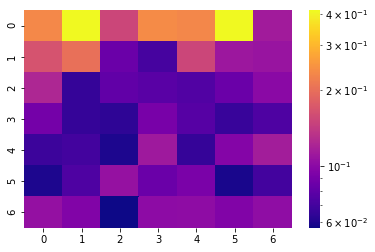

[[0.234 0.41  0.153 0.237 0.232 0.412 0.114]
 [0.166 0.202 0.085 0.071 0.153 0.11  0.108]
 [0.123 0.066 0.081 0.078 0.075 0.085 0.1  ]
 [0.089 0.066 0.064 0.091 0.077 0.067 0.074]
 [0.068 0.07  0.06  0.112 0.066 0.097 0.115]
 [0.06  0.074 0.106 0.085 0.092 0.059 0.07 ]
 [0.105 0.095 0.057 0.101 0.102 0.095 0.103]]


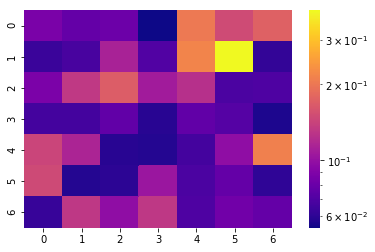

[[0.087 0.078 0.081 0.054 0.202 0.15  0.173]
 [0.064 0.068 0.113 0.071 0.218 0.393 0.062]
 [0.088 0.132 0.17  0.108 0.124 0.069 0.07 ]
 [0.067 0.067 0.077 0.059 0.077 0.072 0.057]
 [0.144 0.115 0.059 0.058 0.067 0.098 0.213]
 [0.148 0.058 0.06  0.104 0.069 0.078 0.061]
 [0.063 0.131 0.098 0.131 0.07  0.083 0.078]]


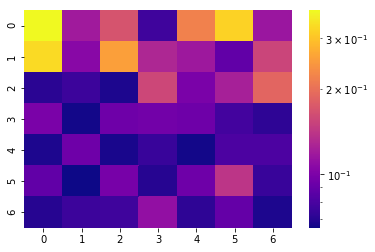

[[0.376 0.119 0.169 0.077 0.219 0.32  0.116]
 [0.332 0.106 0.256 0.129 0.118 0.089 0.155]
 [0.071 0.076 0.068 0.157 0.099 0.123 0.188]
 [0.099 0.066 0.094 0.096 0.094 0.078 0.072]
 [0.068 0.094 0.067 0.075 0.066 0.081 0.081]
 [0.089 0.065 0.098 0.07  0.094 0.141 0.075]
 [0.07  0.076 0.077 0.111 0.072 0.09  0.068]]


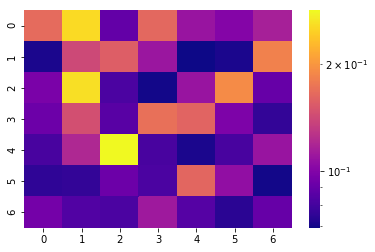

[[0.167 0.256 0.089 0.164 0.109 0.101 0.116]
 [0.071 0.141 0.157 0.11  0.069 0.071 0.184]
 [0.097 0.261 0.082 0.07  0.109 0.191 0.09 ]
 [0.092 0.146 0.086 0.17  0.161 0.098 0.076]
 [0.081 0.12  0.284 0.081 0.071 0.081 0.109]
 [0.075 0.076 0.092 0.082 0.163 0.106 0.07 ]
 [0.095 0.084 0.082 0.112 0.085 0.074 0.09 ]]


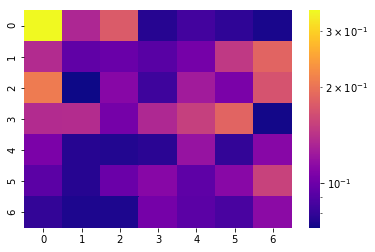

[[0.349 0.133 0.177 0.077 0.085 0.079 0.074]
 [0.136 0.095 0.098 0.092 0.103 0.147 0.186]
 [0.209 0.072 0.111 0.083 0.125 0.105 0.169]
 [0.136 0.137 0.103 0.134 0.152 0.186 0.073]
 [0.106 0.077 0.076 0.078 0.119 0.08  0.111]
 [0.093 0.077 0.099 0.111 0.094 0.112 0.154]
 [0.08  0.075 0.075 0.103 0.093 0.087 0.113]]


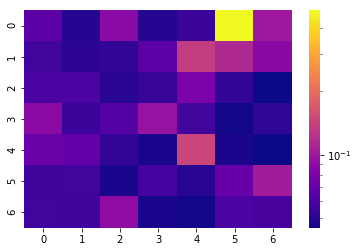

[[0.066 0.049 0.089 0.049 0.055 0.484 0.101]
 [0.057 0.051 0.053 0.067 0.135 0.114 0.088]
 [0.06  0.06  0.05  0.054 0.08  0.053 0.045]
 [0.089 0.055 0.064 0.096 0.057 0.046 0.052]
 [0.072 0.07  0.053 0.047 0.145 0.047 0.045]
 [0.056 0.057 0.047 0.058 0.05  0.071 0.103]
 [0.057 0.056 0.091 0.047 0.046 0.06  0.059]]
SKIPPPPPPEDDDD


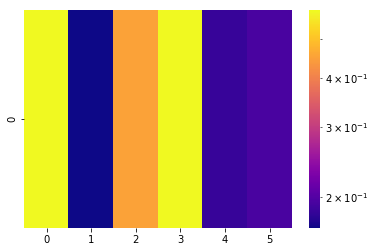

[[0.591 0.167 0.451 0.591 0.184 0.194]]


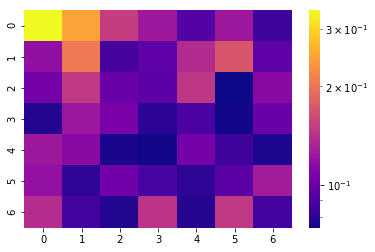

[[0.341 0.246 0.151 0.124 0.092 0.124 0.085]
 [0.118 0.206 0.088 0.096 0.137 0.172 0.096]
 [0.104 0.147 0.1   0.095 0.146 0.074 0.114]
 [0.079 0.123 0.107 0.08  0.09  0.075 0.1  ]
 [0.124 0.114 0.076 0.075 0.105 0.085 0.077]
 [0.119 0.081 0.103 0.089 0.081 0.094 0.126]
 [0.138 0.087 0.078 0.144 0.079 0.147 0.087]]


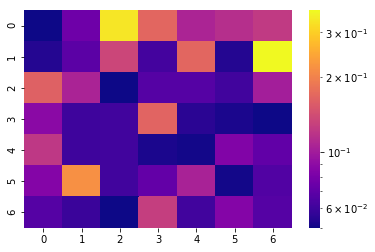

[[0.05  0.076 0.336 0.168 0.107 0.115 0.124]
 [0.054 0.069 0.135 0.062 0.168 0.054 0.367]
 [0.161 0.106 0.05  0.067 0.067 0.061 0.102]
 [0.088 0.06  0.061 0.165 0.055 0.052 0.05 ]
 [0.122 0.06  0.061 0.052 0.051 0.084 0.071]
 [0.085 0.217 0.061 0.072 0.105 0.051 0.066]
 [0.067 0.059 0.05  0.128 0.061 0.085 0.067]]


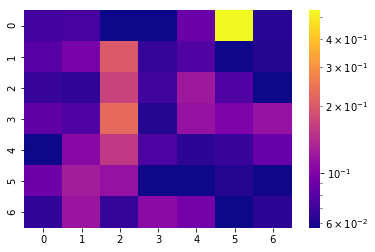

[[0.072 0.073 0.057 0.057 0.089 0.535 0.063]
 [0.08  0.097 0.202 0.067 0.077 0.058 0.062]
 [0.068 0.065 0.17  0.071 0.121 0.078 0.057]
 [0.084 0.077 0.229 0.062 0.115 0.099 0.115]
 [0.057 0.107 0.155 0.075 0.064 0.068 0.088]
 [0.091 0.126 0.115 0.057 0.057 0.062 0.058]
 [0.066 0.118 0.067 0.108 0.094 0.057 0.064]]


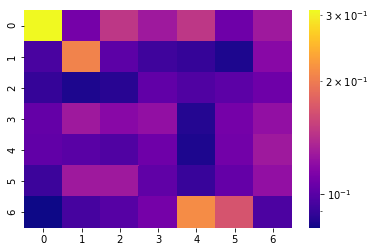

[[0.309 0.11  0.147 0.128 0.147 0.107 0.128]
 [0.095 0.206 0.101 0.092 0.089 0.084 0.118]
 [0.089 0.084 0.086 0.103 0.097 0.101 0.107]
 [0.104 0.128 0.118 0.122 0.085 0.11  0.122]
 [0.103 0.1   0.097 0.107 0.084 0.109 0.128]
 [0.091 0.128 0.128 0.102 0.09  0.104 0.122]
 [0.081 0.094 0.099 0.11  0.214 0.168 0.096]]


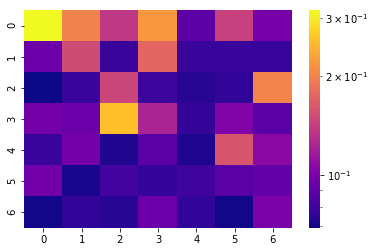

[[0.316 0.199 0.136 0.218 0.089 0.143 0.098]
 [0.094 0.151 0.078 0.173 0.078 0.078 0.078]
 [0.069 0.078 0.146 0.079 0.074 0.076 0.202]
 [0.097 0.094 0.257 0.123 0.077 0.102 0.088]
 [0.078 0.097 0.072 0.088 0.072 0.159 0.106]
 [0.096 0.071 0.081 0.077 0.08  0.088 0.091]
 [0.07  0.076 0.074 0.094 0.076 0.07  0.1  ]]


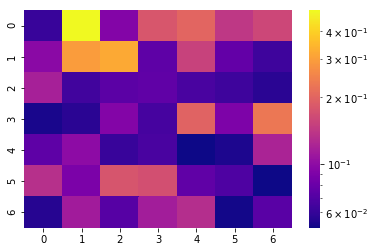

[[0.061 0.498 0.093 0.179 0.201 0.141 0.16 ]
 [0.097 0.297 0.32  0.075 0.153 0.077 0.063]
 [0.117 0.064 0.074 0.076 0.067 0.063 0.057]
 [0.053 0.057 0.093 0.066 0.198 0.09  0.23 ]
 [0.075 0.099 0.061 0.067 0.051 0.054 0.12 ]
 [0.133 0.089 0.178 0.171 0.076 0.069 0.051]
 [0.056 0.113 0.072 0.114 0.131 0.052 0.073]]


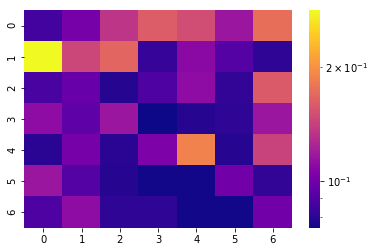

[[0.086 0.102 0.134 0.161 0.15  0.116 0.174]
 [0.282 0.145 0.167 0.083 0.109 0.091 0.081]
 [0.088 0.097 0.079 0.089 0.111 0.082 0.158]
 [0.111 0.094 0.116 0.075 0.079 0.081 0.116]
 [0.08  0.102 0.08  0.104 0.188 0.079 0.143]
 [0.116 0.091 0.079 0.076 0.076 0.1   0.082]
 [0.089 0.111 0.081 0.081 0.076 0.076 0.1  ]]


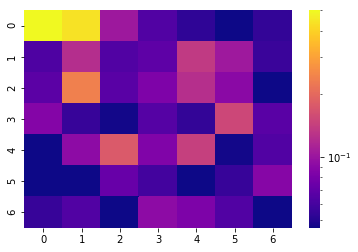

[[0.5   0.441 0.103 0.064 0.053 0.046 0.054]
 [0.063 0.123 0.064 0.069 0.136 0.104 0.056]
 [0.068 0.238 0.067 0.084 0.124 0.09  0.046]
 [0.087 0.055 0.047 0.065 0.054 0.153 0.067]
 [0.046 0.092 0.177 0.085 0.143 0.047 0.064]
 [0.046 0.046 0.073 0.059 0.046 0.055 0.088]
 [0.055 0.064 0.046 0.092 0.083 0.064 0.046]]


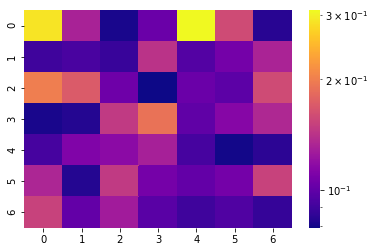

[[0.288 0.131 0.081 0.104 0.308 0.159 0.084]
 [0.09  0.093 0.088 0.142 0.096 0.107 0.132]
 [0.2   0.171 0.105 0.079 0.104 0.099 0.159]
 [0.081 0.083 0.147 0.19  0.1   0.114 0.135]
 [0.092 0.112 0.117 0.13  0.092 0.08  0.085]
 [0.133 0.083 0.147 0.108 0.101 0.107 0.152]
 [0.152 0.101 0.127 0.098 0.09  0.095 0.087]]


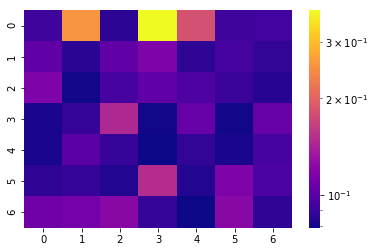

[[0.091 0.256 0.086 0.376 0.182 0.092 0.093]
 [0.104 0.085 0.104 0.117 0.087 0.094 0.088]
 [0.117 0.08  0.094 0.104 0.097 0.09  0.084]
 [0.081 0.089 0.146 0.08  0.106 0.08  0.106]
 [0.081 0.101 0.089 0.079 0.088 0.081 0.094]
 [0.087 0.089 0.083 0.149 0.083 0.117 0.096]
 [0.11  0.113 0.122 0.089 0.079 0.122 0.087]]


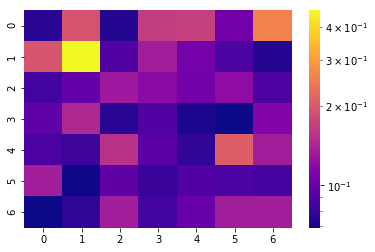

[[0.076 0.193 0.074 0.166 0.17  0.104 0.259]
 [0.195 0.463 0.089 0.135 0.107 0.087 0.074]
 [0.084 0.098 0.132 0.119 0.105 0.121 0.088]
 [0.095 0.146 0.075 0.089 0.072 0.069 0.114]
 [0.088 0.082 0.156 0.093 0.078 0.208 0.135]
 [0.135 0.07  0.096 0.081 0.089 0.087 0.085]
 [0.069 0.077 0.135 0.084 0.1   0.135 0.135]]


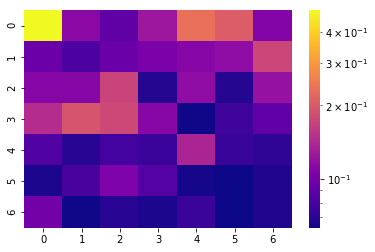

[[0.491 0.113 0.09  0.125 0.233 0.206 0.109]
 [0.096 0.082 0.095 0.103 0.11  0.116 0.175]
 [0.11  0.111 0.173 0.068 0.116 0.068 0.12 ]
 [0.146 0.193 0.178 0.111 0.064 0.076 0.091]
 [0.083 0.069 0.078 0.075 0.138 0.074 0.071]
 [0.066 0.08  0.106 0.085 0.065 0.063 0.067]
 [0.099 0.064 0.069 0.066 0.075 0.063 0.067]]


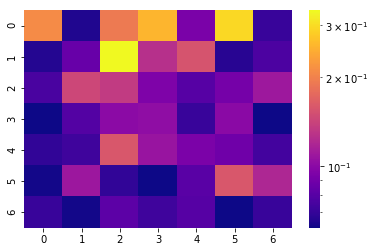

[[0.21  0.065 0.193 0.256 0.093 0.297 0.071]
 [0.066 0.086 0.337 0.126 0.156 0.067 0.077]
 [0.076 0.145 0.135 0.095 0.08  0.091 0.11 ]
 [0.062 0.079 0.101 0.103 0.071 0.1   0.062]
 [0.069 0.073 0.159 0.107 0.094 0.089 0.074]
 [0.063 0.109 0.069 0.062 0.081 0.159 0.12 ]
 [0.071 0.063 0.082 0.073 0.08  0.062 0.071]]


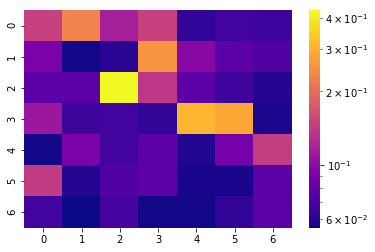

[[0.147 0.231 0.116 0.147 0.063 0.068 0.066]
 [0.09  0.056 0.061 0.258 0.098 0.077 0.073]
 [0.077 0.077 0.431 0.137 0.077 0.067 0.06 ]
 [0.109 0.066 0.068 0.063 0.307 0.284 0.058]
 [0.056 0.091 0.068 0.077 0.059 0.088 0.143]
 [0.141 0.06  0.073 0.077 0.057 0.057 0.077]
 [0.068 0.055 0.069 0.056 0.056 0.063 0.077]]


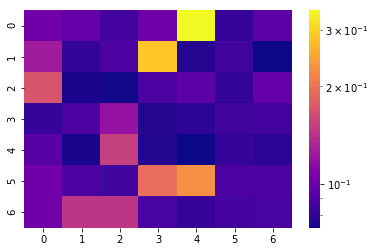

[[0.102 0.097 0.086 0.101 0.344 0.082 0.094]
 [0.125 0.081 0.089 0.284 0.078 0.085 0.073]
 [0.171 0.075 0.074 0.089 0.094 0.081 0.097]
 [0.082 0.089 0.119 0.078 0.08  0.085 0.086]
 [0.093 0.075 0.152 0.077 0.073 0.082 0.079]
 [0.102 0.089 0.085 0.194 0.228 0.089 0.089]
 [0.102 0.144 0.144 0.088 0.082 0.086 0.088]]
SKIPPPPPPEDDDD


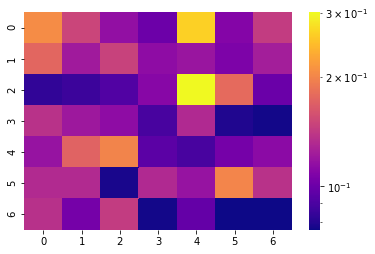

[[0.206 0.15  0.116 0.101 0.264 0.11  0.144]
 [0.175 0.122 0.148 0.114 0.119 0.107 0.124]
 [0.083 0.086 0.092 0.111 0.301 0.178 0.1  ]
 [0.137 0.121 0.114 0.089 0.131 0.079 0.077]
 [0.118 0.173 0.199 0.095 0.089 0.104 0.113]
 [0.132 0.132 0.078 0.131 0.118 0.201 0.137]
 [0.136 0.104 0.144 0.077 0.098 0.076 0.076]]


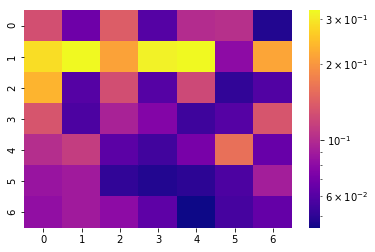

[[0.128 0.068 0.141 0.06  0.101 0.103 0.048]
 [0.286 0.325 0.213 0.313 0.323 0.08  0.216]
 [0.234 0.06  0.127 0.06  0.122 0.051 0.059]
 [0.133 0.058 0.094 0.076 0.054 0.06  0.133]
 [0.102 0.113 0.062 0.055 0.072 0.159 0.066]
 [0.085 0.089 0.051 0.048 0.05  0.058 0.091]
 [0.082 0.089 0.08  0.063 0.045 0.056 0.065]]


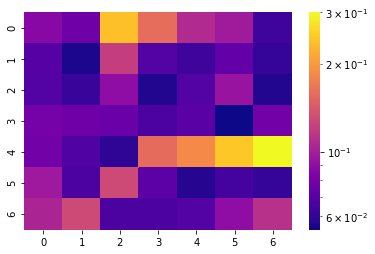

[[0.087 0.078 0.238 0.158 0.107 0.098 0.063]
 [0.07  0.056 0.121 0.069 0.063 0.074 0.061]
 [0.069 0.062 0.09  0.057 0.069 0.094 0.057]
 [0.08  0.078 0.076 0.067 0.071 0.054 0.079]
 [0.079 0.068 0.06  0.157 0.184 0.247 0.3  ]
 [0.097 0.067 0.129 0.072 0.058 0.065 0.061]
 [0.104 0.129 0.067 0.067 0.069 0.09  0.112]]


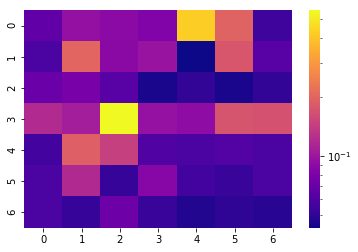

[[0.068 0.095 0.09  0.083 0.43  0.198 0.055]
 [0.059 0.202 0.089 0.098 0.043 0.177 0.064]
 [0.071 0.079 0.064 0.045 0.051 0.045 0.051]
 [0.12  0.107 0.554 0.096 0.091 0.173 0.17 ]
 [0.056 0.191 0.145 0.061 0.059 0.062 0.059]
 [0.059 0.119 0.052 0.086 0.056 0.053 0.059]
 [0.059 0.052 0.073 0.053 0.047 0.05  0.048]]


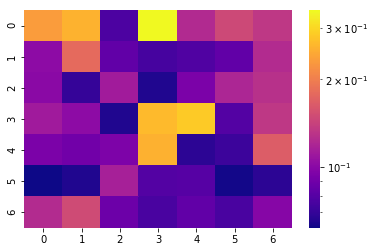

[[0.233 0.257 0.077 0.345 0.123 0.148 0.134]
 [0.102 0.179 0.084 0.075 0.078 0.084 0.124]
 [0.101 0.07  0.113 0.065 0.094 0.12  0.128]
 [0.112 0.102 0.065 0.267 0.285 0.079 0.134]
 [0.094 0.09  0.095 0.256 0.068 0.072 0.167]
 [0.062 0.065 0.116 0.079 0.08  0.063 0.068]
 [0.124 0.15  0.088 0.076 0.084 0.076 0.099]]


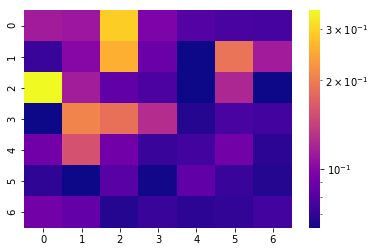

[[0.114 0.111 0.29  0.097 0.081 0.077 0.076]
 [0.072 0.101 0.255 0.088 0.063 0.191 0.114]
 [0.346 0.115 0.085 0.078 0.063 0.122 0.063]
 [0.063 0.207 0.187 0.126 0.067 0.077 0.075]
 [0.091 0.157 0.091 0.072 0.075 0.092 0.069]
 [0.07  0.063 0.082 0.064 0.085 0.072 0.067]
 [0.092 0.086 0.067 0.072 0.069 0.071 0.075]]
SKIPPPPPPEDDDD


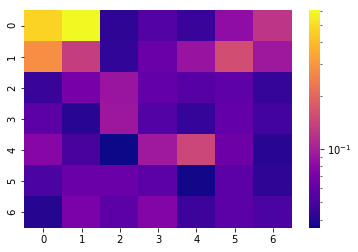

[[0.472 0.603 0.042 0.054 0.045 0.084 0.124]
 [0.284 0.136 0.043 0.063 0.089 0.159 0.093]
 [0.045 0.069 0.09  0.06  0.055 0.058 0.044]
 [0.057 0.041 0.092 0.054 0.044 0.06  0.048]
 [0.077 0.05  0.036 0.094 0.146 0.065 0.041]
 [0.051 0.063 0.063 0.057 0.037 0.057 0.042]
 [0.04  0.071 0.057 0.076 0.046 0.057 0.051]]


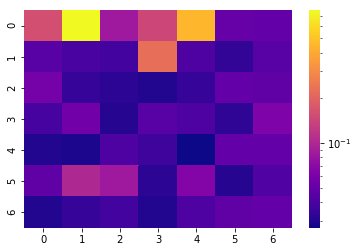

[[0.159 0.766 0.085 0.144 0.45  0.051 0.05 ]
 [0.045 0.04  0.038 0.225 0.042 0.034 0.045]
 [0.058 0.035 0.032 0.03  0.035 0.05  0.048]
 [0.039 0.056 0.031 0.045 0.042 0.033 0.063]
 [0.03  0.029 0.042 0.037 0.027 0.05  0.05 ]
 [0.048 0.1   0.085 0.032 0.065 0.031 0.043]
 [0.03  0.035 0.038 0.03  0.042 0.048 0.05 ]]


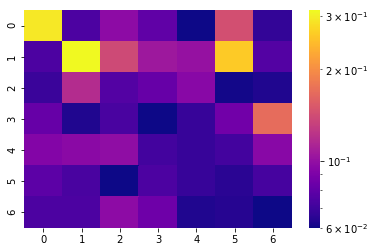

[[0.293 0.074 0.097 0.08  0.06  0.144 0.067]
 [0.074 0.313 0.139 0.105 0.101 0.261 0.076]
 [0.069 0.118 0.076 0.082 0.095 0.061 0.063]
 [0.082 0.063 0.073 0.06  0.068 0.086 0.169]
 [0.093 0.096 0.098 0.071 0.068 0.071 0.095]
 [0.079 0.073 0.06  0.074 0.068 0.065 0.072]
 [0.074 0.074 0.097 0.085 0.063 0.064 0.06 ]]


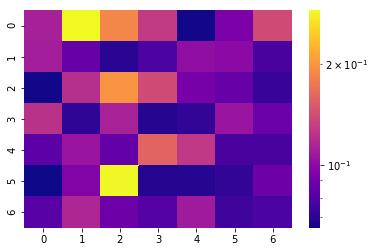

[[0.112 0.289 0.187 0.129 0.066 0.093 0.14 ]
 [0.111 0.086 0.07  0.078 0.102 0.1   0.077]
 [0.066 0.121 0.199 0.14  0.092 0.086 0.073]
 [0.123 0.071 0.113 0.069 0.072 0.106 0.088]
 [0.083 0.106 0.085 0.159 0.127 0.077 0.077]
 [0.065 0.096 0.287 0.069 0.069 0.072 0.089]
 [0.082 0.116 0.089 0.081 0.109 0.075 0.078]]


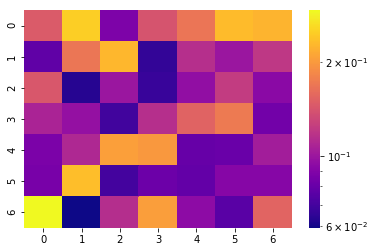

[[0.147 0.25  0.088 0.141 0.168 0.231 0.224]
 [0.078 0.169 0.227 0.066 0.115 0.1   0.121]
 [0.144 0.063 0.1   0.067 0.096 0.124 0.093]
 [0.108 0.097 0.069 0.115 0.153 0.173 0.084]
 [0.087 0.111 0.206 0.199 0.08  0.081 0.104]
 [0.086 0.234 0.07  0.082 0.079 0.091 0.091]
 [0.293 0.059 0.114 0.204 0.094 0.076 0.154]]


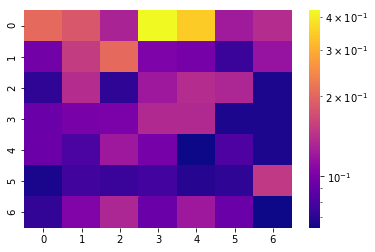

[[0.205 0.183 0.13  0.422 0.344 0.123 0.138]
 [0.097 0.153 0.206 0.103 0.099 0.075 0.117]
 [0.071 0.138 0.072 0.121 0.138 0.132 0.067]
 [0.093 0.1   0.101 0.135 0.135 0.067 0.067]
 [0.094 0.081 0.121 0.099 0.064 0.082 0.067]
 [0.066 0.077 0.075 0.078 0.069 0.072 0.15 ]
 [0.073 0.104 0.132 0.093 0.121 0.093 0.064]]


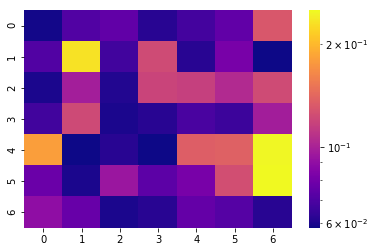

[[0.059 0.071 0.075 0.062 0.068 0.075 0.131]
 [0.071 0.232 0.067 0.123 0.062 0.082 0.058]
 [0.06  0.098 0.061 0.119 0.116 0.104 0.123]
 [0.067 0.122 0.06  0.062 0.069 0.066 0.097]
 [0.18  0.058 0.062 0.058 0.135 0.137 0.248]
 [0.078 0.06  0.094 0.074 0.082 0.125 0.25 ]
 [0.09  0.077 0.06  0.062 0.076 0.072 0.062]]


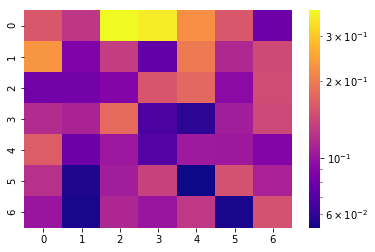

[[0.159 0.127 0.379 0.355 0.226 0.158 0.08 ]
 [0.233 0.087 0.133 0.076 0.198 0.115 0.145]
 [0.082 0.082 0.09  0.156 0.176 0.093 0.147]
 [0.117 0.111 0.179 0.068 0.059 0.106 0.143]
 [0.165 0.08  0.102 0.07  0.104 0.103 0.09 ]
 [0.122 0.056 0.106 0.137 0.053 0.151 0.11 ]
 [0.101 0.055 0.114 0.101 0.128 0.055 0.151]]


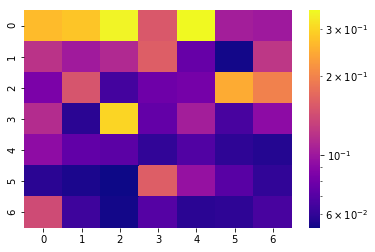

[[0.268 0.28  0.343 0.153 0.353 0.104 0.101]
 [0.12  0.102 0.112 0.159 0.076 0.054 0.123]
 [0.084 0.15  0.065 0.079 0.082 0.246 0.198]
 [0.115 0.058 0.3   0.075 0.104 0.066 0.092]
 [0.093 0.074 0.072 0.06  0.069 0.059 0.057]
 [0.058 0.055 0.053 0.159 0.096 0.071 0.06 ]
 [0.14  0.063 0.054 0.07  0.058 0.059 0.066]]


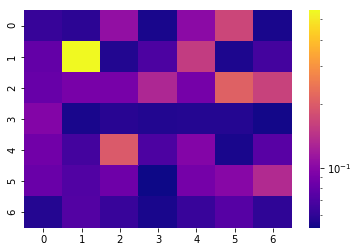

[[0.062 0.059 0.107 0.054 0.102 0.169 0.054]
 [0.08  0.552 0.056 0.07  0.155 0.055 0.067]
 [0.082 0.091 0.09  0.13  0.089 0.209 0.162]
 [0.097 0.054 0.058 0.056 0.057 0.057 0.053]
 [0.087 0.067 0.198 0.07  0.097 0.054 0.075]
 [0.083 0.072 0.085 0.052 0.089 0.1   0.134]
 [0.057 0.073 0.063 0.054 0.063 0.074 0.06 ]]


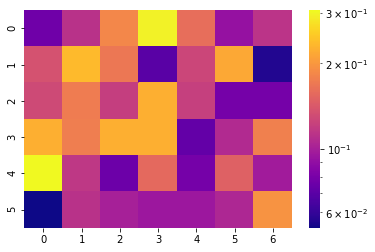

[[0.077 0.112 0.184 0.298 0.16  0.092 0.114]
 [0.136 0.235 0.169 0.07  0.127 0.217 0.056]
 [0.13  0.174 0.121 0.224 0.122 0.079 0.079]
 [0.224 0.176 0.224 0.224 0.073 0.107 0.178]
 [0.307 0.116 0.076 0.156 0.079 0.149 0.098]
 [0.053 0.112 0.101 0.095 0.095 0.105 0.196]]


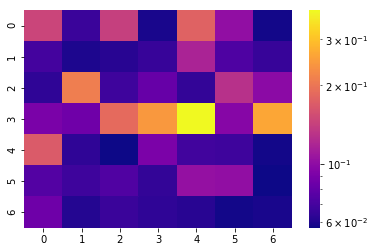

[[0.147 0.067 0.142 0.059 0.177 0.102 0.058]
 [0.07  0.06  0.062 0.066 0.117 0.073 0.066]
 [0.064 0.211 0.068 0.082 0.065 0.128 0.099]
 [0.09  0.086 0.186 0.245 0.387 0.096 0.264]
 [0.169 0.064 0.057 0.091 0.069 0.068 0.058]
 [0.075 0.068 0.074 0.065 0.103 0.102 0.057]
 [0.085 0.061 0.067 0.064 0.062 0.058 0.059]]


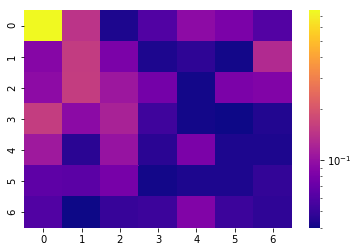

[[0.752 0.143 0.043 0.06  0.094 0.082 0.061]
 [0.089 0.155 0.082 0.043 0.047 0.041 0.129]
 [0.094 0.158 0.106 0.077 0.041 0.082 0.086]
 [0.158 0.093 0.119 0.053 0.041 0.04  0.044]
 [0.109 0.046 0.102 0.046 0.082 0.043 0.043]
 [0.066 0.064 0.079 0.041 0.043 0.043 0.049]
 [0.06  0.04  0.05  0.052 0.086 0.052 0.048]]


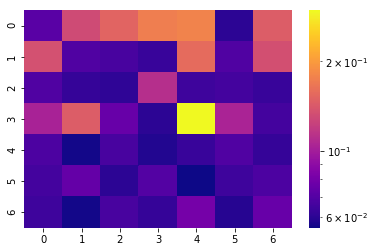

[[0.072 0.131 0.151 0.174 0.178 0.06  0.145]
 [0.135 0.069 0.067 0.063 0.157 0.069 0.134]
 [0.069 0.062 0.061 0.111 0.064 0.066 0.063]
 [0.103 0.145 0.076 0.06  0.297 0.104 0.066]
 [0.068 0.056 0.067 0.058 0.063 0.069 0.062]
 [0.066 0.075 0.06  0.07  0.055 0.064 0.068]
 [0.064 0.056 0.067 0.062 0.081 0.059 0.076]]


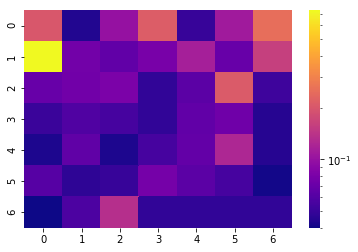

[[0.203 0.044 0.1   0.215 0.05  0.109 0.25 ]
 [0.734 0.076 0.067 0.08  0.115 0.07  0.159]
 [0.07  0.075 0.081 0.048 0.064 0.209 0.052]
 [0.051 0.059 0.055 0.048 0.067 0.074 0.045]
 [0.043 0.066 0.043 0.055 0.068 0.124 0.045]
 [0.062 0.047 0.05  0.078 0.064 0.055 0.041]
 [0.04  0.058 0.134 0.048 0.048 0.048 0.048]]


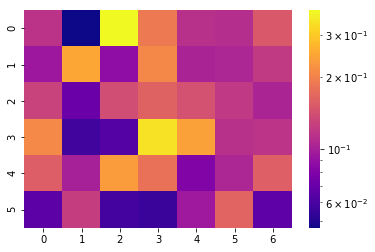

[[0.116 0.047 0.379 0.188 0.114 0.111 0.152]
 [0.094 0.25  0.088 0.208 0.103 0.105 0.122]
 [0.13  0.071 0.14  0.161 0.143 0.121 0.104]
 [0.21  0.058 0.064 0.34  0.242 0.114 0.117]
 [0.158 0.101 0.235 0.179 0.081 0.105 0.159]
 [0.066 0.126 0.059 0.056 0.096 0.164 0.067]]


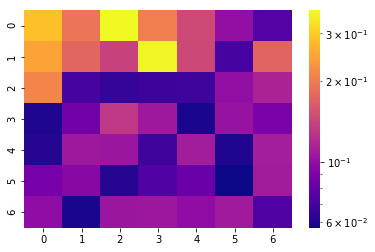

[[0.284 0.192 0.365 0.204 0.147 0.101 0.075]
 [0.247 0.176 0.14  0.358 0.146 0.07  0.173]
 [0.211 0.07  0.065 0.067 0.068 0.101 0.115]
 [0.06  0.086 0.131 0.107 0.059 0.103 0.09 ]
 [0.061 0.107 0.105 0.068 0.11  0.06  0.111]
 [0.088 0.096 0.061 0.073 0.082 0.057 0.109]
 [0.099 0.059 0.105 0.106 0.099 0.108 0.074]]


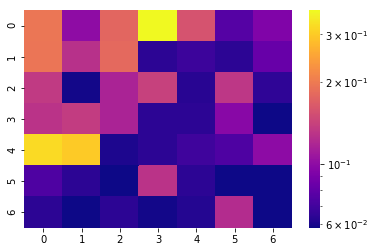

[[0.196 0.1   0.178 0.368 0.158 0.076 0.093]
 [0.194 0.127 0.181 0.064 0.068 0.064 0.083]
 [0.134 0.059 0.116 0.14  0.063 0.132 0.065]
 [0.129 0.136 0.116 0.064 0.064 0.097 0.058]
 [0.322 0.3   0.061 0.064 0.069 0.074 0.099]
 [0.074 0.064 0.058 0.129 0.064 0.058 0.058]
 [0.064 0.058 0.064 0.059 0.062 0.123 0.058]]


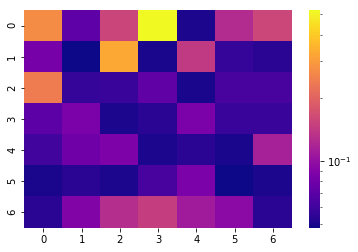

[[0.272 0.072 0.156 0.523 0.051 0.126 0.157]
 [0.084 0.048 0.326 0.05  0.142 0.057 0.054]
 [0.243 0.057 0.058 0.073 0.05  0.063 0.063]
 [0.071 0.085 0.051 0.054 0.085 0.058 0.058]
 [0.061 0.08  0.087 0.051 0.054 0.05  0.115]
 [0.05  0.054 0.051 0.063 0.085 0.048 0.051]
 [0.054 0.089 0.128 0.148 0.11  0.095 0.054]]


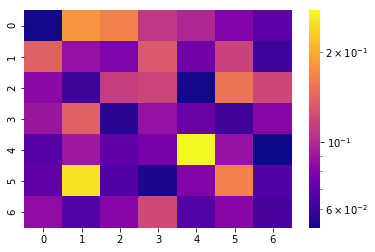

[[0.053 0.182 0.165 0.109 0.099 0.08  0.068]
 [0.139 0.087 0.079 0.134 0.074 0.117 0.06 ]
 [0.084 0.06  0.114 0.118 0.053 0.155 0.12 ]
 [0.09  0.138 0.056 0.087 0.072 0.061 0.082]
 [0.067 0.091 0.07  0.077 0.274 0.088 0.052]
 [0.07  0.251 0.065 0.054 0.08  0.165 0.065]
 [0.085 0.066 0.082 0.121 0.066 0.082 0.063]]


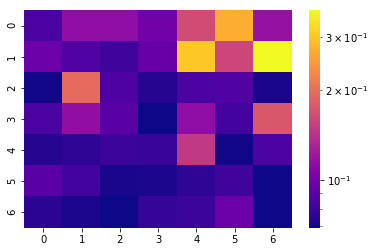

[[0.084 0.114 0.114 0.1   0.164 0.273 0.117]
 [0.097 0.087 0.081 0.095 0.304 0.159 0.369]
 [0.07  0.196 0.086 0.074 0.085 0.087 0.071]
 [0.084 0.115 0.09  0.069 0.114 0.082 0.175]
 [0.074 0.076 0.08  0.079 0.147 0.07  0.085]
 [0.09  0.082 0.071 0.072 0.076 0.081 0.069]
 [0.075 0.072 0.069 0.078 0.08  0.097 0.069]]


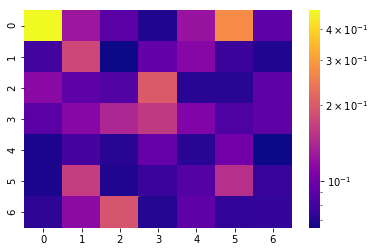

[[0.473 0.126 0.089 0.069 0.123 0.271 0.091]
 [0.08  0.176 0.065 0.094 0.112 0.077 0.069]
 [0.114 0.091 0.086 0.2   0.071 0.071 0.091]
 [0.089 0.111 0.139 0.16  0.108 0.084 0.092]
 [0.068 0.081 0.071 0.095 0.071 0.1   0.065]
 [0.068 0.164 0.069 0.077 0.087 0.15  0.076]
 [0.073 0.116 0.191 0.07  0.092 0.074 0.075]]


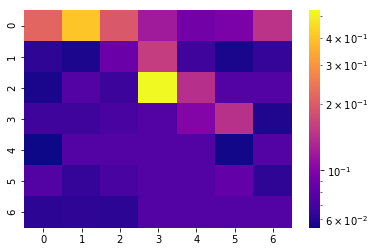

[[0.217 0.403 0.196 0.12  0.091 0.096 0.146]
 [0.063 0.058 0.087 0.159 0.068 0.057 0.065]
 [0.057 0.076 0.067 0.531 0.142 0.076 0.076]
 [0.068 0.068 0.072 0.076 0.1   0.144 0.059]
 [0.055 0.076 0.076 0.076 0.076 0.056 0.076]
 [0.076 0.065 0.072 0.076 0.076 0.084 0.063]
 [0.062 0.063 0.062 0.076 0.076 0.076 0.076]]


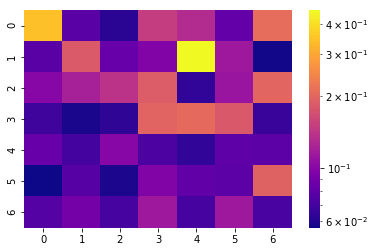

[[0.343 0.078 0.062 0.149 0.131 0.082 0.208]
 [0.078 0.183 0.084 0.097 0.457 0.114 0.057]
 [0.1   0.121 0.139 0.188 0.064 0.111 0.198]
 [0.068 0.058 0.063 0.197 0.206 0.181 0.066]
 [0.084 0.07  0.099 0.073 0.064 0.08  0.079]
 [0.056 0.077 0.059 0.097 0.081 0.079 0.194]
 [0.076 0.09  0.071 0.114 0.071 0.114 0.072]]


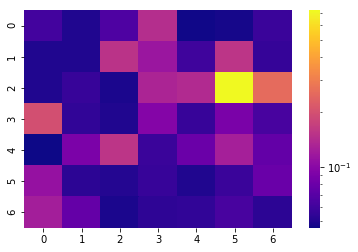

[[0.061 0.05  0.066 0.143 0.047 0.048 0.058]
 [0.05  0.05  0.151 0.114 0.06  0.155 0.056]
 [0.05  0.057 0.049 0.131 0.139 0.724 0.255]
 [0.197 0.055 0.05  0.096 0.057 0.089 0.063]
 [0.046 0.09  0.154 0.058 0.08  0.125 0.076]
 [0.11  0.053 0.051 0.057 0.05  0.058 0.079]
 [0.123 0.077 0.049 0.054 0.055 0.063 0.053]]


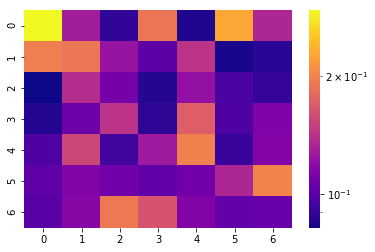

[[0.294 0.129 0.089 0.19  0.085 0.227 0.134]
 [0.196 0.19  0.123 0.101 0.143 0.084 0.087]
 [0.082 0.138 0.11  0.086 0.122 0.096 0.09 ]
 [0.086 0.107 0.143 0.088 0.172 0.097 0.113]
 [0.097 0.155 0.093 0.127 0.198 0.091 0.115]
 [0.102 0.114 0.108 0.103 0.108 0.134 0.2  ]
 [0.1   0.116 0.192 0.164 0.114 0.104 0.105]]


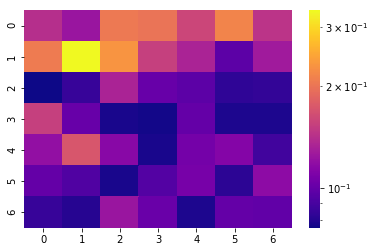

[[0.141 0.123 0.204 0.2   0.159 0.215 0.145]
 [0.207 0.335 0.23  0.154 0.133 0.097 0.127]
 [0.076 0.085 0.133 0.101 0.097 0.083 0.084]
 [0.154 0.101 0.078 0.077 0.1   0.079 0.079]
 [0.12  0.173 0.115 0.078 0.106 0.113 0.088]
 [0.1   0.093 0.078 0.094 0.107 0.082 0.117]
 [0.085 0.081 0.123 0.102 0.079 0.1   0.099]]


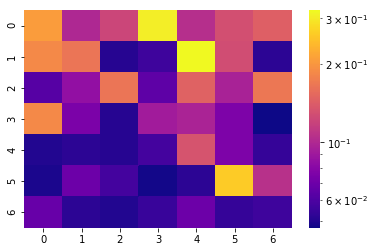

[[0.208 0.1   0.123 0.307 0.105 0.13  0.145]
 [0.187 0.166 0.051 0.056 0.322 0.128 0.052]
 [0.063 0.085 0.166 0.065 0.147 0.096 0.168]
 [0.187 0.075 0.051 0.092 0.097 0.076 0.047]
 [0.05  0.052 0.051 0.058 0.134 0.076 0.054]
 [0.049 0.07  0.058 0.048 0.052 0.261 0.106]
 [0.068 0.052 0.05  0.055 0.07  0.054 0.056]]
SKIPPPPPPEDDDD


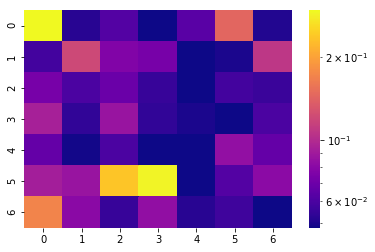

[[0.295 0.052 0.062 0.048 0.064 0.145 0.051]
 [0.058 0.12  0.077 0.073 0.048 0.05  0.107]
 [0.073 0.06  0.069 0.055 0.048 0.058 0.056]
 [0.093 0.054 0.086 0.054 0.05  0.048 0.06 ]
 [0.067 0.049 0.06  0.048 0.048 0.084 0.067]
 [0.092 0.086 0.236 0.287 0.048 0.062 0.081]
 [0.172 0.08  0.055 0.083 0.052 0.057 0.048]]
SKIPPPPPPEDDDD


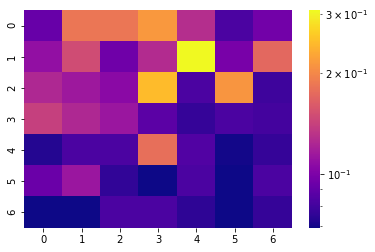

[[0.092 0.184 0.184 0.215 0.128 0.083 0.096]
 [0.109 0.149 0.095 0.126 0.307 0.098 0.172]
 [0.124 0.114 0.105 0.247 0.083 0.212 0.079]
 [0.14  0.124 0.113 0.088 0.077 0.083 0.081]
 [0.073 0.083 0.083 0.178 0.085 0.07  0.077]
 [0.093 0.113 0.076 0.069 0.083 0.069 0.083]
 [0.069 0.069 0.083 0.083 0.075 0.069 0.077]]


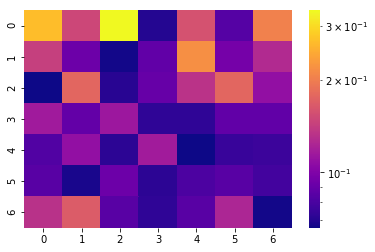

[[0.268 0.15  0.338 0.07  0.159 0.084 0.205]
 [0.143 0.092 0.067 0.088 0.219 0.096 0.127]
 [0.066 0.178 0.071 0.09  0.134 0.178 0.109]
 [0.116 0.089 0.114 0.073 0.073 0.088 0.088]
 [0.083 0.109 0.072 0.117 0.066 0.075 0.076]
 [0.085 0.068 0.092 0.072 0.081 0.085 0.078]
 [0.133 0.168 0.085 0.073 0.085 0.124 0.067]]


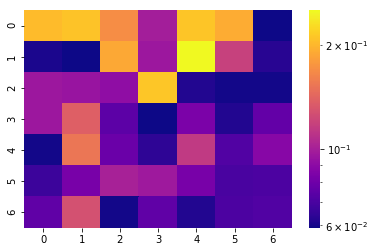

[[0.204 0.209 0.17  0.099 0.211 0.192 0.059]
 [0.061 0.059 0.189 0.096 0.252 0.118 0.063]
 [0.096 0.094 0.091 0.212 0.062 0.06  0.06 ]
 [0.096 0.138 0.075 0.059 0.084 0.062 0.077]
 [0.06  0.153 0.079 0.064 0.114 0.072 0.088]
 [0.067 0.083 0.101 0.097 0.083 0.07  0.071]
 [0.076 0.128 0.06  0.076 0.062 0.071 0.072]]


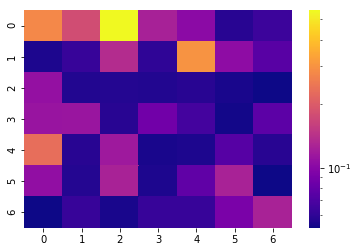

[[0.28  0.178 0.55  0.124 0.102 0.058 0.064]
 [0.055 0.062 0.136 0.06  0.3   0.104 0.075]
 [0.108 0.056 0.057 0.056 0.058 0.054 0.052]
 [0.111 0.112 0.058 0.087 0.067 0.053 0.077]
 [0.23  0.058 0.116 0.054 0.055 0.074 0.058]
 [0.106 0.057 0.125 0.055 0.078 0.125 0.052]
 [0.052 0.062 0.054 0.062 0.062 0.092 0.125]]


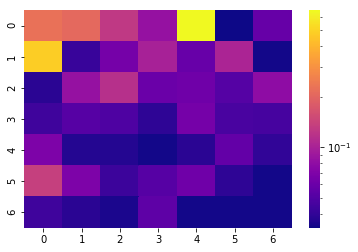

[[0.224 0.207 0.127 0.084 0.655 0.033 0.058]
 [0.483 0.042 0.065 0.099 0.059 0.103 0.034]
 [0.038 0.084 0.116 0.06  0.062 0.051 0.08 ]
 [0.044 0.052 0.049 0.039 0.065 0.047 0.046]
 [0.069 0.037 0.037 0.034 0.038 0.057 0.04 ]
 [0.137 0.069 0.043 0.052 0.062 0.039 0.034]
 [0.044 0.038 0.035 0.055 0.034 0.034 0.034]]


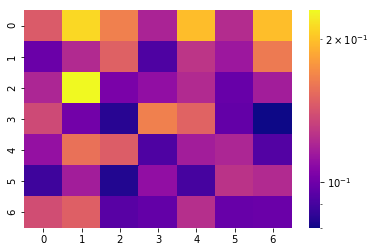

[[0.146 0.212 0.166 0.119 0.198 0.123 0.199]
 [0.099 0.122 0.149 0.092 0.127 0.114 0.162]
 [0.12  0.23  0.103 0.11  0.122 0.098 0.116]
 [0.137 0.101 0.084 0.166 0.15  0.097 0.08 ]
 [0.111 0.158 0.147 0.092 0.116 0.12  0.093]
 [0.088 0.116 0.083 0.11  0.09  0.126 0.122]
 [0.139 0.148 0.094 0.097 0.124 0.098 0.099]]


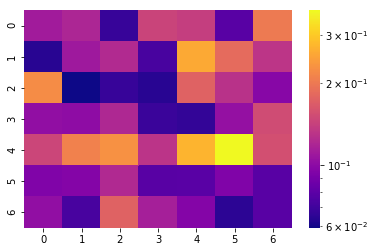

[[0.112 0.119 0.068 0.145 0.14  0.078 0.201]
 [0.064 0.11  0.123 0.073 0.258 0.184 0.132]
 [0.223 0.059 0.068 0.064 0.174 0.129 0.098]
 [0.103 0.101 0.121 0.069 0.067 0.104 0.152]
 [0.147 0.21  0.228 0.131 0.272 0.368 0.155]
 [0.094 0.096 0.122 0.078 0.079 0.094 0.078]
 [0.103 0.073 0.174 0.114 0.096 0.065 0.078]]
SKIPPPPPPEDDDD


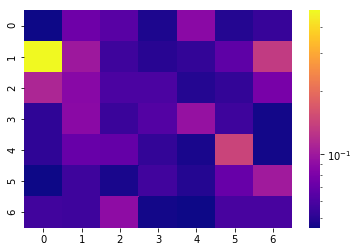

[[0.045 0.074 0.065 0.048 0.088 0.049 0.054]
 [0.479 0.1   0.056 0.05  0.053 0.067 0.133]
 [0.112 0.087 0.06  0.06  0.049 0.053 0.079]
 [0.052 0.088 0.055 0.063 0.095 0.056 0.046]
 [0.052 0.071 0.07  0.053 0.047 0.144 0.046]
 [0.045 0.056 0.047 0.057 0.049 0.071 0.102]
 [0.057 0.056 0.09  0.046 0.045 0.059 0.059]]


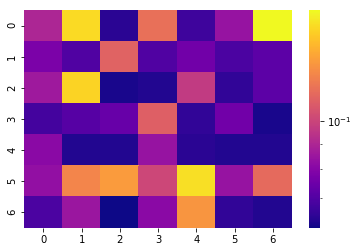

[[0.09  0.155 0.064 0.116 0.067 0.084 0.167]
 [0.078 0.07  0.111 0.07  0.076 0.069 0.072]
 [0.086 0.153 0.062 0.063 0.097 0.065 0.072]
 [0.068 0.071 0.074 0.11  0.065 0.076 0.062]
 [0.081 0.063 0.063 0.084 0.064 0.063 0.063]
 [0.083 0.124 0.132 0.101 0.157 0.084 0.114]
 [0.069 0.085 0.061 0.081 0.13  0.065 0.063]]


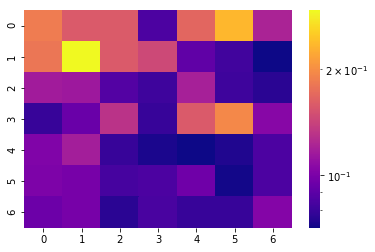

[[0.186 0.158 0.159 0.085 0.168 0.235 0.121]
 [0.181 0.294 0.158 0.146 0.091 0.082 0.071]
 [0.117 0.115 0.087 0.081 0.119 0.081 0.076]
 [0.079 0.094 0.131 0.079 0.158 0.196 0.105]
 [0.102 0.118 0.079 0.073 0.071 0.074 0.085]
 [0.101 0.099 0.083 0.085 0.096 0.072 0.085]
 [0.095 0.099 0.076 0.084 0.079 0.079 0.104]]


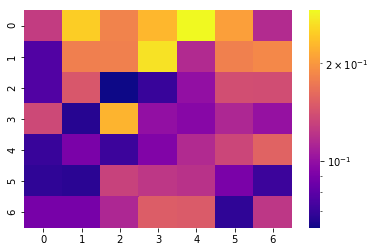

[[0.127 0.248 0.183 0.229 0.292 0.207 0.116]
 [0.077 0.179 0.181 0.269 0.115 0.18  0.187]
 [0.077 0.147 0.062 0.07  0.1   0.14  0.139]
 [0.136 0.066 0.226 0.1   0.095 0.113 0.101]
 [0.07  0.09  0.071 0.093 0.115 0.134 0.156]
 [0.068 0.067 0.131 0.123 0.12  0.09  0.071]
 [0.089 0.089 0.113 0.151 0.15  0.068 0.123]]


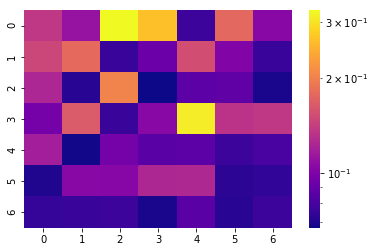

[[0.136 0.111 0.327 0.264 0.077 0.177 0.104]
 [0.148 0.179 0.076 0.093 0.154 0.101 0.076]
 [0.123 0.072 0.202 0.067 0.087 0.088 0.069]
 [0.096 0.165 0.076 0.104 0.312 0.133 0.136]
 [0.118 0.068 0.096 0.086 0.087 0.077 0.081]
 [0.07  0.104 0.103 0.124 0.125 0.073 0.074]
 [0.075 0.076 0.077 0.069 0.086 0.072 0.077]]


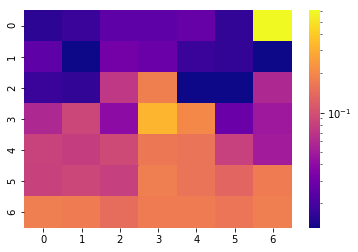

[[0.016 0.018 0.025 0.025 0.027 0.017 0.61 ]
 [0.025 0.013 0.031 0.028 0.018 0.017 0.013]
 [0.018 0.017 0.073 0.183 0.013 0.013 0.059]
 [0.059 0.089 0.04  0.324 0.202 0.028 0.048]
 [0.084 0.08  0.093 0.165 0.159 0.082 0.05 ]
 [0.083 0.089 0.081 0.178 0.158 0.133 0.175]
 [0.178 0.175 0.146 0.175 0.175 0.162 0.178]]


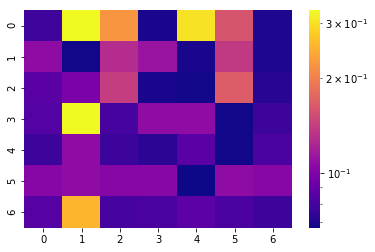

[[0.078 0.328 0.221 0.069 0.301 0.159 0.07 ]
 [0.107 0.068 0.128 0.112 0.069 0.138 0.07 ]
 [0.086 0.098 0.141 0.069 0.068 0.167 0.072]
 [0.084 0.328 0.08  0.107 0.107 0.068 0.077]
 [0.077 0.107 0.077 0.073 0.086 0.068 0.082]
 [0.103 0.107 0.103 0.103 0.067 0.107 0.103]
 [0.085 0.253 0.08  0.082 0.087 0.082 0.077]]


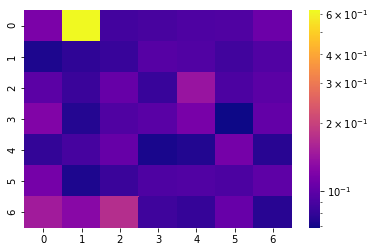

[[0.118 0.624 0.087 0.089 0.092 0.093 0.108]
 [0.073 0.079 0.082 0.096 0.094 0.086 0.094]
 [0.099 0.083 0.105 0.082 0.14  0.091 0.099]
 [0.122 0.075 0.093 0.098 0.116 0.069 0.103]
 [0.08  0.088 0.105 0.072 0.074 0.114 0.076]
 [0.114 0.073 0.083 0.092 0.094 0.091 0.1  ]
 [0.149 0.128 0.171 0.085 0.081 0.106 0.076]]


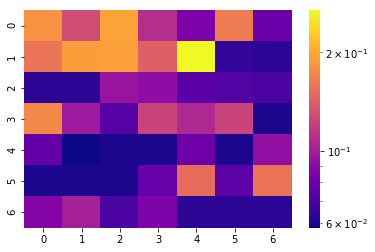

[[0.182 0.129 0.195 0.109 0.084 0.163 0.079]
 [0.158 0.191 0.192 0.142 0.269 0.064 0.063]
 [0.063 0.063 0.095 0.092 0.074 0.072 0.07 ]
 [0.173 0.098 0.073 0.123 0.106 0.123 0.06 ]
 [0.077 0.058 0.06  0.06  0.08  0.06  0.093]
 [0.06  0.06  0.06  0.078 0.151 0.075 0.156]
 [0.087 0.101 0.07  0.085 0.063 0.063 0.063]]
SKIPPPPPPEDDDD


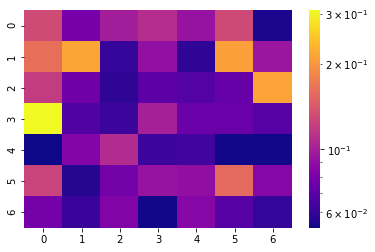

[[0.131 0.08  0.099 0.109 0.093 0.13  0.055]
 [0.162 0.215 0.06  0.091 0.059 0.209 0.095]
 [0.12  0.077 0.059 0.071 0.068 0.074 0.213]
 [0.308 0.067 0.062 0.1   0.075 0.075 0.069]
 [0.053 0.085 0.108 0.062 0.063 0.054 0.054]
 [0.126 0.057 0.078 0.093 0.09  0.156 0.086]
 [0.079 0.061 0.084 0.054 0.086 0.069 0.06 ]]
SKIPPPPPPEDDDD


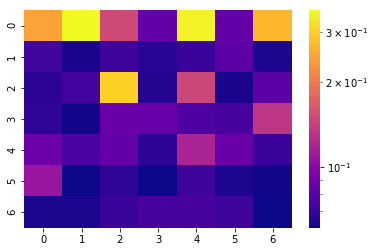

[[0.246 0.358 0.15  0.085 0.346 0.084 0.271]
 [0.073 0.063 0.072 0.066 0.071 0.081 0.064]
 [0.067 0.074 0.302 0.065 0.147 0.063 0.081]
 [0.068 0.062 0.087 0.086 0.077 0.075 0.134]
 [0.088 0.076 0.084 0.067 0.12  0.087 0.071]
 [0.109 0.061 0.068 0.061 0.072 0.064 0.062]
 [0.064 0.064 0.071 0.075 0.075 0.072 0.061]]


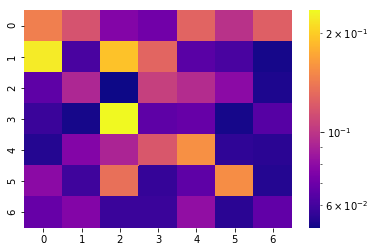

[[0.145 0.116 0.076 0.071 0.127 0.098 0.124]
 [0.222 0.061 0.192 0.128 0.065 0.061 0.052]
 [0.066 0.092 0.051 0.105 0.095 0.079 0.053]
 [0.058 0.052 0.234 0.066 0.068 0.052 0.064]
 [0.054 0.076 0.091 0.119 0.157 0.056 0.055]
 [0.079 0.059 0.135 0.057 0.066 0.155 0.054]
 [0.068 0.076 0.058 0.058 0.081 0.055 0.067]]


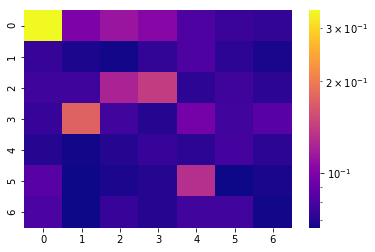

[[0.342 0.099 0.113 0.104 0.082 0.076 0.074]
 [0.075 0.069 0.067 0.074 0.082 0.072 0.068]
 [0.077 0.077 0.123 0.141 0.072 0.077 0.072]
 [0.075 0.175 0.078 0.07  0.096 0.078 0.085]
 [0.07  0.067 0.07  0.075 0.072 0.079 0.072]
 [0.085 0.066 0.069 0.07  0.131 0.066 0.068]
 [0.081 0.066 0.075 0.07  0.078 0.078 0.067]]


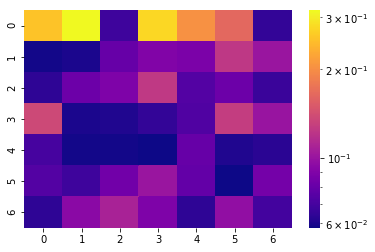

[[0.256 0.317 0.068 0.276 0.204 0.164 0.065]
 [0.059 0.06  0.08  0.09  0.088 0.124 0.101]
 [0.064 0.082 0.089 0.125 0.074 0.082 0.067]
 [0.137 0.06  0.061 0.065 0.073 0.128 0.1  ]
 [0.07  0.059 0.059 0.058 0.08  0.061 0.063]
 [0.074 0.068 0.084 0.101 0.079 0.058 0.085]
 [0.064 0.094 0.109 0.089 0.064 0.097 0.069]]


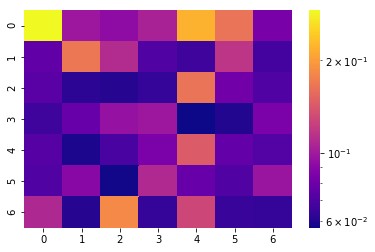

[[0.291 0.098 0.092 0.105 0.22  0.165 0.084]
 [0.076 0.168 0.11  0.071 0.066 0.117 0.068]
 [0.074 0.062 0.061 0.064 0.165 0.081 0.071]
 [0.066 0.078 0.095 0.098 0.057 0.06  0.085]
 [0.073 0.059 0.069 0.085 0.145 0.077 0.072]
 [0.071 0.09  0.058 0.109 0.078 0.071 0.097]
 [0.108 0.061 0.183 0.064 0.129 0.065 0.064]]


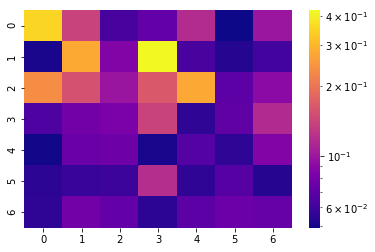

[[0.353 0.14  0.063 0.073 0.117 0.049 0.1  ]
 [0.051 0.279 0.086 0.423 0.063 0.053 0.061]
 [0.236 0.156 0.099 0.164 0.276 0.07  0.091]
 [0.065 0.079 0.082 0.14  0.056 0.071 0.116]
 [0.05  0.075 0.077 0.051 0.067 0.056 0.086]
 [0.055 0.058 0.059 0.119 0.056 0.068 0.053]
 [0.056 0.079 0.073 0.055 0.07  0.076 0.074]]


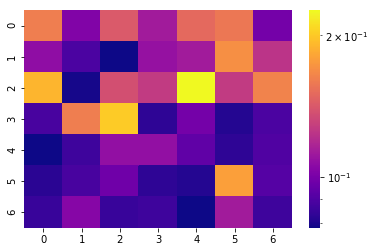

[[0.161 0.103 0.142 0.113 0.15  0.158 0.099]
 [0.107 0.089 0.078 0.109 0.113 0.17  0.124]
 [0.19  0.079 0.137 0.127 0.226 0.127 0.164]
 [0.088 0.161 0.202 0.083 0.099 0.081 0.089]
 [0.078 0.086 0.108 0.108 0.094 0.083 0.09 ]
 [0.082 0.088 0.098 0.083 0.081 0.179 0.091]
 [0.085 0.104 0.085 0.086 0.078 0.113 0.086]]


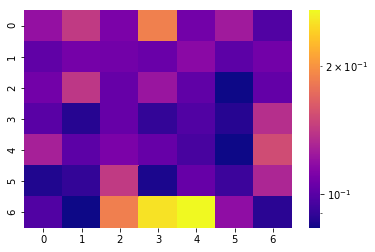

[[0.12  0.142 0.111 0.188 0.108 0.125 0.098]
 [0.102 0.109 0.108 0.105 0.116 0.101 0.108]
 [0.108 0.14  0.104 0.122 0.102 0.083 0.103]
 [0.1   0.087 0.104 0.09  0.098 0.087 0.136]
 [0.128 0.101 0.111 0.104 0.095 0.083 0.153]
 [0.086 0.09  0.142 0.085 0.104 0.092 0.131]
 [0.098 0.083 0.187 0.255 0.271 0.118 0.088]]
SKIPPPPPPEDDDD


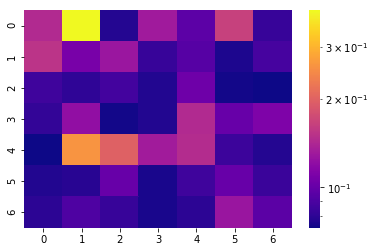

[[0.144 0.398 0.078 0.131 0.097 0.164 0.083]
 [0.153 0.109 0.128 0.083 0.094 0.076 0.088]
 [0.086 0.081 0.087 0.077 0.104 0.074 0.073]
 [0.082 0.122 0.074 0.077 0.144 0.101 0.112]
 [0.073 0.26  0.198 0.132 0.146 0.085 0.078]
 [0.077 0.079 0.101 0.075 0.086 0.101 0.084]
 [0.08  0.091 0.083 0.075 0.08  0.127 0.096]]


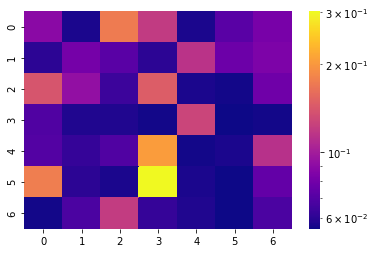

[[0.089 0.057 0.173 0.12  0.057 0.072 0.082]
 [0.06  0.081 0.072 0.06  0.115 0.078 0.084]
 [0.14  0.093 0.064 0.147 0.057 0.056 0.079]
 [0.069 0.058 0.058 0.056 0.128 0.055 0.056]
 [0.07  0.062 0.069 0.204 0.056 0.057 0.113]
 [0.176 0.06  0.057 0.302 0.057 0.055 0.075]
 [0.056 0.068 0.121 0.062 0.058 0.055 0.068]]


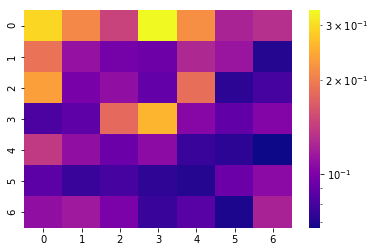

[[0.294 0.211 0.146 0.334 0.217 0.123 0.131]
 [0.189 0.111 0.097 0.094 0.126 0.113 0.071]
 [0.235 0.098 0.109 0.09  0.186 0.073 0.08 ]
 [0.082 0.088 0.181 0.256 0.104 0.089 0.103]
 [0.139 0.109 0.093 0.107 0.076 0.073 0.067]
 [0.087 0.076 0.08  0.074 0.071 0.093 0.106]
 [0.109 0.116 0.099 0.076 0.086 0.07  0.122]]


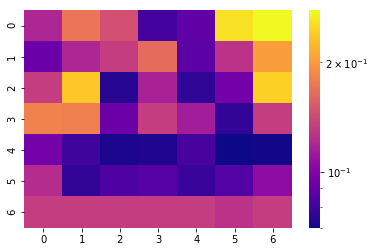

[[0.119 0.173 0.145 0.081 0.089 0.257 0.278]
 [0.092 0.119 0.133 0.165 0.088 0.127 0.204]
 [0.133 0.237 0.074 0.117 0.076 0.095 0.243]
 [0.182 0.18  0.093 0.133 0.114 0.077 0.133]
 [0.096 0.08  0.072 0.073 0.082 0.07  0.071]
 [0.123 0.077 0.084 0.086 0.078 0.085 0.105]
 [0.133 0.133 0.133 0.133 0.133 0.127 0.133]]


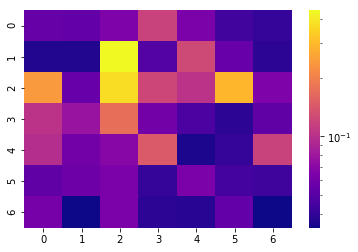

[[0.055 0.054 0.065 0.118 0.063 0.044 0.041]
 [0.037 0.037 0.442 0.049 0.126 0.056 0.039]
 [0.24  0.056 0.376 0.123 0.103 0.294 0.065]
 [0.103 0.078 0.174 0.06  0.047 0.039 0.053]
 [0.098 0.06  0.068 0.145 0.036 0.041 0.118]
 [0.053 0.058 0.063 0.041 0.063 0.045 0.043]
 [0.062 0.034 0.063 0.039 0.038 0.054 0.034]]


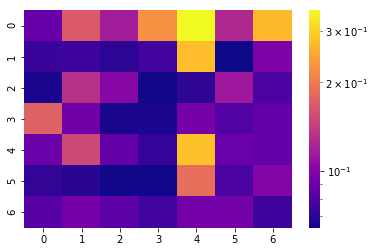

[[0.089 0.168 0.117 0.226 0.352 0.126 0.27 ]
 [0.074 0.075 0.07  0.076 0.276 0.064 0.098]
 [0.066 0.132 0.102 0.065 0.071 0.114 0.079]
 [0.174 0.092 0.066 0.067 0.095 0.081 0.088]
 [0.09  0.152 0.088 0.073 0.282 0.09  0.087]
 [0.072 0.069 0.065 0.065 0.188 0.079 0.1  ]
 [0.083 0.094 0.085 0.076 0.094 0.094 0.075]]
SKIPPPPPPEDDDD


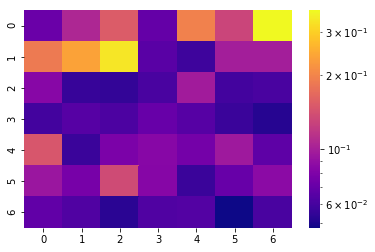

[[0.072 0.106 0.153 0.07  0.196 0.131 0.366]
 [0.187 0.237 0.333 0.066 0.058 0.099 0.099]
 [0.084 0.056 0.055 0.061 0.098 0.059 0.061]
 [0.059 0.065 0.062 0.071 0.065 0.057 0.052]
 [0.148 0.057 0.079 0.084 0.076 0.096 0.068]
 [0.094 0.077 0.136 0.083 0.057 0.071 0.086]
 [0.069 0.063 0.053 0.063 0.064 0.048 0.061]]


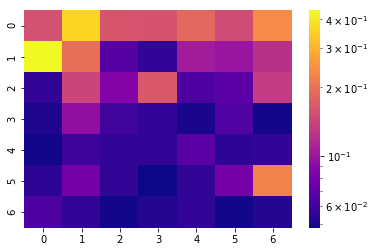

[[0.156 0.365 0.161 0.159 0.185 0.151 0.236]
 [0.438 0.196 0.067 0.056 0.104 0.099 0.122]
 [0.056 0.143 0.087 0.164 0.064 0.069 0.134]
 [0.051 0.094 0.06  0.056 0.05  0.065 0.049]
 [0.049 0.059 0.056 0.056 0.068 0.054 0.056]
 [0.054 0.08  0.056 0.048 0.056 0.08  0.225]
 [0.064 0.056 0.049 0.052 0.056 0.049 0.052]]


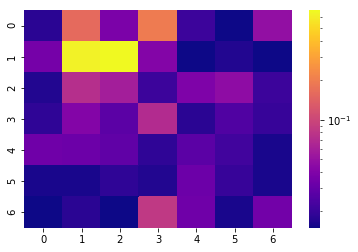

[[0.018 0.16  0.038 0.196 0.021 0.015 0.048]
 [0.036 0.634 0.68  0.041 0.015 0.017 0.015]
 [0.017 0.073 0.059 0.021 0.039 0.046 0.021]
 [0.019 0.041 0.028 0.07  0.018 0.025 0.02 ]
 [0.034 0.033 0.029 0.019 0.028 0.022 0.016]
 [0.016 0.016 0.019 0.017 0.033 0.02  0.016]
 [0.015 0.018 0.015 0.084 0.034 0.016 0.035]]


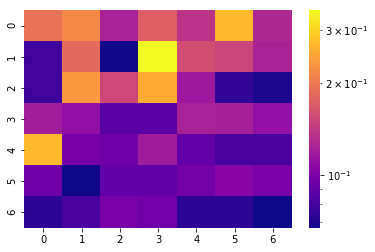

[[0.194 0.217 0.123 0.174 0.137 0.271 0.128]
 [0.078 0.184 0.068 0.347 0.159 0.151 0.124]
 [0.078 0.233 0.153 0.256 0.117 0.075 0.07 ]
 [0.12  0.111 0.087 0.087 0.122 0.121 0.111]
 [0.269 0.098 0.095 0.118 0.091 0.081 0.081]
 [0.095 0.067 0.09  0.09  0.097 0.105 0.099]
 [0.073 0.081 0.099 0.096 0.073 0.073 0.067]]


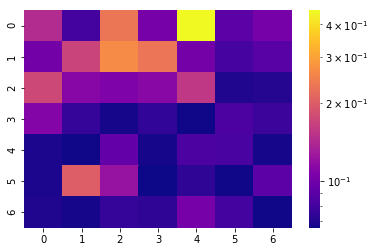

[[0.144 0.081 0.235 0.103 0.453 0.09  0.103]
 [0.101 0.17  0.265 0.232 0.102 0.082 0.089]
 [0.175 0.112 0.107 0.113 0.156 0.07  0.071]
 [0.11  0.076 0.068 0.075 0.067 0.084 0.078]
 [0.069 0.067 0.094 0.068 0.084 0.083 0.068]
 [0.069 0.201 0.122 0.066 0.074 0.067 0.09 ]
 [0.07  0.068 0.076 0.074 0.103 0.081 0.067]]


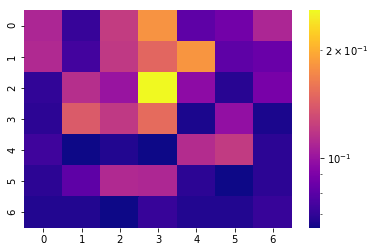

[[0.109 0.071 0.122 0.18  0.081 0.087 0.109]
 [0.111 0.074 0.12  0.149 0.182 0.081 0.084]
 [0.07  0.114 0.1   0.257 0.096 0.068 0.089]
 [0.069 0.141 0.12  0.152 0.066 0.098 0.066]
 [0.073 0.064 0.067 0.064 0.113 0.121 0.069]
 [0.069 0.081 0.111 0.11  0.069 0.064 0.069]
 [0.067 0.067 0.064 0.071 0.067 0.067 0.071]]


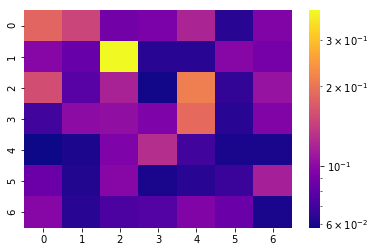

[[0.183 0.149 0.088 0.092 0.12  0.063 0.095]
 [0.097 0.084 0.389 0.063 0.063 0.098 0.09 ]
 [0.158 0.078 0.118 0.059 0.212 0.066 0.106]
 [0.07  0.101 0.103 0.094 0.189 0.063 0.095]
 [0.058 0.061 0.094 0.127 0.07  0.06  0.06 ]
 [0.086 0.062 0.097 0.06  0.063 0.068 0.115]
 [0.098 0.063 0.074 0.076 0.095 0.085 0.06 ]]


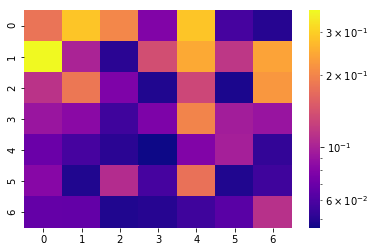

[[0.179 0.286 0.201 0.079 0.287 0.058 0.05 ]
 [0.37  0.101 0.051 0.138 0.248 0.116 0.24 ]
 [0.113 0.183 0.078 0.049 0.131 0.048 0.222]
 [0.091 0.083 0.056 0.077 0.198 0.096 0.09 ]
 [0.07  0.058 0.051 0.046 0.079 0.098 0.053]
 [0.082 0.049 0.108 0.058 0.175 0.049 0.056]
 [0.068 0.067 0.049 0.05  0.056 0.064 0.111]]


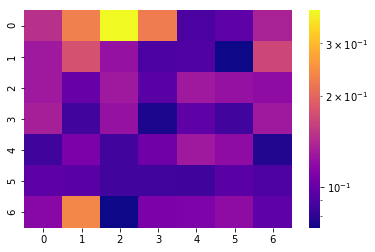

[[0.148 0.23  0.386 0.226 0.09  0.097 0.136]
 [0.129 0.178 0.123 0.09  0.092 0.073 0.168]
 [0.129 0.1   0.129 0.095 0.129 0.123 0.119]
 [0.133 0.086 0.123 0.076 0.097 0.086 0.129]
 [0.085 0.109 0.086 0.104 0.129 0.119 0.077]
 [0.096 0.095 0.086 0.086 0.085 0.095 0.091]
 [0.116 0.237 0.073 0.109 0.111 0.119 0.097]]


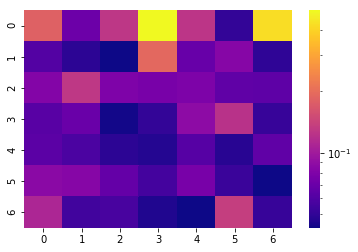

[[0.181 0.071 0.127 0.499 0.126 0.051 0.427]
 [0.061 0.049 0.043 0.193 0.069 0.084 0.05 ]
 [0.082 0.129 0.08  0.077 0.079 0.066 0.065]
 [0.063 0.07  0.044 0.051 0.088 0.123 0.052]
 [0.064 0.058 0.049 0.047 0.062 0.048 0.066]
 [0.086 0.084 0.068 0.056 0.077 0.053 0.043]
 [0.11  0.055 0.057 0.046 0.043 0.136 0.052]]
SKIPPPPPPEDDDD


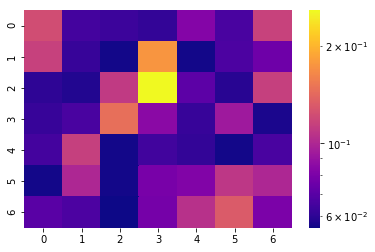

[[0.123 0.065 0.063 0.061 0.083 0.066 0.116]
 [0.115 0.062 0.056 0.175 0.056 0.067 0.076]
 [0.06  0.058 0.111 0.257 0.071 0.059 0.114]
 [0.062 0.066 0.146 0.085 0.062 0.093 0.057]
 [0.065 0.114 0.056 0.064 0.061 0.056 0.066]
 [0.056 0.1   0.056 0.079 0.082 0.109 0.1  ]
 [0.07  0.067 0.055 0.078 0.106 0.132 0.08 ]]


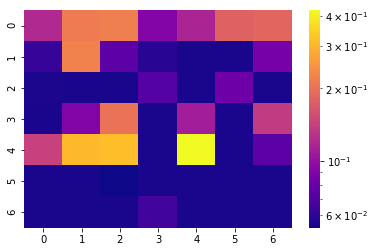

[[0.121 0.215 0.22  0.092 0.117 0.181 0.187]
 [0.062 0.223 0.074 0.058 0.055 0.055 0.086]
 [0.056 0.055 0.055 0.072 0.055 0.082 0.055]
 [0.055 0.091 0.203 0.055 0.11  0.055 0.137]
 [0.143 0.305 0.316 0.055 0.421 0.055 0.075]
 [0.055 0.055 0.053 0.055 0.055 0.055 0.055]
 [0.055 0.055 0.055 0.065 0.055 0.055 0.055]]


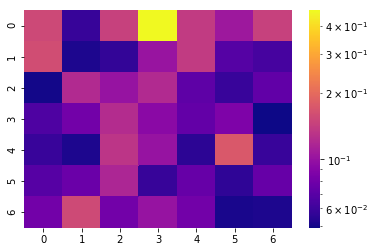

[[0.154 0.058 0.145 0.472 0.139 0.105 0.145]
 [0.159 0.052 0.057 0.102 0.139 0.068 0.063]
 [0.05  0.121 0.101 0.121 0.072 0.059 0.073]
 [0.066 0.081 0.124 0.093 0.074 0.087 0.049]
 [0.059 0.052 0.133 0.101 0.055 0.175 0.059]
 [0.069 0.077 0.117 0.058 0.075 0.056 0.075]
 [0.081 0.155 0.081 0.101 0.081 0.051 0.052]]


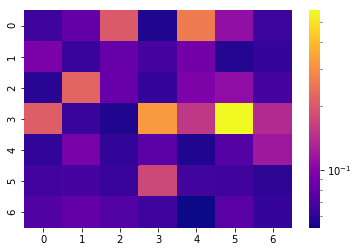

[[0.066 0.082 0.202 0.057 0.264 0.11  0.065]
 [0.094 0.064 0.083 0.069 0.09  0.058 0.063]
 [0.059 0.219 0.084 0.063 0.095 0.108 0.069]
 [0.21  0.064 0.057 0.324 0.153 0.567 0.137]
 [0.062 0.093 0.062 0.077 0.057 0.075 0.118]
 [0.068 0.069 0.064 0.176 0.067 0.066 0.061]
 [0.073 0.082 0.074 0.066 0.053 0.077 0.063]]


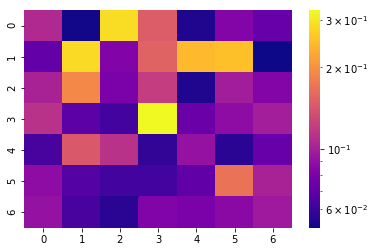

[[0.106 0.052 0.289 0.148 0.054 0.084 0.073]
 [0.072 0.285 0.082 0.154 0.246 0.253 0.051]
 [0.102 0.191 0.08  0.121 0.054 0.098 0.084]
 [0.113 0.069 0.062 0.325 0.074 0.088 0.099]
 [0.063 0.144 0.113 0.058 0.091 0.056 0.073]
 [0.088 0.067 0.062 0.062 0.071 0.169 0.102]
 [0.091 0.063 0.056 0.082 0.08  0.086 0.096]]


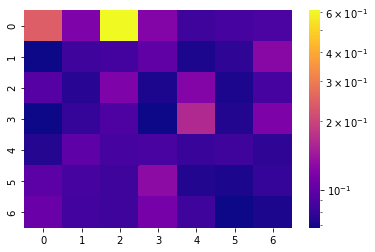

[[0.243 0.118 0.611 0.122 0.084 0.087 0.089]
 [0.068 0.084 0.086 0.1   0.071 0.078 0.126]
 [0.095 0.075 0.118 0.072 0.122 0.072 0.087]
 [0.068 0.08  0.091 0.068 0.163 0.073 0.117]
 [0.074 0.099 0.087 0.088 0.081 0.084 0.077]
 [0.097 0.087 0.084 0.129 0.073 0.072 0.08 ]
 [0.105 0.085 0.083 0.113 0.084 0.068 0.071]]
SKIPPPPPPEDDDD


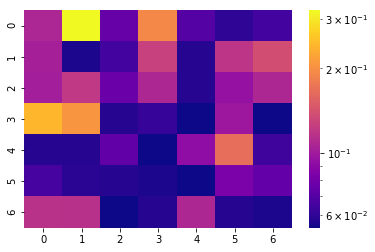

[[0.107 0.322 0.076 0.193 0.07  0.06  0.065]
 [0.103 0.056 0.065 0.127 0.058 0.118 0.138]
 [0.102 0.121 0.077 0.108 0.058 0.095 0.108]
 [0.242 0.207 0.058 0.062 0.054 0.098 0.054]
 [0.058 0.058 0.074 0.054 0.092 0.166 0.064]
 [0.066 0.059 0.058 0.056 0.054 0.083 0.075]
 [0.116 0.115 0.054 0.058 0.108 0.058 0.056]]


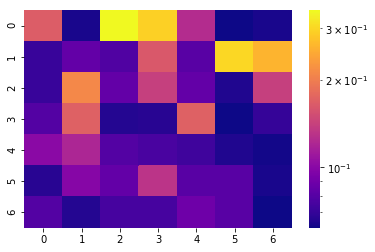

[[0.167 0.064 0.346 0.293 0.125 0.062 0.064]
 [0.071 0.085 0.078 0.162 0.081 0.302 0.26 ]
 [0.071 0.211 0.085 0.14  0.085 0.065 0.14 ]
 [0.079 0.17  0.066 0.067 0.17  0.062 0.07 ]
 [0.101 0.12  0.079 0.076 0.073 0.065 0.063]
 [0.067 0.099 0.085 0.131 0.081 0.081 0.064]
 [0.079 0.066 0.075 0.075 0.089 0.081 0.062]]


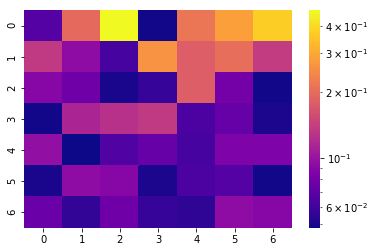

[[0.067 0.197 0.47  0.049 0.216 0.285 0.376]
 [0.136 0.094 0.062 0.262 0.181 0.203 0.138]
 [0.089 0.078 0.05  0.057 0.18  0.08  0.049]
 [0.049 0.114 0.126 0.136 0.064 0.074 0.051]
 [0.097 0.048 0.065 0.074 0.062 0.085 0.085]
 [0.05  0.094 0.09  0.051 0.064 0.067 0.049]
 [0.075 0.056 0.078 0.057 0.055 0.094 0.09 ]]


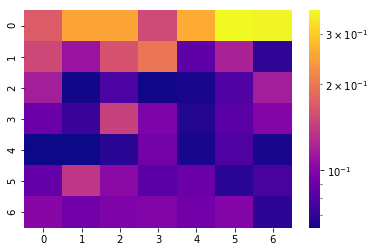

[[0.172 0.251 0.251 0.154 0.261 0.363 0.357]
 [0.153 0.111 0.162 0.198 0.085 0.121 0.07 ]
 [0.118 0.064 0.078 0.064 0.065 0.08  0.118]
 [0.09  0.073 0.146 0.098 0.067 0.083 0.1  ]
 [0.063 0.063 0.068 0.093 0.065 0.079 0.065]
 [0.087 0.137 0.104 0.083 0.09  0.068 0.077]
 [0.102 0.092 0.098 0.099 0.092 0.101 0.069]]
SKIPPPPPPEDDDD


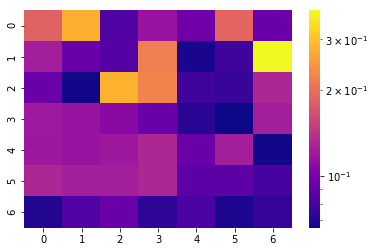

[[0.186 0.278 0.084 0.116 0.096 0.189 0.093]
 [0.123 0.093 0.085 0.217 0.068 0.078 0.379]
 [0.094 0.067 0.281 0.223 0.078 0.076 0.129]
 [0.12  0.116 0.108 0.094 0.072 0.066 0.123]
 [0.119 0.116 0.119 0.129 0.094 0.123 0.067]
 [0.129 0.123 0.123 0.129 0.088 0.088 0.08 ]
 [0.07  0.084 0.094 0.073 0.082 0.069 0.075]]


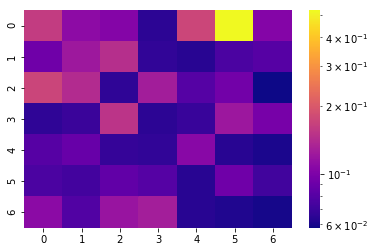

[[0.161 0.11  0.105 0.065 0.174 0.526 0.105]
 [0.093 0.122 0.145 0.067 0.064 0.076 0.081]
 [0.173 0.141 0.066 0.126 0.08  0.094 0.058]
 [0.066 0.07  0.152 0.065 0.069 0.121 0.097]
 [0.081 0.089 0.068 0.067 0.107 0.064 0.061]
 [0.076 0.073 0.086 0.08  0.064 0.093 0.072]
 [0.109 0.079 0.118 0.128 0.064 0.062 0.06 ]]


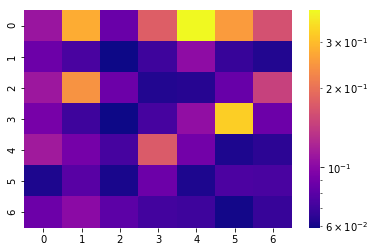

[[0.11  0.277 0.086 0.178 0.395 0.253 0.163]
 [0.087 0.074 0.059 0.07  0.103 0.068 0.063]
 [0.111 0.242 0.087 0.063 0.064 0.085 0.147]
 [0.092 0.07  0.059 0.073 0.105 0.328 0.087]
 [0.114 0.091 0.073 0.174 0.09  0.062 0.065]
 [0.062 0.079 0.061 0.087 0.062 0.075 0.074]
 [0.087 0.102 0.081 0.072 0.07  0.06  0.068]]


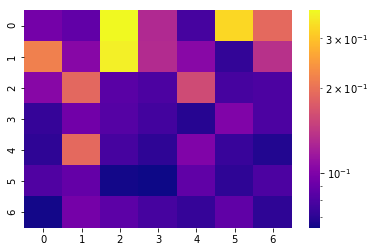

[[0.095 0.088 0.377 0.129 0.078 0.328 0.191]
 [0.218 0.104 0.364 0.131 0.105 0.072 0.136]
 [0.104 0.189 0.085 0.08  0.159 0.078 0.08 ]
 [0.073 0.094 0.083 0.077 0.069 0.101 0.08 ]
 [0.071 0.191 0.078 0.071 0.101 0.074 0.068]
 [0.081 0.089 0.065 0.064 0.087 0.071 0.08 ]
 [0.065 0.096 0.086 0.078 0.073 0.087 0.071]]


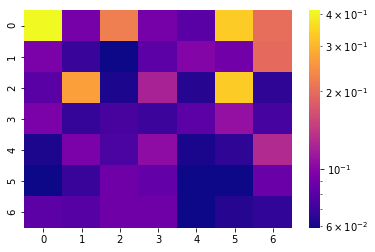

[[0.413 0.093 0.222 0.093 0.08  0.336 0.202]
 [0.094 0.069 0.059 0.081 0.099 0.09  0.197]
 [0.08  0.268 0.062 0.122 0.064 0.336 0.066]
 [0.094 0.068 0.074 0.07  0.081 0.108 0.073]
 [0.062 0.094 0.075 0.105 0.061 0.066 0.129]
 [0.059 0.069 0.089 0.084 0.059 0.059 0.087]
 [0.081 0.079 0.089 0.089 0.059 0.064 0.067]]


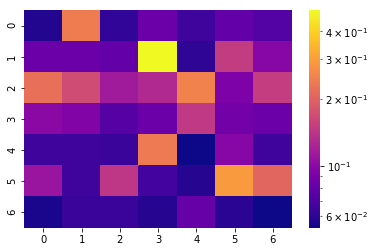

[[0.057 0.242 0.061 0.084 0.065 0.08  0.073]
 [0.084 0.084 0.08  0.496 0.06  0.149 0.098]
 [0.222 0.168 0.115 0.129 0.249 0.092 0.151]
 [0.1   0.095 0.074 0.084 0.145 0.087 0.084]
 [0.065 0.065 0.064 0.237 0.053 0.098 0.065]
 [0.11  0.065 0.143 0.067 0.058 0.292 0.207]
 [0.055 0.064 0.064 0.058 0.081 0.059 0.053]]


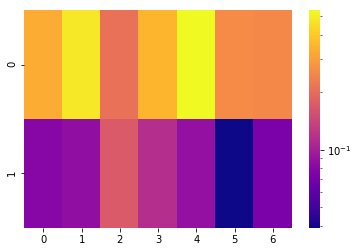

[[0.331 0.482 0.211 0.351 0.537 0.258 0.253]
 [0.08  0.086 0.172 0.115 0.088 0.039 0.074]]


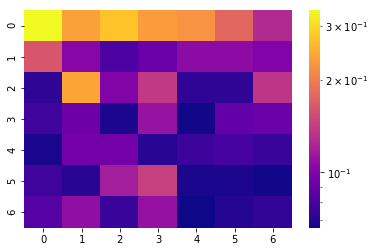

[[0.338 0.237 0.275 0.233 0.222 0.178 0.127]
 [0.163 0.103 0.081 0.091 0.106 0.106 0.1  ]
 [0.073 0.242 0.101 0.138 0.073 0.073 0.135]
 [0.077 0.093 0.069 0.111 0.067 0.089 0.091]
 [0.068 0.095 0.095 0.071 0.076 0.079 0.075]
 [0.077 0.071 0.118 0.143 0.068 0.069 0.067]
 [0.084 0.108 0.075 0.11  0.066 0.07  0.074]]
SKIPPPPPPEDDDD


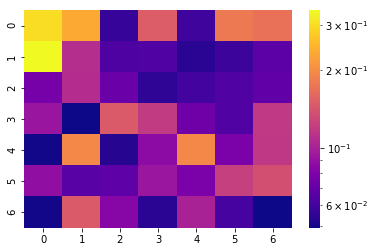

[[0.3   0.235 0.057 0.15  0.059 0.179 0.171]
 [0.341 0.109 0.063 0.064 0.054 0.058 0.067]
 [0.077 0.108 0.072 0.055 0.06  0.064 0.069]
 [0.092 0.049 0.146 0.119 0.074 0.064 0.118]
 [0.05  0.195 0.053 0.086 0.195 0.078 0.117]
 [0.088 0.066 0.068 0.093 0.078 0.123 0.137]
 [0.05  0.146 0.083 0.054 0.101 0.061 0.049]]


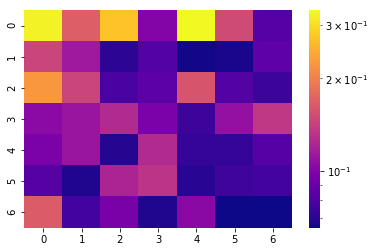

[[0.325 0.168 0.272 0.101 0.334 0.151 0.083]
 [0.146 0.114 0.071 0.082 0.066 0.067 0.086]
 [0.224 0.146 0.079 0.085 0.16  0.082 0.075]
 [0.104 0.111 0.125 0.097 0.075 0.108 0.135]
 [0.097 0.111 0.069 0.125 0.073 0.073 0.083]
 [0.083 0.068 0.121 0.133 0.07  0.076 0.077]
 [0.166 0.077 0.096 0.068 0.103 0.065 0.065]]


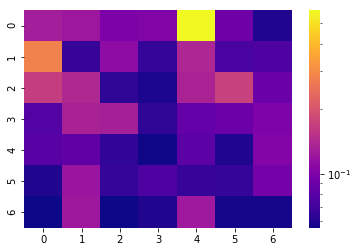

[[0.129 0.122 0.1   0.102 0.572 0.092 0.06 ]
 [0.281 0.067 0.111 0.066 0.138 0.074 0.076]
 [0.165 0.139 0.064 0.059 0.134 0.172 0.089]
 [0.078 0.133 0.13  0.064 0.086 0.09  0.101]
 [0.08  0.084 0.065 0.057 0.082 0.06  0.103]
 [0.06  0.12  0.066 0.076 0.067 0.066 0.095]
 [0.056 0.123 0.056 0.06  0.124 0.058 0.058]]


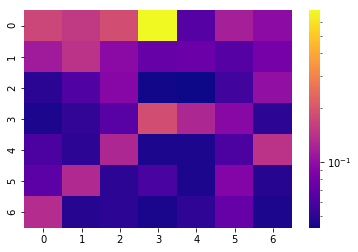

[[0.172 0.153 0.186 0.693 0.065 0.118 0.097]
 [0.113 0.143 0.096 0.073 0.076 0.065 0.082]
 [0.049 0.063 0.092 0.044 0.043 0.057 0.101]
 [0.046 0.052 0.066 0.186 0.127 0.093 0.05 ]
 [0.061 0.05  0.126 0.046 0.046 0.061 0.143]
 [0.068 0.129 0.05  0.06  0.046 0.09  0.048]
 [0.134 0.048 0.05  0.045 0.051 0.073 0.046]]


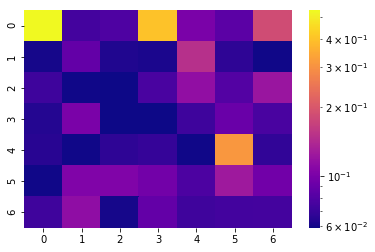

[[0.533 0.075 0.079 0.399 0.1   0.084 0.184]
 [0.061 0.088 0.063 0.062 0.149 0.067 0.06 ]
 [0.072 0.06  0.059 0.077 0.115 0.081 0.121]
 [0.064 0.1   0.059 0.059 0.072 0.091 0.077]
 [0.065 0.06  0.067 0.069 0.06  0.311 0.068]
 [0.06  0.104 0.104 0.096 0.078 0.125 0.095]
 [0.073 0.114 0.061 0.088 0.073 0.074 0.075]]


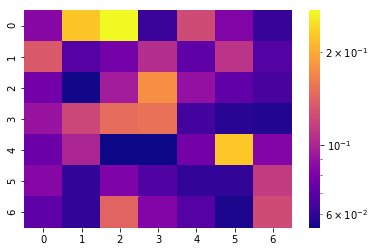

[[0.085 0.224 0.272 0.062 0.124 0.082 0.061]
 [0.134 0.069 0.078 0.105 0.071 0.109 0.068]
 [0.077 0.055 0.095 0.177 0.089 0.072 0.065]
 [0.091 0.121 0.149 0.153 0.064 0.058 0.057]
 [0.075 0.1   0.054 0.054 0.077 0.226 0.083]
 [0.084 0.06  0.081 0.067 0.06  0.06  0.114]
 [0.071 0.06  0.142 0.083 0.069 0.056 0.124]]
SKIPPPPPPEDDDD


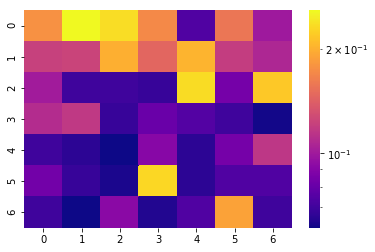

[[0.178 0.259 0.236 0.172 0.074 0.158 0.1  ]
 [0.122 0.124 0.2   0.147 0.204 0.12  0.107]
 [0.101 0.07  0.07  0.068 0.235 0.085 0.219]
 [0.11  0.117 0.068 0.081 0.075 0.07  0.062]
 [0.07  0.066 0.061 0.091 0.066 0.085 0.116]
 [0.084 0.068 0.063 0.231 0.066 0.074 0.074]
 [0.07  0.061 0.092 0.064 0.074 0.19  0.07 ]]


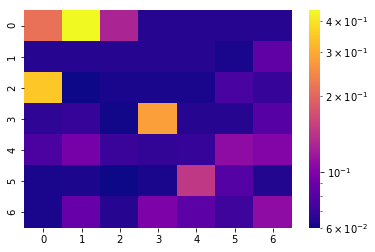

[[0.216 0.439 0.128 0.065 0.065 0.065 0.065]
 [0.065 0.065 0.065 0.065 0.065 0.062 0.085]
 [0.348 0.06  0.062 0.062 0.062 0.076 0.07 ]
 [0.067 0.07  0.061 0.284 0.065 0.065 0.081]
 [0.077 0.095 0.071 0.069 0.07  0.108 0.102]
 [0.062 0.063 0.06  0.062 0.146 0.08  0.064]
 [0.062 0.088 0.065 0.098 0.083 0.072 0.108]]


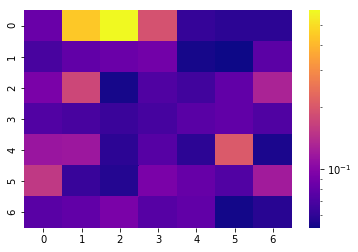

[[0.084 0.444 0.586 0.191 0.062 0.059 0.059]
 [0.069 0.08  0.085 0.089 0.054 0.052 0.077]
 [0.093 0.175 0.054 0.072 0.066 0.08  0.13 ]
 [0.073 0.069 0.064 0.068 0.076 0.08  0.072]
 [0.115 0.117 0.059 0.075 0.059 0.205 0.055]
 [0.155 0.063 0.057 0.093 0.082 0.073 0.121]
 [0.076 0.08  0.093 0.075 0.08  0.053 0.058]]


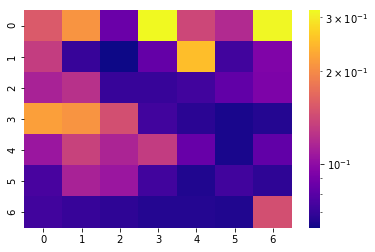

[[0.155 0.21  0.086 0.316 0.14  0.119 0.313]
 [0.133 0.07  0.062 0.084 0.252 0.073 0.094]
 [0.114 0.124 0.07  0.07  0.073 0.083 0.093]
 [0.22  0.21  0.147 0.073 0.067 0.064 0.066]
 [0.106 0.136 0.115 0.132 0.085 0.064 0.083]
 [0.075 0.114 0.106 0.073 0.065 0.073 0.068]
 [0.073 0.07  0.068 0.066 0.066 0.065 0.147]]


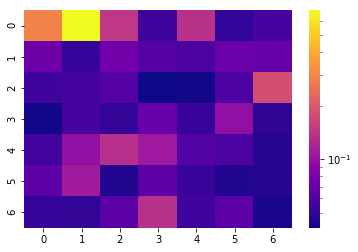

[[0.297 0.691 0.145 0.054 0.136 0.049 0.057]
 [0.074 0.051 0.076 0.062 0.059 0.072 0.07 ]
 [0.054 0.056 0.062 0.041 0.042 0.058 0.18 ]
 [0.042 0.057 0.05  0.071 0.052 0.098 0.048]
 [0.055 0.098 0.134 0.108 0.061 0.059 0.046]
 [0.065 0.109 0.045 0.066 0.052 0.045 0.046]
 [0.051 0.05  0.065 0.136 0.053 0.065 0.043]]


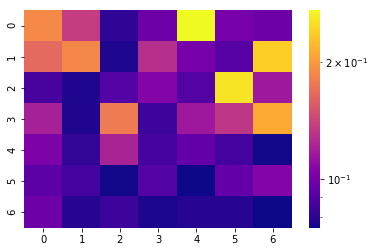

[[0.189 0.137 0.081 0.098 0.272 0.101 0.098]
 [0.166 0.187 0.078 0.128 0.101 0.091 0.238]
 [0.087 0.078 0.09  0.106 0.09  0.255 0.116]
 [0.12  0.078 0.179 0.084 0.116 0.133 0.212]
 [0.103 0.082 0.122 0.086 0.095 0.086 0.076]
 [0.093 0.086 0.076 0.09  0.075 0.095 0.106]
 [0.098 0.079 0.084 0.077 0.079 0.079 0.075]]


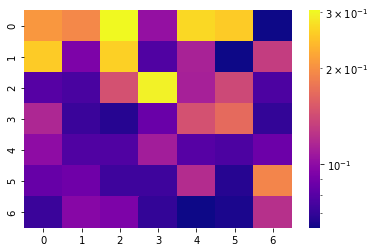

[[0.207 0.194 0.304 0.103 0.27  0.257 0.063]
 [0.257 0.093 0.262 0.078 0.113 0.063 0.131]
 [0.08  0.076 0.146 0.295 0.112 0.14  0.077]
 [0.116 0.072 0.067 0.086 0.146 0.167 0.07 ]
 [0.1   0.078 0.078 0.11  0.08  0.077 0.087]
 [0.085 0.088 0.073 0.073 0.12  0.067 0.191]
 [0.072 0.097 0.093 0.07  0.063 0.065 0.122]]


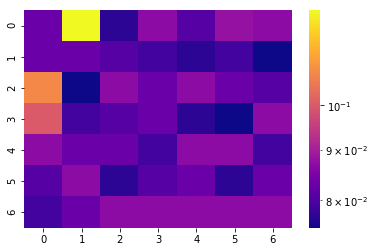

[[0.083 0.125 0.077 0.087 0.081 0.088 0.087]
 [0.083 0.083 0.081 0.079 0.077 0.079 0.075]
 [0.108 0.075 0.087 0.083 0.087 0.083 0.081]
 [0.1   0.079 0.081 0.083 0.077 0.075 0.087]
 [0.087 0.083 0.083 0.079 0.087 0.087 0.079]
 [0.081 0.087 0.077 0.081 0.083 0.077 0.083]
 [0.079 0.083 0.087 0.087 0.087 0.087 0.087]]


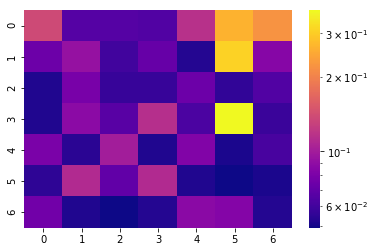

[[0.138 0.066 0.066 0.065 0.116 0.263 0.222]
 [0.074 0.093 0.06  0.072 0.053 0.309 0.085]
 [0.052 0.079 0.057 0.057 0.074 0.056 0.065]
 [0.052 0.088 0.067 0.114 0.063 0.372 0.058]
 [0.08  0.054 0.1   0.052 0.083 0.051 0.062]
 [0.055 0.11  0.07  0.11  0.052 0.049 0.051]
 [0.076 0.052 0.049 0.053 0.087 0.084 0.053]]


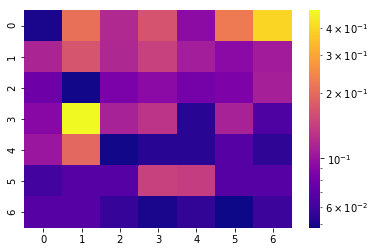

[[0.05  0.209 0.12  0.167 0.094 0.225 0.394]
 [0.115 0.168 0.118 0.144 0.109 0.093 0.107]
 [0.078 0.049 0.084 0.093 0.081 0.085 0.11 ]
 [0.091 0.48  0.112 0.131 0.053 0.112 0.065]
 [0.103 0.196 0.049 0.053 0.053 0.068 0.055]
 [0.061 0.068 0.068 0.145 0.14  0.068 0.068]
 [0.068 0.068 0.057 0.05  0.056 0.048 0.059]]


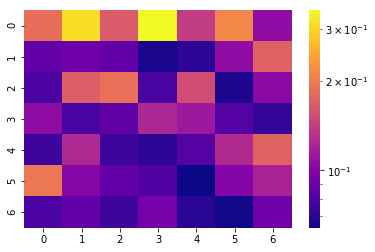

[[0.185 0.313 0.167 0.346 0.14  0.212 0.106]
 [0.087 0.091 0.087 0.066 0.07  0.105 0.174]
 [0.079 0.17  0.188 0.078 0.153 0.067 0.103]
 [0.105 0.078 0.086 0.123 0.113 0.082 0.072]
 [0.075 0.124 0.074 0.071 0.082 0.125 0.175]
 [0.195 0.102 0.087 0.081 0.064 0.1   0.12 ]
 [0.079 0.087 0.075 0.094 0.069 0.065 0.091]]


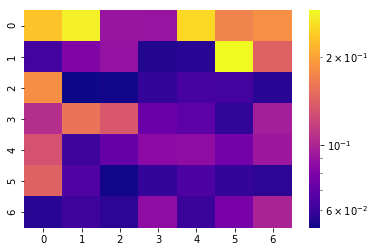

[[0.232 0.277 0.091 0.09  0.253 0.171 0.184]
 [0.062 0.081 0.089 0.055 0.056 0.288 0.142]
 [0.182 0.052 0.053 0.059 0.063 0.062 0.056]
 [0.105 0.158 0.135 0.073 0.069 0.058 0.096]
 [0.13  0.061 0.072 0.085 0.086 0.077 0.092]
 [0.142 0.066 0.053 0.059 0.065 0.059 0.057]
 [0.056 0.061 0.057 0.086 0.06  0.078 0.099]]


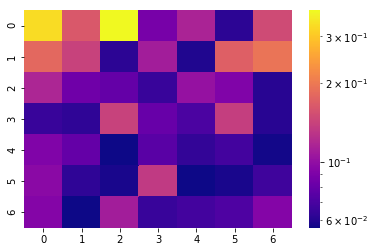

[[0.33  0.163 0.377 0.087 0.115 0.062 0.149]
 [0.179 0.141 0.062 0.11  0.059 0.171 0.193]
 [0.117 0.084 0.08  0.065 0.102 0.091 0.061]
 [0.065 0.063 0.14  0.081 0.071 0.137 0.061]
 [0.091 0.08  0.056 0.076 0.064 0.068 0.057]
 [0.096 0.063 0.058 0.133 0.056 0.058 0.067]
 [0.093 0.056 0.11  0.065 0.068 0.072 0.093]]


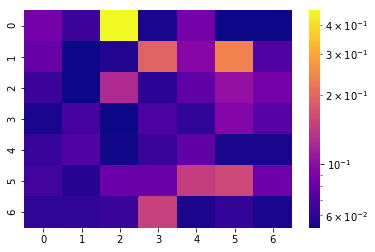

[[0.086 0.064 0.463 0.055 0.087 0.053 0.053]
 [0.08  0.053 0.057 0.193 0.096 0.239 0.071]
 [0.064 0.053 0.125 0.059 0.077 0.104 0.086]
 [0.055 0.067 0.053 0.07  0.061 0.095 0.073]
 [0.063 0.071 0.054 0.063 0.077 0.055 0.055]
 [0.066 0.058 0.083 0.081 0.147 0.158 0.084]
 [0.06  0.061 0.063 0.151 0.056 0.062 0.055]]


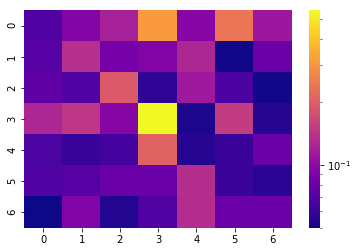

[[0.07  0.094 0.12  0.311 0.096 0.239 0.111]
 [0.072 0.135 0.087 0.093 0.127 0.051 0.08 ]
 [0.076 0.069 0.194 0.058 0.114 0.068 0.051]
 [0.126 0.145 0.096 0.55  0.053 0.152 0.055]
 [0.067 0.06  0.064 0.209 0.055 0.061 0.08 ]
 [0.069 0.072 0.08  0.08  0.134 0.061 0.056]
 [0.05  0.093 0.054 0.07  0.133 0.08  0.08 ]]


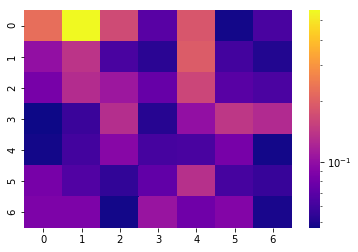

[[0.224 0.561 0.168 0.069 0.185 0.048 0.063]
 [0.101 0.138 0.063 0.053 0.194 0.061 0.051]
 [0.084 0.129 0.108 0.075 0.161 0.069 0.064]
 [0.047 0.058 0.13  0.052 0.101 0.141 0.127]
 [0.048 0.061 0.093 0.062 0.063 0.084 0.048]
 [0.084 0.066 0.055 0.073 0.133 0.062 0.057]
 [0.087 0.087 0.048 0.105 0.08  0.09  0.049]]


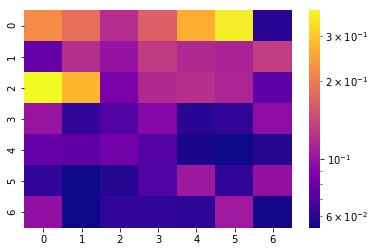

[[0.22  0.185 0.12  0.167 0.264 0.356 0.059]
 [0.078 0.121 0.1   0.131 0.117 0.112 0.133]
 [0.376 0.276 0.087 0.117 0.122 0.113 0.074]
 [0.101 0.061 0.07  0.093 0.059 0.061 0.096]
 [0.078 0.076 0.083 0.072 0.056 0.054 0.058]
 [0.061 0.054 0.058 0.07  0.104 0.061 0.099]
 [0.098 0.054 0.061 0.061 0.06  0.105 0.055]]


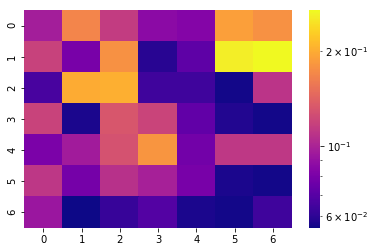

[[0.097 0.168 0.115 0.087 0.084 0.19  0.178]
 [0.118 0.08  0.178 0.059 0.072 0.259 0.269]
 [0.066 0.199 0.203 0.064 0.064 0.056 0.11 ]
 [0.119 0.057 0.132 0.12  0.073 0.058 0.056]
 [0.081 0.096 0.129 0.182 0.078 0.112 0.112]
 [0.111 0.079 0.108 0.098 0.08  0.057 0.056]
 [0.093 0.055 0.062 0.069 0.057 0.056 0.064]]


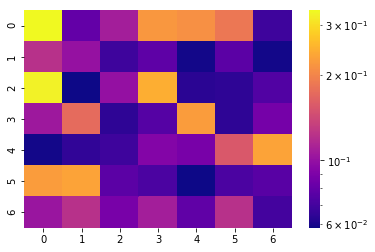

[[0.337 0.08  0.109 0.219 0.212 0.186 0.068]
 [0.122 0.101 0.068 0.078 0.059 0.077 0.059]
 [0.327 0.058 0.1   0.244 0.063 0.064 0.074]
 [0.105 0.174 0.064 0.075 0.225 0.064 0.087]
 [0.059 0.065 0.068 0.092 0.088 0.156 0.233]
 [0.225 0.233 0.077 0.072 0.058 0.072 0.076]
 [0.103 0.122 0.088 0.109 0.079 0.122 0.07 ]]


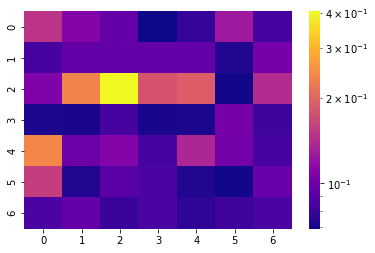

[[0.149 0.111 0.095 0.069 0.079 0.126 0.084]
 [0.084 0.095 0.095 0.095 0.095 0.073 0.104]
 [0.108 0.237 0.404 0.179 0.191 0.07  0.141]
 [0.072 0.071 0.084 0.071 0.072 0.103 0.081]
 [0.242 0.1   0.11  0.084 0.136 0.102 0.084]
 [0.159 0.073 0.091 0.086 0.073 0.07  0.097]
 [0.086 0.095 0.08  0.086 0.077 0.081 0.086]]
SKIPPPPPPEDDDD


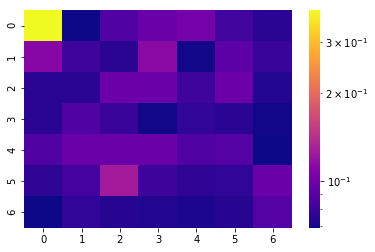

[[0.385 0.069 0.087 0.097 0.102 0.082 0.075]
 [0.11  0.081 0.075 0.112 0.07  0.091 0.079]
 [0.075 0.075 0.098 0.097 0.081 0.098 0.073]
 [0.075 0.087 0.079 0.07  0.077 0.075 0.07 ]
 [0.087 0.097 0.097 0.097 0.087 0.089 0.069]
 [0.076 0.083 0.126 0.08  0.076 0.077 0.097]
 [0.069 0.077 0.074 0.073 0.072 0.074 0.089]]


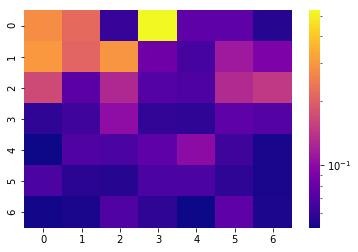

[[0.28  0.217 0.061 0.53  0.076 0.076 0.056]
 [0.303 0.21  0.297 0.084 0.066 0.114 0.091]
 [0.168 0.074 0.128 0.072 0.069 0.13  0.146]
 [0.059 0.063 0.103 0.06  0.059 0.076 0.072]
 [0.051 0.07  0.068 0.076 0.101 0.063 0.053]
 [0.068 0.057 0.056 0.068 0.068 0.059 0.053]
 [0.052 0.053 0.07  0.059 0.051 0.076 0.054]]


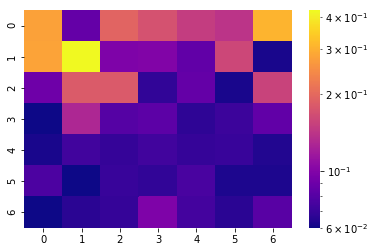

[[0.278 0.086 0.193 0.171 0.149 0.141 0.307]
 [0.282 0.423 0.098 0.1   0.085 0.16  0.062]
 [0.09  0.182 0.181 0.068 0.086 0.062 0.155]
 [0.06  0.128 0.08  0.083 0.067 0.071 0.085]
 [0.062 0.073 0.069 0.073 0.069 0.07  0.064]
 [0.077 0.06  0.07  0.068 0.076 0.063 0.063]
 [0.06  0.066 0.069 0.098 0.074 0.066 0.081]]


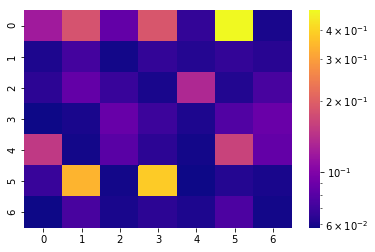

[[0.121 0.182 0.085 0.187 0.067 0.482 0.06 ]
 [0.061 0.073 0.059 0.067 0.063 0.067 0.064]
 [0.065 0.085 0.069 0.06  0.133 0.062 0.074]
 [0.058 0.06  0.087 0.07  0.061 0.078 0.088]
 [0.151 0.059 0.081 0.065 0.059 0.162 0.085]
 [0.069 0.338 0.059 0.384 0.058 0.063 0.06 ]
 [0.058 0.074 0.06  0.065 0.061 0.076 0.059]]


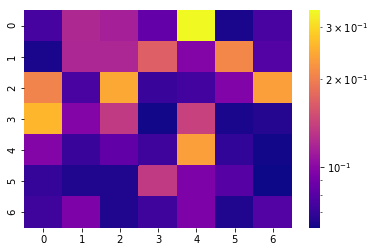

[[0.075 0.121 0.115 0.085 0.342 0.064 0.076]
 [0.064 0.12  0.12  0.168 0.098 0.208 0.079]
 [0.204 0.076 0.245 0.071 0.074 0.096 0.235]
 [0.261 0.097 0.135 0.063 0.14  0.064 0.066]
 [0.097 0.071 0.084 0.073 0.235 0.069 0.063]
 [0.07  0.065 0.065 0.135 0.095 0.08  0.062]
 [0.073 0.095 0.065 0.073 0.095 0.065 0.079]]


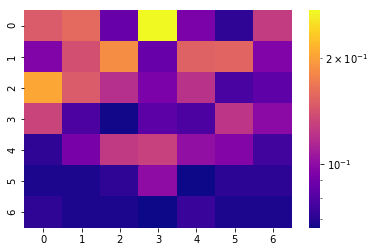

[[0.148 0.158 0.087 0.272 0.093 0.072 0.127]
 [0.095 0.14  0.185 0.087 0.152 0.154 0.095]
 [0.205 0.148 0.119 0.093 0.121 0.078 0.084]
 [0.132 0.079 0.067 0.083 0.079 0.123 0.099]
 [0.072 0.092 0.126 0.13  0.102 0.096 0.076]
 [0.068 0.068 0.072 0.1   0.066 0.071 0.071]
 [0.072 0.068 0.068 0.066 0.074 0.068 0.068]]


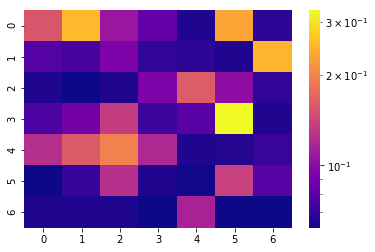

[[0.155 0.254 0.107 0.084 0.065 0.232 0.068]
 [0.079 0.075 0.094 0.069 0.068 0.065 0.25 ]
 [0.065 0.062 0.065 0.094 0.162 0.101 0.069]
 [0.076 0.09  0.135 0.072 0.08  0.327 0.065]
 [0.124 0.161 0.196 0.119 0.065 0.066 0.071]
 [0.062 0.07  0.125 0.065 0.063 0.137 0.079]
 [0.065 0.065 0.065 0.062 0.115 0.062 0.062]]


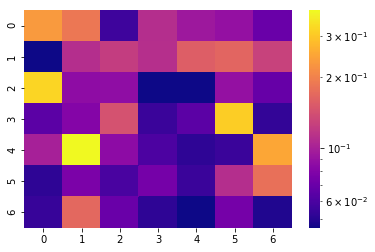

[[0.233 0.188 0.056 0.11  0.094 0.089 0.07 ]
 [0.046 0.11  0.124 0.111 0.157 0.165 0.128]
 [0.32  0.086 0.087 0.046 0.046 0.089 0.069]
 [0.065 0.081 0.144 0.055 0.065 0.309 0.053]
 [0.1   0.384 0.085 0.06  0.052 0.055 0.251]
 [0.052 0.077 0.059 0.075 0.055 0.11  0.178]
 [0.054 0.169 0.07  0.052 0.046 0.075 0.049]]


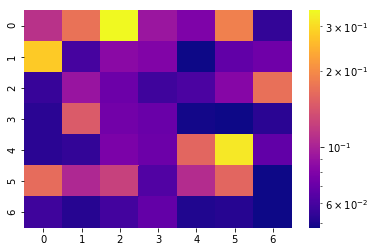

[[0.112 0.173 0.347 0.092 0.079 0.188 0.055]
 [0.279 0.06  0.084 0.08  0.048 0.068 0.073]
 [0.056 0.091 0.072 0.058 0.061 0.082 0.17 ]
 [0.053 0.148 0.074 0.071 0.049 0.048 0.053]
 [0.053 0.055 0.078 0.072 0.159 0.32  0.068]
 [0.166 0.104 0.124 0.063 0.108 0.159 0.048]
 [0.058 0.052 0.059 0.069 0.051 0.052 0.048]]


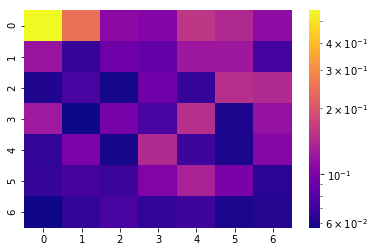

[[0.561 0.247 0.109 0.104 0.157 0.141 0.112]
 [0.12  0.068 0.093 0.087 0.122 0.123 0.073]
 [0.061 0.075 0.059 0.093 0.067 0.149 0.142]
 [0.124 0.057 0.097 0.075 0.149 0.06  0.116]
 [0.066 0.1   0.059 0.142 0.071 0.06  0.107]
 [0.067 0.074 0.069 0.102 0.134 0.098 0.064]
 [0.058 0.066 0.075 0.066 0.071 0.06  0.062]]


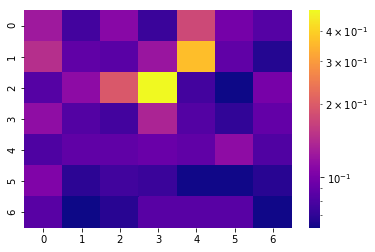

[[0.125 0.077 0.11  0.074 0.175 0.099 0.084]
 [0.146 0.089 0.086 0.121 0.365 0.089 0.067]
 [0.084 0.113 0.196 0.486 0.077 0.062 0.1  ]
 [0.115 0.083 0.077 0.136 0.083 0.071 0.09 ]
 [0.081 0.089 0.089 0.093 0.089 0.114 0.082]
 [0.105 0.069 0.076 0.074 0.063 0.063 0.068]
 [0.085 0.062 0.068 0.085 0.085 0.085 0.063]]


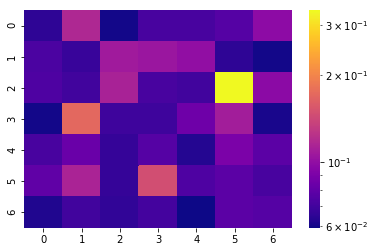

[[0.065 0.117 0.06  0.072 0.072 0.076 0.098]
 [0.073 0.068 0.108 0.105 0.1   0.065 0.06 ]
 [0.074 0.07  0.113 0.072 0.07  0.336 0.097]
 [0.06  0.171 0.069 0.069 0.085 0.109 0.061]
 [0.072 0.083 0.067 0.076 0.063 0.09  0.078]
 [0.08  0.114 0.067 0.147 0.074 0.078 0.072]
 [0.062 0.07  0.066 0.071 0.059 0.078 0.076]]


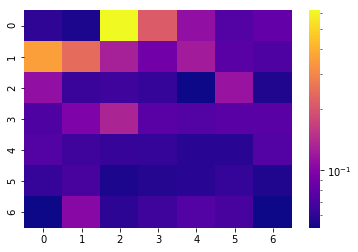

[[0.06  0.055 0.618 0.215 0.111 0.074 0.082]
 [0.359 0.244 0.128 0.089 0.124 0.077 0.072]
 [0.111 0.064 0.066 0.062 0.052 0.116 0.056]
 [0.072 0.097 0.133 0.077 0.074 0.077 0.077]
 [0.074 0.066 0.063 0.062 0.058 0.058 0.074]
 [0.062 0.069 0.055 0.057 0.058 0.062 0.056]
 [0.052 0.104 0.059 0.066 0.074 0.069 0.052]]


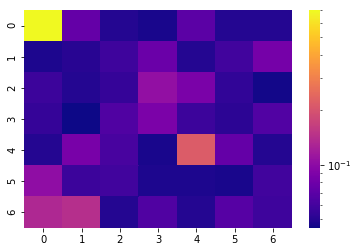

[[0.701 0.075 0.05  0.047 0.07  0.05  0.05 ]
 [0.048 0.051 0.058 0.078 0.05  0.059 0.084]
 [0.057 0.05  0.055 0.104 0.087 0.054 0.046]
 [0.055 0.045 0.065 0.088 0.057 0.052 0.066]
 [0.05  0.086 0.062 0.047 0.217 0.075 0.05 ]
 [0.102 0.057 0.059 0.048 0.048 0.047 0.059]
 [0.132 0.141 0.05  0.065 0.05  0.068 0.058]]
SKIPPPPPPEDDDD


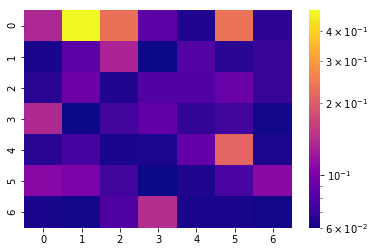

[[0.135 0.487 0.23  0.084 0.064 0.232 0.067]
 [0.062 0.084 0.132 0.06  0.081 0.066 0.071]
 [0.066 0.092 0.064 0.08  0.08  0.091 0.071]
 [0.136 0.06  0.074 0.087 0.069 0.074 0.061]
 [0.066 0.076 0.062 0.063 0.088 0.212 0.063]
 [0.108 0.099 0.074 0.06  0.064 0.077 0.109]
 [0.062 0.061 0.079 0.142 0.062 0.062 0.061]]


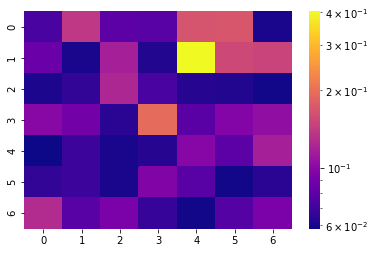

[[0.073 0.138 0.08  0.078 0.167 0.169 0.06 ]
 [0.086 0.06  0.117 0.062 0.404 0.155 0.15 ]
 [0.061 0.066 0.123 0.073 0.063 0.062 0.059]
 [0.1   0.089 0.064 0.194 0.079 0.097 0.104]
 [0.058 0.069 0.06  0.063 0.099 0.08  0.117]
 [0.066 0.069 0.06  0.096 0.078 0.059 0.064]
 [0.127 0.078 0.093 0.067 0.059 0.077 0.093]]


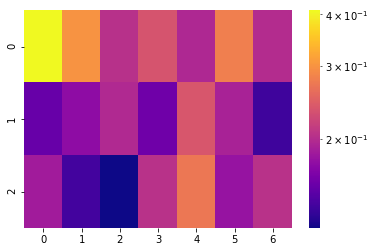

[[0.409 0.3   0.204 0.236 0.196 0.279 0.2  ]
 [0.154 0.174 0.197 0.158 0.238 0.192 0.137]
 [0.186 0.138 0.122 0.205 0.272 0.179 0.205]]


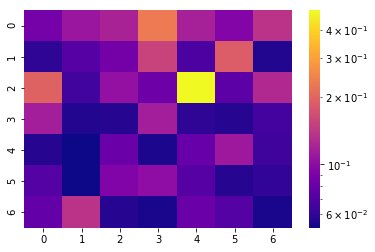

[[0.087 0.109 0.12  0.234 0.118 0.094 0.137]
 [0.059 0.073 0.086 0.155 0.069 0.19  0.056]
 [0.196 0.065 0.104 0.083 0.49  0.075 0.126]
 [0.116 0.056 0.057 0.116 0.059 0.057 0.066]
 [0.057 0.052 0.081 0.055 0.08  0.111 0.064]
 [0.072 0.052 0.092 0.102 0.073 0.057 0.06 ]
 [0.078 0.137 0.057 0.054 0.081 0.072 0.054]]


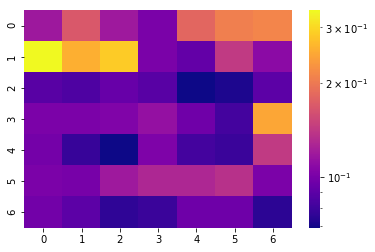

[[0.118 0.169 0.119 0.101 0.182 0.206 0.213]
 [0.34  0.256 0.287 0.101 0.092 0.143 0.109]
 [0.088 0.085 0.094 0.088 0.069 0.072 0.09 ]
 [0.102 0.102 0.104 0.113 0.097 0.082 0.246]
 [0.099 0.078 0.069 0.103 0.082 0.079 0.143]
 [0.102 0.1   0.119 0.128 0.128 0.136 0.102]
 [0.098 0.09  0.076 0.079 0.096 0.096 0.075]]


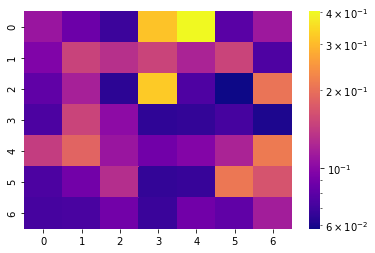

[[0.109 0.086 0.069 0.316 0.403 0.079 0.112]
 [0.095 0.149 0.131 0.15  0.12  0.15  0.075]
 [0.081 0.118 0.064 0.324 0.075 0.058 0.204]
 [0.074 0.15  0.102 0.065 0.066 0.072 0.061]
 [0.143 0.186 0.109 0.088 0.097 0.12  0.213]
 [0.074 0.089 0.129 0.066 0.067 0.21  0.167]
 [0.072 0.073 0.089 0.068 0.088 0.081 0.115]]


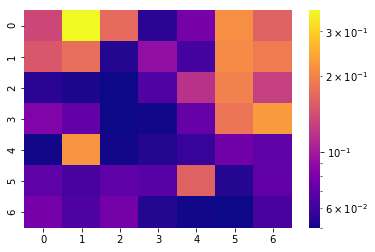

[[0.135 0.363 0.171 0.055 0.079 0.213 0.161]
 [0.151 0.175 0.054 0.092 0.062 0.209 0.19 ]
 [0.055 0.052 0.05  0.066 0.117 0.198 0.128]
 [0.083 0.071 0.05  0.051 0.073 0.183 0.228]
 [0.051 0.221 0.051 0.054 0.058 0.077 0.07 ]
 [0.07  0.063 0.07  0.068 0.161 0.054 0.071]
 [0.079 0.065 0.078 0.054 0.051 0.05  0.063]]


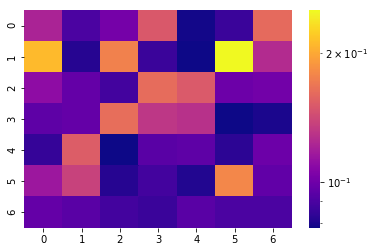

[[0.121 0.09  0.102 0.15  0.079 0.086 0.161]
 [0.211 0.082 0.175 0.086 0.078 0.251 0.125]
 [0.11  0.097 0.088 0.162 0.151 0.099 0.101]
 [0.095 0.097 0.163 0.131 0.128 0.078 0.08 ]
 [0.085 0.153 0.078 0.094 0.095 0.083 0.099]
 [0.115 0.137 0.082 0.088 0.081 0.179 0.096]
 [0.097 0.094 0.088 0.086 0.094 0.09  0.09 ]]
SKIPPPPPPEDDDD


/opt/conda/envs/fastai/lib/python3.6/site-packages/matplotlib/artist.py:913: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  return func(v)
/opt/conda/envs/fastai/lib/python3.6/site-packages/matplotlib/artist.py:913: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  return func(v)
/opt/conda/envs/fastai/lib/python3.6/site-packages/matplotlib/colorbar.py:215: UserWarning: Use the colorbar set_ticks() method instead.
  warnings.warn("Use the colorbar set_ticks() method instead.")


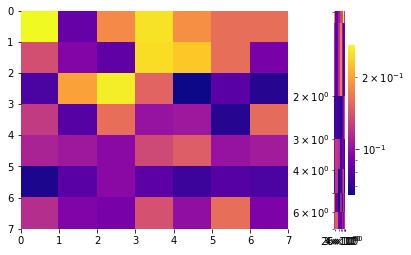

[[0.181 0.086 0.106 0.132 0.137 0.274 0.124]
 [0.112 0.081 0.12  0.171 0.103 0.076 0.087]
 [0.074 0.075 0.071 0.068 0.083 0.097 0.135]
 [0.101 0.124 0.117 0.075 0.09  0.087 0.077]
 [0.079 0.121 0.067 0.077 0.105 0.132 0.071]
 [0.158 0.089 0.064 0.109 0.073 0.12  0.098]
 [0.124 0.146 0.089 0.084 0.111 0.096 0.118]]


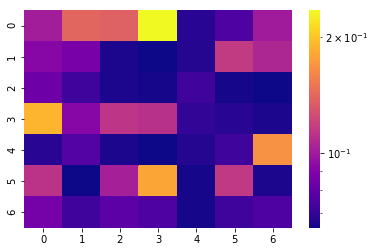

[[0.101 0.141 0.137 0.234 0.068 0.076 0.1  ]
 [0.091 0.087 0.066 0.064 0.067 0.116 0.106]
 [0.084 0.072 0.066 0.065 0.072 0.065 0.064]
 [0.189 0.091 0.113 0.111 0.07  0.068 0.066]
 [0.068 0.077 0.066 0.064 0.067 0.072 0.167]
 [0.112 0.064 0.102 0.179 0.065 0.115 0.066]
 [0.086 0.072 0.079 0.076 0.065 0.072 0.076]]


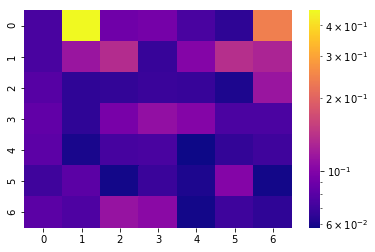

[[0.074 0.462 0.09  0.093 0.074 0.065 0.24 ]
 [0.074 0.114 0.135 0.068 0.101 0.137 0.128]
 [0.079 0.066 0.067 0.069 0.068 0.061 0.114]
 [0.084 0.066 0.095 0.11  0.101 0.075 0.075]
 [0.082 0.06  0.073 0.074 0.058 0.067 0.071]
 [0.071 0.081 0.059 0.069 0.061 0.101 0.059]
 [0.081 0.076 0.112 0.104 0.059 0.07  0.066]]


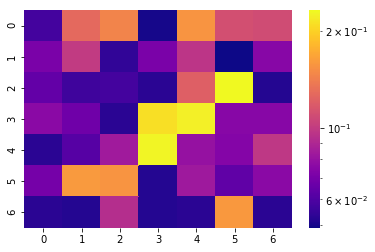

[[0.058 0.127 0.145 0.05  0.156 0.111 0.109]
 [0.071 0.1   0.054 0.071 0.097 0.049 0.075]
 [0.065 0.057 0.058 0.053 0.121 0.231 0.052]
 [0.076 0.068 0.053 0.21  0.224 0.075 0.075]
 [0.053 0.062 0.084 0.228 0.08  0.074 0.098]
 [0.07  0.16  0.156 0.052 0.083 0.064 0.076]
 [0.053 0.052 0.093 0.052 0.053 0.159 0.053]]


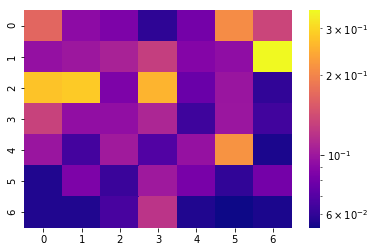

[[0.167 0.092 0.085 0.059 0.081 0.208 0.135]
 [0.095 0.1   0.107 0.129 0.088 0.093 0.351]
 [0.276 0.284 0.085 0.256 0.077 0.098 0.06 ]
 [0.132 0.094 0.094 0.11  0.063 0.099 0.064]
 [0.098 0.065 0.102 0.069 0.096 0.217 0.055]
 [0.056 0.085 0.062 0.101 0.083 0.06  0.081]
 [0.056 0.056 0.066 0.121 0.056 0.053 0.055]]


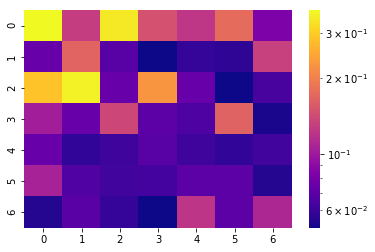

[[0.369 0.128 0.343 0.148 0.123 0.175 0.083]
 [0.075 0.167 0.069 0.051 0.059 0.057 0.131]
 [0.286 0.357 0.075 0.225 0.075 0.051 0.064]
 [0.103 0.075 0.138 0.071 0.066 0.166 0.053]
 [0.075 0.058 0.061 0.069 0.061 0.058 0.062]
 [0.106 0.067 0.062 0.063 0.071 0.071 0.055]
 [0.055 0.07  0.059 0.051 0.122 0.071 0.11 ]]


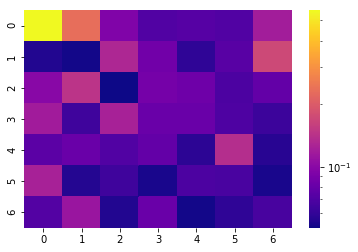

[[0.559 0.23  0.094 0.071 0.073 0.071 0.119]
 [0.055 0.052 0.129 0.086 0.059 0.074 0.171]
 [0.1   0.145 0.051 0.088 0.084 0.069 0.079]
 [0.118 0.064 0.123 0.082 0.082 0.07  0.063]
 [0.075 0.082 0.071 0.079 0.058 0.137 0.057]
 [0.124 0.056 0.064 0.053 0.069 0.068 0.053]
 [0.072 0.111 0.055 0.082 0.052 0.059 0.067]]


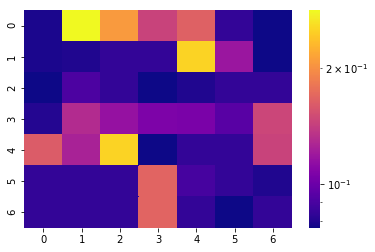

[[0.079 0.282 0.207 0.145 0.165 0.084 0.077]
 [0.079 0.08  0.084 0.084 0.252 0.118 0.077]
 [0.077 0.091 0.084 0.077 0.08  0.084 0.084]
 [0.081 0.13  0.116 0.106 0.105 0.094 0.147]
 [0.162 0.125 0.252 0.077 0.084 0.084 0.145]
 [0.084 0.084 0.084 0.168 0.089 0.084 0.08 ]
 [0.084 0.084 0.084 0.168 0.084 0.077 0.084]]


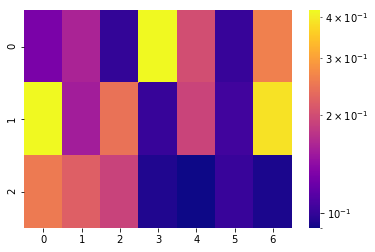

[[0.13  0.161 0.1   0.42  0.202 0.101 0.261]
 [0.42  0.155 0.243 0.101 0.192 0.105 0.388]
 [0.252 0.221 0.19  0.094 0.09  0.102 0.093]]


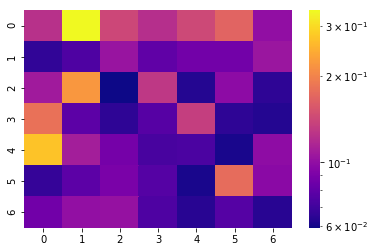

[[0.124 0.34  0.142 0.122 0.143 0.169 0.1  ]
 [0.066 0.074 0.104 0.08  0.087 0.087 0.105]
 [0.108 0.222 0.059 0.129 0.063 0.098 0.065]
 [0.182 0.079 0.065 0.077 0.135 0.065 0.063]
 [0.273 0.11  0.088 0.072 0.073 0.061 0.099]
 [0.067 0.079 0.09  0.076 0.061 0.177 0.097]
 [0.086 0.101 0.102 0.074 0.064 0.076 0.064]]


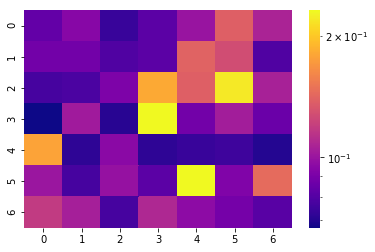

[[0.084 0.094 0.074 0.082 0.1   0.138 0.107]
 [0.088 0.088 0.079 0.082 0.14  0.128 0.079]
 [0.077 0.078 0.091 0.182 0.138 0.221 0.106]
 [0.067 0.103 0.071 0.231 0.088 0.104 0.086]
 [0.178 0.072 0.095 0.072 0.074 0.075 0.07 ]
 [0.101 0.077 0.099 0.082 0.23  0.092 0.145]
 [0.118 0.105 0.077 0.109 0.096 0.089 0.081]]


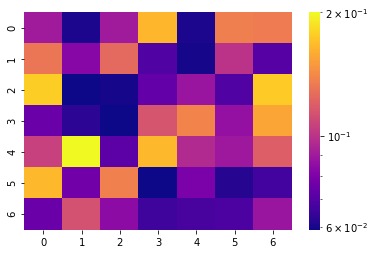

[[0.09  0.061 0.09  0.165 0.061 0.136 0.134]
 [0.132 0.082 0.125 0.07  0.06  0.1   0.071]
 [0.176 0.059 0.06  0.074 0.088 0.07  0.175]
 [0.075 0.063 0.059 0.115 0.139 0.086 0.156]
 [0.106 0.2   0.072 0.166 0.096 0.089 0.12 ]
 [0.166 0.077 0.137 0.059 0.079 0.062 0.067]
 [0.075 0.113 0.084 0.066 0.068 0.069 0.088]]


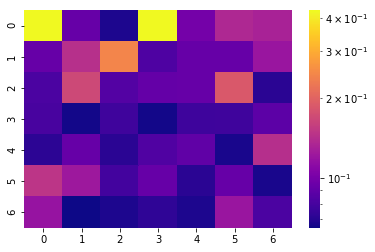

[[0.426 0.093 0.068 0.423 0.099 0.136 0.131]
 [0.093 0.143 0.244 0.083 0.093 0.093 0.12 ]
 [0.082 0.168 0.085 0.092 0.093 0.186 0.071]
 [0.081 0.066 0.078 0.066 0.077 0.078 0.089]
 [0.072 0.093 0.071 0.084 0.09  0.067 0.142]
 [0.148 0.123 0.079 0.093 0.071 0.093 0.067]
 [0.118 0.065 0.068 0.073 0.068 0.12  0.082]]


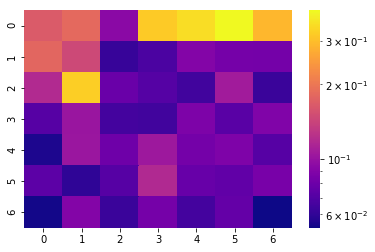

[[0.166 0.183 0.094 0.318 0.35  0.397 0.288]
 [0.18  0.147 0.062 0.068 0.09  0.084 0.083]
 [0.119 0.324 0.079 0.071 0.065 0.107 0.063]
 [0.072 0.102 0.066 0.065 0.087 0.073 0.089]
 [0.056 0.103 0.081 0.105 0.083 0.088 0.072]
 [0.074 0.06  0.072 0.118 0.078 0.076 0.085]
 [0.054 0.09  0.063 0.084 0.066 0.077 0.053]]


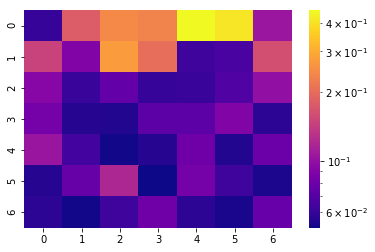

[[0.06  0.18  0.244 0.234 0.453 0.411 0.105]
 [0.147 0.09  0.273 0.202 0.063 0.066 0.162]
 [0.093 0.061 0.076 0.06  0.061 0.069 0.1  ]
 [0.084 0.056 0.055 0.073 0.073 0.09  0.057]
 [0.104 0.064 0.052 0.056 0.081 0.055 0.08 ]
 [0.056 0.077 0.119 0.051 0.084 0.063 0.054]
 [0.057 0.052 0.063 0.081 0.057 0.053 0.078]]


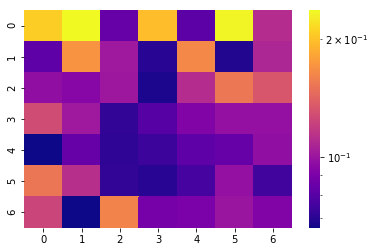

[[0.208 0.237 0.084 0.198 0.081 0.234 0.111]
 [0.082 0.172 0.102 0.07  0.164 0.069 0.108]
 [0.097 0.094 0.101 0.068 0.111 0.154 0.134]
 [0.128 0.102 0.072 0.08  0.092 0.098 0.098]
 [0.066 0.084 0.071 0.074 0.082 0.084 0.097]
 [0.153 0.113 0.072 0.07  0.076 0.098 0.075]
 [0.124 0.066 0.162 0.089 0.09  0.1   0.092]]


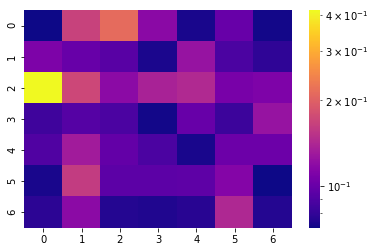

[[0.071 0.167 0.214 0.117 0.073 0.1   0.072]
 [0.11  0.1   0.093 0.074 0.125 0.088 0.079]
 [0.416 0.172 0.118 0.137 0.143 0.108 0.111]
 [0.084 0.092 0.088 0.072 0.1   0.083 0.125]
 [0.09  0.132 0.098 0.088 0.073 0.102 0.102]
 [0.073 0.161 0.095 0.095 0.096 0.114 0.071]
 [0.078 0.118 0.076 0.075 0.077 0.142 0.076]]


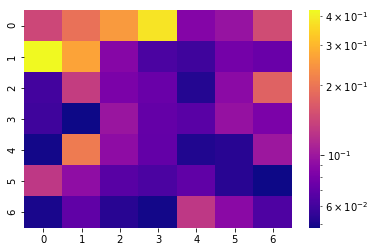

[[0.143 0.194 0.254 0.381 0.086 0.096 0.148]
 [0.424 0.268 0.087 0.063 0.059 0.078 0.074]
 [0.06  0.133 0.082 0.074 0.052 0.09  0.174]
 [0.059 0.048 0.098 0.072 0.068 0.095 0.082]
 [0.049 0.209 0.091 0.071 0.051 0.053 0.099]
 [0.127 0.092 0.067 0.063 0.07  0.053 0.048]
 [0.05  0.07  0.053 0.049 0.127 0.089 0.064]]


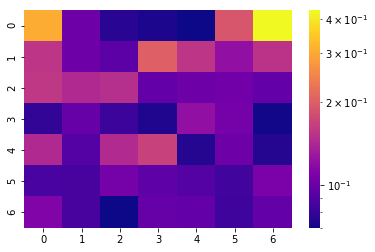

[[0.307 0.102 0.076 0.073 0.07  0.191 0.429]
 [0.155 0.102 0.094 0.202 0.155 0.122 0.153]
 [0.157 0.144 0.149 0.098 0.102 0.104 0.098]
 [0.079 0.099 0.082 0.074 0.122 0.106 0.071]
 [0.144 0.091 0.145 0.168 0.075 0.102 0.075]
 [0.087 0.086 0.106 0.095 0.091 0.084 0.108]
 [0.111 0.086 0.07  0.099 0.097 0.083 0.098]]


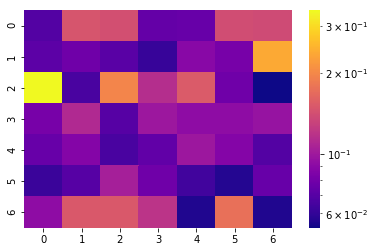

[[0.069 0.147 0.142 0.075 0.076 0.14  0.138]
 [0.072 0.079 0.071 0.061 0.089 0.082 0.239]
 [0.342 0.066 0.198 0.114 0.153 0.079 0.053]
 [0.082 0.111 0.07  0.099 0.092 0.092 0.096]
 [0.076 0.087 0.066 0.074 0.099 0.087 0.069]
 [0.062 0.07  0.104 0.079 0.064 0.057 0.076]
 [0.092 0.151 0.151 0.119 0.056 0.174 0.056]]


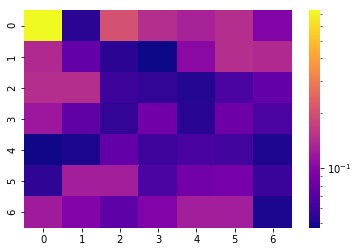

[[0.732 0.054 0.204 0.146 0.129 0.146 0.096]
 [0.14  0.077 0.054 0.047 0.102 0.146 0.14 ]
 [0.146 0.146 0.06  0.057 0.052 0.066 0.078]
 [0.117 0.076 0.057 0.085 0.053 0.083 0.066]
 [0.048 0.05  0.077 0.061 0.065 0.062 0.051]
 [0.055 0.126 0.126 0.066 0.086 0.089 0.059]
 [0.122 0.098 0.075 0.095 0.126 0.126 0.05 ]]


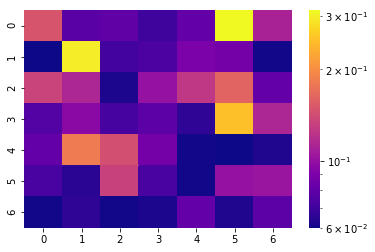

[[0.149 0.078 0.08  0.07  0.081 0.313 0.111]
 [0.06  0.298 0.071 0.074 0.089 0.087 0.061]
 [0.135 0.113 0.062 0.101 0.126 0.162 0.081]
 [0.076 0.096 0.072 0.079 0.066 0.25  0.113]
 [0.081 0.183 0.144 0.087 0.061 0.06  0.063]
 [0.073 0.065 0.133 0.073 0.061 0.101 0.103]
 [0.061 0.066 0.061 0.062 0.081 0.063 0.079]]
SKIPPPPPPEDDDD


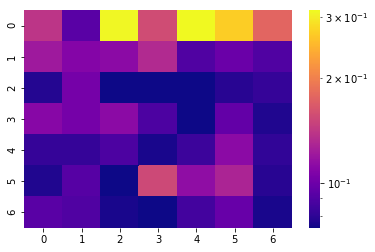

[[0.14  0.093 0.311 0.156 0.314 0.27  0.177]
 [0.121 0.109 0.112 0.132 0.09  0.099 0.09 ]
 [0.078 0.103 0.074 0.074 0.074 0.079 0.082]
 [0.11  0.103 0.112 0.089 0.074 0.096 0.077]
 [0.082 0.082 0.089 0.076 0.084 0.112 0.081]
 [0.077 0.092 0.074 0.154 0.114 0.128 0.079]
 [0.093 0.09  0.076 0.074 0.086 0.098 0.076]]


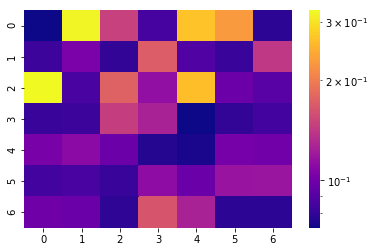

[[0.072 0.321 0.148 0.085 0.268 0.228 0.078]
 [0.082 0.104 0.08  0.172 0.088 0.081 0.141]
 [0.325 0.086 0.175 0.114 0.264 0.098 0.091]
 [0.081 0.082 0.146 0.126 0.072 0.08  0.084]
 [0.103 0.111 0.098 0.076 0.074 0.102 0.1  ]
 [0.084 0.086 0.081 0.112 0.097 0.117 0.118]
 [0.099 0.097 0.079 0.165 0.126 0.078 0.078]]


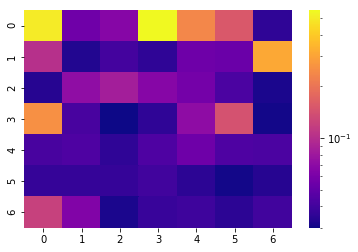

[[0.506 0.056 0.066 0.555 0.238 0.154 0.036]
 [0.102 0.033 0.041 0.036 0.055 0.054 0.311]
 [0.034 0.072 0.085 0.066 0.058 0.043 0.032]
 [0.256 0.042 0.03  0.036 0.071 0.144 0.031]
 [0.042 0.044 0.036 0.044 0.055 0.044 0.043]
 [0.037 0.037 0.037 0.04  0.035 0.031 0.034]
 [0.121 0.064 0.032 0.038 0.039 0.035 0.04 ]]


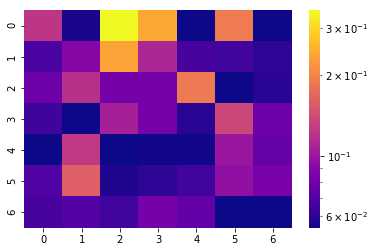

[[0.123 0.056 0.349 0.244 0.054 0.191 0.054]
 [0.068 0.09  0.236 0.111 0.067 0.065 0.06 ]
 [0.08  0.119 0.083 0.082 0.188 0.054 0.059]
 [0.064 0.054 0.106 0.083 0.059 0.137 0.08 ]
 [0.054 0.125 0.054 0.055 0.055 0.1   0.077]
 [0.07  0.16  0.057 0.06  0.065 0.096 0.084]
 [0.067 0.071 0.065 0.083 0.076 0.054 0.054]]


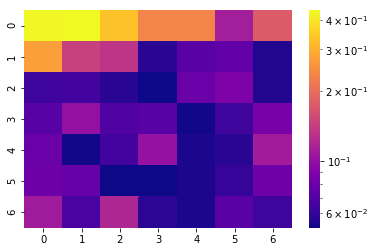

[[0.436 0.44  0.333 0.234 0.234 0.112 0.177]
 [0.274 0.144 0.133 0.057 0.073 0.076 0.056]
 [0.063 0.065 0.057 0.052 0.079 0.088 0.056]
 [0.072 0.101 0.07  0.072 0.053 0.063 0.086]
 [0.079 0.053 0.065 0.102 0.055 0.057 0.11 ]
 [0.081 0.078 0.052 0.052 0.055 0.061 0.082]
 [0.109 0.067 0.119 0.058 0.055 0.073 0.064]]


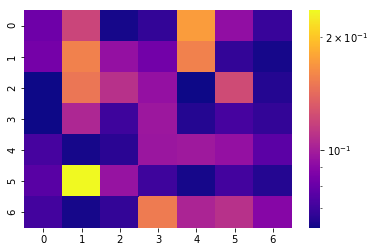

[[0.082 0.12  0.063 0.068 0.173 0.093 0.069]
 [0.084 0.156 0.094 0.083 0.156 0.068 0.063]
 [0.062 0.149 0.109 0.094 0.062 0.123 0.065]
 [0.062 0.104 0.07  0.097 0.065 0.072 0.068]
 [0.072 0.063 0.066 0.096 0.098 0.094 0.077]
 [0.076 0.235 0.095 0.07  0.063 0.071 0.065]
 [0.071 0.063 0.068 0.152 0.103 0.109 0.089]]


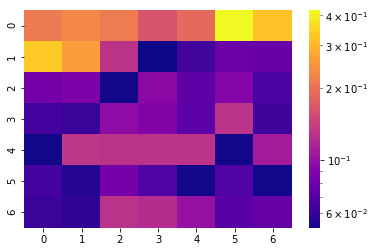

[[0.21  0.231 0.214 0.164 0.189 0.42  0.321]
 [0.333 0.262 0.128 0.052 0.064 0.079 0.077]
 [0.083 0.087 0.053 0.095 0.074 0.091 0.067]
 [0.065 0.062 0.097 0.089 0.073 0.128 0.063]
 [0.053 0.131 0.128 0.128 0.128 0.053 0.108]
 [0.065 0.056 0.084 0.069 0.053 0.069 0.053]
 [0.062 0.059 0.128 0.122 0.1   0.072 0.077]]


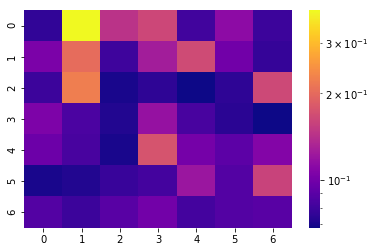

[[0.076 0.389 0.144 0.163 0.081 0.113 0.079]
 [0.104 0.203 0.08  0.126 0.167 0.099 0.077]
 [0.079 0.224 0.07  0.075 0.068 0.075 0.164]
 [0.105 0.084 0.072 0.118 0.083 0.074 0.068]
 [0.097 0.083 0.07  0.176 0.101 0.091 0.108]
 [0.07  0.072 0.078 0.082 0.121 0.087 0.159]
 [0.087 0.079 0.089 0.1   0.082 0.087 0.089]]


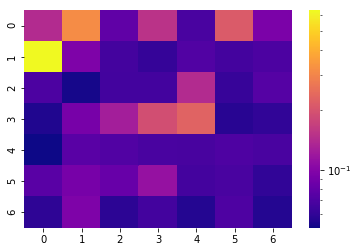

[[0.141 0.317 0.079 0.152 0.069 0.213 0.094]
 [0.634 0.096 0.067 0.061 0.072 0.067 0.07 ]
 [0.07  0.053 0.066 0.066 0.141 0.062 0.074]
 [0.055 0.092 0.126 0.191 0.228 0.057 0.06 ]
 [0.051 0.076 0.072 0.069 0.068 0.071 0.069]
 [0.076 0.092 0.083 0.113 0.067 0.069 0.06 ]
 [0.059 0.096 0.058 0.066 0.056 0.071 0.056]]


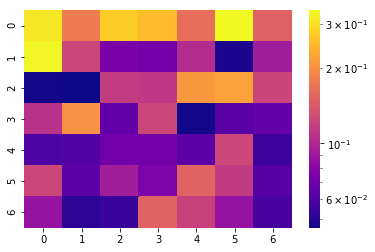

[[0.312 0.179 0.275 0.253 0.162 0.34  0.149]
 [0.333 0.125 0.075 0.072 0.103 0.048 0.093]
 [0.047 0.046 0.116 0.113 0.21  0.22  0.124]
 [0.108 0.202 0.066 0.125 0.047 0.063 0.066]
 [0.059 0.061 0.071 0.072 0.064 0.125 0.055]
 [0.125 0.064 0.093 0.076 0.152 0.115 0.062]
 [0.087 0.051 0.054 0.152 0.121 0.087 0.058]]


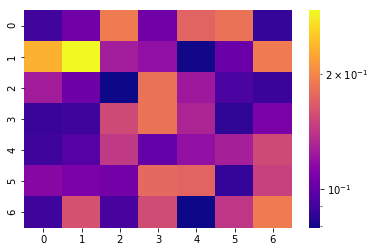

[[0.09  0.105 0.192 0.105 0.173 0.184 0.087]
 [0.233 0.293 0.126 0.118 0.08  0.103 0.192]
 [0.125 0.104 0.079 0.184 0.123 0.093 0.088]
 [0.088 0.089 0.154 0.184 0.13  0.085 0.109]
 [0.089 0.096 0.143 0.1   0.118 0.127 0.154]
 [0.114 0.108 0.106 0.177 0.173 0.087 0.148]
 [0.089 0.16  0.092 0.156 0.079 0.141 0.192]]


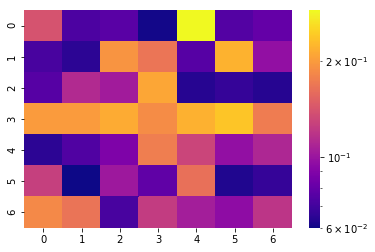

[[0.14  0.073 0.077 0.061 0.287 0.075 0.08 ]
 [0.072 0.065 0.193 0.167 0.076 0.22  0.097]
 [0.076 0.112 0.104 0.209 0.064 0.067 0.064]
 [0.199 0.199 0.214 0.187 0.218 0.237 0.173]
 [0.065 0.074 0.089 0.174 0.13  0.097 0.11 ]
 [0.126 0.06  0.102 0.079 0.163 0.063 0.067]
 [0.184 0.166 0.072 0.124 0.105 0.095 0.119]]


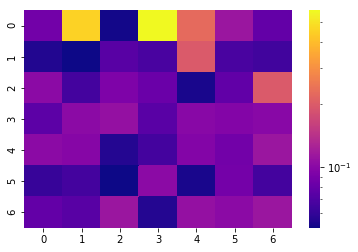

[[0.087 0.453 0.052 0.567 0.227 0.113 0.079]
 [0.055 0.051 0.074 0.068 0.199 0.068 0.065]
 [0.102 0.066 0.094 0.083 0.053 0.078 0.199]
 [0.076 0.102 0.108 0.075 0.1   0.096 0.1  ]
 [0.102 0.098 0.056 0.066 0.096 0.087 0.113]
 [0.061 0.066 0.051 0.102 0.053 0.088 0.066]
 [0.079 0.074 0.113 0.056 0.108 0.102 0.113]]


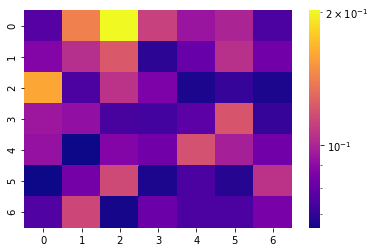

[[0.077 0.142 0.202 0.112 0.094 0.1   0.075]
 [0.088 0.104 0.123 0.069 0.081 0.105 0.083]
 [0.161 0.075 0.106 0.086 0.067 0.071 0.067]
 [0.095 0.092 0.074 0.073 0.078 0.121 0.071]
 [0.093 0.065 0.088 0.083 0.119 0.098 0.083]
 [0.065 0.084 0.116 0.067 0.075 0.068 0.106]
 [0.076 0.115 0.066 0.082 0.075 0.075 0.085]]


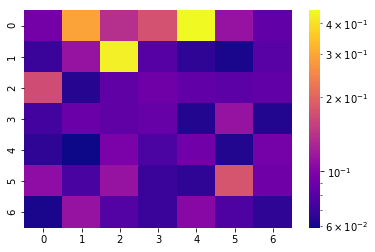

[[0.093 0.292 0.138 0.175 0.452 0.113 0.085]
 [0.07  0.113 0.432 0.08  0.067 0.061 0.081]
 [0.169 0.064 0.084 0.091 0.085 0.083 0.085]
 [0.073 0.088 0.084 0.087 0.063 0.113 0.063]
 [0.066 0.059 0.097 0.076 0.092 0.063 0.094]
 [0.108 0.075 0.113 0.07  0.066 0.179 0.091]
 [0.061 0.113 0.079 0.07  0.104 0.077 0.066]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


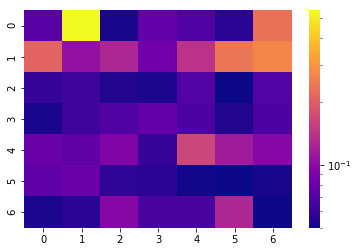

[[0.072 0.544 0.052 0.078 0.069 0.056 0.231]
 [0.209 0.105 0.125 0.084 0.14  0.24  0.27 ]
 [0.06  0.063 0.054 0.053 0.07  0.05  0.07 ]
 [0.052 0.063 0.069 0.077 0.068 0.054 0.068]
 [0.08  0.076 0.093 0.06  0.164 0.114 0.096]
 [0.075 0.08  0.058 0.056 0.051 0.05  0.052]
 [0.053 0.056 0.096 0.066 0.066 0.127 0.05 ]]


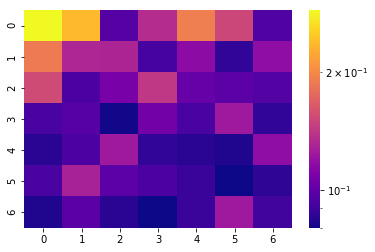

[[0.287 0.237 0.097 0.135 0.191 0.151 0.095]
 [0.188 0.131 0.13  0.092 0.116 0.087 0.117]
 [0.154 0.094 0.108 0.142 0.102 0.099 0.096]
 [0.093 0.097 0.081 0.106 0.093 0.124 0.087]
 [0.085 0.094 0.124 0.087 0.085 0.083 0.117]
 [0.093 0.128 0.099 0.094 0.089 0.08  0.086]
 [0.083 0.098 0.085 0.08  0.089 0.124 0.091]]


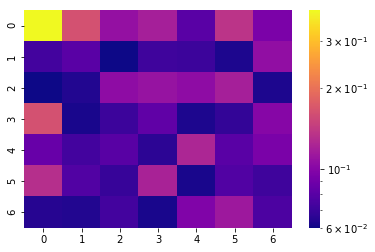

[[0.391 0.163 0.107 0.118 0.081 0.136 0.095]
 [0.073 0.081 0.06  0.072 0.071 0.063 0.106]
 [0.06  0.064 0.104 0.109 0.104 0.118 0.063]
 [0.163 0.062 0.071 0.083 0.063 0.068 0.1  ]
 [0.086 0.073 0.08  0.066 0.123 0.081 0.094]
 [0.131 0.078 0.069 0.121 0.062 0.078 0.072]
 [0.065 0.064 0.073 0.062 0.097 0.113 0.076]]


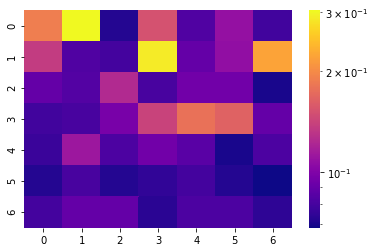

[[0.189 0.304 0.072 0.152 0.083 0.108 0.079]
 [0.136 0.083 0.08  0.289 0.09  0.107 0.222]
 [0.09  0.084 0.124 0.081 0.094 0.094 0.07 ]
 [0.079 0.081 0.097 0.141 0.178 0.165 0.09 ]
 [0.077 0.112 0.082 0.094 0.086 0.07  0.082]
 [0.072 0.081 0.072 0.075 0.08  0.072 0.068]
 [0.08  0.09  0.09  0.073 0.082 0.082 0.074]]


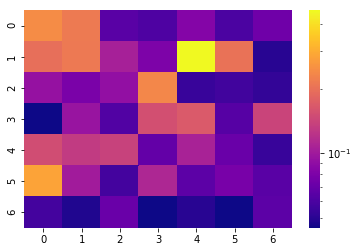

[[0.243 0.215 0.065 0.061 0.084 0.06  0.074]
 [0.197 0.213 0.105 0.08  0.462 0.202 0.05 ]
 [0.094 0.079 0.092 0.234 0.054 0.057 0.053]
 [0.045 0.095 0.062 0.154 0.168 0.064 0.141]
 [0.151 0.131 0.138 0.069 0.107 0.071 0.054]
 [0.284 0.102 0.058 0.111 0.066 0.078 0.065]
 [0.058 0.048 0.071 0.045 0.05  0.045 0.066]]


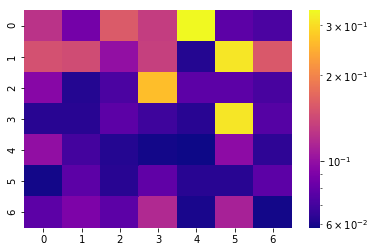

[[0.124 0.086 0.158 0.132 0.339 0.078 0.072]
 [0.149 0.145 0.1   0.134 0.062 0.313 0.156]
 [0.094 0.062 0.072 0.265 0.078 0.078 0.071]
 [0.063 0.063 0.078 0.068 0.063 0.313 0.075]
 [0.099 0.07  0.062 0.059 0.058 0.097 0.064]
 [0.059 0.078 0.063 0.079 0.063 0.063 0.078]
 [0.078 0.09  0.078 0.117 0.06  0.111 0.059]]


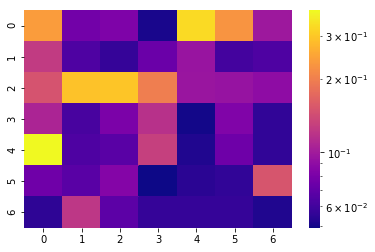

[[0.239 0.077 0.082 0.051 0.33  0.227 0.098]
 [0.126 0.064 0.057 0.074 0.095 0.061 0.064]
 [0.149 0.292 0.296 0.198 0.096 0.094 0.09 ]
 [0.107 0.062 0.081 0.117 0.05  0.083 0.056]
 [0.382 0.064 0.068 0.13  0.052 0.075 0.056]
 [0.076 0.068 0.085 0.049 0.054 0.056 0.151]
 [0.055 0.122 0.069 0.057 0.057 0.057 0.052]]


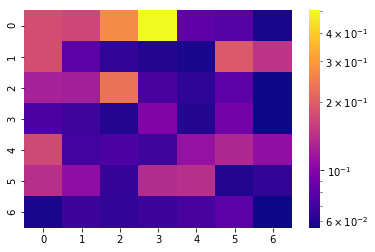

[[0.177 0.168 0.272 0.502 0.081 0.078 0.058]
 [0.177 0.08  0.065 0.06  0.058 0.193 0.145]
 [0.125 0.123 0.234 0.072 0.064 0.08  0.056]
 [0.074 0.069 0.06  0.099 0.061 0.092 0.056]
 [0.171 0.07  0.074 0.069 0.112 0.133 0.109]
 [0.141 0.108 0.066 0.136 0.141 0.06  0.065]
 [0.058 0.068 0.065 0.068 0.072 0.08  0.056]]


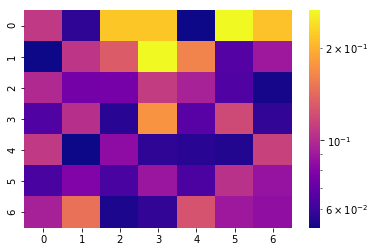

[[0.108 0.057 0.218 0.217 0.052 0.264 0.213]
 [0.052 0.106 0.132 0.264 0.161 0.066 0.09 ]
 [0.099 0.075 0.076 0.11  0.095 0.065 0.053]
 [0.065 0.103 0.056 0.175 0.067 0.119 0.058]
 [0.108 0.052 0.084 0.057 0.056 0.055 0.114]
 [0.063 0.079 0.063 0.089 0.064 0.104 0.087]
 [0.094 0.148 0.054 0.058 0.125 0.09  0.085]]


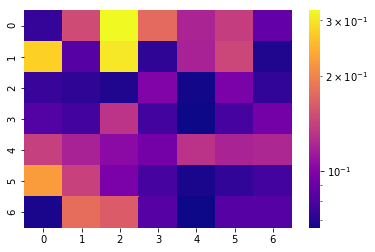

[[0.074 0.149 0.323 0.175 0.121 0.139 0.088]
 [0.278 0.084 0.302 0.072 0.119 0.146 0.069]
 [0.075 0.072 0.069 0.099 0.067 0.097 0.073]
 [0.083 0.078 0.132 0.078 0.066 0.079 0.094]
 [0.14  0.119 0.104 0.094 0.131 0.12  0.122]
 [0.225 0.142 0.097 0.079 0.068 0.073 0.078]
 [0.068 0.179 0.164 0.084 0.066 0.084 0.084]]


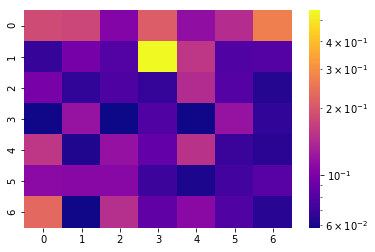

[[0.185 0.178 0.106 0.213 0.115 0.146 0.272]
 [0.069 0.098 0.08  0.551 0.158 0.079 0.081]
 [0.099 0.067 0.078 0.068 0.144 0.081 0.063]
 [0.059 0.119 0.058 0.079 0.059 0.119 0.067]
 [0.158 0.062 0.118 0.088 0.152 0.07  0.065]
 [0.111 0.109 0.109 0.071 0.061 0.073 0.082]
 [0.229 0.059 0.148 0.086 0.11  0.079 0.064]]


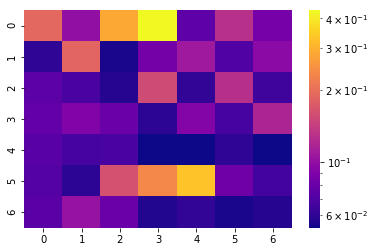

[[0.191 0.101 0.285 0.432 0.076 0.129 0.086]
 [0.06  0.188 0.055 0.085 0.109 0.071 0.097]
 [0.075 0.068 0.058 0.156 0.061 0.128 0.064]
 [0.078 0.091 0.081 0.059 0.093 0.067 0.118]
 [0.073 0.067 0.068 0.053 0.053 0.06  0.053]
 [0.072 0.059 0.164 0.237 0.331 0.083 0.066]
 [0.074 0.103 0.08  0.057 0.061 0.055 0.058]]


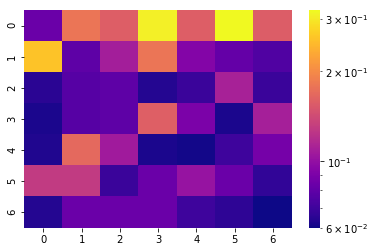

[[0.084 0.179 0.158 0.309 0.158 0.32  0.157]
 [0.259 0.08  0.109 0.179 0.093 0.082 0.075]
 [0.065 0.077 0.08  0.064 0.069 0.111 0.069]
 [0.062 0.077 0.08  0.16  0.09  0.062 0.11 ]
 [0.063 0.168 0.107 0.062 0.061 0.07  0.088]
 [0.129 0.129 0.069 0.084 0.102 0.084 0.067]
 [0.064 0.084 0.084 0.084 0.07  0.066 0.06 ]]


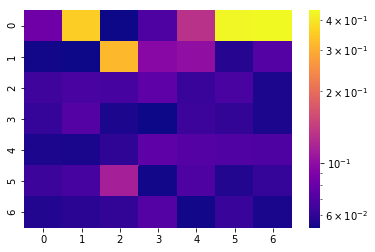

[[0.083 0.352 0.053 0.07  0.131 0.434 0.44 ]
 [0.054 0.053 0.317 0.096 0.101 0.058 0.072]
 [0.065 0.068 0.067 0.076 0.063 0.068 0.056]
 [0.062 0.072 0.056 0.053 0.064 0.061 0.056]
 [0.056 0.055 0.06  0.076 0.072 0.071 0.07 ]
 [0.064 0.067 0.114 0.054 0.07  0.057 0.062]
 [0.057 0.059 0.061 0.072 0.054 0.063 0.055]]


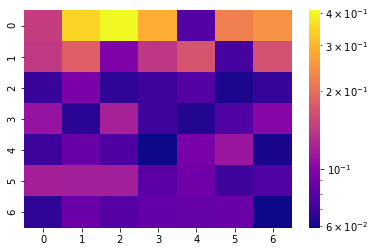

[[0.147 0.348 0.41  0.288 0.078 0.223 0.247]
 [0.143 0.182 0.096 0.139 0.17  0.073 0.166]
 [0.069 0.094 0.066 0.07  0.078 0.062 0.068]
 [0.109 0.065 0.12  0.071 0.063 0.077 0.1  ]
 [0.07  0.087 0.076 0.059 0.093 0.112 0.061]
 [0.119 0.118 0.118 0.08  0.089 0.071 0.077]
 [0.066 0.088 0.079 0.084 0.085 0.087 0.059]]


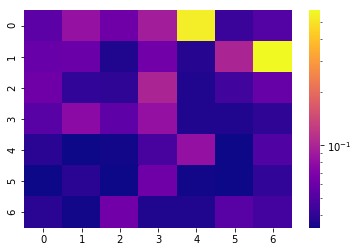

[[0.054 0.083 0.062 0.093 0.545 0.043 0.051]
 [0.059 0.06  0.037 0.063 0.038 0.1   0.584]
 [0.062 0.041 0.04  0.1   0.037 0.045 0.058]
 [0.053 0.077 0.055 0.082 0.037 0.037 0.04 ]
 [0.039 0.034 0.035 0.047 0.082 0.034 0.05 ]
 [0.034 0.039 0.034 0.062 0.035 0.034 0.041]
 [0.039 0.035 0.063 0.037 0.037 0.053 0.046]]


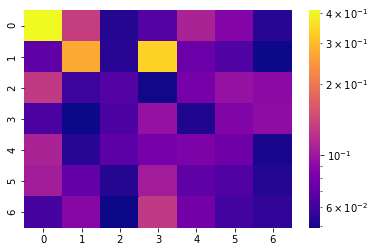

[[0.411 0.133 0.053 0.067 0.109 0.086 0.054]
 [0.071 0.272 0.054 0.337 0.076 0.065 0.049]
 [0.129 0.059 0.067 0.05  0.08  0.096 0.09 ]
 [0.064 0.049 0.064 0.096 0.052 0.085 0.092]
 [0.109 0.054 0.069 0.08  0.083 0.077 0.051]
 [0.104 0.073 0.053 0.103 0.071 0.065 0.053]
 [0.062 0.087 0.049 0.128 0.079 0.061 0.056]]


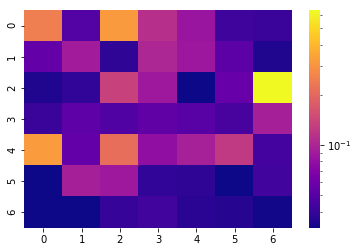

[[0.247 0.049 0.317 0.113 0.085 0.042 0.041]
 [0.055 0.091 0.038 0.101 0.087 0.052 0.035]
 [0.035 0.039 0.136 0.088 0.032 0.057 0.642]
 [0.041 0.053 0.048 0.054 0.051 0.045 0.095]
 [0.321 0.056 0.211 0.079 0.096 0.126 0.044]
 [0.032 0.095 0.088 0.039 0.038 0.032 0.043]
 [0.032 0.032 0.04  0.043 0.037 0.036 0.033]]


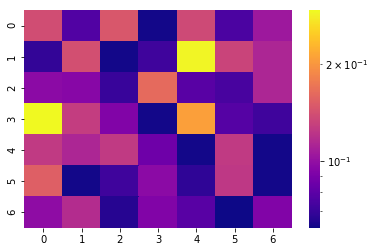

[[0.139 0.077 0.147 0.063 0.137 0.075 0.105]
 [0.069 0.141 0.063 0.072 0.288 0.133 0.113]
 [0.097 0.095 0.07  0.162 0.079 0.074 0.113]
 [0.293 0.128 0.093 0.063 0.208 0.078 0.072]
 [0.126 0.113 0.126 0.086 0.063 0.126 0.063]
 [0.154 0.063 0.072 0.097 0.068 0.124 0.063]
 [0.098 0.117 0.066 0.093 0.079 0.062 0.093]]


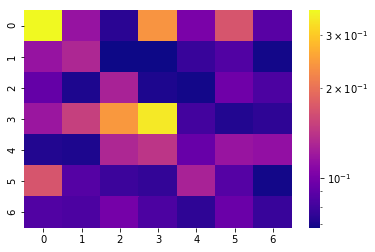

[[0.363 0.116 0.074 0.238 0.102 0.17  0.088]
 [0.116 0.13  0.068 0.068 0.078 0.086 0.069]
 [0.093 0.071 0.127 0.071 0.069 0.097 0.084]
 [0.118 0.151 0.242 0.342 0.081 0.072 0.075]
 [0.072 0.071 0.13  0.142 0.094 0.117 0.114]
 [0.17  0.087 0.079 0.076 0.127 0.087 0.069]
 [0.086 0.084 0.1   0.084 0.075 0.095 0.078]]


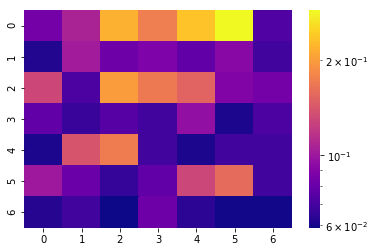

[[0.084 0.107 0.218 0.174 0.235 0.288 0.073]
 [0.062 0.103 0.082 0.088 0.078 0.092 0.069]
 [0.131 0.072 0.2   0.17  0.153 0.089 0.084]
 [0.078 0.067 0.075 0.069 0.096 0.061 0.072]
 [0.061 0.141 0.173 0.069 0.061 0.069 0.069]
 [0.101 0.081 0.066 0.078 0.13  0.158 0.069]
 [0.063 0.069 0.059 0.082 0.064 0.06  0.06 ]]


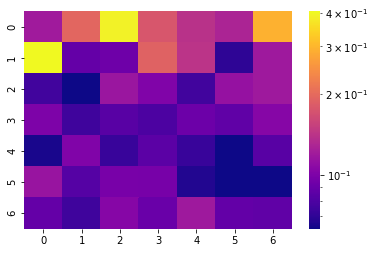

[[0.12  0.195 0.392 0.176 0.139 0.128 0.293]
 [0.404 0.089 0.093 0.189 0.142 0.07  0.119]
 [0.076 0.063 0.116 0.101 0.076 0.113 0.119]
 [0.1   0.075 0.084 0.08  0.092 0.087 0.104]
 [0.065 0.101 0.073 0.085 0.073 0.063 0.084]
 [0.115 0.083 0.098 0.097 0.067 0.063 0.063]
 [0.089 0.075 0.104 0.091 0.119 0.088 0.087]]


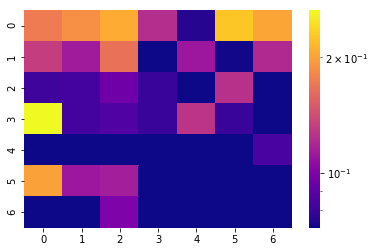

[[0.173 0.188 0.207 0.123 0.076 0.227 0.203]
 [0.133 0.113 0.166 0.072 0.111 0.073 0.121]
 [0.081 0.083 0.095 0.08  0.072 0.125 0.072]
 [0.265 0.083 0.086 0.08  0.127 0.08  0.072]
 [0.072 0.072 0.072 0.072 0.072 0.072 0.084]
 [0.2   0.111 0.115 0.072 0.072 0.072 0.072]
 [0.072 0.072 0.1   0.072 0.072 0.072 0.072]]


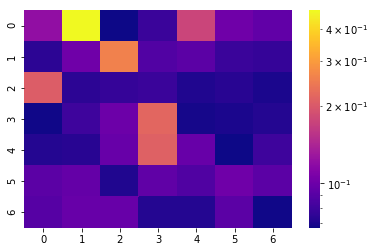

[[0.121 0.474 0.067 0.079 0.176 0.102 0.095]
 [0.074 0.102 0.261 0.088 0.092 0.079 0.077]
 [0.207 0.074 0.077 0.079 0.071 0.073 0.07 ]
 [0.068 0.08  0.1   0.22  0.069 0.07  0.072]
 [0.072 0.073 0.098 0.211 0.098 0.067 0.08 ]
 [0.092 0.096 0.071 0.094 0.087 0.102 0.092]
 [0.09  0.098 0.098 0.072 0.072 0.092 0.068]]


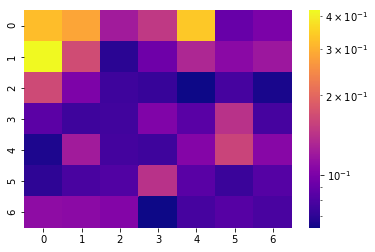

[[0.32  0.284 0.122 0.148 0.338 0.091 0.1  ]
 [0.42  0.168 0.069 0.094 0.132 0.108 0.119]
 [0.166 0.101 0.075 0.073 0.063 0.078 0.065]
 [0.086 0.075 0.076 0.102 0.085 0.142 0.078]
 [0.066 0.122 0.077 0.075 0.105 0.16  0.106]
 [0.07  0.079 0.082 0.142 0.085 0.074 0.083]
 [0.11  0.109 0.104 0.063 0.078 0.084 0.079]]


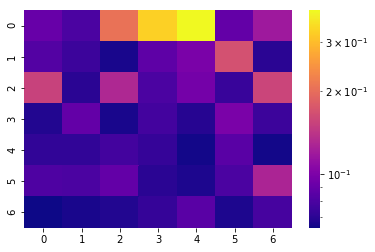

[[0.091 0.08  0.206 0.328 0.389 0.089 0.119]
 [0.083 0.075 0.066 0.087 0.099 0.168 0.07 ]
 [0.153 0.07  0.13  0.08  0.096 0.074 0.156]
 [0.068 0.089 0.066 0.077 0.069 0.099 0.075]
 [0.072 0.072 0.077 0.073 0.065 0.085 0.065]
 [0.081 0.08  0.089 0.07  0.067 0.08  0.127]
 [0.064 0.066 0.068 0.073 0.085 0.067 0.078]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


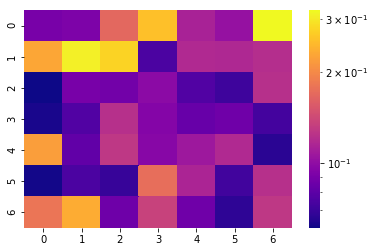

[[0.09  0.092 0.168 0.256 0.113 0.103 0.32 ]
 [0.23  0.308 0.276 0.075 0.118 0.117 0.121]
 [0.061 0.09  0.088 0.098 0.077 0.071 0.122]
 [0.063 0.077 0.122 0.095 0.084 0.087 0.073]
 [0.22  0.082 0.128 0.096 0.107 0.118 0.066]
 [0.062 0.075 0.069 0.173 0.115 0.072 0.122]
 [0.18  0.236 0.086 0.136 0.087 0.067 0.128]]


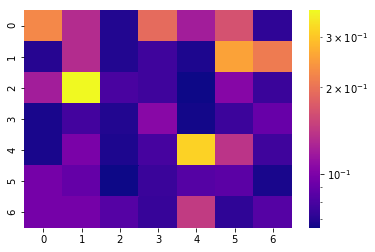

[[0.225 0.132 0.069 0.192 0.12  0.166 0.072]
 [0.07  0.132 0.069 0.077 0.068 0.256 0.21 ]
 [0.12  0.371 0.08  0.077 0.065 0.104 0.075]
 [0.067 0.078 0.069 0.106 0.066 0.076 0.091]
 [0.067 0.099 0.068 0.079 0.316 0.139 0.077]
 [0.097 0.09  0.065 0.075 0.084 0.086 0.067]
 [0.097 0.097 0.084 0.074 0.145 0.072 0.084]]


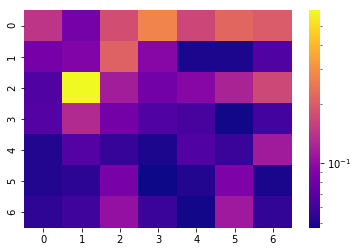

[[0.143 0.084 0.179 0.277 0.168 0.22  0.199]
 [0.085 0.09  0.209 0.095 0.05  0.05  0.066]
 [0.066 0.597 0.116 0.082 0.094 0.123 0.17 ]
 [0.068 0.13  0.083 0.067 0.063 0.048 0.061]
 [0.051 0.068 0.057 0.05  0.067 0.058 0.113]
 [0.051 0.054 0.086 0.047 0.051 0.088 0.049]
 [0.055 0.06  0.103 0.058 0.048 0.112 0.056]]


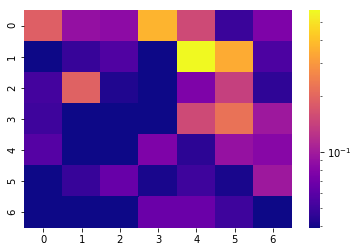

[[0.188 0.09  0.086 0.372 0.155 0.049 0.077]
 [0.039 0.048 0.056 0.039 0.58  0.348 0.055]
 [0.052 0.193 0.042 0.039 0.077 0.141 0.046]
 [0.05  0.039 0.039 0.039 0.155 0.223 0.097]
 [0.058 0.039 0.039 0.077 0.045 0.091 0.082]
 [0.039 0.048 0.066 0.041 0.05  0.041 0.097]
 [0.039 0.039 0.039 0.067 0.067 0.05  0.039]]


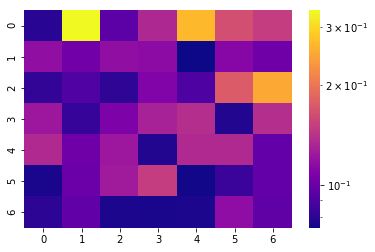

[[0.079 0.336 0.095 0.134 0.266 0.165 0.15 ]
 [0.117 0.103 0.117 0.115 0.074 0.112 0.102]
 [0.082 0.091 0.081 0.109 0.09  0.176 0.25 ]
 [0.123 0.083 0.108 0.129 0.138 0.078 0.138]
 [0.135 0.102 0.123 0.078 0.135 0.135 0.098]
 [0.076 0.101 0.125 0.15  0.075 0.084 0.098]
 [0.08  0.097 0.077 0.076 0.077 0.116 0.096]]


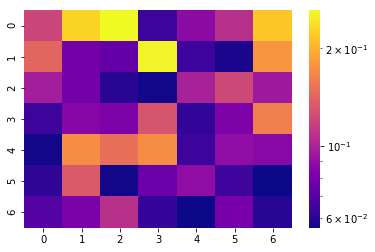

[[0.12  0.229 0.262 0.064 0.088 0.107 0.219]
 [0.143 0.079 0.074 0.256 0.064 0.058 0.179]
 [0.097 0.079 0.06  0.057 0.099 0.122 0.095]
 [0.064 0.085 0.082 0.13  0.062 0.082 0.161]
 [0.057 0.172 0.15  0.172 0.064 0.089 0.086]
 [0.061 0.134 0.057 0.076 0.089 0.065 0.056]
 [0.07  0.081 0.108 0.063 0.056 0.08  0.06 ]]


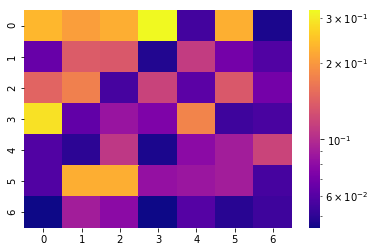

[[0.235 0.207 0.224 0.321 0.055 0.226 0.047]
 [0.066 0.139 0.135 0.048 0.112 0.07  0.059]
 [0.146 0.175 0.056 0.117 0.062 0.135 0.07 ]
 [0.288 0.064 0.085 0.074 0.179 0.054 0.057]
 [0.059 0.05  0.108 0.047 0.079 0.09  0.118]
 [0.059 0.224 0.224 0.083 0.086 0.09  0.056]
 [0.045 0.09  0.079 0.045 0.06  0.049 0.054]]


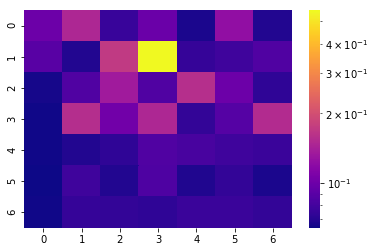

[[0.1   0.148 0.076 0.099 0.067 0.123 0.069]
 [0.089 0.069 0.172 0.557 0.075 0.079 0.086]
 [0.066 0.086 0.135 0.086 0.158 0.1   0.073]
 [0.065 0.156 0.102 0.148 0.074 0.088 0.154]
 [0.065 0.069 0.073 0.086 0.082 0.079 0.077]
 [0.064 0.079 0.069 0.085 0.068 0.074 0.067]
 [0.065 0.075 0.074 0.073 0.077 0.077 0.074]]


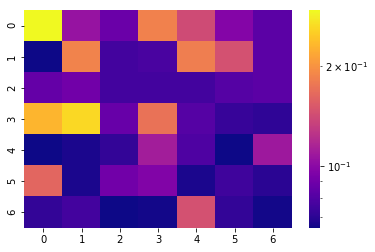

[[0.293 0.105 0.088 0.185 0.141 0.097 0.083]
 [0.065 0.186 0.076 0.078 0.181 0.145 0.083]
 [0.086 0.09  0.076 0.076 0.076 0.081 0.083]
 [0.23  0.262 0.087 0.172 0.081 0.073 0.071]
 [0.065 0.067 0.072 0.111 0.079 0.065 0.108]
 [0.162 0.067 0.09  0.096 0.067 0.075 0.07 ]
 [0.072 0.076 0.065 0.066 0.145 0.072 0.066]]


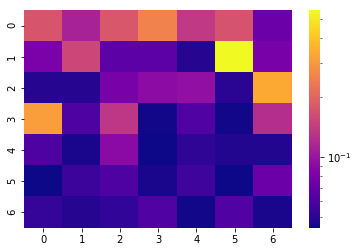

[[0.176 0.112 0.18  0.253 0.138 0.173 0.074]
 [0.081 0.157 0.067 0.067 0.049 0.55  0.08 ]
 [0.049 0.049 0.08  0.092 0.095 0.05  0.337]
 [0.312 0.061 0.135 0.045 0.062 0.045 0.125]
 [0.061 0.046 0.091 0.044 0.051 0.048 0.048]
 [0.044 0.055 0.061 0.046 0.056 0.044 0.074]
 [0.053 0.049 0.052 0.062 0.045 0.062 0.046]]


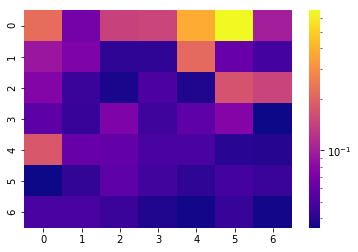

[[0.223 0.069 0.146 0.15  0.383 0.669 0.1  ]
 [0.093 0.074 0.042 0.042 0.215 0.062 0.048]
 [0.076 0.045 0.037 0.051 0.038 0.172 0.148]
 [0.057 0.044 0.074 0.046 0.058 0.076 0.035]
 [0.18  0.062 0.06  0.05  0.05  0.04  0.039]
 [0.035 0.043 0.058 0.047 0.042 0.048 0.045]
 [0.05  0.05  0.045 0.038 0.036 0.044 0.036]]


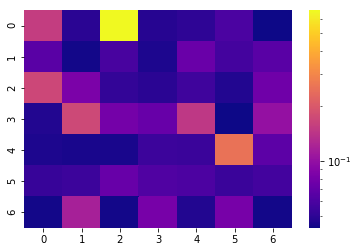

[[0.155 0.049 0.667 0.048 0.05  0.06  0.043]
 [0.066 0.044 0.059 0.046 0.074 0.058 0.066]
 [0.171 0.084 0.052 0.049 0.056 0.047 0.077]
 [0.047 0.173 0.08  0.073 0.146 0.043 0.101]
 [0.046 0.045 0.045 0.055 0.054 0.254 0.068]
 [0.053 0.055 0.073 0.062 0.061 0.054 0.057]
 [0.044 0.117 0.044 0.081 0.047 0.081 0.044]]


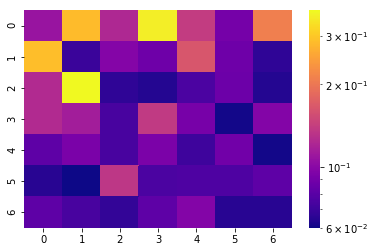

[[0.108 0.285 0.123 0.356 0.14  0.091 0.21 ]
 [0.288 0.07  0.098 0.088 0.165 0.088 0.067]
 [0.125 0.372 0.067 0.064 0.075 0.087 0.064]
 [0.125 0.114 0.074 0.138 0.092 0.061 0.097]
 [0.082 0.093 0.074 0.094 0.071 0.089 0.061]
 [0.065 0.06  0.135 0.075 0.076 0.076 0.082]
 [0.082 0.074 0.068 0.082 0.097 0.065 0.065]]


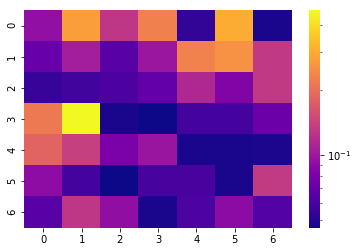

[[0.094 0.277 0.129 0.227 0.054 0.305 0.048]
 [0.072 0.105 0.066 0.099 0.229 0.255 0.131]
 [0.055 0.058 0.062 0.07  0.114 0.084 0.132]
 [0.216 0.467 0.048 0.046 0.059 0.059 0.074]
 [0.184 0.138 0.081 0.098 0.048 0.048 0.049]
 [0.091 0.059 0.046 0.06  0.06  0.048 0.133]
 [0.066 0.128 0.093 0.048 0.061 0.09  0.064]]
SKIPPPPPPEDDDD


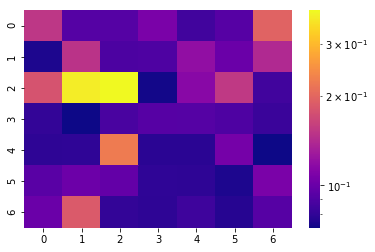

[[0.152 0.092 0.092 0.108 0.085 0.093 0.197]
 [0.075 0.149 0.089 0.09  0.12  0.101 0.141]
 [0.179 0.371 0.389 0.073 0.115 0.154 0.085]
 [0.081 0.072 0.088 0.093 0.092 0.09  0.083]
 [0.079 0.08  0.224 0.078 0.078 0.106 0.072]
 [0.094 0.102 0.098 0.08  0.079 0.075 0.108]
 [0.101 0.186 0.081 0.079 0.084 0.077 0.093]]


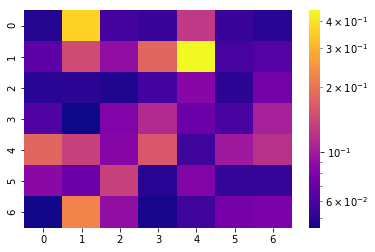

[[0.049 0.361 0.057 0.054 0.127 0.054 0.05 ]
 [0.065 0.146 0.09  0.182 0.447 0.058 0.063]
 [0.05  0.051 0.048 0.057 0.084 0.051 0.075]
 [0.062 0.045 0.081 0.113 0.072 0.059 0.104]
 [0.181 0.136 0.084 0.162 0.056 0.099 0.119]
 [0.086 0.072 0.136 0.05  0.082 0.053 0.053]
 [0.046 0.226 0.09  0.047 0.056 0.077 0.079]]


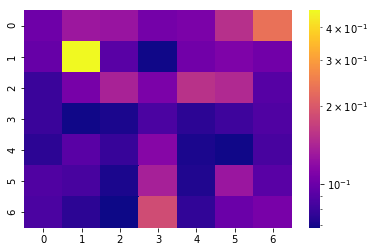

[[0.102 0.129 0.126 0.105 0.109 0.153 0.234]
 [0.098 0.465 0.092 0.069 0.103 0.11  0.103]
 [0.08  0.106 0.139 0.109 0.155 0.146 0.091]
 [0.08  0.069 0.071 0.086 0.075 0.081 0.088]
 [0.075 0.092 0.079 0.115 0.071 0.069 0.085]
 [0.088 0.085 0.071 0.137 0.072 0.128 0.092]
 [0.086 0.075 0.068 0.184 0.077 0.1   0.107]]


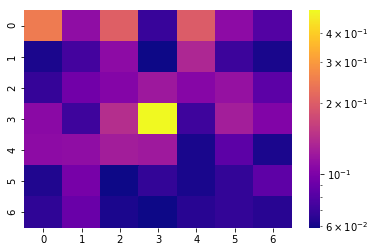

[[0.247 0.112 0.204 0.07  0.199 0.11  0.08 ]
 [0.062 0.074 0.11  0.059 0.135 0.071 0.061]
 [0.069 0.094 0.104 0.121 0.105 0.115 0.084]
 [0.108 0.072 0.142 0.497 0.072 0.126 0.103]
 [0.11  0.112 0.125 0.122 0.061 0.084 0.062]
 [0.063 0.097 0.059 0.068 0.061 0.068 0.085]
 [0.067 0.09  0.062 0.059 0.065 0.068 0.065]]


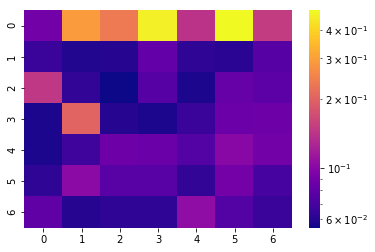

[[0.089 0.292 0.236 0.462 0.141 0.485 0.151]
 [0.066 0.059 0.06  0.082 0.063 0.061 0.076]
 [0.145 0.064 0.055 0.076 0.058 0.083 0.078]
 [0.058 0.203 0.06  0.058 0.066 0.086 0.087]
 [0.058 0.068 0.087 0.085 0.075 0.101 0.089]
 [0.063 0.103 0.077 0.077 0.064 0.09  0.07 ]
 [0.08  0.06  0.062 0.062 0.105 0.075 0.066]]


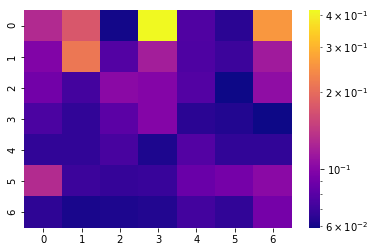

[[0.129 0.175 0.06  0.418 0.077 0.065 0.259]
 [0.098 0.215 0.078 0.119 0.076 0.07  0.116]
 [0.091 0.073 0.103 0.1   0.078 0.059 0.106]
 [0.075 0.067 0.081 0.1   0.065 0.063 0.059]
 [0.067 0.067 0.074 0.062 0.078 0.067 0.067]
 [0.13  0.07  0.068 0.069 0.087 0.092 0.103]
 [0.066 0.061 0.062 0.063 0.072 0.067 0.092]]


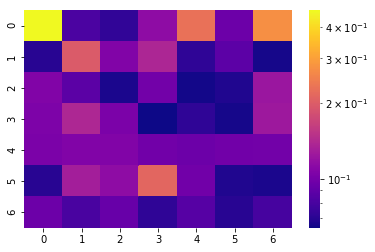

[[0.465 0.082 0.073 0.115 0.229 0.096 0.274]
 [0.07  0.197 0.107 0.137 0.072 0.089 0.066]
 [0.107 0.088 0.067 0.099 0.065 0.068 0.123]
 [0.105 0.138 0.104 0.064 0.072 0.066 0.125]
 [0.104 0.107 0.107 0.098 0.096 0.098 0.099]
 [0.07  0.13  0.115 0.214 0.098 0.068 0.067]
 [0.096 0.081 0.094 0.072 0.086 0.07  0.08 ]]


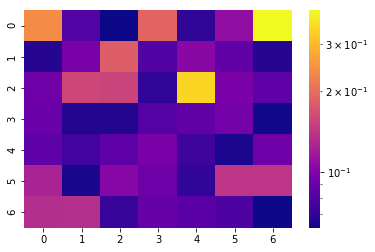

[[0.239 0.081 0.062 0.189 0.07  0.109 0.399]
 [0.067 0.096 0.181 0.08  0.104 0.086 0.067]
 [0.092 0.158 0.155 0.07  0.342 0.097 0.085]
 [0.09  0.066 0.066 0.082 0.086 0.095 0.063]
 [0.085 0.075 0.085 0.096 0.074 0.065 0.092]
 [0.125 0.064 0.103 0.092 0.07  0.141 0.141]
 [0.134 0.135 0.072 0.088 0.083 0.079 0.062]]


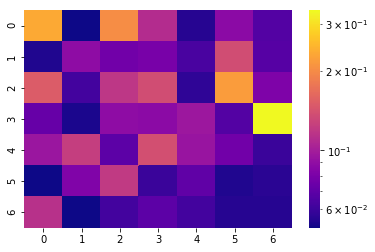

[[0.234 0.051 0.202 0.11  0.055 0.088 0.067]
 [0.054 0.089 0.077 0.08  0.064 0.137 0.068]
 [0.15  0.062 0.118 0.137 0.057 0.219 0.082]
 [0.073 0.053 0.089 0.088 0.096 0.067 0.338]
 [0.095 0.124 0.07  0.139 0.094 0.077 0.06 ]
 [0.051 0.083 0.121 0.06  0.071 0.054 0.056]
 [0.114 0.051 0.062 0.07  0.062 0.055 0.055]]


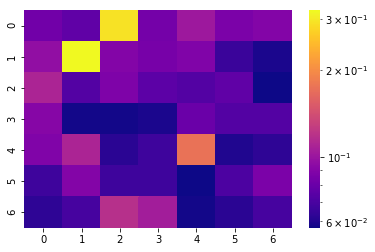

[[0.083 0.077 0.294 0.084 0.102 0.087 0.09 ]
 [0.096 0.322 0.09  0.085 0.089 0.066 0.059]
 [0.11  0.073 0.088 0.076 0.073 0.077 0.057]
 [0.091 0.058 0.058 0.059 0.081 0.073 0.073]
 [0.089 0.11  0.062 0.067 0.175 0.06  0.063]
 [0.067 0.09  0.067 0.067 0.057 0.071 0.087]
 [0.063 0.069 0.118 0.105 0.058 0.062 0.069]]


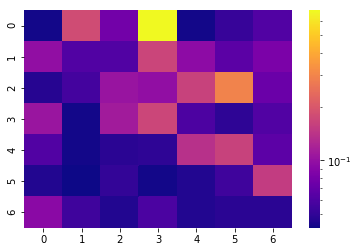

[[0.043 0.178 0.078 0.691 0.043 0.052 0.062]
 [0.098 0.062 0.062 0.167 0.095 0.066 0.083]
 [0.047 0.057 0.104 0.098 0.163 0.295 0.074]
 [0.105 0.043 0.112 0.17  0.06  0.049 0.062]
 [0.062 0.043 0.048 0.049 0.137 0.163 0.067]
 [0.046 0.042 0.051 0.043 0.046 0.055 0.154]
 [0.093 0.055 0.046 0.059 0.046 0.048 0.048]]


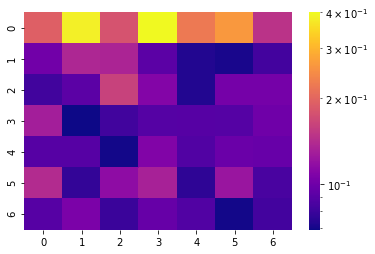

[[0.193 0.385 0.179 0.4   0.223 0.263 0.147]
 [0.101 0.137 0.135 0.092 0.073 0.071 0.083]
 [0.082 0.092 0.161 0.11  0.073 0.103 0.103]
 [0.129 0.069 0.082 0.089 0.09  0.089 0.1  ]
 [0.09  0.09  0.07  0.109 0.088 0.098 0.097]
 [0.14  0.078 0.116 0.132 0.076 0.122 0.085]
 [0.09  0.106 0.08  0.096 0.088 0.07  0.083]]


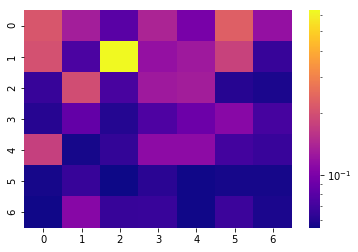

[[0.213 0.132 0.081 0.139 0.098 0.228 0.117]
 [0.202 0.074 0.633 0.117 0.127 0.179 0.066]
 [0.066 0.196 0.073 0.127 0.13  0.061 0.058]
 [0.061 0.086 0.06  0.076 0.091 0.109 0.072]
 [0.175 0.057 0.065 0.112 0.112 0.071 0.067]
 [0.057 0.066 0.055 0.062 0.056 0.057 0.057]
 [0.056 0.108 0.066 0.067 0.056 0.068 0.058]]


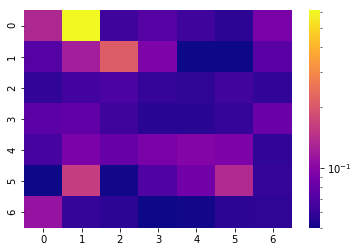

[[0.133 0.611 0.063 0.072 0.063 0.057 0.09 ]
 [0.072 0.122 0.211 0.094 0.05  0.05  0.074]
 [0.059 0.065 0.068 0.06  0.058 0.064 0.059]
 [0.076 0.078 0.063 0.056 0.056 0.06  0.082]
 [0.066 0.091 0.08  0.09  0.098 0.093 0.059]
 [0.05  0.161 0.051 0.071 0.086 0.136 0.06 ]
 [0.111 0.06  0.057 0.05  0.051 0.057 0.058]]


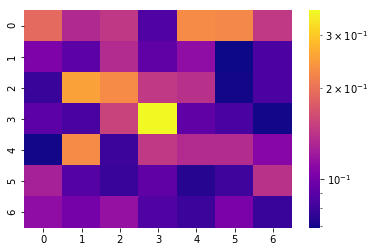

[[0.191 0.133 0.145 0.086 0.227 0.225 0.146]
 [0.105 0.09  0.135 0.092 0.113 0.069 0.085]
 [0.079 0.252 0.228 0.146 0.139 0.07  0.085]
 [0.09  0.084 0.154 0.361 0.092 0.084 0.07 ]
 [0.07  0.227 0.08  0.146 0.135 0.135 0.108]
 [0.126 0.088 0.079 0.092 0.074 0.081 0.14 ]
 [0.113 0.101 0.116 0.086 0.08  0.103 0.079]]


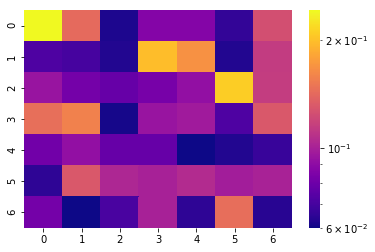

[[0.241 0.142 0.062 0.087 0.087 0.066 0.125]
 [0.072 0.07  0.063 0.198 0.168 0.063 0.114]
 [0.094 0.082 0.078 0.083 0.092 0.209 0.115]
 [0.145 0.157 0.061 0.094 0.097 0.072 0.131]
 [0.081 0.092 0.078 0.078 0.06  0.063 0.067]
 [0.065 0.131 0.103 0.1   0.105 0.098 0.101]
 [0.082 0.06  0.071 0.1   0.065 0.144 0.064]]


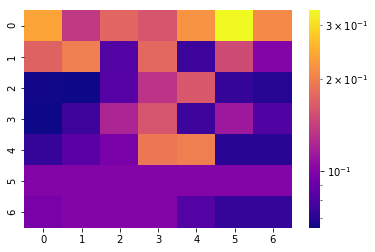

[[0.238 0.137 0.175 0.16  0.22  0.335 0.21 ]
 [0.172 0.199 0.082 0.177 0.075 0.151 0.1  ]
 [0.066 0.065 0.083 0.133 0.162 0.073 0.069]
 [0.065 0.075 0.121 0.159 0.075 0.113 0.081]
 [0.073 0.084 0.096 0.193 0.199 0.07  0.07 ]
 [0.1   0.1   0.1   0.1   0.1   0.1   0.1  ]
 [0.096 0.1   0.1   0.1   0.082 0.073 0.073]]
SKIPPPPPPEDDDD


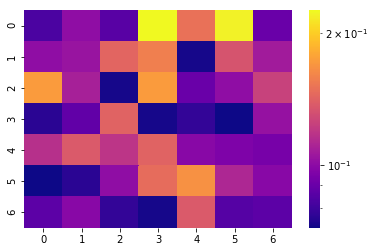

[[0.083 0.101 0.086 0.225 0.15  0.221 0.09 ]
 [0.101 0.104 0.143 0.157 0.073 0.134 0.107]
 [0.173 0.109 0.073 0.173 0.09  0.101 0.125]
 [0.076 0.088 0.142 0.073 0.078 0.072 0.103]
 [0.116 0.137 0.119 0.142 0.099 0.096 0.094]
 [0.072 0.076 0.101 0.147 0.167 0.112 0.099]
 [0.087 0.099 0.078 0.073 0.137 0.085 0.087]]


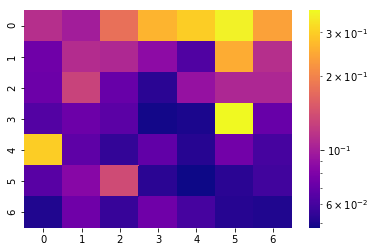

[[0.112 0.099 0.177 0.262 0.298 0.355 0.238]
 [0.074 0.11  0.107 0.087 0.063 0.252 0.112]
 [0.073 0.129 0.071 0.053 0.091 0.106 0.106]
 [0.064 0.073 0.067 0.049 0.05  0.369 0.071]
 [0.299 0.068 0.055 0.069 0.052 0.075 0.06 ]
 [0.066 0.084 0.137 0.053 0.048 0.053 0.059]
 [0.051 0.074 0.056 0.074 0.06  0.052 0.051]]


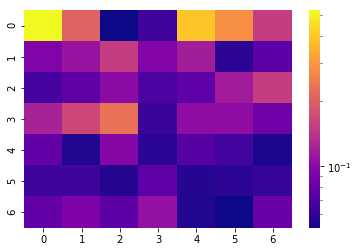

[[0.527 0.204 0.052 0.065 0.396 0.286 0.153]
 [0.094 0.11  0.153 0.096 0.118 0.059 0.076]
 [0.067 0.078 0.102 0.07  0.077 0.117 0.153]
 [0.122 0.166 0.23  0.063 0.104 0.104 0.086]
 [0.079 0.056 0.098 0.058 0.074 0.066 0.055]
 [0.065 0.065 0.057 0.077 0.057 0.059 0.062]
 [0.08  0.093 0.076 0.108 0.056 0.052 0.083]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


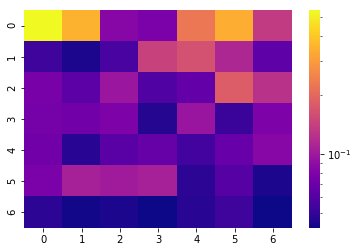

[[0.542 0.351 0.085 0.078 0.229 0.339 0.136]
 [0.053 0.045 0.057 0.144 0.164 0.113 0.065]
 [0.077 0.064 0.098 0.06  0.067 0.183 0.126]
 [0.075 0.073 0.079 0.046 0.097 0.052 0.079]
 [0.073 0.047 0.063 0.068 0.055 0.069 0.084]
 [0.078 0.107 0.102 0.107 0.048 0.062 0.045]
 [0.048 0.043 0.045 0.042 0.047 0.053 0.042]]


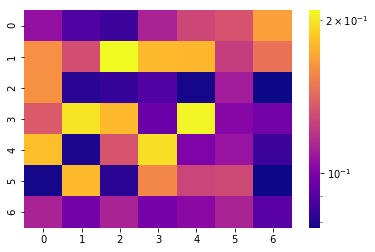

[[0.106 0.089 0.085 0.113 0.128 0.133 0.168]
 [0.161 0.131 0.209 0.18  0.179 0.124 0.147]
 [0.162 0.082 0.084 0.089 0.079 0.11  0.078]
 [0.136 0.199 0.18  0.095 0.207 0.102 0.097]
 [0.182 0.08  0.134 0.197 0.1   0.107 0.085]
 [0.079 0.18  0.082 0.157 0.127 0.129 0.078]
 [0.113 0.097 0.113 0.098 0.103 0.113 0.091]]


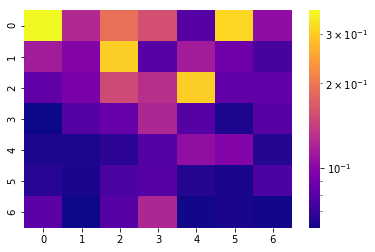

[[0.365 0.124 0.191 0.157 0.08  0.316 0.104]
 [0.114 0.098 0.304 0.08  0.114 0.089 0.075]
 [0.084 0.093 0.152 0.129 0.304 0.084 0.084]
 [0.061 0.079 0.086 0.121 0.08  0.064 0.08 ]
 [0.064 0.064 0.067 0.079 0.105 0.098 0.065]
 [0.066 0.063 0.076 0.08  0.065 0.063 0.076]
 [0.082 0.061 0.08  0.121 0.062 0.063 0.062]]


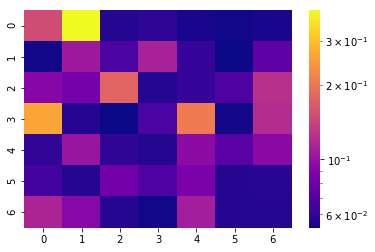

[[0.151 0.399 0.057 0.06  0.055 0.054 0.055]
 [0.054 0.106 0.068 0.112 0.062 0.053 0.075]
 [0.092 0.084 0.178 0.057 0.062 0.069 0.125]
 [0.263 0.057 0.053 0.068 0.208 0.054 0.12 ]
 [0.061 0.102 0.06  0.057 0.095 0.073 0.094]
 [0.066 0.057 0.082 0.069 0.087 0.057 0.058]
 [0.114 0.093 0.057 0.054 0.109 0.057 0.057]]


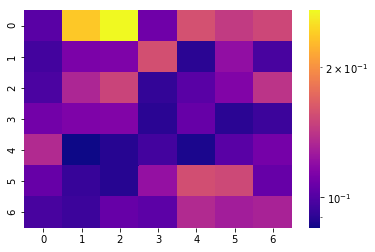

[[0.102 0.237 0.271 0.109 0.158 0.145 0.152]
 [0.096 0.113 0.114 0.157 0.09  0.121 0.097]
 [0.098 0.133 0.15  0.092 0.102 0.115 0.141]
 [0.11  0.114 0.115 0.09  0.106 0.09  0.094]
 [0.135 0.085 0.089 0.096 0.087 0.102 0.111]
 [0.106 0.093 0.089 0.122 0.156 0.153 0.106]
 [0.097 0.094 0.106 0.103 0.135 0.128 0.131]]


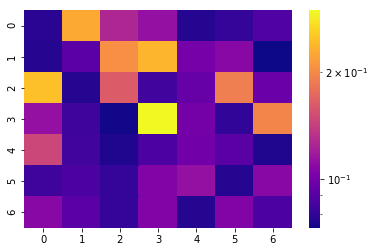

[[0.078 0.227 0.126 0.113 0.077 0.081 0.088]
 [0.077 0.091 0.205 0.236 0.101 0.108 0.073]
 [0.246 0.077 0.163 0.084 0.095 0.19  0.097]
 [0.113 0.083 0.074 0.297 0.1   0.08  0.196]
 [0.147 0.084 0.076 0.087 0.099 0.091 0.076]
 [0.083 0.087 0.081 0.105 0.113 0.077 0.108]
 [0.108 0.091 0.081 0.105 0.077 0.105 0.087]]


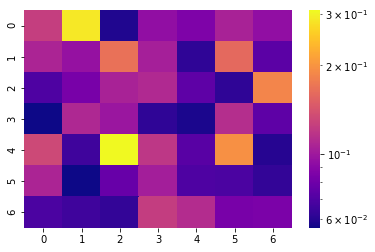

[[0.125 0.288 0.059 0.094 0.086 0.106 0.094]
 [0.107 0.096 0.168 0.104 0.062 0.16  0.074]
 [0.07  0.084 0.106 0.11  0.075 0.062 0.186]
 [0.056 0.109 0.098 0.062 0.058 0.113 0.075]
 [0.133 0.066 0.308 0.119 0.073 0.196 0.06 ]
 [0.107 0.056 0.078 0.103 0.07  0.069 0.063]
 [0.069 0.066 0.063 0.124 0.112 0.084 0.085]]


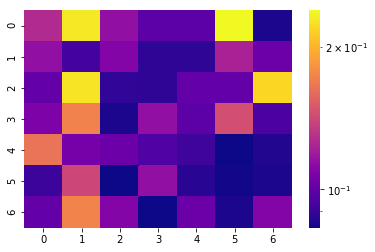

[[0.127 0.23  0.115 0.099 0.099 0.239 0.085]
 [0.115 0.093 0.11  0.088 0.088 0.123 0.103]
 [0.101 0.227 0.089 0.088 0.101 0.101 0.22 ]
 [0.108 0.173 0.085 0.115 0.099 0.145 0.095]
 [0.165 0.106 0.103 0.096 0.092 0.083 0.086]
 [0.091 0.141 0.083 0.115 0.087 0.084 0.085]
 [0.101 0.174 0.11  0.083 0.103 0.085 0.11 ]]


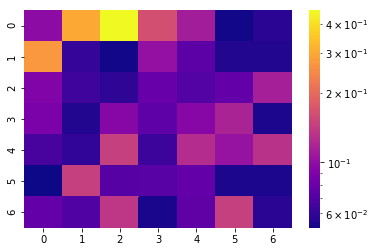

[[0.098 0.298 0.458 0.165 0.112 0.053 0.058]
 [0.271 0.061 0.053 0.102 0.074 0.056 0.056]
 [0.091 0.064 0.059 0.079 0.071 0.078 0.114]
 [0.088 0.056 0.094 0.075 0.095 0.118 0.055]
 [0.067 0.06  0.146 0.063 0.126 0.104 0.132]
 [0.052 0.146 0.072 0.073 0.077 0.055 0.055]
 [0.078 0.07  0.137 0.054 0.076 0.146 0.058]]


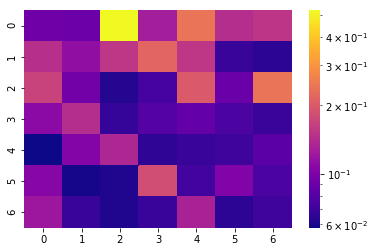

[[0.093 0.091 0.523 0.127 0.243 0.143 0.153]
 [0.146 0.113 0.154 0.218 0.154 0.069 0.065]
 [0.169 0.094 0.063 0.074 0.2   0.09  0.242]
 [0.109 0.143 0.068 0.08  0.087 0.076 0.07 ]
 [0.058 0.104 0.136 0.066 0.069 0.071 0.082]
 [0.106 0.06  0.062 0.183 0.073 0.102 0.076]
 [0.121 0.069 0.062 0.069 0.132 0.065 0.071]]


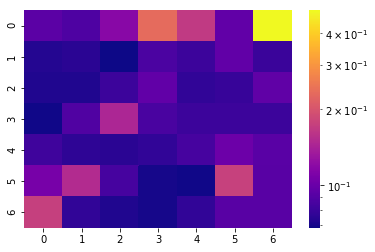

[[0.094 0.088 0.118 0.233 0.167 0.097 0.493]
 [0.073 0.075 0.068 0.087 0.081 0.097 0.08 ]
 [0.072 0.072 0.081 0.097 0.077 0.079 0.096]
 [0.069 0.089 0.146 0.086 0.081 0.081 0.081]
 [0.082 0.076 0.075 0.077 0.085 0.102 0.093]
 [0.108 0.152 0.085 0.07  0.069 0.175 0.092]
 [0.174 0.077 0.072 0.07  0.077 0.092 0.092]]


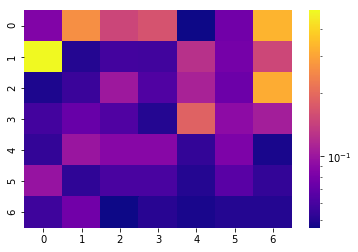

[[0.085 0.261 0.15  0.165 0.046 0.077 0.332]
 [0.491 0.05  0.059 0.058 0.126 0.079 0.151]
 [0.049 0.056 0.102 0.063 0.111 0.075 0.316]
 [0.059 0.073 0.063 0.05  0.187 0.092 0.107]
 [0.054 0.1   0.088 0.088 0.054 0.083 0.048]
 [0.098 0.053 0.061 0.061 0.05  0.067 0.054]
 [0.057 0.077 0.046 0.051 0.048 0.05  0.05 ]]


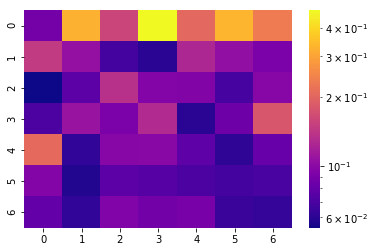

[[0.088 0.326 0.158 0.475 0.204 0.332 0.234]
 [0.147 0.106 0.068 0.06  0.126 0.105 0.091]
 [0.054 0.077 0.136 0.096 0.095 0.069 0.098]
 [0.071 0.109 0.091 0.129 0.06  0.085 0.18 ]
 [0.208 0.062 0.098 0.099 0.078 0.061 0.082]
 [0.096 0.058 0.077 0.075 0.071 0.068 0.07 ]
 [0.08  0.062 0.094 0.087 0.09  0.065 0.063]]


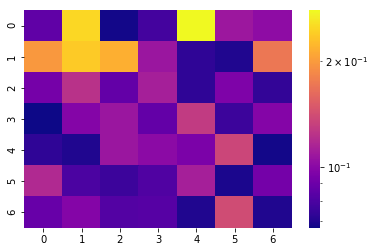

[[0.086 0.248 0.068 0.078 0.278 0.108 0.102]
 [0.197 0.237 0.216 0.107 0.073 0.07  0.172]
 [0.093 0.123 0.087 0.112 0.073 0.096 0.074]
 [0.067 0.098 0.107 0.087 0.129 0.076 0.098]
 [0.073 0.07  0.107 0.101 0.095 0.136 0.068]
 [0.118 0.08  0.076 0.081 0.112 0.069 0.092]
 [0.088 0.098 0.082 0.083 0.07  0.14  0.07 ]]


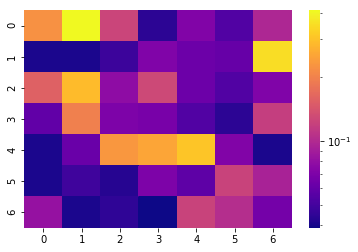

[[0.223 0.411 0.125 0.044 0.072 0.054 0.097]
 [0.041 0.041 0.048 0.071 0.063 0.061 0.354]
 [0.156 0.291 0.078 0.128 0.063 0.054 0.071]
 [0.059 0.197 0.07  0.068 0.054 0.044 0.118]
 [0.041 0.062 0.231 0.253 0.309 0.072 0.041]
 [0.041 0.049 0.043 0.07  0.058 0.123 0.094]
 [0.082 0.041 0.045 0.039 0.123 0.103 0.066]]


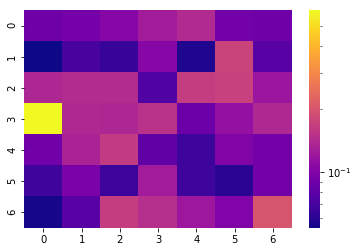

[[0.09  0.094 0.105 0.125 0.141 0.092 0.09 ]
 [0.054 0.071 0.065 0.104 0.058 0.175 0.078]
 [0.137 0.142 0.142 0.075 0.166 0.17  0.119]
 [0.596 0.139 0.137 0.151 0.088 0.114 0.139]
 [0.091 0.134 0.163 0.082 0.067 0.101 0.093]
 [0.068 0.096 0.067 0.125 0.068 0.061 0.092]
 [0.056 0.078 0.166 0.146 0.12  0.1   0.199]]


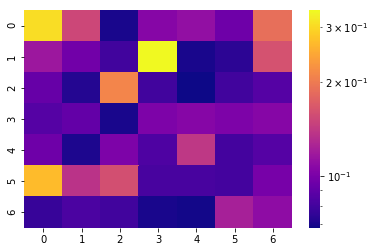

[[0.304 0.152 0.07  0.105 0.111 0.095 0.188]
 [0.116 0.096 0.08  0.338 0.07  0.074 0.161]
 [0.092 0.072 0.211 0.08  0.068 0.08  0.086]
 [0.086 0.091 0.07  0.101 0.105 0.101 0.105]
 [0.095 0.071 0.101 0.084 0.139 0.081 0.086]
 [0.268 0.136 0.159 0.082 0.082 0.081 0.099]
 [0.077 0.083 0.08  0.07  0.069 0.122 0.109]]


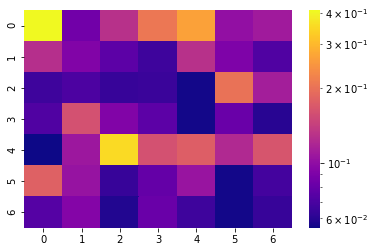

[[0.41  0.085 0.129 0.208 0.266 0.102 0.11 ]
 [0.127 0.093 0.077 0.066 0.129 0.091 0.072]
 [0.066 0.071 0.064 0.065 0.056 0.201 0.113]
 [0.072 0.16  0.093 0.077 0.056 0.082 0.06 ]
 [0.055 0.108 0.355 0.16  0.176 0.122 0.166]
 [0.179 0.104 0.064 0.08  0.105 0.056 0.068]
 [0.074 0.094 0.059 0.082 0.066 0.056 0.064]]


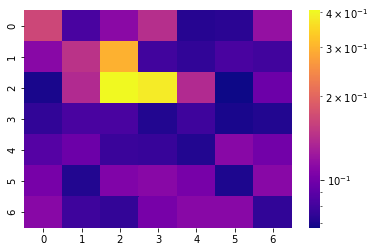

[[0.166 0.083 0.112 0.142 0.072 0.073 0.117]
 [0.111 0.146 0.298 0.08  0.075 0.083 0.08 ]
 [0.069 0.138 0.407 0.382 0.138 0.067 0.097]
 [0.075 0.083 0.083 0.071 0.079 0.069 0.071]
 [0.087 0.097 0.078 0.077 0.071 0.111 0.1  ]
 [0.102 0.071 0.106 0.111 0.102 0.07  0.111]
 [0.111 0.079 0.076 0.102 0.111 0.111 0.075]]
SKIPPPPPPEDDDD


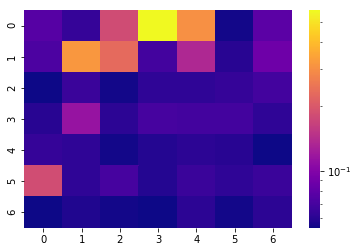

[[0.077 0.064 0.182 0.564 0.305 0.055 0.079]
 [0.073 0.317 0.231 0.069 0.136 0.06  0.088]
 [0.054 0.066 0.055 0.062 0.062 0.064 0.069]
 [0.06  0.114 0.061 0.07  0.069 0.069 0.062]
 [0.064 0.062 0.055 0.059 0.061 0.06  0.054]
 [0.183 0.062 0.07  0.059 0.066 0.062 0.066]
 [0.054 0.058 0.055 0.054 0.061 0.055 0.061]]
SKIPPPPPPEDDDD


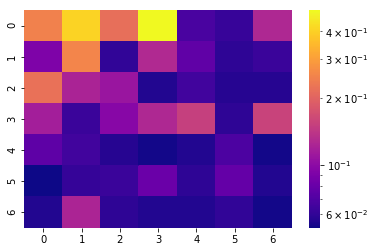

[[0.248 0.406 0.218 0.497 0.068 0.062 0.126]
 [0.092 0.256 0.06  0.127 0.077 0.059 0.063]
 [0.221 0.122 0.109 0.056 0.065 0.057 0.057]
 [0.117 0.063 0.097 0.126 0.152 0.059 0.156]
 [0.076 0.065 0.057 0.053 0.056 0.069 0.053]
 [0.052 0.061 0.063 0.082 0.059 0.079 0.056]
 [0.056 0.123 0.059 0.056 0.056 0.06  0.053]]


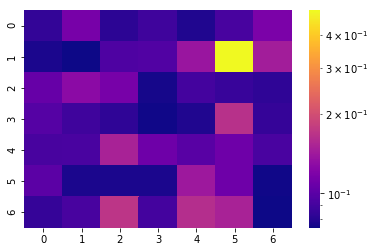

[[0.084 0.115 0.082 0.089 0.078 0.092 0.118]
 [0.077 0.074 0.095 0.096 0.138 0.496 0.145]
 [0.106 0.128 0.115 0.076 0.091 0.086 0.083]
 [0.098 0.089 0.083 0.075 0.078 0.166 0.085]
 [0.092 0.093 0.151 0.11  0.099 0.11  0.093]
 [0.101 0.077 0.077 0.077 0.141 0.11  0.075]
 [0.085 0.092 0.171 0.091 0.162 0.151 0.074]]


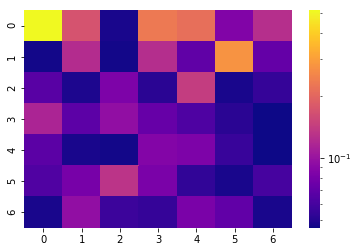

[[0.516 0.17  0.048 0.231 0.213 0.086 0.126]
 [0.047 0.123 0.047 0.125 0.07  0.279 0.072]
 [0.067 0.049 0.084 0.052 0.142 0.048 0.055]
 [0.115 0.069 0.096 0.073 0.063 0.052 0.046]
 [0.068 0.048 0.047 0.087 0.084 0.056 0.046]
 [0.064 0.081 0.132 0.082 0.054 0.048 0.06 ]
 [0.048 0.096 0.057 0.055 0.082 0.071 0.048]]


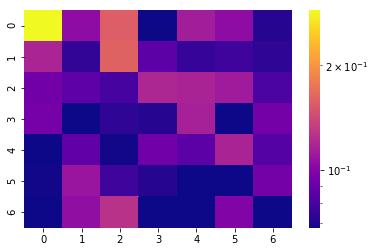

[[0.288 0.104 0.157 0.068 0.113 0.104 0.072]
 [0.118 0.075 0.16  0.086 0.076 0.078 0.074]
 [0.093 0.087 0.08  0.119 0.117 0.112 0.081]
 [0.095 0.068 0.074 0.072 0.115 0.068 0.094]
 [0.068 0.088 0.069 0.093 0.086 0.117 0.084]
 [0.069 0.109 0.078 0.072 0.068 0.068 0.094]
 [0.068 0.105 0.126 0.068 0.068 0.099 0.068]]
SKIPPPPPPEDDDD


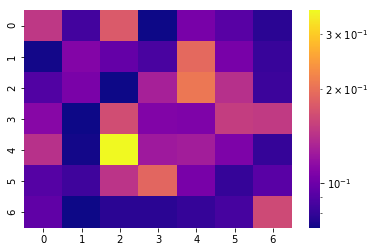

[[0.147 0.085 0.178 0.072 0.105 0.092 0.078]
 [0.073 0.11  0.097 0.087 0.193 0.105 0.082]
 [0.09  0.106 0.072 0.129 0.208 0.141 0.083]
 [0.112 0.072 0.166 0.109 0.108 0.152 0.149]
 [0.142 0.073 0.356 0.124 0.127 0.107 0.081]
 [0.091 0.084 0.144 0.19  0.105 0.081 0.093]
 [0.095 0.072 0.078 0.078 0.081 0.086 0.163]]


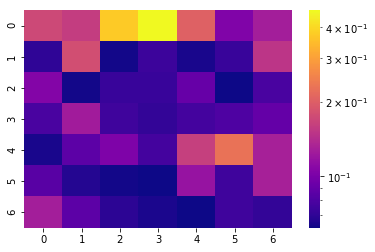

[[0.172 0.159 0.373 0.469 0.203 0.104 0.128]
 [0.07  0.179 0.063 0.074 0.064 0.073 0.151]
 [0.106 0.063 0.073 0.073 0.091 0.062 0.079]
 [0.079 0.126 0.075 0.071 0.077 0.081 0.09 ]
 [0.064 0.087 0.103 0.077 0.162 0.229 0.13 ]
 [0.085 0.067 0.063 0.062 0.118 0.075 0.13 ]
 [0.128 0.087 0.069 0.065 0.062 0.075 0.071]]


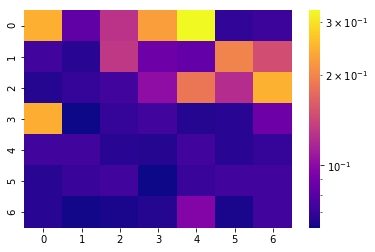

[[0.244 0.083 0.127 0.226 0.328 0.069 0.072]
 [0.073 0.067 0.131 0.088 0.084 0.198 0.149]
 [0.066 0.07  0.073 0.102 0.186 0.122 0.245]
 [0.242 0.062 0.07  0.073 0.066 0.067 0.088]
 [0.073 0.073 0.067 0.066 0.073 0.067 0.07 ]
 [0.067 0.071 0.073 0.062 0.071 0.073 0.073]
 [0.067 0.063 0.064 0.066 0.097 0.064 0.073]]


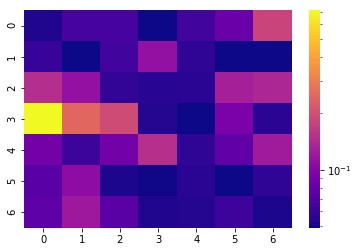

[[0.053 0.066 0.066 0.049 0.064 0.083 0.182]
 [0.06  0.049 0.064 0.112 0.057 0.049 0.049]
 [0.148 0.112 0.059 0.055 0.056 0.129 0.137]
 [0.711 0.25  0.193 0.054 0.049 0.094 0.056]
 [0.088 0.062 0.088 0.151 0.057 0.079 0.123]
 [0.075 0.108 0.052 0.05  0.056 0.049 0.057]
 [0.077 0.121 0.075 0.053 0.054 0.062 0.052]]


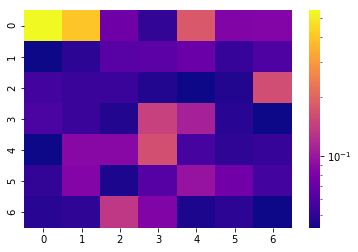

[[0.549 0.401 0.074 0.051 0.179 0.083 0.085]
 [0.043 0.049 0.064 0.065 0.072 0.052 0.06 ]
 [0.056 0.053 0.053 0.047 0.043 0.047 0.162]
 [0.059 0.053 0.047 0.145 0.109 0.048 0.043]
 [0.043 0.088 0.088 0.165 0.057 0.05  0.052]
 [0.051 0.085 0.046 0.063 0.097 0.075 0.056]
 [0.048 0.05  0.134 0.083 0.046 0.049 0.043]]


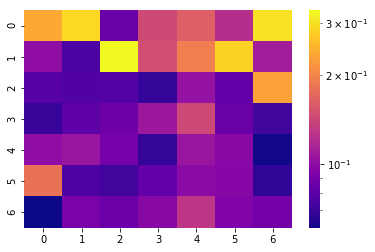

[[0.236 0.291 0.085 0.144 0.163 0.122 0.301]
 [0.101 0.075 0.33  0.148 0.193 0.284 0.111]
 [0.079 0.077 0.078 0.069 0.104 0.083 0.231]
 [0.07  0.081 0.087 0.107 0.143 0.085 0.072]
 [0.101 0.106 0.09  0.069 0.106 0.098 0.062]
 [0.181 0.076 0.072 0.083 0.099 0.097 0.068]
 [0.061 0.092 0.086 0.098 0.128 0.094 0.089]]


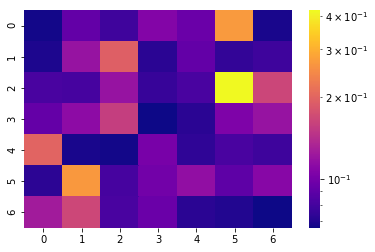

[[0.067 0.092 0.079 0.107 0.096 0.27  0.068]
 [0.069 0.119 0.194 0.072 0.092 0.075 0.078]
 [0.082 0.081 0.119 0.076 0.082 0.418 0.166]
 [0.093 0.113 0.157 0.066 0.072 0.105 0.119]
 [0.2   0.068 0.067 0.102 0.074 0.082 0.078]
 [0.073 0.269 0.081 0.099 0.115 0.09  0.11 ]
 [0.126 0.167 0.082 0.096 0.072 0.07  0.066]]


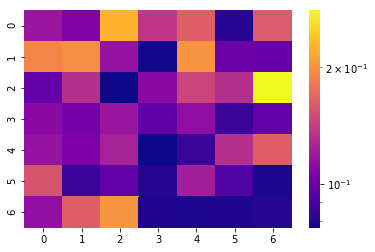

[[0.118 0.108 0.225 0.137 0.163 0.081 0.161]
 [0.192 0.198 0.116 0.078 0.203 0.1   0.099]
 [0.098 0.132 0.077 0.111 0.146 0.132 0.281]
 [0.111 0.104 0.118 0.096 0.114 0.086 0.098]
 [0.116 0.106 0.124 0.077 0.086 0.132 0.163]
 [0.156 0.086 0.098 0.081 0.122 0.092 0.079]
 [0.114 0.163 0.204 0.08  0.079 0.08  0.081]]


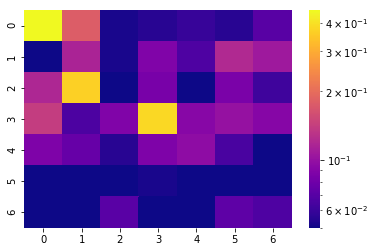

[[0.455 0.179 0.052 0.055 0.059 0.055 0.07 ]
 [0.05  0.115 0.052 0.088 0.067 0.12  0.106]
 [0.118 0.367 0.05  0.084 0.05  0.085 0.062]
 [0.14  0.066 0.088 0.385 0.092 0.1   0.091]
 [0.087 0.076 0.055 0.087 0.096 0.065 0.05 ]
 [0.05  0.05  0.05  0.052 0.05  0.05  0.05 ]
 [0.05  0.05  0.071 0.05  0.05  0.073 0.067]]


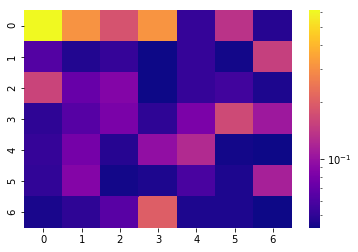

[[0.613 0.309 0.181 0.315 0.052 0.136 0.048]
 [0.063 0.047 0.052 0.043 0.052 0.044 0.152]
 [0.158 0.072 0.087 0.043 0.052 0.056 0.046]
 [0.05  0.064 0.081 0.05  0.082 0.167 0.105]
 [0.052 0.079 0.048 0.096 0.125 0.044 0.043]
 [0.051 0.088 0.044 0.046 0.059 0.046 0.114]
 [0.045 0.05  0.065 0.201 0.046 0.046 0.043]]


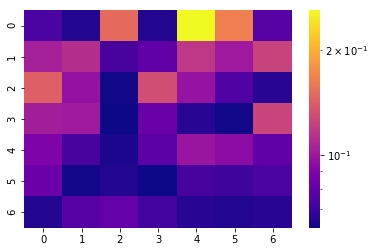

[[0.074 0.065 0.15  0.065 0.259 0.164 0.077]
 [0.104 0.112 0.073 0.08  0.117 0.101 0.124]
 [0.143 0.097 0.063 0.131 0.098 0.075 0.066]
 [0.103 0.101 0.062 0.082 0.066 0.063 0.125]
 [0.089 0.073 0.064 0.078 0.099 0.094 0.08 ]
 [0.083 0.063 0.065 0.062 0.073 0.071 0.074]
 [0.065 0.077 0.081 0.072 0.066 0.065 0.066]]


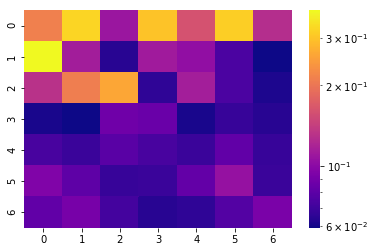

[[0.213 0.326 0.109 0.3   0.161 0.316 0.127]
 [0.38  0.114 0.064 0.112 0.104 0.074 0.059]
 [0.131 0.21  0.261 0.066 0.115 0.074 0.062]
 [0.061 0.059 0.088 0.085 0.061 0.068 0.064]
 [0.073 0.069 0.079 0.073 0.069 0.082 0.068]
 [0.095 0.081 0.068 0.069 0.083 0.106 0.069]
 [0.082 0.091 0.072 0.064 0.066 0.077 0.092]]


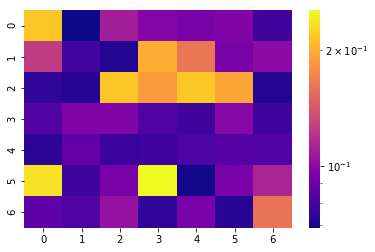

[[0.217 0.069 0.109 0.097 0.094 0.096 0.078]
 [0.125 0.079 0.072 0.201 0.162 0.094 0.1  ]
 [0.075 0.073 0.217 0.187 0.217 0.195 0.072]
 [0.083 0.096 0.096 0.082 0.078 0.098 0.078]
 [0.074 0.088 0.077 0.078 0.081 0.084 0.082]
 [0.236 0.078 0.094 0.253 0.07  0.094 0.113]
 [0.086 0.082 0.104 0.075 0.094 0.073 0.16 ]]


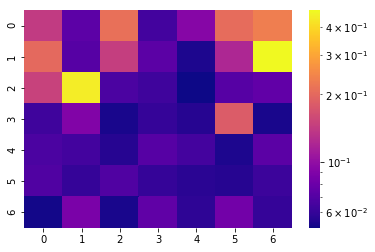

[[0.142 0.074 0.212 0.064 0.093 0.206 0.233]
 [0.201 0.071 0.145 0.073 0.054 0.121 0.472]
 [0.149 0.443 0.067 0.063 0.051 0.071 0.076]
 [0.063 0.091 0.053 0.06  0.056 0.183 0.053]
 [0.067 0.064 0.056 0.071 0.065 0.054 0.073]
 [0.069 0.06  0.069 0.06  0.057 0.056 0.062]
 [0.052 0.087 0.053 0.075 0.058 0.083 0.06 ]]


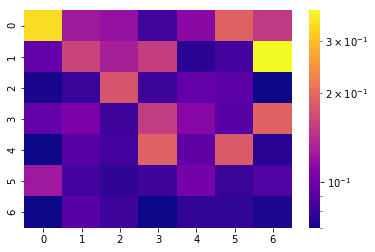

[[0.342 0.126 0.119 0.083 0.113 0.191 0.151]
 [0.095 0.161 0.13  0.155 0.076 0.084 0.381]
 [0.072 0.08  0.177 0.081 0.095 0.092 0.07 ]
 [0.095 0.105 0.082 0.153 0.111 0.091 0.191]
 [0.07  0.091 0.084 0.191 0.094 0.182 0.076]
 [0.125 0.084 0.077 0.082 0.103 0.08  0.088]
 [0.07  0.091 0.082 0.07  0.078 0.078 0.073]]


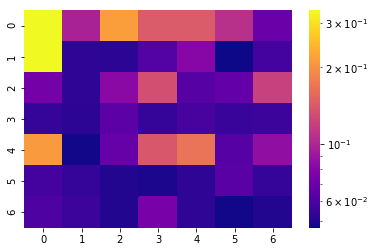

[[0.333 0.098 0.215 0.143 0.144 0.108 0.069]
 [0.335 0.053 0.052 0.062 0.08  0.047 0.058]
 [0.073 0.053 0.082 0.133 0.063 0.067 0.12 ]
 [0.054 0.052 0.065 0.054 0.059 0.055 0.056]
 [0.211 0.048 0.068 0.14  0.168 0.063 0.085]
 [0.058 0.054 0.05  0.049 0.053 0.064 0.054]
 [0.061 0.056 0.05  0.075 0.053 0.048 0.05 ]]


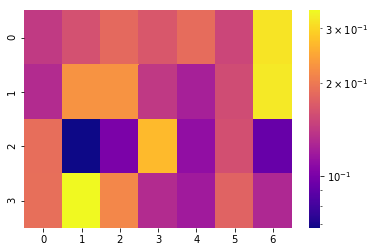

[[0.142 0.161 0.184 0.167 0.188 0.152 0.317]
 [0.131 0.226 0.227 0.141 0.123 0.157 0.324]
 [0.189 0.068 0.101 0.269 0.111 0.16  0.093]
 [0.19  0.343 0.214 0.131 0.119 0.178 0.128]]


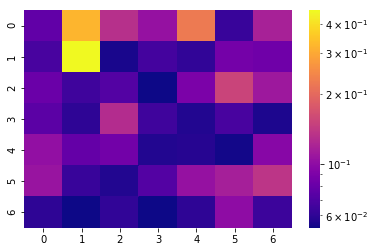

[[0.078 0.322 0.131 0.104 0.225 0.063 0.117]
 [0.068 0.457 0.055 0.067 0.061 0.086 0.084]
 [0.082 0.065 0.072 0.053 0.09  0.153 0.11 ]
 [0.075 0.06  0.128 0.065 0.057 0.068 0.056]
 [0.103 0.079 0.085 0.057 0.058 0.054 0.096]
 [0.106 0.063 0.057 0.072 0.104 0.115 0.137]
 [0.06  0.053 0.061 0.053 0.06  0.1   0.064]]


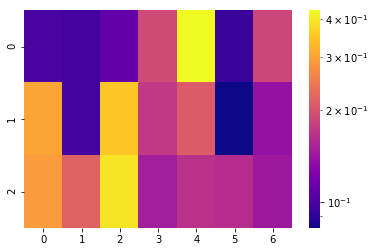

[[0.1   0.098 0.111 0.191 0.426 0.094 0.186]
 [0.304 0.097 0.35  0.173 0.211 0.082 0.138]
 [0.29  0.218 0.393 0.148 0.166 0.161 0.143]]
SKIPPPPPPEDDDD


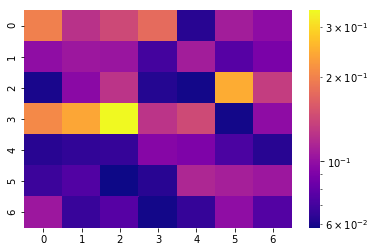

[[0.198 0.124 0.143 0.176 0.063 0.109 0.098]
 [0.099 0.105 0.104 0.07  0.109 0.076 0.089]
 [0.06  0.096 0.126 0.062 0.059 0.248 0.133]
 [0.208 0.24  0.344 0.126 0.144 0.059 0.098]
 [0.063 0.065 0.066 0.094 0.091 0.072 0.063]
 [0.068 0.074 0.058 0.063 0.116 0.11  0.105]
 [0.105 0.067 0.076 0.059 0.066 0.099 0.075]]


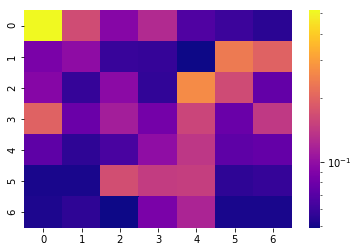

[[0.515 0.165 0.093 0.126 0.067 0.06  0.055]
 [0.086 0.098 0.059 0.058 0.049 0.237 0.197]
 [0.093 0.058 0.096 0.057 0.267 0.164 0.075]
 [0.197 0.079 0.114 0.083 0.157 0.078 0.141]
 [0.073 0.056 0.065 0.099 0.139 0.073 0.076]
 [0.051 0.051 0.168 0.146 0.148 0.056 0.058]
 [0.052 0.056 0.049 0.086 0.12  0.051 0.051]]
SKIPPPPPPEDDDD


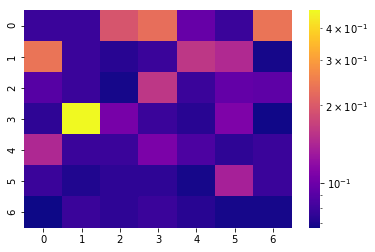

[[0.079 0.079 0.194 0.228 0.097 0.079 0.236]
 [0.236 0.079 0.073 0.079 0.158 0.145 0.069]
 [0.09  0.079 0.069 0.158 0.079 0.095 0.093]
 [0.075 0.467 0.105 0.079 0.073 0.109 0.068]
 [0.144 0.079 0.079 0.108 0.086 0.075 0.079]
 [0.079 0.071 0.075 0.075 0.069 0.136 0.079]
 [0.067 0.079 0.075 0.079 0.073 0.069 0.069]]


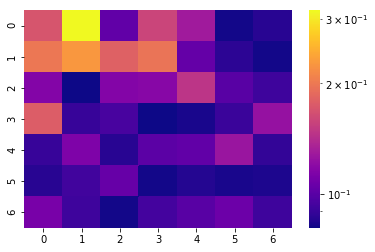

[[0.171 0.316 0.103 0.159 0.13  0.082 0.086]
 [0.199 0.227 0.18  0.196 0.104 0.087 0.082]
 [0.116 0.081 0.116 0.118 0.147 0.1   0.092]
 [0.177 0.09  0.095 0.081 0.083 0.091 0.124]
 [0.09  0.114 0.086 0.101 0.103 0.126 0.089]
 [0.086 0.093 0.105 0.082 0.085 0.083 0.084]
 [0.112 0.092 0.082 0.094 0.1   0.107 0.092]]


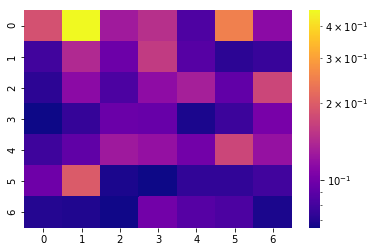

[[0.185 0.459 0.128 0.148 0.084 0.25  0.114]
 [0.079 0.141 0.097 0.159 0.087 0.072 0.076]
 [0.072 0.114 0.083 0.116 0.132 0.092 0.172]
 [0.065 0.075 0.096 0.095 0.068 0.077 0.103]
 [0.078 0.091 0.127 0.119 0.1   0.172 0.12 ]
 [0.098 0.197 0.068 0.065 0.074 0.074 0.079]
 [0.07  0.069 0.066 0.1   0.087 0.083 0.068]]


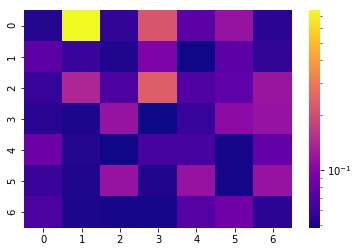

[[0.053 0.754 0.058 0.22  0.075 0.115 0.055]
 [0.076 0.06  0.052 0.096 0.049 0.075 0.058]
 [0.059 0.138 0.068 0.238 0.07  0.077 0.118]
 [0.055 0.051 0.115 0.048 0.059 0.106 0.115]
 [0.085 0.053 0.049 0.065 0.065 0.05  0.079]
 [0.06  0.052 0.115 0.052 0.115 0.05  0.115]
 [0.068 0.051 0.05  0.05  0.072 0.087 0.055]]


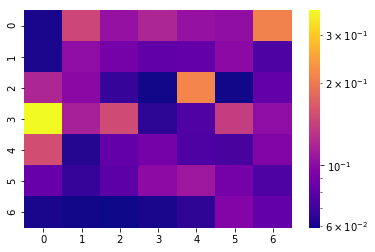

[[0.061 0.148 0.105 0.12  0.105 0.103 0.21 ]
 [0.062 0.102 0.09  0.082 0.083 0.1   0.075]
 [0.12  0.099 0.068 0.06  0.215 0.06  0.083]
 [0.37  0.115 0.151 0.065 0.076 0.139 0.102]
 [0.155 0.063 0.083 0.09  0.075 0.073 0.095]
 [0.084 0.068 0.08  0.101 0.109 0.09  0.075]
 [0.061 0.06  0.059 0.061 0.066 0.096 0.083]]


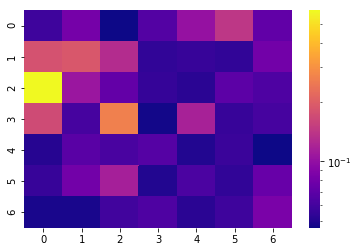

[[0.058 0.082 0.046 0.066 0.102 0.142 0.072]
 [0.181 0.189 0.13  0.054 0.056 0.054 0.081]
 [0.584 0.106 0.073 0.055 0.052 0.07  0.064]
 [0.169 0.061 0.266 0.047 0.118 0.056 0.061]
 [0.051 0.069 0.062 0.067 0.05  0.057 0.046]
 [0.056 0.081 0.115 0.05  0.063 0.054 0.075]
 [0.048 0.048 0.059 0.064 0.052 0.058 0.085]]


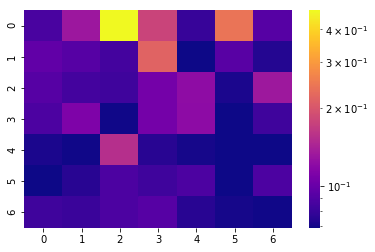

[[0.087 0.131 0.473 0.177 0.08  0.242 0.092]
 [0.097 0.092 0.085 0.217 0.069 0.093 0.074]
 [0.092 0.085 0.083 0.106 0.122 0.072 0.132]
 [0.088 0.112 0.07  0.106 0.121 0.069 0.083]
 [0.072 0.07  0.154 0.075 0.071 0.069 0.069]
 [0.069 0.075 0.088 0.083 0.088 0.069 0.088]
 [0.083 0.081 0.088 0.092 0.075 0.071 0.07 ]]


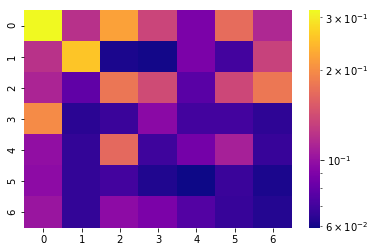

[[0.317 0.12  0.22  0.135 0.089 0.169 0.114]
 [0.121 0.257 0.061 0.06  0.089 0.07  0.133]
 [0.112 0.079 0.179 0.14  0.077 0.137 0.18 ]
 [0.198 0.064 0.068 0.095 0.07  0.07  0.065]
 [0.098 0.066 0.166 0.069 0.086 0.109 0.067]
 [0.096 0.066 0.07  0.062 0.059 0.068 0.061]
 [0.102 0.066 0.096 0.089 0.075 0.067 0.063]]


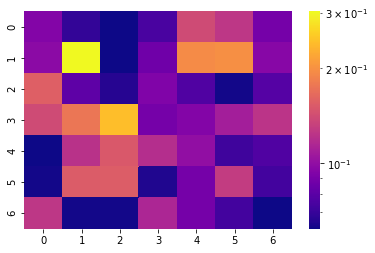

[[0.094 0.069 0.062 0.075 0.14  0.125 0.089]
 [0.098 0.303 0.062 0.087 0.195 0.198 0.096]
 [0.157 0.081 0.066 0.093 0.077 0.063 0.078]
 [0.14  0.176 0.243 0.089 0.094 0.109 0.124]
 [0.062 0.122 0.151 0.119 0.1   0.072 0.077]
 [0.063 0.154 0.155 0.065 0.089 0.129 0.073]
 [0.125 0.063 0.063 0.114 0.089 0.073 0.062]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


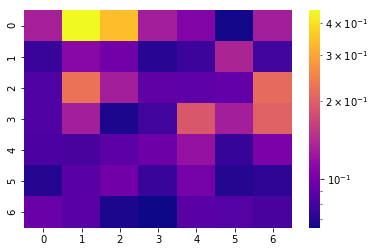

[[0.13  0.446 0.339 0.129 0.107 0.066 0.129]
 [0.076 0.111 0.099 0.071 0.077 0.135 0.079]
 [0.084 0.226 0.129 0.091 0.09  0.093 0.216]
 [0.085 0.129 0.068 0.079 0.19  0.129 0.202]
 [0.083 0.081 0.089 0.097 0.119 0.075 0.103]
 [0.07  0.088 0.099 0.076 0.101 0.07  0.073]
 [0.095 0.088 0.068 0.065 0.088 0.086 0.081]]


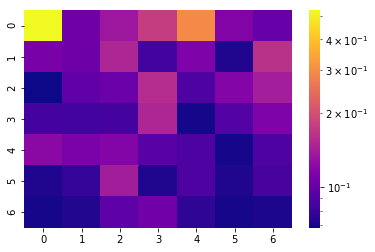

[[0.526 0.105 0.135 0.177 0.294 0.116 0.101]
 [0.11  0.104 0.149 0.084 0.114 0.072 0.163]
 [0.068 0.098 0.103 0.157 0.089 0.117 0.141]
 [0.085 0.084 0.085 0.15  0.07  0.091 0.114]
 [0.121 0.112 0.117 0.093 0.089 0.07  0.089]
 [0.072 0.079 0.14  0.072 0.089 0.072 0.086]
 [0.07  0.073 0.096 0.106 0.077 0.07  0.071]]


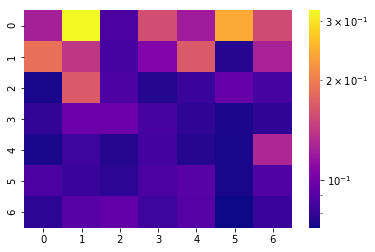

[[0.124 0.323 0.087 0.158 0.121 0.24  0.156]
 [0.188 0.14  0.085 0.106 0.168 0.076 0.126]
 [0.074 0.168 0.087 0.076 0.081 0.096 0.085]
 [0.08  0.098 0.098 0.085 0.079 0.075 0.079]
 [0.074 0.083 0.076 0.084 0.076 0.074 0.128]
 [0.087 0.081 0.078 0.087 0.091 0.074 0.088]
 [0.078 0.091 0.094 0.083 0.09  0.072 0.081]]
SKIPPPPPPEDDDD


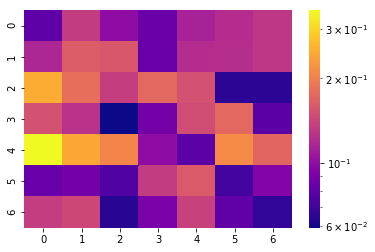

[[0.08  0.134 0.1   0.084 0.114 0.122 0.13 ]
 [0.117 0.164 0.159 0.083 0.122 0.123 0.13 ]
 [0.251 0.181 0.136 0.175 0.152 0.065 0.065]
 [0.152 0.126 0.059 0.088 0.148 0.175 0.078]
 [0.349 0.244 0.206 0.1   0.079 0.212 0.173]
 [0.083 0.088 0.075 0.134 0.161 0.071 0.095]
 [0.135 0.144 0.064 0.091 0.139 0.081 0.066]]


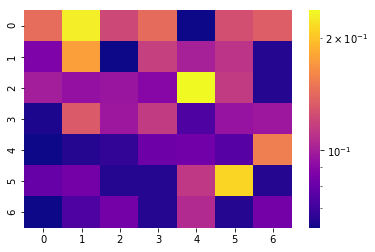

[[0.144 0.229 0.122 0.143 0.062 0.126 0.135]
 [0.087 0.176 0.062 0.117 0.101 0.111 0.065]
 [0.1   0.094 0.096 0.089 0.237 0.115 0.065]
 [0.064 0.132 0.097 0.115 0.074 0.095 0.097]
 [0.062 0.065 0.068 0.082 0.083 0.076 0.155]
 [0.08  0.084 0.065 0.065 0.113 0.212 0.065]
 [0.062 0.074 0.084 0.065 0.106 0.065 0.084]]


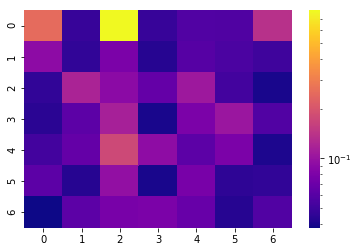

[[0.252 0.048 0.79  0.048 0.058 0.057 0.138]
 [0.092 0.046 0.08  0.043 0.06  0.055 0.051]
 [0.046 0.119 0.091 0.067 0.106 0.052 0.04 ]
 [0.044 0.063 0.115 0.04  0.08  0.104 0.058]
 [0.052 0.067 0.176 0.093 0.063 0.08  0.041]
 [0.063 0.043 0.096 0.04  0.078 0.045 0.046]
 [0.038 0.063 0.078 0.08  0.068 0.043 0.058]]
SKIPPPPPPEDDDD


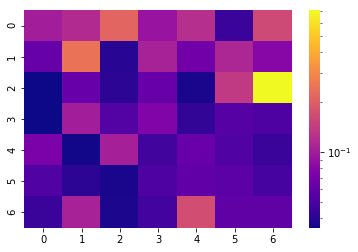

[[0.102 0.117 0.216 0.092 0.122 0.045 0.162]
 [0.062 0.244 0.04  0.106 0.067 0.112 0.08 ]
 [0.035 0.063 0.041 0.063 0.037 0.137 0.711]
 [0.035 0.101 0.054 0.076 0.043 0.055 0.052]
 [0.073 0.036 0.104 0.047 0.063 0.053 0.045]
 [0.053 0.041 0.037 0.052 0.06  0.057 0.049]
 [0.045 0.106 0.038 0.048 0.17  0.059 0.059]]


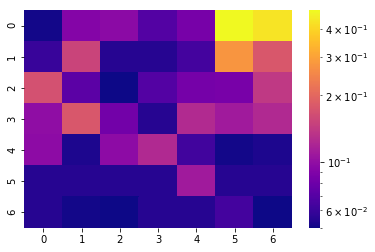

[[0.051 0.092 0.096 0.069 0.085 0.487 0.435]
 [0.06  0.152 0.055 0.055 0.064 0.276 0.177]
 [0.169 0.072 0.05  0.069 0.084 0.086 0.14 ]
 [0.099 0.177 0.083 0.055 0.124 0.11  0.123]
 [0.097 0.053 0.097 0.123 0.063 0.051 0.053]
 [0.055 0.055 0.055 0.055 0.11  0.055 0.055]
 [0.055 0.051 0.05  0.055 0.055 0.064 0.05 ]]


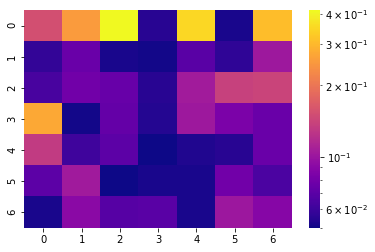

[[0.153 0.254 0.415 0.055 0.351 0.052 0.307]
 [0.058 0.076 0.052 0.051 0.07  0.057 0.102]
 [0.064 0.079 0.075 0.055 0.105 0.138 0.141]
 [0.273 0.051 0.074 0.054 0.102 0.084 0.076]
 [0.132 0.061 0.071 0.05  0.053 0.055 0.076]
 [0.071 0.104 0.05  0.052 0.052 0.079 0.065]
 [0.052 0.091 0.069 0.07  0.052 0.101 0.089]]


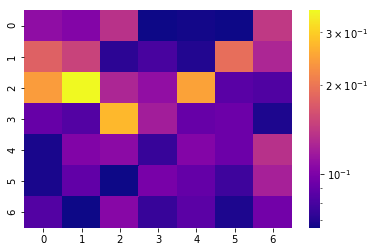

[[0.109 0.103 0.136 0.066 0.067 0.066 0.141]
 [0.178 0.15  0.072 0.08  0.07  0.191 0.126]
 [0.242 0.356 0.126 0.11  0.248 0.086 0.083]
 [0.091 0.084 0.274 0.12  0.091 0.093 0.069]
 [0.068 0.102 0.107 0.075 0.103 0.093 0.135]
 [0.068 0.089 0.066 0.098 0.09  0.077 0.122]
 [0.084 0.066 0.105 0.075 0.087 0.069 0.096]]


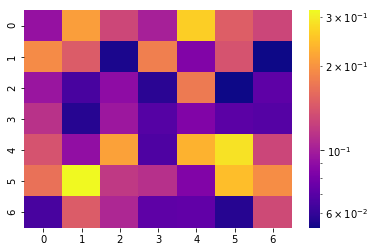

[[0.093 0.212 0.13  0.102 0.265 0.149 0.129]
 [0.192 0.147 0.055 0.18  0.084 0.139 0.053]
 [0.095 0.065 0.09  0.058 0.175 0.053 0.072]
 [0.114 0.057 0.096 0.069 0.084 0.071 0.069]
 [0.139 0.091 0.214 0.067 0.234 0.288 0.129]
 [0.167 0.316 0.119 0.112 0.084 0.247 0.195]
 [0.065 0.147 0.106 0.072 0.073 0.057 0.132]]


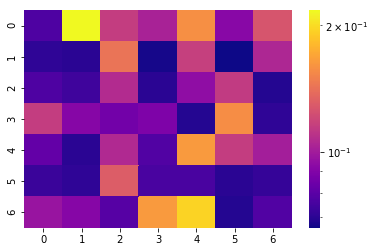

[[0.077 0.217 0.115 0.103 0.158 0.092 0.127]
 [0.071 0.07  0.143 0.067 0.116 0.066 0.105]
 [0.077 0.074 0.107 0.07  0.094 0.114 0.069]
 [0.115 0.091 0.086 0.089 0.069 0.157 0.071]
 [0.082 0.07  0.106 0.078 0.164 0.115 0.101]
 [0.073 0.071 0.131 0.076 0.076 0.07  0.072]
 [0.097 0.091 0.079 0.164 0.195 0.069 0.078]]


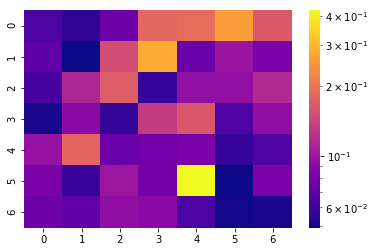

[[0.064 0.056 0.077 0.182 0.189 0.26  0.165]
 [0.071 0.049 0.152 0.281 0.075 0.099 0.082]
 [0.062 0.112 0.171 0.057 0.095 0.095 0.116]
 [0.051 0.09  0.057 0.132 0.162 0.065 0.094]
 [0.096 0.18  0.075 0.078 0.082 0.057 0.065]
 [0.082 0.058 0.1   0.079 0.421 0.049 0.082]
 [0.077 0.072 0.094 0.09  0.064 0.05  0.051]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


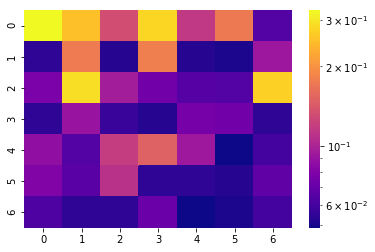

[[0.326 0.253 0.133 0.281 0.115 0.173 0.064]
 [0.055 0.176 0.053 0.18  0.053 0.051 0.092]
 [0.077 0.29  0.096 0.074 0.065 0.064 0.271]
 [0.055 0.09  0.057 0.053 0.076 0.074 0.055]
 [0.087 0.064 0.119 0.149 0.093 0.049 0.06 ]
 [0.08  0.066 0.11  0.055 0.055 0.053 0.068]
 [0.063 0.055 0.055 0.072 0.049 0.051 0.06 ]]


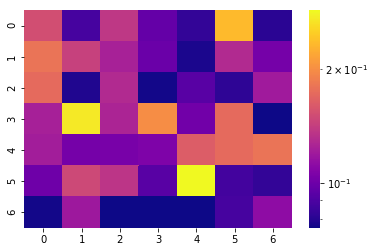

[[0.152 0.088 0.137 0.097 0.083 0.234 0.081]
 [0.18  0.143 0.124 0.099 0.078 0.129 0.103]
 [0.172 0.079 0.129 0.077 0.093 0.082 0.12 ]
 [0.123 0.272 0.126 0.199 0.101 0.172 0.076]
 [0.121 0.103 0.104 0.106 0.163 0.172 0.18 ]
 [0.1   0.148 0.136 0.093 0.285 0.087 0.083]
 [0.077 0.119 0.076 0.076 0.076 0.088 0.112]]


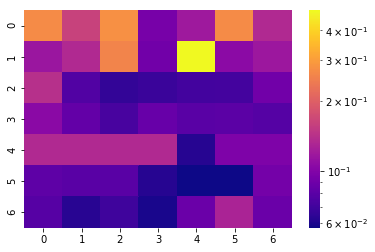

[[0.267 0.161 0.277 0.094 0.119 0.267 0.134]
 [0.116 0.134 0.257 0.091 0.488 0.106 0.117]
 [0.14  0.077 0.066 0.068 0.071 0.072 0.091]
 [0.105 0.084 0.073 0.086 0.08  0.081 0.078]
 [0.134 0.134 0.134 0.134 0.062 0.098 0.098]
 [0.082 0.08  0.08  0.062 0.057 0.057 0.092]
 [0.079 0.063 0.07  0.059 0.088 0.128 0.088]]


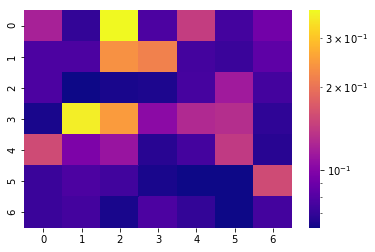

[[0.121 0.07  0.376 0.078 0.144 0.075 0.092]
 [0.078 0.078 0.235 0.217 0.075 0.072 0.084]
 [0.078 0.062 0.064 0.065 0.076 0.116 0.075]
 [0.064 0.358 0.248 0.104 0.127 0.13  0.069]
 [0.156 0.097 0.111 0.067 0.075 0.141 0.067]
 [0.072 0.078 0.074 0.064 0.062 0.062 0.156]
 [0.072 0.075 0.064 0.078 0.07  0.062 0.075]]
SKIPPPPPPEDDDD


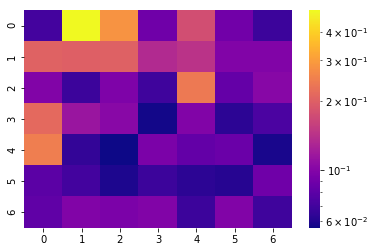

[[0.071 0.496 0.284 0.089 0.176 0.09  0.068]
 [0.204 0.201 0.202 0.134 0.144 0.099 0.099]
 [0.099 0.068 0.097 0.069 0.239 0.084 0.102]
 [0.215 0.114 0.103 0.057 0.099 0.063 0.073]
 [0.248 0.065 0.056 0.095 0.083 0.087 0.058]
 [0.08  0.07  0.059 0.068 0.063 0.061 0.089]
 [0.082 0.099 0.095 0.099 0.068 0.099 0.069]]


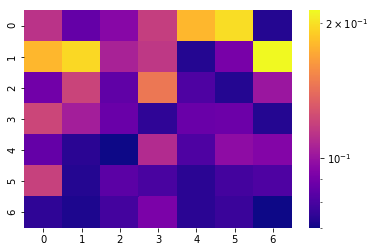

[[0.113 0.086 0.095 0.118 0.179 0.198 0.073]
 [0.179 0.196 0.106 0.115 0.073 0.091 0.213]
 [0.089 0.121 0.085 0.146 0.081 0.073 0.101]
 [0.122 0.104 0.087 0.075 0.087 0.088 0.073]
 [0.086 0.074 0.07  0.11  0.081 0.097 0.094]
 [0.119 0.073 0.084 0.08  0.074 0.079 0.081]
 [0.075 0.072 0.079 0.092 0.074 0.077 0.07 ]]


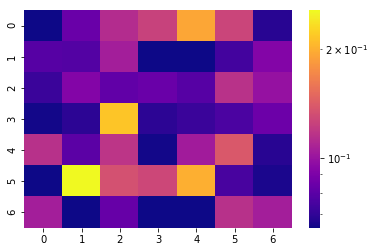

[[0.064 0.084 0.113 0.125 0.194 0.127 0.068]
 [0.079 0.078 0.105 0.064 0.064 0.074 0.092]
 [0.072 0.092 0.082 0.084 0.079 0.116 0.099]
 [0.065 0.069 0.216 0.069 0.072 0.076 0.085]
 [0.115 0.08  0.118 0.065 0.104 0.139 0.068]
 [0.064 0.256 0.134 0.128 0.2   0.075 0.066]
 [0.105 0.064 0.083 0.064 0.064 0.115 0.105]]


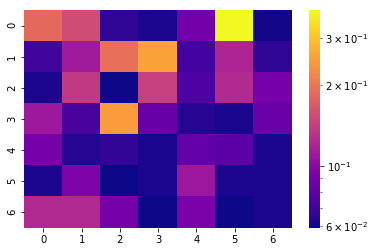

[[0.186 0.154 0.066 0.062 0.089 0.379 0.06 ]
 [0.071 0.112 0.193 0.253 0.072 0.12  0.066]
 [0.062 0.138 0.059 0.143 0.075 0.124 0.091]
 [0.111 0.073 0.247 0.084 0.063 0.061 0.086]
 [0.091 0.063 0.067 0.061 0.083 0.079 0.062]
 [0.062 0.094 0.059 0.062 0.11  0.062 0.062]
 [0.123 0.123 0.091 0.059 0.093 0.059 0.062]]
SKIPPPPPPEDDDD


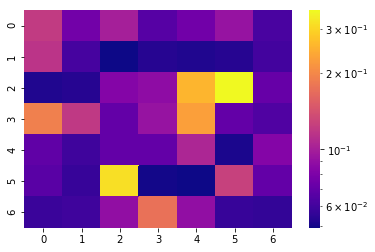

[[0.121 0.076 0.1   0.066 0.075 0.092 0.062]
 [0.116 0.061 0.049 0.053 0.052 0.053 0.06 ]
 [0.052 0.053 0.083 0.088 0.257 0.354 0.071]
 [0.192 0.12  0.07  0.092 0.229 0.07  0.064]
 [0.069 0.059 0.07  0.07  0.105 0.051 0.083]
 [0.067 0.057 0.313 0.05  0.049 0.126 0.07 ]
 [0.058 0.059 0.089 0.175 0.089 0.057 0.056]]


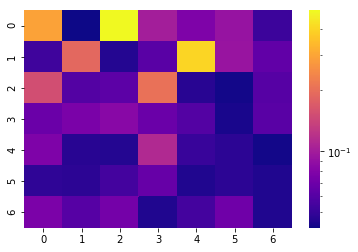

[[0.293 0.042 0.497 0.102 0.078 0.092 0.052]
 [0.053 0.191 0.046 0.062 0.405 0.093 0.065]
 [0.154 0.06  0.063 0.205 0.047 0.043 0.061]
 [0.069 0.076 0.084 0.069 0.06  0.044 0.062]
 [0.078 0.047 0.046 0.112 0.051 0.048 0.043]
 [0.049 0.048 0.055 0.067 0.045 0.048 0.045]
 [0.077 0.061 0.073 0.045 0.055 0.071 0.045]]


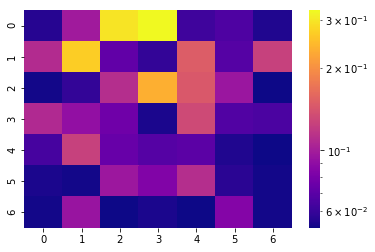

[[0.056 0.098 0.298 0.326 0.062 0.066 0.055]
 [0.109 0.269 0.072 0.059 0.15  0.068 0.125]
 [0.053 0.059 0.111 0.235 0.146 0.095 0.052]
 [0.108 0.091 0.077 0.054 0.133 0.067 0.065]
 [0.064 0.125 0.074 0.068 0.07  0.055 0.052]
 [0.054 0.053 0.096 0.084 0.111 0.057 0.053]
 [0.053 0.094 0.052 0.054 0.052 0.085 0.053]]


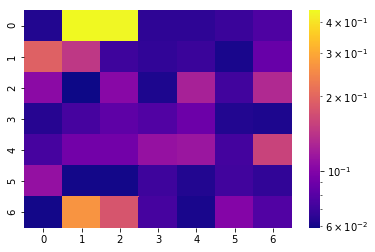

[[0.063 0.444 0.44  0.066 0.066 0.07  0.077]
 [0.193 0.146 0.071 0.067 0.07  0.061 0.087]
 [0.105 0.059 0.104 0.062 0.124 0.072 0.131]
 [0.064 0.074 0.083 0.078 0.089 0.063 0.062]
 [0.074 0.092 0.092 0.111 0.115 0.073 0.158]
 [0.11  0.06  0.06  0.071 0.063 0.072 0.067]
 [0.06  0.268 0.179 0.074 0.061 0.101 0.078]]


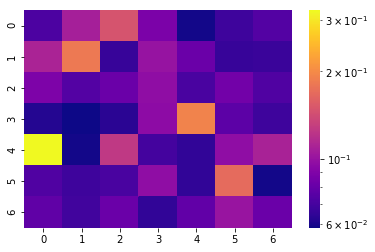

[[0.072 0.108 0.148 0.088 0.059 0.068 0.074]
 [0.111 0.183 0.066 0.1   0.082 0.066 0.067]
 [0.089 0.074 0.082 0.097 0.071 0.085 0.073]
 [0.062 0.058 0.063 0.096 0.193 0.077 0.068]
 [0.324 0.059 0.126 0.07  0.065 0.097 0.11 ]
 [0.073 0.068 0.071 0.097 0.065 0.169 0.059]
 [0.078 0.069 0.082 0.065 0.079 0.101 0.082]]


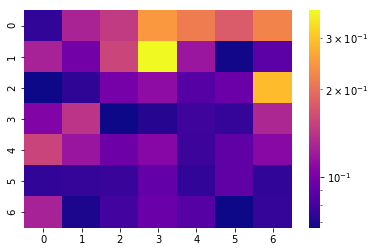

[[0.075 0.128 0.147 0.247 0.215 0.178 0.223]
 [0.126 0.098 0.157 0.373 0.118 0.068 0.089]
 [0.067 0.074 0.1   0.111 0.087 0.095 0.29 ]
 [0.105 0.142 0.067 0.072 0.079 0.076 0.131]
 [0.155 0.117 0.096 0.107 0.078 0.09  0.108]
 [0.075 0.076 0.077 0.092 0.075 0.09  0.075]
 [0.126 0.07  0.08  0.094 0.087 0.067 0.076]]


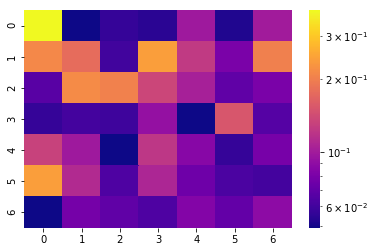

[[0.381 0.049 0.057 0.054 0.099 0.052 0.1  ]
 [0.212 0.177 0.06  0.24  0.125 0.08  0.202]
 [0.067 0.215 0.203 0.136 0.104 0.07  0.08 ]
 [0.057 0.061 0.059 0.093 0.049 0.152 0.066]
 [0.132 0.099 0.049 0.122 0.086 0.057 0.079]
 [0.24  0.111 0.064 0.108 0.075 0.063 0.061]
 [0.049 0.078 0.07  0.064 0.084 0.071 0.089]]


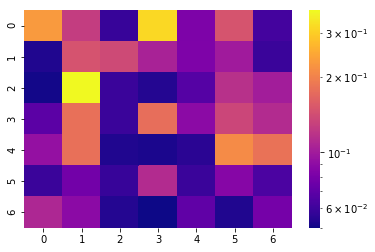

[[0.23  0.127 0.058 0.318 0.082 0.149 0.062]
 [0.053 0.148 0.139 0.105 0.083 0.1   0.059]
 [0.051 0.369 0.059 0.054 0.067 0.117 0.101]
 [0.069 0.179 0.059 0.176 0.089 0.135 0.112]
 [0.093 0.179 0.053 0.052 0.055 0.211 0.182]
 [0.059 0.078 0.058 0.112 0.059 0.086 0.064]
 [0.109 0.089 0.054 0.05  0.071 0.053 0.079]]
SKIPPPPPPEDDDD


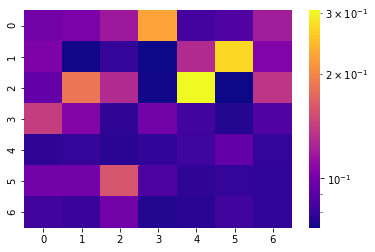

[[0.099 0.102 0.117 0.225 0.084 0.088 0.12 ]
 [0.103 0.073 0.08  0.072 0.128 0.274 0.104]
 [0.094 0.186 0.128 0.073 0.305 0.072 0.136]
 [0.142 0.106 0.078 0.099 0.083 0.076 0.088]
 [0.078 0.08  0.077 0.079 0.082 0.094 0.08 ]
 [0.099 0.099 0.158 0.087 0.078 0.08  0.079]
 [0.083 0.081 0.099 0.076 0.077 0.083 0.079]]


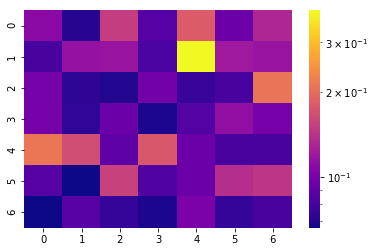

[[0.109 0.071 0.151 0.086 0.182 0.095 0.132]
 [0.081 0.115 0.117 0.082 0.39  0.121 0.117]
 [0.099 0.073 0.07  0.098 0.076 0.081 0.209]
 [0.1   0.074 0.095 0.069 0.085 0.113 0.1  ]
 [0.212 0.167 0.089 0.178 0.095 0.081 0.081]
 [0.086 0.066 0.155 0.084 0.095 0.137 0.144]
 [0.066 0.087 0.075 0.069 0.101 0.075 0.081]]


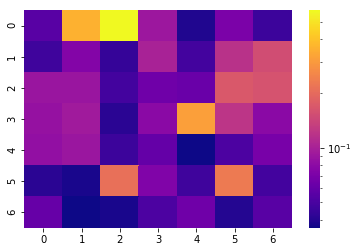

[[0.055 0.356 0.577 0.091 0.039 0.071 0.046]
 [0.047 0.075 0.044 0.101 0.048 0.118 0.153]
 [0.089 0.089 0.048 0.065 0.062 0.171 0.162]
 [0.086 0.094 0.041 0.079 0.313 0.122 0.079]
 [0.084 0.09  0.046 0.06  0.036 0.051 0.069]
 [0.041 0.038 0.211 0.073 0.047 0.231 0.048]
 [0.061 0.036 0.038 0.051 0.065 0.04  0.055]]


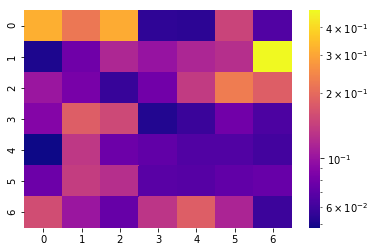

[[0.318 0.22  0.31  0.055 0.054 0.148 0.066]
 [0.051 0.078 0.117 0.1   0.116 0.125 0.479]
 [0.103 0.083 0.057 0.079 0.138 0.228 0.182]
 [0.089 0.182 0.154 0.052 0.058 0.079 0.064]
 [0.048 0.134 0.077 0.072 0.066 0.066 0.061]
 [0.077 0.141 0.125 0.069 0.068 0.072 0.075]
 [0.16  0.103 0.074 0.132 0.182 0.115 0.059]]


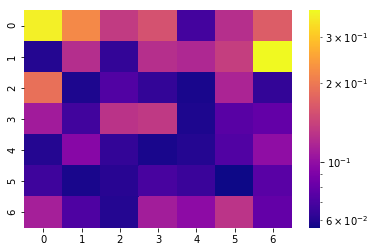

[[0.366 0.221 0.135 0.157 0.069 0.124 0.169]
 [0.06  0.123 0.064 0.124 0.119 0.138 0.38 ]
 [0.19  0.059 0.073 0.064 0.058 0.116 0.064]
 [0.109 0.068 0.128 0.133 0.059 0.075 0.079]
 [0.06  0.095 0.064 0.058 0.06  0.073 0.099]
 [0.067 0.058 0.061 0.07  0.066 0.056 0.076]
 [0.112 0.072 0.06  0.11  0.098 0.129 0.079]]


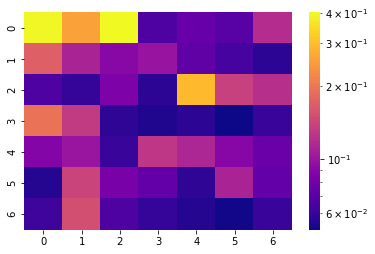

[[0.397 0.257 0.401 0.067 0.076 0.07  0.118]
 [0.17  0.111 0.091 0.099 0.073 0.064 0.057]
 [0.067 0.059 0.085 0.057 0.293 0.137 0.121]
 [0.193 0.131 0.058 0.054 0.057 0.051 0.06 ]
 [0.088 0.1   0.06  0.127 0.113 0.089 0.077]
 [0.055 0.14  0.083 0.075 0.058 0.111 0.074]
 [0.062 0.152 0.067 0.059 0.055 0.052 0.06 ]]


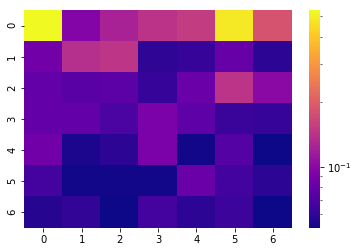

[[0.529 0.096 0.124 0.141 0.152 0.485 0.183]
 [0.086 0.136 0.144 0.06  0.062 0.081 0.059]
 [0.08  0.075 0.076 0.062 0.083 0.143 0.1  ]
 [0.08  0.08  0.069 0.092 0.077 0.063 0.062]
 [0.086 0.055 0.059 0.092 0.053 0.073 0.052]
 [0.067 0.053 0.053 0.053 0.082 0.066 0.059]
 [0.057 0.061 0.052 0.067 0.059 0.064 0.052]]


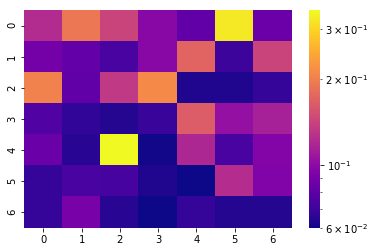

[[0.122 0.192 0.142 0.098 0.082 0.327 0.086]
 [0.089 0.083 0.074 0.098 0.172 0.07  0.142]
 [0.203 0.082 0.133 0.212 0.063 0.063 0.068]
 [0.076 0.067 0.064 0.069 0.165 0.104 0.114]
 [0.085 0.065 0.349 0.061 0.119 0.074 0.096]
 [0.068 0.074 0.073 0.063 0.06  0.123 0.094]
 [0.068 0.091 0.065 0.06  0.068 0.064 0.064]]


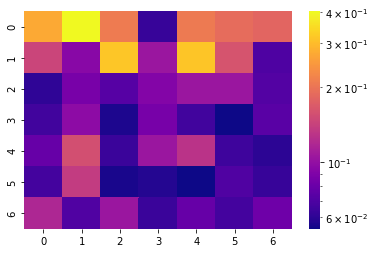

[[0.273 0.403 0.21  0.063 0.208 0.19  0.181]
 [0.146 0.095 0.317 0.105 0.314 0.161 0.07 ]
 [0.061 0.087 0.073 0.092 0.105 0.105 0.072]
 [0.066 0.097 0.057 0.086 0.066 0.054 0.074]
 [0.079 0.156 0.064 0.105 0.129 0.065 0.06 ]
 [0.067 0.137 0.056 0.058 0.054 0.071 0.063]
 [0.118 0.071 0.105 0.064 0.079 0.067 0.082]]


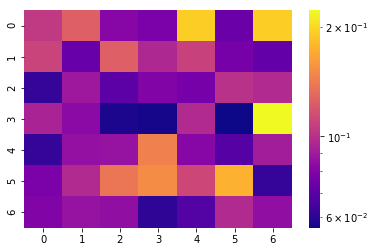

[[0.105 0.125 0.082 0.078 0.193 0.074 0.193]
 [0.11  0.073 0.125 0.096 0.109 0.077 0.072]
 [0.062 0.089 0.07  0.08  0.077 0.101 0.097]
 [0.094 0.083 0.058 0.057 0.097 0.056 0.222]
 [0.062 0.086 0.087 0.145 0.082 0.069 0.091]
 [0.078 0.097 0.139 0.152 0.112 0.175 0.062]
 [0.08  0.087 0.085 0.061 0.068 0.097 0.085]]


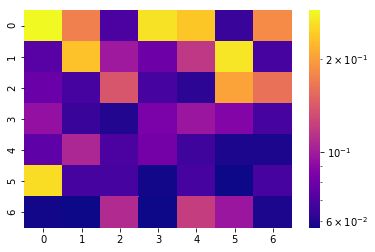

[[0.286 0.173 0.07  0.262 0.236 0.065 0.182]
 [0.073 0.232 0.099 0.08  0.117 0.266 0.068]
 [0.079 0.068 0.139 0.068 0.062 0.203 0.161]
 [0.094 0.065 0.06  0.084 0.097 0.087 0.068]
 [0.075 0.106 0.07  0.082 0.066 0.059 0.059]
 [0.258 0.068 0.068 0.058 0.068 0.057 0.068]
 [0.058 0.057 0.109 0.057 0.122 0.097 0.059]]


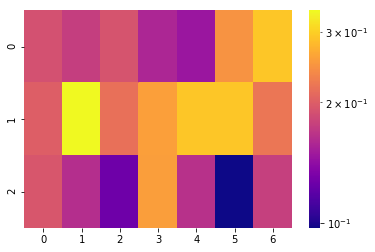

[[0.189 0.175 0.192 0.157 0.147 0.247 0.293]
 [0.201 0.34  0.216 0.258 0.293 0.293 0.222]
 [0.194 0.163 0.126 0.256 0.165 0.097 0.176]]


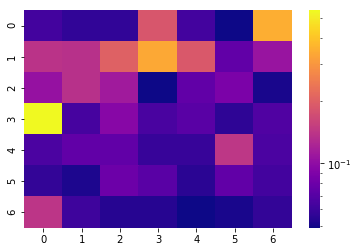

[[0.063 0.057 0.057 0.185 0.063 0.049 0.352]
 [0.139 0.136 0.202 0.339 0.189 0.075 0.106]
 [0.104 0.136 0.113 0.049 0.075 0.088 0.051]
 [0.543 0.064 0.095 0.065 0.072 0.056 0.068]
 [0.066 0.075 0.075 0.059 0.059 0.143 0.066]
 [0.058 0.052 0.08  0.072 0.055 0.075 0.063]
 [0.141 0.061 0.054 0.054 0.049 0.051 0.058]]


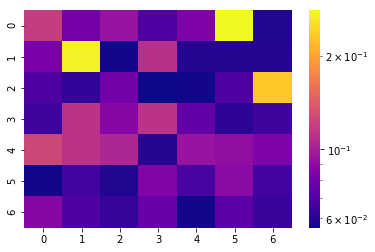

[[0.119 0.081 0.094 0.069 0.084 0.28  0.059]
 [0.082 0.272 0.057 0.111 0.06  0.06  0.06 ]
 [0.069 0.062 0.08  0.056 0.057 0.069 0.233]
 [0.065 0.112 0.087 0.112 0.075 0.061 0.065]
 [0.125 0.112 0.105 0.06  0.094 0.091 0.084]
 [0.057 0.066 0.059 0.085 0.068 0.089 0.066]
 [0.087 0.069 0.063 0.077 0.057 0.073 0.064]]


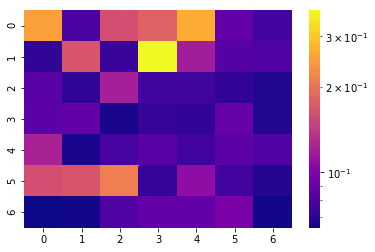

[[0.251 0.08  0.162 0.179 0.268 0.088 0.077]
 [0.072 0.168 0.074 0.37  0.119 0.083 0.081]
 [0.084 0.071 0.121 0.076 0.076 0.072 0.068]
 [0.085 0.088 0.066 0.073 0.072 0.089 0.068]
 [0.123 0.066 0.079 0.084 0.077 0.085 0.081]
 [0.162 0.168 0.212 0.073 0.108 0.077 0.069]
 [0.064 0.065 0.081 0.088 0.088 0.097 0.065]]


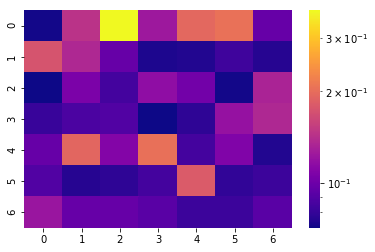

[[0.072 0.145 0.37  0.124 0.195 0.205 0.097]
 [0.174 0.136 0.097 0.074 0.075 0.083 0.076]
 [0.071 0.106 0.085 0.116 0.102 0.072 0.132]
 [0.081 0.087 0.089 0.071 0.078 0.119 0.136]
 [0.097 0.193 0.11  0.204 0.085 0.108 0.075]
 [0.089 0.076 0.078 0.085 0.182 0.079 0.082]
 [0.122 0.097 0.097 0.092 0.082 0.082 0.092]]


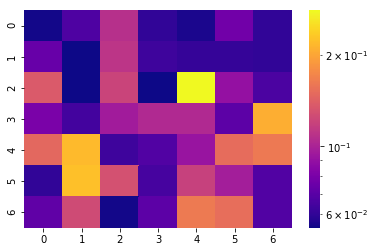

[[0.055 0.067 0.108 0.06  0.056 0.077 0.06 ]
 [0.074 0.054 0.111 0.063 0.061 0.061 0.06 ]
 [0.137 0.054 0.121 0.054 0.28  0.09  0.066]
 [0.08  0.064 0.096 0.104 0.104 0.071 0.207]
 [0.148 0.218 0.063 0.068 0.092 0.152 0.162]
 [0.06  0.224 0.13  0.065 0.119 0.097 0.068]
 [0.072 0.126 0.055 0.071 0.163 0.153 0.068]]


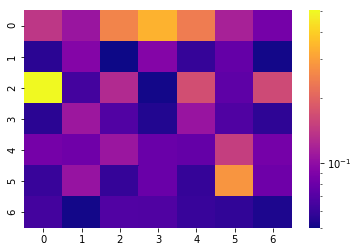

[[0.14  0.106 0.254 0.341 0.241 0.118 0.085]
 [0.056 0.093 0.05  0.093 0.059 0.077 0.051]
 [0.506 0.064 0.126 0.051 0.169 0.074 0.163]
 [0.056 0.108 0.069 0.054 0.105 0.068 0.057]
 [0.085 0.082 0.107 0.079 0.077 0.148 0.085]
 [0.06  0.104 0.059 0.079 0.059 0.285 0.081]
 [0.064 0.051 0.069 0.068 0.06  0.058 0.053]]


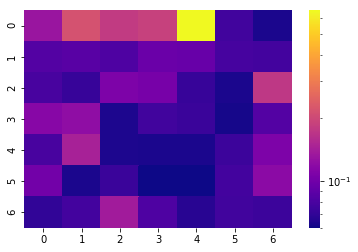

[[0.13  0.215 0.179 0.187 0.651 0.076 0.063]
 [0.084 0.087 0.082 0.097 0.095 0.078 0.077]
 [0.079 0.072 0.108 0.104 0.072 0.063 0.175]
 [0.116 0.122 0.064 0.076 0.073 0.062 0.084]
 [0.079 0.145 0.064 0.063 0.063 0.074 0.108]
 [0.102 0.063 0.073 0.06  0.06  0.077 0.119]
 [0.07  0.077 0.138 0.082 0.067 0.076 0.074]]


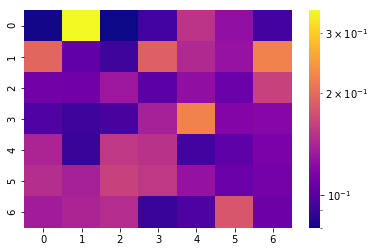

[[0.081 0.35  0.08  0.093 0.152 0.126 0.094]
 [0.196 0.104 0.092 0.189 0.144 0.128 0.223]
 [0.111 0.11  0.131 0.101 0.125 0.107 0.163]
 [0.098 0.092 0.095 0.137 0.223 0.119 0.12 ]
 [0.14  0.09  0.155 0.15  0.093 0.103 0.114]
 [0.147 0.137 0.163 0.155 0.127 0.107 0.112]
 [0.134 0.14  0.146 0.09  0.097 0.181 0.109]]


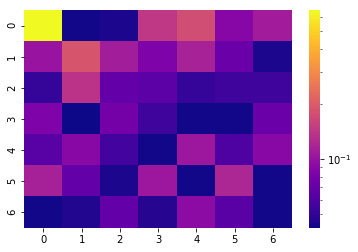

[[0.652 0.043 0.045 0.143 0.176 0.088 0.11 ]
 [0.102 0.19  0.111 0.084 0.115 0.073 0.045]
 [0.051 0.137 0.07  0.066 0.051 0.054 0.054]
 [0.084 0.042 0.078 0.054 0.043 0.043 0.072]
 [0.064 0.09  0.056 0.043 0.105 0.06  0.09 ]
 [0.114 0.069 0.045 0.105 0.043 0.12  0.043]
 [0.043 0.046 0.069 0.047 0.093 0.065 0.043]]


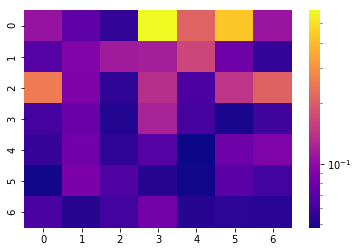

[[0.106 0.073 0.057 0.579 0.212 0.43  0.108]
 [0.069 0.091 0.114 0.117 0.166 0.081 0.057]
 [0.257 0.089 0.056 0.137 0.066 0.144 0.207]
 [0.063 0.079 0.052 0.12  0.063 0.05  0.061]
 [0.058 0.082 0.056 0.07  0.048 0.081 0.09 ]
 [0.049 0.088 0.067 0.053 0.049 0.071 0.062]
 [0.065 0.053 0.062 0.083 0.053 0.055 0.054]]


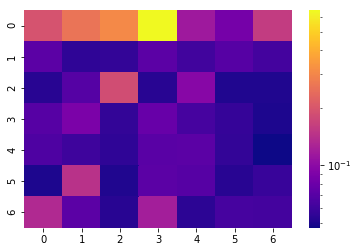

[[0.194 0.259 0.308 0.648 0.115 0.086 0.159]
 [0.072 0.055 0.056 0.072 0.061 0.07  0.062]
 [0.053 0.069 0.184 0.053 0.097 0.051 0.051]
 [0.07  0.089 0.056 0.078 0.063 0.057 0.05 ]
 [0.066 0.06  0.055 0.071 0.072 0.056 0.047]
 [0.05  0.144 0.051 0.072 0.07  0.053 0.058]
 [0.133 0.072 0.053 0.12  0.054 0.063 0.062]]


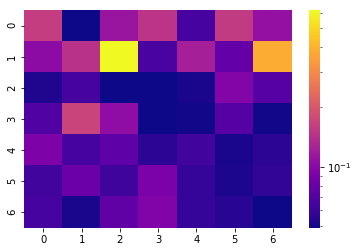

[[0.16  0.049 0.112 0.147 0.065 0.156 0.108]
 [0.102 0.144 0.616 0.066 0.122 0.078 0.385]
 [0.053 0.065 0.049 0.049 0.051 0.096 0.072]
 [0.069 0.169 0.104 0.049 0.05  0.072 0.05 ]
 [0.092 0.065 0.075 0.056 0.063 0.051 0.056]
 [0.063 0.082 0.062 0.09  0.059 0.052 0.058]
 [0.065 0.051 0.076 0.094 0.059 0.055 0.049]]


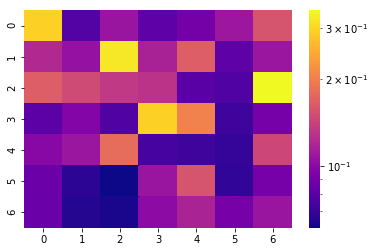

[[0.292 0.078 0.107 0.082 0.09  0.109 0.157]
 [0.121 0.105 0.321 0.116 0.166 0.082 0.108]
 [0.166 0.148 0.133 0.129 0.08  0.077 0.344]
 [0.081 0.096 0.077 0.291 0.202 0.072 0.091]
 [0.099 0.108 0.181 0.074 0.072 0.069 0.145]
 [0.087 0.067 0.061 0.107 0.157 0.068 0.091]
 [0.086 0.065 0.063 0.101 0.117 0.091 0.107]]


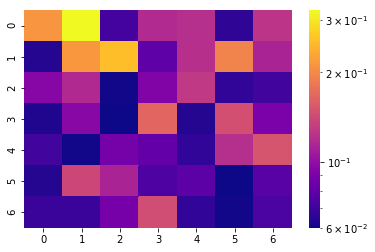

[[0.213 0.323 0.072 0.118 0.121 0.066 0.125]
 [0.064 0.214 0.256 0.08  0.122 0.194 0.113]
 [0.095 0.117 0.061 0.093 0.128 0.067 0.071]
 [0.063 0.096 0.06  0.166 0.064 0.146 0.09 ]
 [0.071 0.061 0.088 0.082 0.067 0.121 0.15 ]
 [0.064 0.14  0.113 0.075 0.079 0.06  0.078]
 [0.069 0.069 0.089 0.144 0.067 0.061 0.074]]


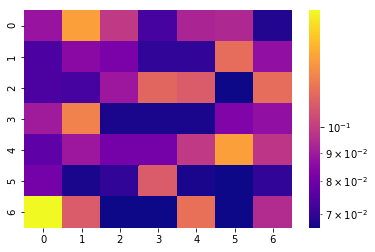

[[0.088 0.133 0.099 0.073 0.093 0.094 0.068]
 [0.074 0.085 0.082 0.07  0.07  0.116 0.087]
 [0.074 0.073 0.089 0.114 0.11  0.066 0.116]
 [0.09  0.123 0.067 0.067 0.067 0.083 0.087]
 [0.077 0.089 0.081 0.081 0.099 0.133 0.098]
 [0.081 0.067 0.07  0.11  0.067 0.066 0.07 ]
 [0.162 0.11  0.066 0.066 0.117 0.066 0.095]]


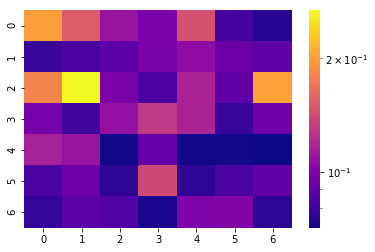

[[0.199 0.153 0.109 0.098 0.145 0.082 0.075]
 [0.079 0.083 0.088 0.097 0.105 0.093 0.089]
 [0.18  0.268 0.098 0.084 0.117 0.09  0.202]
 [0.096 0.081 0.107 0.129 0.117 0.079 0.094]
 [0.116 0.109 0.072 0.092 0.072 0.072 0.071]
 [0.083 0.093 0.077 0.14  0.077 0.083 0.09 ]
 [0.078 0.088 0.086 0.073 0.099 0.1   0.077]]


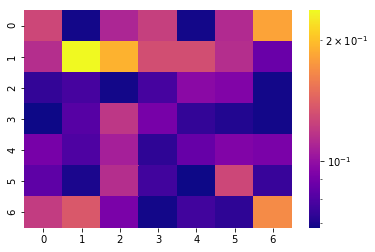

[[0.127 0.069 0.11  0.123 0.069 0.112 0.183]
 [0.114 0.237 0.192 0.131 0.131 0.114 0.087]
 [0.074 0.078 0.069 0.078 0.097 0.094 0.069]
 [0.068 0.082 0.118 0.091 0.074 0.071 0.069]
 [0.091 0.08  0.107 0.073 0.086 0.094 0.092]
 [0.084 0.07  0.114 0.077 0.068 0.127 0.075]
 [0.121 0.137 0.092 0.069 0.077 0.073 0.167]]


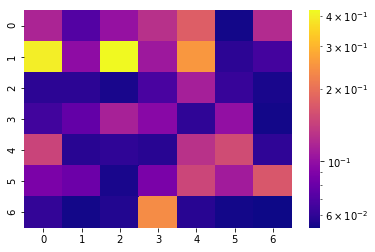

[[0.117 0.071 0.102 0.128 0.177 0.054 0.123]
 [0.401 0.098 0.423 0.107 0.254 0.059 0.066]
 [0.059 0.059 0.055 0.068 0.112 0.062 0.055]
 [0.065 0.077 0.114 0.095 0.06  0.1   0.054]
 [0.147 0.058 0.06  0.058 0.129 0.155 0.06 ]
 [0.088 0.081 0.055 0.087 0.149 0.11  0.169]
 [0.061 0.054 0.057 0.239 0.058 0.054 0.053]]


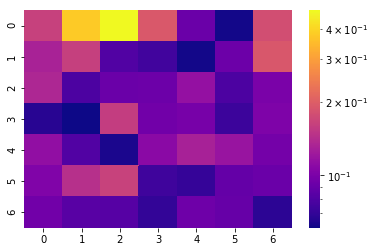

[[0.163 0.378 0.475 0.192 0.092 0.062 0.18 ]
 [0.131 0.161 0.081 0.075 0.062 0.093 0.191]
 [0.135 0.079 0.092 0.093 0.115 0.079 0.1  ]
 [0.067 0.061 0.159 0.095 0.098 0.073 0.102]
 [0.114 0.081 0.064 0.109 0.13  0.118 0.097]
 [0.103 0.145 0.164 0.074 0.071 0.089 0.092]
 [0.095 0.084 0.083 0.07  0.094 0.09  0.068]]


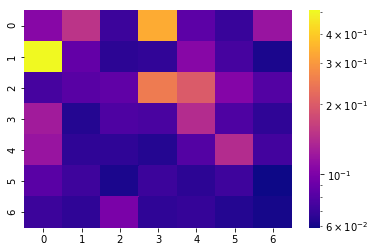

[[0.107 0.151 0.071 0.337 0.084 0.07  0.118]
 [0.506 0.087 0.066 0.068 0.107 0.075 0.062]
 [0.075 0.082 0.086 0.252 0.2   0.105 0.08 ]
 [0.125 0.064 0.078 0.076 0.142 0.078 0.067]
 [0.118 0.067 0.067 0.064 0.08  0.142 0.074]
 [0.083 0.072 0.062 0.071 0.066 0.072 0.059]
 [0.071 0.067 0.099 0.067 0.069 0.064 0.061]]


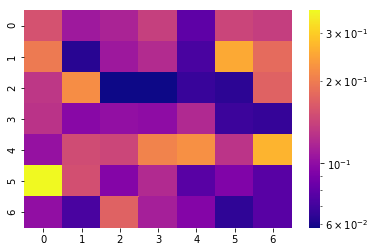

[[0.156 0.109 0.116 0.139 0.079 0.144 0.138]
 [0.198 0.063 0.108 0.122 0.072 0.255 0.182]
 [0.131 0.221 0.058 0.058 0.067 0.064 0.172]
 [0.128 0.097 0.102 0.1   0.12  0.068 0.066]
 [0.103 0.15  0.145 0.208 0.225 0.129 0.269]
 [0.364 0.153 0.095 0.121 0.077 0.093 0.077]
 [0.101 0.072 0.172 0.113 0.095 0.065 0.077]]


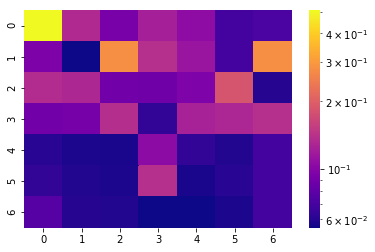

[[0.506 0.133 0.093 0.123 0.106 0.07  0.072]
 [0.095 0.055 0.279 0.139 0.113 0.07  0.279]
 [0.135 0.13  0.089 0.088 0.096 0.184 0.06 ]
 [0.089 0.092 0.137 0.064 0.125 0.129 0.139]
 [0.061 0.058 0.057 0.105 0.064 0.059 0.07 ]
 [0.064 0.059 0.058 0.139 0.057 0.061 0.07 ]
 [0.077 0.06  0.059 0.055 0.055 0.058 0.07 ]]


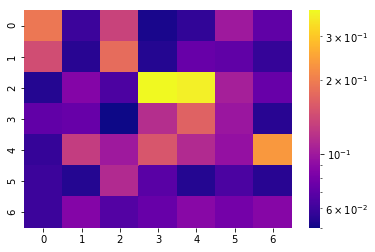

[[0.192 0.06  0.135 0.052 0.057 0.1   0.071]
 [0.144 0.055 0.179 0.054 0.074 0.071 0.058]
 [0.054 0.086 0.065 0.383 0.368 0.104 0.074]
 [0.072 0.074 0.05  0.116 0.167 0.098 0.055]
 [0.058 0.129 0.1   0.154 0.113 0.094 0.234]
 [0.06  0.054 0.113 0.069 0.054 0.064 0.055]
 [0.06  0.086 0.067 0.074 0.088 0.079 0.087]]


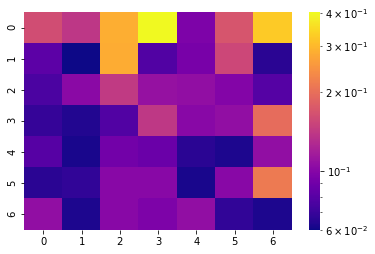

[[0.162 0.139 0.285 0.402 0.096 0.171 0.325]
 [0.082 0.06  0.283 0.078 0.094 0.156 0.066]
 [0.076 0.103 0.143 0.109 0.107 0.099 0.079]
 [0.069 0.064 0.078 0.141 0.102 0.107 0.198]
 [0.08  0.062 0.091 0.088 0.066 0.063 0.107]
 [0.066 0.068 0.102 0.102 0.062 0.102 0.214]
 [0.107 0.063 0.102 0.096 0.107 0.068 0.063]]


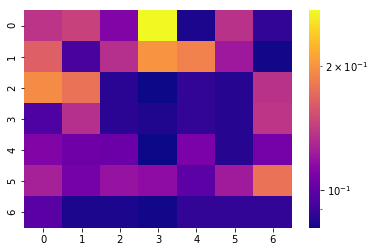

[[0.137 0.145 0.111 0.272 0.083 0.136 0.088]
 [0.164 0.093 0.134 0.2   0.188 0.122 0.082]
 [0.195 0.177 0.086 0.081 0.088 0.085 0.136]
 [0.095 0.134 0.086 0.084 0.088 0.085 0.138]
 [0.111 0.105 0.104 0.081 0.109 0.085 0.107]
 [0.126 0.107 0.119 0.116 0.099 0.123 0.177]
 [0.098 0.083 0.083 0.082 0.088 0.088 0.088]]


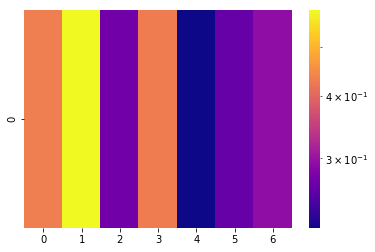

[[0.432 0.593 0.271 0.43  0.218 0.263 0.294]]


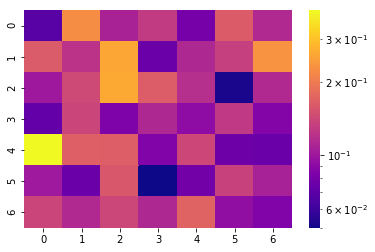

[[0.069 0.224 0.108 0.129 0.081 0.163 0.113]
 [0.162 0.122 0.259 0.076 0.112 0.133 0.233]
 [0.1   0.143 0.264 0.164 0.118 0.052 0.113]
 [0.073 0.138 0.084 0.112 0.092 0.127 0.087]
 [0.393 0.167 0.165 0.085 0.141 0.077 0.075]
 [0.101 0.076 0.158 0.05  0.079 0.135 0.107]
 [0.138 0.113 0.14  0.112 0.171 0.093 0.085]]


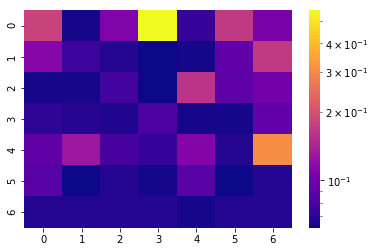

[[0.18  0.064 0.108 0.558 0.073 0.168 0.104]
 [0.114 0.075 0.067 0.062 0.064 0.092 0.168]
 [0.064 0.064 0.078 0.062 0.162 0.09  0.1  ]
 [0.071 0.068 0.066 0.082 0.064 0.064 0.093]
 [0.091 0.129 0.08  0.073 0.111 0.067 0.306]
 [0.087 0.062 0.067 0.064 0.087 0.062 0.067]
 [0.067 0.067 0.067 0.067 0.064 0.067 0.067]]


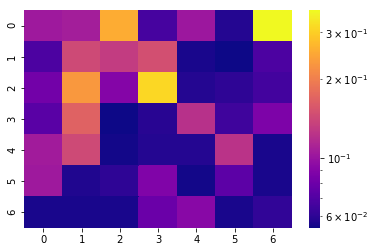

[[0.104 0.107 0.256 0.067 0.102 0.058 0.364]
 [0.069 0.143 0.131 0.148 0.056 0.054 0.069]
 [0.082 0.231 0.09  0.313 0.058 0.06  0.066]
 [0.073 0.167 0.054 0.059 0.121 0.065 0.087]
 [0.105 0.143 0.055 0.058 0.058 0.123 0.056]
 [0.104 0.057 0.06  0.088 0.055 0.074 0.056]
 [0.056 0.056 0.056 0.079 0.092 0.056 0.061]]


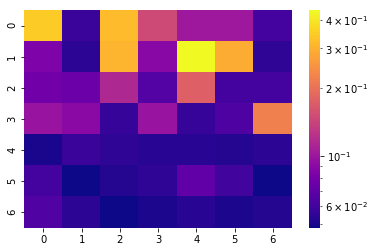

[[0.349 0.058 0.32  0.149 0.102 0.102 0.061]
 [0.084 0.054 0.306 0.089 0.442 0.293 0.055]
 [0.078 0.076 0.115 0.066 0.175 0.061 0.061]
 [0.098 0.09  0.057 0.098 0.057 0.064 0.221]
 [0.05  0.058 0.055 0.053 0.053 0.052 0.054]
 [0.061 0.048 0.052 0.055 0.071 0.06  0.048]
 [0.065 0.054 0.048 0.051 0.053 0.051 0.052]]


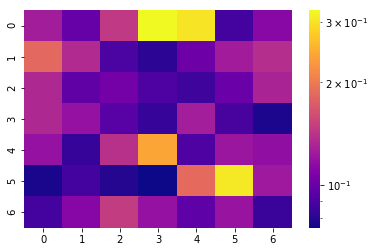

[[0.126 0.099 0.145 0.325 0.302 0.088 0.113]
 [0.184 0.135 0.09  0.081 0.102 0.125 0.137]
 [0.133 0.097 0.104 0.091 0.086 0.1   0.13 ]
 [0.133 0.119 0.094 0.084 0.127 0.089 0.078]
 [0.119 0.084 0.14  0.24  0.091 0.122 0.117]
 [0.077 0.088 0.079 0.075 0.186 0.307 0.124]
 [0.088 0.112 0.148 0.119 0.096 0.12  0.085]]


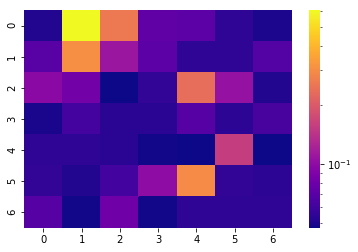

[[0.051 0.607 0.258 0.073 0.072 0.055 0.05 ]
 [0.07  0.306 0.109 0.072 0.055 0.055 0.068]
 [0.097 0.083 0.047 0.056 0.237 0.105 0.051]
 [0.049 0.062 0.053 0.053 0.069 0.054 0.063]
 [0.055 0.055 0.053 0.048 0.047 0.156 0.047]
 [0.056 0.051 0.061 0.1   0.296 0.056 0.054]
 [0.069 0.048 0.081 0.048 0.055 0.055 0.055]]


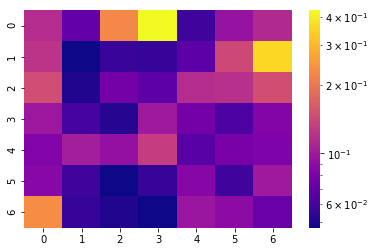

[[0.116 0.07  0.226 0.427 0.058 0.095 0.113]
 [0.123 0.047 0.056 0.055 0.067 0.143 0.361]
 [0.149 0.05  0.077 0.068 0.116 0.12  0.15 ]
 [0.098 0.06  0.051 0.1   0.077 0.062 0.085]
 [0.083 0.103 0.093 0.132 0.066 0.079 0.082]
 [0.087 0.058 0.047 0.055 0.086 0.058 0.1  ]
 [0.234 0.055 0.05  0.047 0.097 0.089 0.073]]


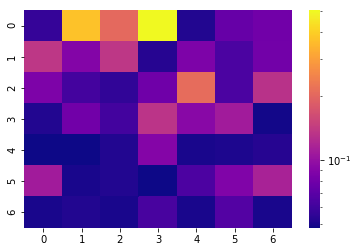

[[0.057 0.373 0.204 0.506 0.052 0.075 0.08 ]
 [0.137 0.089 0.137 0.053 0.086 0.064 0.081]
 [0.086 0.062 0.056 0.079 0.21  0.064 0.132]
 [0.052 0.08  0.061 0.134 0.093 0.109 0.049]
 [0.048 0.048 0.052 0.09  0.05  0.051 0.053]
 [0.109 0.05  0.052 0.048 0.065 0.088 0.116]
 [0.05  0.052 0.05  0.063 0.05  0.067 0.05 ]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


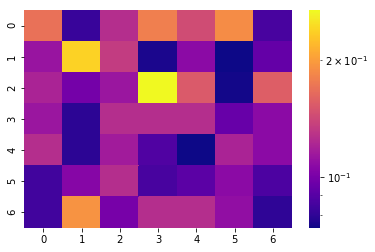

[[0.169 0.082 0.126 0.179 0.144 0.188 0.086]
 [0.112 0.238 0.134 0.076 0.107 0.074 0.094]
 [0.12  0.099 0.113 0.268 0.153 0.075 0.156]
 [0.113 0.079 0.126 0.126 0.126 0.095 0.107]
 [0.126 0.079 0.116 0.088 0.074 0.12  0.107]
 [0.084 0.105 0.126 0.086 0.091 0.107 0.087]
 [0.084 0.193 0.1   0.126 0.126 0.109 0.08 ]]


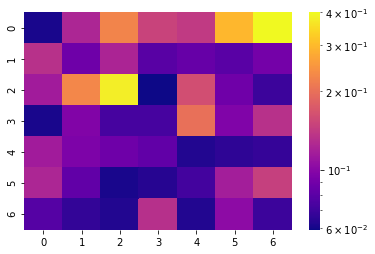

[[0.061 0.123 0.226 0.15  0.141 0.295 0.4  ]
 [0.133 0.088 0.122 0.079 0.085 0.08  0.091]
 [0.115 0.23  0.382 0.059 0.161 0.089 0.07 ]
 [0.061 0.097 0.073 0.073 0.201 0.096 0.133]
 [0.115 0.095 0.088 0.083 0.063 0.066 0.068]
 [0.123 0.083 0.061 0.064 0.072 0.117 0.146]
 [0.078 0.067 0.063 0.132 0.063 0.103 0.07 ]]


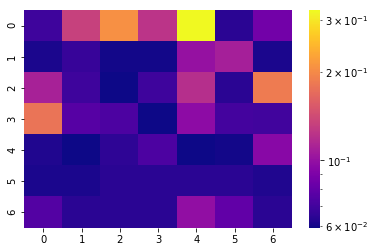

[[0.069 0.133 0.207 0.124 0.324 0.064 0.086]
 [0.061 0.067 0.06  0.06  0.101 0.109 0.061]
 [0.111 0.069 0.059 0.069 0.12  0.064 0.186]
 [0.179 0.076 0.073 0.059 0.097 0.071 0.07 ]
 [0.062 0.059 0.065 0.073 0.059 0.06  0.095]
 [0.061 0.061 0.064 0.064 0.064 0.064 0.062]
 [0.075 0.064 0.064 0.064 0.099 0.08  0.064]]


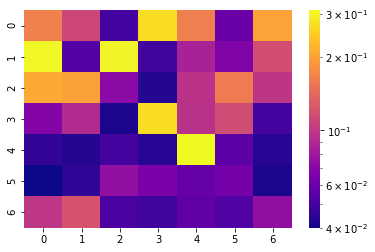

[[0.164 0.112 0.05  0.27  0.162 0.06  0.201]
 [0.305 0.054 0.3   0.049 0.085 0.068 0.117]
 [0.206 0.199 0.072 0.043 0.097 0.158 0.098]
 [0.069 0.091 0.042 0.269 0.096 0.115 0.05 ]
 [0.046 0.043 0.05  0.044 0.309 0.056 0.044]
 [0.04  0.045 0.075 0.066 0.059 0.064 0.042]
 [0.099 0.121 0.052 0.049 0.057 0.053 0.074]]


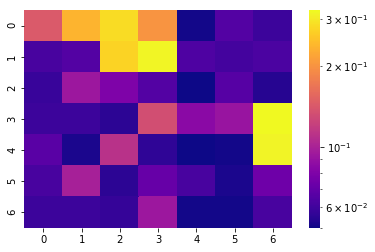

[[0.143 0.237 0.283 0.201 0.051 0.065 0.059]
 [0.062 0.065 0.274 0.317 0.064 0.061 0.063]
 [0.058 0.093 0.08  0.065 0.05  0.066 0.054]
 [0.059 0.059 0.055 0.133 0.085 0.091 0.322]
 [0.067 0.052 0.111 0.056 0.05  0.051 0.314]
 [0.062 0.099 0.055 0.071 0.062 0.052 0.074]
 [0.059 0.059 0.057 0.093 0.051 0.051 0.062]]


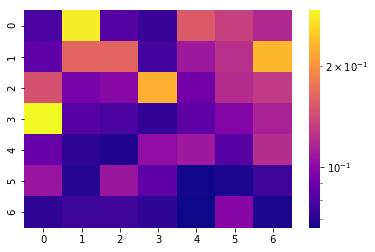

[[0.079 0.281 0.082 0.075 0.153 0.134 0.119]
 [0.085 0.162 0.162 0.077 0.11  0.124 0.231]
 [0.147 0.094 0.1   0.225 0.091 0.121 0.129]
 [0.293 0.083 0.079 0.073 0.085 0.097 0.115]
 [0.088 0.072 0.069 0.103 0.11  0.083 0.122]
 [0.107 0.07  0.108 0.085 0.067 0.068 0.076]
 [0.072 0.076 0.076 0.072 0.066 0.099 0.068]]


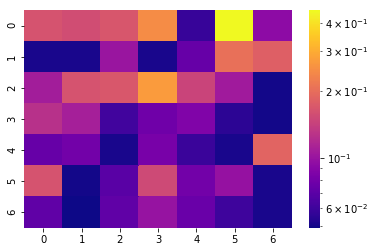

[[0.163 0.156 0.168 0.246 0.058 0.455 0.094]
 [0.051 0.051 0.101 0.051 0.075 0.203 0.18 ]
 [0.108 0.164 0.17  0.272 0.146 0.106 0.05 ]
 [0.126 0.11  0.061 0.079 0.087 0.055 0.05 ]
 [0.075 0.08  0.051 0.083 0.059 0.051 0.187]
 [0.163 0.05  0.07  0.152 0.08  0.099 0.051]
 [0.072 0.049 0.072 0.1   0.076 0.06  0.051]]


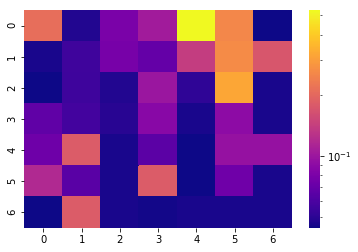

[[0.211 0.048 0.08  0.105 0.527 0.257 0.044]
 [0.046 0.056 0.078 0.07  0.14  0.263 0.173]
 [0.044 0.055 0.048 0.1   0.051 0.319 0.046]
 [0.068 0.057 0.049 0.088 0.046 0.091 0.046]
 [0.074 0.182 0.046 0.066 0.044 0.096 0.096]
 [0.118 0.065 0.046 0.182 0.044 0.075 0.046]
 [0.044 0.182 0.046 0.045 0.046 0.046 0.046]]


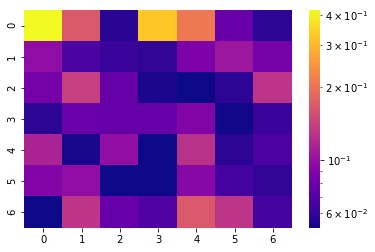

[[0.417 0.167 0.057 0.328 0.208 0.078 0.058]
 [0.097 0.067 0.062 0.06  0.087 0.104 0.084]
 [0.083 0.14  0.077 0.055 0.052 0.058 0.129]
 [0.058 0.079 0.077 0.077 0.089 0.053 0.062]
 [0.114 0.054 0.098 0.052 0.127 0.058 0.068]
 [0.09  0.097 0.052 0.052 0.093 0.065 0.06 ]
 [0.052 0.13  0.078 0.069 0.167 0.13  0.065]]


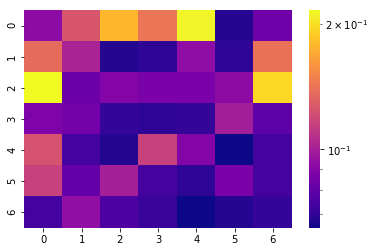

[[0.092 0.126 0.178 0.143 0.212 0.068 0.084]
 [0.137 0.102 0.068 0.07  0.093 0.07  0.14 ]
 [0.215 0.083 0.089 0.087 0.087 0.092 0.196]
 [0.088 0.085 0.071 0.07  0.071 0.099 0.079]
 [0.124 0.074 0.068 0.116 0.089 0.065 0.074]
 [0.116 0.081 0.1   0.074 0.07  0.087 0.074]
 [0.074 0.094 0.076 0.072 0.065 0.068 0.071]]


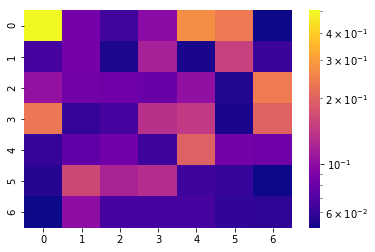

[[0.506 0.086 0.064 0.099 0.271 0.236 0.051]
 [0.066 0.087 0.054 0.118 0.053 0.153 0.062]
 [0.105 0.085 0.083 0.081 0.103 0.055 0.24 ]
 [0.233 0.06  0.066 0.135 0.144 0.053 0.199]
 [0.061 0.077 0.084 0.063 0.197 0.085 0.083]
 [0.056 0.163 0.121 0.131 0.063 0.061 0.051]
 [0.051 0.101 0.066 0.066 0.066 0.059 0.058]]


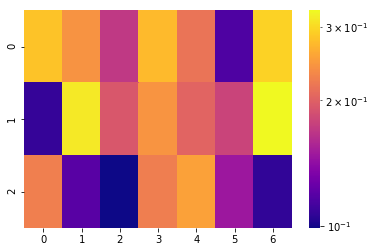

[[0.283 0.242 0.17  0.274 0.216 0.116 0.295]
 [0.108 0.314 0.193 0.243 0.203 0.178 0.329]
 [0.226 0.119 0.099 0.224 0.253 0.148 0.107]]


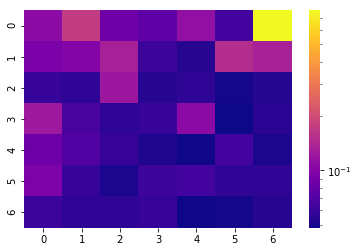

[[0.108 0.174 0.087 0.077 0.113 0.064 0.77 ]
 [0.094 0.101 0.132 0.061 0.054 0.151 0.133]
 [0.059 0.056 0.121 0.054 0.057 0.05  0.053]
 [0.124 0.066 0.057 0.059 0.106 0.048 0.055]
 [0.086 0.07  0.059 0.052 0.049 0.064 0.051]
 [0.096 0.059 0.051 0.061 0.064 0.056 0.057]
 [0.061 0.056 0.057 0.059 0.049 0.05  0.054]]


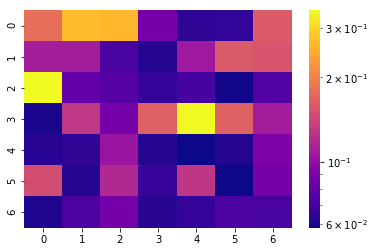

[[0.18  0.267 0.261 0.088 0.064 0.065 0.162]
 [0.11  0.11  0.072 0.062 0.107 0.16  0.155]
 [0.347 0.08  0.076 0.066 0.071 0.059 0.075]
 [0.06  0.129 0.087 0.166 0.347 0.166 0.109]
 [0.063 0.064 0.104 0.062 0.058 0.062 0.091]
 [0.148 0.062 0.118 0.067 0.128 0.058 0.087]
 [0.061 0.073 0.087 0.063 0.066 0.073 0.072]]


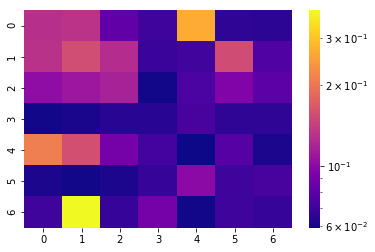

[[0.129 0.132 0.082 0.07  0.266 0.066 0.065]
 [0.131 0.156 0.126 0.069 0.071 0.154 0.076]
 [0.103 0.11  0.117 0.06  0.074 0.095 0.08 ]
 [0.06  0.061 0.064 0.064 0.073 0.066 0.066]
 [0.209 0.158 0.09  0.072 0.059 0.078 0.062]
 [0.062 0.06  0.062 0.068 0.101 0.07  0.073]
 [0.07  0.379 0.068 0.09  0.06  0.07  0.068]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


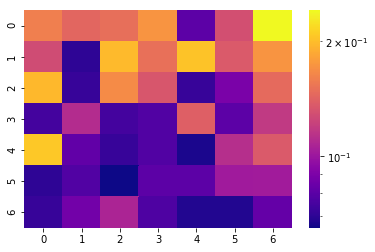

[[0.16  0.144 0.149 0.173 0.081 0.13  0.241]
 [0.128 0.07  0.198 0.15  0.204 0.136 0.173]
 [0.197 0.072 0.167 0.134 0.072 0.089 0.146]
 [0.075 0.111 0.075 0.078 0.14  0.081 0.118]
 [0.207 0.082 0.072 0.078 0.067 0.112 0.136]
 [0.07  0.078 0.065 0.081 0.081 0.102 0.103]
 [0.072 0.087 0.107 0.077 0.068 0.068 0.083]]


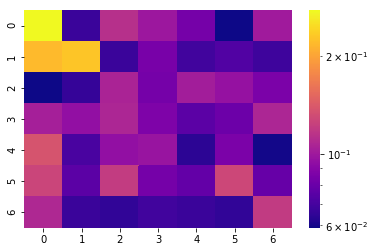

[[0.277 0.067 0.113 0.099 0.084 0.059 0.101]
 [0.219 0.229 0.067 0.085 0.069 0.073 0.068]
 [0.059 0.066 0.106 0.084 0.102 0.096 0.086]
 [0.103 0.095 0.107 0.087 0.076 0.081 0.107]
 [0.137 0.071 0.095 0.097 0.064 0.086 0.06 ]
 [0.127 0.076 0.121 0.084 0.078 0.128 0.079]
 [0.108 0.067 0.065 0.069 0.067 0.065 0.12 ]]


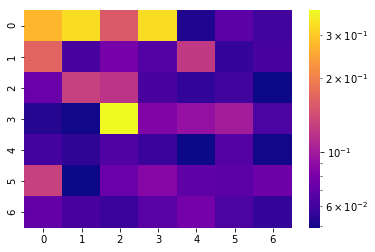

[[0.274 0.331 0.155 0.329 0.052 0.068 0.06 ]
 [0.167 0.062 0.079 0.066 0.124 0.057 0.062]
 [0.074 0.129 0.119 0.062 0.056 0.06  0.049]
 [0.053 0.05  0.377 0.083 0.092 0.1   0.063]
 [0.061 0.055 0.065 0.058 0.049 0.066 0.05 ]
 [0.13  0.049 0.074 0.086 0.07  0.069 0.075]
 [0.071 0.062 0.058 0.067 0.078 0.063 0.057]]


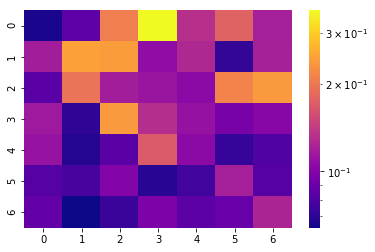

[[0.066 0.086 0.207 0.358 0.132 0.178 0.119]
 [0.118 0.246 0.241 0.107 0.126 0.072 0.12 ]
 [0.084 0.196 0.118 0.112 0.105 0.214 0.238]
 [0.115 0.071 0.238 0.13  0.11  0.096 0.103]
 [0.111 0.068 0.084 0.169 0.105 0.073 0.081]
 [0.083 0.078 0.101 0.069 0.076 0.119 0.083]
 [0.088 0.064 0.074 0.098 0.085 0.089 0.123]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


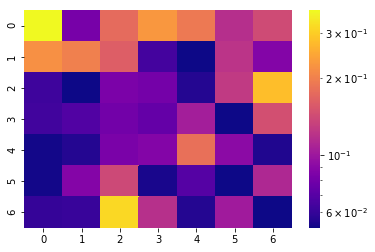

[[0.368 0.082 0.176 0.229 0.191 0.117 0.142]
 [0.219 0.201 0.162 0.064 0.052 0.122 0.087]
 [0.062 0.052 0.084 0.081 0.056 0.127 0.28 ]
 [0.063 0.068 0.08  0.075 0.105 0.052 0.146]
 [0.053 0.056 0.083 0.087 0.182 0.091 0.055]
 [0.053 0.088 0.14  0.054 0.069 0.052 0.112]
 [0.06  0.061 0.318 0.118 0.056 0.102 0.052]]
SKIPPPPPPEDDDD


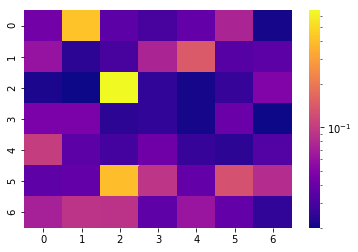

[[0.043 0.422 0.035 0.03  0.038 0.076 0.021]
 [0.061 0.024 0.03  0.076 0.144 0.034 0.035]
 [0.022 0.02  0.655 0.025 0.021 0.026 0.049]
 [0.047 0.046 0.024 0.025 0.021 0.04  0.02 ]
 [0.104 0.035 0.029 0.042 0.026 0.024 0.033]
 [0.036 0.038 0.397 0.093 0.038 0.13  0.083]
 [0.072 0.091 0.09  0.036 0.062 0.038 0.025]]


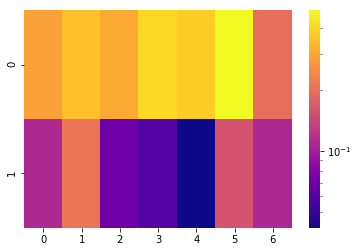

[[0.289 0.353 0.304 0.409 0.385 0.491 0.199]
 [0.11  0.209 0.07  0.06  0.042 0.159 0.11 ]]


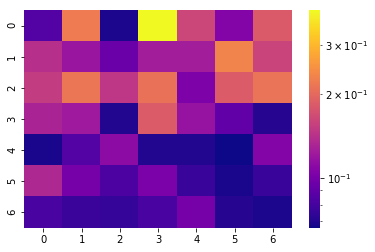

[[0.085 0.221 0.069 0.398 0.161 0.107 0.182]
 [0.14  0.119 0.095 0.125 0.125 0.231 0.159]
 [0.152 0.215 0.146 0.209 0.103 0.184 0.212]
 [0.13  0.122 0.07  0.184 0.117 0.091 0.071]
 [0.068 0.085 0.111 0.07  0.07  0.066 0.106]
 [0.134 0.1   0.083 0.102 0.076 0.068 0.076]
 [0.082 0.077 0.075 0.082 0.1   0.071 0.069]]
SKIPPPPPPEDDDD


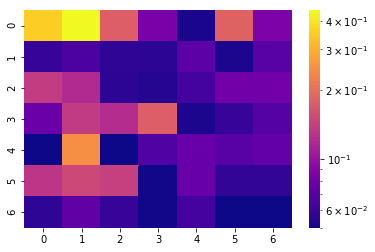

[[0.354 0.444 0.178 0.084 0.052 0.182 0.086]
 [0.059 0.066 0.057 0.056 0.072 0.053 0.07 ]
 [0.137 0.12  0.056 0.054 0.063 0.08  0.08 ]
 [0.077 0.136 0.122 0.178 0.053 0.059 0.069]
 [0.05  0.248 0.05  0.067 0.076 0.07  0.075]
 [0.131 0.151 0.141 0.051 0.076 0.058 0.058]
 [0.057 0.073 0.059 0.051 0.063 0.05  0.05 ]]


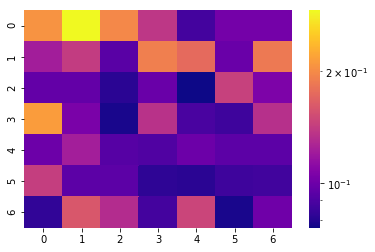

[[0.207 0.292 0.198 0.138 0.088 0.103 0.103]
 [0.122 0.142 0.094 0.191 0.175 0.099 0.186]
 [0.097 0.097 0.081 0.099 0.076 0.145 0.106]
 [0.215 0.105 0.078 0.135 0.089 0.086 0.134]
 [0.1   0.123 0.093 0.091 0.1   0.095 0.095]
 [0.143 0.095 0.095 0.082 0.081 0.086 0.087]
 [0.083 0.161 0.132 0.088 0.148 0.078 0.101]]


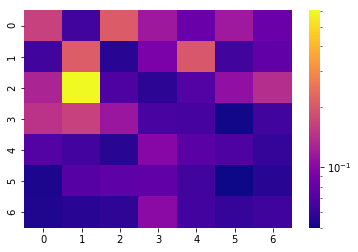

[[0.165 0.064 0.208 0.116 0.081 0.117 0.082]
 [0.064 0.209 0.056 0.091 0.199 0.064 0.078]
 [0.129 0.602 0.069 0.057 0.071 0.107 0.139]
 [0.147 0.164 0.114 0.067 0.066 0.051 0.064]
 [0.071 0.065 0.056 0.099 0.074 0.069 0.06 ]
 [0.053 0.073 0.076 0.078 0.064 0.05  0.056]
 [0.054 0.056 0.058 0.102 0.065 0.06  0.063]]
SKIPPPPPPEDDDD


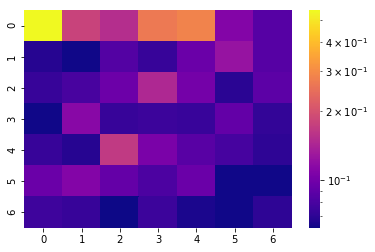

[[0.551 0.18  0.153 0.266 0.284 0.11  0.086]
 [0.068 0.063 0.085 0.073 0.096 0.124 0.086]
 [0.073 0.08  0.097 0.146 0.101 0.069 0.089]
 [0.063 0.114 0.073 0.075 0.074 0.092 0.072]
 [0.073 0.068 0.167 0.105 0.087 0.079 0.07 ]
 [0.096 0.11  0.093 0.082 0.096 0.063 0.063]
 [0.076 0.073 0.062 0.075 0.065 0.063 0.07 ]]


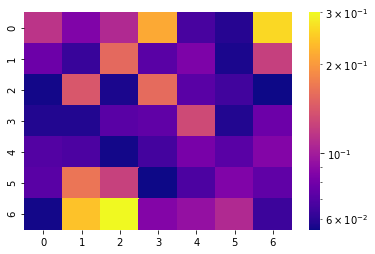

[[0.115 0.085 0.108 0.216 0.067 0.059 0.264]
 [0.078 0.063 0.156 0.072 0.084 0.057 0.123]
 [0.056 0.141 0.057 0.158 0.072 0.065 0.055]
 [0.058 0.058 0.072 0.074 0.131 0.058 0.078]
 [0.07  0.068 0.056 0.066 0.082 0.072 0.086]
 [0.072 0.167 0.124 0.055 0.068 0.085 0.074]
 [0.056 0.241 0.3   0.086 0.093 0.108 0.064]]


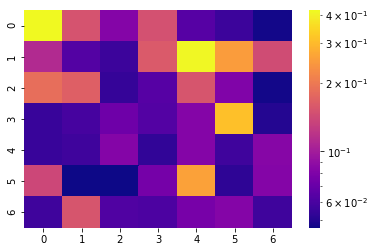

[[0.419 0.152 0.083 0.149 0.064 0.056 0.047]
 [0.111 0.063 0.056 0.16  0.413 0.253 0.144]
 [0.186 0.167 0.054 0.064 0.154 0.081 0.047]
 [0.055 0.059 0.073 0.063 0.083 0.311 0.05 ]
 [0.055 0.057 0.083 0.053 0.083 0.057 0.084]
 [0.139 0.046 0.046 0.076 0.259 0.052 0.083]
 [0.057 0.154 0.062 0.061 0.077 0.083 0.057]]


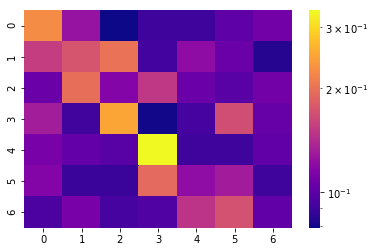

[[0.225 0.125 0.079 0.09  0.09  0.101 0.109]
 [0.155 0.174 0.201 0.092 0.121 0.106 0.084]
 [0.106 0.198 0.116 0.151 0.106 0.099 0.109]
 [0.132 0.091 0.25  0.08  0.093 0.168 0.104]
 [0.111 0.103 0.099 0.336 0.09  0.09  0.102]
 [0.116 0.089 0.089 0.192 0.122 0.131 0.09 ]
 [0.095 0.111 0.093 0.096 0.148 0.171 0.102]]


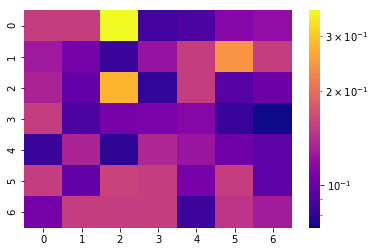

[[0.155 0.155 0.363 0.086 0.09  0.113 0.118]
 [0.126 0.105 0.083 0.122 0.155 0.241 0.155]
 [0.134 0.098 0.279 0.081 0.155 0.093 0.102]
 [0.155 0.089 0.106 0.107 0.113 0.083 0.073]
 [0.083 0.134 0.08  0.136 0.123 0.103 0.096]
 [0.155 0.098 0.159 0.155 0.106 0.155 0.096]
 [0.105 0.155 0.155 0.155 0.084 0.148 0.128]]


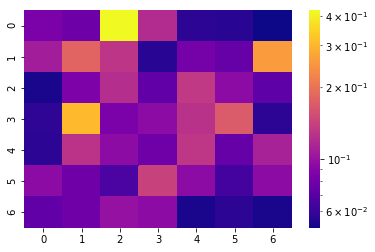

[[0.085 0.079 0.422 0.12  0.057 0.056 0.051]
 [0.108 0.181 0.129 0.056 0.083 0.076 0.258]
 [0.053 0.086 0.122 0.074 0.132 0.094 0.073]
 [0.058 0.306 0.085 0.094 0.126 0.169 0.057]
 [0.057 0.127 0.094 0.08  0.13  0.076 0.111]
 [0.094 0.08  0.066 0.141 0.094 0.064 0.094]
 [0.074 0.08  0.099 0.094 0.053 0.057 0.053]]


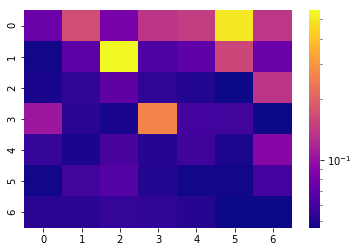

[[0.075 0.168 0.083 0.136 0.146 0.503 0.139]
 [0.047 0.069 0.553 0.063 0.07  0.158 0.075]
 [0.048 0.054 0.071 0.053 0.05  0.046 0.136]
 [0.106 0.052 0.048 0.264 0.06  0.059 0.046]
 [0.055 0.048 0.061 0.051 0.058 0.049 0.091]
 [0.047 0.059 0.066 0.05  0.047 0.047 0.06 ]
 [0.052 0.052 0.055 0.054 0.051 0.046 0.046]]


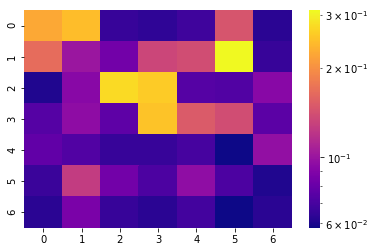

[[0.224 0.245 0.066 0.064 0.068 0.146 0.063]
 [0.166 0.101 0.084 0.134 0.139 0.311 0.066]
 [0.061 0.093 0.275 0.26  0.074 0.073 0.093]
 [0.074 0.095 0.077 0.252 0.151 0.139 0.076]
 [0.078 0.073 0.066 0.066 0.07  0.058 0.097]
 [0.067 0.126 0.084 0.072 0.096 0.072 0.061]
 [0.063 0.087 0.066 0.063 0.069 0.058 0.063]]
SKIPPPPPPEDDDD


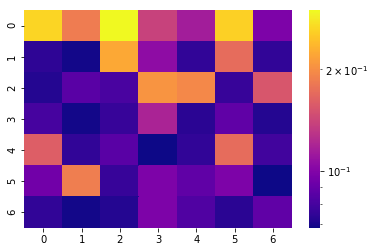

[[0.264 0.186 0.299 0.139 0.115 0.26  0.098]
 [0.074 0.069 0.223 0.105 0.075 0.172 0.075]
 [0.072 0.086 0.081 0.206 0.196 0.076 0.154]
 [0.08  0.069 0.076 0.119 0.073 0.088 0.072]
 [0.161 0.075 0.086 0.068 0.075 0.172 0.079]
 [0.094 0.187 0.076 0.098 0.088 0.098 0.068]
 [0.075 0.069 0.072 0.098 0.083 0.073 0.088]]


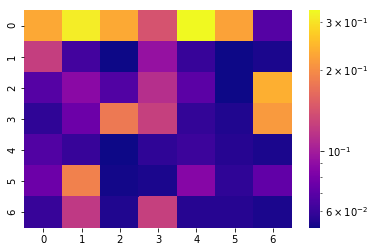

[[0.23  0.313 0.231 0.142 0.331 0.224 0.068]
 [0.124 0.063 0.052 0.093 0.06  0.052 0.054]
 [0.068 0.088 0.067 0.112 0.07  0.052 0.239]
 [0.058 0.076 0.179 0.125 0.059 0.055 0.214]
 [0.067 0.06  0.052 0.058 0.061 0.056 0.054]
 [0.076 0.188 0.053 0.054 0.086 0.058 0.072]
 [0.06  0.12  0.055 0.125 0.056 0.056 0.054]]


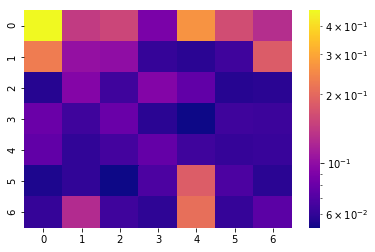

[[0.468 0.142 0.155 0.088 0.266 0.163 0.129]
 [0.23  0.103 0.1   0.061 0.058 0.064 0.183]
 [0.057 0.094 0.064 0.093 0.077 0.057 0.058]
 [0.081 0.064 0.08  0.058 0.052 0.064 0.063]
 [0.077 0.06  0.066 0.078 0.064 0.061 0.062]
 [0.055 0.06  0.052 0.069 0.184 0.069 0.058]
 [0.061 0.126 0.064 0.059 0.21  0.061 0.074]]


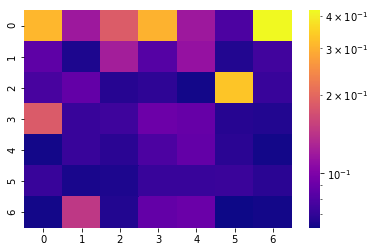

[[0.309 0.118 0.185 0.303 0.118 0.079 0.419]
 [0.086 0.065 0.123 0.082 0.113 0.066 0.075]
 [0.077 0.088 0.067 0.069 0.063 0.331 0.072]
 [0.184 0.072 0.074 0.092 0.089 0.067 0.066]
 [0.063 0.072 0.068 0.079 0.088 0.068 0.063]
 [0.072 0.064 0.065 0.072 0.072 0.073 0.068]
 [0.063 0.146 0.066 0.088 0.091 0.062 0.063]]


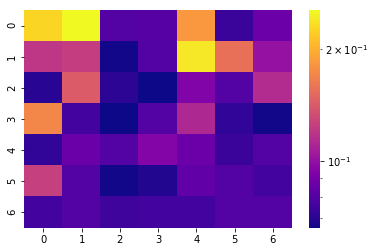

[[0.227 0.254 0.08  0.081 0.184 0.074 0.087]
 [0.12  0.124 0.067 0.08  0.24  0.156 0.101]
 [0.07  0.143 0.071 0.066 0.093 0.08  0.114]
 [0.172 0.076 0.066 0.08  0.112 0.072 0.067]
 [0.072 0.086 0.08  0.094 0.087 0.074 0.08 ]
 [0.125 0.08  0.067 0.069 0.084 0.08  0.076]
 [0.076 0.08  0.075 0.076 0.076 0.08  0.08 ]]


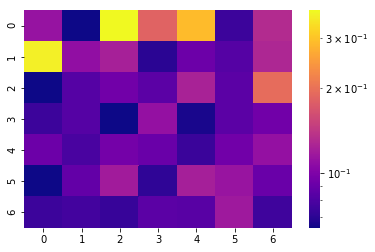

[[0.112 0.064 0.375 0.183 0.29  0.075 0.131]
 [0.361 0.109 0.122 0.07  0.092 0.083 0.127]
 [0.064 0.083 0.094 0.085 0.124 0.085 0.194]
 [0.075 0.083 0.064 0.111 0.066 0.085 0.094]
 [0.092 0.079 0.095 0.091 0.074 0.094 0.111]
 [0.064 0.088 0.119 0.071 0.121 0.113 0.091]
 [0.075 0.077 0.073 0.085 0.084 0.117 0.076]]


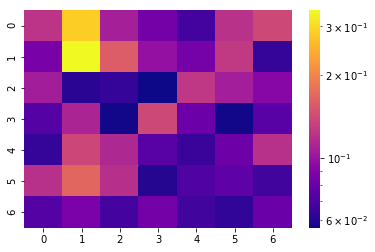

[[0.123 0.287 0.108 0.084 0.068 0.122 0.14 ]
 [0.086 0.343 0.159 0.098 0.085 0.128 0.064]
 [0.106 0.061 0.064 0.056 0.126 0.107 0.092]
 [0.073 0.112 0.057 0.14  0.081 0.057 0.074]
 [0.064 0.139 0.114 0.074 0.065 0.082 0.121]
 [0.121 0.168 0.12  0.06  0.072 0.076 0.067]
 [0.073 0.087 0.068 0.084 0.067 0.063 0.08 ]]


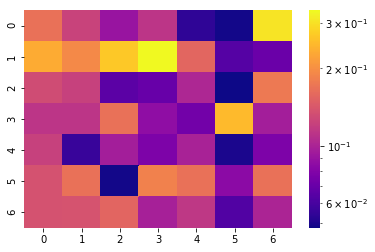

[[0.168 0.124 0.09  0.113 0.054 0.049 0.306]
 [0.232 0.193 0.269 0.336 0.157 0.064 0.071]
 [0.131 0.122 0.066 0.07  0.102 0.048 0.175]
 [0.113 0.113 0.168 0.086 0.074 0.251 0.096]
 [0.122 0.056 0.096 0.078 0.099 0.05  0.078]
 [0.136 0.168 0.049 0.185 0.168 0.084 0.168]
 [0.136 0.138 0.155 0.098 0.115 0.063 0.101]]


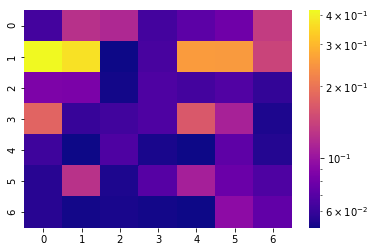

[[0.064 0.124 0.116 0.064 0.072 0.08  0.135]
 [0.417 0.371 0.051 0.065 0.255 0.253 0.143]
 [0.086 0.085 0.052 0.067 0.064 0.068 0.059]
 [0.18  0.06  0.063 0.067 0.165 0.111 0.054]
 [0.062 0.051 0.067 0.053 0.051 0.073 0.055]
 [0.056 0.125 0.054 0.07  0.109 0.078 0.067]
 [0.056 0.052 0.053 0.052 0.051 0.094 0.074]]


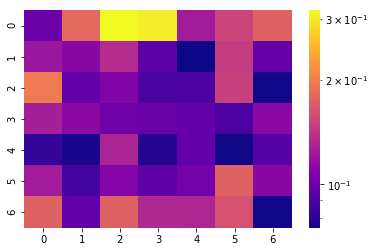

[[0.101 0.182 0.317 0.305 0.124 0.153 0.176]
 [0.121 0.112 0.135 0.095 0.075 0.146 0.099]
 [0.198 0.098 0.109 0.089 0.09  0.15  0.076]
 [0.126 0.113 0.102 0.101 0.098 0.09  0.113]
 [0.083 0.077 0.13  0.079 0.098 0.076 0.093]
 [0.124 0.087 0.11  0.096 0.103 0.176 0.112]
 [0.176 0.098 0.176 0.132 0.131 0.163 0.076]]


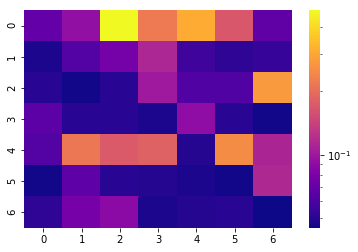

[[0.07  0.093 0.481 0.221 0.308 0.168 0.068]
 [0.048 0.063 0.077 0.112 0.056 0.052 0.054]
 [0.05  0.046 0.05  0.101 0.062 0.062 0.275]
 [0.066 0.05  0.05  0.048 0.091 0.05  0.046]
 [0.063 0.217 0.171 0.181 0.049 0.251 0.111]
 [0.046 0.067 0.05  0.049 0.048 0.046 0.114]
 [0.052 0.078 0.089 0.048 0.049 0.05  0.045]]


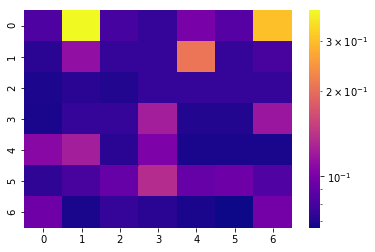

[[0.083 0.383 0.08  0.075 0.1   0.086 0.302]
 [0.072 0.113 0.075 0.075 0.209 0.075 0.081]
 [0.069 0.072 0.07  0.075 0.075 0.075 0.075]
 [0.068 0.075 0.075 0.124 0.07  0.07  0.118]
 [0.108 0.124 0.072 0.102 0.068 0.068 0.068]
 [0.073 0.081 0.092 0.135 0.092 0.095 0.084]
 [0.096 0.068 0.075 0.072 0.068 0.066 0.098]]
SKIPPPPPPEDDDD


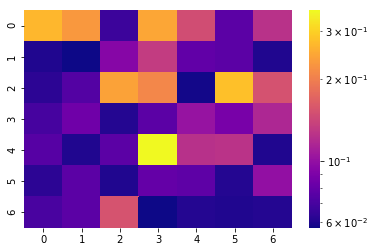

[[0.268 0.23  0.067 0.246 0.148 0.077 0.125]
 [0.06  0.057 0.094 0.133 0.079 0.077 0.06 ]
 [0.063 0.074 0.242 0.209 0.058 0.279 0.153]
 [0.07  0.084 0.061 0.077 0.102 0.088 0.116]
 [0.075 0.06  0.077 0.357 0.124 0.126 0.06 ]
 [0.063 0.077 0.06  0.08  0.078 0.061 0.1  ]
 [0.071 0.077 0.154 0.057 0.061 0.06  0.061]]


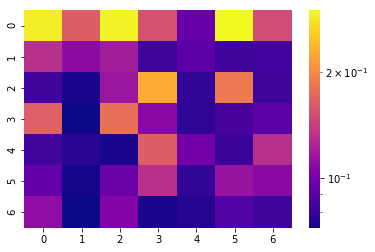

[[0.288 0.164 0.293 0.155 0.095 0.299 0.151]
 [0.132 0.109 0.12  0.082 0.091 0.082 0.084]
 [0.082 0.074 0.115 0.229 0.079 0.187 0.082]
 [0.165 0.072 0.179 0.107 0.078 0.085 0.091]
 [0.083 0.077 0.074 0.164 0.099 0.081 0.132]
 [0.094 0.073 0.096 0.132 0.079 0.114 0.108]
 [0.11  0.072 0.105 0.074 0.076 0.088 0.082]]
SKIPPPPPPEDDDD


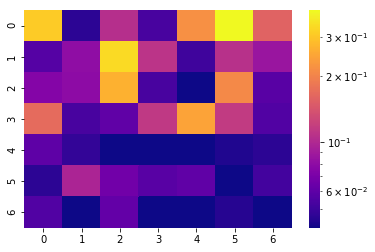

[[0.309 0.046 0.105 0.053 0.218 0.395 0.158]
 [0.057 0.081 0.336 0.11  0.051 0.107 0.086]
 [0.075 0.079 0.266 0.053 0.041 0.208 0.058]
 [0.168 0.053 0.061 0.114 0.246 0.116 0.056]
 [0.06  0.048 0.041 0.041 0.041 0.044 0.046]
 [0.046 0.097 0.067 0.058 0.061 0.041 0.052]
 [0.056 0.041 0.062 0.041 0.041 0.045 0.041]]


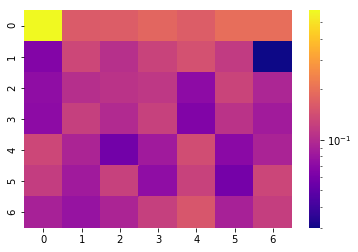

[[0.589 0.163 0.166 0.183 0.167 0.196 0.196]
 [0.066 0.133 0.105 0.128 0.147 0.118 0.03 ]
 [0.073 0.103 0.108 0.113 0.071 0.129 0.094]
 [0.071 0.123 0.099 0.125 0.065 0.108 0.085]
 [0.134 0.093 0.058 0.084 0.141 0.07  0.092]
 [0.121 0.084 0.124 0.073 0.126 0.059 0.132]
 [0.09  0.077 0.093 0.123 0.156 0.09  0.122]]


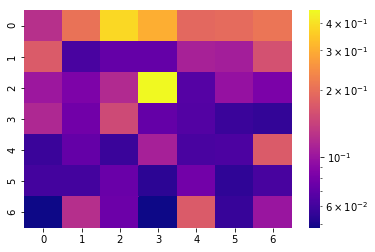

[[0.123 0.206 0.382 0.303 0.19  0.195 0.209]
 [0.172 0.063 0.073 0.073 0.11  0.107 0.159]
 [0.102 0.084 0.118 0.454 0.067 0.097 0.083]
 [0.116 0.078 0.151 0.073 0.066 0.058 0.056]
 [0.058 0.073 0.058 0.109 0.063 0.064 0.172]
 [0.061 0.061 0.075 0.054 0.079 0.055 0.062]
 [0.048 0.122 0.076 0.048 0.172 0.057 0.1  ]]


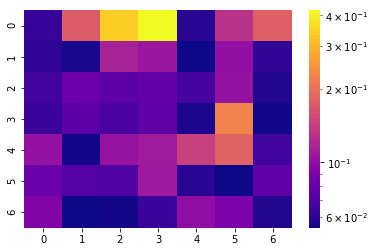

[[0.063 0.174 0.343 0.419 0.059 0.13  0.179]
 [0.061 0.056 0.115 0.106 0.054 0.101 0.062]
 [0.067 0.082 0.076 0.078 0.068 0.103 0.058]
 [0.064 0.075 0.07  0.077 0.057 0.225 0.055]
 [0.103 0.055 0.104 0.11  0.144 0.183 0.066]
 [0.081 0.073 0.072 0.109 0.059 0.054 0.077]
 [0.092 0.054 0.055 0.064 0.1   0.088 0.058]]


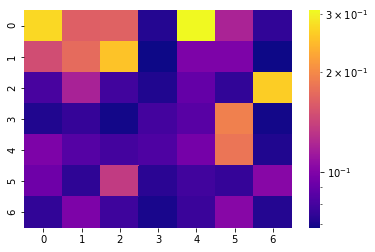

[[0.274 0.164 0.166 0.072 0.307 0.12  0.075]
 [0.149 0.174 0.253 0.068 0.099 0.099 0.068]
 [0.081 0.119 0.079 0.071 0.09  0.075 0.263]
 [0.071 0.076 0.069 0.08  0.086 0.192 0.069]
 [0.099 0.085 0.08  0.083 0.096 0.182 0.071]
 [0.093 0.074 0.136 0.073 0.079 0.076 0.103]
 [0.075 0.099 0.078 0.07  0.077 0.103 0.072]]


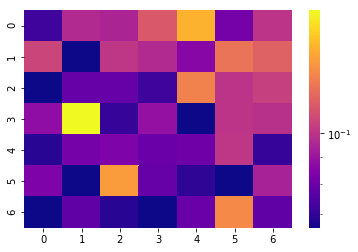

[[0.072 0.097 0.095 0.113 0.146 0.082 0.1  ]
 [0.106 0.066 0.101 0.097 0.086 0.123 0.116]
 [0.066 0.079 0.079 0.072 0.128 0.1   0.104]
 [0.088 0.172 0.071 0.089 0.066 0.1   0.099]
 [0.069 0.082 0.084 0.08  0.081 0.101 0.071]
 [0.084 0.066 0.138 0.079 0.07  0.066 0.094]
 [0.066 0.078 0.069 0.066 0.08  0.131 0.078]]


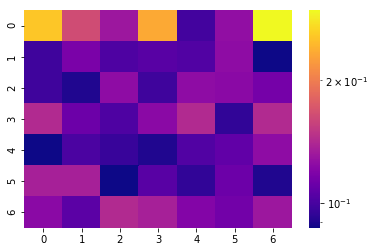

[[0.256 0.164 0.131 0.234 0.099 0.126 0.297]
 [0.098 0.117 0.102 0.105 0.103 0.125 0.087]
 [0.098 0.09  0.125 0.098 0.125 0.123 0.115]
 [0.142 0.112 0.102 0.123 0.142 0.094 0.142]
 [0.087 0.101 0.096 0.09  0.103 0.108 0.125]
 [0.136 0.136 0.087 0.105 0.094 0.112 0.09 ]
 [0.123 0.106 0.142 0.136 0.12  0.114 0.131]]


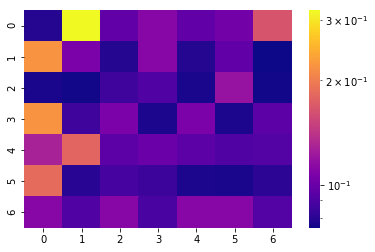

[[0.079 0.319 0.097 0.111 0.097 0.103 0.166]
 [0.222 0.106 0.079 0.111 0.079 0.097 0.075]
 [0.077 0.076 0.086 0.091 0.077 0.119 0.076]
 [0.222 0.086 0.106 0.078 0.106 0.078 0.095]
 [0.128 0.18  0.095 0.1   0.095 0.091 0.092]
 [0.185 0.08  0.088 0.085 0.078 0.077 0.081]
 [0.111 0.091 0.111 0.089 0.111 0.111 0.092]]


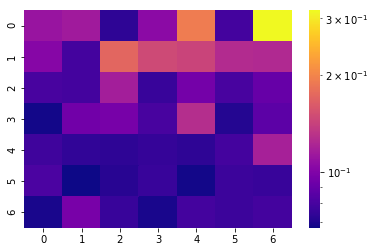

[[0.111 0.115 0.073 0.105 0.193 0.079 0.318]
 [0.102 0.079 0.173 0.148 0.144 0.126 0.124]
 [0.08  0.079 0.117 0.076 0.095 0.08  0.09 ]
 [0.068 0.094 0.096 0.08  0.127 0.071 0.087]
 [0.078 0.074 0.073 0.075 0.073 0.079 0.118]
 [0.081 0.067 0.072 0.076 0.068 0.077 0.076]
 [0.069 0.097 0.076 0.069 0.079 0.077 0.079]]


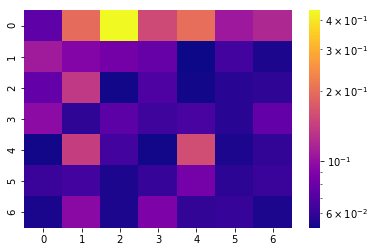

[[0.075 0.196 0.44  0.155 0.2   0.107 0.12 ]
 [0.109 0.091 0.084 0.078 0.052 0.065 0.055]
 [0.077 0.136 0.053 0.069 0.053 0.057 0.059]
 [0.097 0.059 0.074 0.064 0.067 0.057 0.077]
 [0.053 0.142 0.065 0.053 0.158 0.055 0.06 ]
 [0.062 0.065 0.055 0.061 0.085 0.058 0.062]
 [0.054 0.095 0.055 0.088 0.06  0.061 0.055]]


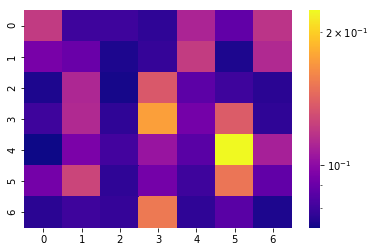

[[0.121 0.08  0.08  0.077 0.111 0.088 0.118]
 [0.094 0.09  0.074 0.078 0.122 0.074 0.113]
 [0.074 0.112 0.073 0.136 0.087 0.08  0.076]
 [0.08  0.113 0.077 0.174 0.093 0.138 0.077]
 [0.072 0.095 0.081 0.104 0.086 0.224 0.109]
 [0.093 0.126 0.077 0.093 0.08  0.151 0.088]
 [0.076 0.08  0.078 0.153 0.077 0.086 0.074]]


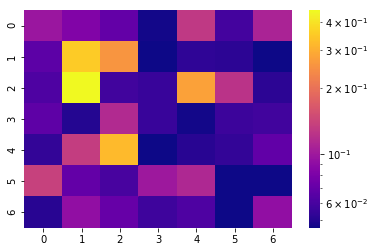

[[0.098 0.083 0.07  0.047 0.129 0.059 0.109]
 [0.067 0.355 0.257 0.046 0.053 0.052 0.046]
 [0.062 0.453 0.058 0.055 0.275 0.124 0.052]
 [0.068 0.05  0.115 0.055 0.047 0.056 0.058]
 [0.054 0.134 0.321 0.046 0.051 0.054 0.069]
 [0.137 0.07  0.06  0.1   0.113 0.046 0.046]
 [0.051 0.092 0.071 0.057 0.062 0.046 0.092]]


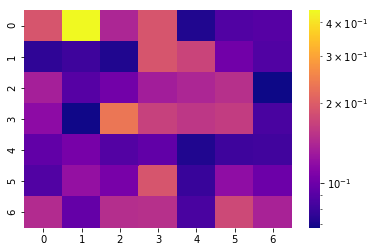

[[0.19  0.444 0.14  0.19  0.072 0.088 0.09 ]
 [0.076 0.081 0.072 0.19  0.171 0.102 0.088]
 [0.134 0.09  0.103 0.132 0.14  0.15  0.068]
 [0.117 0.069 0.233 0.167 0.156 0.162 0.085]
 [0.095 0.105 0.089 0.095 0.072 0.081 0.082]
 [0.088 0.122 0.106 0.19  0.079 0.119 0.1  ]
 [0.145 0.096 0.147 0.15  0.085 0.176 0.137]]


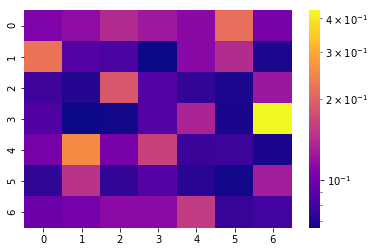

[[0.106 0.115 0.14  0.125 0.112 0.215 0.103]
 [0.221 0.087 0.083 0.066 0.111 0.141 0.069]
 [0.079 0.071 0.187 0.087 0.075 0.069 0.122]
 [0.085 0.066 0.067 0.087 0.134 0.068 0.429]
 [0.102 0.257 0.103 0.163 0.077 0.078 0.068]
 [0.074 0.147 0.075 0.087 0.072 0.067 0.128]
 [0.097 0.101 0.113 0.113 0.156 0.076 0.08 ]]


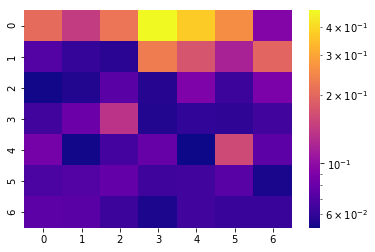

[[0.205 0.144 0.22  0.473 0.373 0.259 0.094]
 [0.071 0.061 0.058 0.233 0.173 0.118 0.197]
 [0.053 0.056 0.074 0.057 0.091 0.063 0.088]
 [0.065 0.082 0.135 0.056 0.06  0.059 0.065]
 [0.086 0.053 0.066 0.079 0.052 0.16  0.075]
 [0.068 0.071 0.078 0.064 0.065 0.073 0.054]
 [0.075 0.074 0.063 0.055 0.065 0.062 0.062]]


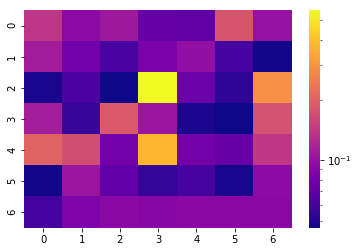

[[0.138 0.094 0.107 0.074 0.071 0.181 0.101]
 [0.11  0.08  0.062 0.085 0.099 0.061 0.047]
 [0.048 0.063 0.046 0.56  0.076 0.053 0.29 ]
 [0.112 0.056 0.186 0.105 0.049 0.046 0.174]
 [0.203 0.17  0.079 0.373 0.081 0.074 0.139]
 [0.047 0.105 0.072 0.055 0.061 0.048 0.095]
 [0.06  0.086 0.093 0.091 0.093 0.093 0.093]]


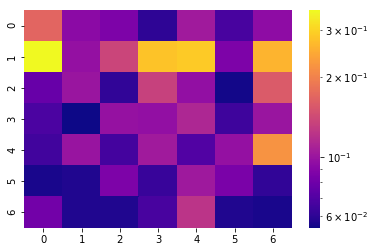

[[0.169 0.093 0.086 0.06  0.104 0.067 0.094]
 [0.356 0.097 0.137 0.28  0.288 0.086 0.26 ]
 [0.078 0.1   0.061 0.133 0.096 0.055 0.158]
 [0.068 0.054 0.098 0.096 0.112 0.064 0.1  ]
 [0.065 0.099 0.066 0.104 0.07  0.097 0.22 ]
 [0.056 0.057 0.086 0.063 0.103 0.085 0.061]
 [0.082 0.057 0.057 0.067 0.123 0.057 0.056]]


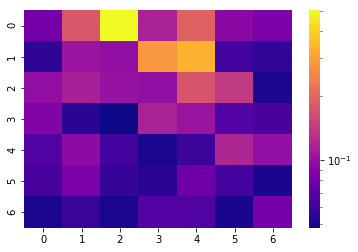

[[0.081 0.178 0.502 0.115 0.192 0.093 0.084]
 [0.055 0.103 0.098 0.286 0.337 0.061 0.056]
 [0.098 0.113 0.101 0.099 0.174 0.141 0.051]
 [0.088 0.054 0.048 0.114 0.103 0.067 0.063]
 [0.066 0.095 0.062 0.051 0.059 0.12  0.099]
 [0.063 0.085 0.057 0.054 0.079 0.062 0.05 ]
 [0.051 0.058 0.051 0.068 0.066 0.05  0.082]]


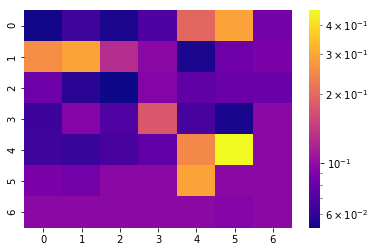

[[0.053 0.064 0.055 0.069 0.196 0.291 0.086]
 [0.255 0.294 0.127 0.097 0.055 0.083 0.088]
 [0.082 0.058 0.052 0.093 0.076 0.08  0.081]
 [0.063 0.093 0.07  0.176 0.067 0.054 0.097]
 [0.064 0.062 0.067 0.077 0.247 0.463 0.097]
 [0.089 0.085 0.097 0.097 0.291 0.097 0.097]
 [0.097 0.097 0.097 0.097 0.097 0.093 0.097]]


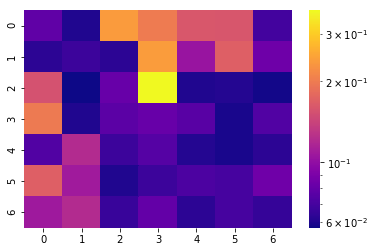

[[0.079 0.06  0.239 0.201 0.161 0.16  0.069]
 [0.063 0.067 0.063 0.24  0.104 0.17  0.084]
 [0.155 0.057 0.082 0.368 0.06  0.061 0.058]
 [0.199 0.06  0.077 0.082 0.076 0.059 0.074]
 [0.074 0.121 0.067 0.075 0.061 0.059 0.063]
 [0.17  0.109 0.06  0.067 0.072 0.07  0.085]
 [0.108 0.121 0.066 0.08  0.063 0.07  0.065]]


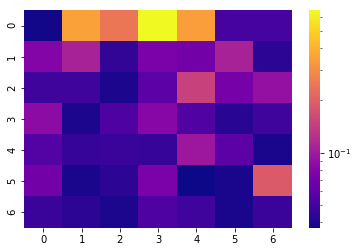

[[0.038 0.352 0.247 0.659 0.346 0.051 0.051]
 [0.08  0.107 0.045 0.074 0.07  0.107 0.043]
 [0.049 0.048 0.04  0.059 0.149 0.072 0.09 ]
 [0.086 0.04  0.054 0.081 0.055 0.042 0.049]
 [0.056 0.046 0.047 0.046 0.097 0.059 0.039]
 [0.07  0.039 0.043 0.074 0.037 0.039 0.188]
 [0.047 0.043 0.04  0.054 0.049 0.039 0.047]]


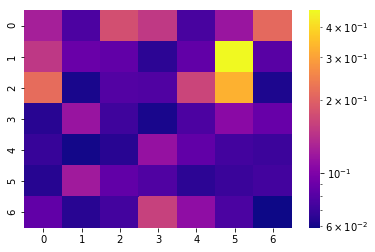

[[0.125 0.077 0.177 0.151 0.075 0.116 0.212]
 [0.149 0.089 0.085 0.066 0.085 0.47  0.081]
 [0.216 0.061 0.079 0.078 0.164 0.328 0.062]
 [0.065 0.115 0.072 0.061 0.077 0.106 0.088]
 [0.069 0.06  0.065 0.113 0.085 0.073 0.071]
 [0.064 0.121 0.085 0.078 0.066 0.07  0.073]
 [0.085 0.065 0.073 0.159 0.11  0.076 0.059]]


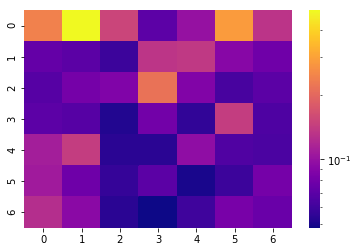

[[0.241 0.494 0.152 0.071 0.1   0.288 0.133]
 [0.074 0.07  0.059 0.134 0.138 0.091 0.079]
 [0.068 0.082 0.087 0.216 0.088 0.063 0.07 ]
 [0.071 0.068 0.052 0.08  0.056 0.143 0.065]
 [0.11  0.143 0.054 0.054 0.096 0.066 0.064]
 [0.107 0.078 0.057 0.07  0.05  0.059 0.082]
 [0.125 0.093 0.054 0.048 0.06  0.083 0.076]]


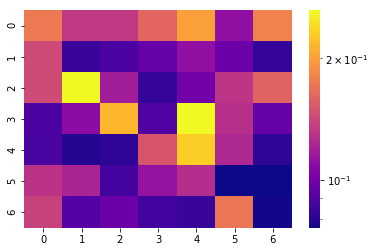

[[0.174 0.134 0.133 0.161 0.2   0.111 0.18 ]
 [0.143 0.084 0.089 0.096 0.111 0.098 0.083]
 [0.144 0.263 0.118 0.083 0.1   0.131 0.159]
 [0.089 0.109 0.216 0.09  0.263 0.128 0.096]
 [0.088 0.08  0.082 0.15  0.232 0.124 0.082]
 [0.13  0.122 0.087 0.113 0.127 0.076 0.076]
 [0.138 0.091 0.098 0.087 0.084 0.172 0.077]]


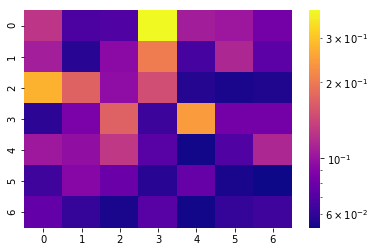

[[0.127 0.068 0.07  0.386 0.107 0.103 0.083]
 [0.108 0.058 0.094 0.204 0.066 0.115 0.073]
 [0.275 0.172 0.096 0.149 0.057 0.055 0.056]
 [0.059 0.086 0.17  0.063 0.243 0.083 0.083]
 [0.104 0.097 0.129 0.072 0.054 0.069 0.115]
 [0.064 0.091 0.079 0.058 0.077 0.055 0.053]
 [0.076 0.061 0.055 0.072 0.054 0.061 0.064]]


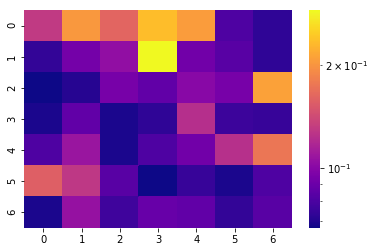

[[0.13  0.203 0.162 0.235 0.207 0.081 0.073]
 [0.074 0.093 0.104 0.289 0.092 0.084 0.073]
 [0.067 0.071 0.094 0.087 0.101 0.094 0.21 ]
 [0.069 0.087 0.069 0.073 0.123 0.076 0.075]
 [0.081 0.108 0.069 0.081 0.092 0.124 0.175]
 [0.157 0.129 0.084 0.067 0.075 0.069 0.081]
 [0.069 0.106 0.077 0.089 0.087 0.074 0.084]]


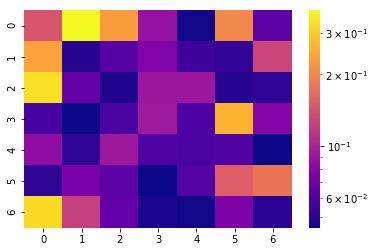

[[0.144 0.373 0.231 0.088 0.046 0.203 0.064]
 [0.237 0.049 0.062 0.077 0.054 0.052 0.13 ]
 [0.331 0.066 0.048 0.091 0.091 0.049 0.051]
 [0.057 0.045 0.058 0.093 0.059 0.26  0.079]
 [0.085 0.051 0.092 0.06  0.059 0.06  0.045]
 [0.051 0.075 0.064 0.045 0.061 0.153 0.177]
 [0.32  0.123 0.066 0.047 0.046 0.076 0.05 ]]


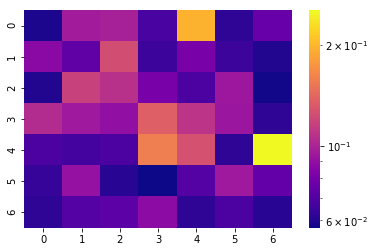

[[0.059 0.096 0.098 0.068 0.196 0.062 0.076]
 [0.087 0.074 0.125 0.065 0.081 0.065 0.06 ]
 [0.06  0.117 0.107 0.081 0.069 0.094 0.058]
 [0.104 0.095 0.09  0.136 0.109 0.093 0.062]
 [0.069 0.067 0.069 0.157 0.127 0.062 0.253]
 [0.064 0.091 0.061 0.057 0.071 0.095 0.075]
 [0.062 0.071 0.073 0.088 0.062 0.069 0.061]]
SKIPPPPPPEDDDD


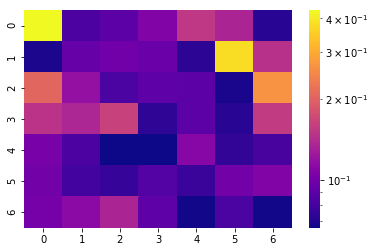

[[0.429 0.084 0.09  0.107 0.152 0.135 0.072]
 [0.069 0.094 0.099 0.096 0.073 0.378 0.146]
 [0.206 0.118 0.083 0.091 0.09  0.068 0.265]
 [0.148 0.136 0.163 0.074 0.09  0.072 0.156]
 [0.103 0.084 0.066 0.066 0.11  0.075 0.082]
 [0.1   0.08  0.076 0.086 0.077 0.1   0.107]
 [0.102 0.113 0.135 0.091 0.067 0.083 0.067]]


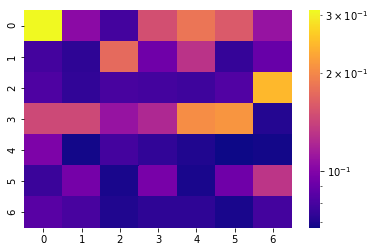

[[0.31  0.104 0.079 0.151 0.183 0.159 0.109]
 [0.079 0.073 0.173 0.093 0.13  0.075 0.09 ]
 [0.082 0.074 0.08  0.079 0.077 0.083 0.245]
 [0.145 0.145 0.109 0.122 0.204 0.212 0.071]
 [0.098 0.068 0.079 0.074 0.07  0.067 0.068]
 [0.076 0.095 0.069 0.096 0.069 0.093 0.131]
 [0.085 0.08  0.07  0.073 0.073 0.069 0.079]]


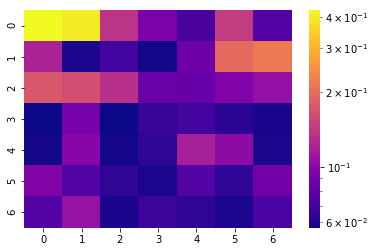

[[0.425 0.397 0.137 0.093 0.072 0.145 0.076]
 [0.122 0.06  0.07  0.058 0.087 0.196 0.218]
 [0.175 0.165 0.134 0.085 0.084 0.095 0.106]
 [0.057 0.09  0.057 0.067 0.071 0.063 0.059]
 [0.058 0.098 0.058 0.064 0.118 0.102 0.06 ]
 [0.096 0.076 0.064 0.06  0.076 0.064 0.089]
 [0.076 0.108 0.059 0.068 0.064 0.06  0.073]]


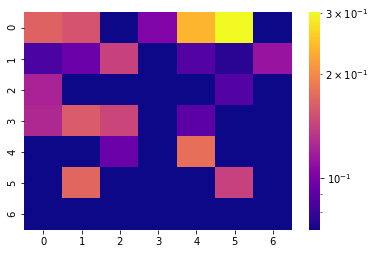

[[0.167 0.155 0.071 0.103 0.237 0.301 0.071]
 [0.085 0.095 0.142 0.071 0.087 0.076 0.113]
 [0.122 0.071 0.071 0.071 0.071 0.087 0.071]
 [0.125 0.161 0.145 0.071 0.09  0.071 0.071]
 [0.071 0.071 0.095 0.071 0.178 0.071 0.071]
 [0.071 0.171 0.071 0.071 0.071 0.142 0.071]
 [0.071 0.071 0.071 0.071 0.071 0.071 0.071]]
SKIPPPPPPEDDDD


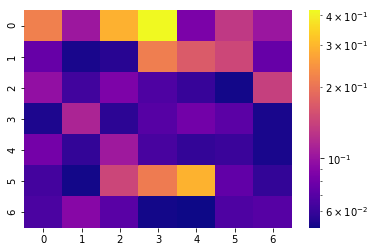

[[0.218 0.103 0.29  0.42  0.085 0.132 0.102]
 [0.076 0.053 0.056 0.215 0.169 0.147 0.076]
 [0.097 0.063 0.086 0.067 0.06  0.052 0.139]
 [0.054 0.114 0.057 0.07  0.081 0.072 0.053]
 [0.082 0.059 0.105 0.065 0.059 0.061 0.053]
 [0.064 0.052 0.146 0.211 0.294 0.074 0.059]
 [0.066 0.091 0.071 0.052 0.051 0.067 0.07 ]]
SKIPPPPPPEDDDD


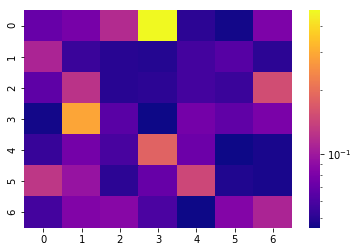

[[0.071 0.078 0.117 0.473 0.051 0.046 0.081]
 [0.11  0.055 0.05  0.049 0.058 0.064 0.051]
 [0.067 0.124 0.05  0.051 0.058 0.055 0.154]
 [0.046 0.293 0.065 0.045 0.076 0.068 0.079]
 [0.054 0.076 0.059 0.183 0.073 0.045 0.047]
 [0.128 0.095 0.051 0.07  0.147 0.048 0.047]
 [0.058 0.083 0.086 0.06  0.045 0.084 0.11 ]]


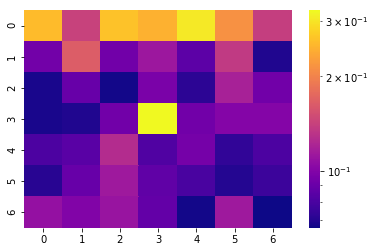

[[0.257 0.142 0.263 0.246 0.306 0.214 0.14 ]
 [0.094 0.165 0.093 0.112 0.086 0.136 0.069]
 [0.068 0.09  0.067 0.097 0.072 0.119 0.093]
 [0.068 0.069 0.093 0.324 0.093 0.101 0.101]
 [0.081 0.085 0.126 0.082 0.095 0.073 0.081]
 [0.071 0.09  0.114 0.087 0.08  0.07  0.076]
 [0.108 0.1   0.11  0.088 0.067 0.114 0.066]]


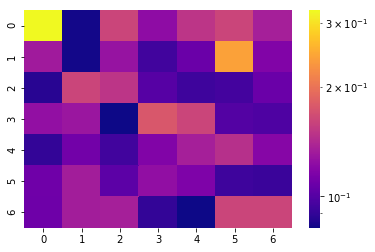

[[0.324 0.083 0.162 0.123 0.15  0.162 0.135]
 [0.132 0.083 0.127 0.094 0.108 0.24  0.117]
 [0.087 0.162 0.15  0.101 0.093 0.095 0.108]
 [0.125 0.129 0.082 0.176 0.162 0.1   0.098]
 [0.09  0.111 0.094 0.117 0.135 0.146 0.119]
 [0.11  0.133 0.103 0.124 0.116 0.093 0.092]
 [0.109 0.133 0.135 0.09  0.082 0.162 0.162]]


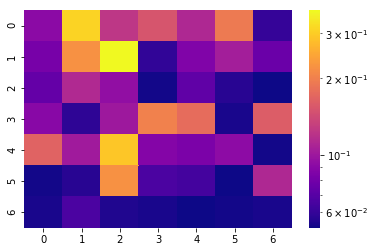

[[0.091 0.311 0.124 0.153 0.112 0.193 0.06 ]
 [0.082 0.221 0.369 0.059 0.086 0.105 0.077]
 [0.075 0.113 0.094 0.053 0.073 0.057 0.052]
 [0.09  0.058 0.101 0.202 0.178 0.054 0.161]
 [0.167 0.102 0.292 0.088 0.084 0.092 0.053]
 [0.053 0.057 0.222 0.066 0.064 0.052 0.112]
 [0.054 0.066 0.055 0.054 0.052 0.053 0.054]]


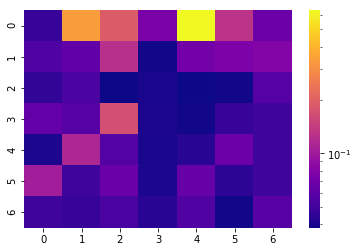

[[0.047 0.341 0.192 0.076 0.641 0.13  0.068]
 [0.056 0.063 0.126 0.039 0.071 0.077 0.08 ]
 [0.046 0.054 0.038 0.04  0.038 0.039 0.058]
 [0.064 0.058 0.17  0.041 0.039 0.047 0.049]
 [0.041 0.114 0.057 0.04  0.043 0.068 0.05 ]
 [0.103 0.05  0.067 0.041 0.065 0.044 0.05 ]
 [0.049 0.047 0.053 0.043 0.056 0.039 0.059]]


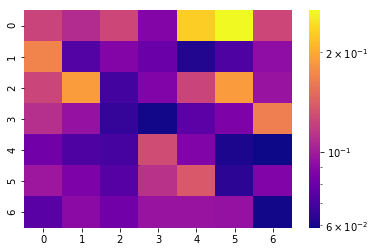

[[0.124 0.109 0.126 0.088 0.229 0.268 0.126]
 [0.169 0.073 0.088 0.08  0.062 0.072 0.093]
 [0.125 0.19  0.069 0.087 0.124 0.188 0.096]
 [0.111 0.095 0.066 0.06  0.076 0.086 0.166]
 [0.082 0.072 0.07  0.129 0.087 0.061 0.059]
 [0.098 0.086 0.074 0.113 0.138 0.064 0.087]
 [0.075 0.091 0.082 0.096 0.096 0.095 0.06 ]]


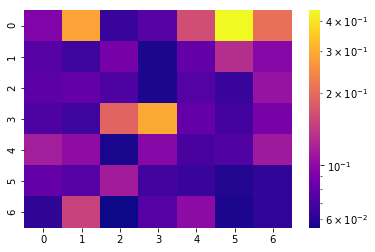

[[0.094 0.287 0.065 0.076 0.163 0.442 0.208]
 [0.075 0.067 0.089 0.058 0.081 0.13  0.097]
 [0.077 0.081 0.072 0.058 0.074 0.065 0.107]
 [0.072 0.067 0.192 0.296 0.081 0.069 0.09 ]
 [0.116 0.102 0.057 0.098 0.07  0.073 0.112]
 [0.081 0.075 0.114 0.068 0.065 0.059 0.063]
 [0.062 0.151 0.055 0.075 0.101 0.058 0.063]]


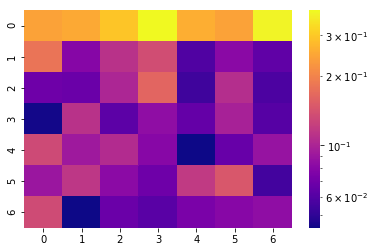

[[0.243 0.254 0.295 0.385 0.259 0.243 0.375]
 [0.18  0.079 0.111 0.136 0.059 0.081 0.064]
 [0.069 0.068 0.101 0.163 0.054 0.108 0.058]
 [0.045 0.111 0.063 0.084 0.066 0.098 0.061]
 [0.133 0.092 0.106 0.08  0.044 0.067 0.088]
 [0.09  0.115 0.082 0.069 0.118 0.147 0.055]
 [0.134 0.044 0.068 0.062 0.074 0.08  0.084]]


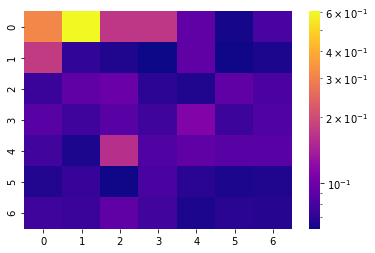

[[0.311 0.606 0.17  0.17  0.092 0.064 0.081]
 [0.177 0.072 0.066 0.062 0.092 0.063 0.065]
 [0.075 0.092 0.097 0.07  0.066 0.092 0.083]
 [0.088 0.077 0.088 0.077 0.111 0.076 0.085]
 [0.078 0.065 0.162 0.085 0.092 0.088 0.088]
 [0.067 0.074 0.063 0.081 0.069 0.065 0.066]
 [0.077 0.075 0.092 0.078 0.065 0.069 0.068]]


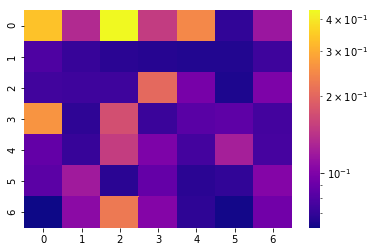

[[0.334 0.134 0.432 0.151 0.247 0.069 0.116]
 [0.079 0.071 0.067 0.066 0.065 0.065 0.073]
 [0.074 0.073 0.073 0.204 0.096 0.064 0.099]
 [0.264 0.068 0.172 0.072 0.083 0.085 0.075]
 [0.087 0.071 0.152 0.099 0.075 0.124 0.076]
 [0.084 0.12  0.067 0.088 0.067 0.069 0.103]
 [0.061 0.107 0.224 0.103 0.068 0.062 0.093]]


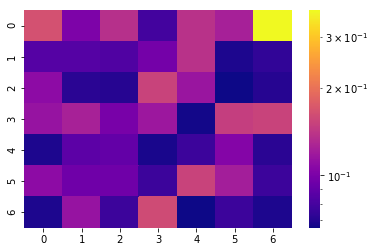

[[0.166 0.101 0.136 0.079 0.138 0.124 0.37 ]
 [0.085 0.085 0.083 0.097 0.138 0.069 0.074]
 [0.109 0.072 0.071 0.153 0.116 0.066 0.071]
 [0.114 0.125 0.099 0.117 0.067 0.149 0.153]
 [0.069 0.088 0.09  0.068 0.077 0.105 0.072]
 [0.109 0.095 0.095 0.077 0.153 0.122 0.077]
 [0.069 0.114 0.077 0.16  0.066 0.077 0.069]]


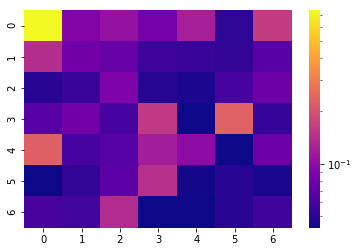

[[0.747 0.09  0.105 0.083 0.12  0.05  0.162]
 [0.14  0.08  0.074 0.055 0.054 0.052 0.067]
 [0.049 0.054 0.088 0.048 0.046 0.059 0.078]
 [0.067 0.08  0.059 0.156 0.043 0.23  0.053]
 [0.229 0.059 0.065 0.118 0.099 0.043 0.077]
 [0.043 0.052 0.069 0.145 0.044 0.049 0.045]
 [0.06  0.057 0.136 0.043 0.043 0.049 0.056]]


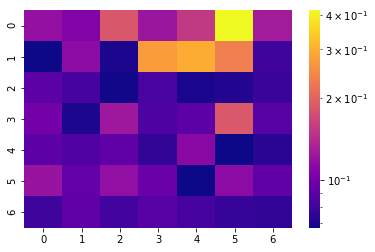

[[0.118 0.108 0.185 0.122 0.154 0.416 0.127]
 [0.067 0.114 0.07  0.274 0.297 0.235 0.08 ]
 [0.091 0.082 0.068 0.083 0.069 0.071 0.078]
 [0.101 0.07  0.124 0.085 0.091 0.187 0.089]
 [0.09  0.086 0.093 0.076 0.112 0.067 0.073]
 [0.121 0.094 0.117 0.096 0.067 0.114 0.093]
 [0.079 0.093 0.081 0.089 0.082 0.077 0.076]]


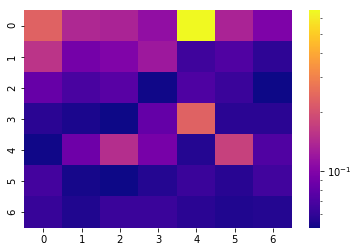

[[0.232 0.139 0.134 0.111 0.658 0.134 0.097]
 [0.156 0.091 0.098 0.121 0.065 0.072 0.059]
 [0.083 0.069 0.076 0.052 0.071 0.063 0.051]
 [0.058 0.054 0.051 0.082 0.232 0.058 0.058]
 [0.052 0.087 0.147 0.092 0.056 0.173 0.072]
 [0.067 0.053 0.051 0.056 0.063 0.057 0.066]
 [0.062 0.055 0.063 0.063 0.058 0.055 0.056]]


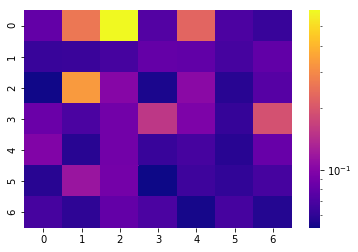

[[0.081 0.262 0.598 0.074 0.227 0.071 0.063]
 [0.063 0.064 0.068 0.082 0.08  0.068 0.08 ]
 [0.053 0.336 0.101 0.055 0.104 0.058 0.075]
 [0.085 0.07  0.089 0.153 0.095 0.062 0.191]
 [0.098 0.058 0.089 0.063 0.068 0.058 0.083]
 [0.058 0.115 0.09  0.052 0.065 0.061 0.068]
 [0.068 0.06  0.081 0.07  0.054 0.068 0.057]]


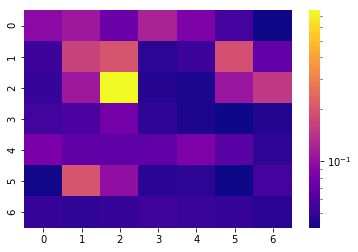

[[0.094 0.109 0.073 0.122 0.084 0.056 0.041]
 [0.053 0.168 0.199 0.048 0.053 0.19  0.07 ]
 [0.051 0.11  0.751 0.046 0.044 0.107 0.152]
 [0.055 0.059 0.079 0.049 0.044 0.041 0.045]
 [0.083 0.068 0.067 0.069 0.084 0.064 0.049]
 [0.042 0.2   0.099 0.047 0.048 0.041 0.056]
 [0.051 0.049 0.051 0.054 0.052 0.051 0.047]]


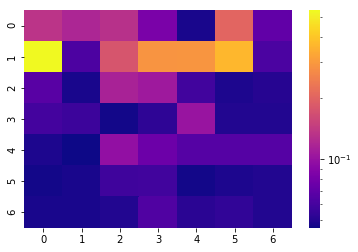

[[0.135 0.119 0.131 0.083 0.048 0.204 0.071]
 [0.539 0.063 0.178 0.289 0.293 0.365 0.062]
 [0.067 0.048 0.115 0.107 0.059 0.049 0.051]
 [0.06  0.057 0.047 0.053 0.102 0.05  0.05 ]
 [0.049 0.046 0.098 0.076 0.066 0.066 0.066]
 [0.047 0.048 0.058 0.059 0.047 0.049 0.05 ]
 [0.048 0.048 0.05  0.064 0.052 0.054 0.05 ]]


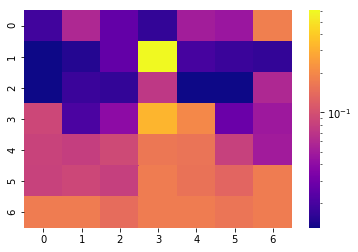

[[0.019 0.059 0.026 0.017 0.051 0.046 0.182]
 [0.013 0.015 0.026 0.609 0.02  0.018 0.017]
 [0.013 0.018 0.017 0.073 0.013 0.013 0.059]
 [0.089 0.021 0.04  0.324 0.202 0.028 0.048]
 [0.084 0.08  0.093 0.165 0.159 0.082 0.05 ]
 [0.083 0.089 0.081 0.177 0.157 0.133 0.175]
 [0.177 0.175 0.145 0.175 0.175 0.161 0.177]]
SKIPPPPPPEDDDD


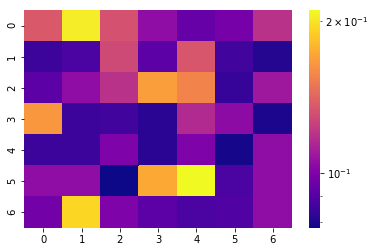

[[0.136 0.204 0.133 0.105 0.094 0.098 0.119]
 [0.085 0.088 0.129 0.092 0.135 0.086 0.081]
 [0.092 0.105 0.119 0.168 0.156 0.084 0.109]
 [0.165 0.085 0.086 0.082 0.116 0.104 0.08 ]
 [0.085 0.085 0.1   0.082 0.1   0.079 0.105]
 [0.105 0.105 0.078 0.173 0.21  0.088 0.105]
 [0.097 0.194 0.1   0.092 0.088 0.089 0.105]]


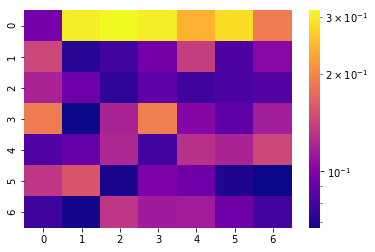

[[0.096 0.3   0.314 0.3   0.24  0.282 0.19 ]
 [0.145 0.072 0.078 0.095 0.139 0.082 0.103]
 [0.12  0.093 0.073 0.087 0.077 0.081 0.084]
 [0.19  0.067 0.12  0.193 0.102 0.087 0.116]
 [0.083 0.09  0.122 0.079 0.129 0.121 0.145]
 [0.133 0.157 0.069 0.098 0.093 0.07  0.067]
 [0.077 0.068 0.133 0.114 0.115 0.093 0.079]]


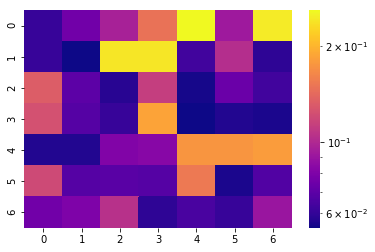

[[0.061 0.076 0.096 0.148 0.258 0.092 0.245]
 [0.061 0.054 0.24  0.241 0.063 0.103 0.059]
 [0.133 0.07  0.058 0.113 0.055 0.074 0.063]
 [0.124 0.068 0.061 0.186 0.054 0.057 0.056]
 [0.057 0.057 0.081 0.083 0.175 0.175 0.18 ]
 [0.12  0.068 0.069 0.068 0.153 0.056 0.067]
 [0.076 0.08  0.105 0.059 0.065 0.061 0.09 ]]


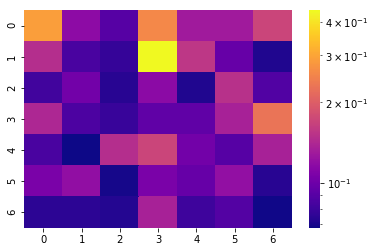

[[0.29  0.117 0.09  0.259 0.13  0.13  0.171]
 [0.147 0.085 0.078 0.442 0.156 0.097 0.072]
 [0.082 0.103 0.074 0.116 0.072 0.15  0.088]
 [0.141 0.086 0.079 0.094 0.094 0.136 0.229]
 [0.085 0.068 0.147 0.172 0.103 0.09  0.136]
 [0.107 0.12  0.07  0.107 0.097 0.121 0.074]
 [0.075 0.075 0.073 0.136 0.081 0.089 0.069]]


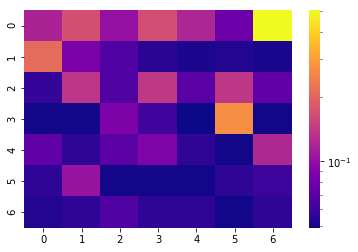

[[0.118 0.169 0.101 0.167 0.12  0.079 0.505]
 [0.21  0.086 0.067 0.055 0.052 0.053 0.051]
 [0.058 0.137 0.068 0.139 0.071 0.138 0.074]
 [0.05  0.05  0.087 0.061 0.049 0.271 0.05 ]
 [0.074 0.056 0.072 0.088 0.056 0.05  0.122]
 [0.056 0.104 0.05  0.05  0.05  0.056 0.06 ]
 [0.053 0.056 0.067 0.056 0.056 0.05  0.056]]


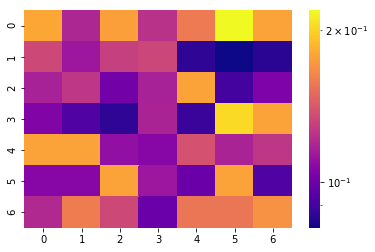

[[0.179 0.119 0.176 0.124 0.158 0.219 0.177]
 [0.134 0.113 0.13  0.133 0.086 0.081 0.085]
 [0.117 0.126 0.101 0.117 0.177 0.09  0.104]
 [0.105 0.093 0.086 0.118 0.088 0.204 0.177]
 [0.177 0.177 0.11  0.106 0.138 0.118 0.126]
 [0.106 0.106 0.177 0.113 0.099 0.177 0.093]
 [0.12  0.159 0.134 0.099 0.156 0.156 0.169]]
SKIPPPPPPEDDDD


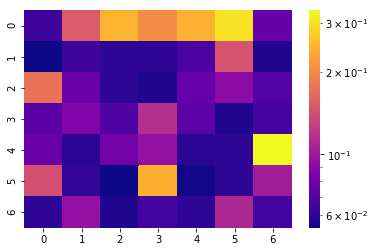

[[0.064 0.152 0.247 0.202 0.243 0.304 0.076]
 [0.054 0.064 0.06  0.06  0.068 0.145 0.057]
 [0.174 0.078 0.06  0.057 0.077 0.092 0.07 ]
 [0.072 0.086 0.069 0.115 0.073 0.057 0.066]
 [0.078 0.059 0.081 0.095 0.059 0.06  0.334]
 [0.142 0.061 0.054 0.241 0.055 0.06  0.103]
 [0.06  0.095 0.057 0.065 0.06  0.11  0.065]]
SKIPPPPPPEDDDD


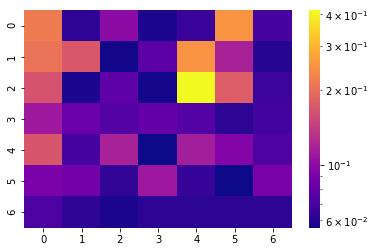

[[0.216 0.062 0.1   0.059 0.066 0.25  0.07 ]
 [0.205 0.171 0.057 0.077 0.249 0.117 0.061]
 [0.166 0.059 0.079 0.057 0.415 0.177 0.067]
 [0.111 0.084 0.075 0.081 0.075 0.062 0.069]
 [0.17  0.07  0.117 0.056 0.115 0.095 0.073]
 [0.091 0.087 0.064 0.109 0.065 0.056 0.09 ]
 [0.072 0.063 0.059 0.062 0.062 0.062 0.062]]


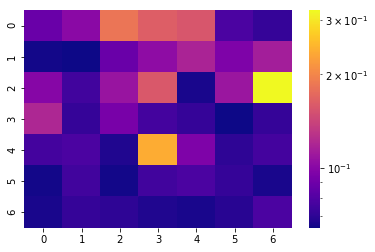

[[0.088 0.101 0.184 0.163 0.156 0.078 0.072]
 [0.065 0.064 0.088 0.103 0.118 0.096 0.114]
 [0.099 0.075 0.108 0.158 0.066 0.109 0.322]
 [0.12  0.072 0.094 0.076 0.072 0.064 0.072]
 [0.076 0.078 0.067 0.239 0.096 0.07  0.076]
 [0.065 0.075 0.065 0.075 0.078 0.072 0.066]
 [0.066 0.072 0.07  0.067 0.066 0.069 0.078]]


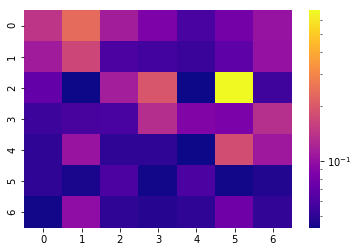

[[0.144 0.239 0.114 0.085 0.06  0.08  0.103]
 [0.111 0.172 0.061 0.057 0.054 0.069 0.102]
 [0.072 0.043 0.115 0.197 0.043 0.675 0.056]
 [0.055 0.059 0.06  0.134 0.088 0.084 0.135]
 [0.051 0.104 0.051 0.05  0.043 0.183 0.109]
 [0.051 0.045 0.061 0.044 0.061 0.044 0.047]
 [0.044 0.098 0.051 0.048 0.051 0.077 0.052]]


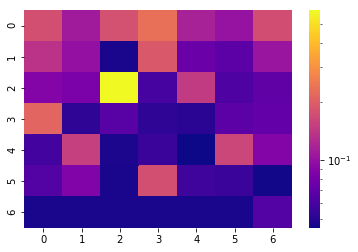

[[0.176 0.109 0.177 0.231 0.116 0.102 0.173]
 [0.137 0.1   0.047 0.19  0.075 0.068 0.104]
 [0.089 0.083 0.587 0.06  0.146 0.063 0.07 ]
 [0.212 0.052 0.067 0.052 0.051 0.068 0.072]
 [0.059 0.152 0.048 0.056 0.045 0.161 0.089]
 [0.065 0.087 0.047 0.175 0.057 0.056 0.046]
 [0.047 0.047 0.047 0.047 0.047 0.047 0.065]]


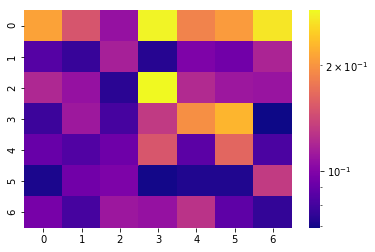

[[0.212 0.151 0.108 0.282 0.186 0.206 0.269]
 [0.085 0.077 0.116 0.073 0.099 0.094 0.119]
 [0.121 0.108 0.074 0.287 0.122 0.111 0.109]
 [0.078 0.112 0.081 0.132 0.196 0.228 0.069]
 [0.091 0.084 0.093 0.152 0.087 0.164 0.082]
 [0.071 0.094 0.098 0.07  0.072 0.072 0.133]
 [0.096 0.081 0.111 0.108 0.128 0.088 0.076]]


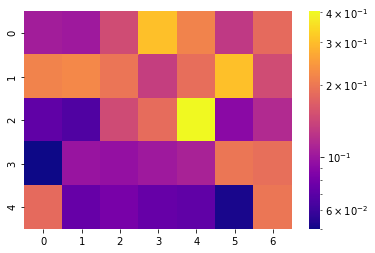

[[0.105 0.102 0.148 0.306 0.214 0.128 0.183]
 [0.214 0.222 0.196 0.134 0.187 0.306 0.148]
 [0.072 0.066 0.146 0.185 0.404 0.09  0.115]
 [0.05  0.098 0.096 0.102 0.109 0.197 0.188]
 [0.182 0.074 0.082 0.074 0.072 0.052 0.197]]


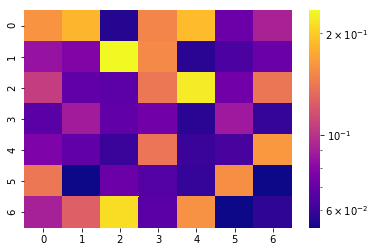

[[0.161 0.184 0.056 0.151 0.188 0.072 0.092]
 [0.085 0.078 0.234 0.154 0.057 0.064 0.071]
 [0.106 0.069 0.068 0.142 0.223 0.073 0.141]
 [0.067 0.089 0.069 0.073 0.057 0.088 0.059]
 [0.077 0.069 0.06  0.14  0.06  0.063 0.164]
 [0.142 0.053 0.072 0.066 0.059 0.157 0.053]
 [0.091 0.126 0.212 0.067 0.159 0.053 0.058]]


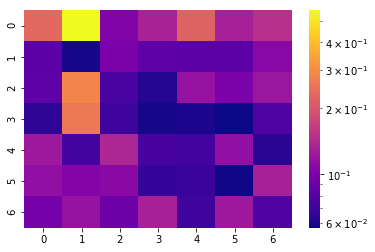

[[0.23  0.56  0.102 0.134 0.221 0.131 0.15 ]
 [0.083 0.059 0.1   0.084 0.083 0.083 0.108]
 [0.084 0.285 0.075 0.062 0.118 0.099 0.121]
 [0.065 0.262 0.07  0.059 0.06  0.057 0.077]
 [0.125 0.072 0.137 0.074 0.072 0.115 0.064]
 [0.115 0.104 0.109 0.067 0.069 0.058 0.131]
 [0.096 0.118 0.092 0.131 0.071 0.125 0.078]]


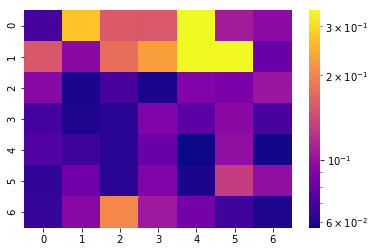

[[0.07  0.272 0.157 0.156 0.342 0.107 0.096]
 [0.155 0.095 0.176 0.228 0.342 0.342 0.081]
 [0.094 0.059 0.07  0.059 0.09  0.088 0.103]
 [0.069 0.06  0.062 0.09  0.077 0.095 0.07 ]
 [0.073 0.067 0.062 0.082 0.057 0.098 0.058]
 [0.064 0.084 0.062 0.09  0.059 0.132 0.098]
 [0.065 0.094 0.205 0.105 0.086 0.067 0.06 ]]


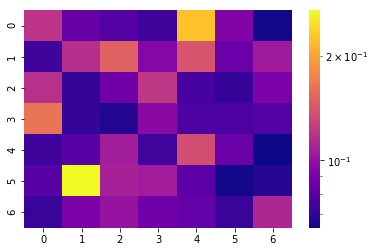

[[0.12  0.084 0.079 0.073 0.224 0.093 0.065]
 [0.073 0.116 0.151 0.095 0.14  0.085 0.105]
 [0.118 0.071 0.087 0.122 0.075 0.071 0.091]
 [0.163 0.071 0.067 0.096 0.077 0.077 0.079]
 [0.073 0.08  0.107 0.074 0.136 0.085 0.064]
 [0.08  0.27  0.108 0.106 0.081 0.065 0.068]
 [0.072 0.091 0.101 0.087 0.083 0.072 0.112]]


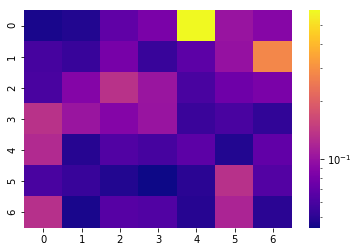

[[0.046 0.048 0.069 0.082 0.595 0.102 0.089]
 [0.059 0.054 0.081 0.054 0.068 0.1   0.278]
 [0.06  0.088 0.134 0.103 0.06  0.076 0.082]
 [0.134 0.103 0.088 0.102 0.055 0.06  0.052]
 [0.125 0.049 0.063 0.059 0.068 0.048 0.07 ]
 [0.06  0.054 0.048 0.044 0.05  0.133 0.064]
 [0.132 0.046 0.065 0.063 0.049 0.119 0.05 ]]


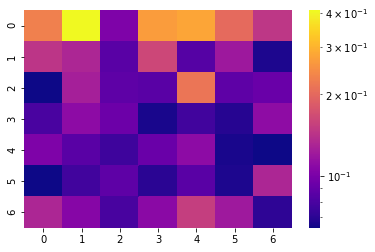

[[0.231 0.41  0.102 0.269 0.281 0.202 0.146]
 [0.145 0.131 0.086 0.162 0.084 0.12  0.067]
 [0.064 0.125 0.088 0.086 0.216 0.088 0.092]
 [0.08  0.11  0.094 0.066 0.077 0.069 0.111]
 [0.102 0.086 0.076 0.092 0.11  0.066 0.064]
 [0.064 0.077 0.088 0.07  0.086 0.067 0.131]
 [0.131 0.106 0.079 0.108 0.153 0.121 0.071]]


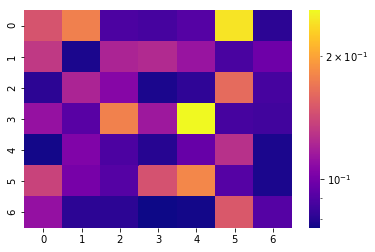

[[0.148 0.177 0.089 0.087 0.091 0.244 0.081]
 [0.132 0.078 0.121 0.124 0.113 0.088 0.098]
 [0.081 0.121 0.106 0.078 0.082 0.163 0.087]
 [0.112 0.092 0.178 0.115 0.259 0.087 0.086]
 [0.077 0.104 0.089 0.08  0.096 0.128 0.078]
 [0.138 0.101 0.091 0.147 0.181 0.091 0.078]
 [0.111 0.081 0.081 0.076 0.077 0.151 0.091]]


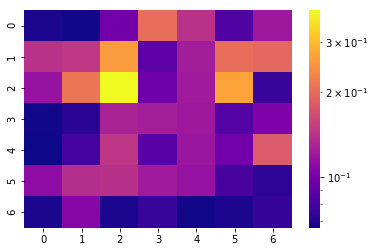

[[0.069 0.067 0.097 0.201 0.141 0.084 0.12 ]
 [0.141 0.146 0.257 0.088 0.123 0.201 0.195]
 [0.116 0.211 0.387 0.096 0.122 0.265 0.076]
 [0.067 0.072 0.129 0.124 0.12  0.085 0.102]
 [0.066 0.08  0.145 0.087 0.118 0.097 0.18 ]
 [0.111 0.137 0.14  0.122 0.115 0.081 0.073]
 [0.069 0.107 0.069 0.076 0.067 0.069 0.075]]


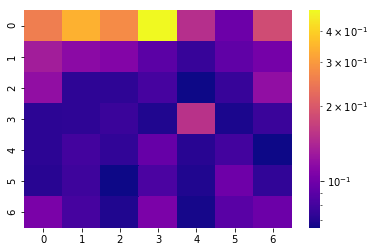

[[0.255 0.342 0.276 0.483 0.15  0.098 0.183]
 [0.132 0.116 0.11  0.09  0.076 0.092 0.103]
 [0.119 0.073 0.073 0.081 0.065 0.076 0.119]
 [0.072 0.073 0.077 0.069 0.153 0.068 0.077]
 [0.072 0.08  0.074 0.095 0.071 0.08  0.065]
 [0.071 0.078 0.065 0.083 0.069 0.099 0.074]
 [0.105 0.081 0.069 0.106 0.067 0.089 0.098]]


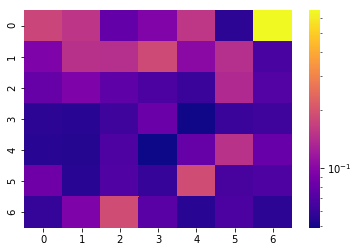

[[0.176 0.153 0.079 0.095 0.155 0.056 0.658]
 [0.094 0.148 0.145 0.184 0.102 0.144 0.067]
 [0.08  0.094 0.076 0.068 0.061 0.137 0.071]
 [0.056 0.055 0.063 0.082 0.05  0.061 0.063]
 [0.055 0.054 0.069 0.049 0.08  0.149 0.081]
 [0.085 0.055 0.07  0.06  0.188 0.066 0.069]
 [0.059 0.094 0.188 0.074 0.055 0.068 0.056]]
SKIPPPPPPEDDDD


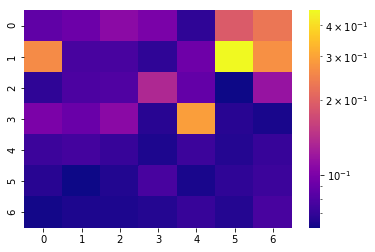

[[0.087 0.092 0.109 0.099 0.069 0.192 0.23 ]
 [0.262 0.077 0.077 0.069 0.093 0.46  0.271]
 [0.069 0.079 0.08  0.135 0.088 0.061 0.116]
 [0.1   0.091 0.108 0.067 0.293 0.067 0.063]
 [0.073 0.076 0.071 0.064 0.073 0.066 0.071]
 [0.067 0.061 0.065 0.077 0.063 0.069 0.073]
 [0.062 0.064 0.064 0.066 0.071 0.066 0.077]]


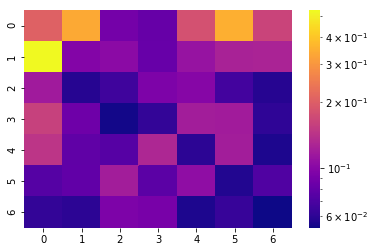

[[0.204 0.34  0.089 0.082 0.18  0.352 0.163]
 [0.528 0.097 0.103 0.083 0.11  0.125 0.126]
 [0.117 0.058 0.066 0.094 0.099 0.067 0.058]
 [0.159 0.086 0.054 0.062 0.119 0.118 0.061]
 [0.146 0.079 0.075 0.129 0.06  0.119 0.056]
 [0.074 0.08  0.119 0.077 0.105 0.057 0.072]
 [0.062 0.06  0.094 0.091 0.056 0.063 0.053]]


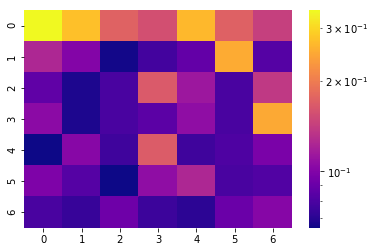

[[0.343 0.275 0.174 0.157 0.266 0.173 0.143]
 [0.124 0.101 0.066 0.077 0.088 0.25  0.083]
 [0.087 0.068 0.079 0.166 0.113 0.079 0.138]
 [0.105 0.068 0.079 0.085 0.107 0.079 0.248]
 [0.065 0.103 0.076 0.168 0.076 0.081 0.097]
 [0.099 0.083 0.065 0.107 0.124 0.079 0.082]
 [0.079 0.074 0.092 0.075 0.071 0.091 0.102]]


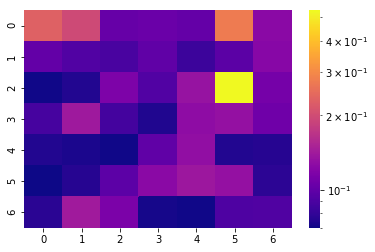

[[0.231 0.197 0.103 0.105 0.102 0.274 0.124]
 [0.101 0.093 0.089 0.1   0.084 0.097 0.122]
 [0.071 0.075 0.116 0.093 0.134 0.533 0.111]
 [0.088 0.14  0.087 0.074 0.127 0.132 0.108]
 [0.075 0.073 0.071 0.1   0.129 0.075 0.076]
 [0.07  0.076 0.098 0.124 0.138 0.132 0.078]
 [0.077 0.141 0.115 0.072 0.071 0.091 0.092]]


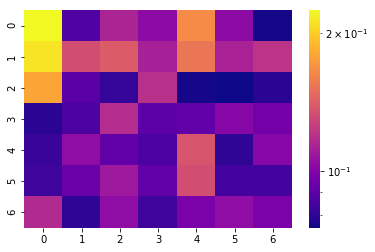

[[0.224 0.087 0.114 0.103 0.165 0.103 0.076]
 [0.212 0.133 0.14  0.112 0.154 0.113 0.121]
 [0.179 0.089 0.081 0.119 0.076 0.075 0.079]
 [0.079 0.086 0.117 0.09  0.091 0.101 0.096]
 [0.082 0.104 0.091 0.086 0.137 0.08  0.101]
 [0.083 0.093 0.109 0.091 0.133 0.084 0.084]
 [0.116 0.08  0.104 0.083 0.098 0.104 0.098]]


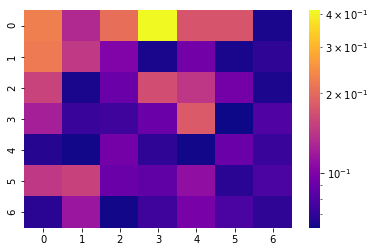

[[0.227 0.131 0.206 0.412 0.175 0.175 0.064]
 [0.221 0.146 0.101 0.064 0.094 0.064 0.069]
 [0.156 0.064 0.09  0.168 0.144 0.095 0.065]
 [0.123 0.072 0.074 0.091 0.181 0.062 0.08 ]
 [0.067 0.063 0.095 0.069 0.063 0.091 0.072]
 [0.145 0.155 0.091 0.086 0.11  0.068 0.078]
 [0.068 0.116 0.063 0.074 0.097 0.078 0.069]]


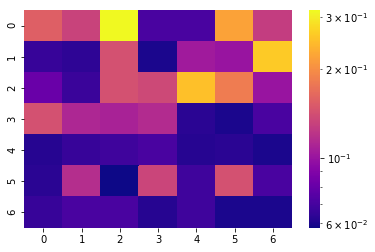

[[0.156 0.132 0.316 0.071 0.071 0.22  0.128]
 [0.066 0.064 0.143 0.06  0.104 0.1   0.261]
 [0.081 0.067 0.143 0.137 0.252 0.183 0.1  ]
 [0.143 0.112 0.109 0.115 0.063 0.06  0.071]
 [0.062 0.066 0.068 0.071 0.062 0.063 0.06 ]
 [0.063 0.117 0.058 0.134 0.068 0.143 0.071]
 [0.066 0.071 0.071 0.062 0.068 0.06  0.06 ]]


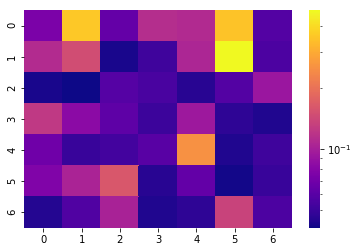

[[0.075 0.36  0.065 0.113 0.11  0.351 0.058]
 [0.111 0.148 0.043 0.052 0.106 0.48  0.056]
 [0.043 0.041 0.059 0.055 0.046 0.058 0.092]
 [0.125 0.083 0.062 0.051 0.094 0.047 0.044]
 [0.069 0.05  0.053 0.06  0.254 0.044 0.052]
 [0.077 0.104 0.162 0.046 0.064 0.042 0.05 ]
 [0.045 0.057 0.103 0.044 0.047 0.136 0.056]]


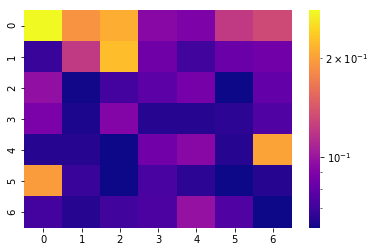

[[0.278 0.19  0.211 0.093 0.089 0.122 0.132]
 [0.069 0.122 0.224 0.084 0.071 0.083 0.085]
 [0.097 0.062 0.072 0.078 0.087 0.061 0.081]
 [0.088 0.063 0.091 0.065 0.065 0.066 0.075]
 [0.065 0.065 0.061 0.085 0.093 0.065 0.202]
 [0.197 0.069 0.061 0.073 0.066 0.061 0.065]
 [0.072 0.065 0.071 0.074 0.098 0.075 0.061]]


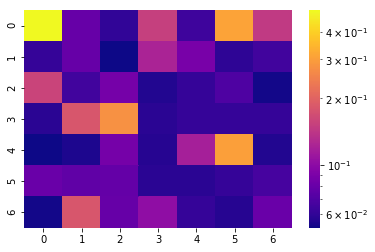

[[0.499 0.08  0.06  0.152 0.064 0.311 0.145]
 [0.061 0.08  0.052 0.122 0.089 0.059 0.065]
 [0.157 0.065 0.087 0.056 0.061 0.07  0.053]
 [0.058 0.182 0.278 0.058 0.061 0.061 0.061]
 [0.052 0.055 0.087 0.057 0.118 0.304 0.056]
 [0.081 0.077 0.079 0.058 0.058 0.061 0.067]
 [0.053 0.182 0.08  0.102 0.061 0.057 0.081]]


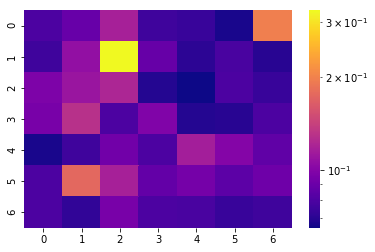

[[0.08  0.089 0.117 0.076 0.074 0.067 0.197]
 [0.076 0.107 0.327 0.088 0.071 0.079 0.07 ]
 [0.097 0.11  0.121 0.069 0.065 0.08  0.074]
 [0.095 0.129 0.08  0.098 0.069 0.07  0.08 ]
 [0.067 0.076 0.092 0.08  0.116 0.1   0.086]
 [0.08  0.174 0.117 0.087 0.094 0.085 0.091]
 [0.08  0.072 0.095 0.08  0.079 0.074 0.076]]


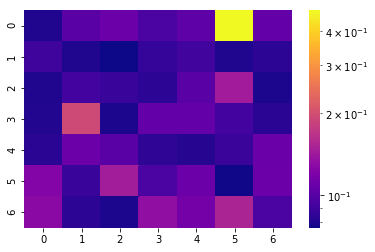

[[0.08  0.102 0.111 0.095 0.104 0.478 0.106]
 [0.09  0.08  0.076 0.087 0.091 0.08  0.084]
 [0.08  0.092 0.088 0.084 0.102 0.145 0.079]
 [0.081 0.194 0.079 0.106 0.106 0.092 0.083]
 [0.083 0.111 0.102 0.085 0.082 0.089 0.109]
 [0.123 0.088 0.146 0.095 0.111 0.077 0.111]
 [0.128 0.084 0.079 0.133 0.115 0.153 0.095]]


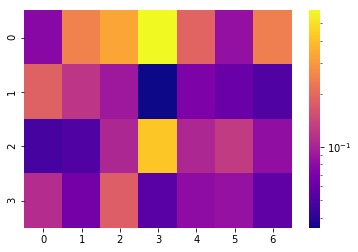

[[0.077 0.248 0.333 0.593 0.191 0.084 0.241]
 [0.185 0.121 0.091 0.035 0.071 0.062 0.051]
 [0.048 0.052 0.105 0.423 0.105 0.128 0.082]
 [0.111 0.066 0.181 0.055 0.081 0.085 0.057]]


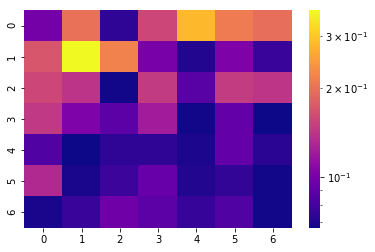

[[0.098 0.199 0.074 0.157 0.281 0.211 0.195]
 [0.171 0.366 0.218 0.1   0.071 0.102 0.077]
 [0.157 0.14  0.068 0.146 0.087 0.147 0.141]
 [0.144 0.103 0.089 0.121 0.068 0.092 0.067]
 [0.084 0.067 0.074 0.074 0.07  0.091 0.073]
 [0.131 0.069 0.078 0.093 0.071 0.075 0.068]
 [0.069 0.077 0.096 0.089 0.076 0.084 0.068]]


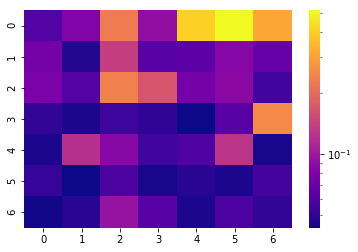

[[0.061 0.081 0.229 0.091 0.403 0.513 0.311]
 [0.075 0.047 0.138 0.063 0.064 0.084 0.069]
 [0.078 0.061 0.237 0.168 0.076 0.087 0.055]
 [0.051 0.046 0.054 0.05  0.043 0.063 0.254]
 [0.046 0.121 0.086 0.055 0.06  0.127 0.045]
 [0.052 0.043 0.059 0.045 0.048 0.046 0.056]
 [0.044 0.048 0.095 0.063 0.046 0.059 0.051]]


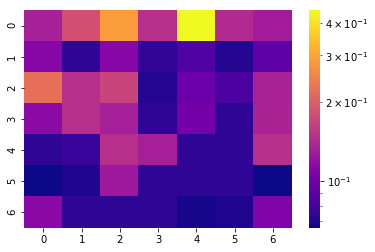

[[0.133 0.182 0.288 0.147 0.446 0.142 0.129]
 [0.112 0.074 0.111 0.075 0.085 0.071 0.091]
 [0.222 0.147 0.169 0.071 0.098 0.084 0.135]
 [0.114 0.147 0.132 0.074 0.101 0.074 0.136]
 [0.074 0.077 0.147 0.132 0.074 0.074 0.147]
 [0.066 0.07  0.126 0.074 0.074 0.074 0.066]
 [0.113 0.074 0.074 0.074 0.068 0.07  0.108]]


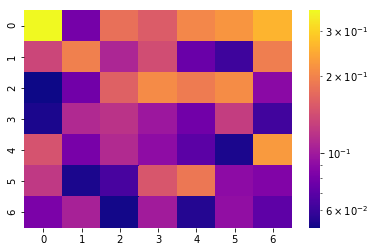

[[0.361 0.08  0.178 0.156 0.205 0.223 0.26 ]
 [0.135 0.196 0.108 0.141 0.075 0.061 0.193]
 [0.051 0.078 0.161 0.209 0.191 0.211 0.089]
 [0.053 0.111 0.119 0.098 0.078 0.127 0.062]
 [0.147 0.081 0.112 0.091 0.07  0.053 0.227]
 [0.123 0.053 0.064 0.15  0.187 0.09  0.085]
 [0.082 0.105 0.052 0.101 0.055 0.092 0.071]]


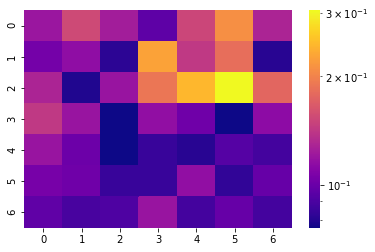

[[0.12  0.154 0.124 0.096 0.152 0.21  0.129]
 [0.104 0.115 0.082 0.227 0.142 0.183 0.081]
 [0.129 0.079 0.119 0.19  0.245 0.305 0.177]
 [0.142 0.119 0.076 0.116 0.102 0.076 0.114]
 [0.119 0.101 0.076 0.085 0.081 0.093 0.088]
 [0.105 0.102 0.085 0.085 0.116 0.083 0.099]
 [0.097 0.089 0.091 0.119 0.088 0.099 0.088]]


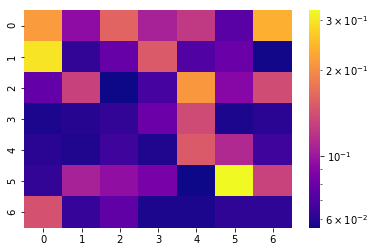

[[0.215 0.094 0.16  0.107 0.124 0.074 0.237]
 [0.297 0.063 0.078 0.151 0.071 0.079 0.057]
 [0.077 0.13  0.056 0.068 0.21  0.091 0.139]
 [0.058 0.06  0.063 0.08  0.138 0.058 0.061]
 [0.061 0.059 0.066 0.059 0.151 0.112 0.066]
 [0.063 0.107 0.095 0.085 0.056 0.323 0.131]
 [0.144 0.064 0.076 0.058 0.058 0.062 0.062]]
SKIPPPPPPEDDDD


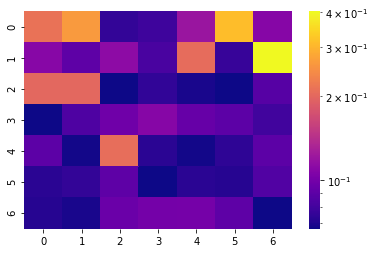

[[0.214 0.264 0.076 0.079 0.12  0.313 0.109]
 [0.11  0.091 0.113 0.083 0.207 0.077 0.403]
 [0.201 0.201 0.067 0.075 0.069 0.067 0.088]
 [0.067 0.085 0.098 0.109 0.094 0.09  0.08 ]
 [0.09  0.068 0.208 0.073 0.068 0.074 0.09 ]
 [0.073 0.076 0.091 0.067 0.073 0.072 0.086]
 [0.072 0.069 0.096 0.1   0.101 0.091 0.067]]


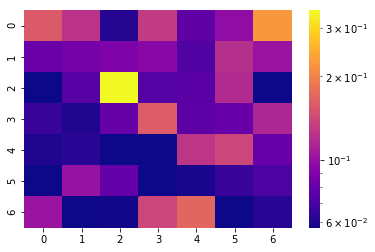

[[0.158 0.124 0.061 0.13  0.078 0.098 0.222]
 [0.082 0.086 0.09  0.094 0.073 0.121 0.102]
 [0.057 0.075 0.346 0.074 0.076 0.117 0.057]
 [0.066 0.06  0.08  0.161 0.077 0.081 0.115]
 [0.06  0.062 0.057 0.057 0.126 0.14  0.081]
 [0.057 0.101 0.079 0.057 0.059 0.066 0.071]
 [0.103 0.057 0.058 0.14  0.17  0.057 0.062]]


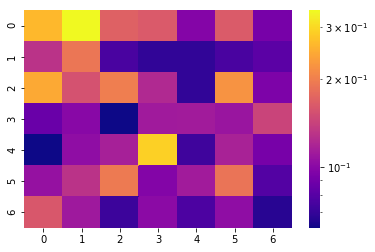

[[0.263 0.342 0.169 0.163 0.098 0.164 0.092]
 [0.13  0.191 0.076 0.069 0.069 0.076 0.082]
 [0.246 0.155 0.199 0.122 0.069 0.221 0.095]
 [0.087 0.1   0.062 0.112 0.113 0.108 0.143]
 [0.062 0.103 0.116 0.29  0.073 0.117 0.092]
 [0.106 0.13  0.195 0.097 0.113 0.188 0.079]
 [0.16  0.111 0.072 0.101 0.077 0.103 0.067]]


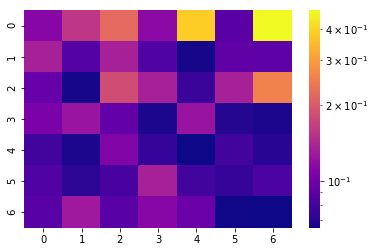

[[0.112 0.156 0.22  0.115 0.384 0.089 0.472]
 [0.134 0.086 0.134 0.085 0.067 0.092 0.091]
 [0.095 0.067 0.182 0.134 0.077 0.134 0.256]
 [0.105 0.124 0.094 0.068 0.123 0.07  0.068]
 [0.079 0.068 0.109 0.075 0.065 0.079 0.071]
 [0.085 0.072 0.082 0.134 0.079 0.075 0.083]
 [0.088 0.128 0.088 0.112 0.096 0.066 0.065]]


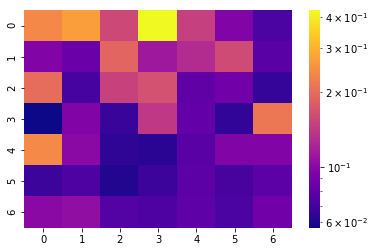

[[0.239 0.271 0.157 0.424 0.148 0.096 0.073]
 [0.096 0.085 0.191 0.112 0.128 0.16  0.078]
 [0.201 0.071 0.15  0.166 0.081 0.088 0.066]
 [0.057 0.096 0.067 0.14  0.082 0.065 0.216]
 [0.24  0.101 0.064 0.063 0.078 0.096 0.096]
 [0.068 0.074 0.061 0.068 0.079 0.072 0.079]
 [0.101 0.105 0.076 0.074 0.08  0.073 0.088]]
SKIPPPPPPEDDDD


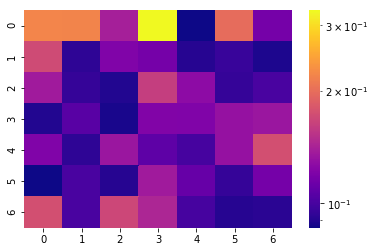

[[0.221 0.22  0.14  0.329 0.086 0.199 0.117]
 [0.171 0.093 0.121 0.117 0.091 0.096 0.089]
 [0.137 0.095 0.09  0.162 0.127 0.095 0.101]
 [0.09  0.106 0.088 0.122 0.121 0.131 0.134]
 [0.121 0.093 0.134 0.108 0.1   0.131 0.175]
 [0.086 0.101 0.091 0.137 0.111 0.095 0.117]
 [0.175 0.101 0.169 0.144 0.1   0.091 0.092]]


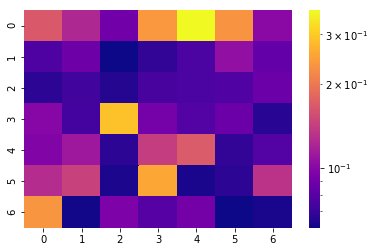

[[0.167 0.123 0.09  0.238 0.366 0.233 0.101]
 [0.077 0.089 0.061 0.069 0.076 0.106 0.085]
 [0.067 0.073 0.065 0.075 0.076 0.078 0.088]
 [0.1   0.074 0.29  0.092 0.079 0.088 0.066]
 [0.097 0.112 0.067 0.141 0.169 0.069 0.079]
 [0.127 0.145 0.064 0.256 0.063 0.067 0.132]
 [0.234 0.062 0.095 0.08  0.091 0.061 0.063]]


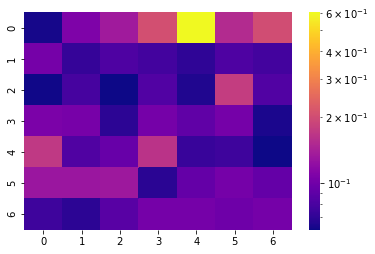

[[0.063 0.109 0.135 0.205 0.602 0.154 0.201]
 [0.103 0.072 0.082 0.077 0.07  0.082 0.077]
 [0.062 0.079 0.061 0.084 0.065 0.177 0.084]
 [0.107 0.104 0.069 0.103 0.091 0.103 0.064]
 [0.172 0.083 0.095 0.164 0.073 0.075 0.061]
 [0.13  0.13  0.132 0.068 0.093 0.103 0.093]
 [0.075 0.069 0.087 0.103 0.103 0.098 0.103]]


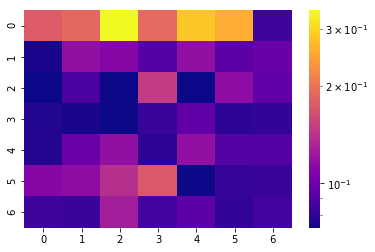

[[0.177 0.188 0.342 0.189 0.284 0.259 0.084]
 [0.075 0.117 0.111 0.091 0.117 0.094 0.099]
 [0.073 0.089 0.073 0.149 0.073 0.115 0.096]
 [0.077 0.075 0.073 0.083 0.096 0.079 0.081]
 [0.078 0.1   0.117 0.079 0.117 0.091 0.091]
 [0.111 0.115 0.139 0.174 0.073 0.082 0.083]
 [0.084 0.083 0.127 0.086 0.094 0.081 0.086]]


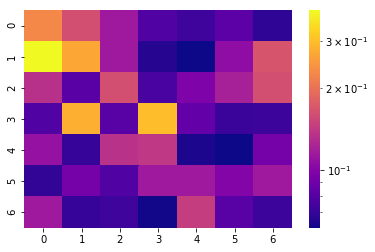

[[0.228 0.163 0.115 0.078 0.073 0.083 0.068]
 [0.388 0.267 0.115 0.066 0.061 0.106 0.168]
 [0.134 0.082 0.162 0.076 0.097 0.12  0.163]
 [0.078 0.28  0.081 0.297 0.086 0.071 0.072]
 [0.109 0.07  0.135 0.14  0.064 0.061 0.093]
 [0.069 0.093 0.078 0.115 0.115 0.099 0.115]
 [0.115 0.07  0.073 0.062 0.146 0.081 0.072]]


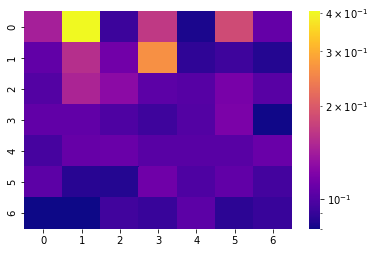

[[0.144 0.404 0.092 0.166 0.083 0.184 0.108]
 [0.107 0.157 0.114 0.264 0.088 0.093 0.085]
 [0.101 0.148 0.127 0.105 0.102 0.117 0.103]
 [0.107 0.107 0.099 0.093 0.101 0.119 0.081]
 [0.096 0.109 0.11  0.103 0.103 0.103 0.11 ]
 [0.105 0.086 0.085 0.113 0.099 0.107 0.095]
 [0.08  0.08  0.094 0.091 0.105 0.087 0.091]]


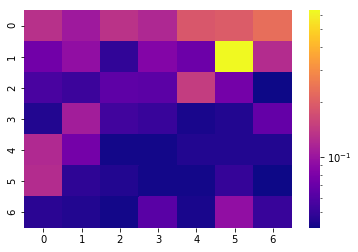

[[0.131 0.105 0.133 0.12  0.189 0.196 0.23 ]
 [0.074 0.094 0.049 0.084 0.072 0.634 0.126]
 [0.057 0.052 0.065 0.064 0.148 0.076 0.041]
 [0.045 0.108 0.054 0.051 0.043 0.045 0.068]
 [0.122 0.076 0.042 0.042 0.045 0.045 0.045]
 [0.125 0.048 0.045 0.042 0.042 0.05  0.041]
 [0.047 0.045 0.042 0.063 0.043 0.094 0.051]]


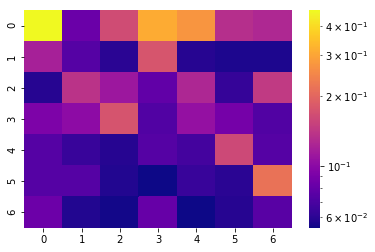

SKIPPPPPPEDDDD


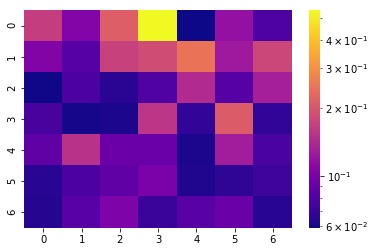

[[0.167 0.106 0.213 0.541 0.059 0.117 0.079]
 [0.105 0.082 0.172 0.185 0.247 0.126 0.178]
 [0.06  0.078 0.066 0.08  0.143 0.082 0.131]
 [0.076 0.061 0.062 0.156 0.068 0.21  0.068]
 [0.087 0.152 0.093 0.092 0.062 0.129 0.077]
 [0.065 0.078 0.087 0.101 0.063 0.067 0.072]
 [0.064 0.083 0.103 0.071 0.083 0.092 0.065]]


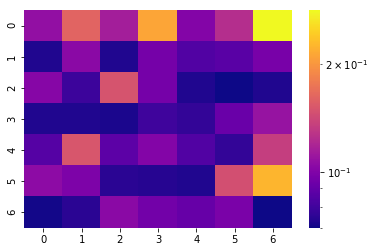

[[0.107 0.161 0.115 0.211 0.101 0.124 0.281]
 [0.073 0.104 0.073 0.096 0.085 0.087 0.097]
 [0.102 0.079 0.149 0.096 0.073 0.07  0.073]
 [0.073 0.073 0.072 0.08  0.077 0.092 0.109]
 [0.086 0.151 0.088 0.101 0.085 0.077 0.135]
 [0.105 0.099 0.075 0.074 0.073 0.146 0.224]
 [0.071 0.075 0.104 0.095 0.091 0.098 0.07 ]]


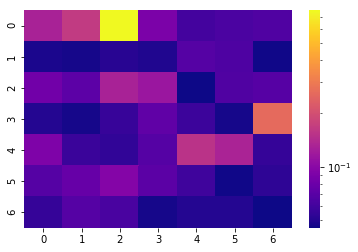

[[0.129 0.165 0.767 0.09  0.061 0.064 0.066]
 [0.048 0.047 0.051 0.049 0.068 0.065 0.046]
 [0.083 0.072 0.129 0.115 0.045 0.066 0.069]
 [0.05  0.047 0.056 0.074 0.058 0.047 0.261]
 [0.092 0.057 0.054 0.068 0.153 0.131 0.055]
 [0.068 0.077 0.096 0.071 0.059 0.046 0.053]
 [0.055 0.068 0.063 0.047 0.05  0.05  0.045]]
SKIPPPPPPEDDDD


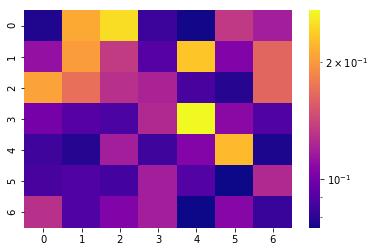

[[0.078 0.211 0.25  0.084 0.076 0.134 0.119]
 [0.112 0.202 0.135 0.091 0.231 0.104 0.164]
 [0.206 0.17  0.129 0.122 0.087 0.079 0.164]
 [0.101 0.091 0.088 0.125 0.271 0.108 0.089]
 [0.085 0.079 0.119 0.085 0.105 0.223 0.077]
 [0.087 0.089 0.086 0.119 0.09  0.075 0.125]
 [0.129 0.089 0.104 0.119 0.075 0.107 0.083]]


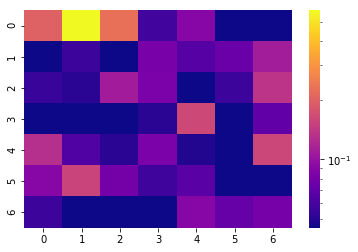

[[0.2   0.571 0.227 0.058 0.091 0.045 0.045]
 [0.045 0.056 0.045 0.082 0.066 0.075 0.111]
 [0.055 0.051 0.109 0.084 0.045 0.056 0.136]
 [0.045 0.045 0.045 0.051 0.163 0.045 0.071]
 [0.129 0.064 0.051 0.084 0.049 0.045 0.16 ]
 [0.091 0.157 0.08  0.057 0.067 0.045 0.045]
 [0.056 0.045 0.045 0.045 0.091 0.073 0.081]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


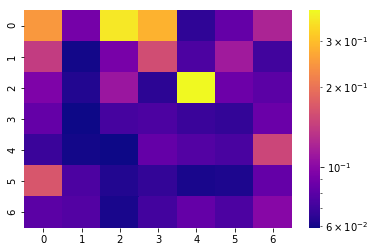

[[0.247 0.091 0.361 0.283 0.066 0.084 0.121]
 [0.141 0.06  0.092 0.158 0.075 0.113 0.071]
 [0.095 0.063 0.11  0.065 0.39  0.087 0.08 ]
 [0.084 0.059 0.073 0.075 0.069 0.067 0.086]
 [0.069 0.06  0.059 0.084 0.077 0.074 0.151]
 [0.168 0.075 0.063 0.067 0.061 0.062 0.084]
 [0.08  0.077 0.061 0.072 0.084 0.075 0.099]]


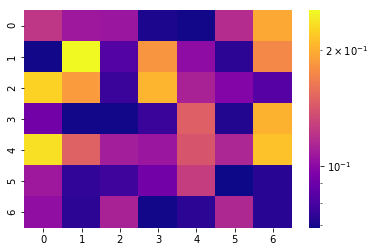

[[0.123 0.107 0.106 0.071 0.07  0.117 0.196]
 [0.07  0.253 0.083 0.183 0.101 0.074 0.174]
 [0.224 0.187 0.077 0.204 0.112 0.097 0.084]
 [0.092 0.07  0.07  0.077 0.147 0.072 0.203]
 [0.235 0.148 0.11  0.106 0.141 0.114 0.213]
 [0.107 0.075 0.078 0.092 0.127 0.069 0.073]
 [0.102 0.074 0.112 0.07  0.074 0.115 0.073]]


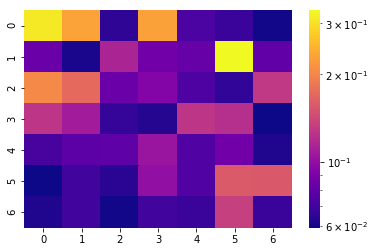

[[0.312 0.231 0.065 0.229 0.073 0.068 0.06 ]
 [0.083 0.061 0.114 0.086 0.082 0.333 0.08 ]
 [0.204 0.172 0.083 0.094 0.074 0.066 0.129]
 [0.126 0.108 0.067 0.063 0.126 0.121 0.059]
 [0.072 0.078 0.079 0.104 0.075 0.086 0.062]
 [0.059 0.07  0.064 0.1   0.075 0.157 0.156]
 [0.062 0.07  0.06  0.07  0.068 0.134 0.068]]


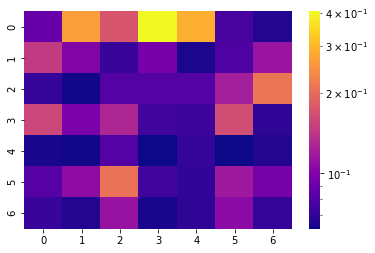

[[0.089 0.266 0.173 0.404 0.289 0.077 0.066]
 [0.147 0.101 0.072 0.096 0.065 0.079 0.114]
 [0.071 0.063 0.081 0.081 0.081 0.121 0.213]
 [0.158 0.098 0.128 0.075 0.073 0.165 0.069]
 [0.064 0.063 0.081 0.062 0.071 0.062 0.066]
 [0.082 0.108 0.209 0.075 0.07  0.118 0.095]
 [0.072 0.066 0.113 0.064 0.069 0.107 0.071]]


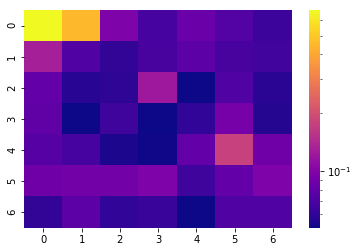

[[0.674 0.451 0.098 0.068 0.086 0.074 0.064]
 [0.13  0.072 0.061 0.069 0.078 0.069 0.066]
 [0.082 0.057 0.059 0.122 0.051 0.072 0.058]
 [0.08  0.051 0.065 0.051 0.06  0.093 0.056]
 [0.075 0.068 0.054 0.052 0.082 0.176 0.088]
 [0.088 0.09  0.09  0.098 0.065 0.082 0.098]
 [0.061 0.078 0.06  0.063 0.051 0.073 0.072]]


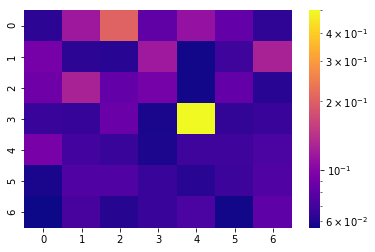

[[0.063 0.117 0.207 0.082 0.111 0.084 0.064]
 [0.093 0.063 0.062 0.118 0.057 0.069 0.127]
 [0.089 0.127 0.083 0.092 0.057 0.083 0.062]
 [0.067 0.066 0.087 0.058 0.5   0.065 0.067]
 [0.094 0.07  0.067 0.059 0.069 0.069 0.073]
 [0.058 0.076 0.075 0.067 0.062 0.068 0.075]
 [0.056 0.072 0.061 0.067 0.073 0.057 0.081]]


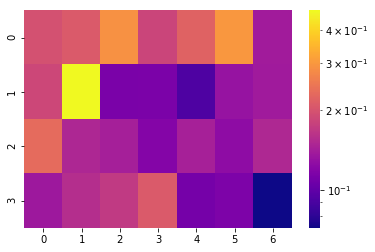

[[0.197 0.209 0.291 0.183 0.22  0.298 0.139]
 [0.185 0.473 0.113 0.114 0.092 0.131 0.138]
 [0.232 0.15  0.142 0.119 0.143 0.125 0.151]
 [0.136 0.156 0.169 0.208 0.111 0.115 0.072]]


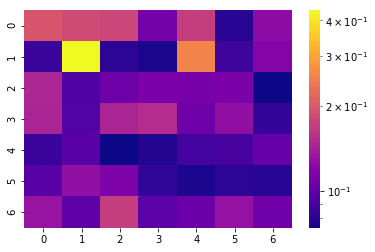

[[0.195 0.184 0.178 0.111 0.17  0.08  0.124]
 [0.086 0.434 0.081 0.077 0.256 0.087 0.118]
 [0.146 0.094 0.107 0.113 0.112 0.114 0.074]
 [0.145 0.095 0.145 0.152 0.107 0.126 0.084]
 [0.086 0.097 0.074 0.079 0.089 0.091 0.104]
 [0.097 0.127 0.115 0.083 0.077 0.081 0.08 ]
 [0.131 0.1   0.17  0.099 0.106 0.129 0.108]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


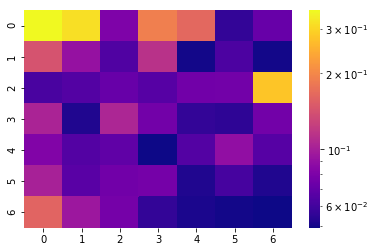

[[0.355 0.314 0.081 0.191 0.164 0.056 0.072]
 [0.143 0.091 0.064 0.114 0.05  0.063 0.05 ]
 [0.062 0.065 0.072 0.066 0.075 0.076 0.279]
 [0.103 0.052 0.105 0.076 0.056 0.055 0.076]
 [0.082 0.065 0.069 0.049 0.065 0.089 0.066]
 [0.102 0.067 0.075 0.077 0.052 0.061 0.052]
 [0.161 0.095 0.077 0.056 0.051 0.05  0.049]]


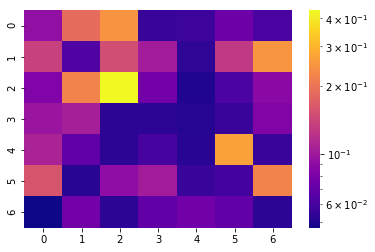

[[0.093 0.187 0.247 0.056 0.057 0.075 0.061]
 [0.136 0.064 0.15  0.102 0.054 0.128 0.25 ]
 [0.083 0.223 0.434 0.077 0.05  0.062 0.088]
 [0.097 0.105 0.053 0.053 0.051 0.056 0.084]
 [0.109 0.07  0.053 0.06  0.052 0.267 0.056]
 [0.159 0.052 0.091 0.102 0.056 0.059 0.224]
 [0.047 0.077 0.053 0.07  0.076 0.07  0.053]]


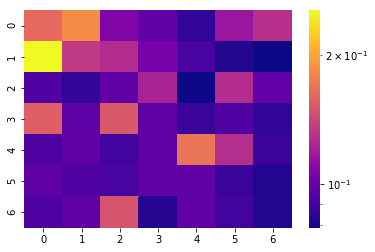

[[0.163 0.184 0.107 0.097 0.085 0.116 0.129]
 [0.254 0.134 0.127 0.103 0.091 0.082 0.079]
 [0.093 0.085 0.097 0.122 0.079 0.127 0.098]
 [0.156 0.096 0.152 0.097 0.087 0.092 0.085]
 [0.092 0.097 0.089 0.097 0.169 0.128 0.087]
 [0.097 0.092 0.091 0.097 0.097 0.087 0.082]
 [0.092 0.097 0.15  0.083 0.097 0.089 0.082]]


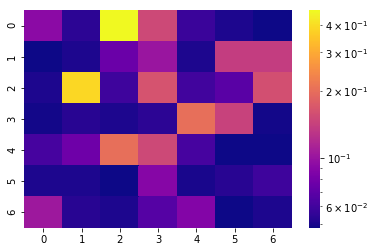

[[0.092 0.054 0.465 0.152 0.058 0.051 0.048]
 [0.048 0.051 0.076 0.101 0.051 0.138 0.138]
 [0.051 0.386 0.059 0.164 0.06  0.069 0.16 ]
 [0.049 0.053 0.051 0.054 0.202 0.143 0.049]
 [0.062 0.077 0.202 0.152 0.062 0.048 0.048]
 [0.051 0.051 0.048 0.089 0.05  0.053 0.059]
 [0.103 0.053 0.051 0.067 0.087 0.048 0.051]]


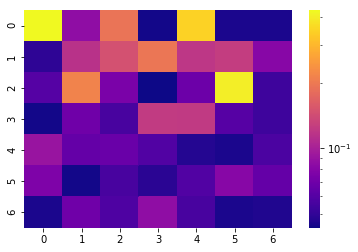

[[0.431 0.086 0.192 0.044 0.35  0.045 0.045]
 [0.049 0.115 0.147 0.196 0.119 0.126 0.081]
 [0.06  0.215 0.075 0.043 0.069 0.406 0.053]
 [0.044 0.07  0.056 0.124 0.123 0.061 0.053]
 [0.09  0.066 0.068 0.059 0.047 0.045 0.057]
 [0.077 0.044 0.056 0.048 0.059 0.081 0.066]
 [0.045 0.07  0.058 0.086 0.056 0.045 0.046]]


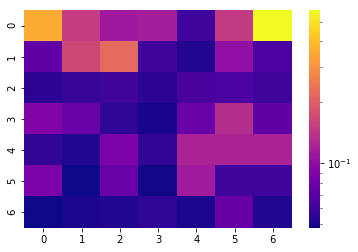

[[0.36  0.152 0.112 0.116 0.06  0.149 0.569]
 [0.074 0.167 0.22  0.061 0.052 0.102 0.066]
 [0.054 0.058 0.06  0.054 0.064 0.065 0.061]
 [0.091 0.079 0.056 0.05  0.079 0.133 0.074]
 [0.057 0.052 0.088 0.057 0.122 0.122 0.122]
 [0.088 0.048 0.078 0.049 0.113 0.061 0.061]
 [0.048 0.051 0.052 0.056 0.051 0.077 0.052]]


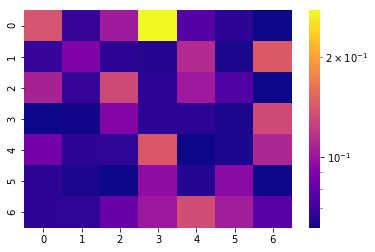

[[0.139 0.068 0.103 0.276 0.076 0.066 0.061]
 [0.068 0.089 0.066 0.065 0.112 0.063 0.143]
 [0.107 0.068 0.132 0.066 0.102 0.075 0.061]
 [0.061 0.062 0.091 0.066 0.066 0.063 0.132]
 [0.086 0.066 0.067 0.141 0.061 0.063 0.11 ]
 [0.066 0.063 0.061 0.096 0.065 0.094 0.061]
 [0.066 0.067 0.082 0.101 0.134 0.104 0.077]]


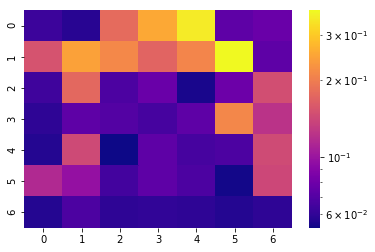

[[0.063 0.058 0.179 0.254 0.352 0.074 0.078]
 [0.153 0.246 0.214 0.171 0.211 0.375 0.074]
 [0.064 0.175 0.068 0.078 0.055 0.079 0.148]
 [0.059 0.074 0.07  0.066 0.074 0.212 0.123]
 [0.057 0.144 0.053 0.074 0.066 0.068 0.145]
 [0.115 0.097 0.065 0.074 0.068 0.054 0.141]
 [0.057 0.068 0.059 0.06  0.059 0.057 0.059]]


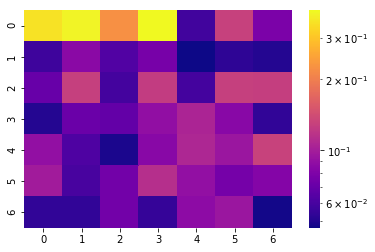

[[0.35  0.381 0.224 0.392 0.058 0.13  0.079]
 [0.057 0.086 0.063 0.077 0.047 0.053 0.051]
 [0.071 0.129 0.059 0.125 0.059 0.129 0.128]
 [0.051 0.072 0.069 0.089 0.105 0.085 0.054]
 [0.09  0.062 0.049 0.085 0.107 0.095 0.131]
 [0.099 0.06  0.075 0.114 0.09  0.076 0.083]
 [0.054 0.054 0.075 0.055 0.087 0.095 0.048]]


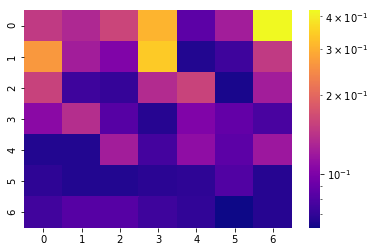

[[0.148 0.132 0.16  0.306 0.085 0.122 0.422]
 [0.267 0.122 0.101 0.34  0.066 0.074 0.148]
 [0.156 0.074 0.071 0.135 0.158 0.064 0.122]
 [0.107 0.137 0.083 0.067 0.101 0.088 0.078]
 [0.066 0.066 0.122 0.076 0.11  0.085 0.118]
 [0.069 0.066 0.066 0.068 0.069 0.081 0.067]
 [0.075 0.083 0.083 0.074 0.07  0.062 0.067]]


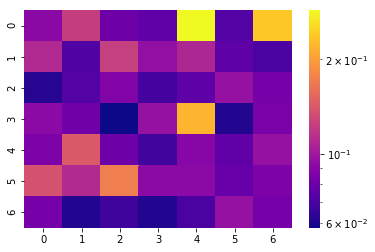

[[0.091 0.123 0.081 0.077 0.287 0.073 0.239]
 [0.109 0.072 0.124 0.095 0.108 0.076 0.071]
 [0.062 0.073 0.088 0.069 0.076 0.096 0.084]
 [0.092 0.082 0.058 0.096 0.22  0.061 0.085]
 [0.086 0.143 0.081 0.068 0.09  0.077 0.096]
 [0.137 0.11  0.173 0.092 0.092 0.079 0.086]
 [0.084 0.061 0.067 0.061 0.071 0.096 0.084]]


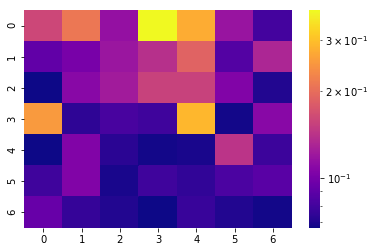

[[0.16  0.211 0.115 0.38  0.276 0.117 0.081]
 [0.091 0.101 0.119 0.139 0.188 0.086 0.131]
 [0.067 0.109 0.123 0.155 0.155 0.105 0.071]
 [0.253 0.074 0.082 0.079 0.288 0.068 0.109]
 [0.067 0.105 0.073 0.068 0.069 0.143 0.078]
 [0.079 0.105 0.069 0.079 0.075 0.083 0.088]
 [0.094 0.076 0.071 0.067 0.077 0.071 0.068]]


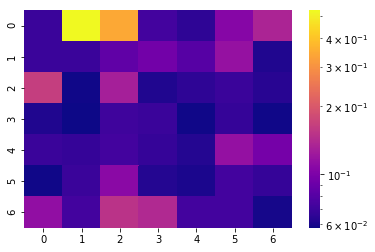

[[0.07  0.532 0.345 0.073 0.066 0.106 0.135]
 [0.07  0.07  0.085 0.095 0.081 0.116 0.062]
 [0.165 0.059 0.129 0.062 0.066 0.07  0.064]
 [0.062 0.058 0.072 0.07  0.059 0.068 0.059]
 [0.07  0.068 0.073 0.068 0.063 0.115 0.096]
 [0.059 0.07  0.109 0.063 0.061 0.073 0.068]
 [0.113 0.073 0.151 0.14  0.073 0.073 0.06 ]]


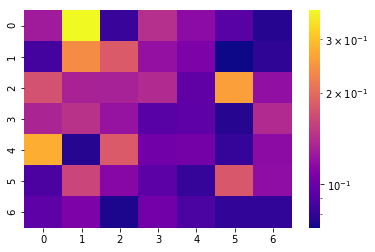

[[0.127 0.374 0.082 0.143 0.116 0.093 0.077]
 [0.086 0.238 0.182 0.12  0.108 0.072 0.079]
 [0.173 0.133 0.132 0.139 0.096 0.26  0.119]
 [0.135 0.146 0.122 0.093 0.095 0.077 0.139]
 [0.277 0.077 0.182 0.103 0.104 0.081 0.116]
 [0.089 0.163 0.113 0.094 0.081 0.18  0.118]
 [0.095 0.108 0.075 0.103 0.088 0.08  0.08 ]]


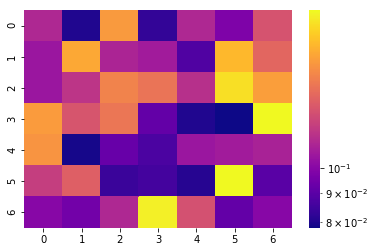

[[0.111 0.08  0.155 0.083 0.111 0.098 0.127]
 [0.105 0.161 0.11  0.107 0.088 0.167 0.135]
 [0.105 0.116 0.146 0.14  0.114 0.182 0.157]
 [0.156 0.128 0.141 0.092 0.08  0.078 0.192]
 [0.153 0.079 0.093 0.087 0.105 0.107 0.109]
 [0.119 0.132 0.084 0.086 0.081 0.192 0.09 ]
 [0.1   0.095 0.111 0.188 0.126 0.092 0.1  ]]


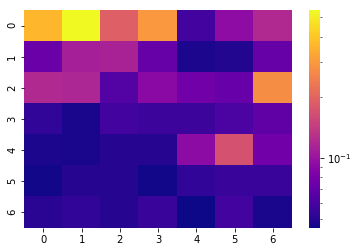

[[0.365 0.54  0.192 0.296 0.058 0.094 0.121]
 [0.074 0.11  0.114 0.072 0.048 0.049 0.072]
 [0.121 0.117 0.064 0.091 0.077 0.073 0.274]
 [0.053 0.047 0.058 0.056 0.056 0.061 0.069]
 [0.048 0.047 0.05  0.05  0.093 0.171 0.077]
 [0.046 0.05  0.05  0.046 0.053 0.055 0.055]
 [0.051 0.053 0.05  0.055 0.045 0.058 0.047]]


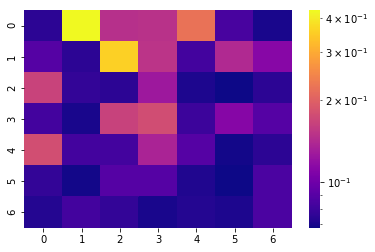

[[0.075 0.425 0.147 0.149 0.223 0.084 0.07 ]
 [0.089 0.075 0.356 0.151 0.082 0.141 0.113]
 [0.166 0.077 0.075 0.126 0.071 0.068 0.075]
 [0.082 0.07  0.165 0.177 0.08  0.112 0.089]
 [0.178 0.082 0.082 0.136 0.089 0.069 0.075]
 [0.077 0.069 0.089 0.089 0.072 0.068 0.085]
 [0.073 0.082 0.077 0.07  0.073 0.071 0.085]]


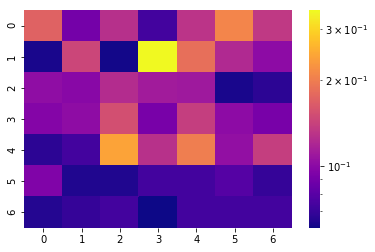

[[0.171 0.09  0.127 0.073 0.13  0.208 0.134]
 [0.063 0.145 0.062 0.349 0.185 0.122 0.101]
 [0.103 0.099 0.124 0.112 0.111 0.063 0.067]
 [0.097 0.102 0.154 0.092 0.139 0.101 0.092]
 [0.067 0.073 0.243 0.128 0.2   0.104 0.139]
 [0.095 0.064 0.064 0.073 0.073 0.079 0.069]
 [0.065 0.069 0.073 0.061 0.073 0.073 0.073]]


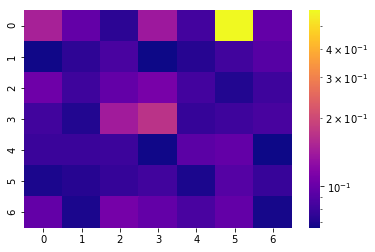

[[0.148 0.098 0.074 0.138 0.083 0.588 0.098]
 [0.067 0.075 0.086 0.066 0.072 0.082 0.092]
 [0.104 0.081 0.098 0.111 0.083 0.071 0.081]
 [0.082 0.071 0.142 0.17  0.077 0.081 0.085]
 [0.079 0.079 0.08  0.067 0.094 0.098 0.066]
 [0.069 0.072 0.077 0.082 0.069 0.091 0.078]
 [0.098 0.069 0.109 0.098 0.086 0.098 0.068]]


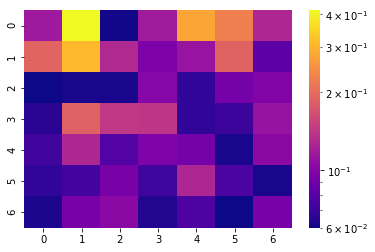

[[0.116 0.415 0.061 0.117 0.28  0.226 0.127]
 [0.191 0.309 0.129 0.097 0.112 0.188 0.082]
 [0.06  0.062 0.062 0.102 0.068 0.093 0.099]
 [0.066 0.187 0.143 0.14  0.068 0.071 0.111]
 [0.073 0.127 0.079 0.098 0.093 0.062 0.104]
 [0.068 0.074 0.095 0.072 0.127 0.076 0.062]
 [0.063 0.095 0.104 0.064 0.077 0.06  0.095]]


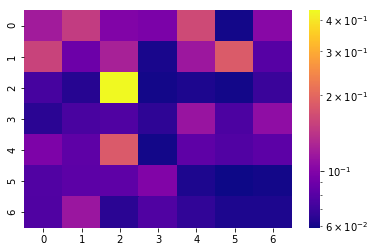

[[0.119 0.149 0.099 0.096 0.164 0.06  0.103]
 [0.157 0.089 0.124 0.061 0.115 0.184 0.08 ]
 [0.074 0.064 0.438 0.06  0.062 0.06  0.07 ]
 [0.065 0.075 0.077 0.066 0.113 0.076 0.107]
 [0.097 0.083 0.183 0.06  0.083 0.078 0.082]
 [0.078 0.082 0.083 0.099 0.062 0.059 0.06 ]
 [0.077 0.114 0.065 0.077 0.067 0.062 0.062]]


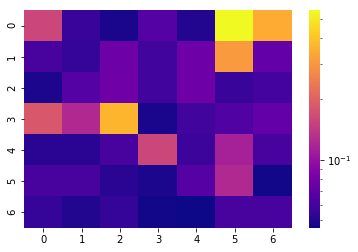

[[0.158 0.056 0.048 0.066 0.05  0.551 0.344]
 [0.061 0.055 0.077 0.059 0.077 0.306 0.072]
 [0.049 0.066 0.078 0.059 0.077 0.056 0.06 ]
 [0.184 0.123 0.368 0.048 0.059 0.064 0.072]
 [0.052 0.052 0.061 0.158 0.057 0.114 0.061]
 [0.061 0.061 0.052 0.049 0.067 0.123 0.047]
 [0.055 0.05  0.055 0.047 0.046 0.061 0.061]]
SKIPPPPPPEDDDD


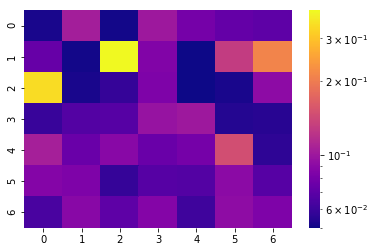

[[0.052 0.104 0.051 0.1   0.08  0.073 0.071]
 [0.074 0.051 0.391 0.085 0.05  0.13  0.212]
 [0.34  0.052 0.058 0.084 0.05  0.052 0.091]
 [0.059 0.067 0.068 0.096 0.1   0.054 0.055]
 [0.105 0.075 0.089 0.075 0.08  0.147 0.056]
 [0.087 0.084 0.058 0.068 0.067 0.09  0.068]
 [0.064 0.089 0.071 0.087 0.061 0.092 0.084]]


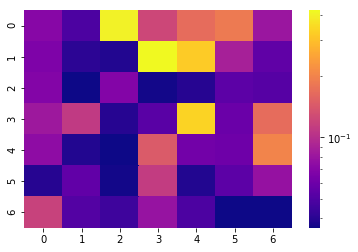

[[0.071 0.049 0.405 0.124 0.169 0.187 0.081]
 [0.067 0.041 0.039 0.421 0.322 0.088 0.055]
 [0.069 0.036 0.069 0.037 0.04  0.054 0.052]
 [0.083 0.11  0.04  0.053 0.339 0.059 0.168]
 [0.074 0.039 0.036 0.145 0.062 0.06  0.202]
 [0.04  0.056 0.037 0.112 0.039 0.054 0.078]
 [0.118 0.051 0.045 0.079 0.049 0.036 0.036]]


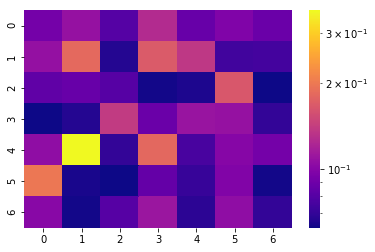

[[0.092 0.108 0.08  0.126 0.087 0.097 0.088]
 [0.107 0.183 0.066 0.168 0.136 0.074 0.075]
 [0.084 0.087 0.081 0.063 0.065 0.165 0.062]
 [0.062 0.066 0.139 0.088 0.109 0.108 0.07 ]
 [0.105 0.359 0.07  0.182 0.076 0.1   0.092]
 [0.199 0.064 0.062 0.086 0.071 0.098 0.063]
 [0.101 0.063 0.081 0.111 0.068 0.105 0.07 ]]


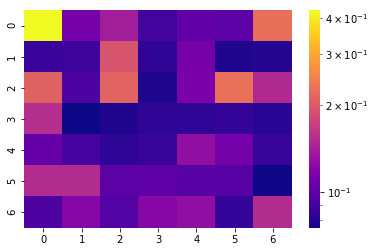

[[0.426 0.112 0.14  0.089 0.102 0.1   0.226]
 [0.087 0.088 0.194 0.083 0.112 0.079 0.08 ]
 [0.21  0.094 0.212 0.079 0.114 0.228 0.149]
 [0.153 0.075 0.079 0.083 0.083 0.085 0.081]
 [0.104 0.091 0.083 0.086 0.127 0.111 0.086]
 [0.151 0.151 0.1   0.101 0.098 0.098 0.076]
 [0.094 0.121 0.096 0.12  0.127 0.085 0.151]]


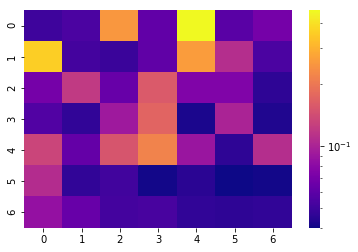

[[0.05  0.054 0.253 0.062 0.459 0.059 0.07 ]
 [0.361 0.052 0.049 0.061 0.263 0.109 0.054]
 [0.07  0.122 0.064 0.158 0.075 0.075 0.046]
 [0.056 0.047 0.092 0.172 0.042 0.1   0.043]
 [0.134 0.063 0.153 0.219 0.089 0.046 0.109]
 [0.108 0.047 0.051 0.041 0.045 0.04  0.041]
 [0.085 0.064 0.052 0.053 0.047 0.046 0.047]]


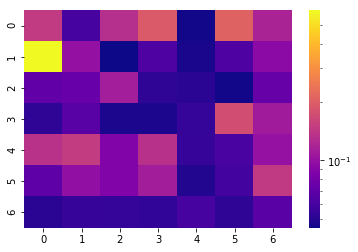

[[0.147 0.06  0.132 0.192 0.046 0.208 0.119]
 [0.593 0.1   0.045 0.063 0.047 0.063 0.094]
 [0.071 0.074 0.113 0.052 0.051 0.046 0.073]
 [0.052 0.067 0.048 0.048 0.054 0.175 0.11 ]
 [0.136 0.148 0.087 0.134 0.055 0.061 0.101]
 [0.07  0.099 0.087 0.112 0.049 0.059 0.146]
 [0.051 0.055 0.054 0.053 0.06  0.052 0.068]]


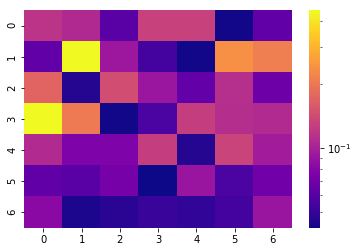

[[0.118 0.107 0.061 0.132 0.132 0.043 0.064]
 [0.064 0.448 0.093 0.054 0.043 0.24  0.211]
 [0.174 0.046 0.146 0.092 0.065 0.112 0.069]
 [0.448 0.206 0.043 0.056 0.128 0.111 0.108]
 [0.108 0.076 0.076 0.128 0.046 0.134 0.096]
 [0.064 0.061 0.073 0.042 0.091 0.056 0.07 ]
 [0.082 0.044 0.047 0.051 0.049 0.054 0.091]]


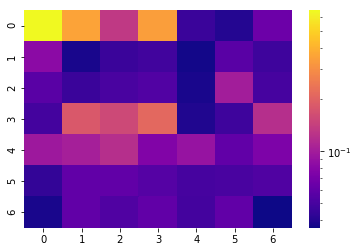

[[0.658 0.359 0.133 0.344 0.046 0.04  0.065]
 [0.083 0.038 0.046 0.048 0.037 0.057 0.047]
 [0.057 0.046 0.051 0.054 0.038 0.101 0.05 ]
 [0.049 0.183 0.157 0.213 0.039 0.047 0.12 ]
 [0.096 0.103 0.12  0.077 0.091 0.06  0.074]
 [0.044 0.06  0.06  0.055 0.05  0.051 0.053]
 [0.038 0.06  0.053 0.06  0.049 0.06  0.036]]


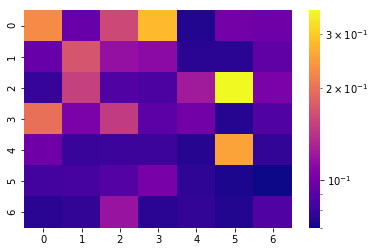

[[0.226 0.096 0.16  0.279 0.074 0.101 0.099]
 [0.096 0.17  0.116 0.112 0.076 0.076 0.093]
 [0.079 0.152 0.088 0.086 0.123 0.357 0.104]
 [0.198 0.104 0.148 0.091 0.1   0.075 0.087]
 [0.099 0.08  0.081 0.081 0.075 0.252 0.078]
 [0.083 0.084 0.089 0.103 0.077 0.073 0.07 ]
 [0.076 0.078 0.118 0.076 0.078 0.074 0.088]]


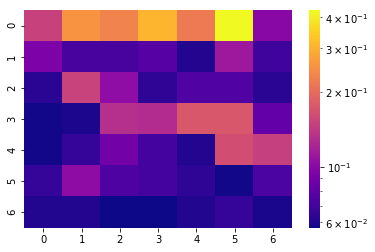

[[0.15  0.258 0.233 0.306 0.219 0.427 0.1  ]
 [0.094 0.072 0.072 0.077 0.061 0.113 0.069]
 [0.063 0.152 0.104 0.064 0.075 0.075 0.063]
 [0.058 0.06  0.132 0.129 0.175 0.175 0.082]
 [0.058 0.066 0.089 0.071 0.061 0.164 0.148]
 [0.066 0.103 0.074 0.071 0.064 0.058 0.073]
 [0.061 0.061 0.057 0.057 0.061 0.066 0.059]]


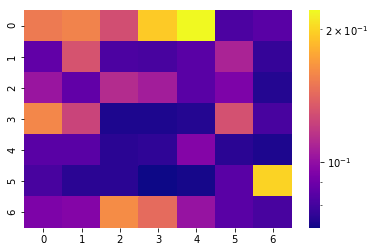

[[0.152 0.157 0.129 0.195 0.221 0.082 0.085]
 [0.087 0.131 0.082 0.081 0.085 0.109 0.077]
 [0.103 0.087 0.113 0.106 0.085 0.094 0.074]
 [0.159 0.124 0.073 0.073 0.074 0.13  0.081]
 [0.085 0.085 0.075 0.076 0.096 0.075 0.073]
 [0.081 0.075 0.075 0.071 0.072 0.085 0.2  ]
 [0.094 0.096 0.162 0.144 0.102 0.085 0.081]]


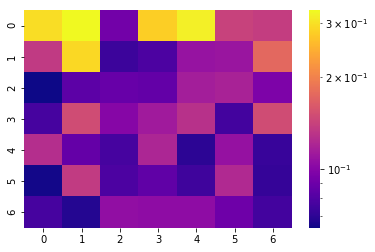

[[0.297 0.33  0.092 0.281 0.318 0.141 0.138]
 [0.135 0.292 0.074 0.079 0.108 0.109 0.175]
 [0.064 0.084 0.088 0.086 0.115 0.118 0.096]
 [0.077 0.15  0.1   0.113 0.128 0.076 0.15 ]
 [0.126 0.087 0.077 0.12  0.07  0.107 0.073]
 [0.065 0.136 0.079 0.085 0.075 0.123 0.072]
 [0.077 0.068 0.105 0.104 0.104 0.09  0.076]]


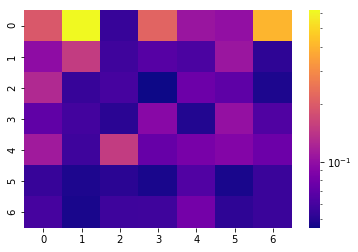

[[0.195 0.621 0.055 0.218 0.106 0.101 0.407]
 [0.098 0.152 0.058 0.067 0.062 0.107 0.052]
 [0.127 0.055 0.06  0.045 0.077 0.07  0.048]
 [0.071 0.059 0.051 0.094 0.049 0.102 0.064]
 [0.112 0.057 0.151 0.074 0.084 0.09  0.077]
 [0.055 0.048 0.051 0.047 0.065 0.047 0.056]
 [0.06  0.047 0.057 0.058 0.081 0.052 0.056]]


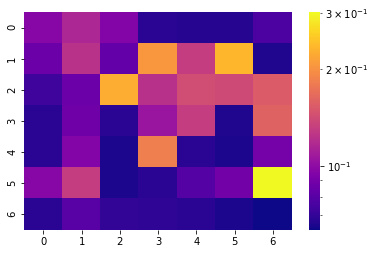

[[0.097 0.115 0.096 0.068 0.067 0.067 0.077]
 [0.087 0.123 0.084 0.205 0.131 0.235 0.066]
 [0.073 0.087 0.227 0.122 0.142 0.14  0.154]
 [0.068 0.088 0.068 0.105 0.131 0.066 0.159]
 [0.068 0.095 0.065 0.184 0.068 0.065 0.09 ]
 [0.097 0.131 0.065 0.068 0.079 0.089 0.301]
 [0.068 0.08  0.07  0.069 0.068 0.065 0.063]]


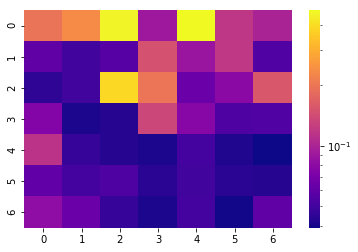

[[0.198 0.235 0.455 0.091 0.473 0.118 0.1  ]
 [0.06  0.05  0.057 0.149 0.088 0.119 0.055]
 [0.045 0.05  0.392 0.199 0.064 0.079 0.157]
 [0.076 0.041 0.043 0.135 0.077 0.054 0.055]
 [0.114 0.047 0.043 0.041 0.051 0.042 0.039]
 [0.061 0.051 0.054 0.044 0.05  0.044 0.043]
 [0.082 0.064 0.047 0.041 0.051 0.04  0.06 ]]


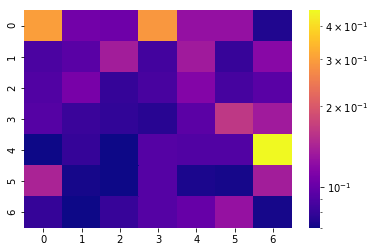

[[0.3   0.106 0.104 0.29  0.125 0.125 0.074]
 [0.088 0.094 0.136 0.085 0.134 0.081 0.118]
 [0.091 0.109 0.08  0.087 0.115 0.086 0.094]
 [0.092 0.082 0.079 0.076 0.095 0.162 0.134]
 [0.07  0.08  0.07  0.092 0.091 0.091 0.458]
 [0.142 0.072 0.07  0.092 0.073 0.072 0.136]
 [0.08  0.07  0.081 0.092 0.1   0.126 0.072]]


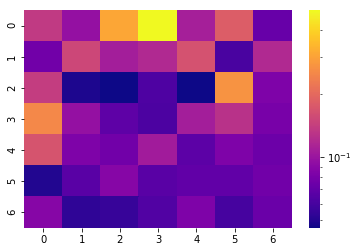

[[0.136 0.096 0.307 0.498 0.109 0.182 0.073]
 [0.077 0.152 0.108 0.118 0.165 0.061 0.118]
 [0.14  0.049 0.046 0.063 0.046 0.272 0.084]
 [0.252 0.096 0.069 0.062 0.108 0.127 0.081]
 [0.169 0.084 0.077 0.106 0.068 0.084 0.075]
 [0.05  0.067 0.088 0.067 0.07  0.07  0.077]
 [0.088 0.053 0.055 0.064 0.084 0.06  0.074]]
SKIPPPPPPEDDDD


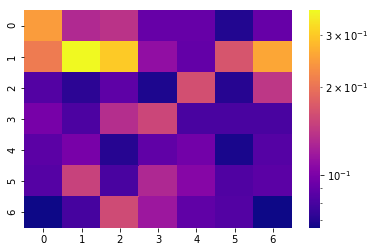

[[0.246 0.13  0.138 0.091 0.091 0.07  0.091]
 [0.208 0.364 0.301 0.111 0.09  0.169 0.258]
 [0.084 0.072 0.088 0.069 0.163 0.071 0.141]
 [0.098 0.082 0.133 0.154 0.081 0.081 0.081]
 [0.087 0.099 0.071 0.089 0.096 0.068 0.085]
 [0.085 0.15  0.081 0.129 0.105 0.083 0.087]
 [0.066 0.08  0.159 0.117 0.089 0.084 0.066]]


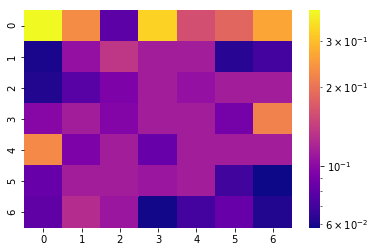

[[0.393 0.232 0.079 0.33  0.16  0.185 0.266]
 [0.06  0.105 0.135 0.114 0.114 0.063 0.071]
 [0.062 0.078 0.093 0.114 0.105 0.114 0.114]
 [0.098 0.114 0.097 0.114 0.114 0.09  0.218]
 [0.228 0.093 0.114 0.084 0.114 0.114 0.114]
 [0.084 0.114 0.114 0.109 0.114 0.07  0.058]
 [0.081 0.127 0.109 0.059 0.071 0.084 0.062]]


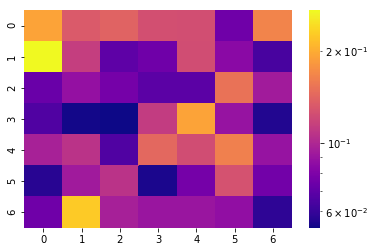

[[0.193 0.133 0.14  0.126 0.125 0.075 0.166]
 [0.271 0.114 0.07  0.075 0.124 0.084 0.064]
 [0.073 0.088 0.077 0.069 0.069 0.152 0.094]
 [0.066 0.054 0.053 0.113 0.193 0.089 0.056]
 [0.097 0.107 0.066 0.144 0.124 0.163 0.089]
 [0.057 0.093 0.107 0.055 0.077 0.127 0.076]
 [0.075 0.226 0.096 0.09  0.09  0.087 0.058]]


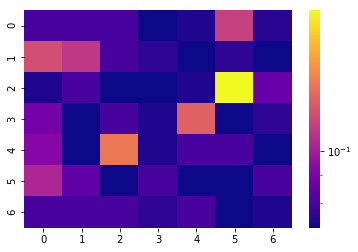

[[0.08  0.08  0.08  0.072 0.074 0.112 0.075]
 [0.117 0.109 0.08  0.076 0.072 0.076 0.072]
 [0.074 0.08  0.072 0.072 0.074 0.182 0.086]
 [0.089 0.072 0.08  0.074 0.124 0.072 0.076]
 [0.093 0.072 0.133 0.074 0.08  0.08  0.072]
 [0.103 0.085 0.072 0.08  0.072 0.072 0.08 ]
 [0.08  0.08  0.08  0.076 0.08  0.072 0.074]]


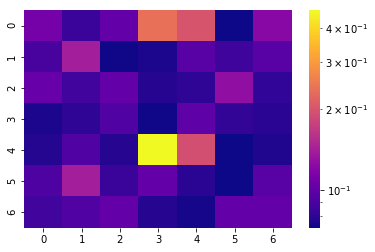

[[0.11  0.084 0.101 0.238 0.201 0.072 0.121]
 [0.089 0.14  0.073 0.075 0.096 0.086 0.096]
 [0.103 0.087 0.101 0.078 0.08  0.127 0.081]
 [0.075 0.08  0.093 0.073 0.099 0.082 0.079]
 [0.077 0.093 0.078 0.466 0.193 0.072 0.076]
 [0.092 0.14  0.084 0.102 0.079 0.072 0.096]
 [0.087 0.093 0.101 0.078 0.074 0.101 0.101]]


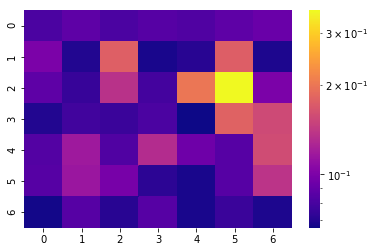

[[0.081 0.088 0.081 0.085 0.083 0.088 0.092]
 [0.1   0.07  0.177 0.068 0.071 0.176 0.069]
 [0.088 0.075 0.136 0.079 0.201 0.358 0.1  ]
 [0.07  0.078 0.076 0.081 0.066 0.179 0.156]
 [0.084 0.118 0.083 0.132 0.094 0.085 0.158]
 [0.085 0.115 0.098 0.072 0.068 0.085 0.138]
 [0.067 0.085 0.071 0.085 0.068 0.076 0.069]]


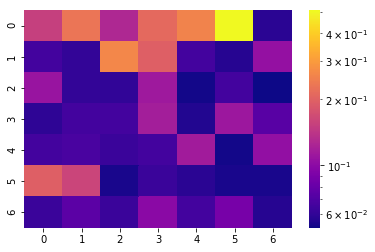

[[0.154 0.232 0.127 0.212 0.255 0.509 0.058]
 [0.066 0.061 0.262 0.197 0.066 0.057 0.106]
 [0.108 0.061 0.06  0.113 0.053 0.066 0.052]
 [0.059 0.066 0.066 0.118 0.056 0.111 0.074]
 [0.066 0.068 0.063 0.066 0.115 0.053 0.105]
 [0.197 0.16  0.054 0.063 0.058 0.054 0.054]
 [0.063 0.075 0.063 0.099 0.066 0.088 0.057]]


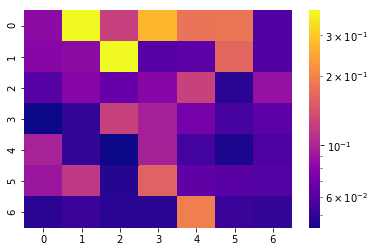

[[0.083 0.382 0.124 0.273 0.18  0.183 0.059]
 [0.08  0.083 0.385 0.061 0.063 0.165 0.059]
 [0.061 0.08  0.067 0.08  0.125 0.049 0.087]
 [0.044 0.051 0.125 0.096 0.072 0.056 0.063]
 [0.098 0.051 0.044 0.097 0.055 0.046 0.058]
 [0.09  0.116 0.048 0.16  0.064 0.062 0.06 ]
 [0.049 0.053 0.049 0.049 0.195 0.053 0.051]]


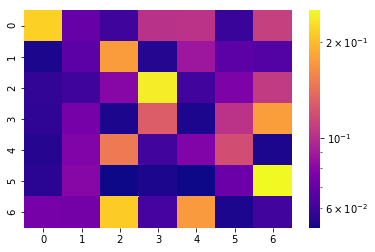

[[0.217 0.07  0.06  0.102 0.103 0.059 0.11 ]
 [0.054 0.067 0.176 0.055 0.088 0.067 0.065]
 [0.058 0.06  0.08  0.241 0.061 0.077 0.107]
 [0.057 0.075 0.054 0.129 0.054 0.103 0.177]
 [0.055 0.078 0.15  0.061 0.078 0.119 0.054]
 [0.056 0.08  0.052 0.054 0.052 0.072 0.252]
 [0.075 0.074 0.213 0.062 0.174 0.054 0.061]]


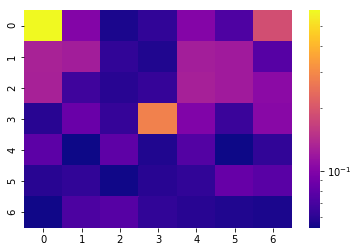

[[0.594 0.1   0.056 0.062 0.101 0.073 0.189]
 [0.13  0.124 0.062 0.057 0.126 0.122 0.076]
 [0.129 0.067 0.059 0.063 0.128 0.122 0.106]
 [0.059 0.085 0.063 0.282 0.098 0.065 0.104]
 [0.079 0.053 0.08  0.057 0.075 0.053 0.062]
 [0.059 0.062 0.054 0.059 0.062 0.084 0.078]
 [0.054 0.072 0.076 0.062 0.059 0.057 0.056]]
SKIPPPPPPEDDDD


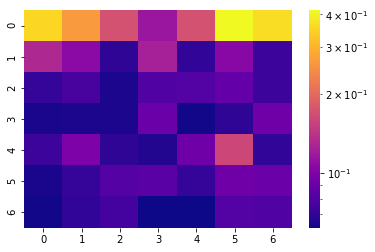

[[0.356 0.264 0.171 0.116 0.171 0.414 0.365]
 [0.131 0.107 0.069 0.124 0.07  0.105 0.073]
 [0.071 0.077 0.065 0.08  0.081 0.088 0.073]
 [0.064 0.065 0.065 0.09  0.063 0.069 0.093]
 [0.073 0.099 0.069 0.066 0.093 0.161 0.07 ]
 [0.064 0.071 0.082 0.084 0.071 0.093 0.09 ]
 [0.063 0.07  0.076 0.062 0.062 0.081 0.08 ]]


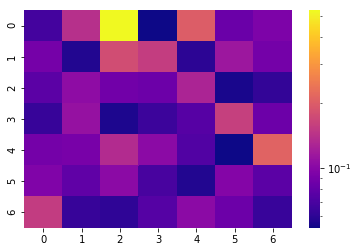

[[0.068 0.139 0.532 0.053 0.2   0.084 0.094]
 [0.09  0.057 0.177 0.156 0.06  0.114 0.089]
 [0.077 0.105 0.087 0.085 0.127 0.055 0.062]
 [0.063 0.109 0.056 0.065 0.075 0.159 0.085]
 [0.089 0.091 0.135 0.103 0.073 0.053 0.209]
 [0.096 0.079 0.103 0.069 0.057 0.098 0.077]
 [0.154 0.063 0.061 0.074 0.103 0.085 0.064]]


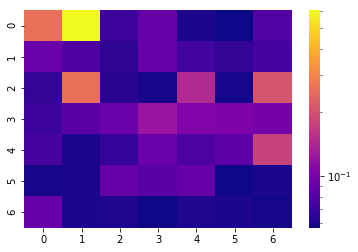

[[0.258 0.606 0.071 0.089 0.06  0.057 0.08 ]
 [0.092 0.078 0.066 0.089 0.072 0.067 0.074]
 [0.067 0.259 0.064 0.059 0.147 0.059 0.206]
 [0.07  0.083 0.092 0.123 0.104 0.103 0.098]
 [0.075 0.06  0.068 0.091 0.077 0.085 0.178]
 [0.059 0.06  0.089 0.082 0.089 0.058 0.06 ]
 [0.089 0.06  0.061 0.058 0.061 0.06  0.059]]


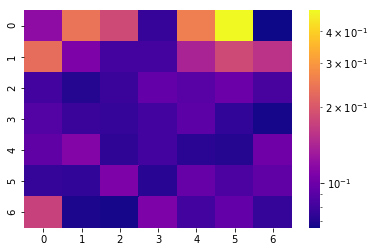

[[0.119 0.241 0.182 0.077 0.257 0.485 0.066]
 [0.23  0.108 0.082 0.082 0.14  0.183 0.156]
 [0.081 0.071 0.078 0.095 0.09  0.099 0.083]
 [0.088 0.078 0.076 0.081 0.091 0.075 0.068]
 [0.093 0.112 0.074 0.081 0.073 0.071 0.101]
 [0.076 0.075 0.108 0.072 0.096 0.085 0.093]
 [0.173 0.069 0.068 0.108 0.081 0.095 0.076]]


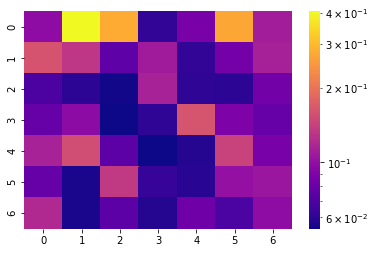

[[0.098 0.405 0.277 0.062 0.087 0.269 0.11 ]
 [0.161 0.132 0.076 0.108 0.062 0.085 0.113]
 [0.07  0.06  0.055 0.114 0.061 0.06  0.084]
 [0.079 0.097 0.054 0.061 0.162 0.089 0.079]
 [0.114 0.155 0.075 0.054 0.058 0.144 0.087]
 [0.079 0.056 0.135 0.063 0.059 0.101 0.105]
 [0.12  0.056 0.075 0.058 0.083 0.069 0.098]]


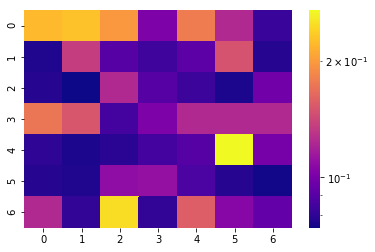

[[0.223 0.229 0.198 0.102 0.178 0.124 0.082]
 [0.077 0.136 0.09  0.084 0.092 0.149 0.078]
 [0.078 0.074 0.124 0.09  0.083 0.076 0.098]
 [0.174 0.152 0.085 0.102 0.124 0.124 0.124]
 [0.08  0.076 0.079 0.085 0.09  0.271 0.1  ]
 [0.078 0.077 0.109 0.111 0.087 0.078 0.075]
 [0.124 0.081 0.248 0.081 0.157 0.106 0.094]]
SKIPPPPPPEDDDD


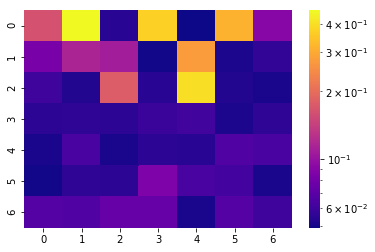

[[0.164 0.461 0.054 0.371 0.049 0.314 0.091]
 [0.083 0.115 0.108 0.05  0.277 0.052 0.057]
 [0.06  0.053 0.178 0.054 0.402 0.053 0.051]
 [0.055 0.056 0.055 0.059 0.061 0.052 0.056]
 [0.051 0.064 0.051 0.055 0.054 0.067 0.064]
 [0.05  0.056 0.055 0.086 0.064 0.062 0.051]
 [0.068 0.067 0.075 0.075 0.051 0.068 0.06 ]]


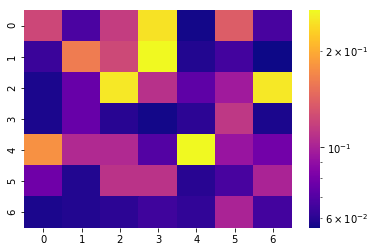

[[0.123 0.068 0.116 0.247 0.057 0.138 0.067]
 [0.064 0.162 0.124 0.268 0.059 0.066 0.056]
 [0.058 0.076 0.251 0.109 0.073 0.096 0.252]
 [0.058 0.076 0.06  0.057 0.061 0.113 0.058]
 [0.178 0.104 0.104 0.07  0.267 0.093 0.079]
 [0.078 0.059 0.11  0.11  0.06  0.067 0.101]
 [0.058 0.059 0.061 0.065 0.062 0.101 0.066]]


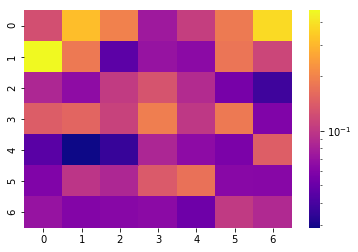

[[0.126 0.315 0.199 0.075 0.107 0.186 0.38 ]
 [0.464 0.183 0.046 0.07  0.064 0.177 0.115]
 [0.085 0.066 0.103 0.131 0.089 0.055 0.038]
 [0.144 0.155 0.11  0.191 0.1   0.183 0.059]
 [0.045 0.029 0.036 0.084 0.065 0.057 0.145]
 [0.059 0.098 0.085 0.138 0.172 0.063 0.062]
 [0.07  0.06  0.062 0.064 0.052 0.102 0.087]]


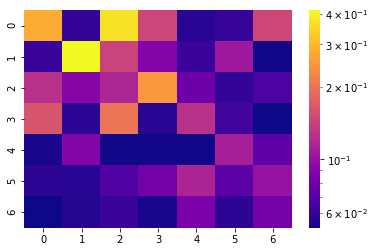

[[0.283 0.06  0.372 0.146 0.057 0.061 0.148]
 [0.062 0.415 0.144 0.091 0.062 0.106 0.053]
 [0.125 0.092 0.116 0.251 0.081 0.06  0.067]
 [0.163 0.058 0.202 0.057 0.125 0.064 0.052]
 [0.054 0.09  0.053 0.053 0.053 0.11  0.074]
 [0.058 0.057 0.069 0.082 0.115 0.073 0.101]
 [0.052 0.056 0.062 0.054 0.086 0.058 0.083]]


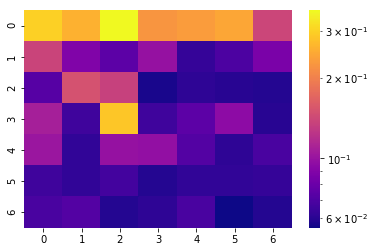

[[0.3   0.258 0.358 0.225 0.233 0.245 0.14 ]
 [0.138 0.089 0.075 0.099 0.063 0.07  0.086]
 [0.073 0.15  0.135 0.057 0.061 0.06  0.059]
 [0.108 0.066 0.286 0.066 0.075 0.095 0.06 ]
 [0.102 0.062 0.099 0.098 0.072 0.061 0.069]
 [0.066 0.062 0.067 0.059 0.062 0.062 0.063]
 [0.069 0.072 0.059 0.061 0.069 0.055 0.059]]


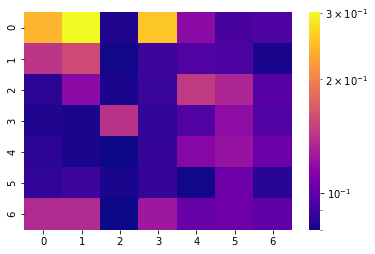

[[0.242 0.301 0.083 0.257 0.117 0.093 0.095]
 [0.143 0.157 0.081 0.091 0.096 0.094 0.082]
 [0.086 0.117 0.082 0.089 0.146 0.133 0.098]
 [0.083 0.082 0.141 0.087 0.096 0.119 0.096]
 [0.086 0.082 0.08  0.088 0.115 0.122 0.105]
 [0.087 0.091 0.082 0.088 0.081 0.106 0.085]
 [0.136 0.136 0.08  0.125 0.103 0.106 0.101]]


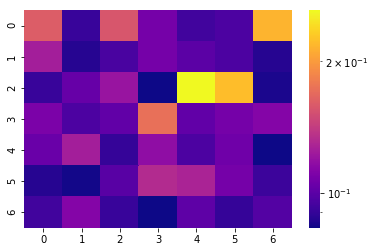

[[0.161 0.091 0.157 0.108 0.093 0.096 0.216]
 [0.125 0.087 0.095 0.108 0.1   0.096 0.087]
 [0.091 0.103 0.12  0.083 0.262 0.222 0.085]
 [0.11  0.096 0.102 0.173 0.102 0.108 0.113]
 [0.104 0.125 0.09  0.117 0.096 0.106 0.083]
 [0.087 0.084 0.099 0.132 0.128 0.108 0.092]
 [0.093 0.113 0.091 0.083 0.101 0.09  0.098]]


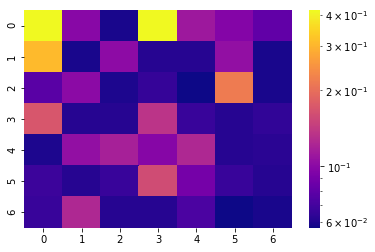

[[0.413 0.099 0.059 0.416 0.112 0.097 0.081]
 [0.309 0.059 0.102 0.062 0.062 0.105 0.059]
 [0.078 0.101 0.06  0.066 0.057 0.217 0.059]
 [0.171 0.062 0.062 0.135 0.067 0.062 0.065]
 [0.06  0.105 0.118 0.098 0.124 0.062 0.063]
 [0.068 0.062 0.067 0.16  0.09  0.067 0.062]
 [0.067 0.124 0.062 0.062 0.073 0.057 0.059]]


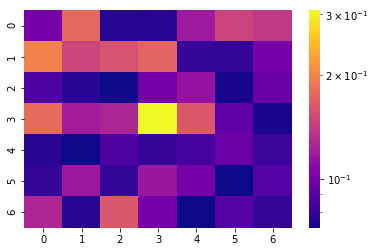

[[0.101 0.175 0.076 0.077 0.118 0.147 0.139]
 [0.197 0.148 0.158 0.173 0.08  0.079 0.101]
 [0.087 0.077 0.072 0.101 0.114 0.074 0.095]
 [0.178 0.12  0.125 0.308 0.163 0.093 0.074]
 [0.077 0.072 0.087 0.08  0.084 0.097 0.082]
 [0.08  0.117 0.079 0.116 0.101 0.072 0.089]
 [0.126 0.076 0.163 0.101 0.072 0.089 0.08 ]]


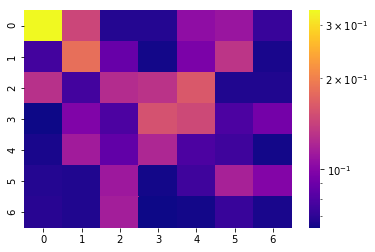

[[0.336 0.146 0.068 0.068 0.105 0.11  0.073]
 [0.076 0.183 0.088 0.065 0.096 0.133 0.066]
 [0.129 0.076 0.126 0.131 0.162 0.067 0.067]
 [0.064 0.098 0.079 0.156 0.148 0.079 0.093]
 [0.066 0.114 0.086 0.122 0.079 0.075 0.065]
 [0.068 0.067 0.112 0.065 0.075 0.118 0.099]
 [0.069 0.067 0.116 0.064 0.065 0.073 0.066]]


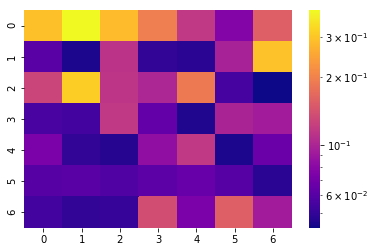

[[0.291 0.393 0.285 0.195 0.117 0.078 0.156]
 [0.061 0.045 0.112 0.05  0.048 0.097 0.294]
 [0.128 0.312 0.114 0.101 0.187 0.055 0.043]
 [0.056 0.054 0.117 0.064 0.046 0.099 0.093]
 [0.073 0.05  0.047 0.084 0.117 0.045 0.067]
 [0.06  0.061 0.058 0.062 0.066 0.06  0.048]
 [0.054 0.05  0.051 0.137 0.073 0.156 0.093]]


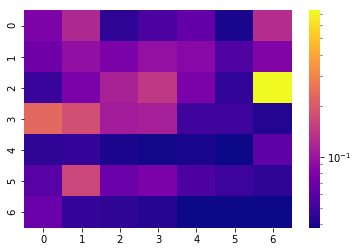

[[0.079 0.122 0.045 0.055 0.065 0.04  0.127]
 [0.071 0.094 0.077 0.095 0.087 0.057 0.082]
 [0.048 0.077 0.115 0.142 0.077 0.046 0.731]
 [0.231 0.177 0.107 0.11  0.05  0.05  0.042]
 [0.045 0.047 0.041 0.039 0.04  0.038 0.063]
 [0.06  0.165 0.069 0.077 0.055 0.049 0.045]
 [0.068 0.047 0.045 0.043 0.038 0.038 0.038]]


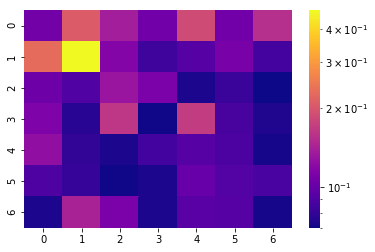

[[0.107 0.209 0.138 0.106 0.186 0.106 0.155]
 [0.23  0.472 0.116 0.084 0.093 0.11  0.086]
 [0.104 0.091 0.13  0.111 0.073 0.082 0.07 ]
 [0.113 0.076 0.163 0.071 0.169 0.087 0.074]
 [0.125 0.08  0.073 0.085 0.093 0.089 0.072]
 [0.09  0.081 0.071 0.073 0.101 0.092 0.088]
 [0.073 0.143 0.111 0.073 0.095 0.093 0.072]]


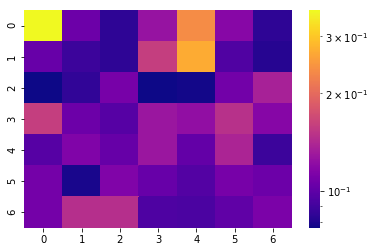

[[0.361 0.106 0.084 0.126 0.236 0.118 0.084]
 [0.104 0.088 0.084 0.159 0.269 0.095 0.082]
 [0.077 0.085 0.11  0.077 0.078 0.108 0.136]
 [0.159 0.106 0.097 0.128 0.123 0.148 0.117]
 [0.097 0.114 0.103 0.128 0.102 0.139 0.088]
 [0.109 0.079 0.114 0.104 0.096 0.11  0.106]
 [0.109 0.146 0.146 0.094 0.093 0.101 0.112]]


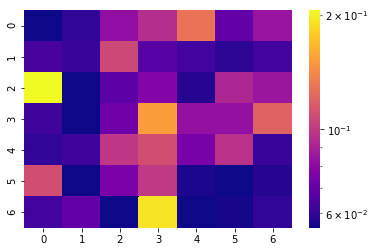

[[0.055 0.06  0.082 0.095 0.129 0.07  0.084]
 [0.064 0.061 0.107 0.067 0.063 0.059 0.063]
 [0.206 0.055 0.068 0.078 0.058 0.092 0.085]
 [0.062 0.055 0.073 0.152 0.083 0.083 0.12 ]
 [0.06  0.062 0.099 0.11  0.075 0.097 0.061]
 [0.11  0.055 0.076 0.1   0.057 0.055 0.058]
 [0.063 0.07  0.055 0.193 0.055 0.056 0.06 ]]


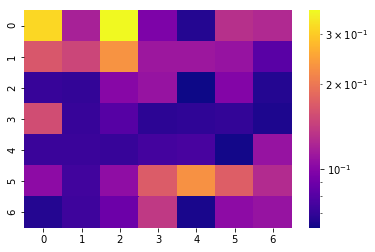

[[0.316 0.119 0.364 0.096 0.066 0.13  0.125]
 [0.166 0.15  0.232 0.112 0.112 0.109 0.082]
 [0.071 0.07  0.101 0.109 0.062 0.099 0.066]
 [0.156 0.071 0.081 0.068 0.069 0.07  0.065]
 [0.072 0.072 0.071 0.075 0.076 0.063 0.109]
 [0.104 0.074 0.105 0.171 0.23  0.173 0.127]
 [0.066 0.073 0.089 0.138 0.064 0.104 0.109]]


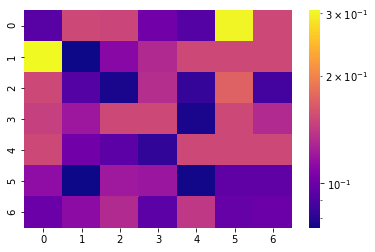

[[0.093 0.153 0.15  0.102 0.092 0.301 0.153]
 [0.306 0.075 0.111 0.131 0.153 0.153 0.153]
 [0.153 0.092 0.077 0.134 0.083 0.171 0.087]
 [0.146 0.12  0.153 0.153 0.077 0.153 0.132]
 [0.153 0.102 0.094 0.082 0.153 0.153 0.153]
 [0.114 0.075 0.121 0.119 0.076 0.096 0.096]
 [0.1   0.113 0.132 0.094 0.141 0.098 0.1  ]]


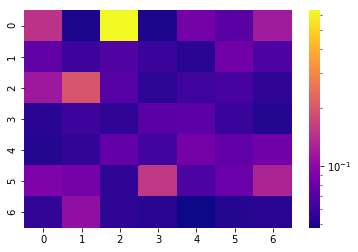

[[0.146 0.051 0.635 0.051 0.086 0.072 0.117]
 [0.075 0.06  0.068 0.059 0.054 0.084 0.067]
 [0.115 0.199 0.07  0.055 0.061 0.064 0.056]
 [0.054 0.06  0.056 0.072 0.073 0.059 0.053]
 [0.053 0.057 0.077 0.062 0.086 0.076 0.084]
 [0.092 0.087 0.056 0.152 0.066 0.081 0.128]
 [0.057 0.105 0.056 0.054 0.048 0.053 0.054]]


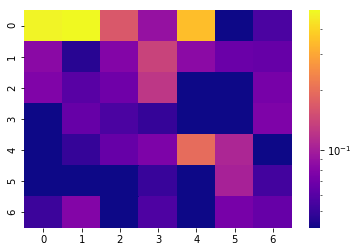

[[0.482 0.498 0.166 0.09  0.353 0.041 0.056]
 [0.083 0.046 0.079 0.138 0.084 0.068 0.066]
 [0.078 0.06  0.07  0.124 0.041 0.041 0.073]
 [0.041 0.066 0.056 0.049 0.041 0.041 0.077]
 [0.041 0.049 0.066 0.076 0.197 0.107 0.041]
 [0.041 0.041 0.041 0.05  0.041 0.103 0.053]
 [0.051 0.079 0.041 0.057 0.041 0.073 0.066]]


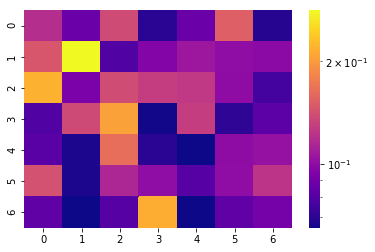

[[0.119 0.087 0.138 0.07  0.087 0.153 0.069]
 [0.146 0.282 0.079 0.096 0.106 0.101 0.099]
 [0.219 0.093 0.139 0.129 0.126 0.1   0.076]
 [0.079 0.137 0.205 0.066 0.129 0.071 0.083]
 [0.082 0.067 0.164 0.07  0.065 0.1   0.103]
 [0.142 0.067 0.114 0.101 0.081 0.101 0.123]
 [0.084 0.065 0.081 0.216 0.065 0.084 0.091]]


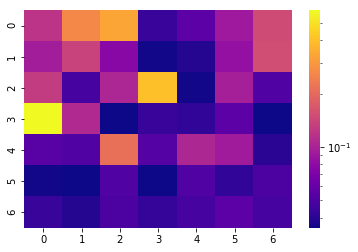

[[0.12  0.262 0.332 0.044 0.056 0.092 0.149]
 [0.095 0.139 0.077 0.036 0.039 0.084 0.152]
 [0.129 0.048 0.104 0.405 0.036 0.097 0.052]
 [0.591 0.107 0.035 0.044 0.042 0.056 0.035]
 [0.054 0.052 0.212 0.053 0.105 0.093 0.04 ]
 [0.036 0.035 0.052 0.035 0.051 0.042 0.05 ]
 [0.044 0.039 0.05  0.043 0.048 0.056 0.048]]


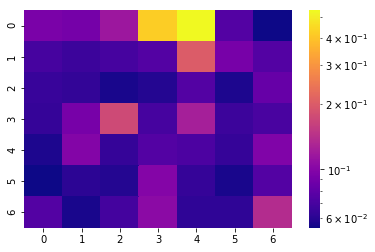

[[0.094 0.091 0.116 0.423 0.534 0.075 0.054]
 [0.07  0.066 0.07  0.075 0.201 0.092 0.075]
 [0.065 0.063 0.056 0.059 0.075 0.057 0.083]
 [0.064 0.092 0.174 0.07  0.124 0.066 0.071]
 [0.057 0.099 0.064 0.075 0.072 0.064 0.097]
 [0.054 0.061 0.059 0.1   0.064 0.056 0.075]
 [0.075 0.056 0.069 0.104 0.062 0.062 0.138]]


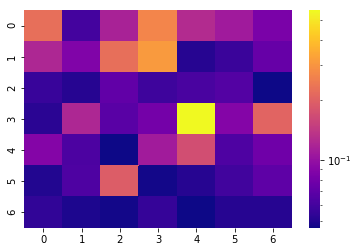

[[0.224 0.06  0.117 0.268 0.126 0.109 0.084]
 [0.121 0.087 0.225 0.311 0.051 0.057 0.074]
 [0.056 0.051 0.072 0.058 0.062 0.066 0.046]
 [0.052 0.122 0.068 0.081 0.56  0.09  0.205]
 [0.09  0.063 0.046 0.11  0.171 0.064 0.078]
 [0.05  0.064 0.194 0.047 0.051 0.059 0.07 ]
 [0.054 0.049 0.047 0.055 0.046 0.051 0.051]]


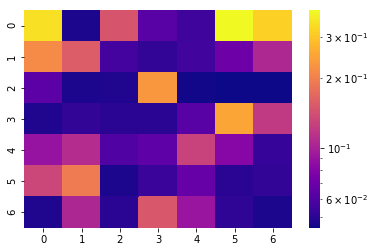

[[0.346 0.047 0.147 0.063 0.055 0.392 0.319]
 [0.214 0.157 0.057 0.052 0.056 0.071 0.105]
 [0.064 0.047 0.048 0.232 0.046 0.045 0.045]
 [0.048 0.052 0.05  0.05  0.063 0.252 0.121]
 [0.09  0.109 0.06  0.065 0.129 0.081 0.053]
 [0.132 0.193 0.047 0.054 0.068 0.05  0.052]
 [0.048 0.104 0.05  0.15  0.091 0.051 0.047]]


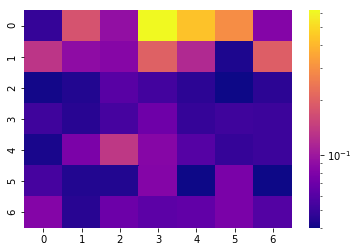

[[0.049 0.175 0.093 0.618 0.431 0.295 0.083]
 [0.133 0.09  0.084 0.199 0.118 0.043 0.195]
 [0.041 0.044 0.061 0.053 0.046 0.04  0.046]
 [0.052 0.045 0.054 0.071 0.049 0.052 0.051]
 [0.042 0.078 0.136 0.084 0.06  0.049 0.051]
 [0.054 0.044 0.044 0.083 0.04  0.077 0.04 ]
 [0.083 0.045 0.07  0.063 0.065 0.077 0.059]]


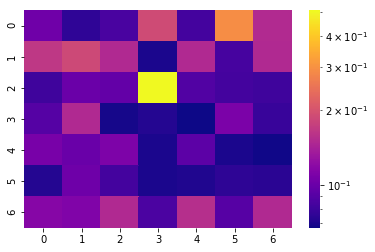

[[0.103 0.076 0.085 0.189 0.083 0.292 0.151]
 [0.165 0.186 0.149 0.07  0.149 0.084 0.149]
 [0.081 0.101 0.097 0.506 0.089 0.083 0.081]
 [0.09  0.149 0.069 0.072 0.067 0.11  0.079]
 [0.108 0.1   0.111 0.07  0.094 0.07  0.068]
 [0.072 0.102 0.083 0.07  0.071 0.075 0.074]
 [0.116 0.112 0.149 0.086 0.155 0.091 0.149]]
SKIPPPPPPEDDDD


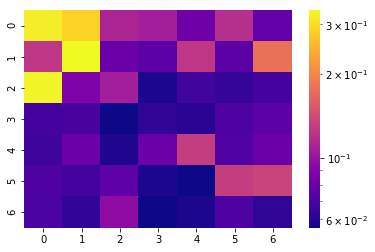

[[0.322 0.286 0.111 0.106 0.082 0.118 0.078]
 [0.124 0.337 0.081 0.075 0.124 0.075 0.178]
 [0.329 0.088 0.106 0.058 0.067 0.064 0.068]
 [0.068 0.069 0.056 0.062 0.061 0.071 0.075]
 [0.066 0.081 0.059 0.081 0.129 0.072 0.081]
 [0.071 0.068 0.076 0.058 0.056 0.13  0.135]
 [0.07  0.063 0.095 0.056 0.058 0.071 0.062]]


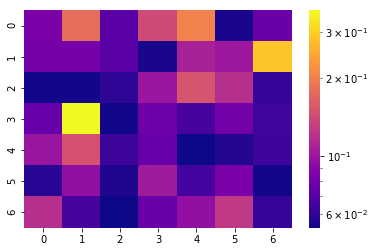

[[0.085 0.177 0.072 0.143 0.202 0.055 0.078]
 [0.082 0.083 0.072 0.055 0.108 0.102 0.288]
 [0.054 0.054 0.059 0.1   0.151 0.118 0.061]
 [0.077 0.364 0.054 0.079 0.066 0.081 0.064]
 [0.099 0.149 0.063 0.077 0.053 0.057 0.063]
 [0.058 0.096 0.056 0.103 0.065 0.084 0.054]
 [0.118 0.066 0.053 0.078 0.096 0.126 0.061]]


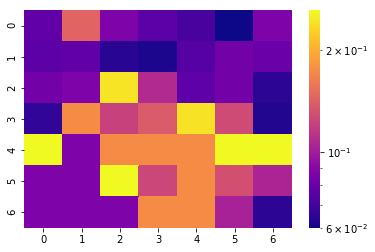

[[0.078 0.145 0.087 0.076 0.071 0.06  0.087]
 [0.076 0.078 0.064 0.062 0.075 0.083 0.08 ]
 [0.083 0.087 0.243 0.108 0.077 0.083 0.065]
 [0.066 0.174 0.122 0.138 0.241 0.128 0.063]
 [0.261 0.087 0.174 0.174 0.174 0.261 0.261]
 [0.087 0.087 0.261 0.125 0.174 0.131 0.105]
 [0.087 0.087 0.087 0.174 0.174 0.103 0.065]]


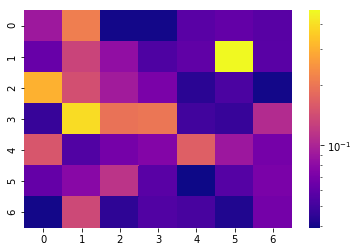

[[0.09  0.212 0.04  0.04  0.058 0.061 0.057]
 [0.063 0.132 0.083 0.054 0.06  0.468 0.058]
 [0.304 0.145 0.093 0.071 0.044 0.053 0.04 ]
 [0.047 0.396 0.194 0.2   0.05  0.047 0.107]
 [0.154 0.055 0.069 0.075 0.166 0.089 0.069]
 [0.062 0.078 0.115 0.058 0.039 0.056 0.071]
 [0.04  0.137 0.045 0.055 0.052 0.042 0.068]]


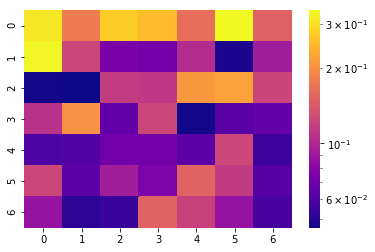

[[0.312 0.179 0.275 0.253 0.162 0.34  0.149]
 [0.333 0.125 0.075 0.072 0.103 0.048 0.093]
 [0.047 0.046 0.116 0.113 0.21  0.22  0.124]
 [0.108 0.202 0.066 0.125 0.047 0.063 0.066]
 [0.059 0.061 0.071 0.072 0.064 0.125 0.055]
 [0.125 0.064 0.093 0.076 0.152 0.115 0.062]
 [0.087 0.051 0.054 0.152 0.121 0.087 0.058]]


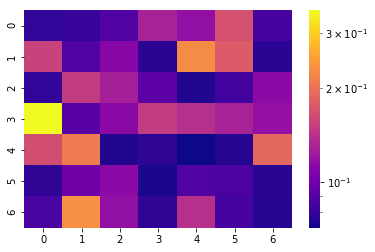

[[0.079 0.081 0.089 0.129 0.116 0.169 0.085]
 [0.155 0.088 0.11  0.077 0.228 0.178 0.077]
 [0.079 0.149 0.127 0.092 0.075 0.084 0.113]
 [0.355 0.091 0.112 0.15  0.139 0.129 0.117]
 [0.165 0.212 0.075 0.078 0.071 0.076 0.19 ]
 [0.078 0.1   0.113 0.074 0.089 0.087 0.077]
 [0.086 0.232 0.116 0.078 0.14  0.085 0.076]]


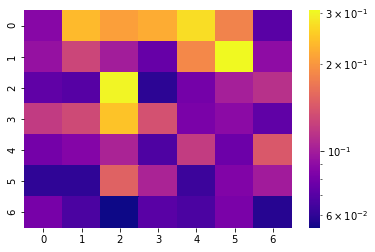

[[0.087 0.236 0.209 0.223 0.275 0.181 0.071]
 [0.093 0.128 0.1   0.075 0.186 0.307 0.09 ]
 [0.073 0.07  0.301 0.059 0.08  0.101 0.113]
 [0.12  0.131 0.247 0.136 0.082 0.089 0.073]
 [0.08  0.086 0.104 0.068 0.121 0.077 0.143]
 [0.06  0.06  0.151 0.104 0.063 0.085 0.099]
 [0.081 0.067 0.054 0.071 0.067 0.082 0.058]]


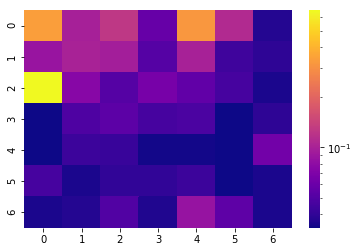

[[0.336 0.099 0.126 0.058 0.319 0.11  0.037]
 [0.087 0.101 0.096 0.051 0.1   0.044 0.039]
 [0.662 0.075 0.051 0.066 0.056 0.046 0.035]
 [0.033 0.049 0.054 0.046 0.048 0.033 0.039]
 [0.033 0.043 0.042 0.034 0.034 0.033 0.064]
 [0.046 0.035 0.04  0.04  0.043 0.033 0.035]
 [0.035 0.037 0.05  0.036 0.086 0.055 0.035]]


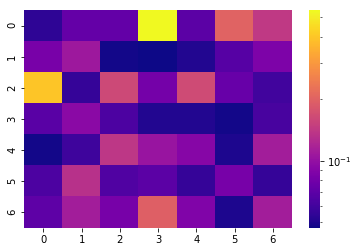

[[0.054 0.074 0.073 0.539 0.07  0.201 0.141]
 [0.084 0.107 0.048 0.047 0.051 0.068 0.086]
 [0.398 0.056 0.161 0.081 0.165 0.075 0.06 ]
 [0.069 0.094 0.064 0.051 0.051 0.048 0.062]
 [0.048 0.059 0.139 0.103 0.091 0.05  0.111]
 [0.064 0.132 0.065 0.07  0.056 0.083 0.056]
 [0.071 0.111 0.083 0.195 0.088 0.05  0.111]]


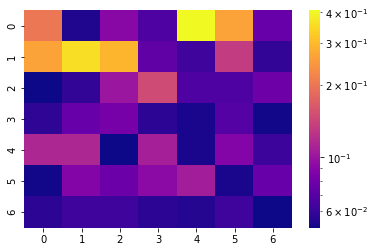

[[0.202 0.054 0.091 0.067 0.408 0.262 0.076]
 [0.261 0.361 0.291 0.073 0.062 0.133 0.059]
 [0.051 0.059 0.101 0.149 0.067 0.067 0.079]
 [0.058 0.076 0.083 0.057 0.053 0.069 0.052]
 [0.114 0.114 0.051 0.108 0.053 0.089 0.061]
 [0.052 0.088 0.078 0.093 0.106 0.053 0.076]
 [0.057 0.062 0.062 0.057 0.055 0.062 0.051]]


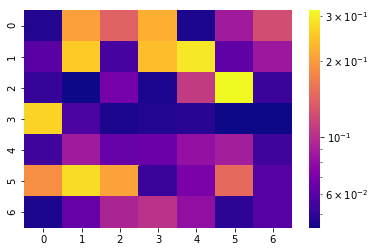

[[0.047 0.204 0.14  0.222 0.046 0.087 0.124]
 [0.06  0.255 0.055 0.239 0.292 0.062 0.085]
 [0.051 0.044 0.069 0.046 0.109 0.316 0.052]
 [0.266 0.056 0.046 0.047 0.048 0.044 0.044]
 [0.053 0.087 0.064 0.066 0.081 0.089 0.053]
 [0.186 0.279 0.208 0.052 0.071 0.149 0.059]
 [0.046 0.064 0.093 0.102 0.08  0.049 0.059]]


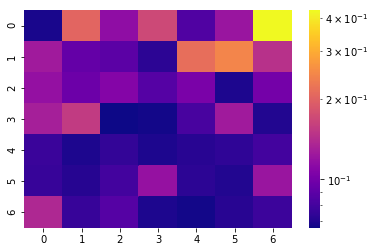

[[0.068 0.204 0.115 0.17  0.085 0.121 0.426]
 [0.126 0.093 0.089 0.073 0.214 0.246 0.145]
 [0.118 0.097 0.109 0.087 0.103 0.069 0.1  ]
 [0.129 0.155 0.066 0.067 0.082 0.126 0.07 ]
 [0.077 0.069 0.075 0.069 0.072 0.074 0.08 ]
 [0.076 0.071 0.08  0.119 0.073 0.07  0.121]
 [0.137 0.076 0.087 0.069 0.067 0.072 0.078]]


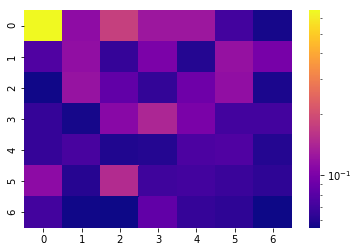

[[0.651 0.114 0.178 0.125 0.126 0.071 0.057]
 [0.077 0.116 0.066 0.101 0.06  0.12  0.098]
 [0.056 0.121 0.085 0.065 0.092 0.116 0.058]
 [0.066 0.057 0.11  0.142 0.1   0.071 0.071]
 [0.066 0.073 0.059 0.06  0.075 0.077 0.06 ]
 [0.113 0.061 0.15  0.07  0.071 0.068 0.063]
 [0.071 0.056 0.055 0.085 0.066 0.063 0.055]]


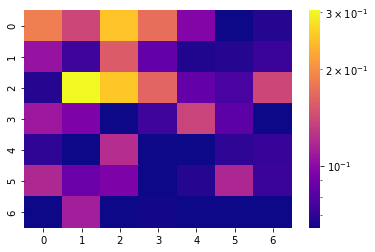

[[0.185 0.14  0.25  0.171 0.097 0.064 0.068]
 [0.105 0.074 0.156 0.085 0.067 0.068 0.073]
 [0.068 0.304 0.254 0.164 0.085 0.077 0.14 ]
 [0.108 0.094 0.064 0.074 0.137 0.083 0.064]
 [0.07  0.064 0.121 0.064 0.064 0.07  0.072]
 [0.118 0.087 0.094 0.064 0.068 0.117 0.073]
 [0.064 0.112 0.064 0.065 0.064 0.064 0.064]]


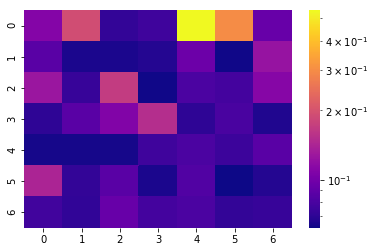

[[0.111 0.192 0.072 0.076 0.542 0.299 0.094]
 [0.087 0.065 0.065 0.067 0.097 0.063 0.124]
 [0.127 0.073 0.169 0.063 0.081 0.078 0.112]
 [0.07  0.087 0.109 0.152 0.07  0.08  0.066]
 [0.064 0.064 0.064 0.076 0.081 0.075 0.087]
 [0.142 0.072 0.087 0.065 0.084 0.062 0.067]
 [0.077 0.071 0.094 0.078 0.081 0.072 0.073]]


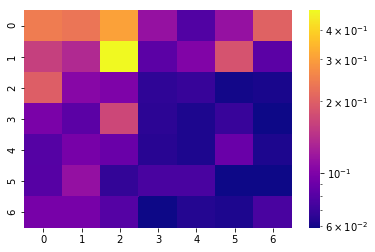

[[0.245 0.233 0.306 0.114 0.079 0.114 0.204]
 [0.16  0.136 0.482 0.083 0.102 0.184 0.083]
 [0.2   0.105 0.1   0.067 0.069 0.06  0.061]
 [0.098 0.083 0.169 0.066 0.062 0.07  0.059]
 [0.08  0.096 0.089 0.065 0.062 0.089 0.062]
 [0.081 0.113 0.068 0.076 0.076 0.059 0.059]
 [0.096 0.096 0.08  0.059 0.064 0.062 0.076]]


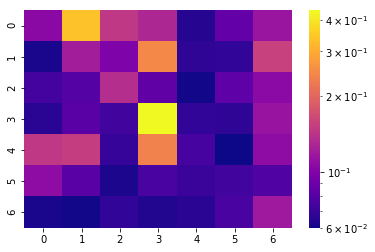

[[0.105 0.337 0.146 0.13  0.065 0.087 0.115]
 [0.062 0.121 0.099 0.247 0.067 0.068 0.155]
 [0.074 0.08  0.136 0.085 0.061 0.084 0.106]
 [0.066 0.082 0.073 0.436 0.068 0.067 0.114]
 [0.146 0.152 0.07  0.238 0.075 0.06  0.108]
 [0.108 0.082 0.063 0.076 0.071 0.073 0.079]
 [0.062 0.061 0.068 0.064 0.066 0.076 0.118]]
SKIPPPPPPEDDDD


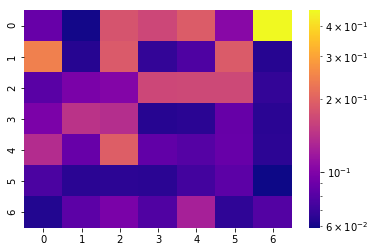

[[0.088 0.06  0.182 0.166 0.192 0.105 0.464]
 [0.244 0.064 0.189 0.068 0.077 0.19  0.064]
 [0.082 0.097 0.102 0.166 0.168 0.168 0.068]
 [0.098 0.144 0.138 0.064 0.065 0.087 0.065]
 [0.137 0.088 0.195 0.085 0.08  0.088 0.066]
 [0.076 0.065 0.066 0.065 0.073 0.083 0.059]
 [0.063 0.083 0.097 0.078 0.125 0.067 0.079]]


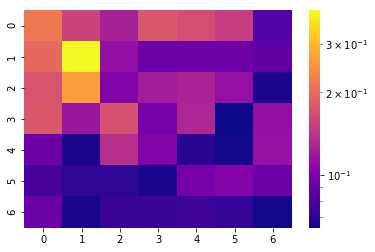

[[0.217 0.157 0.125 0.179 0.167 0.152 0.083]
 [0.197 0.399 0.112 0.093 0.094 0.094 0.088]
 [0.172 0.266 0.102 0.122 0.128 0.113 0.067]
 [0.179 0.117 0.17  0.098 0.129 0.064 0.112]
 [0.094 0.067 0.138 0.103 0.07  0.065 0.114]
 [0.079 0.071 0.071 0.066 0.098 0.104 0.093]
 [0.092 0.066 0.074 0.074 0.076 0.073 0.065]]


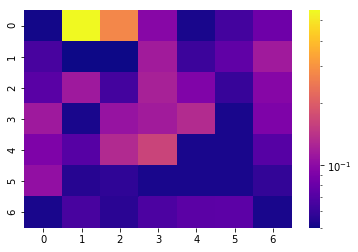

[[0.051 0.559 0.276 0.097 0.052 0.065 0.083]
 [0.066 0.05  0.05  0.116 0.062 0.076 0.115]
 [0.073 0.114 0.065 0.122 0.093 0.06  0.096]
 [0.114 0.052 0.108 0.116 0.133 0.052 0.092]
 [0.092 0.072 0.131 0.163 0.052 0.052 0.072]
 [0.105 0.055 0.058 0.052 0.052 0.052 0.059]
 [0.052 0.066 0.056 0.068 0.074 0.075 0.052]]


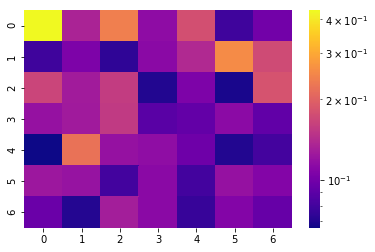

[[0.432 0.134 0.24  0.115 0.179 0.079 0.1  ]
 [0.079 0.105 0.074 0.112 0.139 0.256 0.173]
 [0.167 0.127 0.158 0.07  0.105 0.068 0.183]
 [0.119 0.126 0.155 0.089 0.093 0.113 0.092]
 [0.066 0.222 0.119 0.116 0.098 0.07  0.081]
 [0.124 0.12  0.08  0.112 0.08  0.119 0.108]
 [0.096 0.071 0.129 0.112 0.076 0.108 0.094]]


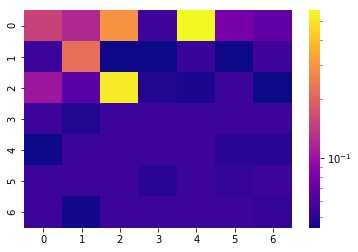

[[0.153 0.121 0.296 0.055 0.567 0.08  0.069]
 [0.055 0.223 0.044 0.044 0.054 0.044 0.056]
 [0.103 0.065 0.522 0.048 0.046 0.055 0.044]
 [0.055 0.048 0.055 0.055 0.055 0.055 0.055]
 [0.044 0.055 0.055 0.055 0.055 0.05  0.05 ]
 [0.055 0.055 0.055 0.05  0.055 0.053 0.055]
 [0.055 0.045 0.055 0.055 0.055 0.055 0.053]]


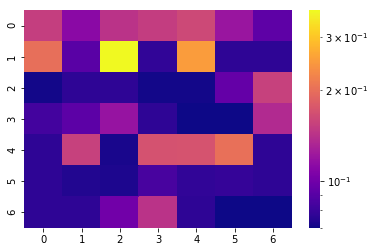

[[0.153 0.112 0.143 0.152 0.162 0.12  0.093]
 [0.2   0.091 0.367 0.078 0.252 0.077 0.077]
 [0.071 0.077 0.077 0.071 0.071 0.095 0.155]
 [0.083 0.092 0.119 0.077 0.07  0.07  0.136]
 [0.077 0.155 0.072 0.17  0.171 0.202 0.077]
 [0.077 0.074 0.073 0.085 0.078 0.079 0.077]
 [0.077 0.077 0.1   0.143 0.077 0.07  0.07 ]]


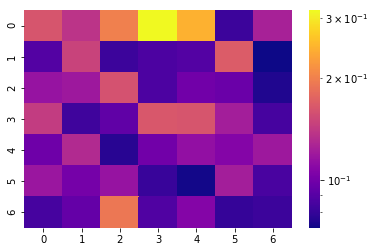

[[0.162 0.137 0.2   0.316 0.244 0.082 0.124]
 [0.089 0.148 0.082 0.087 0.089 0.168 0.072]
 [0.115 0.119 0.159 0.087 0.099 0.097 0.075]
 [0.143 0.083 0.093 0.164 0.162 0.122 0.085]
 [0.098 0.13  0.077 0.099 0.113 0.107 0.119]
 [0.117 0.101 0.115 0.081 0.073 0.122 0.086]
 [0.085 0.095 0.192 0.088 0.107 0.08  0.082]]


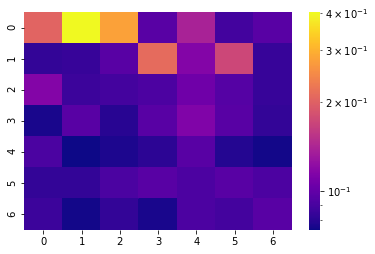

[[0.204 0.402 0.278 0.096 0.139 0.088 0.096]
 [0.083 0.084 0.096 0.212 0.116 0.173 0.084]
 [0.116 0.086 0.089 0.092 0.106 0.095 0.084]
 [0.076 0.096 0.08  0.096 0.114 0.096 0.083]
 [0.091 0.074 0.077 0.081 0.096 0.079 0.075]
 [0.083 0.083 0.091 0.096 0.092 0.096 0.092]
 [0.086 0.075 0.083 0.076 0.092 0.089 0.096]]


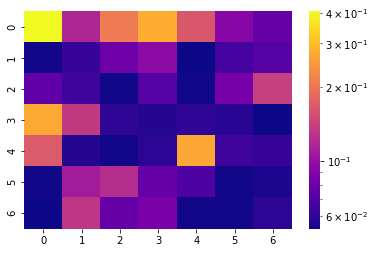

[[0.405 0.116 0.209 0.279 0.165 0.093 0.078]
 [0.054 0.062 0.081 0.095 0.053 0.066 0.072]
 [0.076 0.064 0.054 0.072 0.054 0.085 0.139]
 [0.274 0.134 0.06  0.057 0.06  0.058 0.053]
 [0.169 0.057 0.054 0.059 0.27  0.064 0.062]
 [0.054 0.108 0.123 0.078 0.069 0.054 0.056]
 [0.053 0.131 0.078 0.086 0.054 0.054 0.059]]


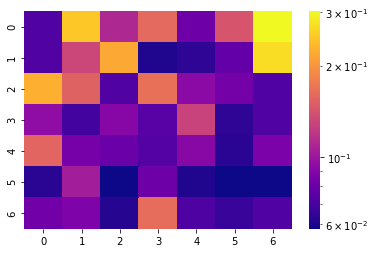

[[0.073 0.25  0.111 0.16  0.082 0.143 0.302]
 [0.073 0.132 0.218 0.061 0.064 0.079 0.272]
 [0.225 0.154 0.073 0.166 0.093 0.084 0.073]
 [0.095 0.069 0.091 0.075 0.129 0.064 0.073]
 [0.157 0.085 0.081 0.074 0.092 0.063 0.087]
 [0.063 0.104 0.058 0.082 0.061 0.058 0.058]
 [0.083 0.088 0.062 0.163 0.072 0.066 0.073]]


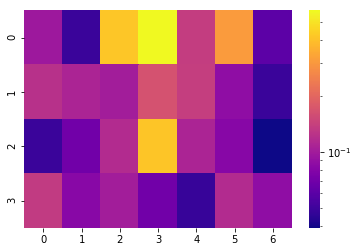

[[0.097 0.049 0.416 0.574 0.137 0.307 0.061]
 [0.122 0.109 0.101 0.166 0.138 0.087 0.049]
 [0.049 0.07  0.116 0.414 0.109 0.082 0.039]
 [0.134 0.083 0.101 0.07  0.048 0.116 0.087]]


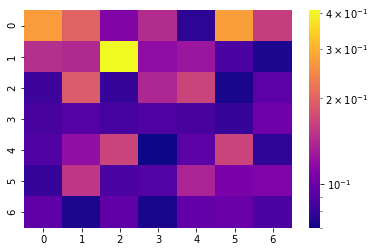

[[0.273 0.201 0.111 0.143 0.077 0.275 0.161]
 [0.146 0.141 0.409 0.118 0.125 0.087 0.073]
 [0.082 0.191 0.08  0.138 0.166 0.072 0.094]
 [0.086 0.091 0.085 0.089 0.086 0.08  0.102]
 [0.089 0.12  0.166 0.07  0.094 0.166 0.078]
 [0.08  0.153 0.087 0.09  0.137 0.107 0.109]
 [0.096 0.073 0.096 0.072 0.097 0.099 0.087]]


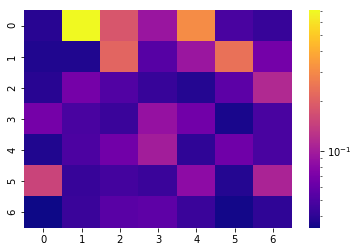

[[0.039 0.71  0.183 0.092 0.307 0.049 0.043]
 [0.037 0.037 0.213 0.054 0.093 0.241 0.067]
 [0.039 0.068 0.052 0.043 0.038 0.056 0.113]
 [0.068 0.049 0.044 0.088 0.066 0.036 0.049]
 [0.037 0.05  0.066 0.1   0.041 0.065 0.049]
 [0.15  0.043 0.047 0.044 0.082 0.038 0.107]
 [0.034 0.044 0.055 0.057 0.044 0.035 0.041]]


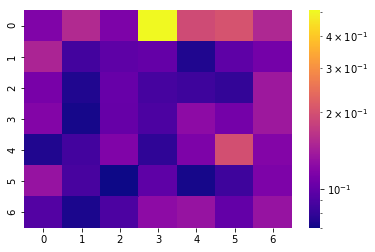

[[0.116 0.154 0.114 0.506 0.193 0.204 0.152]
 [0.149 0.086 0.098 0.101 0.074 0.098 0.109]
 [0.112 0.074 0.103 0.087 0.084 0.08  0.137]
 [0.118 0.072 0.102 0.09  0.124 0.109 0.137]
 [0.074 0.086 0.116 0.079 0.114 0.199 0.118]
 [0.131 0.088 0.07  0.098 0.072 0.084 0.114]
 [0.093 0.073 0.09  0.124 0.131 0.1   0.131]]


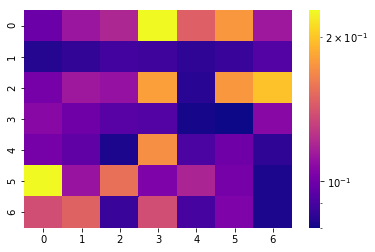

[[0.099 0.113 0.12  0.227 0.147 0.176 0.114]
 [0.083 0.086 0.089 0.088 0.085 0.087 0.093]
 [0.102 0.114 0.111 0.18  0.084 0.176 0.198]
 [0.107 0.1   0.094 0.093 0.081 0.08  0.107]
 [0.102 0.096 0.082 0.172 0.091 0.1   0.085]
 [0.227 0.112 0.156 0.104 0.119 0.102 0.082]
 [0.138 0.148 0.087 0.138 0.09  0.104 0.082]]
SKIPPPPPPEDDDD


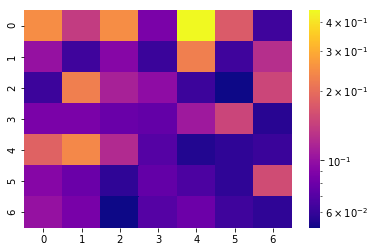

[[0.248 0.14  0.249 0.086 0.449 0.175 0.063]
 [0.101 0.063 0.092 0.061 0.227 0.063 0.126]
 [0.062 0.226 0.114 0.097 0.062 0.051 0.151]
 [0.086 0.086 0.078 0.076 0.107 0.15  0.056]
 [0.184 0.24  0.122 0.07  0.055 0.058 0.061]
 [0.092 0.079 0.058 0.076 0.067 0.058 0.157]
 [0.101 0.085 0.051 0.07  0.08  0.063 0.058]]


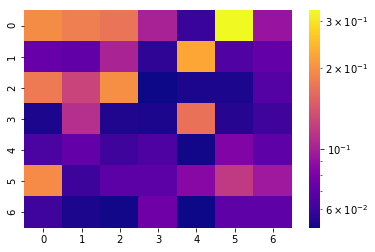

[[0.196 0.181 0.171 0.102 0.059 0.328 0.093]
 [0.073 0.071 0.103 0.057 0.225 0.066 0.072]
 [0.178 0.127 0.2   0.051 0.053 0.053 0.067]
 [0.053 0.111 0.054 0.053 0.169 0.055 0.061]
 [0.064 0.072 0.061 0.065 0.052 0.083 0.07 ]
 [0.195 0.06  0.069 0.069 0.086 0.119 0.096]
 [0.061 0.053 0.052 0.076 0.051 0.07  0.07 ]]


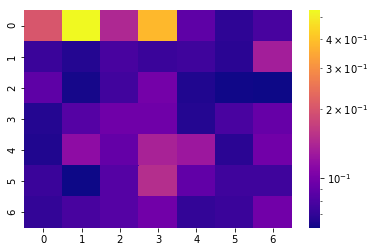

[[0.202 0.533 0.143 0.38  0.088 0.069 0.078]
 [0.073 0.066 0.078 0.073 0.075 0.068 0.132]
 [0.088 0.063 0.076 0.099 0.065 0.062 0.061]
 [0.066 0.084 0.097 0.097 0.066 0.079 0.092]
 [0.065 0.116 0.091 0.137 0.126 0.068 0.098]
 [0.073 0.061 0.084 0.149 0.09  0.075 0.075]
 [0.071 0.078 0.084 0.098 0.071 0.073 0.098]]


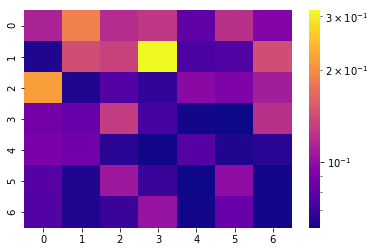

[[0.113 0.189 0.119 0.127 0.081 0.122 0.094]
 [0.064 0.143 0.135 0.314 0.075 0.076 0.143]
 [0.217 0.064 0.077 0.068 0.097 0.092 0.109]
 [0.088 0.084 0.13  0.073 0.062 0.061 0.122]
 [0.091 0.087 0.066 0.062 0.078 0.064 0.066]
 [0.078 0.064 0.106 0.07  0.061 0.099 0.062]
 [0.077 0.064 0.07  0.103 0.062 0.084 0.062]]


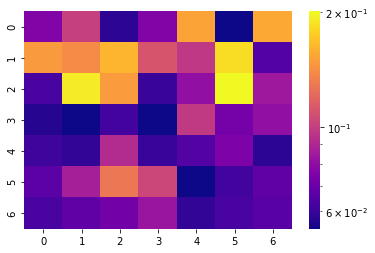

[[0.076 0.101 0.058 0.076 0.153 0.054 0.155]
 [0.147 0.139 0.162 0.111 0.097 0.185 0.065]
 [0.063 0.192 0.148 0.06  0.081 0.201 0.084]
 [0.057 0.054 0.062 0.054 0.098 0.073 0.081]
 [0.061 0.059 0.092 0.06  0.065 0.075 0.058]
 [0.067 0.087 0.129 0.104 0.054 0.062 0.068]
 [0.063 0.068 0.072 0.083 0.059 0.063 0.066]]


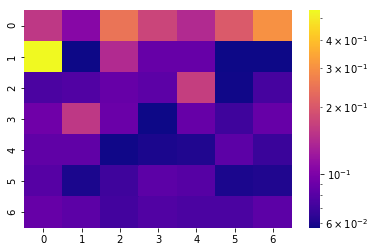

[[0.156 0.106 0.248 0.174 0.14  0.203 0.302]
 [0.543 0.057 0.14  0.087 0.087 0.057 0.057]
 [0.075 0.078 0.087 0.083 0.165 0.058 0.073]
 [0.092 0.156 0.09  0.057 0.087 0.071 0.087]
 [0.084 0.084 0.058 0.06  0.061 0.083 0.069]
 [0.08  0.06  0.071 0.083 0.08  0.06  0.061]
 [0.087 0.083 0.072 0.078 0.075 0.075 0.083]]


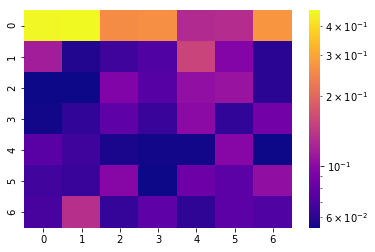

[[0.463 0.467 0.257 0.262 0.128 0.13  0.273]
 [0.116 0.058 0.066 0.072 0.155 0.095 0.06 ]
 [0.054 0.054 0.094 0.075 0.105 0.108 0.06 ]
 [0.055 0.062 0.078 0.064 0.1   0.062 0.087]
 [0.076 0.066 0.056 0.055 0.055 0.097 0.054]
 [0.067 0.064 0.098 0.054 0.085 0.077 0.104]
 [0.069 0.134 0.063 0.078 0.061 0.077 0.072]]
SKIPPPPPPEDDDD


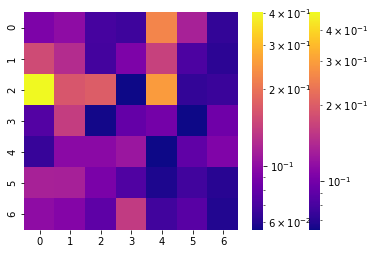

[[0.091 0.1   0.07  0.067 0.225 0.116 0.064]
 [0.154 0.125 0.069 0.091 0.144 0.072 0.062]
 [0.402 0.166 0.174 0.056 0.254 0.064 0.066]
 [0.074 0.141 0.057 0.081 0.087 0.056 0.085]
 [0.065 0.098 0.098 0.107 0.056 0.079 0.093]
 [0.116 0.115 0.09  0.073 0.059 0.068 0.061]
 [0.1   0.095 0.078 0.138 0.068 0.076 0.06 ]]


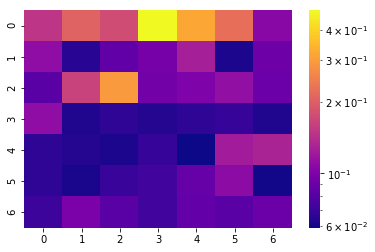

[[0.149 0.207 0.175 0.485 0.318 0.224 0.106]
 [0.111 0.065 0.086 0.096 0.126 0.062 0.092]
 [0.082 0.164 0.296 0.094 0.1   0.113 0.091]
 [0.111 0.063 0.067 0.064 0.067 0.069 0.063]
 [0.067 0.064 0.062 0.069 0.059 0.123 0.131]
 [0.067 0.061 0.07  0.073 0.088 0.109 0.06 ]
 [0.071 0.098 0.082 0.073 0.087 0.082 0.091]]


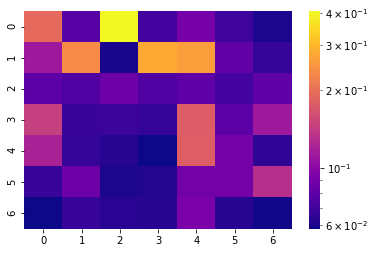

[[0.194 0.078 0.406 0.071 0.091 0.07  0.061]
 [0.112 0.235 0.06  0.278 0.262 0.082 0.067]
 [0.08  0.075 0.087 0.075 0.081 0.071 0.081]
 [0.146 0.068 0.069 0.067 0.178 0.08  0.113]
 [0.12  0.067 0.063 0.058 0.18  0.089 0.065]
 [0.068 0.087 0.061 0.062 0.089 0.09  0.131]
 [0.058 0.068 0.064 0.063 0.093 0.063 0.059]]


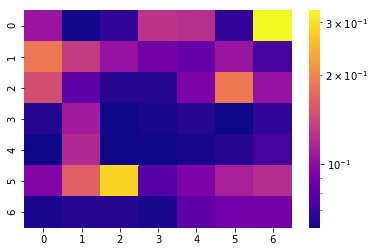

[[0.106 0.062 0.068 0.127 0.124 0.068 0.329]
 [0.186 0.133 0.104 0.089 0.084 0.106 0.074]
 [0.148 0.081 0.065 0.065 0.093 0.188 0.104]
 [0.065 0.11  0.061 0.063 0.065 0.061 0.068]
 [0.061 0.119 0.061 0.061 0.063 0.065 0.074]
 [0.096 0.163 0.283 0.079 0.093 0.113 0.122]
 [0.063 0.065 0.065 0.063 0.082 0.088 0.089]]


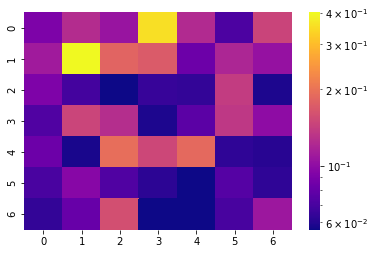

[[0.091 0.125 0.106 0.357 0.123 0.072 0.147]
 [0.111 0.401 0.182 0.171 0.084 0.119 0.104]
 [0.092 0.069 0.056 0.065 0.064 0.139 0.059]
 [0.073 0.148 0.126 0.059 0.077 0.135 0.1  ]
 [0.084 0.058 0.194 0.151 0.188 0.063 0.061]
 [0.071 0.096 0.073 0.062 0.056 0.075 0.063]
 [0.064 0.082 0.159 0.056 0.056 0.07  0.108]]


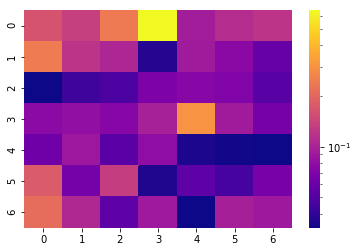

[[0.165 0.135 0.243 0.647 0.095 0.111 0.12 ]
 [0.245 0.121 0.104 0.037 0.092 0.077 0.058]
 [0.033 0.044 0.048 0.069 0.074 0.071 0.052]
 [0.078 0.082 0.075 0.098 0.303 0.092 0.066]
 [0.062 0.089 0.053 0.08  0.035 0.034 0.033]
 [0.18  0.065 0.132 0.036 0.055 0.046 0.067]
 [0.212 0.106 0.055 0.091 0.033 0.097 0.09 ]]


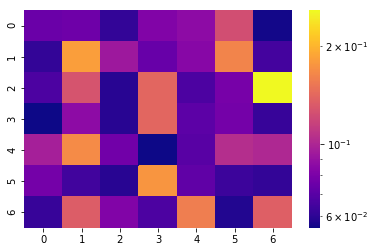

[[0.075 0.076 0.061 0.082 0.086 0.124 0.056]
 [0.061 0.182 0.093 0.074 0.084 0.163 0.065]
 [0.067 0.128 0.059 0.141 0.067 0.079 0.258]
 [0.055 0.086 0.059 0.141 0.071 0.078 0.062]
 [0.096 0.168 0.077 0.055 0.07  0.104 0.101]
 [0.078 0.064 0.059 0.176 0.072 0.063 0.061]
 [0.062 0.134 0.082 0.067 0.158 0.058 0.136]]


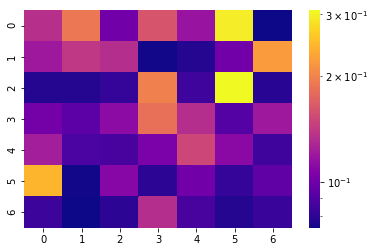

[[0.135 0.19  0.101 0.162 0.117 0.295 0.074]
 [0.12  0.14  0.133 0.075 0.078 0.101 0.221]
 [0.078 0.078 0.082 0.198 0.085 0.308 0.079]
 [0.102 0.094 0.112 0.184 0.133 0.091 0.12 ]
 [0.123 0.088 0.087 0.104 0.151 0.111 0.085]
 [0.245 0.075 0.109 0.08  0.101 0.082 0.095]
 [0.084 0.074 0.08  0.133 0.087 0.078 0.083]]


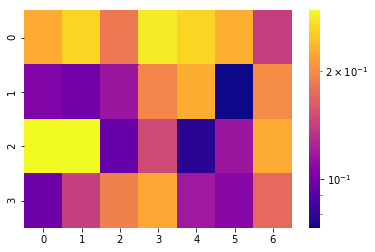

[[0.227 0.263 0.185 0.282 0.263 0.231 0.141]
 [0.105 0.099 0.116 0.196 0.23  0.073 0.201]
 [0.296 0.296 0.095 0.149 0.078 0.116 0.228]
 [0.098 0.142 0.192 0.225 0.118 0.108 0.174]]


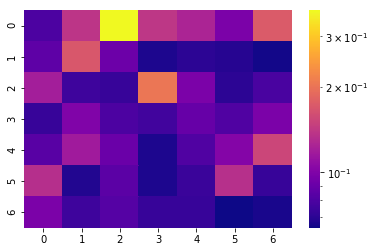

[[0.08  0.138 0.37  0.139 0.125 0.098 0.173]
 [0.086 0.17  0.092 0.067 0.07  0.069 0.065]
 [0.12  0.075 0.073 0.203 0.098 0.07  0.079]
 [0.073 0.1   0.08  0.076 0.089 0.081 0.098]
 [0.084 0.117 0.091 0.067 0.081 0.102 0.153]
 [0.133 0.068 0.085 0.067 0.074 0.134 0.073]
 [0.098 0.075 0.083 0.073 0.073 0.064 0.066]]


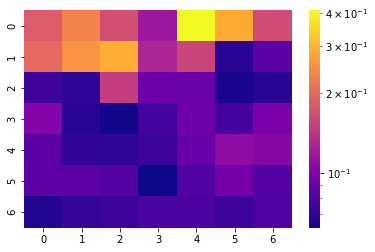

[[0.181 0.233 0.168 0.117 0.408 0.286 0.165]
 [0.198 0.253 0.29  0.128 0.157 0.068 0.085]
 [0.074 0.069 0.151 0.092 0.091 0.064 0.068]
 [0.103 0.068 0.063 0.076 0.092 0.076 0.098]
 [0.084 0.07  0.069 0.073 0.089 0.109 0.104]
 [0.084 0.084 0.081 0.062 0.08  0.095 0.082]
 [0.066 0.071 0.073 0.078 0.079 0.073 0.08 ]]


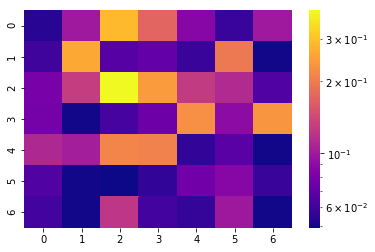

[[0.054 0.1   0.289 0.173 0.087 0.058 0.1  ]
 [0.06  0.262 0.067 0.072 0.058 0.196 0.05 ]
 [0.08  0.13  0.395 0.243 0.128 0.113 0.065]
 [0.079 0.05  0.062 0.076 0.228 0.09  0.236]
 [0.111 0.103 0.214 0.208 0.056 0.068 0.05 ]
 [0.065 0.05  0.049 0.056 0.077 0.087 0.058]
 [0.061 0.05  0.124 0.061 0.057 0.099 0.05 ]]


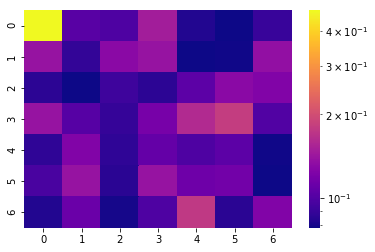

[[0.475 0.103 0.099 0.148 0.083 0.078 0.09 ]
 [0.139 0.088 0.13  0.139 0.078 0.079 0.136]
 [0.086 0.078 0.092 0.086 0.105 0.13  0.125]
 [0.139 0.102 0.089 0.119 0.161 0.181 0.1  ]
 [0.087 0.125 0.087 0.109 0.099 0.105 0.079]
 [0.097 0.139 0.085 0.139 0.114 0.116 0.078]
 [0.083 0.112 0.08  0.099 0.176 0.085 0.125]]
SKIPPPPPPEDDDD


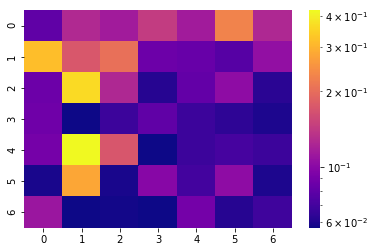

[[0.081 0.126 0.115 0.144 0.115 0.229 0.125]
 [0.319 0.173 0.204 0.086 0.084 0.077 0.105]
 [0.086 0.365 0.125 0.062 0.082 0.103 0.063]
 [0.087 0.057 0.068 0.081 0.068 0.064 0.06 ]
 [0.09  0.421 0.172 0.057 0.068 0.071 0.068]
 [0.059 0.281 0.059 0.099 0.07  0.103 0.06 ]
 [0.11  0.057 0.058 0.057 0.089 0.062 0.069]]


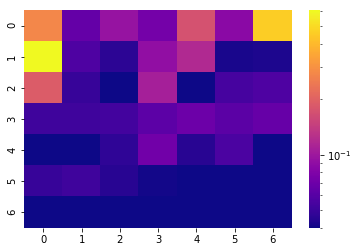

[[0.274 0.066 0.095 0.074 0.173 0.086 0.458]
 [0.608 0.057 0.046 0.091 0.118 0.042 0.043]
 [0.19  0.049 0.04  0.107 0.04  0.054 0.057]
 [0.052 0.052 0.053 0.063 0.07  0.062 0.067]
 [0.04  0.04  0.047 0.072 0.045 0.056 0.04 ]
 [0.049 0.052 0.045 0.041 0.04  0.04  0.04 ]
 [0.04  0.04  0.04  0.04  0.04  0.04  0.04 ]]


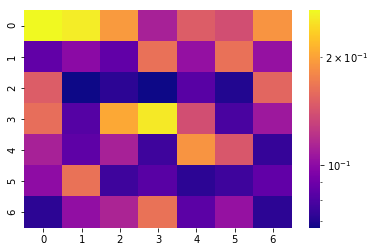

[[0.269 0.258 0.194 0.112 0.149 0.139 0.19 ]
 [0.086 0.1   0.086 0.164 0.103 0.164 0.104]
 [0.149 0.067 0.072 0.067 0.083 0.07  0.156]
 [0.161 0.082 0.205 0.255 0.139 0.079 0.107]
 [0.112 0.085 0.112 0.076 0.19  0.145 0.074]
 [0.101 0.165 0.076 0.083 0.072 0.076 0.086]
 [0.072 0.102 0.114 0.165 0.084 0.104 0.072]]


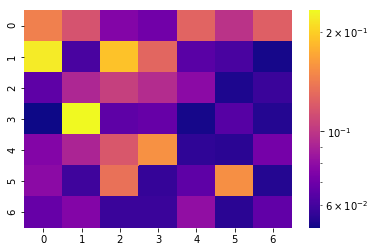

[[0.145 0.116 0.076 0.071 0.127 0.098 0.124]
 [0.222 0.061 0.191 0.128 0.065 0.061 0.052]
 [0.066 0.092 0.105 0.095 0.079 0.053 0.058]
 [0.051 0.233 0.066 0.068 0.052 0.064 0.054]
 [0.076 0.091 0.119 0.157 0.056 0.055 0.072]
 [0.079 0.059 0.135 0.057 0.066 0.155 0.054]
 [0.068 0.076 0.058 0.058 0.081 0.055 0.067]]


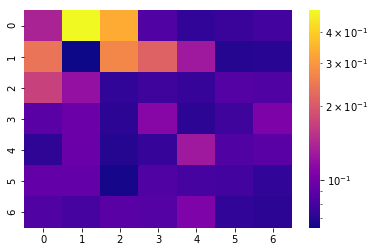

[[0.138 0.49  0.334 0.085 0.073 0.076 0.079]
 [0.241 0.064 0.271 0.211 0.128 0.069 0.07 ]
 [0.171 0.12  0.073 0.078 0.075 0.086 0.085]
 [0.088 0.097 0.071 0.111 0.071 0.077 0.106]
 [0.072 0.096 0.069 0.075 0.128 0.084 0.088]
 [0.093 0.093 0.066 0.085 0.08  0.079 0.073]
 [0.085 0.08  0.088 0.086 0.107 0.073 0.071]]


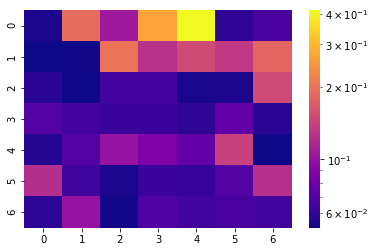

[[0.055 0.192 0.106 0.267 0.415 0.059 0.066]
 [0.052 0.053 0.199 0.126 0.151 0.134 0.182]
 [0.057 0.052 0.065 0.065 0.054 0.055 0.15 ]
 [0.07  0.065 0.062 0.062 0.059 0.075 0.057]
 [0.056 0.07  0.101 0.087 0.076 0.14  0.052]
 [0.122 0.063 0.055 0.062 0.061 0.07  0.124]
 [0.058 0.101 0.053 0.069 0.064 0.066 0.064]]
SKIPPPPPPEDDDD


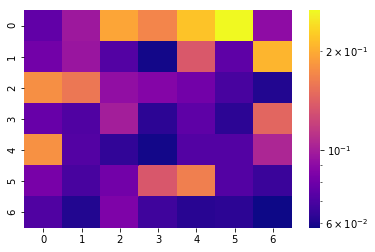

[[0.076 0.097 0.194 0.169 0.219 0.265 0.091]
 [0.081 0.095 0.072 0.059 0.136 0.075 0.207]
 [0.177 0.159 0.092 0.087 0.081 0.069 0.061]
 [0.078 0.071 0.1   0.063 0.075 0.063 0.146]
 [0.179 0.072 0.064 0.059 0.072 0.072 0.104]
 [0.083 0.069 0.081 0.135 0.164 0.072 0.066]
 [0.071 0.061 0.085 0.067 0.062 0.063 0.058]]


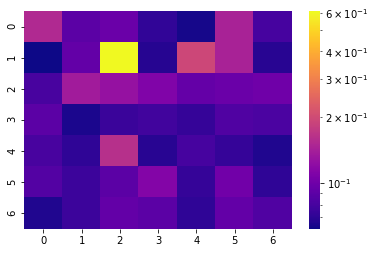

[[0.153 0.09  0.098 0.072 0.064 0.145 0.08 ]
 [0.062 0.094 0.61  0.068 0.196 0.146 0.069]
 [0.081 0.138 0.127 0.111 0.095 0.098 0.101]
 [0.09  0.065 0.075 0.078 0.073 0.084 0.082]
 [0.081 0.071 0.162 0.069 0.08  0.073 0.066]
 [0.086 0.076 0.09  0.113 0.073 0.102 0.071]
 [0.066 0.076 0.094 0.09  0.071 0.094 0.084]]
SKIPPPPPPEDDDD


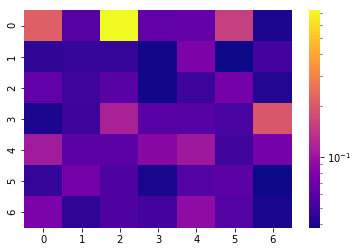

[[0.212 0.059 0.728 0.064 0.066 0.155 0.041]
 [0.045 0.047 0.047 0.039 0.079 0.038 0.052]
 [0.064 0.05  0.06  0.039 0.049 0.074 0.042]
 [0.041 0.049 0.114 0.06  0.059 0.054 0.196]
 [0.105 0.061 0.061 0.087 0.103 0.051 0.075]
 [0.047 0.074 0.056 0.04  0.058 0.062 0.038]
 [0.077 0.045 0.056 0.052 0.091 0.058 0.04 ]]


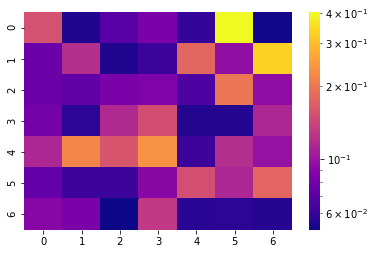

[[0.153 0.054 0.07  0.084 0.059 0.402 0.052]
 [0.077 0.119 0.054 0.061 0.179 0.095 0.329]
 [0.078 0.073 0.084 0.086 0.067 0.199 0.094]
 [0.082 0.057 0.116 0.151 0.055 0.055 0.114]
 [0.114 0.218 0.16  0.237 0.061 0.119 0.098]
 [0.075 0.061 0.061 0.091 0.152 0.113 0.178]
 [0.089 0.084 0.051 0.129 0.056 0.057 0.055]]


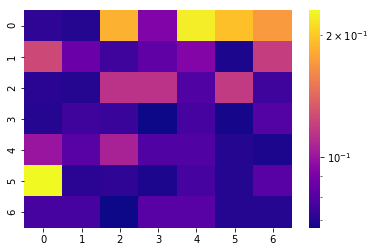

[[0.072 0.07  0.186 0.092 0.223 0.195 0.172]
 [0.125 0.086 0.075 0.083 0.093 0.069 0.12 ]
 [0.071 0.07  0.114 0.114 0.079 0.118 0.075]
 [0.07  0.075 0.074 0.067 0.077 0.068 0.08 ]
 [0.1   0.081 0.106 0.079 0.079 0.07  0.069]
 [0.23  0.071 0.072 0.069 0.077 0.07  0.081]
 [0.077 0.077 0.067 0.081 0.081 0.07  0.07 ]]


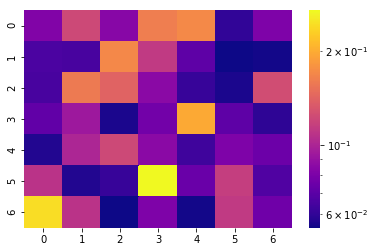

[[0.082 0.122 0.084 0.162 0.171 0.06  0.081]
 [0.066 0.065 0.17  0.112 0.071 0.054 0.055]
 [0.065 0.159 0.141 0.085 0.061 0.056 0.125]
 [0.072 0.093 0.056 0.077 0.198 0.071 0.059]
 [0.057 0.1   0.122 0.085 0.063 0.081 0.075]
 [0.108 0.057 0.061 0.27  0.074 0.115 0.067]
 [0.243 0.108 0.054 0.081 0.055 0.112 0.076]]


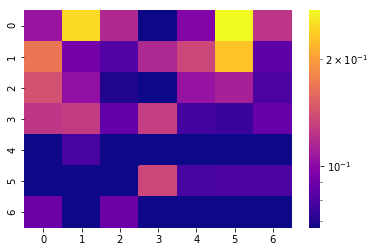

[[0.106 0.246 0.117 0.067 0.097 0.273 0.124]
 [0.169 0.092 0.082 0.116 0.135 0.229 0.085]
 [0.142 0.103 0.07  0.067 0.105 0.112 0.08 ]
 [0.125 0.128 0.087 0.129 0.078 0.075 0.088]
 [0.067 0.079 0.067 0.067 0.067 0.067 0.067]
 [0.067 0.067 0.067 0.135 0.079 0.08  0.08 ]
 [0.09  0.067 0.09  0.067 0.067 0.067 0.067]]


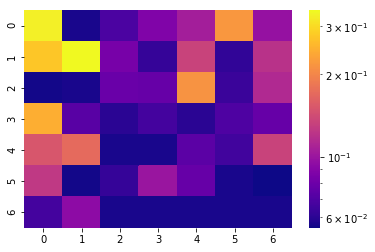

[[0.329 0.057 0.069 0.088 0.106 0.219 0.098]
 [0.276 0.343 0.084 0.063 0.134 0.062 0.12 ]
 [0.056 0.057 0.079 0.078 0.214 0.064 0.114]
 [0.246 0.073 0.06  0.067 0.06  0.07  0.078]
 [0.151 0.171 0.057 0.057 0.074 0.066 0.134]
 [0.126 0.056 0.063 0.1   0.078 0.057 0.055]
 [0.067 0.094 0.057 0.057 0.057 0.057 0.057]]
SKIPPPPPPEDDDD


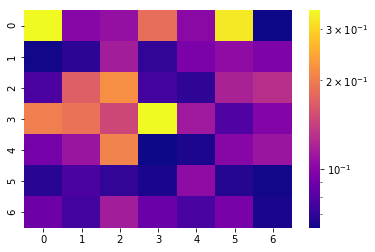

[[0.346 0.101 0.107 0.185 0.102 0.325 0.063]
 [0.064 0.069 0.115 0.071 0.095 0.104 0.097]
 [0.078 0.17  0.22  0.075 0.07  0.119 0.129]
 [0.203 0.19  0.148 0.346 0.113 0.079 0.099]
 [0.093 0.11  0.207 0.063 0.066 0.101 0.11 ]
 [0.068 0.078 0.071 0.065 0.104 0.067 0.064]
 [0.09  0.075 0.115 0.089 0.077 0.094 0.065]]


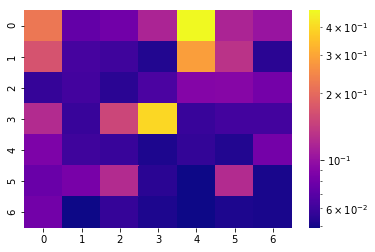

[[0.222 0.074 0.08  0.117 0.477 0.117 0.102]
 [0.168 0.063 0.061 0.053 0.286 0.131 0.055]
 [0.058 0.062 0.055 0.065 0.09  0.091 0.082]
 [0.123 0.059 0.152 0.397 0.059 0.062 0.062]
 [0.086 0.061 0.059 0.052 0.057 0.053 0.082]
 [0.077 0.084 0.123 0.055 0.049 0.123 0.051]
 [0.081 0.049 0.058 0.052 0.049 0.052 0.051]]


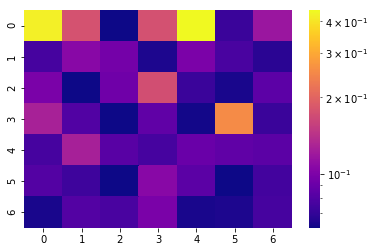

[[0.423 0.177 0.061 0.175 0.442 0.072 0.117]
 [0.076 0.106 0.095 0.064 0.099 0.077 0.067]
 [0.098 0.061 0.093 0.173 0.072 0.063 0.085]
 [0.127 0.08  0.061 0.086 0.062 0.255 0.072]
 [0.076 0.126 0.083 0.076 0.09  0.086 0.084]
 [0.081 0.073 0.061 0.106 0.084 0.061 0.075]
 [0.063 0.081 0.077 0.098 0.063 0.064 0.076]]


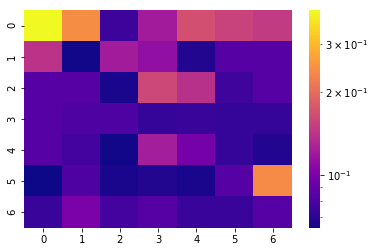

[[0.397 0.242 0.075 0.121 0.168 0.156 0.148]
 [0.141 0.065 0.121 0.112 0.068 0.084 0.084]
 [0.084 0.084 0.066 0.161 0.139 0.076 0.084]
 [0.084 0.081 0.081 0.073 0.074 0.073 0.073]
 [0.084 0.078 0.065 0.123 0.097 0.073 0.068]
 [0.064 0.081 0.066 0.068 0.066 0.084 0.238]
 [0.074 0.099 0.078 0.084 0.074 0.074 0.084]]


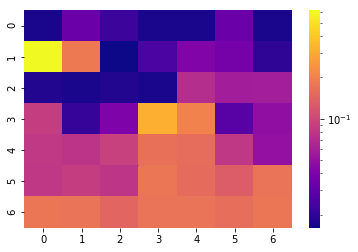

[[0.017 0.033 0.022 0.017 0.017 0.033 0.017]
 [0.616 0.181 0.016 0.025 0.041 0.037 0.02 ]
 [0.018 0.017 0.018 0.017 0.072 0.058 0.059]
 [0.088 0.021 0.04  0.322 0.2   0.028 0.048]
 [0.083 0.079 0.092 0.164 0.158 0.082 0.05 ]
 [0.082 0.088 0.08  0.176 0.156 0.132 0.173]
 [0.176 0.173 0.144 0.173 0.173 0.16  0.176]]


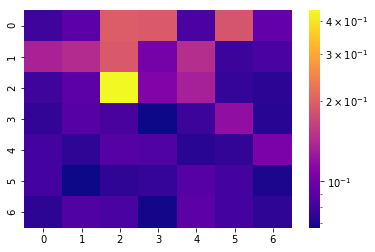

[[0.08  0.091 0.198 0.193 0.084 0.186 0.094]
 [0.135 0.143 0.192 0.103 0.145 0.079 0.084]
 [0.08  0.091 0.437 0.108 0.133 0.077 0.074]
 [0.076 0.089 0.083 0.067 0.079 0.118 0.073]
 [0.082 0.075 0.089 0.087 0.073 0.076 0.105]
 [0.082 0.067 0.075 0.077 0.089 0.082 0.07 ]
 [0.074 0.087 0.084 0.068 0.091 0.082 0.075]]


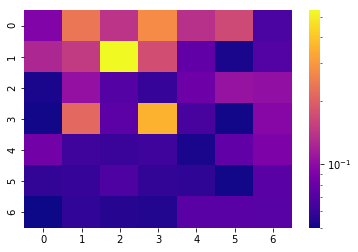

[[0.092 0.238 0.14  0.276 0.137 0.167 0.067]
 [0.126 0.149 0.535 0.174 0.076 0.052 0.07 ]
 [0.052 0.104 0.071 0.06  0.082 0.106 0.103]
 [0.051 0.212 0.074 0.358 0.066 0.051 0.096]
 [0.084 0.063 0.061 0.063 0.052 0.076 0.09 ]
 [0.059 0.06  0.068 0.059 0.057 0.051 0.073]
 [0.05  0.058 0.055 0.054 0.073 0.073 0.072]]


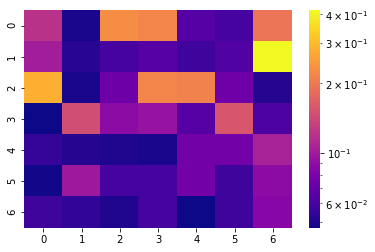

[[0.119 0.049 0.23  0.219 0.065 0.06  0.196]
 [0.102 0.052 0.06  0.065 0.058 0.063 0.416]
 [0.282 0.049 0.074 0.218 0.213 0.075 0.051]
 [0.047 0.146 0.089 0.094 0.065 0.157 0.062]
 [0.055 0.051 0.05  0.049 0.076 0.076 0.105]
 [0.048 0.098 0.06  0.06  0.076 0.058 0.089]
 [0.058 0.054 0.05  0.06  0.047 0.058 0.086]]


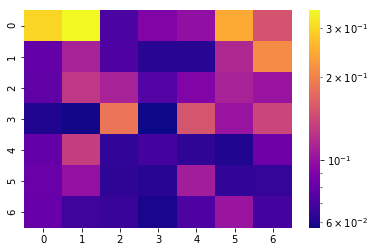

[[0.299 0.348 0.071 0.091 0.099 0.246 0.152]
 [0.08  0.111 0.072 0.062 0.062 0.116 0.211]
 [0.078 0.128 0.111 0.074 0.091 0.111 0.102]
 [0.06  0.058 0.186 0.057 0.153 0.102 0.139]
 [0.08  0.134 0.064 0.069 0.063 0.06  0.084]
 [0.082 0.1   0.063 0.062 0.108 0.064 0.065]
 [0.081 0.068 0.066 0.059 0.072 0.103 0.069]]


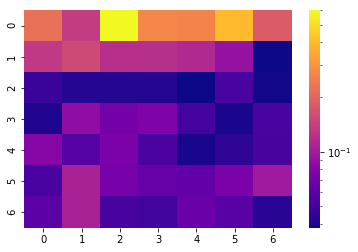

[[0.224 0.137 0.601 0.268 0.263 0.397 0.184]
 [0.132 0.155 0.121 0.12  0.113 0.091 0.038]
 [0.048 0.042 0.042 0.042 0.038 0.053 0.039]
 [0.041 0.087 0.071 0.076 0.051 0.04  0.053]
 [0.08  0.057 0.074 0.054 0.04  0.045 0.052]
 [0.053 0.106 0.072 0.064 0.063 0.074 0.098]
 [0.06  0.107 0.052 0.05  0.066 0.058 0.043]]


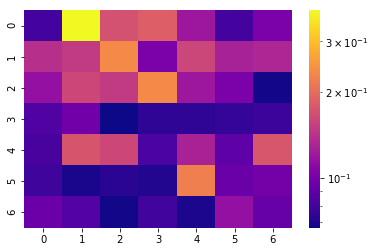

[[0.081 0.385 0.17  0.185 0.12  0.081 0.102]
 [0.14  0.15  0.234 0.102 0.16  0.128 0.131]
 [0.115 0.161 0.15  0.234 0.12  0.103 0.068]
 [0.085 0.098 0.067 0.074 0.074 0.076 0.078]
 [0.082 0.175 0.161 0.083 0.129 0.09  0.176]
 [0.079 0.069 0.073 0.071 0.222 0.095 0.099]
 [0.096 0.086 0.068 0.08  0.07  0.115 0.093]]


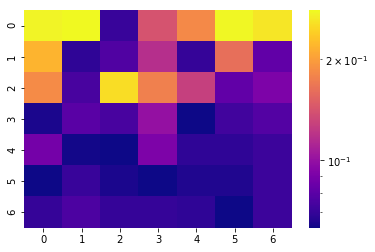

[[0.275 0.28  0.071 0.141 0.184 0.278 0.262]
 [0.219 0.069 0.077 0.117 0.07  0.162 0.082]
 [0.185 0.075 0.254 0.176 0.128 0.082 0.091]
 [0.065 0.08  0.075 0.1   0.063 0.073 0.078]
 [0.088 0.064 0.063 0.091 0.069 0.069 0.072]
 [0.063 0.071 0.065 0.063 0.066 0.066 0.072]
 [0.07  0.076 0.07  0.07  0.069 0.063 0.072]]


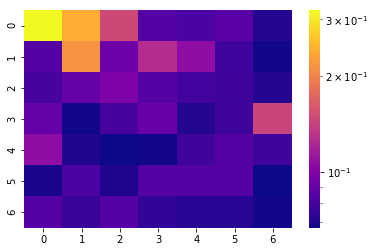

[[0.32  0.241 0.148 0.084 0.081 0.086 0.071]
 [0.084 0.214 0.093 0.127 0.107 0.078 0.068]
 [0.08  0.09  0.099 0.084 0.079 0.078 0.071]
 [0.09  0.068 0.08  0.091 0.071 0.078 0.144]
 [0.107 0.07  0.067 0.068 0.078 0.084 0.078]
 [0.069 0.081 0.07  0.084 0.084 0.084 0.067]
 [0.084 0.076 0.084 0.074 0.072 0.072 0.068]]
SKIPPPPPPEDDDD


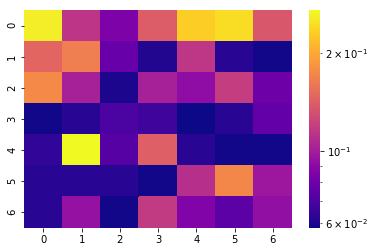

[[0.26  0.114 0.085 0.141 0.233 0.244 0.137]
 [0.147 0.166 0.078 0.061 0.115 0.062 0.059]
 [0.175 0.102 0.06  0.102 0.092 0.119 0.08 ]
 [0.059 0.062 0.07  0.067 0.058 0.062 0.077]
 [0.064 0.271 0.073 0.143 0.062 0.059 0.059]
 [0.062 0.062 0.062 0.059 0.111 0.173 0.097]
 [0.062 0.094 0.059 0.118 0.086 0.075 0.093]]


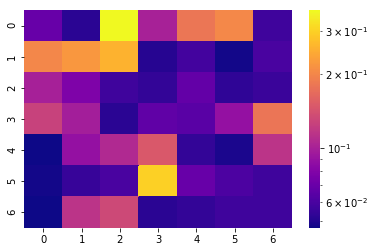

[[0.07  0.052 0.364 0.1   0.181 0.203 0.057]
 [0.2   0.221 0.258 0.051 0.058 0.048 0.06 ]
 [0.099 0.079 0.057 0.054 0.068 0.053 0.056]
 [0.126 0.098 0.052 0.067 0.065 0.089 0.18 ]
 [0.047 0.089 0.106 0.148 0.054 0.049 0.115]
 [0.048 0.055 0.06  0.3   0.07  0.061 0.057]
 [0.047 0.115 0.132 0.052 0.054 0.057 0.057]]


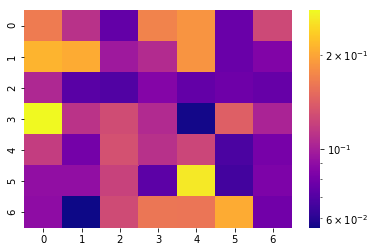

[[0.164 0.111 0.075 0.171 0.185 0.077 0.126]
 [0.212 0.205 0.097 0.107 0.185 0.077 0.085]
 [0.105 0.072 0.07  0.086 0.075 0.078 0.076]
 [0.277 0.112 0.128 0.106 0.057 0.142 0.102]
 [0.118 0.08  0.131 0.11  0.124 0.068 0.081]
 [0.091 0.091 0.121 0.073 0.261 0.066 0.083]
 [0.09  0.056 0.127 0.16  0.159 0.204 0.079]]


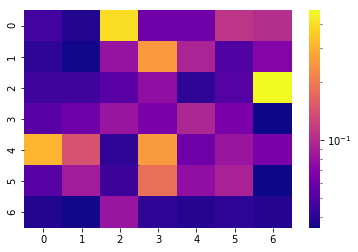

[[0.046 0.038 0.397 0.061 0.061 0.11  0.102]
 [0.041 0.036 0.08  0.251 0.094 0.05  0.07 ]
 [0.045 0.045 0.053 0.077 0.041 0.051 0.47 ]
 [0.052 0.061 0.082 0.065 0.096 0.066 0.035]
 [0.306 0.143 0.041 0.254 0.061 0.082 0.066]
 [0.052 0.087 0.044 0.184 0.077 0.092 0.035]
 [0.038 0.036 0.082 0.041 0.039 0.041 0.039]]
SKIPPPPPPEDDDD


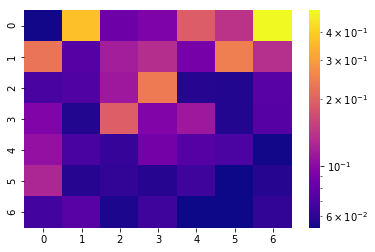

[[0.054 0.368 0.085 0.093 0.193 0.14  0.498]
 [0.227 0.074 0.118 0.134 0.089 0.244 0.135]
 [0.069 0.072 0.113 0.238 0.058 0.057 0.075]
 [0.094 0.057 0.194 0.094 0.113 0.057 0.074]
 [0.106 0.069 0.063 0.088 0.074 0.07  0.054]
 [0.125 0.058 0.062 0.058 0.065 0.053 0.058]
 [0.067 0.075 0.056 0.065 0.053 0.053 0.062]]


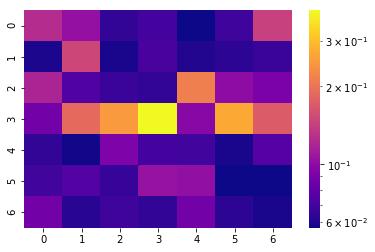

[[0.125 0.104 0.065 0.07  0.057 0.068 0.144]
 [0.06  0.15  0.059 0.071 0.061 0.063 0.067]
 [0.119 0.074 0.067 0.065 0.214 0.101 0.091]
 [0.087 0.189 0.249 0.393 0.098 0.268 0.172]
 [0.065 0.058 0.093 0.07  0.069 0.059 0.076]
 [0.069 0.075 0.066 0.105 0.103 0.057 0.057]
 [0.087 0.062 0.068 0.065 0.087 0.063 0.059]]


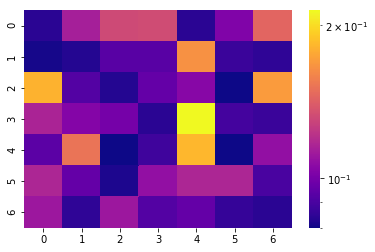

[[0.084 0.114 0.132 0.133 0.084 0.103 0.145]
 [0.081 0.083 0.093 0.093 0.166 0.087 0.085]
 [0.181 0.092 0.083 0.096 0.105 0.08  0.17 ]
 [0.116 0.104 0.1   0.084 0.214 0.089 0.087]
 [0.094 0.152 0.08  0.088 0.183 0.08  0.108]
 [0.117 0.096 0.082 0.108 0.117 0.117 0.09 ]
 [0.111 0.085 0.111 0.092 0.096 0.086 0.084]]


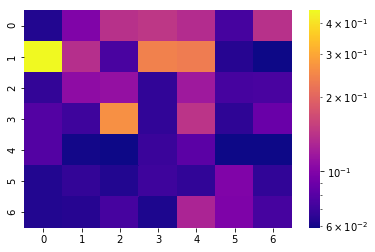

[[0.063 0.099 0.139 0.145 0.135 0.074 0.139]
 [0.449 0.137 0.075 0.241 0.233 0.064 0.059]
 [0.068 0.107 0.111 0.067 0.118 0.074 0.075]
 [0.079 0.071 0.263 0.067 0.143 0.066 0.088]
 [0.079 0.06  0.059 0.07  0.082 0.059 0.059]
 [0.063 0.068 0.063 0.071 0.067 0.099 0.067]
 [0.063 0.064 0.074 0.062 0.128 0.098 0.074]]


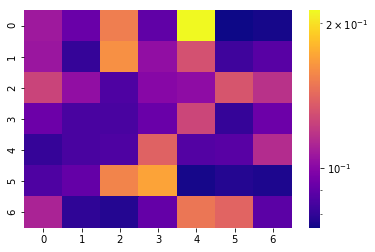

[[0.107 0.092 0.153 0.09  0.213 0.075 0.076]
 [0.106 0.081 0.162 0.103 0.131 0.083 0.088]
 [0.125 0.103 0.086 0.1   0.102 0.133 0.117]
 [0.093 0.085 0.085 0.092 0.126 0.081 0.093]
 [0.081 0.085 0.086 0.139 0.087 0.088 0.115]
 [0.086 0.091 0.156 0.171 0.076 0.078 0.077]
 [0.111 0.08  0.078 0.091 0.149 0.14  0.089]]


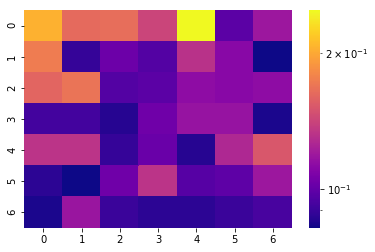

[[0.205 0.163 0.165 0.142 0.249 0.098 0.119]
 [0.174 0.089 0.103 0.096 0.132 0.112 0.082]
 [0.16  0.169 0.096 0.098 0.114 0.112 0.114]
 [0.092 0.092 0.086 0.104 0.117 0.117 0.084]
 [0.133 0.133 0.089 0.102 0.086 0.127 0.152]
 [0.087 0.082 0.104 0.133 0.097 0.099 0.119]
 [0.084 0.118 0.09  0.087 0.087 0.09  0.093]]


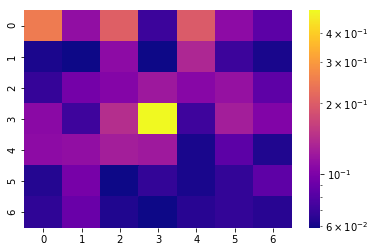

[[0.248 0.113 0.205 0.071 0.199 0.11  0.084]
 [0.062 0.059 0.11  0.059 0.135 0.071 0.061]
 [0.069 0.095 0.104 0.121 0.106 0.115 0.085]
 [0.108 0.072 0.142 0.498 0.072 0.126 0.103]
 [0.11  0.113 0.126 0.122 0.061 0.084 0.063]
 [0.064 0.097 0.059 0.068 0.061 0.068 0.085]
 [0.067 0.09  0.063 0.059 0.065 0.068 0.065]]


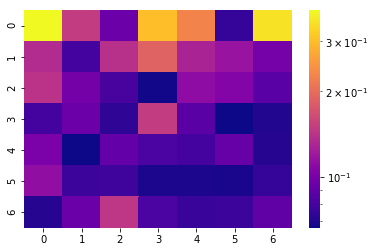

[[0.386 0.149 0.095 0.302 0.228 0.075 0.352]
 [0.135 0.08  0.14  0.189 0.128 0.117 0.099]
 [0.141 0.098 0.081 0.067 0.111 0.105 0.087]
 [0.08  0.095 0.073 0.15  0.087 0.066 0.07 ]
 [0.101 0.066 0.091 0.082 0.08  0.092 0.071]
 [0.113 0.077 0.078 0.069 0.069 0.068 0.075]
 [0.071 0.094 0.144 0.082 0.076 0.077 0.09 ]]


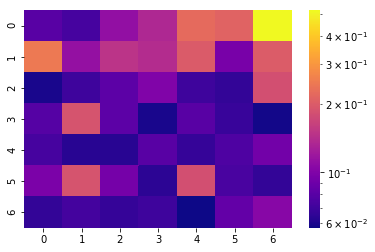

[[0.08  0.073 0.112 0.136 0.223 0.212 0.518]
 [0.248 0.113 0.149 0.14  0.2   0.096 0.201]
 [0.059 0.07  0.082 0.1   0.07  0.066 0.183]
 [0.079 0.189 0.082 0.059 0.08  0.068 0.058]
 [0.073 0.063 0.063 0.08  0.067 0.076 0.093]
 [0.098 0.189 0.094 0.064 0.184 0.074 0.066]
 [0.066 0.072 0.067 0.07  0.057 0.085 0.105]]


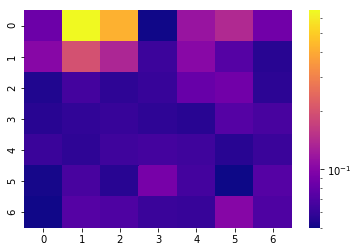

[[0.085 0.657 0.42  0.051 0.115 0.139 0.087]
 [0.102 0.197 0.135 0.063 0.103 0.073 0.056]
 [0.054 0.066 0.058 0.061 0.082 0.087 0.057]
 [0.056 0.059 0.061 0.058 0.056 0.073 0.067]
 [0.062 0.058 0.064 0.066 0.064 0.056 0.062]
 [0.052 0.067 0.056 0.091 0.066 0.05  0.073]
 [0.051 0.073 0.07  0.062 0.061 0.101 0.07 ]]
SKIPPPPPPEDDDD


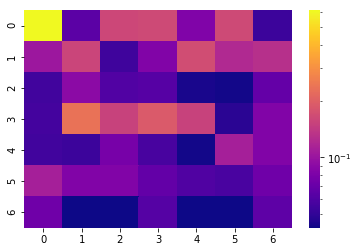

[[0.61  0.065 0.161 0.164 0.083 0.165 0.053]
 [0.103 0.157 0.054 0.084 0.169 0.121 0.129]
 [0.055 0.091 0.061 0.063 0.044 0.043 0.069]
 [0.056 0.236 0.152 0.19  0.152 0.048 0.084]
 [0.055 0.053 0.078 0.057 0.043 0.111 0.084]
 [0.11  0.084 0.084 0.068 0.06  0.058 0.074]
 [0.074 0.042 0.042 0.062 0.042 0.042 0.066]]


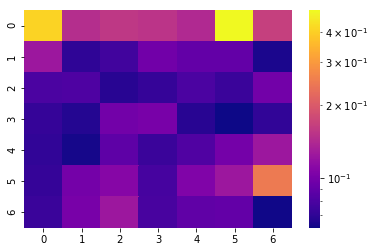

[[0.408 0.146 0.157 0.153 0.141 0.491 0.165]
 [0.124 0.07  0.076 0.097 0.09  0.09  0.065]
 [0.08  0.081 0.068 0.072 0.08  0.074 0.098]
 [0.072 0.067 0.098 0.101 0.068 0.062 0.071]
 [0.071 0.064 0.088 0.074 0.082 0.099 0.124]
 [0.072 0.099 0.109 0.078 0.105 0.124 0.248]
 [0.074 0.101 0.124 0.079 0.089 0.09  0.063]]


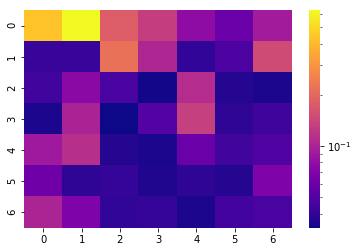

[[0.433 0.627 0.179 0.132 0.079 0.059 0.092]
 [0.042 0.042 0.219 0.104 0.04  0.048 0.15 ]
 [0.044 0.076 0.047 0.034 0.11  0.037 0.035]
 [0.035 0.1   0.033 0.05  0.134 0.039 0.043]
 [0.09  0.114 0.037 0.035 0.06  0.044 0.049]
 [0.062 0.039 0.041 0.036 0.039 0.037 0.069]
 [0.101 0.069 0.04  0.041 0.035 0.045 0.047]]


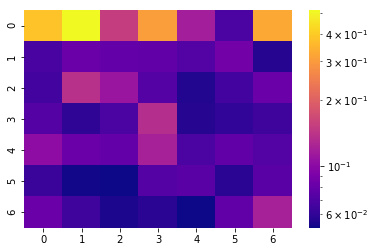

[[0.383 0.513 0.153 0.307 0.118 0.069 0.326]
 [0.068 0.082 0.079 0.078 0.072 0.086 0.057]
 [0.066 0.137 0.11  0.073 0.056 0.066 0.082]
 [0.073 0.059 0.069 0.134 0.057 0.06  0.065]
 [0.102 0.082 0.079 0.12  0.069 0.078 0.072]
 [0.063 0.053 0.052 0.073 0.075 0.058 0.075]
 [0.082 0.064 0.055 0.058 0.052 0.078 0.12 ]]


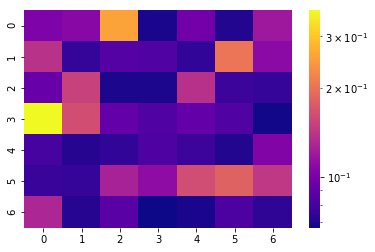

[[0.103 0.108 0.256 0.069 0.097 0.071 0.119]
 [0.139 0.076 0.086 0.085 0.075 0.204 0.109]
 [0.093 0.152 0.07  0.07  0.138 0.078 0.076]
 [0.368 0.164 0.092 0.085 0.091 0.085 0.068]
 [0.081 0.072 0.075 0.084 0.078 0.071 0.104]
 [0.077 0.076 0.126 0.111 0.163 0.184 0.144]
 [0.129 0.072 0.088 0.067 0.069 0.083 0.074]]


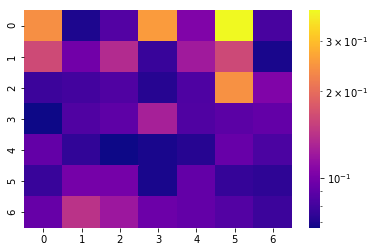

[[0.241 0.07  0.086 0.255 0.105 0.383 0.082]
 [0.163 0.098 0.136 0.077 0.122 0.162 0.069]
 [0.078 0.08  0.085 0.072 0.084 0.244 0.105]
 [0.067 0.085 0.09  0.127 0.085 0.089 0.092]
 [0.092 0.075 0.067 0.069 0.072 0.094 0.083]
 [0.077 0.1   0.1   0.069 0.092 0.076 0.074]
 [0.093 0.142 0.12  0.096 0.092 0.086 0.078]]


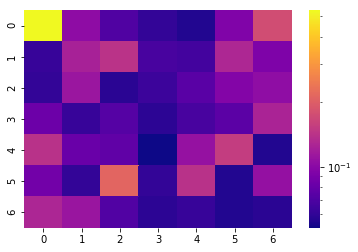

[[0.53  0.103 0.071 0.061 0.056 0.094 0.174]
 [0.062 0.123 0.142 0.068 0.066 0.128 0.093]
 [0.061 0.112 0.058 0.064 0.075 0.096 0.104]
 [0.084 0.062 0.073 0.059 0.068 0.076 0.125]
 [0.14  0.082 0.078 0.052 0.108 0.154 0.056]
 [0.087 0.061 0.212 0.061 0.14  0.056 0.107]
 [0.127 0.111 0.072 0.059 0.062 0.056 0.058]]


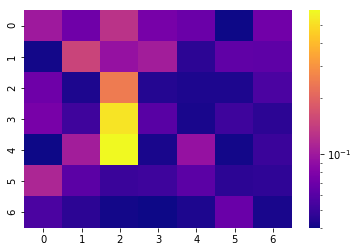

[[0.101 0.071 0.129 0.075 0.069 0.04  0.072]
 [0.041 0.15  0.094 0.104 0.046 0.064 0.063]
 [0.07  0.043 0.247 0.044 0.043 0.043 0.056]
 [0.076 0.052 0.521 0.061 0.042 0.051 0.046]
 [0.04  0.104 0.597 0.042 0.094 0.041 0.05 ]
 [0.113 0.062 0.05  0.051 0.062 0.046 0.047]
 [0.056 0.046 0.041 0.04  0.043 0.068 0.042]]
SKIPPPPPPEDDDD


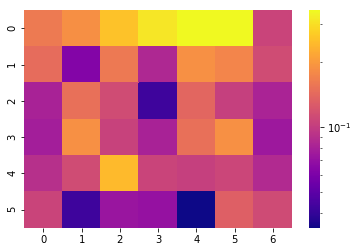

[[0.162 0.188 0.258 0.315 0.349 0.349 0.106]
 [0.147 0.063 0.16  0.085 0.189 0.175 0.114]
 [0.081 0.15  0.114 0.042 0.14  0.103 0.082]
 [0.078 0.189 0.105 0.081 0.15  0.189 0.075]
 [0.09  0.114 0.246 0.106 0.103 0.108 0.086]
 [0.106 0.042 0.073 0.071 0.034 0.132 0.112]]


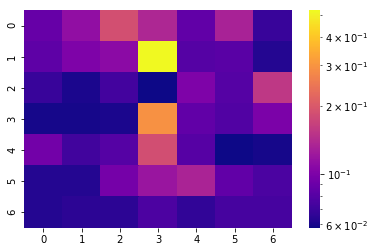

[[0.088 0.113 0.186 0.136 0.086 0.132 0.069]
 [0.084 0.101 0.109 0.524 0.08  0.082 0.063]
 [0.069 0.061 0.073 0.058 0.101 0.08  0.155]
 [0.06  0.06  0.061 0.297 0.086 0.079 0.099]
 [0.094 0.072 0.08  0.185 0.081 0.058 0.06 ]
 [0.063 0.063 0.096 0.119 0.133 0.086 0.076]
 [0.063 0.065 0.065 0.077 0.067 0.074 0.074]]
SKIPPPPPPEDDDD


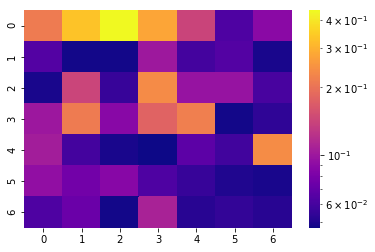

[[0.214 0.334 0.443 0.28  0.141 0.063 0.089]
 [0.065 0.048 0.048 0.1   0.06  0.065 0.049]
 [0.049 0.143 0.056 0.236 0.096 0.096 0.061]
 [0.099 0.213 0.088 0.179 0.219 0.048 0.054]
 [0.104 0.06  0.049 0.047 0.068 0.059 0.239]
 [0.093 0.077 0.087 0.063 0.056 0.05  0.049]
 [0.063 0.074 0.048 0.109 0.052 0.055 0.052]]


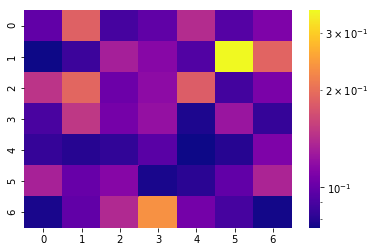

[[0.099 0.187 0.089 0.098 0.141 0.094 0.111]
 [0.075 0.086 0.131 0.115 0.093 0.353 0.19 ]
 [0.147 0.192 0.103 0.118 0.183 0.088 0.109]
 [0.09  0.15  0.107 0.121 0.078 0.124 0.084]
 [0.084 0.08  0.083 0.096 0.075 0.08  0.111]
 [0.133 0.101 0.114 0.077 0.081 0.099 0.135]
 [0.077 0.099 0.139 0.236 0.106 0.089 0.076]]


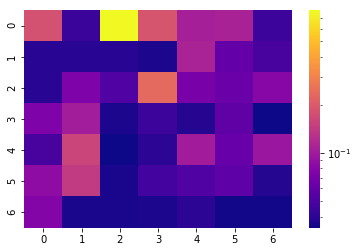

[[0.182 0.044 0.783 0.188 0.106 0.109 0.045]
 [0.039 0.039 0.039 0.037 0.111 0.06  0.049]
 [0.039 0.075 0.052 0.235 0.071 0.063 0.081]
 [0.075 0.103 0.037 0.045 0.038 0.059 0.034]
 [0.049 0.161 0.034 0.04  0.102 0.062 0.096]
 [0.086 0.144 0.036 0.047 0.052 0.058 0.038]
 [0.078 0.036 0.036 0.037 0.04  0.035 0.035]]


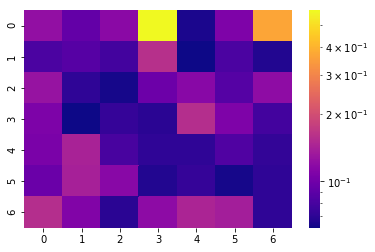

[[0.123 0.093 0.117 0.582 0.065 0.109 0.368]
 [0.082 0.087 0.078 0.159 0.062 0.082 0.067]
 [0.126 0.071 0.064 0.098 0.116 0.086 0.12 ]
 [0.108 0.062 0.073 0.069 0.156 0.109 0.078]
 [0.106 0.143 0.08  0.071 0.071 0.084 0.072]
 [0.097 0.141 0.116 0.067 0.073 0.064 0.071]
 [0.156 0.111 0.069 0.119 0.146 0.138 0.071]]


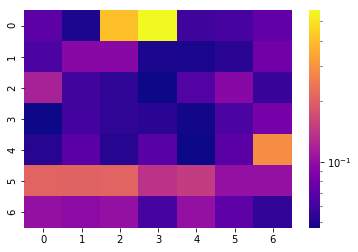

[[0.071 0.05  0.405 0.566 0.059 0.062 0.073]
 [0.064 0.094 0.094 0.05  0.049 0.053 0.081]
 [0.118 0.06  0.054 0.047 0.067 0.094 0.057]
 [0.047 0.061 0.054 0.053 0.048 0.064 0.084]
 [0.052 0.07  0.052 0.069 0.047 0.07  0.289]
 [0.209 0.207 0.208 0.137 0.148 0.102 0.102]
 [0.102 0.097 0.102 0.062 0.102 0.072 0.055]]


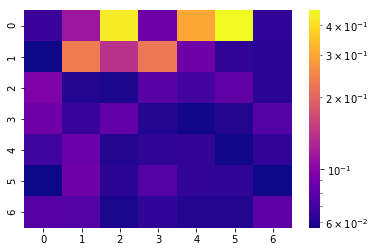

[[0.068 0.115 0.43  0.088 0.304 0.462 0.065]
 [0.057 0.233 0.14  0.227 0.089 0.064 0.063]
 [0.096 0.061 0.06  0.079 0.071 0.082 0.063]
 [0.089 0.067 0.084 0.061 0.058 0.061 0.077]
 [0.069 0.086 0.061 0.064 0.066 0.058 0.066]
 [0.057 0.088 0.063 0.077 0.066 0.064 0.057]
 [0.078 0.077 0.059 0.065 0.061 0.061 0.08 ]]


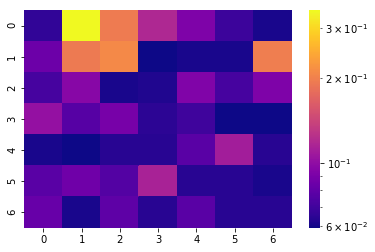

[[0.066 0.347 0.195 0.118 0.092 0.069 0.061]
 [0.085 0.194 0.21  0.059 0.061 0.061 0.198]
 [0.072 0.096 0.061 0.062 0.093 0.072 0.092]
 [0.102 0.077 0.089 0.065 0.07  0.059 0.059]
 [0.061 0.059 0.064 0.064 0.078 0.11  0.064]
 [0.078 0.086 0.076 0.114 0.064 0.064 0.061]
 [0.083 0.061 0.08  0.064 0.078 0.064 0.064]]


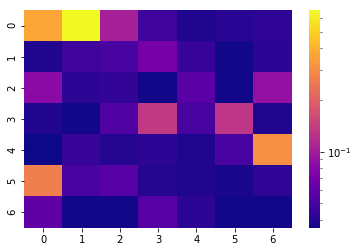

[[0.364 0.664 0.103 0.047 0.039 0.041 0.043]
 [0.039 0.047 0.051 0.071 0.045 0.037 0.042]
 [0.083 0.042 0.044 0.037 0.057 0.037 0.089]
 [0.039 0.037 0.054 0.136 0.05  0.129 0.039]
 [0.036 0.045 0.04  0.042 0.039 0.051 0.308]
 [0.266 0.05  0.056 0.04  0.039 0.038 0.043]
 [0.06  0.037 0.037 0.056 0.042 0.037 0.037]]


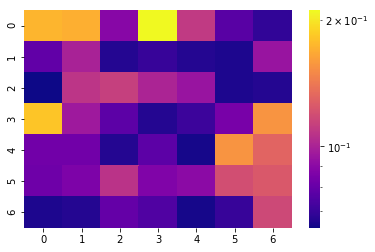

[[0.174 0.171 0.089 0.211 0.11  0.077 0.069]
 [0.079 0.1   0.067 0.07  0.067 0.066 0.094]
 [0.064 0.108 0.113 0.101 0.094 0.066 0.067]
 [0.182 0.096 0.078 0.067 0.071 0.085 0.156]
 [0.083 0.083 0.067 0.078 0.065 0.156 0.131]
 [0.082 0.086 0.107 0.087 0.09  0.12  0.125]
 [0.066 0.067 0.08  0.075 0.065 0.07  0.117]]


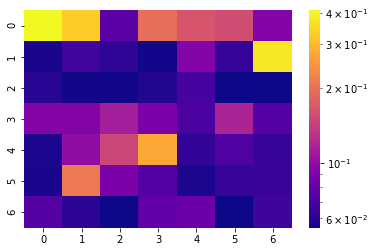

[[0.41  0.331 0.077 0.195 0.165 0.157 0.094]
 [0.057 0.067 0.062 0.056 0.094 0.064 0.377]
 [0.06  0.056 0.056 0.059 0.069 0.055 0.055]
 [0.094 0.094 0.113 0.09  0.071 0.118 0.074]
 [0.058 0.1   0.15  0.274 0.063 0.072 0.064]
 [0.057 0.209 0.089 0.074 0.058 0.064 0.065]
 [0.074 0.061 0.055 0.08  0.083 0.055 0.066]]
SKIPPPPPPEDDDD


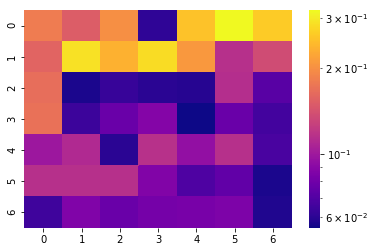

[[0.181 0.151 0.199 0.061 0.253 0.318 0.264]
 [0.158 0.287 0.235 0.283 0.208 0.115 0.136]
 [0.166 0.057 0.063 0.06  0.059 0.113 0.072]
 [0.17  0.064 0.078 0.088 0.055 0.078 0.066]
 [0.099 0.11  0.06  0.116 0.094 0.115 0.068]
 [0.115 0.115 0.115 0.087 0.069 0.075 0.057]
 [0.065 0.086 0.078 0.082 0.083 0.085 0.058]]


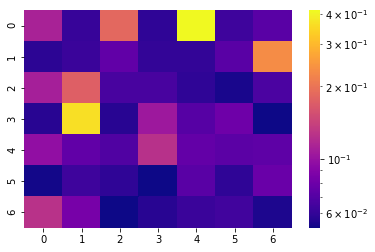

[[0.113 0.061 0.185 0.059 0.413 0.063 0.072]
 [0.058 0.062 0.075 0.06  0.06  0.072 0.233]
 [0.11  0.175 0.066 0.066 0.059 0.054 0.067]
 [0.057 0.364 0.057 0.105 0.071 0.08  0.052]
 [0.097 0.075 0.069 0.125 0.076 0.073 0.074]
 [0.053 0.063 0.059 0.052 0.072 0.059 0.078]
 [0.126 0.084 0.052 0.057 0.062 0.064 0.055]]


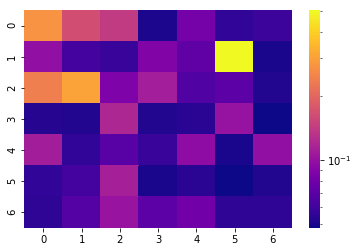

[[0.275 0.165 0.141 0.051 0.082 0.056 0.059]
 [0.099 0.062 0.058 0.088 0.072 0.503 0.05 ]
 [0.24  0.305 0.087 0.111 0.066 0.07  0.052]
 [0.053 0.052 0.12  0.052 0.054 0.101 0.048]
 [0.11  0.056 0.069 0.058 0.096 0.05  0.099]
 [0.056 0.062 0.112 0.05  0.054 0.048 0.052]
 [0.055 0.068 0.102 0.071 0.08  0.055 0.055]]
SKIPPPPPPEDDDD


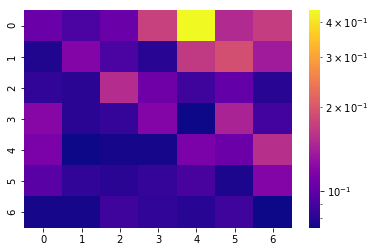

[[0.106 0.092 0.106 0.174 0.44  0.151 0.17 ]
 [0.078 0.118 0.092 0.08  0.167 0.19  0.137]
 [0.083 0.081 0.153 0.108 0.087 0.102 0.08 ]
 [0.12  0.081 0.084 0.119 0.074 0.145 0.089]
 [0.114 0.074 0.076 0.076 0.114 0.107 0.156]
 [0.098 0.083 0.081 0.084 0.091 0.077 0.119]
 [0.076 0.076 0.087 0.083 0.08  0.088 0.074]]


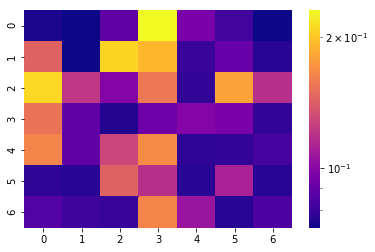

[[0.075 0.073 0.089 0.23  0.096 0.082 0.073]
 [0.144 0.073 0.209 0.192 0.08  0.091 0.077]
 [0.211 0.122 0.099 0.156 0.079 0.18  0.118]
 [0.153 0.089 0.076 0.093 0.099 0.096 0.079]
 [0.164 0.089 0.129 0.168 0.078 0.079 0.083]
 [0.078 0.077 0.144 0.118 0.077 0.112 0.077]
 [0.086 0.081 0.08  0.164 0.106 0.077 0.085]]


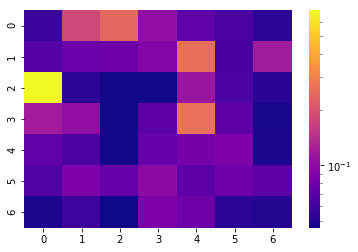

[[0.058 0.182 0.24  0.106 0.073 0.065 0.053]
 [0.068 0.079 0.081 0.094 0.258 0.063 0.117]
 [0.691 0.053 0.047 0.047 0.113 0.064 0.052]
 [0.118 0.104 0.047 0.071 0.262 0.071 0.048]
 [0.074 0.065 0.047 0.077 0.085 0.09  0.049]
 [0.067 0.09  0.075 0.101 0.072 0.082 0.072]
 [0.049 0.059 0.046 0.09  0.081 0.053 0.051]]


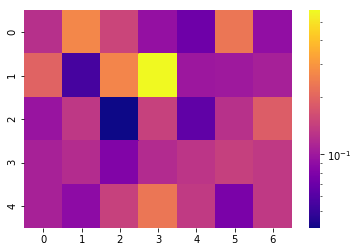

[[0.124 0.266 0.151 0.093 0.071 0.232 0.091]
 [0.197 0.055 0.264 0.573 0.099 0.101 0.107]
 [0.096 0.133 0.041 0.145 0.065 0.125 0.188]
 [0.108 0.12  0.081 0.119 0.131 0.144 0.135]
 [0.108 0.088 0.145 0.232 0.136 0.077 0.135]]


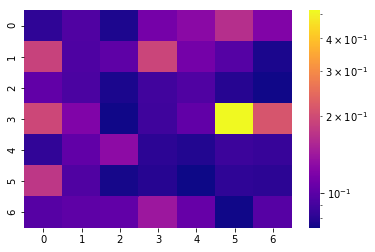

[[0.082 0.095 0.077 0.114 0.127 0.164 0.121]
 [0.188 0.094 0.102 0.192 0.113 0.097 0.076]
 [0.103 0.093 0.076 0.089 0.095 0.079 0.074]
 [0.194 0.12  0.074 0.088 0.103 0.515 0.214]
 [0.083 0.103 0.129 0.081 0.078 0.087 0.085]
 [0.174 0.095 0.075 0.079 0.073 0.082 0.081]
 [0.098 0.102 0.103 0.14  0.106 0.074 0.098]]


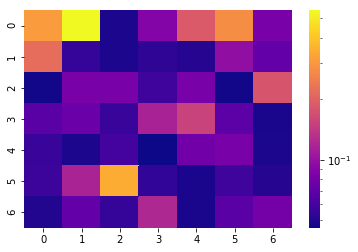

[[0.308 0.548 0.049 0.089 0.186 0.281 0.083]
 [0.218 0.055 0.049 0.053 0.051 0.097 0.072]
 [0.047 0.083 0.083 0.058 0.083 0.047 0.179]
 [0.068 0.075 0.056 0.116 0.154 0.069 0.048]
 [0.056 0.049 0.06  0.046 0.079 0.083 0.049]
 [0.057 0.117 0.347 0.054 0.048 0.058 0.051]
 [0.05  0.073 0.055 0.122 0.048 0.068 0.08 ]]
SKIPPPPPPEDDDD


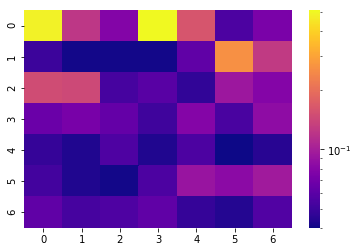

[[0.486 0.124 0.078 0.509 0.162 0.055 0.074]
 [0.05  0.041 0.041 0.041 0.062 0.261 0.127]
 [0.149 0.145 0.053 0.059 0.047 0.094 0.079]
 [0.067 0.073 0.064 0.051 0.079 0.054 0.085]
 [0.048 0.043 0.056 0.043 0.055 0.04  0.045]
 [0.052 0.043 0.041 0.055 0.091 0.083 0.096]
 [0.062 0.053 0.056 0.062 0.048 0.044 0.057]]


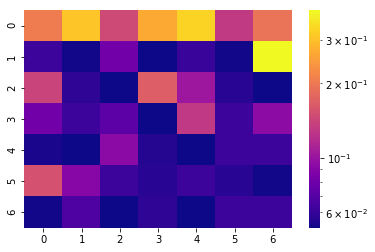

[[0.205 0.309 0.146 0.267 0.331 0.131 0.195]
 [0.062 0.053 0.081 0.052 0.061 0.053 0.395]
 [0.141 0.059 0.052 0.169 0.102 0.057 0.052]
 [0.081 0.062 0.072 0.052 0.13  0.062 0.094]
 [0.054 0.052 0.093 0.056 0.052 0.062 0.062]
 [0.155 0.091 0.062 0.057 0.062 0.057 0.053]
 [0.053 0.068 0.052 0.059 0.052 0.062 0.062]]


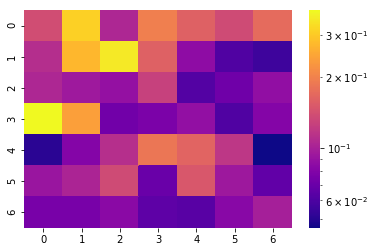

[[0.138 0.31  0.105 0.196 0.159 0.136 0.172]
 [0.11  0.273 0.351 0.159 0.086 0.061 0.056]
 [0.105 0.095 0.089 0.126 0.062 0.072 0.087]
 [0.381 0.238 0.073 0.077 0.088 0.061 0.081]
 [0.051 0.081 0.111 0.185 0.164 0.117 0.046]
 [0.092 0.103 0.136 0.07  0.149 0.094 0.067]
 [0.076 0.076 0.084 0.066 0.064 0.083 0.099]]
SKIPPPPPPEDDDD


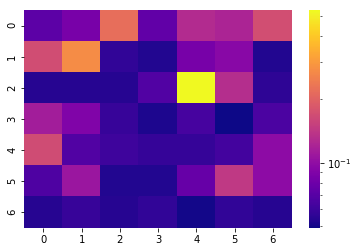

[[0.073 0.086 0.221 0.075 0.128 0.121 0.172]
 [0.17  0.276 0.057 0.053 0.085 0.095 0.053]
 [0.054 0.054 0.054 0.068 0.531 0.131 0.056]
 [0.114 0.09  0.059 0.052 0.064 0.049 0.066]
 [0.168 0.068 0.061 0.058 0.058 0.063 0.098]
 [0.067 0.108 0.053 0.053 0.077 0.143 0.098]
 [0.054 0.059 0.054 0.057 0.05  0.057 0.054]]


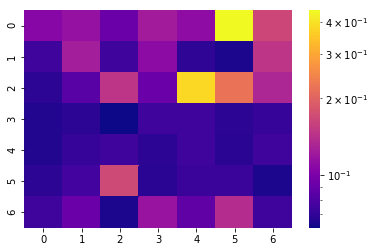

[[0.106 0.115 0.092 0.123 0.111 0.444 0.167]
 [0.075 0.125 0.074 0.11  0.07  0.065 0.147]
 [0.069 0.084 0.147 0.092 0.382 0.221 0.132]
 [0.066 0.069 0.062 0.075 0.075 0.069 0.072]
 [0.066 0.072 0.075 0.069 0.075 0.068 0.075]
 [0.069 0.076 0.169 0.068 0.073 0.073 0.065]
 [0.075 0.092 0.065 0.117 0.087 0.139 0.075]]


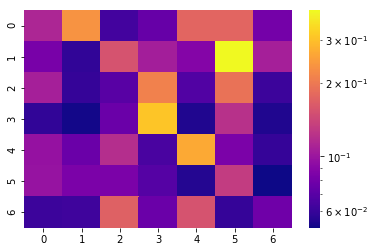

[[0.112 0.235 0.063 0.075 0.176 0.176 0.081]
 [0.083 0.058 0.155 0.106 0.088 0.396 0.107]
 [0.107 0.059 0.07  0.212 0.068 0.192 0.061]
 [0.058 0.052 0.077 0.308 0.054 0.122 0.054]
 [0.097 0.077 0.119 0.065 0.266 0.084 0.059]
 [0.098 0.084 0.084 0.069 0.055 0.132 0.051]
 [0.061 0.062 0.17  0.077 0.155 0.059 0.079]]
SKIPPPPPPEDDDD


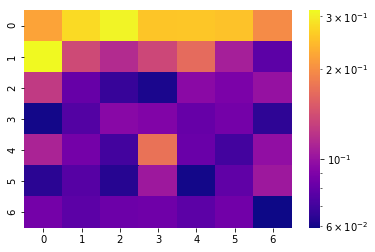

[[0.221 0.279 0.306 0.256 0.257 0.252 0.197]
 [0.314 0.138 0.116 0.137 0.167 0.108 0.078]
 [0.126 0.081 0.067 0.061 0.095 0.089 0.1  ]
 [0.06  0.075 0.094 0.091 0.081 0.086 0.065]
 [0.111 0.086 0.07  0.174 0.082 0.07  0.098]
 [0.064 0.076 0.063 0.104 0.06  0.079 0.104]
 [0.086 0.078 0.083 0.084 0.078 0.085 0.059]]


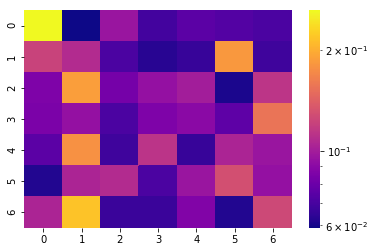

[[0.263 0.059 0.096 0.069 0.075 0.073 0.071]
 [0.122 0.108 0.071 0.063 0.066 0.184 0.068]
 [0.086 0.188 0.083 0.094 0.1   0.061 0.114]
 [0.085 0.094 0.071 0.086 0.09  0.076 0.156]
 [0.075 0.178 0.068 0.113 0.066 0.104 0.096]
 [0.062 0.104 0.108 0.071 0.096 0.13  0.094]
 [0.104 0.217 0.067 0.067 0.087 0.062 0.126]]
SKIPPPPPPEDDDD


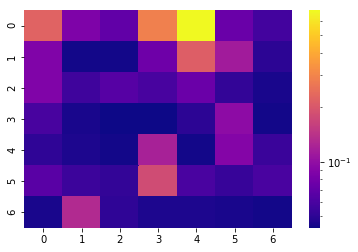

[[0.225 0.086 0.07  0.289 0.686 0.074 0.057]
 [0.087 0.044 0.044 0.077 0.215 0.113 0.05 ]
 [0.087 0.056 0.065 0.059 0.075 0.052 0.045]
 [0.059 0.045 0.043 0.043 0.05  0.096 0.044]
 [0.051 0.046 0.044 0.119 0.044 0.09  0.054]
 [0.067 0.055 0.052 0.18  0.06  0.053 0.06 ]
 [0.045 0.13  0.051 0.046 0.046 0.045 0.044]]


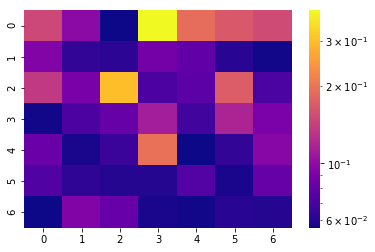

[[0.15  0.098 0.056 0.395 0.191 0.167 0.153]
 [0.093 0.064 0.062 0.087 0.079 0.061 0.057]
 [0.136 0.089 0.301 0.072 0.077 0.173 0.071]
 [0.057 0.072 0.081 0.113 0.068 0.118 0.09 ]
 [0.083 0.058 0.066 0.196 0.056 0.064 0.096]
 [0.073 0.063 0.06  0.06  0.074 0.058 0.081]
 [0.056 0.093 0.082 0.058 0.057 0.061 0.06 ]]


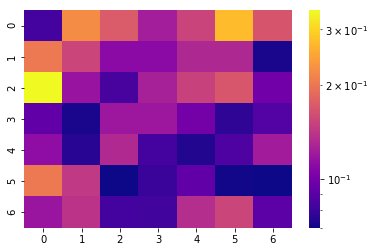

[[0.083 0.222 0.173 0.124 0.153 0.273 0.168]
 [0.203 0.154 0.111 0.111 0.131 0.131 0.072]
 [0.345 0.117 0.084 0.125 0.151 0.169 0.099]
 [0.093 0.072 0.119 0.119 0.1   0.077 0.088]
 [0.113 0.075 0.132 0.083 0.074 0.086 0.122]
 [0.203 0.144 0.07  0.08  0.093 0.071 0.07 ]
 [0.118 0.139 0.083 0.082 0.135 0.154 0.091]]


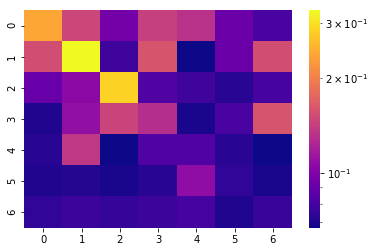

[[0.238 0.148 0.096 0.142 0.132 0.093 0.081]
 [0.154 0.328 0.078 0.16  0.067 0.092 0.154]
 [0.091 0.105 0.284 0.083 0.078 0.072 0.08 ]
 [0.07  0.109 0.146 0.129 0.069 0.081 0.159]
 [0.072 0.136 0.067 0.083 0.083 0.072 0.067]
 [0.07  0.071 0.069 0.072 0.108 0.074 0.069]
 [0.074 0.077 0.075 0.077 0.08  0.07  0.076]]


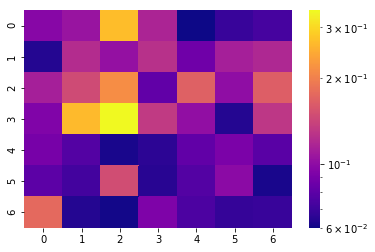

[[0.097 0.105 0.269 0.117 0.06  0.069 0.073]
 [0.064 0.122 0.103 0.126 0.087 0.113 0.119]
 [0.113 0.147 0.214 0.082 0.167 0.101 0.165]
 [0.094 0.265 0.344 0.133 0.102 0.064 0.13 ]
 [0.09  0.077 0.062 0.066 0.082 0.092 0.079]
 [0.08  0.072 0.149 0.065 0.077 0.099 0.062]
 [0.176 0.064 0.061 0.093 0.075 0.068 0.069]]


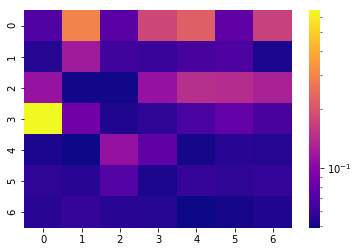

[[0.07  0.299 0.074 0.18  0.221 0.077 0.171]
 [0.054 0.12  0.062 0.06  0.066 0.069 0.052]
 [0.112 0.05  0.05  0.11  0.143 0.141 0.129]
 [0.65  0.086 0.053 0.057 0.067 0.078 0.066]
 [0.052 0.049 0.111 0.077 0.051 0.055 0.054]
 [0.057 0.055 0.071 0.052 0.059 0.057 0.059]
 [0.055 0.059 0.055 0.054 0.049 0.051 0.053]]


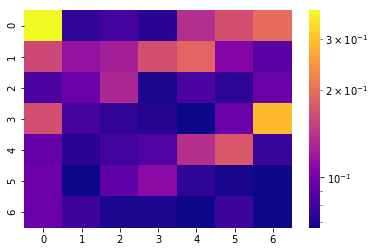

[[0.376 0.075 0.08  0.073 0.136 0.167 0.197]
 [0.16  0.115 0.125 0.167 0.189 0.106 0.088]
 [0.083 0.094 0.13  0.07  0.083 0.074 0.095]
 [0.167 0.082 0.075 0.072 0.067 0.094 0.288]
 [0.092 0.073 0.08  0.085 0.137 0.175 0.077]
 [0.096 0.067 0.09  0.11  0.074 0.069 0.067]
 [0.094 0.078 0.07  0.07  0.067 0.078 0.067]]


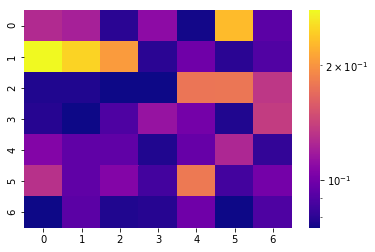

[[0.127 0.121 0.08  0.11  0.076 0.23  0.093]
 [0.279 0.248 0.206 0.08  0.099 0.08  0.09 ]
 [0.078 0.078 0.075 0.075 0.177 0.178 0.134]
 [0.079 0.075 0.089 0.114 0.101 0.078 0.138]
 [0.106 0.094 0.094 0.078 0.096 0.125 0.082]
 [0.131 0.094 0.106 0.086 0.18  0.086 0.101]
 [0.075 0.093 0.078 0.079 0.099 0.075 0.089]]


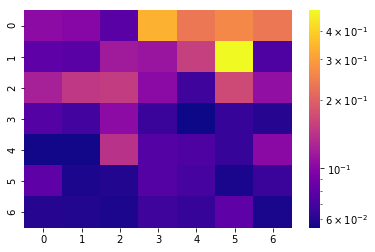

[[0.104 0.1   0.078 0.337 0.234 0.262 0.234]
 [0.08  0.078 0.117 0.112 0.155 0.491 0.073]
 [0.122 0.147 0.152 0.103 0.067 0.168 0.108]
 [0.076 0.069 0.104 0.066 0.055 0.065 0.06 ]
 [0.056 0.056 0.14  0.076 0.073 0.065 0.102]
 [0.08  0.058 0.059 0.076 0.07  0.057 0.066]
 [0.06  0.059 0.058 0.067 0.065 0.08  0.057]]


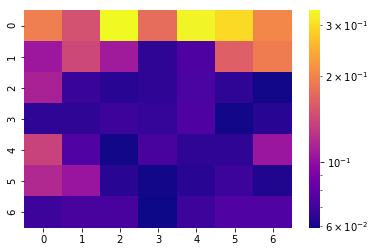

[[0.194 0.15  0.338 0.176 0.329 0.298 0.203]
 [0.106 0.143 0.108 0.065 0.074 0.164 0.193]
 [0.113 0.068 0.064 0.065 0.073 0.065 0.06 ]
 [0.065 0.065 0.069 0.067 0.074 0.06  0.064]
 [0.138 0.075 0.06  0.072 0.065 0.065 0.105]
 [0.118 0.104 0.064 0.06  0.064 0.069 0.062]
 [0.069 0.072 0.072 0.059 0.069 0.075 0.075]]


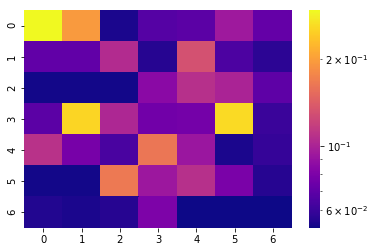

[[0.295 0.196 0.054 0.067 0.069 0.094 0.072]
 [0.071 0.071 0.105 0.056 0.131 0.065 0.057]
 [0.053 0.053 0.053 0.085 0.108 0.1   0.07 ]
 [0.069 0.255 0.102 0.076 0.077 0.261 0.06 ]
 [0.109 0.078 0.064 0.163 0.092 0.054 0.059]
 [0.053 0.053 0.165 0.093 0.108 0.079 0.056]
 [0.055 0.054 0.056 0.08  0.052 0.052 0.052]]


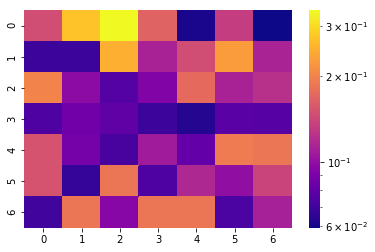

[[0.147 0.272 0.339 0.167 0.061 0.133 0.059]
 [0.069 0.069 0.248 0.113 0.147 0.227 0.114]
 [0.201 0.098 0.076 0.093 0.174 0.113 0.124]
 [0.074 0.086 0.08  0.069 0.063 0.078 0.077]
 [0.152 0.088 0.072 0.108 0.081 0.192 0.187]
 [0.152 0.067 0.187 0.074 0.117 0.1   0.139]
 [0.07  0.187 0.095 0.187 0.187 0.073 0.112]]


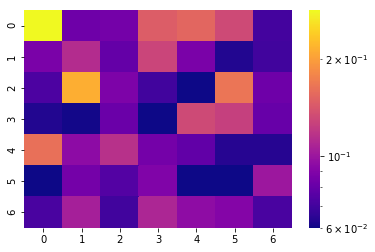

[[0.283 0.083 0.085 0.147 0.154 0.132 0.071]
 [0.087 0.113 0.08  0.129 0.087 0.063 0.07 ]
 [0.073 0.214 0.088 0.07  0.06  0.166 0.083]
 [0.063 0.061 0.082 0.06  0.132 0.125 0.081]
 [0.162 0.094 0.116 0.085 0.079 0.064 0.064]
 [0.06  0.085 0.075 0.089 0.06  0.06  0.101]
 [0.072 0.105 0.07  0.109 0.095 0.091 0.072]]


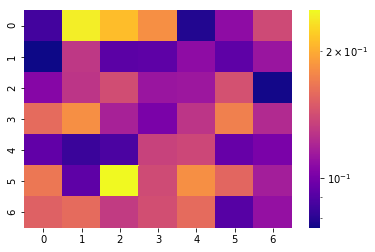

[[0.086 0.242 0.21  0.181 0.079 0.108 0.139]
 [0.076 0.129 0.092 0.093 0.108 0.093 0.112]
 [0.105 0.128 0.141 0.112 0.113 0.143 0.077]
 [0.159 0.181 0.118 0.101 0.128 0.172 0.122]
 [0.094 0.084 0.088 0.135 0.138 0.095 0.101]
 [0.167 0.093 0.249 0.14  0.181 0.156 0.116]
 [0.153 0.159 0.131 0.142 0.159 0.091 0.11 ]]


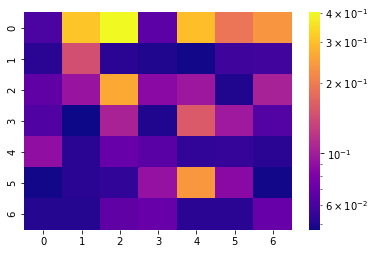

[[0.061 0.309 0.401 0.067 0.298 0.191 0.235]
 [0.052 0.146 0.052 0.05  0.048 0.057 0.058]
 [0.068 0.094 0.264 0.086 0.096 0.05  0.104]
 [0.063 0.047 0.105 0.05  0.157 0.098 0.064]
 [0.09  0.052 0.071 0.066 0.054 0.055 0.052]
 [0.048 0.052 0.054 0.092 0.238 0.086 0.048]
 [0.051 0.051 0.068 0.071 0.052 0.052 0.071]]
SKIPPPPPPEDDDD


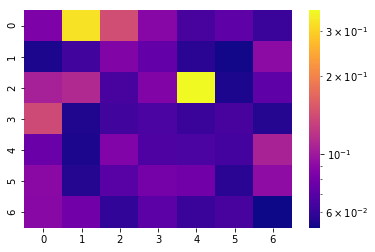

[[0.084 0.325 0.142 0.088 0.065 0.072 0.061]
 [0.054 0.063 0.086 0.074 0.057 0.053 0.091]
 [0.105 0.112 0.065 0.086 0.359 0.054 0.072]
 [0.139 0.055 0.063 0.066 0.061 0.065 0.056]
 [0.076 0.054 0.085 0.067 0.066 0.064 0.107]
 [0.09  0.056 0.07  0.081 0.079 0.057 0.092]
 [0.089 0.079 0.059 0.071 0.061 0.065 0.052]]


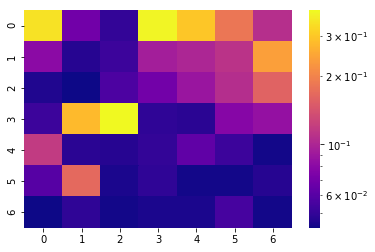

[[0.345 0.069 0.05  0.378 0.299 0.182 0.107]
 [0.081 0.047 0.052 0.094 0.1   0.111 0.239]
 [0.046 0.043 0.057 0.07  0.088 0.106 0.159]
 [0.052 0.277 0.387 0.049 0.048 0.078 0.085]
 [0.118 0.048 0.047 0.05  0.063 0.052 0.044]
 [0.06  0.166 0.045 0.049 0.044 0.044 0.047]
 [0.043 0.049 0.044 0.045 0.045 0.055 0.044]]


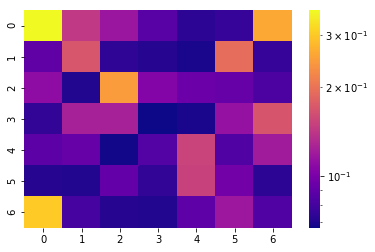

[[0.362 0.143 0.117 0.087 0.073 0.076 0.26 ]
 [0.09  0.17  0.074 0.072 0.069 0.193 0.076]
 [0.11  0.071 0.247 0.105 0.095 0.092 0.083]
 [0.075 0.124 0.124 0.067 0.069 0.114 0.169]
 [0.088 0.092 0.068 0.085 0.153 0.084 0.12 ]
 [0.072 0.071 0.091 0.075 0.151 0.097 0.073]
 [0.301 0.081 0.072 0.071 0.089 0.118 0.084]]


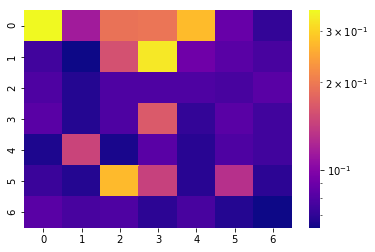

[[0.354 0.115 0.192 0.195 0.274 0.088 0.071]
 [0.075 0.063 0.158 0.329 0.091 0.083 0.077]
 [0.079 0.067 0.079 0.079 0.079 0.077 0.083]
 [0.083 0.067 0.079 0.167 0.071 0.083 0.075]
 [0.066 0.147 0.065 0.083 0.068 0.079 0.075]
 [0.073 0.067 0.273 0.144 0.068 0.13  0.069]
 [0.083 0.077 0.079 0.069 0.077 0.067 0.063]]


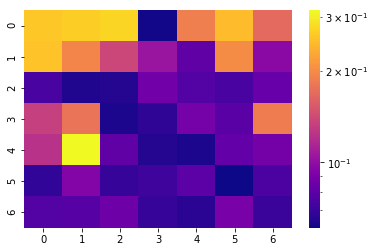

[[0.262 0.266 0.275 0.062 0.188 0.248 0.168]
 [0.257 0.194 0.138 0.104 0.081 0.201 0.097]
 [0.074 0.064 0.065 0.087 0.077 0.074 0.084]
 [0.133 0.178 0.063 0.067 0.089 0.079 0.186]
 [0.123 0.316 0.081 0.065 0.063 0.082 0.088]
 [0.068 0.095 0.069 0.071 0.08  0.061 0.075]
 [0.077 0.078 0.086 0.069 0.066 0.09  0.07 ]]


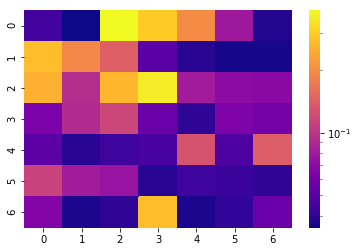

[[0.045 0.035 0.385 0.296 0.198 0.079 0.038]
 [0.273 0.193 0.142 0.051 0.039 0.036 0.036]
 [0.254 0.094 0.263 0.354 0.081 0.07  0.069]
 [0.062 0.091 0.115 0.056 0.04  0.064 0.06 ]
 [0.052 0.039 0.044 0.046 0.128 0.048 0.141]
 [0.112 0.081 0.076 0.039 0.044 0.043 0.04 ]
 [0.066 0.037 0.04  0.273 0.037 0.041 0.056]]


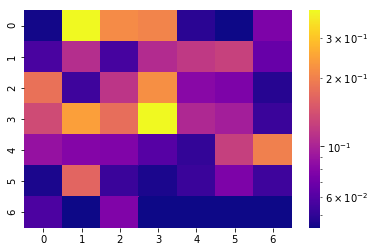

[[0.045 0.395 0.214 0.205 0.049 0.044 0.076]
 [0.057 0.109 0.056 0.107 0.118 0.126 0.067]
 [0.18  0.054 0.115 0.219 0.081 0.076 0.048]
 [0.136 0.243 0.175 0.395 0.104 0.096 0.053]
 [0.088 0.079 0.077 0.061 0.051 0.125 0.199]
 [0.046 0.165 0.053 0.046 0.053 0.076 0.054]
 [0.058 0.044 0.077 0.044 0.044 0.044 0.044]]


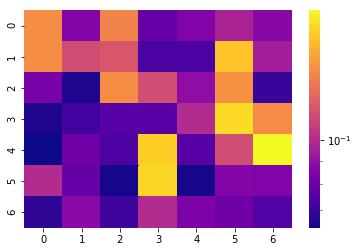

[[0.143 0.086 0.139 0.079 0.085 0.097 0.087]
 [0.143 0.114 0.118 0.073 0.073 0.168 0.095]
 [0.083 0.066 0.143 0.114 0.089 0.145 0.07 ]
 [0.066 0.072 0.076 0.076 0.1   0.178 0.142]
 [0.064 0.081 0.074 0.173 0.076 0.114 0.193]
 [0.1   0.079 0.065 0.176 0.065 0.086 0.085]
 [0.068 0.088 0.071 0.1   0.084 0.081 0.075]]
SKIPPPPPPEDDDD


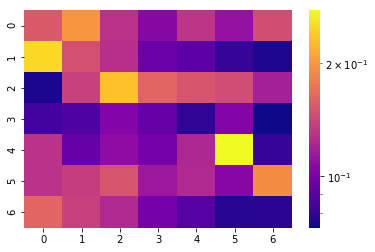

[[0.155 0.199 0.129 0.106 0.131 0.111 0.147]
 [0.251 0.148 0.128 0.095 0.091 0.081 0.076]
 [0.075 0.138 0.233 0.162 0.152 0.146 0.119]
 [0.084 0.087 0.104 0.094 0.079 0.103 0.073]
 [0.13  0.094 0.108 0.099 0.123 0.277 0.081]
 [0.13  0.137 0.151 0.114 0.124 0.105 0.192]
 [0.163 0.138 0.124 0.099 0.089 0.077 0.078]]


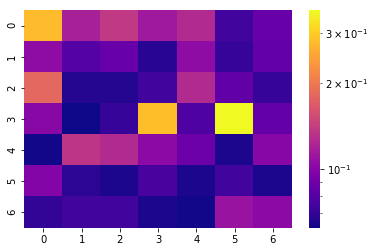

[[0.277 0.118 0.137 0.113 0.125 0.074 0.087]
 [0.104 0.08  0.087 0.067 0.104 0.071 0.086]
 [0.182 0.066 0.066 0.074 0.125 0.085 0.071]
 [0.101 0.062 0.071 0.282 0.078 0.359 0.086]
 [0.063 0.134 0.125 0.103 0.089 0.065 0.1  ]
 [0.099 0.068 0.065 0.076 0.065 0.074 0.065]
 [0.07  0.074 0.074 0.065 0.063 0.109 0.103]]


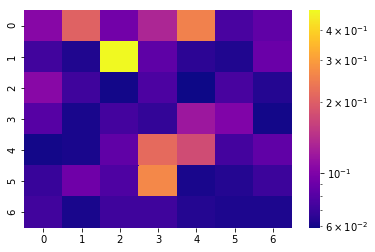

[[0.105 0.205 0.094 0.132 0.254 0.076 0.085]
 [0.073 0.063 0.483 0.084 0.066 0.063 0.09 ]
 [0.106 0.072 0.06  0.077 0.059 0.075 0.064]
 [0.081 0.061 0.074 0.068 0.119 0.101 0.06 ]
 [0.06  0.061 0.085 0.216 0.175 0.074 0.085]
 [0.07  0.092 0.078 0.265 0.061 0.064 0.071]
 [0.073 0.061 0.072 0.072 0.064 0.062 0.062]]


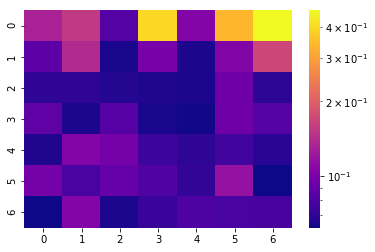

[[0.131 0.155 0.083 0.398 0.106 0.339 0.465]
 [0.086 0.139 0.064 0.1   0.065 0.105 0.171]
 [0.07  0.07  0.067 0.066 0.065 0.095 0.069]
 [0.088 0.065 0.084 0.064 0.063 0.095 0.083]
 [0.066 0.106 0.098 0.074 0.07  0.076 0.068]
 [0.098 0.079 0.091 0.082 0.071 0.117 0.062]
 [0.062 0.106 0.065 0.073 0.081 0.079 0.078]]


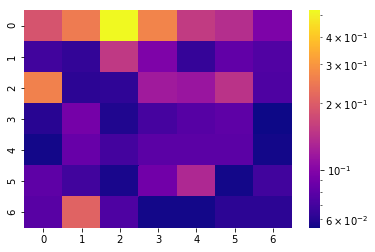

[[0.188 0.252 0.526 0.267 0.155 0.139 0.096]
 [0.069 0.064 0.153 0.097 0.065 0.082 0.075]
 [0.264 0.062 0.063 0.12  0.115 0.146 0.074]
 [0.061 0.092 0.059 0.071 0.077 0.081 0.055]
 [0.056 0.085 0.07  0.079 0.079 0.079 0.056]
 [0.081 0.069 0.057 0.09  0.134 0.056 0.069]
 [0.078 0.211 0.074 0.056 0.056 0.062 0.062]]


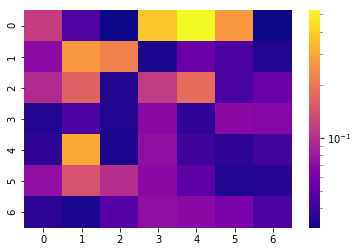

[[0.117 0.046 0.031 0.372 0.527 0.264 0.031]
 [0.071 0.263 0.221 0.033 0.054 0.044 0.034]
 [0.096 0.168 0.034 0.115 0.183 0.044 0.055]
 [0.034 0.044 0.034 0.069 0.037 0.069 0.068]
 [0.037 0.306 0.033 0.074 0.04  0.037 0.041]
 [0.074 0.144 0.1   0.069 0.05  0.034 0.035]
 [0.036 0.033 0.048 0.073 0.069 0.062 0.044]]


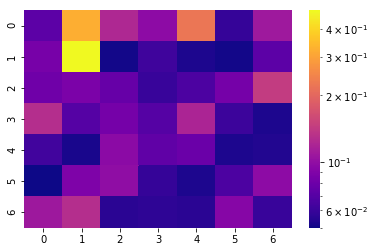

[[0.073 0.323 0.122 0.097 0.223 0.059 0.109]
 [0.085 0.487 0.051 0.062 0.053 0.051 0.073]
 [0.081 0.087 0.077 0.06  0.067 0.084 0.143]
 [0.128 0.07  0.084 0.07  0.119 0.061 0.053]
 [0.063 0.052 0.096 0.074 0.079 0.053 0.054]
 [0.05  0.089 0.099 0.059 0.053 0.067 0.097]
 [0.108 0.128 0.056 0.057 0.056 0.093 0.06 ]]


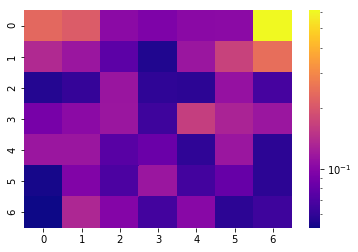

[[0.233 0.212 0.104 0.095 0.103 0.104 0.613]
 [0.137 0.116 0.077 0.055 0.116 0.17  0.246]
 [0.056 0.061 0.115 0.059 0.058 0.112 0.067]
 [0.091 0.104 0.116 0.064 0.165 0.13  0.116]
 [0.116 0.116 0.075 0.084 0.059 0.116 0.058]
 [0.053 0.097 0.07  0.116 0.066 0.082 0.058]
 [0.051 0.134 0.099 0.066 0.102 0.058 0.064]]


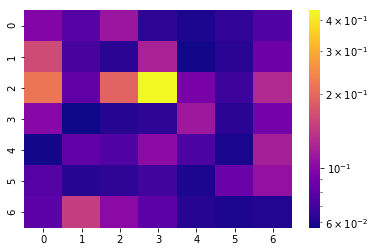

[[0.098 0.077 0.112 0.064 0.06  0.065 0.075]
 [0.162 0.072 0.063 0.122 0.058 0.063 0.087]
 [0.217 0.081 0.194 0.437 0.092 0.068 0.128]
 [0.1   0.057 0.062 0.064 0.113 0.063 0.091]
 [0.058 0.082 0.075 0.103 0.073 0.059 0.119]
 [0.077 0.062 0.064 0.07  0.06  0.085 0.107]
 [0.08  0.147 0.102 0.08  0.062 0.06  0.061]]


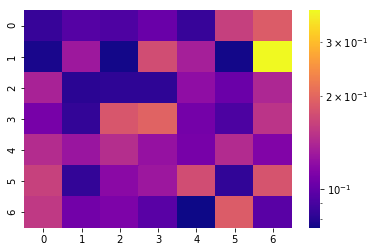

[[0.085 0.095 0.093 0.103 0.085 0.162 0.189]
 [0.077 0.13  0.076 0.175 0.135 0.076 0.379]
 [0.137 0.081 0.082 0.082 0.122 0.104 0.141]
 [0.109 0.084 0.184 0.197 0.108 0.092 0.152]
 [0.145 0.127 0.146 0.125 0.109 0.144 0.114]
 [0.163 0.084 0.119 0.129 0.175 0.083 0.181]
 [0.156 0.107 0.112 0.097 0.075 0.189 0.097]]


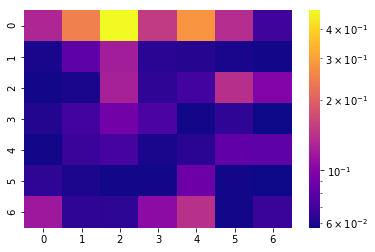

[[0.13  0.247 0.481 0.152 0.282 0.136 0.07 ]
 [0.059 0.082 0.121 0.063 0.062 0.059 0.058]
 [0.058 0.059 0.124 0.065 0.071 0.14  0.098]
 [0.061 0.071 0.091 0.074 0.058 0.065 0.057]
 [0.058 0.068 0.072 0.059 0.063 0.083 0.082]
 [0.065 0.06  0.058 0.058 0.089 0.058 0.057]
 [0.117 0.065 0.064 0.106 0.141 0.058 0.068]]


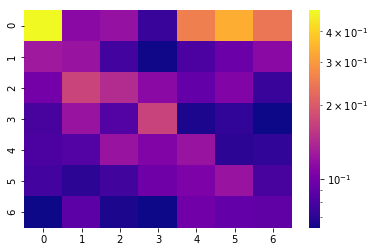

[[0.487 0.112 0.12  0.074 0.257 0.336 0.243]
 [0.127 0.122 0.078 0.064 0.082 0.096 0.112]
 [0.1   0.172 0.144 0.112 0.092 0.107 0.074]
 [0.08  0.122 0.084 0.171 0.066 0.072 0.063]
 [0.082 0.084 0.122 0.107 0.122 0.07  0.072]
 [0.078 0.07  0.077 0.097 0.105 0.122 0.08 ]
 [0.063 0.088 0.066 0.063 0.098 0.091 0.09 ]]


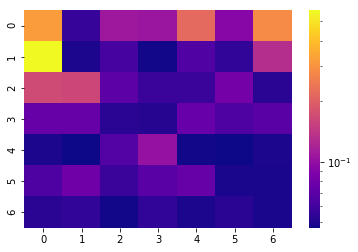

[[0.32  0.057 0.109 0.107 0.217 0.093 0.283]
 [0.566 0.05  0.062 0.048 0.066 0.055 0.131]
 [0.169 0.164 0.071 0.058 0.058 0.082 0.053]
 [0.075 0.075 0.053 0.052 0.076 0.065 0.07 ]
 [0.05  0.047 0.067 0.103 0.048 0.047 0.05 ]
 [0.065 0.08  0.058 0.07  0.075 0.049 0.049]
 [0.053 0.055 0.048 0.055 0.05  0.053 0.049]]


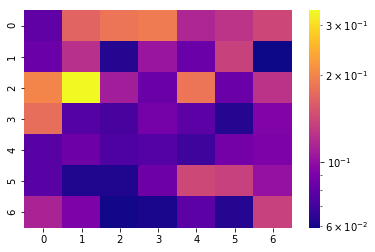

[[0.08  0.167 0.184 0.191 0.115 0.126 0.141]
 [0.084 0.123 0.063 0.104 0.084 0.137 0.059]
 [0.201 0.336 0.109 0.084 0.184 0.084 0.125]
 [0.177 0.076 0.072 0.088 0.079 0.063 0.092]
 [0.077 0.085 0.074 0.076 0.069 0.087 0.091]
 [0.077 0.062 0.062 0.085 0.142 0.136 0.102]
 [0.114 0.091 0.06  0.061 0.079 0.063 0.136]]


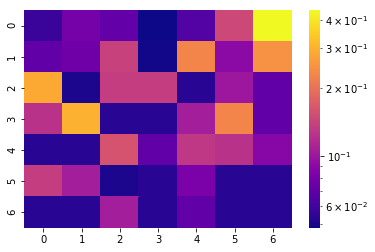

[[0.058 0.08  0.072 0.048 0.066 0.147 0.441]
 [0.071 0.077 0.14  0.049 0.23  0.091 0.248]
 [0.286 0.051 0.135 0.135 0.053 0.101 0.071]
 [0.124 0.301 0.053 0.053 0.106 0.23  0.071]
 [0.053 0.053 0.159 0.071 0.129 0.124 0.088]
 [0.135 0.106 0.051 0.053 0.082 0.053 0.053]
 [0.053 0.053 0.106 0.053 0.071 0.053 0.053]]


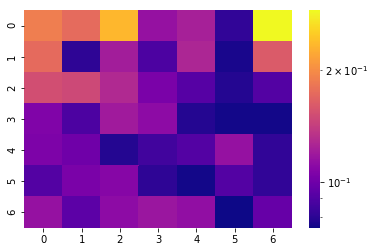

[[0.189 0.174 0.234 0.115 0.123 0.082 0.29 ]
 [0.173 0.081 0.121 0.089 0.126 0.077 0.162]
 [0.153 0.149 0.128 0.104 0.092 0.079 0.091]
 [0.106 0.089 0.12  0.111 0.079 0.076 0.076]
 [0.105 0.1   0.079 0.086 0.091 0.115 0.082]
 [0.091 0.104 0.108 0.081 0.076 0.091 0.082]
 [0.115 0.094 0.111 0.117 0.113 0.075 0.097]]
SKIPPPPPPEDDDD


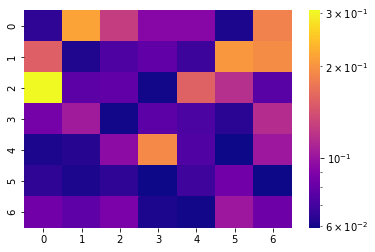

[[0.065 0.216 0.127 0.092 0.093 0.061 0.184]
 [0.154 0.062 0.073 0.079 0.068 0.204 0.194]
 [0.305 0.077 0.079 0.06  0.155 0.117 0.076]
 [0.086 0.104 0.06  0.077 0.072 0.064 0.115]
 [0.061 0.063 0.095 0.192 0.074 0.059 0.102]
 [0.065 0.061 0.065 0.059 0.069 0.084 0.059]
 [0.084 0.078 0.088 0.061 0.06  0.102 0.083]]


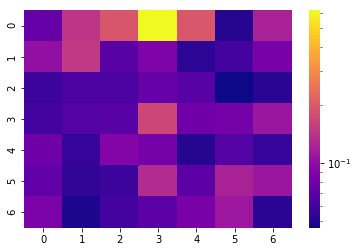

[[0.075 0.145 0.193 0.621 0.196 0.051 0.121]
 [0.102 0.149 0.069 0.089 0.053 0.061 0.085]
 [0.058 0.064 0.064 0.075 0.069 0.046 0.052]
 [0.061 0.067 0.069 0.17  0.08  0.083 0.109]
 [0.08  0.056 0.092 0.083 0.051 0.067 0.056]
 [0.073 0.055 0.058 0.132 0.071 0.121 0.109]
 [0.087 0.049 0.061 0.071 0.085 0.11  0.052]]


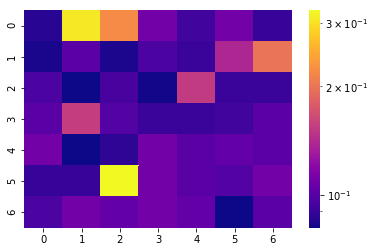

[[0.086 0.309 0.22  0.11  0.093 0.11  0.09 ]
 [0.083 0.101 0.084 0.096 0.091 0.139 0.2  ]
 [0.096 0.081 0.095 0.082 0.153 0.091 0.091]
 [0.101 0.156 0.099 0.091 0.091 0.093 0.101]
 [0.11  0.081 0.088 0.11  0.101 0.105 0.101]
 [0.09  0.09  0.325 0.11  0.101 0.099 0.11 ]
 [0.096 0.11  0.105 0.11  0.105 0.081 0.101]]


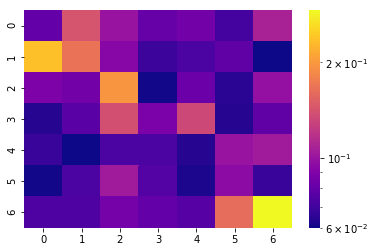

[[0.08  0.142 0.1   0.081 0.085 0.071 0.108]
 [0.236 0.167 0.093 0.069 0.073 0.079 0.06 ]
 [0.089 0.085 0.197 0.061 0.083 0.065 0.098]
 [0.064 0.077 0.139 0.088 0.134 0.064 0.079]
 [0.068 0.06  0.073 0.073 0.064 0.1   0.104]
 [0.061 0.073 0.104 0.075 0.062 0.095 0.068]
 [0.074 0.074 0.086 0.08  0.076 0.162 0.292]]


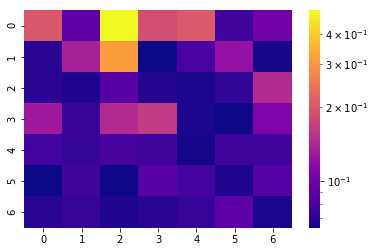

[[0.201 0.091 0.499 0.189 0.204 0.077 0.101]
 [0.071 0.135 0.311 0.064 0.082 0.121 0.066]
 [0.071 0.068 0.088 0.069 0.067 0.073 0.147]
 [0.129 0.075 0.146 0.164 0.067 0.065 0.107]
 [0.079 0.074 0.081 0.077 0.066 0.077 0.078]
 [0.064 0.077 0.065 0.088 0.08  0.068 0.086]
 [0.07  0.075 0.068 0.07  0.075 0.091 0.067]]


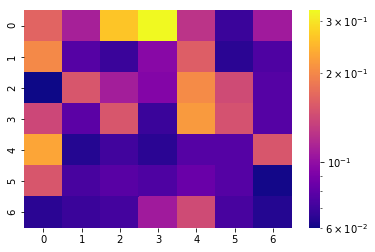

[[0.166 0.111 0.264 0.326 0.125 0.069 0.108]
 [0.202 0.077 0.069 0.096 0.16  0.065 0.075]
 [0.06  0.153 0.11  0.094 0.203 0.143 0.077]
 [0.14  0.079 0.153 0.069 0.219 0.149 0.077]
 [0.23  0.064 0.071 0.065 0.077 0.077 0.153]
 [0.153 0.073 0.078 0.075 0.084 0.077 0.061]
 [0.065 0.069 0.072 0.108 0.143 0.073 0.064]]
SKIPPPPPPEDDDD


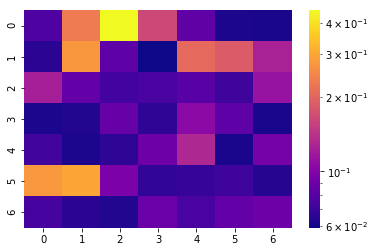

[[0.077 0.231 0.449 0.165 0.084 0.062 0.061]
 [0.065 0.274 0.083 0.059 0.207 0.188 0.126]
 [0.123 0.086 0.073 0.075 0.081 0.071 0.113]
 [0.062 0.063 0.087 0.066 0.106 0.083 0.061]
 [0.072 0.062 0.066 0.09  0.131 0.061 0.094]
 [0.275 0.295 0.096 0.067 0.069 0.071 0.064]
 [0.074 0.065 0.063 0.088 0.075 0.085 0.09 ]]


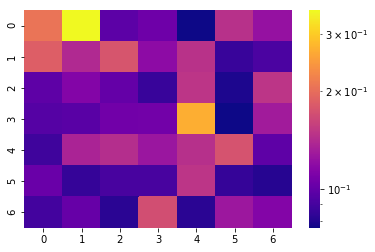

[[0.207 0.354 0.098 0.105 0.076 0.146 0.123]
 [0.185 0.14  0.177 0.119 0.147 0.086 0.092]
 [0.099 0.114 0.101 0.086 0.149 0.079 0.149]
 [0.095 0.097 0.106 0.107 0.267 0.076 0.13 ]
 [0.088 0.136 0.143 0.126 0.145 0.175 0.099]
 [0.103 0.085 0.091 0.091 0.149 0.085 0.081]
 [0.089 0.102 0.082 0.171 0.082 0.127 0.114]]


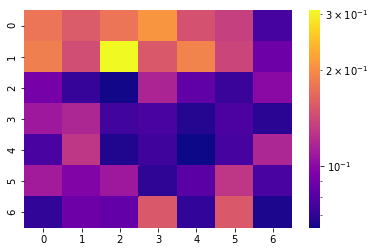

[[0.179 0.156 0.179 0.208 0.149 0.135 0.076]
 [0.187 0.145 0.307 0.154 0.191 0.139 0.089]
 [0.092 0.072 0.065 0.116 0.084 0.073 0.1  ]
 [0.109 0.118 0.075 0.077 0.068 0.078 0.069]
 [0.077 0.128 0.067 0.074 0.064 0.076 0.117]
 [0.111 0.096 0.109 0.07  0.082 0.128 0.077]
 [0.071 0.089 0.085 0.154 0.071 0.154 0.066]]


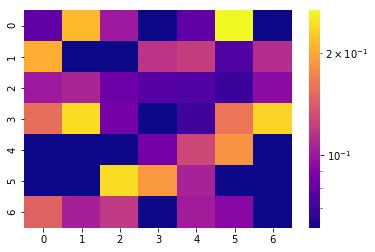

[[0.079 0.213 0.101 0.061 0.079 0.267 0.061]
 [0.204 0.061 0.061 0.116 0.122 0.075 0.112]
 [0.101 0.107 0.083 0.076 0.075 0.069 0.094]
 [0.155 0.243 0.086 0.061 0.07  0.16  0.234]
 [0.061 0.061 0.061 0.085 0.129 0.183 0.061]
 [0.061 0.061 0.243 0.187 0.105 0.061 0.061]
 [0.146 0.104 0.119 0.061 0.102 0.092 0.061]]


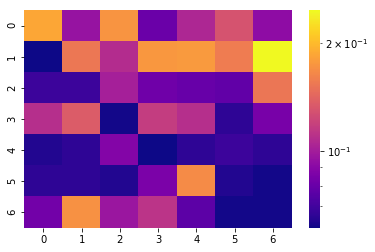

[[0.186 0.095 0.174 0.081 0.105 0.13  0.092]
 [0.061 0.154 0.108 0.176 0.177 0.157 0.247]
 [0.069 0.069 0.101 0.082 0.08  0.078 0.153]
 [0.109 0.136 0.062 0.117 0.109 0.066 0.085]
 [0.064 0.066 0.088 0.061 0.066 0.069 0.066]
 [0.066 0.066 0.064 0.086 0.167 0.064 0.062]
 [0.083 0.172 0.097 0.112 0.077 0.062 0.062]]


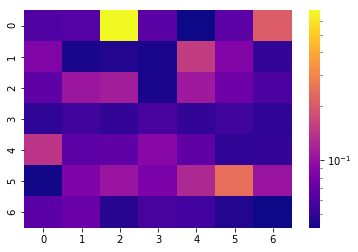

[[0.061 0.063 0.684 0.065 0.042 0.066 0.209]
 [0.087 0.044 0.046 0.044 0.152 0.089 0.051]
 [0.068 0.105 0.113 0.044 0.109 0.075 0.06 ]
 [0.049 0.054 0.051 0.058 0.051 0.054 0.049]
 [0.142 0.067 0.068 0.092 0.068 0.049 0.051]
 [0.043 0.085 0.104 0.082 0.125 0.243 0.103]
 [0.065 0.073 0.047 0.058 0.056 0.046 0.042]]


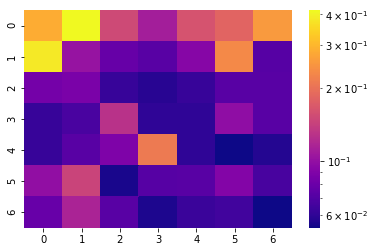

[[0.283 0.416 0.151 0.111 0.161 0.182 0.255]
 [0.385 0.102 0.078 0.073 0.093 0.232 0.072]
 [0.084 0.087 0.062 0.058 0.062 0.073 0.073]
 [0.062 0.068 0.128 0.06  0.06  0.098 0.073]
 [0.062 0.073 0.089 0.211 0.06  0.053 0.057]
 [0.099 0.145 0.055 0.072 0.073 0.091 0.067]
 [0.079 0.115 0.073 0.056 0.063 0.065 0.053]]


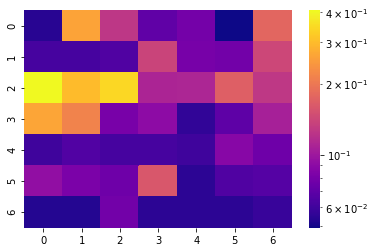

[[0.054 0.262 0.125 0.071 0.079 0.049 0.177]
 [0.062 0.062 0.065 0.139 0.08  0.078 0.142]
 [0.408 0.299 0.344 0.11  0.111 0.169 0.126]
 [0.265 0.215 0.081 0.091 0.056 0.07  0.106]
 [0.06  0.066 0.062 0.062 0.06  0.088 0.076]
 [0.093 0.082 0.076 0.159 0.055 0.065 0.067]
 [0.053 0.053 0.078 0.055 0.055 0.055 0.058]]


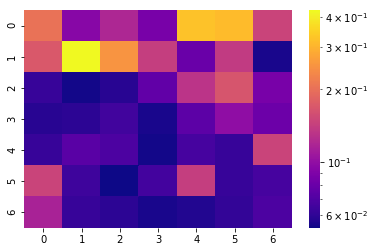

[[0.205 0.094 0.119 0.087 0.324 0.315 0.148]
 [0.17  0.427 0.252 0.142 0.08  0.138 0.055]
 [0.062 0.054 0.058 0.077 0.131 0.166 0.087]
 [0.058 0.059 0.065 0.055 0.075 0.099 0.081]
 [0.062 0.074 0.069 0.054 0.067 0.062 0.148]
 [0.148 0.064 0.053 0.066 0.141 0.062 0.067]
 [0.115 0.062 0.059 0.055 0.057 0.061 0.069]]


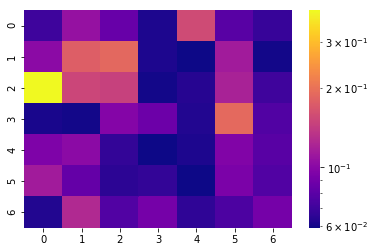

[[0.07  0.107 0.085 0.062 0.157 0.079 0.068]
 [0.102 0.178 0.189 0.062 0.059 0.115 0.06 ]
 [0.395 0.152 0.147 0.06  0.064 0.12  0.071]
 [0.061 0.06  0.098 0.087 0.063 0.19  0.077]
 [0.095 0.102 0.067 0.059 0.062 0.097 0.079]
 [0.115 0.084 0.065 0.067 0.059 0.094 0.077]
 [0.063 0.125 0.077 0.091 0.066 0.075 0.091]]


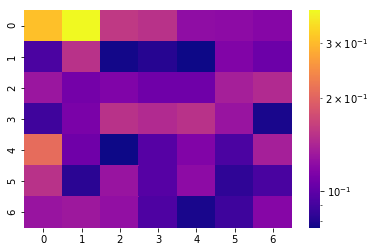

[[0.308 0.383 0.158 0.152 0.123 0.122 0.118]
 [0.093 0.152 0.077 0.081 0.076 0.116 0.106]
 [0.13  0.109 0.115 0.107 0.107 0.136 0.145]
 [0.089 0.112 0.152 0.145 0.152 0.128 0.078]
 [0.209 0.107 0.076 0.097 0.116 0.093 0.136]
 [0.152 0.082 0.128 0.097 0.122 0.084 0.092]
 [0.128 0.131 0.125 0.094 0.078 0.088 0.118]]
SKIPPPPPPEDDDD


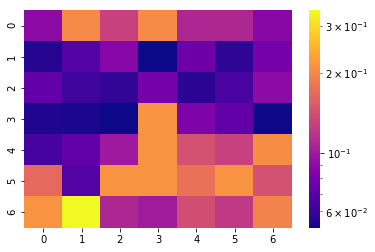

[[0.09  0.201 0.128 0.203 0.108 0.108 0.088]
 [0.056 0.068 0.087 0.052 0.077 0.058 0.08 ]
 [0.074 0.062 0.059 0.08  0.057 0.065 0.09 ]
 [0.055 0.054 0.052 0.213 0.084 0.073 0.052]
 [0.064 0.073 0.099 0.213 0.142 0.128 0.206]
 [0.168 0.068 0.213 0.213 0.175 0.213 0.142]
 [0.213 0.344 0.108 0.1   0.14  0.122 0.196]]
SKIPPPPPPEDDDD


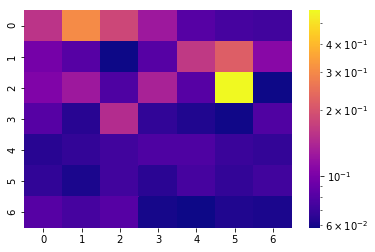

[[0.157 0.301 0.183 0.126 0.082 0.075 0.073]
 [0.098 0.082 0.058 0.082 0.163 0.218 0.11 ]
 [0.104 0.126 0.078 0.136 0.082 0.571 0.058]
 [0.082 0.064 0.147 0.067 0.062 0.059 0.079]
 [0.064 0.068 0.073 0.078 0.078 0.07  0.068]
 [0.067 0.061 0.073 0.065 0.075 0.068 0.073]
 [0.082 0.075 0.082 0.06  0.058 0.062 0.061]]


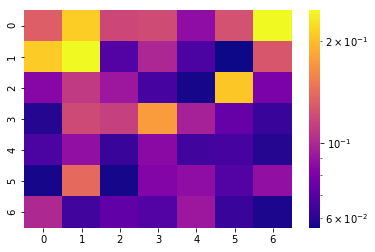

[[0.132 0.211 0.118 0.12  0.087 0.123 0.246]
 [0.21  0.246 0.069 0.099 0.067 0.056 0.127]
 [0.084 0.11  0.092 0.066 0.057 0.206 0.08 ]
 [0.059 0.119 0.113 0.175 0.096 0.074 0.063]
 [0.067 0.088 0.063 0.085 0.065 0.066 0.059]
 [0.057 0.14  0.057 0.083 0.087 0.069 0.088]
 [0.1   0.065 0.073 0.069 0.092 0.063 0.058]]


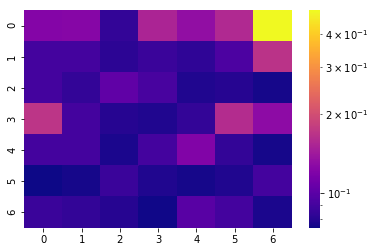

[[0.123 0.124 0.084 0.152 0.131 0.157 0.491]
 [0.091 0.091 0.082 0.087 0.083 0.094 0.168]
 [0.091 0.084 0.103 0.092 0.078 0.08  0.076]
 [0.17  0.091 0.08  0.078 0.084 0.16  0.128]
 [0.091 0.091 0.077 0.091 0.121 0.084 0.076]
 [0.074 0.076 0.087 0.078 0.076 0.078 0.091]
 [0.087 0.084 0.08  0.075 0.099 0.091 0.077]]


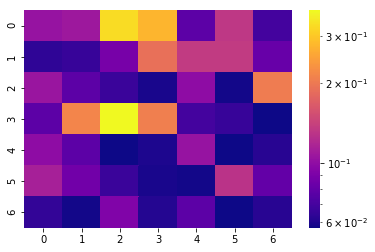

[[0.104 0.108 0.328 0.275 0.078 0.132 0.07 ]
 [0.064 0.066 0.088 0.189 0.135 0.135 0.082]
 [0.105 0.078 0.067 0.059 0.099 0.058 0.204]
 [0.078 0.214 0.374 0.207 0.07  0.066 0.057]
 [0.099 0.078 0.057 0.06  0.104 0.057 0.062]
 [0.113 0.086 0.067 0.059 0.058 0.128 0.08 ]
 [0.065 0.058 0.092 0.061 0.078 0.057 0.062]]


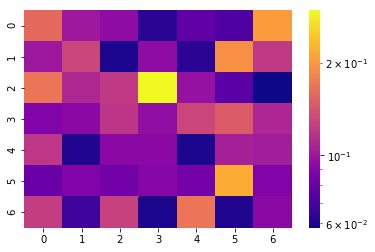

[[0.159 0.101 0.094 0.063 0.077 0.072 0.204]
 [0.1   0.13  0.06  0.094 0.063 0.193 0.121]
 [0.169 0.11  0.121 0.297 0.097 0.075 0.058]
 [0.088 0.092 0.119 0.095 0.13  0.148 0.109]
 [0.12  0.061 0.092 0.092 0.06  0.105 0.103]
 [0.08  0.088 0.083 0.091 0.084 0.22  0.088]
 [0.124 0.067 0.127 0.06  0.169 0.061 0.092]]


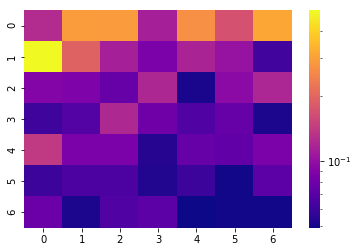

[[0.125 0.293 0.291 0.113 0.271 0.17  0.312]
 [0.499 0.193 0.113 0.086 0.117 0.103 0.062]
 [0.09  0.088 0.076 0.121 0.051 0.095 0.12 ]
 [0.061 0.068 0.122 0.08  0.067 0.076 0.052]
 [0.141 0.086 0.086 0.054 0.076 0.074 0.086]
 [0.06  0.066 0.066 0.053 0.06  0.05  0.072]
 [0.079 0.052 0.067 0.072 0.049 0.05  0.05 ]]


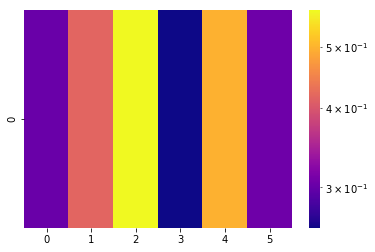

[[0.303 0.418 0.571 0.259 0.497 0.306]]


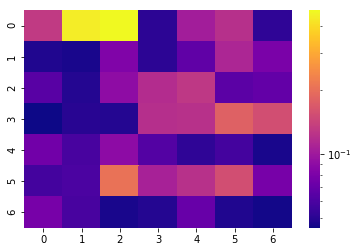

[[0.131 0.441 0.474 0.051 0.103 0.121 0.052]
 [0.048 0.047 0.082 0.051 0.068 0.111 0.079]
 [0.065 0.049 0.09  0.118 0.129 0.066 0.069]
 [0.045 0.05  0.049 0.12  0.122 0.179 0.155]
 [0.075 0.059 0.089 0.063 0.052 0.058 0.047]
 [0.058 0.06  0.206 0.107 0.122 0.155 0.078]
 [0.078 0.059 0.047 0.049 0.071 0.048 0.046]]


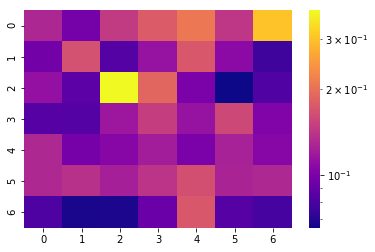

[[0.129 0.097 0.146 0.178 0.209 0.142 0.304]
 [0.096 0.166 0.084 0.114 0.173 0.108 0.077]
 [0.112 0.087 0.379 0.19  0.1   0.065 0.083]
 [0.085 0.084 0.117 0.149 0.114 0.159 0.102]
 [0.13  0.098 0.105 0.121 0.1   0.125 0.105]
 [0.13  0.137 0.123 0.14  0.165 0.126 0.13 ]
 [0.082 0.067 0.068 0.092 0.173 0.085 0.079]]


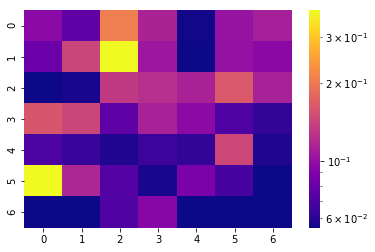

[[0.096 0.077 0.206 0.114 0.056 0.102 0.111]
 [0.082 0.143 0.381 0.105 0.055 0.1   0.095]
 [0.055 0.057 0.133 0.123 0.113 0.163 0.112]
 [0.16  0.143 0.077 0.112 0.096 0.071 0.063]
 [0.07  0.064 0.058 0.065 0.063 0.145 0.058]
 [0.38  0.116 0.073 0.057 0.088 0.068 0.055]
 [0.055 0.055 0.072 0.094 0.055 0.055 0.055]]


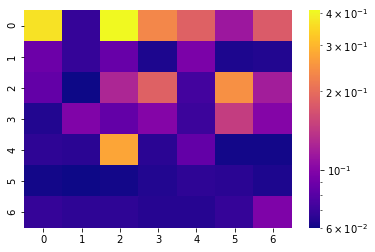

[[0.371 0.069 0.409 0.234 0.185 0.114 0.178]
 [0.089 0.069 0.087 0.063 0.096 0.063 0.064]
 [0.085 0.06  0.126 0.186 0.073 0.247 0.118]
 [0.064 0.098 0.085 0.1   0.071 0.147 0.1  ]
 [0.067 0.066 0.276 0.066 0.085 0.061 0.061]
 [0.061 0.06  0.061 0.064 0.067 0.066 0.063]
 [0.069 0.067 0.067 0.065 0.065 0.069 0.097]]


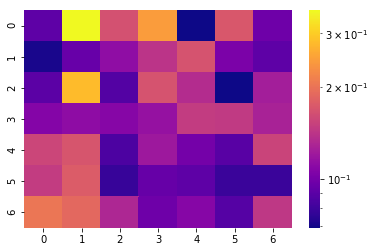

[[0.091 0.357 0.166 0.245 0.069 0.172 0.097]
 [0.071 0.095 0.113 0.141 0.168 0.103 0.091]
 [0.09  0.28  0.087 0.168 0.135 0.069 0.124]
 [0.107 0.112 0.108 0.116 0.148 0.146 0.127]
 [0.156 0.17  0.085 0.12  0.1   0.089 0.154]
 [0.148 0.177 0.078 0.094 0.091 0.079 0.079]
 [0.203 0.189 0.131 0.097 0.108 0.088 0.144]]


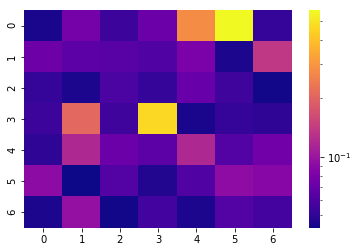

[[0.045 0.078 0.054 0.073 0.28  0.57  0.052]
 [0.074 0.066 0.064 0.061 0.08  0.046 0.137]
 [0.052 0.046 0.059 0.052 0.071 0.055 0.044]
 [0.054 0.208 0.055 0.468 0.045 0.052 0.05 ]
 [0.05  0.119 0.073 0.066 0.119 0.062 0.075]
 [0.091 0.043 0.062 0.047 0.061 0.092 0.087]
 [0.046 0.096 0.044 0.056 0.046 0.062 0.057]]


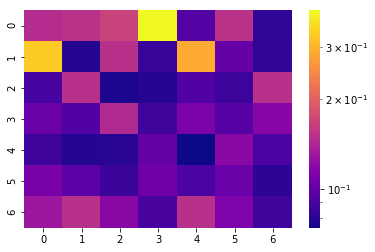

[[0.147 0.152 0.167 0.397 0.094 0.153 0.082]
 [0.33  0.079 0.151 0.084 0.288 0.102 0.083]
 [0.089 0.151 0.077 0.079 0.093 0.086 0.151]
 [0.103 0.093 0.144 0.087 0.111 0.095 0.117]
 [0.087 0.079 0.08  0.102 0.074 0.119 0.091]
 [0.11  0.097 0.085 0.106 0.091 0.103 0.081]
 [0.13  0.151 0.118 0.09  0.151 0.113 0.087]]


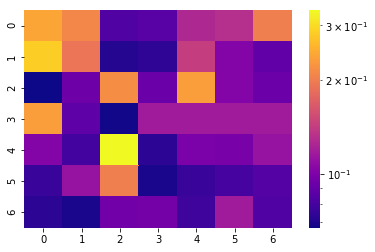

[[0.241 0.21  0.083 0.086 0.126 0.131 0.202]
 [0.283 0.192 0.071 0.074 0.143 0.103 0.089]
 [0.067 0.094 0.217 0.092 0.234 0.103 0.093]
 [0.234 0.088 0.068 0.117 0.117 0.117 0.117]
 [0.103 0.079 0.335 0.073 0.099 0.098 0.112]
 [0.076 0.112 0.202 0.069 0.076 0.08  0.085]
 [0.073 0.069 0.095 0.096 0.078 0.117 0.084]]


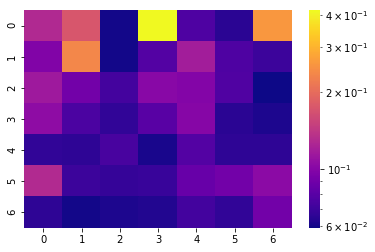

[[0.128 0.174 0.06  0.416 0.076 0.065 0.258]
 [0.098 0.236 0.06  0.078 0.118 0.076 0.07 ]
 [0.115 0.091 0.073 0.102 0.099 0.077 0.059]
 [0.105 0.075 0.067 0.08  0.1   0.065 0.062]
 [0.067 0.066 0.074 0.061 0.078 0.066 0.066]
 [0.129 0.07  0.068 0.069 0.086 0.091 0.103]
 [0.066 0.06  0.062 0.063 0.072 0.067 0.091]]


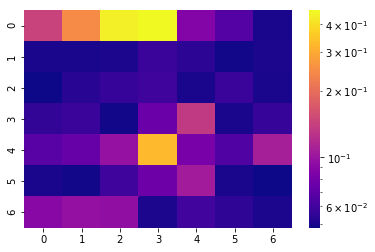

[[0.145 0.246 0.441 0.463 0.088 0.067 0.05 ]
 [0.05  0.05  0.051 0.058 0.054 0.049 0.051]
 [0.048 0.053 0.057 0.059 0.05  0.058 0.05 ]
 [0.056 0.058 0.049 0.075 0.135 0.05  0.057]
 [0.068 0.074 0.098 0.328 0.082 0.066 0.109]
 [0.05  0.049 0.059 0.077 0.106 0.05  0.048]
 [0.09  0.097 0.095 0.051 0.06  0.055 0.051]]


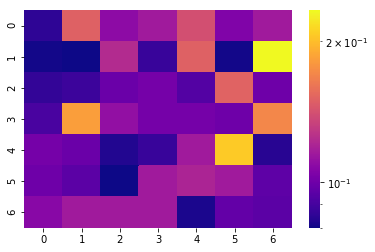

[[0.085 0.15  0.109 0.116 0.141 0.105 0.116]
 [0.081 0.08  0.123 0.087 0.15  0.081 0.233]
 [0.086 0.088 0.099 0.102 0.093 0.151 0.1  ]
 [0.091 0.183 0.111 0.102 0.102 0.1   0.171]
 [0.102 0.099 0.083 0.087 0.116 0.207 0.084]
 [0.1   0.095 0.08  0.116 0.12  0.116 0.096]
 [0.108 0.116 0.116 0.116 0.082 0.097 0.095]]


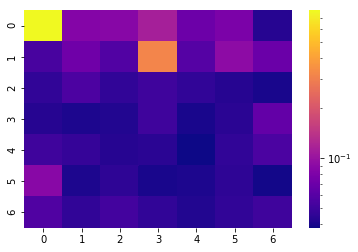

[[0.78  0.085 0.087 0.113 0.071 0.079 0.043]
 [0.054 0.072 0.058 0.321 0.059 0.092 0.07 ]
 [0.046 0.056 0.046 0.051 0.046 0.043 0.04 ]
 [0.043 0.041 0.042 0.051 0.04  0.044 0.066]
 [0.051 0.047 0.043 0.044 0.038 0.046 0.055]
 [0.088 0.041 0.045 0.04  0.041 0.045 0.039]
 [0.057 0.046 0.052 0.046 0.042 0.046 0.051]]


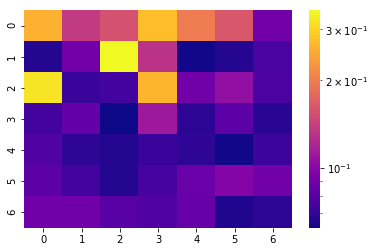

[[0.259 0.137 0.157 0.274 0.198 0.162 0.09 ]
 [0.066 0.09  0.349 0.131 0.063 0.066 0.076]
 [0.32  0.071 0.074 0.264 0.09  0.105 0.077]
 [0.074 0.085 0.062 0.111 0.068 0.082 0.067]
 [0.078 0.069 0.066 0.071 0.069 0.063 0.072]
 [0.082 0.074 0.066 0.075 0.087 0.098 0.09 ]
 [0.09  0.09  0.081 0.079 0.086 0.065 0.068]]


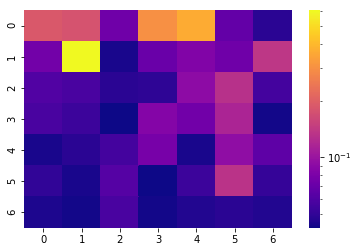

[[0.188 0.178 0.074 0.299 0.364 0.068 0.048]
 [0.076 0.605 0.044 0.071 0.084 0.074 0.137]
 [0.061 0.058 0.048 0.049 0.091 0.13  0.056]
 [0.058 0.053 0.042 0.086 0.075 0.116 0.043]
 [0.044 0.048 0.056 0.078 0.044 0.093 0.066]
 [0.05  0.044 0.062 0.042 0.053 0.133 0.051]
 [0.045 0.043 0.058 0.043 0.046 0.048 0.046]]


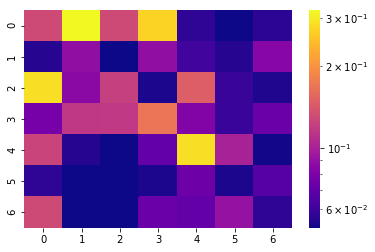

[[0.13  0.319 0.13  0.271 0.057 0.051 0.056]
 [0.055 0.089 0.051 0.089 0.061 0.055 0.084]
 [0.286 0.086 0.122 0.053 0.148 0.059 0.054]
 [0.078 0.116 0.117 0.169 0.082 0.059 0.074]
 [0.125 0.055 0.051 0.071 0.286 0.1   0.052]
 [0.057 0.051 0.051 0.053 0.075 0.053 0.067]
 [0.13  0.051 0.051 0.073 0.071 0.091 0.057]]


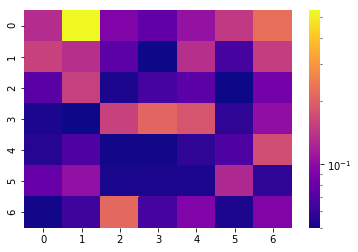

[[0.132 0.539 0.092 0.076 0.106 0.148 0.224]
 [0.157 0.136 0.074 0.05  0.136 0.065 0.152]
 [0.073 0.154 0.053 0.065 0.074 0.05  0.086]
 [0.053 0.05  0.158 0.21  0.183 0.057 0.103]
 [0.055 0.068 0.051 0.051 0.058 0.068 0.173]
 [0.079 0.104 0.052 0.053 0.053 0.127 0.058]
 [0.051 0.062 0.213 0.065 0.092 0.053 0.093]]


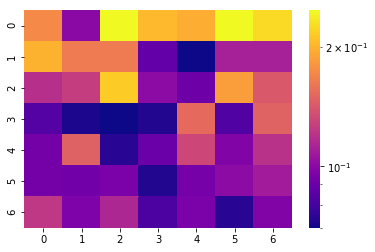

[[0.173 0.1   0.246 0.204 0.196 0.247 0.225]
 [0.199 0.164 0.164 0.088 0.07  0.111 0.111]
 [0.119 0.127 0.216 0.101 0.091 0.186 0.142]
 [0.084 0.072 0.07  0.073 0.153 0.083 0.148]
 [0.093 0.147 0.074 0.09  0.132 0.097 0.12 ]
 [0.093 0.092 0.095 0.073 0.094 0.101 0.109]
 [0.123 0.096 0.114 0.082 0.095 0.074 0.097]]


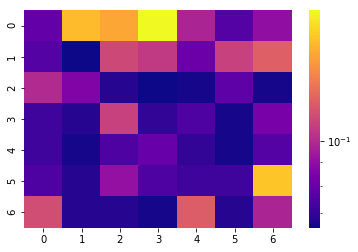

[[0.079 0.163 0.154 0.191 0.098 0.076 0.09 ]
 [0.076 0.065 0.112 0.106 0.081 0.109 0.122]
 [0.1   0.086 0.068 0.065 0.066 0.078 0.066]
 [0.072 0.068 0.109 0.07  0.075 0.066 0.084]
 [0.072 0.066 0.075 0.08  0.07  0.066 0.076]
 [0.075 0.068 0.091 0.075 0.072 0.072 0.167]
 [0.114 0.068 0.068 0.066 0.121 0.068 0.098]]
SKIPPPPPPEDDDD


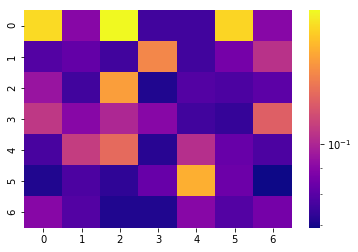

[[0.168 0.09  0.18  0.076 0.076 0.166 0.09 ]
 [0.079 0.082 0.076 0.136 0.076 0.086 0.104]
 [0.094 0.076 0.145 0.071 0.079 0.078 0.081]
 [0.106 0.09  0.1   0.09  0.076 0.074 0.121]
 [0.077 0.108 0.125 0.072 0.103 0.083 0.078]
 [0.071 0.078 0.073 0.083 0.152 0.084 0.069]
 [0.09  0.079 0.071 0.071 0.09  0.079 0.086]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


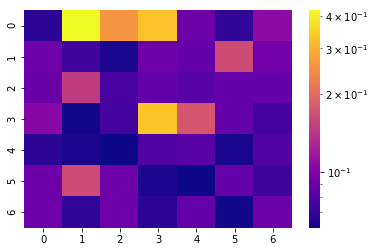

[[0.067 0.42  0.26  0.326 0.091 0.069 0.106]
 [0.091 0.073 0.063 0.091 0.087 0.165 0.094]
 [0.09  0.148 0.077 0.087 0.082 0.087 0.087]
 [0.104 0.062 0.075 0.332 0.174 0.087 0.075]
 [0.067 0.064 0.061 0.08  0.082 0.063 0.08 ]
 [0.091 0.163 0.091 0.064 0.061 0.087 0.073]
 [0.091 0.069 0.091 0.067 0.087 0.062 0.091]]


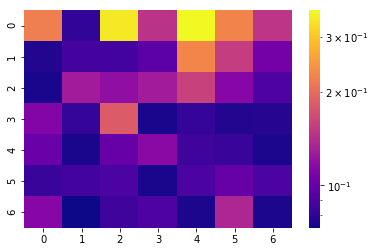

[[0.219 0.081 0.344 0.146 0.366 0.226 0.148]
 [0.077 0.087 0.086 0.095 0.227 0.155 0.105]
 [0.075 0.128 0.119 0.128 0.159 0.113 0.09 ]
 [0.112 0.082 0.184 0.075 0.082 0.077 0.078]
 [0.101 0.075 0.099 0.115 0.085 0.083 0.076]
 [0.083 0.086 0.089 0.075 0.089 0.099 0.089]
 [0.114 0.073 0.085 0.09  0.076 0.137 0.076]]


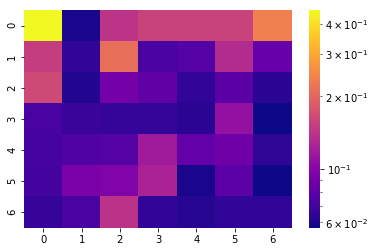

[[0.454 0.059 0.141 0.157 0.156 0.156 0.238]
 [0.151 0.065 0.213 0.073 0.077 0.132 0.085]
 [0.164 0.061 0.091 0.082 0.065 0.079 0.063]
 [0.073 0.068 0.066 0.066 0.063 0.109 0.057]
 [0.072 0.076 0.077 0.117 0.084 0.089 0.064]
 [0.071 0.094 0.097 0.125 0.059 0.08  0.057]
 [0.067 0.073 0.14  0.065 0.062 0.065 0.065]]


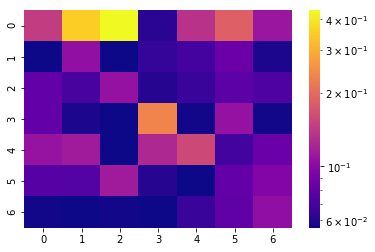

[[0.145 0.356 0.436 0.062 0.135 0.186 0.11 ]
 [0.056 0.105 0.056 0.065 0.07  0.085 0.059]
 [0.081 0.071 0.107 0.061 0.066 0.078 0.073]
 [0.081 0.059 0.056 0.234 0.057 0.107 0.057]
 [0.108 0.114 0.056 0.125 0.158 0.069 0.084]
 [0.076 0.075 0.114 0.061 0.056 0.081 0.096]
 [0.057 0.056 0.057 0.056 0.066 0.08  0.104]]


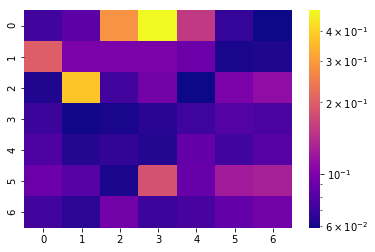

[[0.073 0.083 0.285 0.49  0.155 0.069 0.059]
 [0.202 0.099 0.099 0.099 0.091 0.061 0.063]
 [0.063 0.377 0.073 0.094 0.059 0.099 0.111]
 [0.071 0.06  0.061 0.065 0.072 0.08  0.076]
 [0.078 0.064 0.068 0.064 0.087 0.073 0.081]
 [0.091 0.081 0.062 0.182 0.089 0.124 0.128]
 [0.073 0.066 0.094 0.071 0.075 0.087 0.094]]


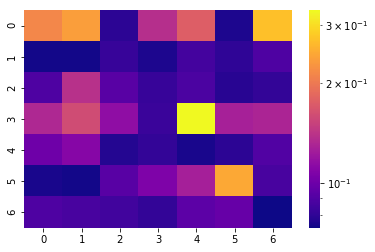

[[0.214 0.236 0.079 0.137 0.176 0.076 0.27 ]
 [0.074 0.074 0.082 0.076 0.086 0.08  0.089]
 [0.089 0.139 0.092 0.082 0.088 0.078 0.081]
 [0.132 0.16  0.115 0.083 0.332 0.127 0.13 ]
 [0.1   0.11  0.077 0.081 0.075 0.079 0.09 ]
 [0.075 0.074 0.092 0.107 0.126 0.246 0.087]
 [0.089 0.087 0.085 0.081 0.094 0.097 0.073]]
SKIPPPPPPEDDDD


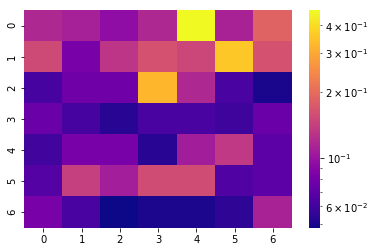

[[0.117 0.11  0.095 0.117 0.468 0.112 0.186]
 [0.153 0.082 0.131 0.163 0.149 0.359 0.163]
 [0.062 0.078 0.078 0.327 0.117 0.063 0.05 ]
 [0.075 0.062 0.053 0.063 0.063 0.059 0.075]
 [0.06  0.082 0.082 0.053 0.107 0.134 0.07 ]
 [0.067 0.141 0.108 0.156 0.156 0.065 0.07 ]
 [0.082 0.063 0.048 0.051 0.051 0.055 0.112]]


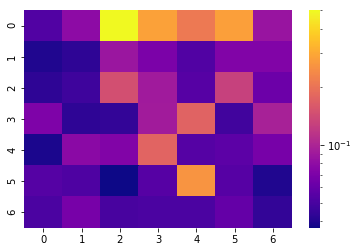

[[0.053 0.079 0.5   0.283 0.21  0.282 0.086]
 [0.04  0.043 0.087 0.07  0.053 0.073 0.073]
 [0.043 0.047 0.147 0.091 0.055 0.128 0.063]
 [0.071 0.043 0.044 0.092 0.175 0.048 0.097]
 [0.039 0.077 0.073 0.177 0.054 0.057 0.068]
 [0.054 0.052 0.037 0.055 0.26  0.055 0.04 ]
 [0.051 0.068 0.05  0.051 0.051 0.06  0.044]]


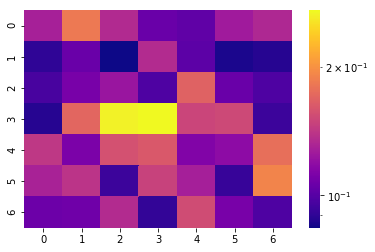

[[0.129 0.183 0.134 0.106 0.103 0.126 0.133]
 [0.09  0.106 0.084 0.135 0.102 0.086 0.088]
 [0.096 0.111 0.123 0.098 0.168 0.106 0.098]
 [0.088 0.171 0.266 0.271 0.15  0.152 0.093]
 [0.142 0.112 0.157 0.162 0.114 0.118 0.177]
 [0.13  0.14  0.093 0.148 0.128 0.092 0.191]
 [0.107 0.108 0.135 0.091 0.154 0.111 0.098]]
SKIPPPPPPEDDDD


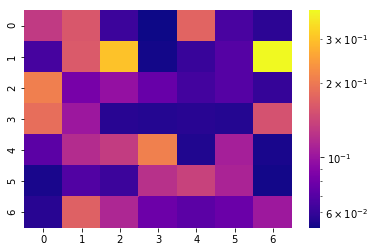

[[0.13  0.16  0.062 0.052 0.175 0.066 0.058]
 [0.065 0.162 0.301 0.053 0.061 0.07  0.392]
 [0.207 0.083 0.097 0.077 0.064 0.07  0.06 ]
 [0.186 0.102 0.057 0.056 0.057 0.056 0.154]
 [0.072 0.119 0.132 0.21  0.055 0.108 0.054]
 [0.054 0.069 0.062 0.122 0.138 0.111 0.053]
 [0.057 0.17  0.114 0.079 0.072 0.078 0.103]]


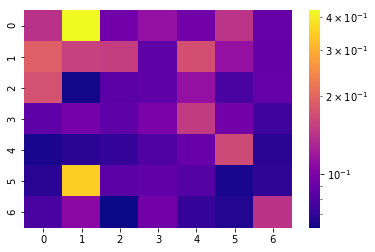

[[0.141 0.425 0.094 0.113 0.094 0.143 0.089]
 [0.191 0.156 0.152 0.086 0.172 0.113 0.088]
 [0.173 0.063 0.084 0.086 0.113 0.078 0.089]
 [0.086 0.096 0.086 0.099 0.15  0.095 0.074]
 [0.064 0.068 0.071 0.081 0.09  0.165 0.068]
 [0.068 0.352 0.084 0.087 0.082 0.064 0.069]
 [0.078 0.107 0.062 0.094 0.072 0.066 0.142]]


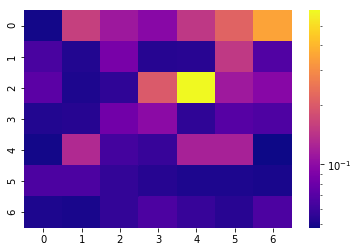

[[0.049 0.158 0.112 0.097 0.148 0.216 0.352]
 [0.065 0.052 0.087 0.053 0.054 0.149 0.068]
 [0.072 0.051 0.056 0.199 0.596 0.114 0.096]
 [0.052 0.053 0.083 0.099 0.056 0.07  0.067]
 [0.049 0.13  0.063 0.058 0.122 0.122 0.048]
 [0.066 0.066 0.057 0.053 0.051 0.051 0.05 ]
 [0.051 0.05  0.057 0.066 0.058 0.054 0.066]]
SKIPPPPPPEDDDD


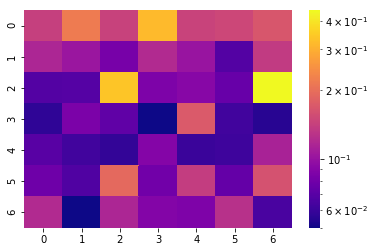

[[0.141 0.217 0.143 0.32  0.145 0.149 0.167]
 [0.116 0.103 0.083 0.12  0.101 0.068 0.136]
 [0.068 0.069 0.34  0.086 0.091 0.076 0.444]
 [0.057 0.085 0.073 0.05  0.172 0.062 0.055]
 [0.07  0.062 0.058 0.09  0.06  0.061 0.113]
 [0.079 0.067 0.192 0.08  0.138 0.075 0.161]
 [0.12  0.05  0.116 0.089 0.087 0.126 0.065]]


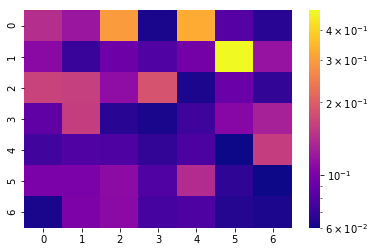

[[0.142 0.12  0.299 0.062 0.325 0.082 0.066]
 [0.108 0.071 0.093 0.08  0.096 0.484 0.117]
 [0.165 0.161 0.112 0.186 0.063 0.091 0.069]
 [0.086 0.16  0.066 0.062 0.073 0.106 0.129]
 [0.074 0.08  0.079 0.069 0.078 0.06  0.16 ]
 [0.1   0.1   0.11  0.08  0.14  0.068 0.06 ]
 [0.062 0.101 0.109 0.076 0.079 0.065 0.063]]


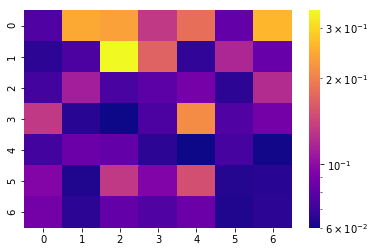

[[0.076 0.246 0.237 0.132 0.183 0.083 0.262]
 [0.066 0.075 0.346 0.17  0.067 0.118 0.084]
 [0.072 0.112 0.074 0.08  0.09  0.066 0.122]
 [0.132 0.065 0.06  0.075 0.214 0.076 0.089]
 [0.072 0.086 0.083 0.066 0.06  0.073 0.061]
 [0.095 0.063 0.132 0.094 0.152 0.064 0.065]
 [0.089 0.066 0.083 0.076 0.086 0.063 0.066]]


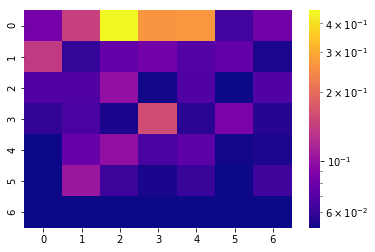

[[0.084 0.145 0.456 0.264 0.266 0.064 0.083]
 [0.138 0.06  0.076 0.083 0.07  0.076 0.054]
 [0.069 0.069 0.1   0.052 0.069 0.051 0.069]
 [0.059 0.066 0.053 0.159 0.057 0.086 0.056]
 [0.051 0.078 0.099 0.066 0.073 0.052 0.054]
 [0.051 0.105 0.062 0.053 0.061 0.051 0.063]
 [0.051 0.051 0.051 0.051 0.051 0.051 0.051]]


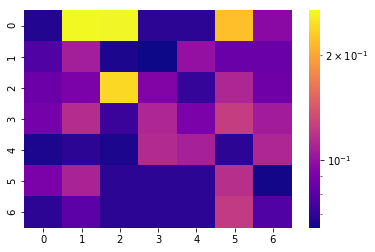

[[0.067 0.269 0.267 0.069 0.069 0.222 0.096]
 [0.078 0.107 0.066 0.064 0.1   0.085 0.085]
 [0.086 0.091 0.241 0.093 0.071 0.111 0.087]
 [0.089 0.115 0.072 0.111 0.091 0.125 0.106]
 [0.066 0.069 0.066 0.114 0.108 0.069 0.111]
 [0.091 0.11  0.069 0.069 0.069 0.117 0.065]
 [0.069 0.081 0.069 0.069 0.069 0.124 0.078]]


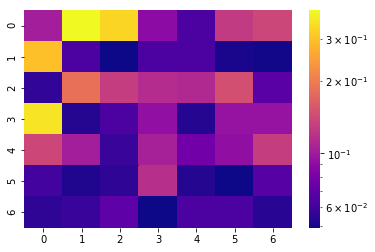

[[0.103 0.394 0.331 0.09  0.064 0.128 0.138]
 [0.298 0.064 0.049 0.064 0.064 0.051 0.05 ]
 [0.056 0.186 0.13  0.115 0.112 0.148 0.068]
 [0.356 0.053 0.064 0.093 0.053 0.095 0.095]
 [0.14  0.103 0.058 0.105 0.077 0.092 0.131]
 [0.061 0.052 0.055 0.118 0.053 0.049 0.067]
 [0.055 0.058 0.07  0.049 0.064 0.064 0.054]]


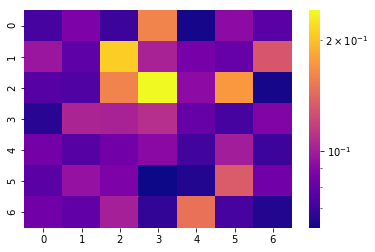

[[0.072 0.087 0.07  0.16  0.063 0.092 0.077]
 [0.097 0.078 0.211 0.103 0.085 0.08  0.131]
 [0.076 0.075 0.16  0.241 0.092 0.174 0.063]
 [0.066 0.104 0.103 0.109 0.08  0.072 0.088]
 [0.084 0.076 0.083 0.091 0.071 0.1   0.07 ]
 [0.077 0.095 0.087 0.062 0.065 0.134 0.083]
 [0.083 0.079 0.101 0.068 0.148 0.072 0.065]]


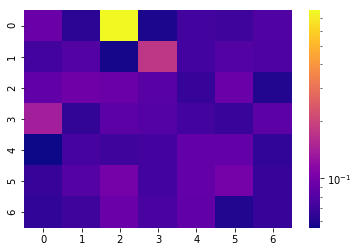

[[0.093 0.063 0.768 0.059 0.072 0.07  0.079]
 [0.072 0.08  0.057 0.177 0.072 0.08  0.078]
 [0.088 0.096 0.093 0.083 0.067 0.093 0.06 ]
 [0.141 0.066 0.084 0.081 0.072 0.068 0.085]
 [0.055 0.074 0.071 0.073 0.09  0.09  0.065]
 [0.067 0.081 0.1   0.072 0.09  0.1   0.067]
 [0.065 0.071 0.093 0.075 0.088 0.06  0.067]]


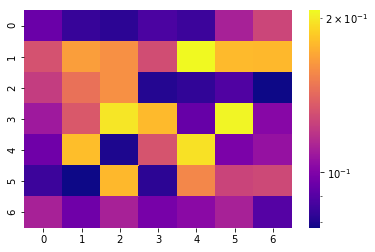

[[0.095 0.084 0.082 0.088 0.085 0.112 0.127]
 [0.132 0.166 0.16  0.13  0.207 0.179 0.178]
 [0.123 0.146 0.16  0.081 0.083 0.089 0.078]
 [0.109 0.135 0.198 0.179 0.094 0.205 0.102]
 [0.096 0.181 0.08  0.133 0.196 0.099 0.106]
 [0.085 0.078 0.178 0.082 0.156 0.126 0.128]
 [0.112 0.096 0.112 0.098 0.103 0.112 0.09 ]]


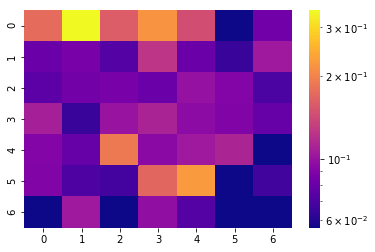

[[0.174 0.346 0.16  0.218 0.146 0.056 0.083]
 [0.081 0.086 0.073 0.125 0.08  0.065 0.104]
 [0.076 0.084 0.086 0.081 0.099 0.091 0.07 ]
 [0.108 0.065 0.101 0.111 0.095 0.09  0.079]
 [0.091 0.079 0.188 0.094 0.104 0.112 0.056]
 [0.09  0.071 0.068 0.169 0.225 0.056 0.067]
 [0.056 0.104 0.056 0.097 0.073 0.056 0.056]]


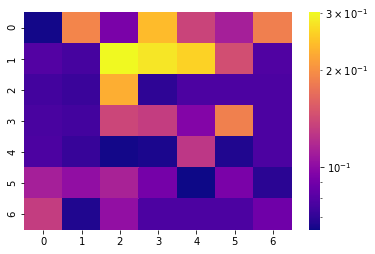

[[0.065 0.191 0.093 0.24  0.137 0.112 0.185]
 [0.08  0.076 0.301 0.281 0.261 0.144 0.079]
 [0.075 0.073 0.227 0.07  0.078 0.078 0.078]
 [0.077 0.075 0.138 0.132 0.096 0.186 0.078]
 [0.078 0.072 0.065 0.066 0.127 0.067 0.078]
 [0.112 0.102 0.114 0.091 0.064 0.093 0.069]
 [0.132 0.067 0.103 0.078 0.078 0.078 0.089]]


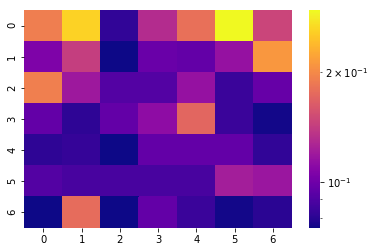

[[0.19  0.26  0.082 0.131 0.179 0.294 0.147]
 [0.106 0.143 0.075 0.098 0.096 0.115 0.211]
 [0.191 0.119 0.091 0.091 0.115 0.084 0.097]
 [0.096 0.081 0.096 0.112 0.172 0.084 0.076]
 [0.081 0.083 0.075 0.096 0.096 0.096 0.082]
 [0.091 0.088 0.088 0.088 0.088 0.122 0.118]
 [0.075 0.177 0.075 0.096 0.084 0.076 0.08 ]]


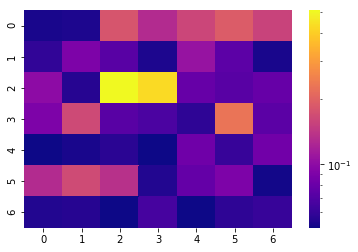

[[0.053 0.054 0.181 0.13  0.161 0.19  0.156]
 [0.059 0.09  0.073 0.054 0.106 0.075 0.053]
 [0.1   0.056 0.511 0.432 0.079 0.073 0.079]
 [0.09  0.165 0.073 0.068 0.058 0.229 0.074]
 [0.051 0.053 0.057 0.051 0.083 0.061 0.084]
 [0.129 0.166 0.136 0.055 0.078 0.09  0.052]
 [0.055 0.056 0.051 0.066 0.051 0.058 0.061]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


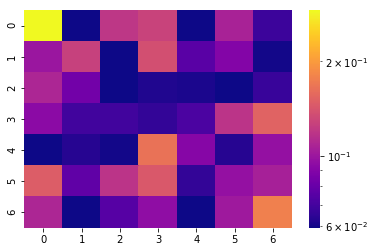

[[0.291 0.059 0.12  0.128 0.059 0.107 0.068]
 [0.1   0.127 0.059 0.137 0.076 0.09  0.06 ]
 [0.109 0.084 0.059 0.062 0.061 0.059 0.067]
 [0.093 0.069 0.069 0.066 0.072 0.118 0.153]
 [0.059 0.063 0.06  0.166 0.091 0.063 0.097]
 [0.148 0.078 0.118 0.144 0.066 0.097 0.106]
 [0.109 0.059 0.075 0.095 0.059 0.102 0.177]]


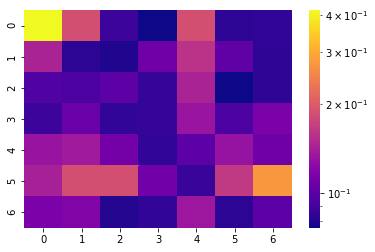

[[0.414 0.187 0.088 0.076 0.187 0.083 0.085]
 [0.144 0.083 0.08  0.109 0.158 0.102 0.084]
 [0.096 0.094 0.101 0.086 0.144 0.076 0.084]
 [0.088 0.107 0.085 0.086 0.132 0.094 0.115]
 [0.131 0.137 0.111 0.085 0.1   0.13  0.109]
 [0.141 0.187 0.187 0.11  0.087 0.164 0.273]
 [0.115 0.118 0.081 0.085 0.134 0.083 0.1  ]]


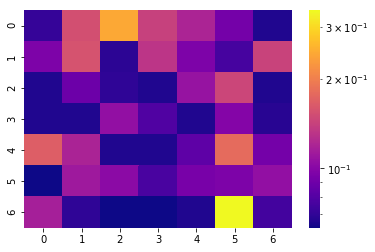

[[0.071 0.154 0.244 0.141 0.12  0.092 0.066]
 [0.096 0.157 0.069 0.132 0.096 0.076 0.143]
 [0.066 0.089 0.07  0.066 0.108 0.146 0.066]
 [0.066 0.066 0.106 0.079 0.066 0.099 0.068]
 [0.168 0.119 0.066 0.066 0.084 0.181 0.092]
 [0.063 0.112 0.102 0.077 0.094 0.096 0.106]
 [0.116 0.07  0.063 0.063 0.066 0.341 0.075]]


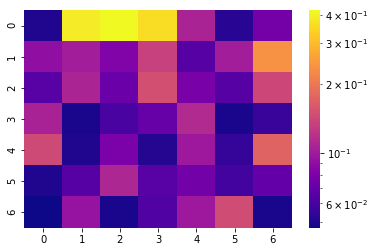

[[0.05  0.387 0.417 0.358 0.107 0.052 0.077]
 [0.091 0.102 0.082 0.134 0.065 0.102 0.236]
 [0.066 0.108 0.073 0.149 0.079 0.065 0.141]
 [0.106 0.049 0.061 0.071 0.113 0.049 0.056]
 [0.143 0.05  0.08  0.051 0.098 0.055 0.172]
 [0.05  0.065 0.11  0.066 0.076 0.059 0.07 ]
 [0.047 0.094 0.049 0.063 0.098 0.146 0.049]]


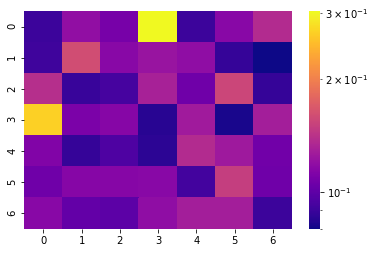

[[0.09  0.12  0.109 0.303 0.09  0.116 0.137]
 [0.091 0.16  0.116 0.123 0.119 0.088 0.08 ]
 [0.139 0.089 0.093 0.131 0.106 0.155 0.088]
 [0.267 0.111 0.115 0.085 0.127 0.082 0.129]
 [0.113 0.088 0.095 0.086 0.137 0.126 0.107]
 [0.106 0.115 0.115 0.116 0.092 0.15  0.106]
 [0.116 0.102 0.1   0.119 0.129 0.129 0.09 ]]


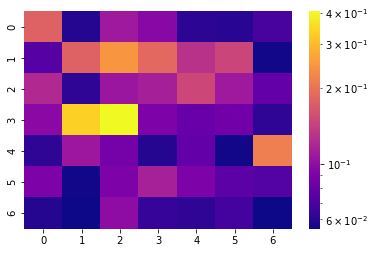

[[0.178 0.059 0.109 0.096 0.061 0.06  0.069]
 [0.074 0.178 0.246 0.186 0.129 0.147 0.056]
 [0.121 0.062 0.106 0.113 0.15  0.109 0.079]
 [0.097 0.334 0.405 0.09  0.081 0.085 0.062]
 [0.062 0.107 0.087 0.059 0.079 0.056 0.215]
 [0.09  0.056 0.09  0.114 0.09  0.076 0.073]
 [0.059 0.055 0.099 0.064 0.062 0.068 0.055]]


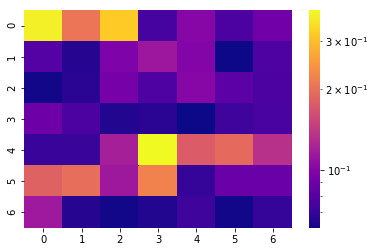

[[0.375 0.206 0.317 0.075 0.102 0.077 0.091]
 [0.08  0.066 0.097 0.113 0.1   0.061 0.078]
 [0.062 0.067 0.094 0.078 0.102 0.083 0.077]
 [0.09  0.077 0.065 0.067 0.061 0.073 0.076]
 [0.071 0.071 0.119 0.39  0.176 0.193 0.134]
 [0.183 0.197 0.114 0.221 0.07  0.088 0.088]
 [0.115 0.066 0.062 0.065 0.073 0.062 0.07 ]]


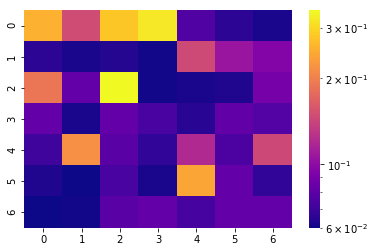

[[0.256 0.149 0.28  0.323 0.076 0.066 0.062]
 [0.066 0.062 0.064 0.061 0.147 0.106 0.095]
 [0.19  0.083 0.346 0.061 0.062 0.063 0.09 ]
 [0.083 0.062 0.083 0.074 0.065 0.082 0.077]
 [0.071 0.218 0.079 0.067 0.12  0.075 0.146]
 [0.063 0.06  0.074 0.062 0.242 0.083 0.067]
 [0.06  0.061 0.079 0.083 0.073 0.083 0.083]]


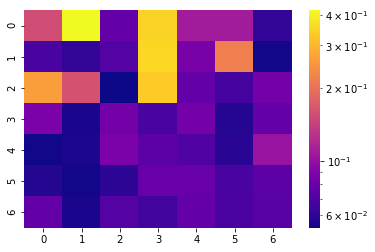

[[0.154 0.418 0.078 0.35  0.109 0.109 0.061]
 [0.068 0.061 0.071 0.355 0.086 0.218 0.054]
 [0.263 0.161 0.053 0.335 0.077 0.066 0.084]
 [0.088 0.055 0.084 0.068 0.084 0.057 0.077]
 [0.054 0.056 0.088 0.074 0.07  0.058 0.103]
 [0.057 0.054 0.059 0.079 0.079 0.068 0.074]
 [0.077 0.055 0.072 0.065 0.077 0.069 0.073]]


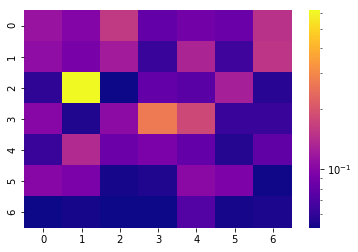

[[0.114 0.099 0.159 0.08  0.088 0.083 0.148]
 [0.107 0.092 0.122 0.062 0.132 0.065 0.152]
 [0.059 0.616 0.051 0.08  0.076 0.125 0.057]
 [0.1   0.055 0.105 0.27  0.18  0.062 0.062]
 [0.062 0.138 0.085 0.093 0.081 0.056 0.079]
 [0.101 0.093 0.053 0.055 0.103 0.095 0.052]
 [0.051 0.053 0.051 0.051 0.073 0.053 0.054]]


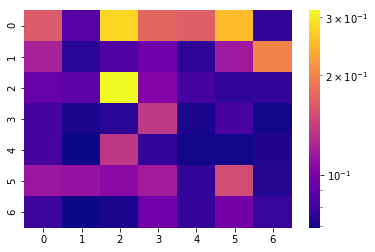

[[0.164 0.086 0.279 0.174 0.167 0.252 0.076]
 [0.121 0.074 0.085 0.096 0.075 0.116 0.2  ]
 [0.092 0.089 0.315 0.103 0.081 0.076 0.076]
 [0.082 0.071 0.074 0.137 0.071 0.082 0.07 ]
 [0.082 0.069 0.135 0.076 0.07  0.07  0.072]
 [0.114 0.112 0.106 0.117 0.076 0.151 0.073]
 [0.079 0.069 0.071 0.096 0.077 0.097 0.078]]


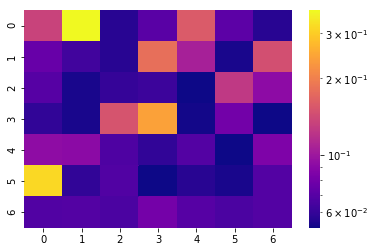

[[0.135 0.369 0.057 0.071 0.158 0.072 0.057]
 [0.076 0.063 0.057 0.18  0.106 0.054 0.147]
 [0.07  0.054 0.06  0.062 0.052 0.126 0.092]
 [0.059 0.054 0.151 0.242 0.053 0.08  0.052]
 [0.093 0.091 0.067 0.059 0.069 0.052 0.085]
 [0.317 0.059 0.068 0.052 0.057 0.054 0.069]
 [0.068 0.069 0.066 0.081 0.07  0.066 0.069]]


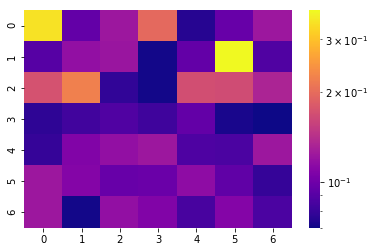

[[0.343 0.095 0.123 0.197 0.075 0.097 0.123]
 [0.09  0.117 0.121 0.071 0.095 0.375 0.088]
 [0.172 0.222 0.078 0.071 0.169 0.167 0.133]
 [0.077 0.083 0.088 0.082 0.095 0.072 0.07 ]
 [0.079 0.108 0.117 0.123 0.087 0.086 0.123]
 [0.123 0.11  0.097 0.098 0.115 0.094 0.079]
 [0.123 0.071 0.117 0.108 0.085 0.11  0.086]]


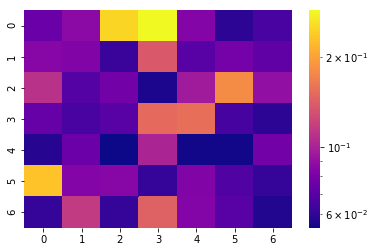

[[0.075 0.087 0.248 0.285 0.084 0.059 0.066]
 [0.085 0.083 0.062 0.137 0.07  0.079 0.072]
 [0.11  0.069 0.078 0.056 0.096 0.18  0.09 ]
 [0.074 0.066 0.07  0.151 0.155 0.065 0.059]
 [0.058 0.076 0.054 0.102 0.055 0.055 0.078]
 [0.23  0.084 0.085 0.061 0.083 0.068 0.061]
 [0.061 0.116 0.061 0.144 0.084 0.07  0.057]]


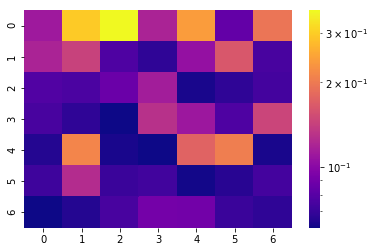

[[0.112 0.296 0.36  0.119 0.24  0.084 0.195]
 [0.119 0.144 0.077 0.068 0.106 0.164 0.075]
 [0.078 0.076 0.087 0.114 0.063 0.068 0.074]
 [0.075 0.068 0.061 0.129 0.11  0.077 0.147]
 [0.065 0.214 0.063 0.061 0.176 0.204 0.063]
 [0.072 0.126 0.071 0.073 0.062 0.066 0.074]
 [0.061 0.065 0.075 0.091 0.09  0.071 0.068]]


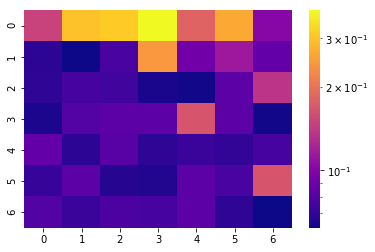

[[0.15  0.298 0.31  0.379 0.182 0.266 0.101]
 [0.068 0.062 0.077 0.245 0.092 0.114 0.086]
 [0.069 0.076 0.074 0.064 0.063 0.084 0.136]
 [0.065 0.08  0.084 0.084 0.168 0.084 0.063]
 [0.087 0.068 0.082 0.069 0.072 0.07  0.076]
 [0.071 0.084 0.067 0.066 0.084 0.077 0.168]
 [0.08  0.072 0.078 0.076 0.084 0.069 0.062]]


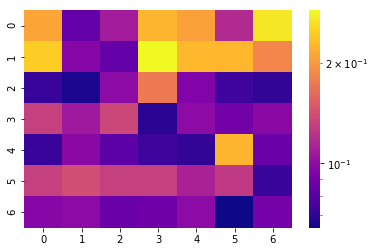

[[0.211 0.084 0.108 0.225 0.208 0.117 0.271]
 [0.247 0.096 0.084 0.288 0.229 0.227 0.185]
 [0.072 0.066 0.099 0.175 0.094 0.074 0.071]
 [0.131 0.107 0.135 0.069 0.099 0.089 0.098]
 [0.072 0.098 0.082 0.074 0.071 0.225 0.086]
 [0.131 0.14  0.131 0.131 0.112 0.126 0.072]
 [0.097 0.099 0.086 0.088 0.099 0.064 0.09 ]]


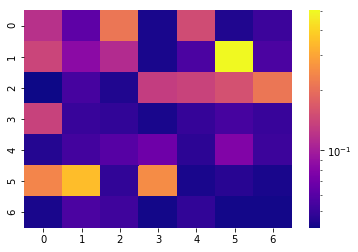

[[0.119 0.063 0.214 0.043 0.15  0.044 0.051]
 [0.142 0.084 0.113 0.043 0.056 0.503 0.056]
 [0.041 0.054 0.044 0.132 0.139 0.156 0.213]
 [0.137 0.05  0.048 0.043 0.049 0.054 0.05 ]
 [0.045 0.053 0.06  0.069 0.047 0.079 0.051]
 [0.24  0.351 0.048 0.251 0.043 0.046 0.043]
 [0.043 0.056 0.052 0.042 0.048 0.042 0.042]]


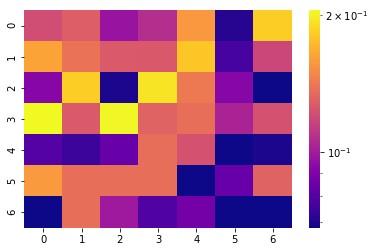

[[0.121 0.129 0.097 0.107 0.157 0.071 0.184]
 [0.163 0.139 0.127 0.126 0.18  0.077 0.118]
 [0.092 0.184 0.07  0.194 0.142 0.092 0.068]
 [0.205 0.127 0.204 0.131 0.137 0.103 0.123]
 [0.08  0.075 0.084 0.137 0.123 0.068 0.07 ]
 [0.158 0.137 0.137 0.137 0.068 0.084 0.131]
 [0.068 0.137 0.099 0.079 0.087 0.068 0.068]]


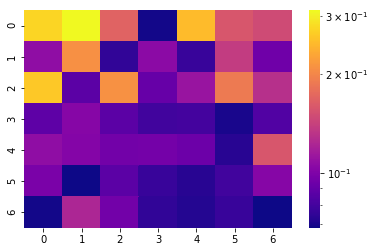

[[0.275 0.312 0.169 0.069 0.25  0.158 0.149]
 [0.107 0.209 0.075 0.105 0.077 0.138 0.094]
 [0.262 0.087 0.21  0.091 0.111 0.189 0.129]
 [0.088 0.103 0.087 0.079 0.08  0.07  0.084]
 [0.107 0.102 0.095 0.096 0.093 0.073 0.158]
 [0.098 0.068 0.087 0.077 0.073 0.079 0.103]
 [0.069 0.122 0.095 0.075 0.072 0.077 0.068]]


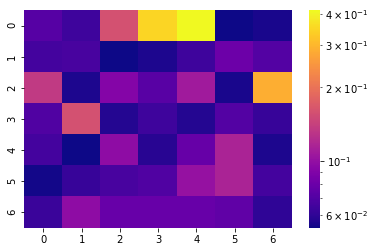

[[0.072 0.064 0.159 0.35  0.415 0.053 0.055]
 [0.066 0.067 0.053 0.056 0.064 0.081 0.071]
 [0.135 0.056 0.092 0.073 0.108 0.055 0.285]
 [0.07  0.159 0.057 0.064 0.057 0.071 0.062]
 [0.066 0.053 0.097 0.058 0.078 0.115 0.056]
 [0.054 0.062 0.067 0.07  0.101 0.115 0.066]
 [0.063 0.097 0.079 0.079 0.079 0.076 0.06 ]]


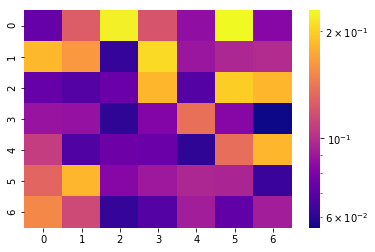

[[0.073 0.126 0.222 0.121 0.086 0.229 0.082]
 [0.184 0.163 0.062 0.207 0.089 0.097 0.099]
 [0.073 0.069 0.074 0.183 0.069 0.198 0.183]
 [0.088 0.087 0.061 0.081 0.138 0.082 0.056]
 [0.108 0.068 0.075 0.074 0.061 0.136 0.183]
 [0.131 0.183 0.082 0.09  0.097 0.096 0.063]
 [0.153 0.115 0.062 0.069 0.092 0.072 0.092]]


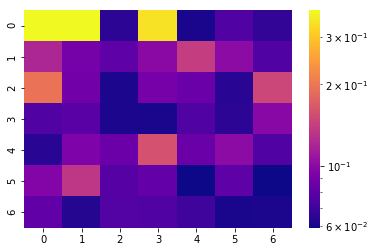

[[0.375 0.376 0.065 0.34  0.061 0.076 0.067]
 [0.12  0.09  0.081 0.1   0.14  0.101 0.076]
 [0.196 0.088 0.062 0.091 0.085 0.064 0.148]
 [0.076 0.079 0.062 0.061 0.076 0.065 0.099]
 [0.064 0.094 0.086 0.159 0.085 0.101 0.076]
 [0.097 0.134 0.078 0.083 0.059 0.081 0.059]
 [0.082 0.063 0.077 0.076 0.07  0.061 0.062]]


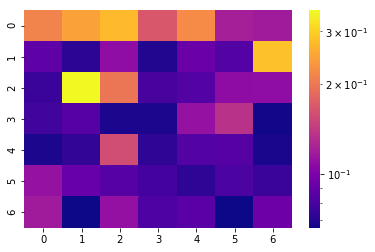

[[0.212 0.246 0.274 0.168 0.221 0.121 0.118]
 [0.088 0.072 0.109 0.07  0.092 0.084 0.283]
 [0.076 0.353 0.199 0.08  0.084 0.108 0.109]
 [0.078 0.085 0.069 0.069 0.112 0.135 0.067]
 [0.069 0.074 0.158 0.073 0.084 0.085 0.068]
 [0.112 0.091 0.085 0.079 0.073 0.081 0.076]
 [0.118 0.066 0.111 0.082 0.086 0.066 0.094]]


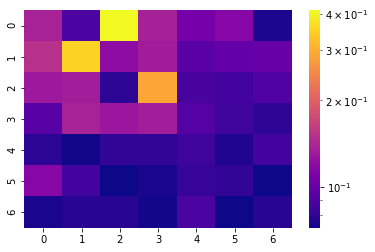

[[0.137 0.089 0.411 0.136 0.108 0.116 0.075]
 [0.151 0.353 0.12  0.132 0.095 0.099 0.1  ]
 [0.13  0.133 0.079 0.29  0.088 0.086 0.091]
 [0.094 0.137 0.128 0.133 0.093 0.085 0.08 ]
 [0.079 0.073 0.081 0.081 0.085 0.076 0.086]
 [0.116 0.086 0.072 0.074 0.082 0.081 0.072]
 [0.074 0.078 0.078 0.073 0.089 0.072 0.078]]


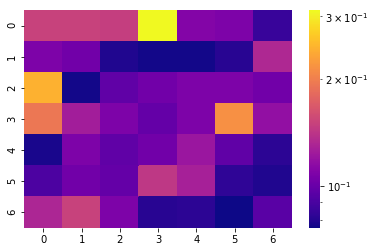

[[0.15  0.15  0.148 0.312 0.11  0.108 0.085]
 [0.108 0.103 0.079 0.077 0.077 0.081 0.132]
 [0.244 0.077 0.097 0.103 0.108 0.108 0.103]
 [0.194 0.125 0.108 0.099 0.108 0.215 0.117]
 [0.078 0.108 0.097 0.103 0.121 0.097 0.082]
 [0.091 0.103 0.099 0.143 0.127 0.083 0.079]
 [0.131 0.15  0.108 0.081 0.082 0.076 0.095]]


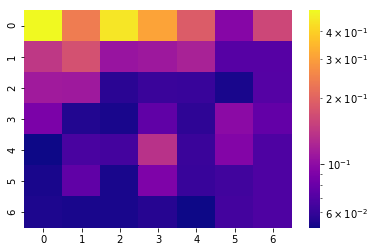

[[0.499 0.239 0.449 0.31  0.188 0.095 0.16 ]
 [0.141 0.172 0.106 0.11  0.119 0.072 0.072]
 [0.112 0.111 0.057 0.062 0.061 0.053 0.071]
 [0.089 0.055 0.053 0.076 0.058 0.098 0.077]
 [0.051 0.067 0.065 0.135 0.062 0.093 0.069]
 [0.053 0.076 0.053 0.091 0.061 0.064 0.069]
 [0.054 0.053 0.053 0.056 0.051 0.065 0.069]]


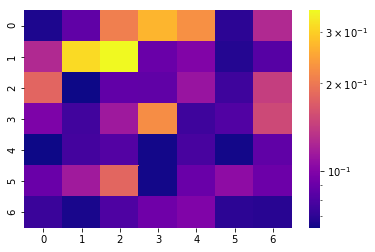

[[0.067 0.086 0.207 0.269 0.227 0.07  0.126]
 [0.126 0.314 0.356 0.09  0.1   0.068 0.083]
 [0.18  0.064 0.087 0.086 0.111 0.075 0.144]
 [0.098 0.076 0.115 0.224 0.075 0.081 0.152]
 [0.064 0.077 0.082 0.065 0.078 0.065 0.086]
 [0.09  0.116 0.182 0.065 0.09  0.106 0.091]
 [0.074 0.066 0.08  0.092 0.099 0.07  0.069]]


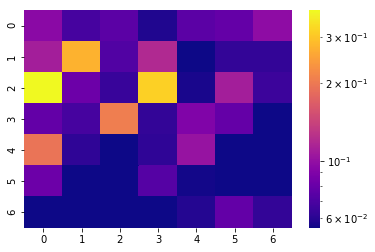

[[0.095 0.068 0.075 0.058 0.075 0.079 0.097]
 [0.11  0.274 0.072 0.118 0.055 0.063 0.063]
 [0.38  0.082 0.064 0.315 0.057 0.11  0.065]
 [0.078 0.068 0.205 0.063 0.09  0.079 0.055]
 [0.193 0.062 0.055 0.062 0.102 0.055 0.055]
 [0.082 0.055 0.055 0.073 0.056 0.055 0.055]
 [0.055 0.055 0.055 0.055 0.059 0.078 0.063]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


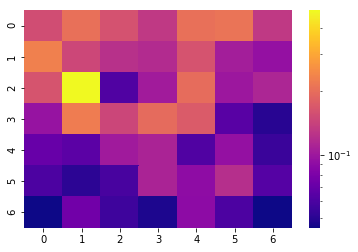

[[0.155 0.205 0.162 0.131 0.205 0.212 0.131]
 [0.231 0.149 0.123 0.118 0.163 0.105 0.094]
 [0.165 0.485 0.062 0.103 0.2   0.1   0.112]
 [0.096 0.225 0.147 0.198 0.173 0.065 0.05 ]
 [0.071 0.066 0.102 0.11  0.062 0.094 0.055]
 [0.061 0.051 0.059 0.11  0.091 0.121 0.064]
 [0.045 0.075 0.056 0.048 0.09  0.061 0.045]]


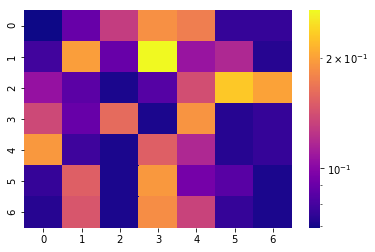

[[0.069 0.09  0.13  0.188 0.174 0.076 0.076]
 [0.079 0.198 0.09  0.269 0.107 0.118 0.073]
 [0.106 0.086 0.071 0.084 0.141 0.23  0.201]
 [0.137 0.09  0.161 0.071 0.191 0.073 0.076]
 [0.194 0.078 0.071 0.153 0.118 0.073 0.076]
 [0.076 0.153 0.071 0.194 0.094 0.085 0.071]
 [0.073 0.146 0.071 0.186 0.134 0.076 0.071]]


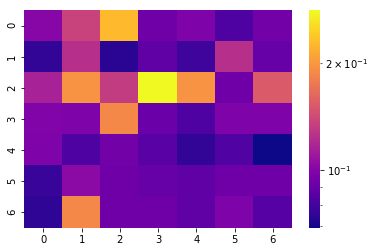

[[0.101 0.136 0.227 0.093 0.098 0.083 0.094]
 [0.076 0.124 0.074 0.088 0.079 0.124 0.09 ]
 [0.116 0.196 0.132 0.28  0.196 0.093 0.152]
 [0.099 0.098 0.187 0.091 0.083 0.098 0.098]
 [0.098 0.083 0.094 0.086 0.076 0.084 0.069]
 [0.077 0.103 0.093 0.09  0.088 0.093 0.093]
 [0.075 0.187 0.093 0.093 0.088 0.098 0.085]]


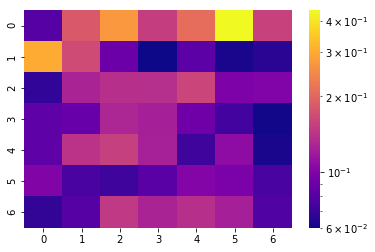

[[0.081 0.184 0.273 0.153 0.209 0.44  0.157]
 [0.301 0.167 0.09  0.06  0.083 0.062 0.066]
 [0.068 0.127 0.139 0.137 0.16  0.098 0.1  ]
 [0.084 0.088 0.129 0.123 0.092 0.074 0.061]
 [0.084 0.142 0.154 0.124 0.072 0.108 0.062]
 [0.101 0.076 0.072 0.082 0.102 0.097 0.076]
 [0.069 0.081 0.147 0.127 0.139 0.123 0.079]]


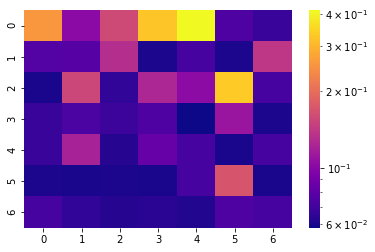

[[0.257 0.102 0.158 0.324 0.414 0.075 0.068]
 [0.077 0.078 0.13  0.061 0.072 0.061 0.139]
 [0.06  0.154 0.066 0.124 0.103 0.332 0.072]
 [0.068 0.074 0.069 0.075 0.058 0.11  0.061]
 [0.068 0.12  0.063 0.084 0.072 0.06  0.072]
 [0.061 0.06  0.061 0.06  0.072 0.17  0.06 ]
 [0.072 0.066 0.063 0.064 0.062 0.075 0.072]]


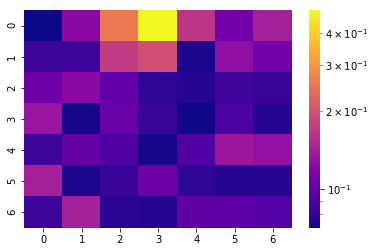

[[0.071 0.123 0.257 0.488 0.165 0.108 0.143]
 [0.084 0.084 0.172 0.194 0.074 0.127 0.108]
 [0.106 0.123 0.101 0.08  0.076 0.085 0.082]
 [0.133 0.073 0.105 0.083 0.072 0.09  0.076]
 [0.084 0.102 0.093 0.073 0.093 0.135 0.129]
 [0.143 0.074 0.083 0.106 0.079 0.076 0.076]
 [0.084 0.143 0.078 0.077 0.099 0.098 0.094]]


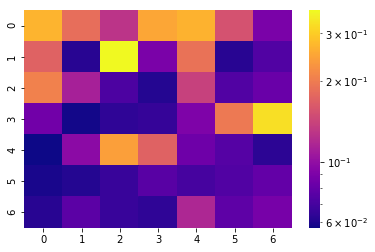

[[0.268 0.184 0.128 0.251 0.266 0.154 0.089]
 [0.171 0.062 0.365 0.089 0.19  0.062 0.074]
 [0.207 0.112 0.072 0.061 0.139 0.074 0.082]
 [0.085 0.058 0.064 0.065 0.091 0.197 0.327]
 [0.057 0.097 0.242 0.171 0.084 0.075 0.063]
 [0.059 0.061 0.066 0.076 0.07  0.074 0.08 ]
 [0.062 0.077 0.066 0.064 0.117 0.078 0.088]]
SKIPPPPPPEDDDD


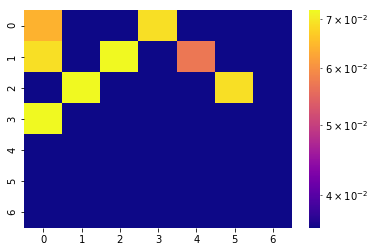

[[0.064 0.036 0.036 0.069 0.036 0.036 0.036]
 [0.069 0.036 0.072 0.036 0.057 0.036 0.036]
 [0.036 0.072 0.036 0.036 0.036 0.069 0.036]
 [0.072 0.036 0.036 0.036 0.036 0.036 0.036]
 [0.036 0.036 0.036 0.036 0.036 0.036 0.036]
 [0.036 0.036 0.036 0.036 0.036 0.036 0.036]
 [0.036 0.036 0.036 0.036 0.036 0.036 0.036]]


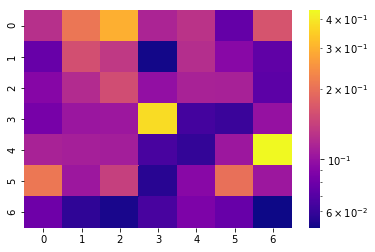

[[0.125 0.208 0.296 0.115 0.129 0.076 0.164]
 [0.077 0.159 0.134 0.052 0.123 0.093 0.074]
 [0.091 0.121 0.156 0.098 0.113 0.112 0.073]
 [0.084 0.103 0.104 0.374 0.064 0.061 0.1  ]
 [0.113 0.111 0.11  0.065 0.059 0.104 0.434]
 [0.21  0.104 0.141 0.056 0.093 0.201 0.104]
 [0.08  0.058 0.053 0.065 0.087 0.077 0.051]]


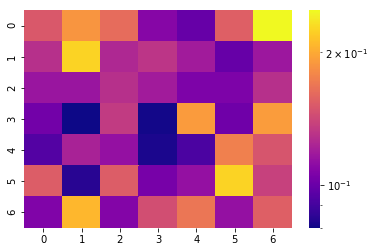

[[0.151 0.188 0.163 0.109 0.099 0.155 0.249]
 [0.129 0.225 0.125 0.132 0.119 0.099 0.117]
 [0.116 0.116 0.129 0.119 0.106 0.106 0.129]
 [0.103 0.08  0.135 0.081 0.191 0.102 0.192]
 [0.094 0.122 0.114 0.082 0.092 0.175 0.149]
 [0.154 0.084 0.154 0.104 0.114 0.225 0.138]
 [0.107 0.208 0.108 0.145 0.169 0.114 0.155]]
SKIPPPPPPEDDDD


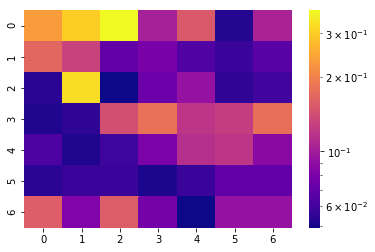

[[0.234 0.304 0.372 0.103 0.153 0.053 0.105]
 [0.168 0.131 0.07  0.079 0.065 0.058 0.067]
 [0.054 0.323 0.049 0.074 0.093 0.055 0.06 ]
 [0.052 0.055 0.143 0.18  0.119 0.126 0.178]
 [0.064 0.052 0.059 0.08  0.114 0.119 0.087]
 [0.054 0.058 0.058 0.051 0.058 0.07  0.07 ]
 [0.159 0.082 0.158 0.077 0.049 0.093 0.093]]


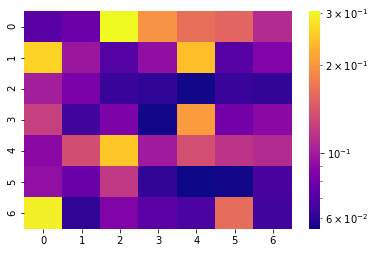

[[0.072 0.078 0.304 0.196 0.163 0.154 0.11 ]
 [0.259 0.097 0.07  0.092 0.24  0.071 0.085]
 [0.101 0.083 0.063 0.061 0.056 0.063 0.062]
 [0.124 0.065 0.084 0.056 0.204 0.081 0.089]
 [0.089 0.135 0.249 0.099 0.136 0.116 0.11 ]
 [0.093 0.077 0.119 0.062 0.055 0.056 0.067]
 [0.293 0.061 0.086 0.073 0.068 0.161 0.065]]


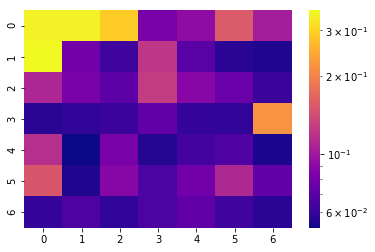

[[0.345 0.346 0.29  0.082 0.092 0.156 0.104]
 [0.358 0.079 0.062 0.122 0.07  0.057 0.055]
 [0.109 0.082 0.071 0.127 0.088 0.076 0.061]
 [0.057 0.059 0.061 0.073 0.06  0.059 0.219]
 [0.116 0.052 0.082 0.056 0.064 0.068 0.054]
 [0.151 0.055 0.088 0.066 0.079 0.111 0.073]
 [0.06  0.067 0.059 0.066 0.073 0.062 0.057]]


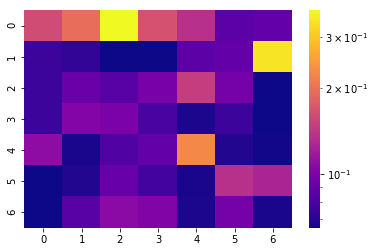

[[0.16  0.196 0.372 0.166 0.136 0.086 0.089]
 [0.076 0.073 0.065 0.065 0.086 0.09  0.341]
 [0.076 0.092 0.085 0.098 0.148 0.097 0.065]
 [0.076 0.104 0.099 0.08  0.068 0.076 0.065]
 [0.109 0.067 0.082 0.089 0.226 0.069 0.066]
 [0.065 0.069 0.091 0.078 0.067 0.136 0.126]
 [0.065 0.085 0.107 0.102 0.068 0.097 0.067]]


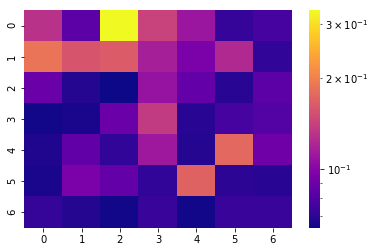

[[0.13  0.084 0.333 0.143 0.11  0.072 0.077]
 [0.187 0.158 0.164 0.116 0.096 0.123 0.071]
 [0.089 0.068 0.064 0.108 0.087 0.069 0.084]
 [0.065 0.066 0.089 0.136 0.069 0.077 0.081]
 [0.067 0.086 0.071 0.112 0.068 0.175 0.091]
 [0.066 0.096 0.087 0.071 0.17  0.07  0.069]
 [0.072 0.068 0.065 0.073 0.065 0.073 0.073]]


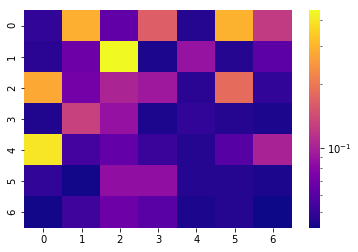

[[0.049 0.291 0.064 0.164 0.046 0.298 0.124]
 [0.047 0.069 0.443 0.044 0.089 0.046 0.062]
 [0.278 0.071 0.103 0.093 0.047 0.182 0.049]
 [0.045 0.13  0.088 0.044 0.049 0.046 0.044]
 [0.398 0.054 0.065 0.051 0.046 0.06  0.101]
 [0.049 0.043 0.086 0.086 0.046 0.046 0.044]
 [0.043 0.052 0.069 0.061 0.044 0.046 0.042]]


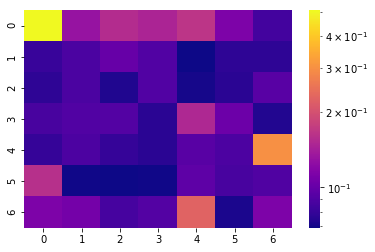

[[0.507 0.13  0.156 0.147 0.166 0.113 0.085]
 [0.081 0.088 0.101 0.091 0.069 0.077 0.077]
 [0.077 0.088 0.073 0.091 0.071 0.076 0.094]
 [0.087 0.091 0.092 0.076 0.151 0.104 0.074]
 [0.08  0.089 0.08  0.076 0.094 0.089 0.299]
 [0.16  0.07  0.069 0.07  0.097 0.087 0.09 ]
 [0.113 0.108 0.086 0.092 0.226 0.072 0.113]]


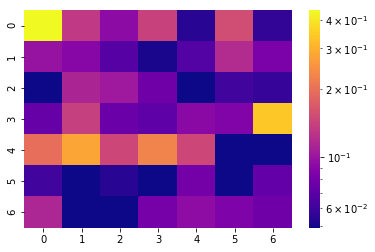

[[0.441 0.132 0.093 0.141 0.054 0.154 0.057]
 [0.099 0.09  0.068 0.051 0.067 0.119 0.084]
 [0.049 0.113 0.104 0.078 0.049 0.061 0.058]
 [0.074 0.139 0.076 0.071 0.091 0.086 0.343]
 [0.196 0.281 0.147 0.226 0.147 0.049 0.049]
 [0.061 0.049 0.054 0.049 0.08  0.049 0.073]
 [0.114 0.049 0.049 0.082 0.094 0.085 0.078]]


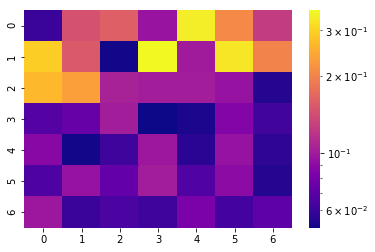

[[0.06  0.145 0.159 0.096 0.342 0.206 0.126]
 [0.294 0.154 0.052 0.359 0.1   0.328 0.2  ]
 [0.265 0.233 0.105 0.102 0.102 0.095 0.055]
 [0.068 0.074 0.102 0.051 0.053 0.086 0.062]
 [0.088 0.052 0.061 0.098 0.056 0.095 0.057]
 [0.066 0.095 0.073 0.102 0.067 0.09  0.055]
 [0.098 0.06  0.065 0.061 0.082 0.063 0.071]]


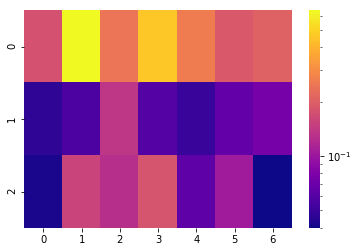

[[0.178 0.641 0.246 0.468 0.261 0.189 0.204]
 [0.047 0.057 0.137 0.06  0.05  0.066 0.076]
 [0.042 0.156 0.128 0.181 0.064 0.104 0.04 ]]


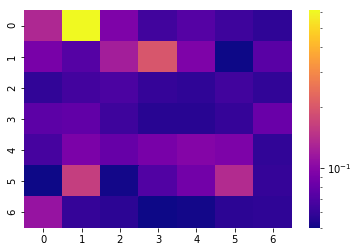

[[0.134 0.612 0.094 0.064 0.072 0.063 0.058]
 [0.09  0.072 0.122 0.2   0.094 0.05  0.074]
 [0.059 0.065 0.068 0.06  0.058 0.064 0.059]
 [0.076 0.078 0.063 0.056 0.056 0.06  0.082]
 [0.066 0.092 0.08  0.09  0.098 0.093 0.059]
 [0.05  0.162 0.051 0.071 0.087 0.137 0.06 ]
 [0.111 0.06  0.057 0.05  0.051 0.057 0.058]]


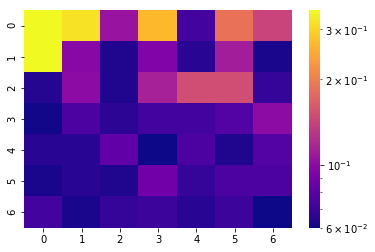

[[0.35  0.319 0.106 0.266 0.072 0.186 0.142]
 [0.349 0.098 0.063 0.094 0.065 0.112 0.062]
 [0.064 0.1   0.063 0.114 0.151 0.151 0.068]
 [0.061 0.075 0.066 0.072 0.072 0.077 0.1  ]
 [0.065 0.065 0.082 0.06  0.075 0.063 0.077]
 [0.062 0.065 0.063 0.088 0.068 0.075 0.075]
 [0.072 0.062 0.068 0.07  0.065 0.07  0.06 ]]


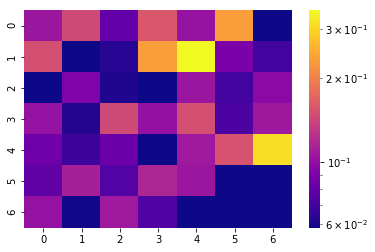

[[0.105 0.145 0.081 0.158 0.103 0.234 0.058]
 [0.15  0.058 0.063 0.233 0.349 0.089 0.07 ]
 [0.058 0.091 0.061 0.058 0.105 0.07  0.097]
 [0.102 0.062 0.145 0.101 0.15  0.073 0.106]
 [0.085 0.068 0.084 0.058 0.107 0.153 0.314]
 [0.079 0.111 0.075 0.116 0.105 0.058 0.058]
 [0.102 0.059 0.107 0.074 0.058 0.058 0.058]]
SKIPPPPPPEDDDD


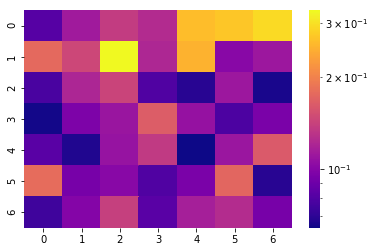

[[0.082 0.113 0.137 0.124 0.261 0.271 0.294]
 [0.176 0.146 0.33  0.121 0.249 0.101 0.111]
 [0.078 0.12  0.143 0.08  0.069 0.111 0.066]
 [0.065 0.096 0.109 0.165 0.107 0.079 0.095]
 [0.083 0.067 0.108 0.135 0.064 0.11  0.162]
 [0.179 0.094 0.101 0.08  0.095 0.173 0.069]
 [0.075 0.099 0.139 0.083 0.116 0.125 0.094]]


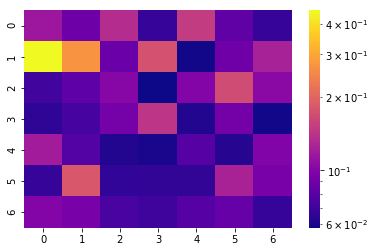

[[0.115 0.089 0.134 0.068 0.151 0.083 0.068]
 [0.455 0.27  0.088 0.176 0.059 0.09  0.124]
 [0.071 0.082 0.102 0.058 0.1   0.169 0.104]
 [0.065 0.073 0.093 0.143 0.062 0.092 0.059]
 [0.119 0.078 0.062 0.06  0.079 0.063 0.098]
 [0.068 0.183 0.066 0.067 0.067 0.125 0.094]
 [0.101 0.094 0.074 0.07  0.079 0.086 0.068]]


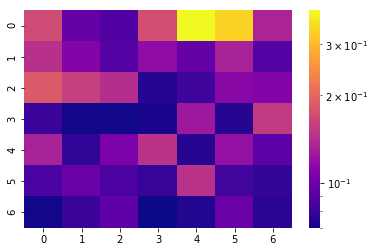

[[0.17  0.097 0.089 0.173 0.393 0.338 0.135]
 [0.145 0.111 0.09  0.117 0.097 0.132 0.09 ]
 [0.185 0.159 0.143 0.075 0.082 0.113 0.111]
 [0.081 0.071 0.071 0.072 0.125 0.075 0.155]
 [0.132 0.078 0.106 0.147 0.075 0.12  0.093]
 [0.086 0.099 0.087 0.08  0.146 0.083 0.079]
 [0.071 0.081 0.094 0.07  0.074 0.099 0.076]]


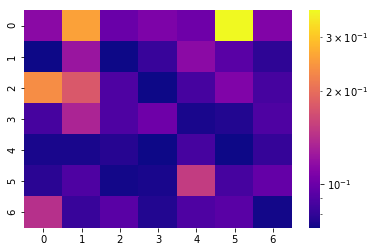

[[0.114 0.257 0.099 0.108 0.101 0.365 0.11 ]
 [0.072 0.122 0.072 0.082 0.115 0.093 0.079]
 [0.235 0.179 0.089 0.072 0.086 0.109 0.086]
 [0.086 0.134 0.089 0.101 0.074 0.076 0.089]
 [0.074 0.074 0.077 0.072 0.086 0.072 0.081]
 [0.078 0.089 0.073 0.074 0.153 0.086 0.097]
 [0.142 0.082 0.093 0.076 0.089 0.093 0.073]]
SKIPPPPPPEDDDD


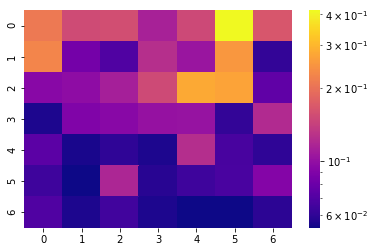

[[0.209 0.153 0.157 0.113 0.15  0.416 0.165]
 [0.227 0.084 0.07  0.125 0.104 0.251 0.061]
 [0.094 0.097 0.112 0.152 0.28  0.271 0.076]
 [0.056 0.09  0.094 0.101 0.102 0.061 0.121]
 [0.074 0.055 0.06  0.056 0.124 0.067 0.06 ]
 [0.064 0.053 0.117 0.058 0.064 0.068 0.092]
 [0.07  0.056 0.065 0.056 0.053 0.053 0.059]]


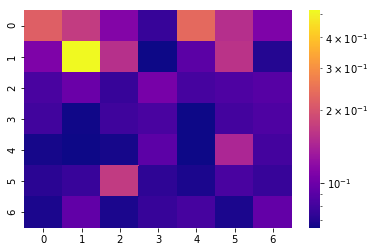

[[0.218 0.17  0.112 0.076 0.234 0.154 0.11 ]
 [0.11  0.518 0.156 0.065 0.091 0.159 0.07 ]
 [0.083 0.099 0.076 0.105 0.082 0.085 0.089]
 [0.08  0.066 0.079 0.083 0.065 0.081 0.085]
 [0.067 0.065 0.067 0.092 0.065 0.144 0.081]
 [0.072 0.077 0.169 0.073 0.068 0.083 0.076]
 [0.068 0.094 0.068 0.076 0.082 0.068 0.095]]


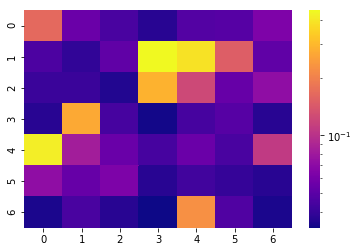

[[0.165 0.056 0.045 0.037 0.048 0.049 0.064]
 [0.046 0.039 0.052 0.449 0.39  0.15  0.052]
 [0.041 0.041 0.036 0.287 0.124 0.054 0.072]
 [0.037 0.271 0.044 0.034 0.044 0.049 0.037]
 [0.421 0.083 0.055 0.044 0.056 0.045 0.108]
 [0.072 0.054 0.063 0.037 0.043 0.04  0.037]
 [0.035 0.045 0.037 0.033 0.225 0.047 0.035]]


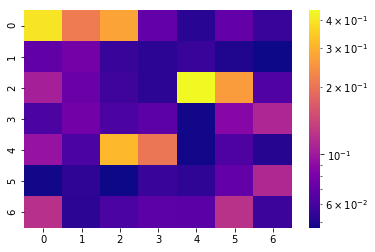

[[0.394 0.214 0.276 0.071 0.052 0.071 0.056]
 [0.07  0.078 0.056 0.053 0.056 0.05  0.047]
 [0.106 0.074 0.058 0.053 0.441 0.264 0.064]
 [0.062 0.077 0.062 0.068 0.048 0.086 0.111]
 [0.096 0.062 0.311 0.206 0.048 0.063 0.051]
 [0.048 0.054 0.047 0.056 0.054 0.071 0.113]
 [0.121 0.053 0.062 0.068 0.067 0.122 0.057]]


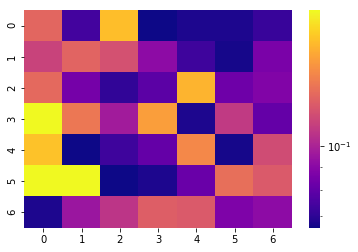

[[0.129 0.074 0.171 0.066 0.068 0.068 0.072]
 [0.113 0.128 0.119 0.091 0.073 0.067 0.086]
 [0.13  0.085 0.071 0.079 0.166 0.083 0.088]
 [0.199 0.137 0.097 0.155 0.068 0.109 0.081]
 [0.172 0.066 0.073 0.081 0.145 0.067 0.117]
 [0.199 0.199 0.066 0.068 0.082 0.133 0.123]
 [0.068 0.095 0.107 0.125 0.123 0.087 0.091]]


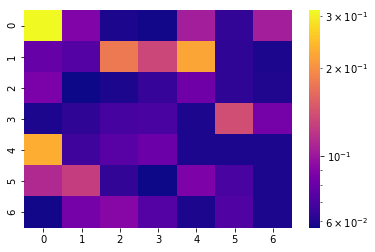

[[0.314 0.088 0.059 0.058 0.105 0.064 0.105]
 [0.079 0.073 0.178 0.133 0.221 0.063 0.059]
 [0.086 0.057 0.059 0.065 0.082 0.063 0.06 ]
 [0.059 0.063 0.069 0.07  0.059 0.139 0.084]
 [0.231 0.067 0.074 0.081 0.059 0.059 0.059]
 [0.112 0.127 0.064 0.057 0.087 0.07  0.059]
 [0.058 0.084 0.091 0.073 0.059 0.072 0.059]]


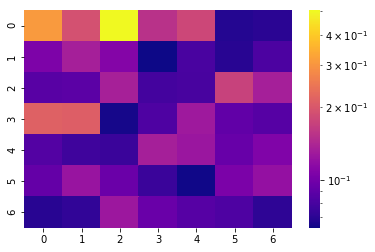

[[0.309 0.191 0.505 0.154 0.179 0.068 0.07 ]
 [0.106 0.134 0.11  0.063 0.081 0.069 0.082]
 [0.087 0.088 0.135 0.079 0.08  0.172 0.134]
 [0.214 0.21  0.065 0.083 0.128 0.091 0.086]
 [0.085 0.077 0.075 0.134 0.125 0.094 0.107]
 [0.093 0.123 0.096 0.075 0.064 0.105 0.12 ]
 [0.069 0.072 0.126 0.095 0.086 0.083 0.071]]


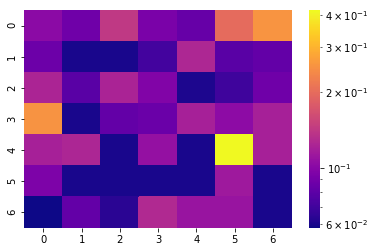

[[0.102 0.088 0.141 0.093 0.084 0.198 0.254]
 [0.087 0.06  0.06  0.071 0.125 0.079 0.083]
 [0.123 0.079 0.122 0.097 0.061 0.07  0.088]
 [0.253 0.06  0.083 0.086 0.119 0.103 0.119]
 [0.119 0.124 0.06  0.107 0.06  0.418 0.119]
 [0.095 0.06  0.06  0.06  0.06  0.114 0.06 ]
 [0.058 0.083 0.064 0.127 0.11  0.11  0.06 ]]


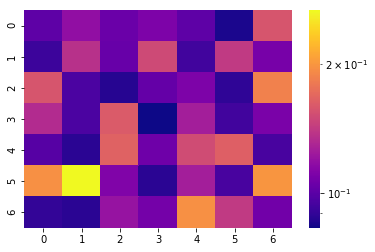

[[0.101 0.118 0.105 0.111 0.101 0.085 0.157]
 [0.092 0.136 0.104 0.15  0.093 0.141 0.109]
 [0.157 0.096 0.087 0.103 0.111 0.089 0.186]
 [0.133 0.096 0.161 0.083 0.126 0.093 0.11 ]
 [0.099 0.088 0.165 0.106 0.152 0.164 0.095]
 [0.196 0.266 0.112 0.088 0.126 0.095 0.199]
 [0.09  0.088 0.12  0.108 0.196 0.141 0.107]]


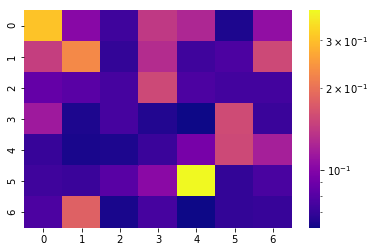

[[0.307 0.102 0.073 0.14  0.125 0.064 0.107]
 [0.146 0.229 0.069 0.13  0.073 0.077 0.155]
 [0.086 0.082 0.075 0.155 0.077 0.074 0.074]
 [0.115 0.064 0.075 0.065 0.061 0.158 0.071]
 [0.07  0.063 0.064 0.071 0.094 0.155 0.119]
 [0.073 0.071 0.081 0.103 0.387 0.069 0.076]
 [0.077 0.181 0.063 0.075 0.061 0.069 0.07 ]]


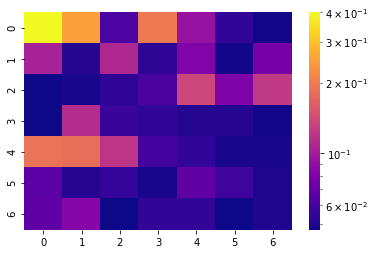

[[0.4   0.249 0.061 0.198 0.093 0.054 0.048]
 [0.104 0.051 0.109 0.053 0.081 0.048 0.077]
 [0.047 0.049 0.053 0.06  0.136 0.08  0.123]
 [0.047 0.113 0.056 0.054 0.051 0.051 0.048]
 [0.189 0.183 0.12  0.059 0.054 0.049 0.049]
 [0.067 0.051 0.055 0.049 0.068 0.057 0.05 ]
 [0.068 0.085 0.047 0.054 0.054 0.047 0.05 ]]
SKIPPPPPPEDDDD


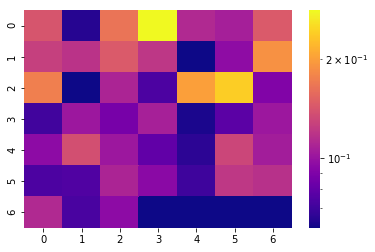

[[0.141 0.065 0.165 0.282 0.112 0.106 0.145]
 [0.126 0.118 0.145 0.12  0.061 0.096 0.189]
 [0.174 0.061 0.109 0.074 0.201 0.241 0.091]
 [0.071 0.102 0.087 0.107 0.063 0.078 0.102]
 [0.095 0.137 0.102 0.08  0.066 0.131 0.105]
 [0.074 0.075 0.109 0.094 0.07  0.121 0.117]
 [0.112 0.073 0.095 0.061 0.061 0.061 0.061]]


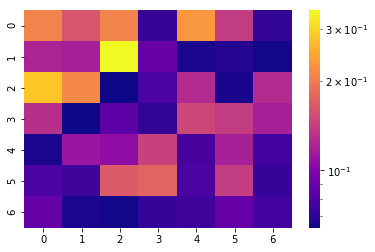

[[0.208 0.163 0.21  0.073 0.23  0.14  0.072]
 [0.122 0.118 0.347 0.088 0.067 0.068 0.065]
 [0.283 0.215 0.064 0.079 0.127 0.066 0.127]
 [0.13  0.064 0.084 0.072 0.15  0.14  0.119]
 [0.067 0.111 0.106 0.145 0.078 0.119 0.076]
 [0.079 0.075 0.168 0.176 0.079 0.14  0.073]
 [0.088 0.067 0.065 0.073 0.075 0.088 0.076]]


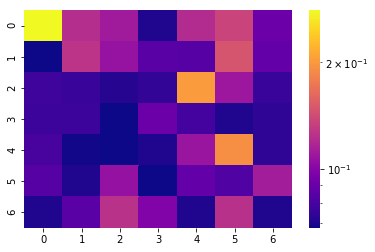

[[0.281 0.122 0.111 0.071 0.121 0.136 0.091]
 [0.068 0.126 0.107 0.085 0.084 0.147 0.088]
 [0.078 0.076 0.072 0.075 0.202 0.109 0.076]
 [0.077 0.077 0.068 0.091 0.079 0.071 0.074]
 [0.08  0.069 0.068 0.071 0.108 0.192 0.074]
 [0.084 0.071 0.106 0.068 0.088 0.083 0.112]
 [0.071 0.085 0.125 0.098 0.071 0.124 0.071]]


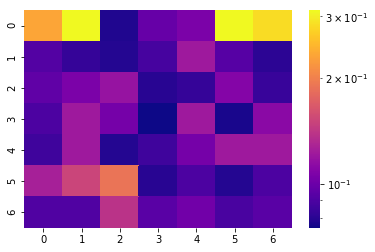

[[0.233 0.312 0.078 0.098 0.106 0.311 0.283]
 [0.092 0.083 0.079 0.088 0.122 0.093 0.081]
 [0.096 0.106 0.118 0.08  0.083 0.11  0.084]
 [0.09  0.122 0.104 0.075 0.122 0.077 0.112]
 [0.086 0.122 0.079 0.086 0.104 0.122 0.122]
 [0.126 0.152 0.19  0.08  0.09  0.079 0.09 ]
 [0.091 0.091 0.139 0.094 0.102 0.089 0.094]]


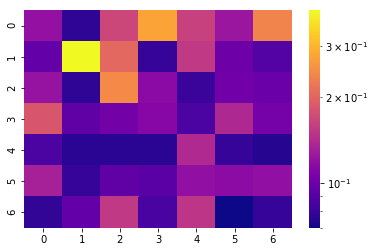

[[0.12  0.078 0.166 0.278 0.161 0.124 0.235]
 [0.097 0.399 0.203 0.08  0.153 0.101 0.09 ]
 [0.122 0.078 0.244 0.115 0.081 0.102 0.099]
 [0.183 0.095 0.103 0.113 0.087 0.139 0.104]
 [0.087 0.076 0.076 0.076 0.14  0.08  0.075]
 [0.132 0.08  0.095 0.092 0.119 0.116 0.119]
 [0.079 0.096 0.153 0.086 0.15  0.07  0.08 ]]


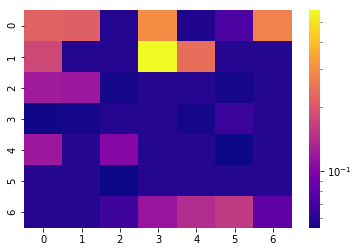

[[0.218 0.213 0.059 0.299 0.058 0.072 0.275]
 [0.178 0.059 0.059 0.566 0.238 0.059 0.059]
 [0.122 0.118 0.056 0.059 0.059 0.056 0.059]
 [0.055 0.056 0.059 0.059 0.056 0.066 0.059]
 [0.118 0.059 0.103 0.059 0.059 0.054 0.059]
 [0.059 0.059 0.054 0.059 0.059 0.059 0.059]
 [0.059 0.059 0.067 0.115 0.14  0.158 0.081]]


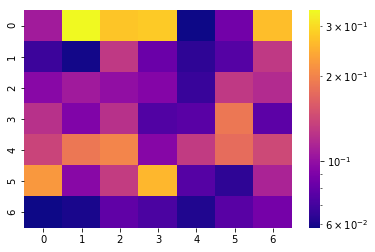

[[0.108 0.341 0.274 0.28  0.058 0.086 0.266]
 [0.068 0.059 0.129 0.083 0.064 0.075 0.129]
 [0.095 0.107 0.099 0.093 0.067 0.129 0.119]
 [0.123 0.091 0.123 0.074 0.077 0.187 0.078]
 [0.138 0.187 0.202 0.094 0.131 0.176 0.142]
 [0.223 0.095 0.132 0.257 0.075 0.064 0.113]
 [0.058 0.06  0.079 0.072 0.061 0.076 0.087]]


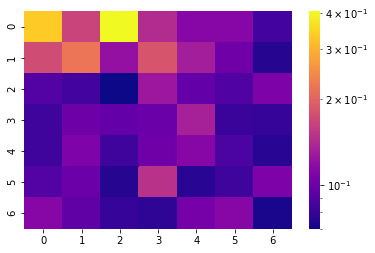

[[0.333 0.166 0.405 0.142 0.113 0.113 0.084]
 [0.174 0.221 0.121 0.184 0.131 0.102 0.075]
 [0.09  0.084 0.07  0.126 0.096 0.089 0.108]
 [0.083 0.101 0.097 0.099 0.133 0.081 0.08 ]
 [0.082 0.109 0.083 0.102 0.113 0.087 0.076]
 [0.09  0.1   0.075 0.148 0.076 0.083 0.108]
 [0.113 0.095 0.08  0.078 0.105 0.113 0.072]]
SKIPPPPPPEDDDD


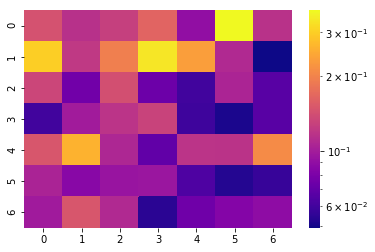

[[0.145 0.115 0.128 0.164 0.09  0.368 0.116]
 [0.3   0.122 0.195 0.336 0.234 0.109 0.049]
 [0.134 0.076 0.142 0.074 0.06  0.106 0.067]
 [0.06  0.099 0.118 0.131 0.059 0.051 0.067]
 [0.149 0.262 0.107 0.07  0.118 0.117 0.21 ]
 [0.105 0.086 0.094 0.095 0.064 0.053 0.057]
 [0.098 0.149 0.109 0.054 0.075 0.084 0.089]]
SKIPPPPPPEDDDD


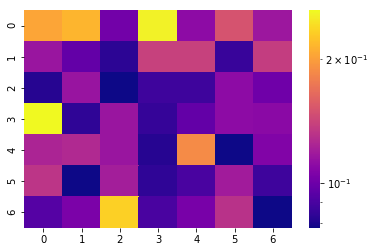

[[0.204 0.215 0.102 0.257 0.111 0.15  0.117]
 [0.116 0.097 0.083 0.139 0.139 0.086 0.137]
 [0.082 0.115 0.078 0.087 0.087 0.111 0.101]
 [0.262 0.084 0.116 0.085 0.097 0.111 0.11 ]
 [0.124 0.126 0.116 0.082 0.187 0.078 0.107]
 [0.133 0.078 0.12  0.084 0.09  0.119 0.087]
 [0.093 0.105 0.233 0.09  0.104 0.131 0.078]]


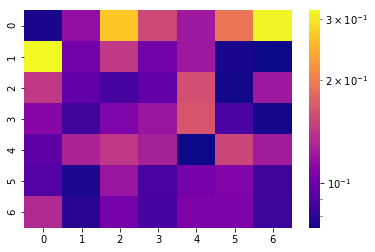

[[0.076 0.115 0.268 0.155 0.122 0.193 0.314]
 [0.318 0.102 0.142 0.102 0.121 0.076 0.074]
 [0.142 0.096 0.087 0.096 0.16  0.075 0.121]
 [0.11  0.085 0.107 0.119 0.165 0.088 0.075]
 [0.095 0.128 0.142 0.126 0.074 0.153 0.123]
 [0.091 0.077 0.119 0.088 0.104 0.108 0.085]
 [0.132 0.079 0.103 0.087 0.106 0.106 0.084]]


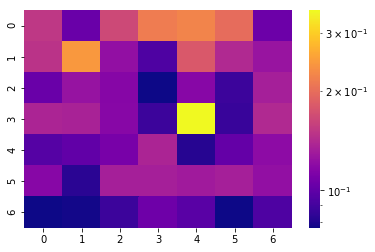

[[0.152 0.104 0.166 0.216 0.224 0.2   0.105]
 [0.148 0.244 0.123 0.094 0.181 0.141 0.126]
 [0.104 0.125 0.116 0.077 0.117 0.088 0.133]
 [0.137 0.136 0.117 0.088 0.352 0.087 0.141]
 [0.096 0.101 0.11  0.137 0.082 0.102 0.12 ]
 [0.117 0.083 0.133 0.133 0.13  0.133 0.123]
 [0.077 0.078 0.088 0.106 0.098 0.077 0.094]]


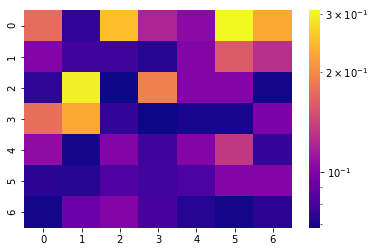

[[0.175 0.075 0.247 0.121 0.105 0.307 0.23 ]
 [0.101 0.078 0.078 0.072 0.101 0.161 0.128]
 [0.074 0.298 0.068 0.192 0.101 0.101 0.069]
 [0.178 0.23  0.075 0.068 0.07  0.07  0.098]
 [0.106 0.069 0.102 0.078 0.101 0.135 0.076]
 [0.073 0.072 0.083 0.079 0.082 0.101 0.101]
 [0.069 0.092 0.101 0.081 0.072 0.069 0.073]]


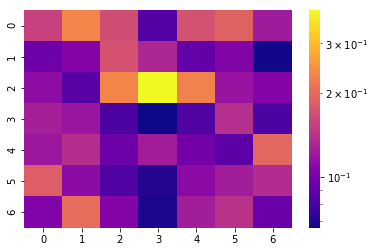

[[0.155 0.233 0.167 0.086 0.171 0.19  0.122]
 [0.096 0.106 0.172 0.132 0.091 0.105 0.067]
 [0.112 0.087 0.233 0.393 0.228 0.117 0.106]
 [0.126 0.118 0.083 0.066 0.084 0.139 0.082]
 [0.12  0.138 0.096 0.123 0.098 0.089 0.196]
 [0.186 0.111 0.084 0.071 0.11  0.124 0.136]
 [0.104 0.202 0.106 0.069 0.124 0.142 0.095]]


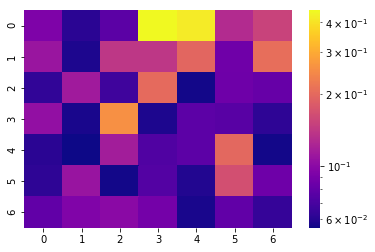

[[0.093 0.061 0.077 0.449 0.418 0.129 0.153]
 [0.109 0.058 0.14  0.14  0.197 0.086 0.207]
 [0.063 0.114 0.067 0.202 0.056 0.085 0.082]
 [0.105 0.057 0.258 0.058 0.078 0.076 0.062]
 [0.061 0.055 0.116 0.073 0.078 0.199 0.056]
 [0.062 0.108 0.056 0.074 0.059 0.167 0.085]
 [0.08  0.094 0.1   0.088 0.057 0.08  0.064]]


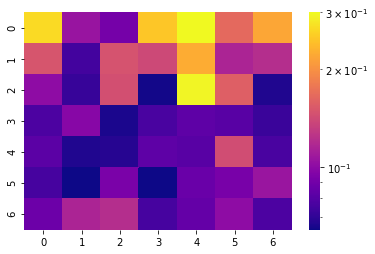

[[0.268 0.105 0.091 0.25  0.3   0.166 0.22 ]
 [0.149 0.075 0.148 0.14  0.225 0.115 0.121]
 [0.101 0.072 0.145 0.065 0.295 0.158 0.067]
 [0.078 0.098 0.066 0.077 0.083 0.081 0.073]
 [0.082 0.067 0.068 0.083 0.081 0.143 0.077]
 [0.076 0.064 0.093 0.064 0.087 0.092 0.106]
 [0.088 0.115 0.121 0.076 0.085 0.101 0.078]]


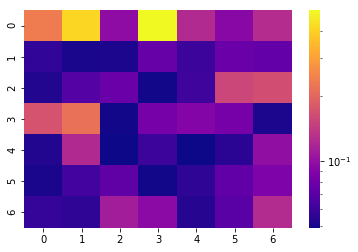

[[0.235 0.413 0.097 0.497 0.124 0.094 0.126]
 [0.057 0.051 0.052 0.076 0.06  0.078 0.075]
 [0.053 0.069 0.078 0.05  0.061 0.156 0.166]
 [0.172 0.217 0.05  0.084 0.09  0.084 0.052]
 [0.053 0.123 0.049 0.06  0.049 0.055 0.099]
 [0.051 0.062 0.073 0.05  0.056 0.074 0.088]
 [0.058 0.056 0.111 0.095 0.054 0.071 0.125]]


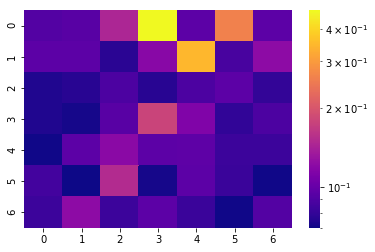

[[0.092 0.094 0.146 0.469 0.096 0.261 0.096]
 [0.096 0.096 0.077 0.119 0.346 0.087 0.122]
 [0.074 0.076 0.089 0.076 0.089 0.096 0.08 ]
 [0.074 0.072 0.094 0.178 0.114 0.079 0.089]
 [0.071 0.096 0.12  0.096 0.097 0.083 0.083]
 [0.085 0.07  0.151 0.072 0.096 0.082 0.071]
 [0.083 0.122 0.083 0.096 0.082 0.071 0.092]]


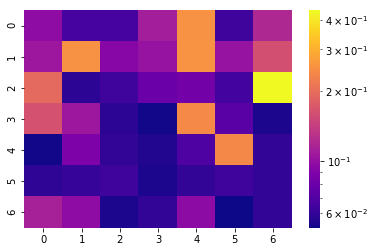

[[0.098 0.066 0.066 0.112 0.252 0.063 0.12 ]
 [0.106 0.252 0.094 0.103 0.255 0.103 0.161]
 [0.194 0.058 0.063 0.079 0.083 0.065 0.44 ]
 [0.164 0.106 0.058 0.053 0.24  0.073 0.055]
 [0.053 0.088 0.06  0.056 0.069 0.238 0.06 ]
 [0.059 0.061 0.063 0.055 0.06  0.063 0.06 ]
 [0.113 0.098 0.055 0.06  0.097 0.052 0.06 ]]


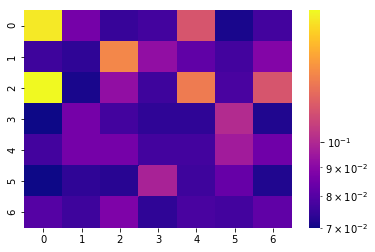

[[0.167 0.086 0.075 0.077 0.115 0.071 0.077]
 [0.076 0.074 0.133 0.092 0.082 0.077 0.089]
 [0.173 0.071 0.092 0.076 0.129 0.078 0.115]
 [0.07  0.086 0.077 0.074 0.074 0.101 0.072]
 [0.077 0.086 0.086 0.077 0.077 0.096 0.085]
 [0.07  0.074 0.073 0.098 0.076 0.083 0.072]
 [0.08  0.076 0.088 0.074 0.078 0.077 0.082]]


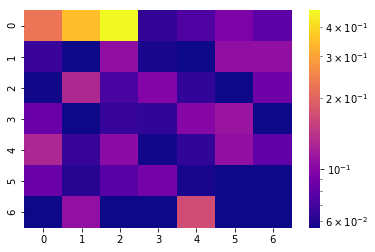

[[0.225 0.347 0.471 0.065 0.074 0.095 0.079]
 [0.067 0.056 0.107 0.058 0.056 0.107 0.107]
 [0.057 0.129 0.072 0.099 0.064 0.056 0.088]
 [0.086 0.056 0.066 0.064 0.101 0.112 0.056]
 [0.127 0.066 0.104 0.057 0.064 0.107 0.082]
 [0.085 0.061 0.078 0.091 0.058 0.056 0.056]
 [0.056 0.108 0.056 0.056 0.169 0.056 0.056]]


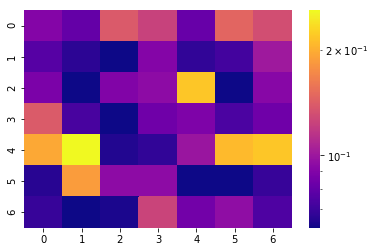

[[0.091 0.081 0.139 0.124 0.082 0.147 0.132]
 [0.077 0.067 0.062 0.091 0.068 0.072 0.101]
 [0.088 0.062 0.09  0.094 0.219 0.062 0.092]
 [0.14  0.073 0.062 0.084 0.089 0.074 0.084]
 [0.196 0.26  0.065 0.068 0.099 0.209 0.219]
 [0.066 0.187 0.094 0.094 0.062 0.062 0.069]
 [0.069 0.062 0.064 0.125 0.085 0.095 0.075]]


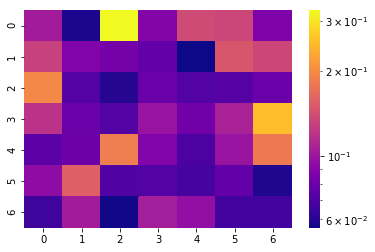

[[0.104 0.058 0.326 0.089 0.138 0.135 0.087]
 [0.13  0.088 0.084 0.077 0.056 0.148 0.136]
 [0.197 0.072 0.06  0.079 0.072 0.073 0.079]
 [0.12  0.079 0.072 0.099 0.082 0.108 0.253]
 [0.075 0.081 0.186 0.088 0.07  0.099 0.181]
 [0.094 0.157 0.071 0.072 0.068 0.077 0.059]
 [0.066 0.104 0.057 0.105 0.096 0.067 0.067]]


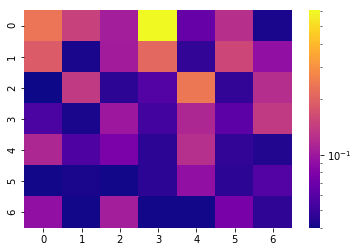

[[0.236 0.149 0.106 0.607 0.067 0.125 0.042]
 [0.189 0.042 0.103 0.21  0.048 0.156 0.092]
 [0.04  0.138 0.046 0.059 0.242 0.048 0.123]
 [0.056 0.042 0.099 0.053 0.115 0.062 0.138]
 [0.115 0.057 0.078 0.046 0.124 0.048 0.044]
 [0.041 0.042 0.041 0.046 0.092 0.046 0.059]
 [0.092 0.041 0.106 0.041 0.041 0.076 0.047]]


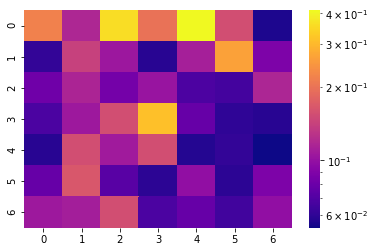

[[0.22  0.118 0.362 0.2   0.412 0.156 0.056]
 [0.061 0.141 0.105 0.058 0.111 0.265 0.088]
 [0.082 0.116 0.084 0.103 0.069 0.066 0.117]
 [0.068 0.106 0.156 0.313 0.078 0.06  0.058]
 [0.058 0.156 0.108 0.156 0.057 0.061 0.053]
 [0.078 0.166 0.073 0.059 0.099 0.059 0.088]
 [0.106 0.11  0.156 0.068 0.078 0.065 0.099]]


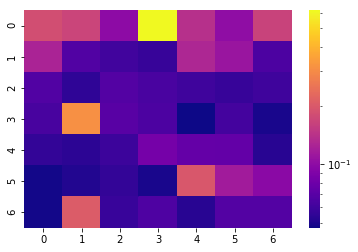

[[0.182 0.168 0.1   0.619 0.139 0.102 0.165]
 [0.124 0.067 0.061 0.057 0.128 0.109 0.065]
 [0.067 0.055 0.068 0.064 0.06  0.057 0.06 ]
 [0.063 0.314 0.07  0.065 0.047 0.062 0.049]
 [0.056 0.054 0.059 0.085 0.076 0.075 0.053]
 [0.048 0.051 0.056 0.049 0.198 0.116 0.098]
 [0.048 0.205 0.058 0.066 0.053 0.068 0.068]]


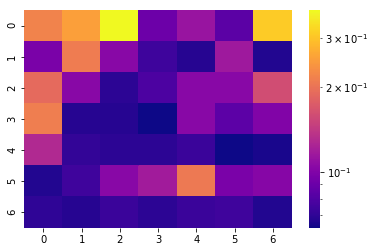

[[0.219 0.254 0.376 0.091 0.112 0.084 0.311]
 [0.097 0.212 0.104 0.074 0.068 0.116 0.067]
 [0.191 0.104 0.069 0.079 0.104 0.104 0.16 ]
 [0.213 0.068 0.068 0.063 0.104 0.085 0.1  ]
 [0.128 0.071 0.069 0.069 0.073 0.063 0.065]
 [0.067 0.075 0.104 0.118 0.207 0.097 0.102]
 [0.07  0.068 0.073 0.069 0.073 0.075 0.067]]


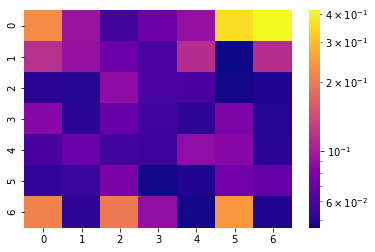

[[0.225 0.094 0.057 0.073 0.091 0.359 0.413]
 [0.115 0.092 0.072 0.06  0.113 0.046 0.114]
 [0.051 0.05  0.088 0.06  0.059 0.047 0.049]
 [0.084 0.051 0.07  0.057 0.052 0.08  0.05 ]
 [0.059 0.071 0.057 0.056 0.089 0.084 0.051]
 [0.053 0.055 0.078 0.047 0.049 0.074 0.069]
 [0.213 0.052 0.199 0.09  0.047 0.241 0.049]]


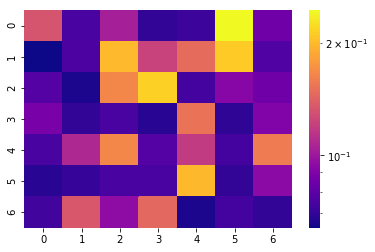

[[0.133 0.075 0.104 0.07  0.072 0.244 0.085]
 [0.064 0.076 0.199 0.123 0.147 0.21  0.077]
 [0.078 0.066 0.165 0.215 0.074 0.092 0.085]
 [0.088 0.07  0.075 0.068 0.152 0.069 0.09 ]
 [0.075 0.108 0.165 0.078 0.118 0.074 0.158]
 [0.068 0.071 0.075 0.075 0.198 0.07  0.094]
 [0.073 0.135 0.095 0.145 0.066 0.074 0.07 ]]


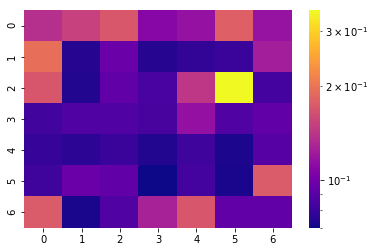

[[0.137 0.151 0.171 0.109 0.116 0.179 0.117]
 [0.194 0.075 0.097 0.075 0.078 0.08  0.124]
 [0.17  0.074 0.093 0.085 0.143 0.349 0.083]
 [0.082 0.087 0.087 0.084 0.115 0.087 0.093]
 [0.079 0.076 0.08  0.074 0.081 0.073 0.089]
 [0.081 0.097 0.093 0.07  0.083 0.072 0.174]
 [0.174 0.072 0.087 0.127 0.17  0.093 0.093]]


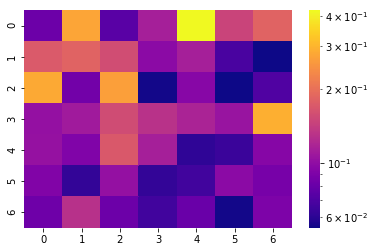

[[0.082 0.277 0.075 0.113 0.421 0.148 0.184]
 [0.172 0.184 0.158 0.097 0.113 0.069 0.054]
 [0.282 0.085 0.268 0.055 0.095 0.054 0.071]
 [0.102 0.11  0.156 0.13  0.117 0.105 0.293]
 [0.103 0.091 0.171 0.113 0.061 0.064 0.094]
 [0.092 0.062 0.102 0.062 0.066 0.097 0.087]
 [0.083 0.129 0.082 0.066 0.081 0.055 0.09 ]]


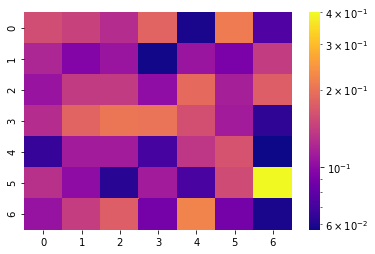

[[0.158 0.146 0.126 0.184 0.059 0.212 0.074]
 [0.121 0.095 0.108 0.058 0.108 0.091 0.14 ]
 [0.107 0.139 0.139 0.102 0.191 0.115 0.177]
 [0.126 0.184 0.206 0.202 0.16  0.113 0.064]
 [0.066 0.113 0.113 0.071 0.135 0.164 0.057]
 [0.13  0.101 0.062 0.113 0.072 0.155 0.4  ]
 [0.106 0.142 0.176 0.089 0.222 0.089 0.059]]


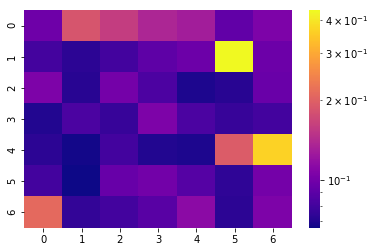

[[0.098 0.185 0.159 0.136 0.128 0.092 0.105]
 [0.081 0.073 0.08  0.091 0.097 0.433 0.097]
 [0.105 0.072 0.101 0.084 0.069 0.072 0.096]
 [0.07  0.083 0.076 0.105 0.083 0.076 0.08 ]
 [0.073 0.067 0.08  0.07  0.069 0.194 0.363]
 [0.08  0.066 0.095 0.1   0.087 0.074 0.101]
 [0.21  0.075 0.08  0.088 0.113 0.073 0.105]]


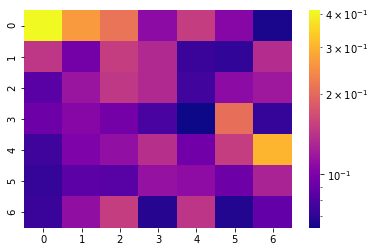

[[0.413 0.264 0.214 0.109 0.151 0.105 0.065]
 [0.145 0.096 0.151 0.133 0.074 0.071 0.136]
 [0.085 0.116 0.146 0.133 0.076 0.109 0.119]
 [0.093 0.106 0.096 0.079 0.063 0.208 0.072]
 [0.075 0.101 0.112 0.139 0.095 0.151 0.302]
 [0.072 0.086 0.084 0.114 0.11  0.093 0.128]
 [0.074 0.111 0.151 0.068 0.144 0.067 0.089]]


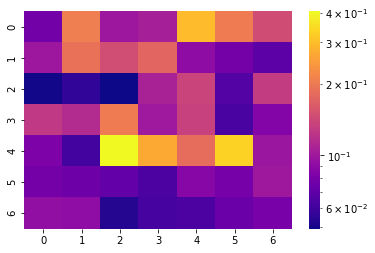

[[0.078 0.206 0.099 0.105 0.297 0.203 0.146]
 [0.099 0.19  0.148 0.175 0.091 0.079 0.069]
 [0.05  0.056 0.049 0.108 0.138 0.066 0.13 ]
 [0.127 0.115 0.203 0.101 0.135 0.063 0.086]
 [0.083 0.061 0.405 0.269 0.184 0.333 0.098]
 [0.079 0.076 0.072 0.064 0.087 0.08  0.1  ]
 [0.094 0.092 0.053 0.062 0.064 0.075 0.081]]


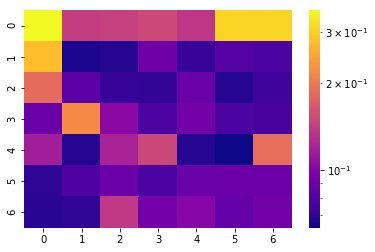

[[0.355 0.141 0.143 0.151 0.136 0.308 0.306]
 [0.279 0.066 0.067 0.091 0.072 0.081 0.078]
 [0.185 0.084 0.072 0.071 0.089 0.067 0.074]
 [0.089 0.219 0.103 0.078 0.092 0.078 0.077]
 [0.116 0.067 0.12  0.149 0.067 0.063 0.188]
 [0.07  0.079 0.089 0.078 0.089 0.09  0.09 ]
 [0.068 0.07  0.137 0.093 0.101 0.087 0.092]]
SKIPPPPPPEDDDD


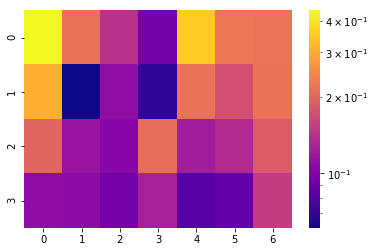

[[0.439 0.216 0.142 0.096 0.353 0.226 0.221]
 [0.309 0.061 0.11  0.068 0.219 0.174 0.219]
 [0.203 0.115 0.105 0.21  0.123 0.134 0.189]
 [0.109 0.108 0.095 0.125 0.082 0.088 0.152]]


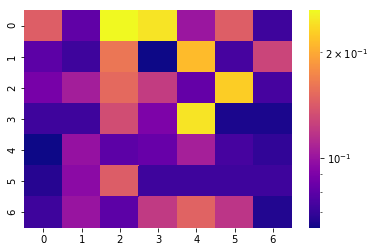

[[0.145 0.081 0.264 0.246 0.101 0.145 0.072]
 [0.08  0.072 0.162 0.063 0.214 0.074 0.128]
 [0.088 0.105 0.152 0.122 0.082 0.227 0.074]
 [0.072 0.072 0.133 0.09  0.246 0.065 0.065]
 [0.063 0.099 0.08  0.083 0.106 0.074 0.069]
 [0.067 0.095 0.144 0.072 0.072 0.072 0.072]
 [0.072 0.1   0.08  0.121 0.148 0.118 0.066]]


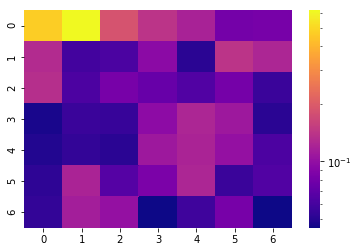

[[0.471 0.616 0.185 0.14  0.119 0.081 0.083]
 [0.129 0.059 0.062 0.095 0.051 0.14  0.123]
 [0.134 0.063 0.083 0.075 0.065 0.082 0.056]
 [0.047 0.056 0.055 0.096 0.123 0.109 0.051]
 [0.049 0.054 0.051 0.109 0.121 0.101 0.063]
 [0.052 0.121 0.066 0.085 0.123 0.056 0.065]
 [0.054 0.115 0.101 0.045 0.058 0.083 0.045]]


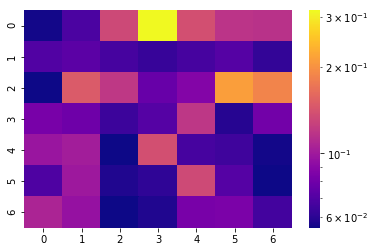

[[0.056 0.068 0.133 0.316 0.139 0.118 0.116]
 [0.07  0.073 0.067 0.063 0.067 0.071 0.062]
 [0.055 0.149 0.12  0.077 0.087 0.214 0.188]
 [0.083 0.079 0.064 0.071 0.119 0.059 0.081]
 [0.097 0.102 0.055 0.139 0.067 0.065 0.056]
 [0.069 0.099 0.058 0.061 0.134 0.071 0.055]
 [0.107 0.095 0.055 0.058 0.083 0.084 0.066]]


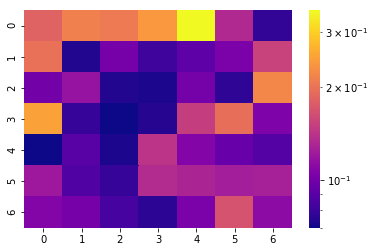

[[0.183 0.214 0.207 0.24  0.353 0.133 0.078]
 [0.198 0.074 0.102 0.081 0.092 0.103 0.154]
 [0.1   0.117 0.074 0.073 0.101 0.077 0.22 ]
 [0.248 0.079 0.07  0.075 0.15  0.195 0.105]
 [0.07  0.09  0.073 0.142 0.107 0.096 0.089]
 [0.121 0.087 0.079 0.135 0.13  0.125 0.126]
 [0.108 0.102 0.084 0.076 0.103 0.168 0.112]]


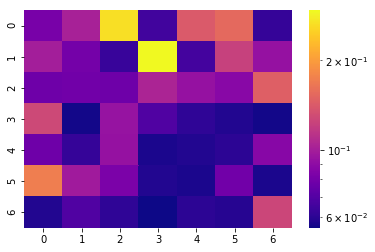

[[0.082 0.102 0.266 0.065 0.142 0.154 0.062]
 [0.1   0.08  0.063 0.294 0.066 0.123 0.093]
 [0.078 0.079 0.078 0.104 0.093 0.088 0.146]
 [0.128 0.056 0.094 0.069 0.061 0.058 0.056]
 [0.078 0.062 0.093 0.057 0.058 0.06  0.087]
 [0.172 0.098 0.083 0.058 0.057 0.079 0.057]
 [0.058 0.069 0.061 0.055 0.06  0.059 0.127]]
SKIPPPPPPEDDDD


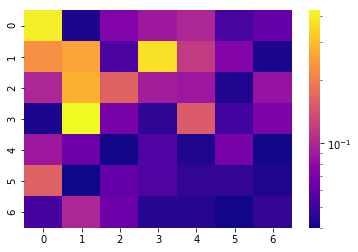

[[0.398 0.042 0.073 0.089 0.099 0.053 0.062]
 [0.228 0.256 0.054 0.372 0.118 0.075 0.042]
 [0.099 0.282 0.162 0.092 0.088 0.043 0.085]
 [0.042 0.424 0.07  0.046 0.154 0.051 0.072]
 [0.088 0.065 0.041 0.055 0.043 0.07  0.041]
 [0.161 0.04  0.062 0.055 0.047 0.047 0.043]
 [0.052 0.099 0.065 0.044 0.044 0.041 0.047]]


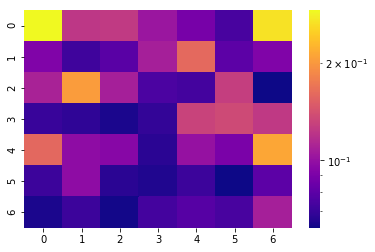

[[0.29  0.123 0.125 0.103 0.089 0.074 0.267]
 [0.092 0.072 0.079 0.108 0.16  0.08  0.092]
 [0.11  0.204 0.108 0.075 0.073 0.128 0.062]
 [0.07  0.068 0.064 0.069 0.131 0.136 0.124]
 [0.159 0.098 0.095 0.067 0.101 0.09  0.212]
 [0.071 0.098 0.067 0.065 0.071 0.062 0.08 ]
 [0.064 0.071 0.063 0.073 0.078 0.074 0.108]]


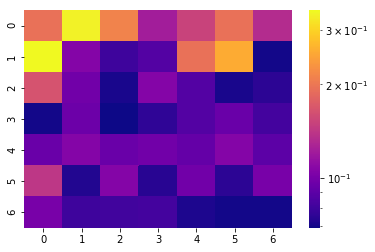

[[0.195 0.336 0.213 0.122 0.151 0.195 0.133]
 [0.346 0.106 0.08  0.087 0.195 0.255 0.07 ]
 [0.165 0.098 0.071 0.106 0.087 0.071 0.075]
 [0.07  0.096 0.069 0.076 0.087 0.095 0.082]
 [0.095 0.106 0.095 0.098 0.093 0.106 0.09 ]
 [0.141 0.073 0.106 0.074 0.098 0.075 0.101]
 [0.101 0.08  0.081 0.082 0.072 0.07  0.07 ]]
SKIPPPPPPEDDDD


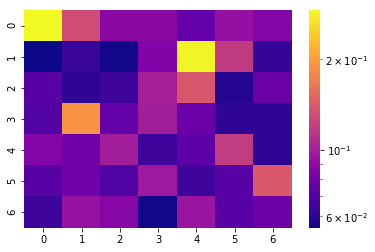

[[0.291 0.13  0.088 0.088 0.075 0.092 0.086]
 [0.055 0.063 0.056 0.084 0.285 0.118 0.062]
 [0.071 0.061 0.064 0.101 0.138 0.059 0.077]
 [0.069 0.19  0.075 0.099 0.077 0.061 0.061]
 [0.086 0.079 0.099 0.064 0.073 0.119 0.061]
 [0.071 0.079 0.069 0.097 0.064 0.071 0.14 ]
 [0.064 0.093 0.087 0.056 0.095 0.071 0.078]]
SKIPPPPPPEDDDD


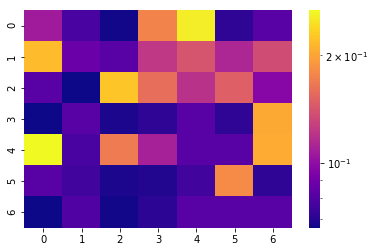

[[0.107 0.078 0.067 0.176 0.258 0.072 0.082]
 [0.217 0.087 0.082 0.123 0.141 0.113 0.136]
 [0.082 0.066 0.225 0.159 0.12  0.149 0.097]
 [0.066 0.082 0.068 0.072 0.082 0.072 0.204]
 [0.267 0.078 0.169 0.11  0.082 0.082 0.205]
 [0.082 0.076 0.068 0.069 0.076 0.181 0.072]
 [0.066 0.08  0.067 0.071 0.082 0.082 0.082]]


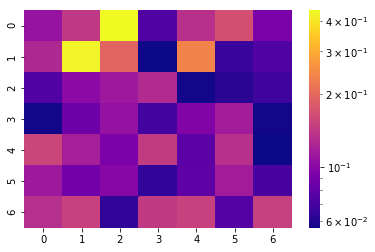

[[0.108 0.141 0.443 0.074 0.135 0.167 0.092]
 [0.126 0.432 0.194 0.056 0.239 0.066 0.074]
 [0.074 0.101 0.113 0.128 0.057 0.062 0.068]
 [0.057 0.086 0.107 0.07  0.096 0.115 0.057]
 [0.156 0.118 0.092 0.145 0.079 0.135 0.056]
 [0.113 0.088 0.099 0.064 0.08  0.115 0.071]
 [0.132 0.151 0.064 0.144 0.151 0.076 0.149]]


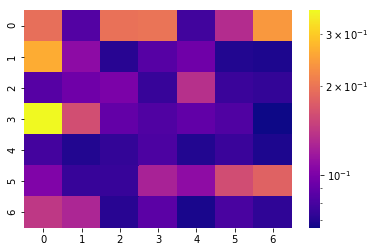

[[0.194 0.084 0.196 0.199 0.078 0.132 0.24 ]
 [0.263 0.108 0.071 0.085 0.095 0.07  0.069]
 [0.085 0.095 0.1   0.075 0.135 0.076 0.074]
 [0.36  0.161 0.09  0.083 0.089 0.083 0.066]
 [0.079 0.07  0.074 0.082 0.07  0.076 0.069]
 [0.102 0.075 0.075 0.124 0.109 0.16  0.18 ]
 [0.141 0.127 0.071 0.087 0.068 0.081 0.073]]


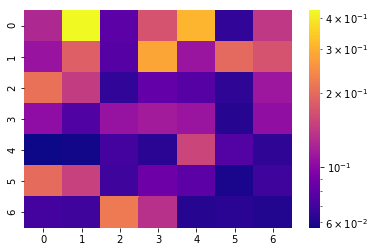

[[0.126 0.429 0.08  0.17  0.306 0.065 0.141]
 [0.109 0.185 0.077 0.283 0.11  0.197 0.17 ]
 [0.209 0.145 0.065 0.083 0.077 0.064 0.112]
 [0.104 0.075 0.108 0.115 0.11  0.062 0.105]
 [0.057 0.058 0.071 0.063 0.155 0.076 0.064]
 [0.2   0.15  0.069 0.087 0.08  0.059 0.069]
 [0.071 0.069 0.22  0.134 0.062 0.063 0.061]]


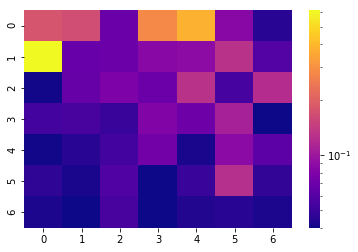

[[0.177 0.167 0.069 0.282 0.381 0.086 0.045]
 [0.614 0.068 0.07  0.086 0.089 0.128 0.059]
 [0.041 0.067 0.079 0.07  0.129 0.054 0.122]
 [0.053 0.055 0.05  0.081 0.071 0.109 0.04 ]
 [0.041 0.045 0.053 0.073 0.042 0.088 0.062]
 [0.047 0.042 0.058 0.04  0.05  0.125 0.048]
 [0.043 0.04  0.055 0.04  0.044 0.045 0.043]]


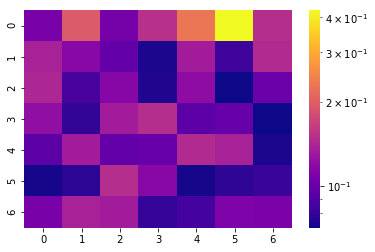

[[0.108 0.196 0.107 0.151 0.23  0.424 0.148]
 [0.137 0.117 0.098 0.074 0.133 0.084 0.145]
 [0.141 0.087 0.116 0.075 0.12  0.071 0.101]
 [0.122 0.08  0.133 0.148 0.095 0.1   0.071]
 [0.095 0.133 0.099 0.1   0.145 0.137 0.074]
 [0.073 0.078 0.148 0.117 0.073 0.079 0.082]
 [0.108 0.137 0.133 0.081 0.086 0.111 0.11 ]]


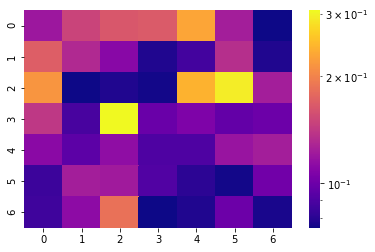

[[0.12  0.15  0.164 0.167 0.23  0.124 0.075]
 [0.17  0.131 0.111 0.078 0.087 0.135 0.078]
 [0.217 0.075 0.078 0.076 0.242 0.295 0.124]
 [0.141 0.088 0.307 0.099 0.107 0.097 0.1  ]
 [0.112 0.095 0.114 0.09  0.09  0.118 0.124]
 [0.085 0.124 0.122 0.091 0.081 0.076 0.102]
 [0.086 0.113 0.186 0.075 0.078 0.1   0.077]]


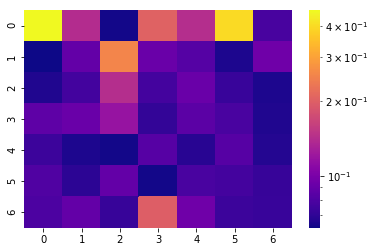

[[0.46  0.14  0.063 0.203 0.142 0.398 0.078]
 [0.062 0.089 0.254 0.092 0.083 0.065 0.095]
 [0.066 0.076 0.142 0.077 0.092 0.073 0.065]
 [0.087 0.092 0.117 0.071 0.086 0.079 0.066]
 [0.074 0.065 0.063 0.084 0.068 0.084 0.067]
 [0.081 0.069 0.089 0.063 0.079 0.077 0.072]
 [0.08  0.089 0.072 0.199 0.095 0.074 0.073]]
SKIPPPPPPEDDDD


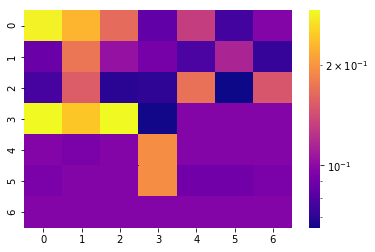

[[0.283 0.227 0.165 0.085 0.132 0.076 0.097]
 [0.088 0.174 0.104 0.092 0.078 0.115 0.073]
 [0.077 0.154 0.07  0.071 0.17  0.065 0.149]
 [0.291 0.243 0.291 0.066 0.097 0.097 0.097]
 [0.097 0.093 0.097 0.194 0.097 0.097 0.097]
 [0.093 0.097 0.097 0.194 0.09  0.09  0.093]
 [0.097 0.097 0.097 0.097 0.097 0.097 0.097]]


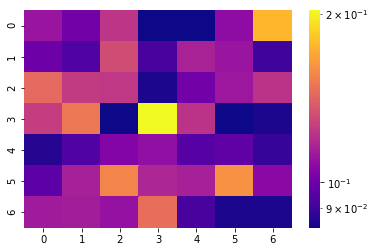

[[0.111 0.101 0.123 0.083 0.083 0.108 0.176]
 [0.1   0.094 0.132 0.092 0.116 0.111 0.09 ]
 [0.144 0.125 0.124 0.085 0.101 0.112 0.122]
 [0.126 0.15  0.083 0.203 0.122 0.083 0.085]
 [0.086 0.094 0.105 0.109 0.095 0.097 0.089]
 [0.096 0.115 0.156 0.117 0.115 0.161 0.107]
 [0.113 0.114 0.11  0.146 0.092 0.085 0.085]]


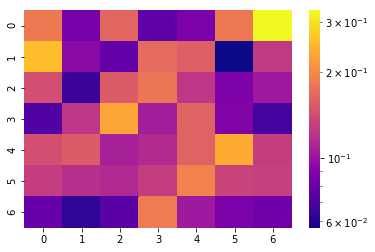

[[0.183 0.085 0.165 0.077 0.087 0.183 0.329]
 [0.256 0.094 0.079 0.17  0.159 0.057 0.127]
 [0.144 0.066 0.155 0.182 0.124 0.088 0.103]
 [0.072 0.124 0.23  0.107 0.162 0.09  0.069]
 [0.144 0.155 0.108 0.115 0.162 0.236 0.13 ]
 [0.129 0.118 0.114 0.129 0.192 0.135 0.131]
 [0.08  0.063 0.075 0.186 0.104 0.087 0.083]]


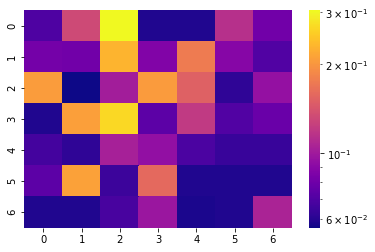

[[0.07  0.133 0.305 0.059 0.059 0.114 0.081]
 [0.082 0.081 0.23  0.087 0.176 0.089 0.071]
 [0.207 0.056 0.102 0.206 0.152 0.062 0.095]
 [0.059 0.21  0.268 0.074 0.121 0.071 0.078]
 [0.067 0.062 0.104 0.094 0.069 0.064 0.064]
 [0.074 0.211 0.065 0.159 0.059 0.059 0.059]
 [0.059 0.059 0.068 0.098 0.058 0.059 0.106]]


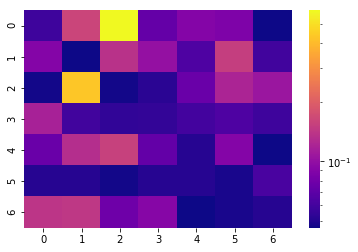

[[0.058 0.162 0.587 0.074 0.091 0.087 0.046]
 [0.091 0.046 0.137 0.101 0.064 0.152 0.059]
 [0.047 0.433 0.047 0.052 0.076 0.121 0.107]
 [0.118 0.059 0.054 0.055 0.06  0.064 0.058]
 [0.076 0.132 0.156 0.073 0.051 0.091 0.046]
 [0.051 0.051 0.047 0.051 0.051 0.048 0.062]
 [0.141 0.144 0.078 0.092 0.046 0.048 0.051]]
SKIPPPPPPEDDDD


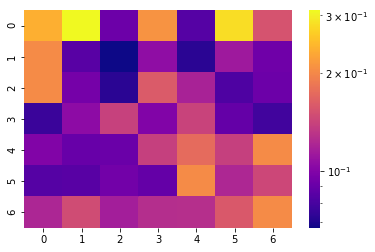

[[0.237 0.311 0.092 0.21  0.084 0.281 0.154]
 [0.202 0.085 0.067 0.106 0.072 0.113 0.093]
 [0.202 0.095 0.072 0.16  0.119 0.082 0.092]
 [0.076 0.105 0.14  0.1   0.141 0.089 0.078]
 [0.1   0.09  0.091 0.139 0.174 0.139 0.202]
 [0.084 0.085 0.094 0.089 0.202 0.122 0.145]
 [0.121 0.148 0.116 0.126 0.127 0.158 0.202]]


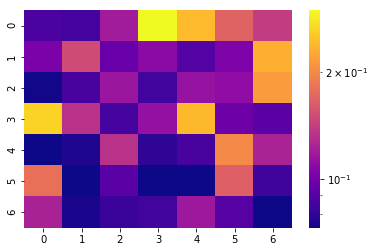

[[0.087 0.085 0.119 0.297 0.24  0.168 0.14 ]
 [0.102 0.15  0.096 0.109 0.089 0.104 0.231]
 [0.074 0.086 0.116 0.084 0.114 0.111 0.214]
 [0.262 0.133 0.085 0.113 0.239 0.098 0.091]
 [0.073 0.076 0.133 0.079 0.086 0.2   0.124]
 [0.179 0.073 0.091 0.073 0.073 0.166 0.083]
 [0.123 0.075 0.082 0.084 0.117 0.09  0.073]]


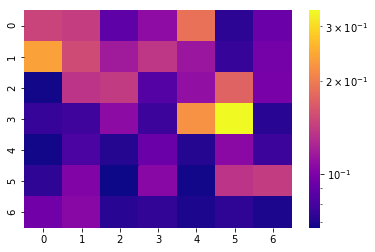

[[0.148 0.143 0.088 0.108 0.19  0.073 0.093]
 [0.238 0.154 0.117 0.137 0.114 0.076 0.097]
 [0.068 0.136 0.141 0.085 0.11  0.176 0.098]
 [0.076 0.078 0.107 0.077 0.222 0.338 0.072]
 [0.068 0.082 0.071 0.092 0.071 0.106 0.077]
 [0.074 0.102 0.067 0.105 0.068 0.136 0.142]
 [0.095 0.105 0.072 0.075 0.07  0.074 0.07 ]]


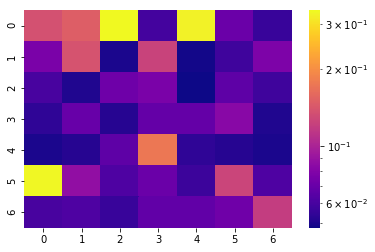

[[0.136 0.149 0.339 0.059 0.328 0.071 0.056]
 [0.077 0.138 0.05  0.124 0.049 0.058 0.078]
 [0.06  0.051 0.072 0.077 0.048 0.067 0.058]
 [0.054 0.07  0.052 0.069 0.069 0.083 0.051]
 [0.05  0.052 0.067 0.175 0.054 0.052 0.05 ]
 [0.334 0.087 0.062 0.071 0.057 0.126 0.062]
 [0.06  0.062 0.056 0.068 0.068 0.073 0.12 ]]


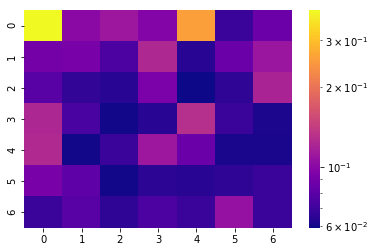

[[0.389 0.101 0.111 0.098 0.257 0.069 0.087]
 [0.09  0.092 0.075 0.124 0.064 0.086 0.11 ]
 [0.079 0.067 0.064 0.093 0.059 0.066 0.12 ]
 [0.123 0.074 0.06  0.064 0.129 0.069 0.062]
 [0.125 0.06  0.069 0.111 0.086 0.061 0.061]
 [0.092 0.081 0.06  0.065 0.064 0.066 0.069]
 [0.069 0.079 0.066 0.075 0.069 0.107 0.069]]


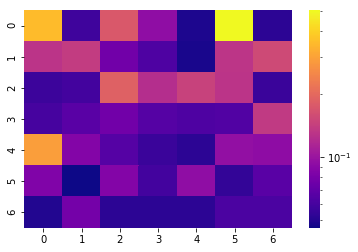

[[0.354 0.058 0.176 0.094 0.049 0.502 0.052]
 [0.13  0.139 0.077 0.063 0.048 0.132 0.155]
 [0.057 0.059 0.187 0.123 0.146 0.13  0.056]
 [0.06  0.067 0.077 0.065 0.063 0.064 0.136]
 [0.294 0.086 0.065 0.056 0.052 0.096 0.093]
 [0.085 0.046 0.086 0.059 0.094 0.054 0.067]
 [0.05  0.079 0.052 0.052 0.052 0.062 0.062]]


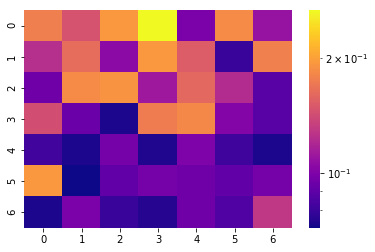

[[0.176 0.146 0.194 0.266 0.099 0.185 0.109]
 [0.124 0.163 0.105 0.194 0.153 0.08  0.177]
 [0.095 0.185 0.191 0.112 0.16  0.122 0.088]
 [0.143 0.093 0.074 0.175 0.183 0.102 0.088]
 [0.082 0.074 0.097 0.075 0.1   0.081 0.074]
 [0.194 0.072 0.091 0.097 0.095 0.091 0.097]
 [0.074 0.099 0.08  0.076 0.095 0.086 0.129]]


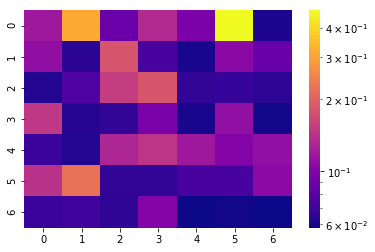

[[0.118 0.315 0.088 0.134 0.096 0.472 0.061]
 [0.109 0.064 0.183 0.074 0.06  0.105 0.087]
 [0.062 0.076 0.154 0.185 0.067 0.068 0.065]
 [0.148 0.063 0.067 0.095 0.06  0.11  0.059]
 [0.069 0.062 0.13  0.146 0.118 0.101 0.11 ]
 [0.142 0.223 0.067 0.067 0.074 0.074 0.106]
 [0.069 0.071 0.066 0.101 0.058 0.059 0.058]]


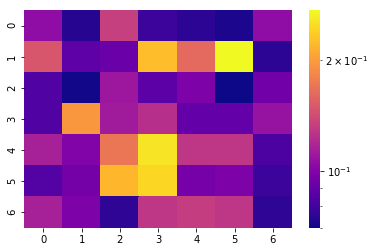

[[0.105 0.074 0.133 0.079 0.075 0.072 0.105]
 [0.148 0.088 0.092 0.224 0.161 0.272 0.075]
 [0.084 0.071 0.11  0.087 0.098 0.07  0.094]
 [0.084 0.195 0.112 0.124 0.09  0.09  0.108]
 [0.115 0.099 0.171 0.255 0.128 0.128 0.083]
 [0.085 0.095 0.22  0.244 0.096 0.098 0.079]
 [0.115 0.098 0.076 0.128 0.132 0.128 0.076]]


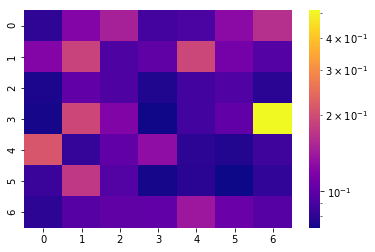

[[0.081 0.121 0.147 0.089 0.092 0.126 0.163]
 [0.121 0.187 0.093 0.101 0.191 0.113 0.096]
 [0.075 0.102 0.093 0.076 0.088 0.094 0.079]
 [0.074 0.193 0.12  0.073 0.088 0.102 0.512]
 [0.213 0.083 0.102 0.129 0.08  0.077 0.087]
 [0.085 0.173 0.095 0.074 0.079 0.072 0.082]
 [0.08  0.097 0.101 0.102 0.139 0.106 0.097]]


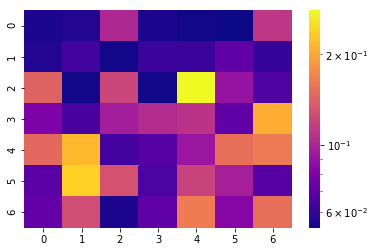

[[0.055 0.056 0.102 0.055 0.054 0.053 0.111]
 [0.056 0.063 0.054 0.061 0.061 0.071 0.06 ]
 [0.142 0.054 0.121 0.054 0.28  0.09  0.066]
 [0.08  0.064 0.096 0.104 0.109 0.071 0.207]
 [0.147 0.217 0.063 0.068 0.092 0.152 0.162]
 [0.069 0.239 0.13  0.065 0.119 0.097 0.068]
 [0.072 0.126 0.055 0.071 0.163 0.084 0.152]]


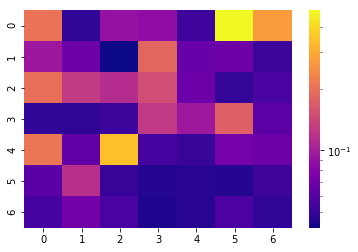

[[0.203 0.049 0.09  0.087 0.053 0.48  0.269]
 [0.095 0.07  0.042 0.185 0.067 0.07  0.052]
 [0.198 0.129 0.113 0.15  0.069 0.05  0.056]
 [0.049 0.048 0.052 0.126 0.096 0.175 0.063]
 [0.209 0.065 0.345 0.055 0.051 0.073 0.07 ]
 [0.062 0.117 0.051 0.046 0.047 0.046 0.053]
 [0.055 0.072 0.056 0.045 0.047 0.057 0.049]]


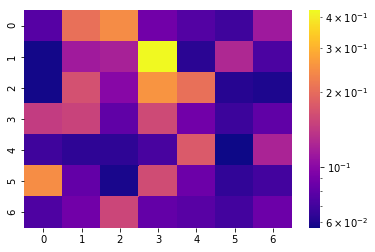

[[0.077 0.205 0.244 0.088 0.076 0.069 0.113]
 [0.058 0.114 0.12  0.425 0.063 0.125 0.073]
 [0.058 0.166 0.099 0.257 0.206 0.062 0.06 ]
 [0.144 0.152 0.081 0.159 0.088 0.068 0.081]
 [0.069 0.064 0.064 0.072 0.177 0.057 0.122]
 [0.247 0.082 0.059 0.161 0.086 0.065 0.07 ]
 [0.074 0.088 0.155 0.082 0.078 0.07  0.086]]


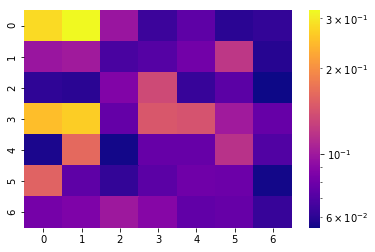

[[0.282 0.32  0.098 0.064 0.074 0.06  0.062]
 [0.098 0.101 0.068 0.071 0.081 0.12  0.059]
 [0.061 0.06  0.087 0.135 0.063 0.073 0.055]
 [0.251 0.266 0.076 0.147 0.143 0.101 0.077]
 [0.057 0.162 0.056 0.077 0.077 0.117 0.07 ]
 [0.157 0.074 0.062 0.073 0.08  0.079 0.056]
 [0.082 0.086 0.1   0.089 0.075 0.077 0.063]]


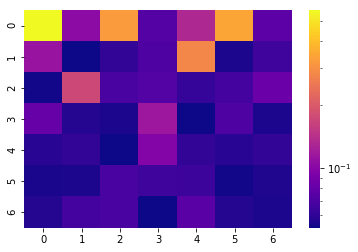

[[0.562 0.104 0.324 0.074 0.132 0.346 0.077]
 [0.112 0.052 0.061 0.071 0.282 0.055 0.065]
 [0.053 0.174 0.069 0.073 0.062 0.067 0.084]
 [0.082 0.057 0.055 0.115 0.052 0.071 0.055]
 [0.058 0.061 0.052 0.098 0.061 0.058 0.061]
 [0.054 0.055 0.069 0.065 0.064 0.053 0.056]
 [0.057 0.067 0.069 0.052 0.076 0.057 0.055]]


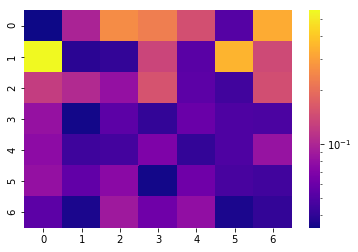

[[0.034 0.098 0.258 0.23  0.149 0.051 0.328]
 [0.558 0.039 0.041 0.136 0.053 0.351 0.142]
 [0.125 0.104 0.081 0.154 0.054 0.045 0.148]
 [0.082 0.035 0.054 0.041 0.059 0.049 0.048]
 [0.077 0.044 0.046 0.069 0.041 0.049 0.083]
 [0.081 0.056 0.075 0.035 0.062 0.047 0.045]
 [0.054 0.036 0.088 0.062 0.079 0.036 0.041]]


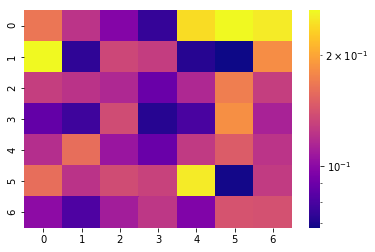

[[0.166 0.123 0.098 0.075 0.24  0.264 0.252]
 [0.264 0.074 0.134 0.128 0.072 0.068 0.183]
 [0.129 0.122 0.116 0.089 0.116 0.171 0.129]
 [0.087 0.077 0.137 0.072 0.08  0.184 0.113]
 [0.119 0.16  0.106 0.089 0.126 0.148 0.123]
 [0.16  0.122 0.137 0.131 0.252 0.069 0.127]
 [0.101 0.081 0.11  0.124 0.096 0.142 0.14 ]]


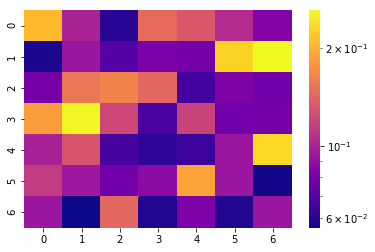

[[0.207 0.1   0.06  0.145 0.132 0.105 0.084]
 [0.058 0.093 0.07  0.081 0.079 0.227 0.26 ]
 [0.079 0.154 0.164 0.143 0.066 0.082 0.078]
 [0.183 0.258 0.121 0.068 0.119 0.078 0.079]
 [0.099 0.13  0.067 0.061 0.064 0.093 0.232]
 [0.114 0.094 0.078 0.087 0.187 0.093 0.057]
 [0.093 0.056 0.143 0.059 0.082 0.059 0.093]]


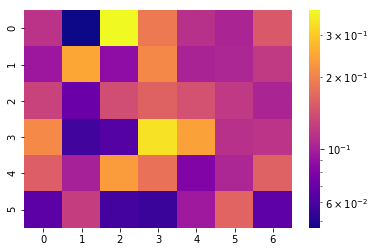

[[0.116 0.047 0.379 0.188 0.114 0.104 0.152]
 [0.094 0.25  0.088 0.208 0.103 0.105 0.122]
 [0.13  0.071 0.14  0.161 0.143 0.121 0.104]
 [0.21  0.058 0.064 0.34  0.242 0.114 0.117]
 [0.158 0.101 0.235 0.179 0.081 0.105 0.16 ]
 [0.066 0.126 0.059 0.056 0.096 0.164 0.067]]


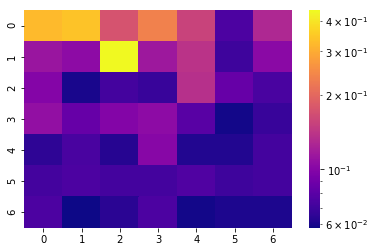

[[0.325 0.339 0.174 0.237 0.155 0.075 0.129]
 [0.112 0.105 0.44  0.115 0.139 0.07  0.103]
 [0.1   0.06  0.072 0.068 0.136 0.085 0.074]
 [0.108 0.085 0.099 0.105 0.079 0.059 0.068]
 [0.065 0.074 0.063 0.101 0.062 0.062 0.072]
 [0.072 0.075 0.072 0.072 0.076 0.07  0.072]
 [0.075 0.058 0.064 0.075 0.059 0.061 0.061]]


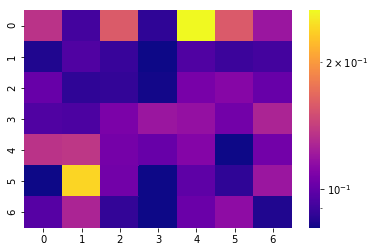

[[0.135 0.092 0.159 0.087 0.265 0.158 0.12 ]
 [0.084 0.095 0.089 0.081 0.095 0.09  0.092]
 [0.102 0.087 0.088 0.082 0.107 0.112 0.102]
 [0.095 0.094 0.108 0.12  0.117 0.105 0.127]
 [0.135 0.137 0.106 0.102 0.111 0.081 0.105]
 [0.081 0.24  0.105 0.081 0.099 0.087 0.12 ]
 [0.097 0.127 0.088 0.081 0.103 0.115 0.084]]


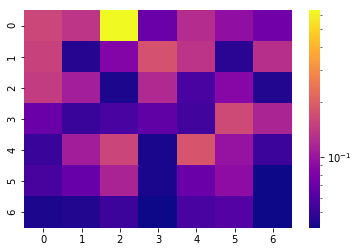

[[0.161 0.137 0.635 0.071 0.125 0.094 0.074]
 [0.154 0.046 0.084 0.178 0.135 0.047 0.129]
 [0.145 0.109 0.044 0.121 0.057 0.087 0.045]
 [0.071 0.051 0.057 0.066 0.054 0.166 0.117]
 [0.051 0.108 0.158 0.043 0.184 0.098 0.052]
 [0.056 0.07  0.115 0.043 0.071 0.092 0.041]
 [0.044 0.045 0.052 0.041 0.057 0.061 0.041]]


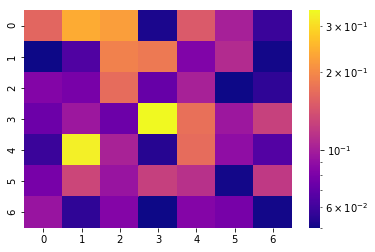

[[0.161 0.239 0.223 0.052 0.148 0.101 0.059]
 [0.05  0.065 0.19  0.181 0.082 0.109 0.051]
 [0.083 0.079 0.167 0.072 0.102 0.05  0.056]
 [0.074 0.095 0.074 0.344 0.172 0.095 0.126]
 [0.059 0.331 0.103 0.054 0.167 0.089 0.066]
 [0.078 0.131 0.093 0.125 0.113 0.051 0.119]
 [0.093 0.056 0.084 0.05  0.084 0.078 0.051]]


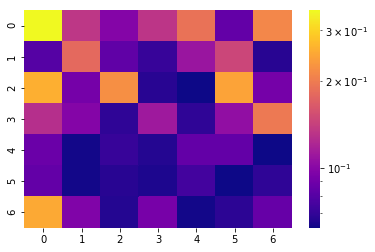

[[0.352 0.134 0.099 0.133 0.19  0.085 0.212]
 [0.08  0.181 0.084 0.071 0.109 0.147 0.067]
 [0.258 0.092 0.221 0.067 0.062 0.245 0.092]
 [0.128 0.099 0.069 0.112 0.069 0.105 0.197]
 [0.088 0.063 0.071 0.066 0.085 0.085 0.062]
 [0.085 0.063 0.067 0.065 0.074 0.062 0.069]
 [0.251 0.097 0.066 0.093 0.063 0.068 0.086]]


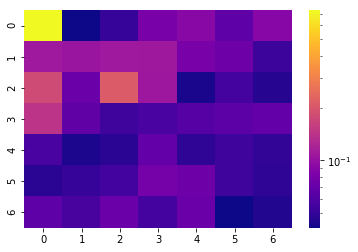

[[0.73  0.041 0.051 0.081 0.092 0.067 0.091]
 [0.11  0.105 0.11  0.108 0.081 0.075 0.053]
 [0.18  0.072 0.214 0.107 0.043 0.056 0.046]
 [0.144 0.068 0.054 0.058 0.063 0.066 0.069]
 [0.058 0.044 0.047 0.069 0.049 0.054 0.05 ]
 [0.047 0.051 0.055 0.079 0.075 0.054 0.048]
 [0.067 0.057 0.072 0.056 0.072 0.041 0.045]]


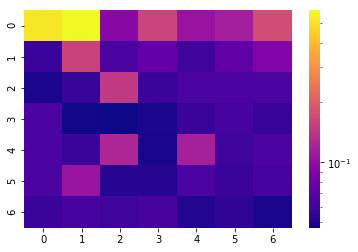

[[0.516 0.58  0.095 0.161 0.106 0.115 0.174]
 [0.058 0.159 0.064 0.074 0.059 0.073 0.09 ]
 [0.05  0.057 0.147 0.058 0.064 0.064 0.064]
 [0.064 0.048 0.047 0.05  0.058 0.062 0.057]
 [0.064 0.058 0.123 0.049 0.117 0.06  0.064]
 [0.064 0.106 0.052 0.052 0.064 0.058 0.062]
 [0.058 0.062 0.06  0.063 0.051 0.054 0.049]]


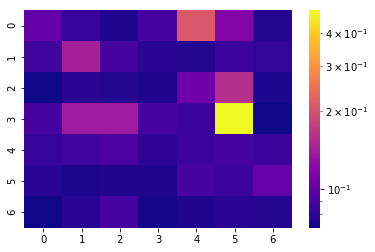

[[0.101 0.082 0.075 0.088 0.209 0.118 0.076]
 [0.086 0.144 0.088 0.078 0.076 0.084 0.081]
 [0.071 0.078 0.076 0.075 0.107 0.157 0.074]
 [0.088 0.137 0.137 0.088 0.084 0.49  0.071]
 [0.082 0.086 0.091 0.079 0.084 0.088 0.084]
 [0.078 0.074 0.075 0.075 0.088 0.084 0.102]
 [0.072 0.078 0.088 0.073 0.075 0.078 0.076]]


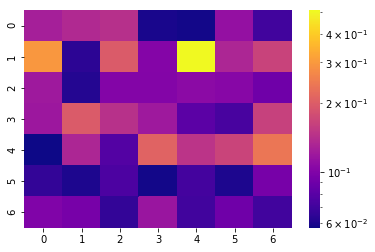

[[0.125 0.136 0.143 0.059 0.058 0.112 0.071]
 [0.297 0.064 0.197 0.102 0.506 0.132 0.165]
 [0.12  0.062 0.101 0.101 0.107 0.104 0.091]
 [0.118 0.198 0.144 0.12  0.081 0.073 0.162]
 [0.057 0.132 0.078 0.21  0.147 0.166 0.24 ]
 [0.066 0.06  0.075 0.058 0.072 0.06  0.095]
 [0.1   0.095 0.066 0.116 0.071 0.091 0.071]]


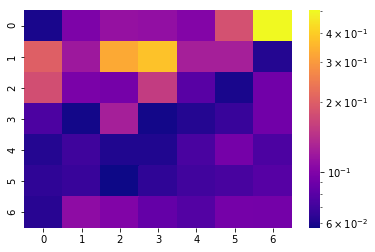

[[0.059 0.098 0.113 0.111 0.101 0.181 0.501]
 [0.202 0.119 0.33  0.376 0.125 0.125 0.062]
 [0.179 0.096 0.094 0.156 0.08  0.059 0.091]
 [0.075 0.058 0.125 0.058 0.062 0.068 0.091]
 [0.062 0.07  0.061 0.061 0.074 0.094 0.075]
 [0.065 0.068 0.057 0.065 0.071 0.073 0.079]
 [0.063 0.108 0.1   0.085 0.078 0.094 0.093]]


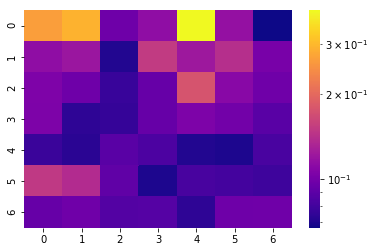

[[0.266 0.292 0.097 0.114 0.395 0.116 0.067]
 [0.114 0.12  0.071 0.151 0.122 0.14  0.102]
 [0.105 0.097 0.077 0.094 0.176 0.11  0.098]
 [0.104 0.074 0.076 0.094 0.104 0.099 0.089]
 [0.078 0.073 0.089 0.084 0.071 0.07  0.083]
 [0.149 0.137 0.091 0.07  0.082 0.081 0.079]
 [0.094 0.098 0.086 0.087 0.074 0.097 0.098]]


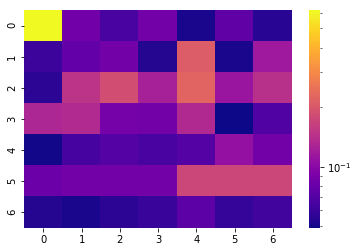

[[0.617 0.085 0.066 0.086 0.051 0.076 0.055]
 [0.061 0.078 0.086 0.054 0.211 0.051 0.116]
 [0.056 0.147 0.186 0.124 0.223 0.112 0.143]
 [0.13  0.135 0.087 0.086 0.134 0.049 0.069]
 [0.05  0.065 0.071 0.066 0.071 0.108 0.086]
 [0.082 0.086 0.086 0.086 0.173 0.173 0.173]
 [0.054 0.051 0.056 0.06  0.074 0.059 0.063]]


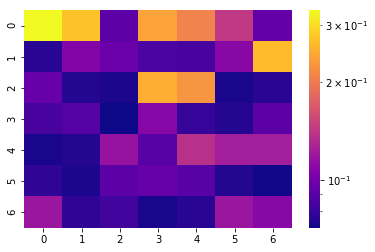

[[0.333 0.272 0.092 0.239 0.209 0.143 0.094]
 [0.076 0.107 0.097 0.086 0.085 0.109 0.265]
 [0.096 0.075 0.074 0.251 0.227 0.073 0.076]
 [0.085 0.089 0.071 0.108 0.08  0.075 0.092]
 [0.073 0.075 0.116 0.09  0.137 0.123 0.123]
 [0.078 0.074 0.092 0.095 0.09  0.075 0.072]
 [0.118 0.078 0.083 0.073 0.076 0.118 0.109]]


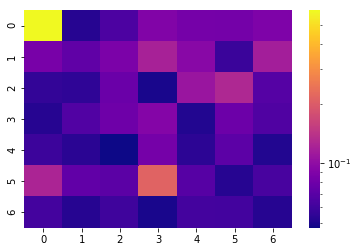

[[0.596 0.052 0.065 0.091 0.084 0.083 0.089]
 [0.086 0.073 0.087 0.12  0.096 0.058 0.117]
 [0.056 0.055 0.078 0.049 0.108 0.128 0.068]
 [0.052 0.067 0.08  0.093 0.051 0.079 0.066]
 [0.059 0.053 0.047 0.084 0.054 0.072 0.051]
 [0.124 0.074 0.071 0.213 0.069 0.052 0.063]
 [0.062 0.052 0.06  0.049 0.062 0.061 0.052]]


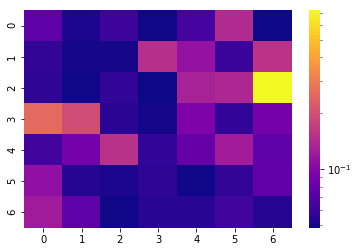

[[0.076 0.051 0.061 0.049 0.065 0.142 0.048]
 [0.058 0.05  0.05  0.15  0.113 0.06  0.154]
 [0.056 0.049 0.057 0.048 0.13  0.138 0.719]
 [0.253 0.195 0.055 0.05  0.095 0.057 0.089]
 [0.063 0.089 0.153 0.057 0.08  0.124 0.076]
 [0.11  0.053 0.051 0.056 0.049 0.058 0.078]
 [0.123 0.076 0.049 0.054 0.054 0.063 0.053]]


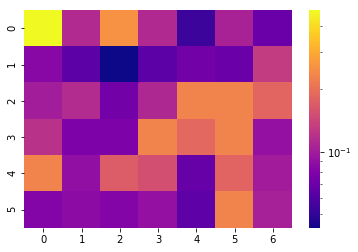

[[0.477 0.113 0.255 0.112 0.053 0.106 0.07 ]
 [0.084 0.064 0.043 0.064 0.073 0.07  0.131]
 [0.101 0.114 0.073 0.111 0.231 0.231 0.183]
 [0.12  0.078 0.078 0.231 0.188 0.231 0.091]
 [0.231 0.09  0.172 0.153 0.068 0.182 0.1  ]
 [0.082 0.087 0.081 0.091 0.065 0.231 0.104]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


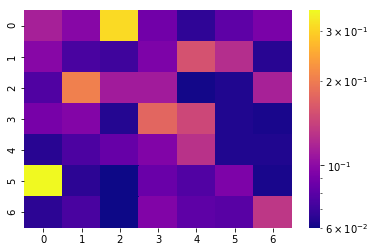

[[0.115 0.098 0.313 0.088 0.067 0.081 0.092]
 [0.098 0.074 0.071 0.093 0.156 0.125 0.065]
 [0.076 0.204 0.112 0.112 0.061 0.063 0.116]
 [0.091 0.096 0.064 0.177 0.146 0.063 0.062]
 [0.065 0.075 0.084 0.095 0.128 0.063 0.063]
 [0.355 0.066 0.06  0.085 0.077 0.093 0.062]
 [0.066 0.074 0.06  0.095 0.081 0.079 0.132]]


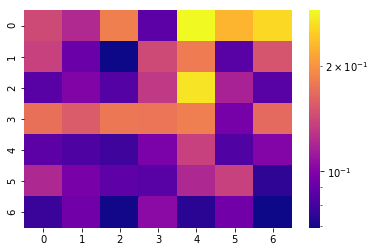

[[0.143 0.122 0.184 0.087 0.289 0.228 0.259]
 [0.137 0.092 0.069 0.143 0.181 0.086 0.151]
 [0.086 0.1   0.085 0.132 0.27  0.118 0.086]
 [0.172 0.156 0.178 0.176 0.183 0.096 0.167]
 [0.087 0.083 0.079 0.098 0.137 0.084 0.101]
 [0.121 0.097 0.088 0.086 0.121 0.137 0.075]
 [0.078 0.094 0.07  0.104 0.074 0.094 0.069]]


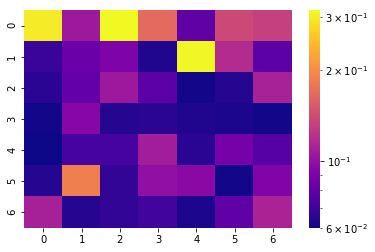

[[0.298 0.105 0.315 0.166 0.08  0.139 0.132]
 [0.069 0.084 0.091 0.063 0.311 0.117 0.079]
 [0.065 0.081 0.105 0.079 0.061 0.064 0.111]
 [0.061 0.095 0.064 0.065 0.063 0.062 0.061]
 [0.06  0.072 0.072 0.108 0.065 0.088 0.077]
 [0.064 0.187 0.067 0.1   0.096 0.061 0.092]
 [0.11  0.064 0.067 0.071 0.062 0.08  0.112]]


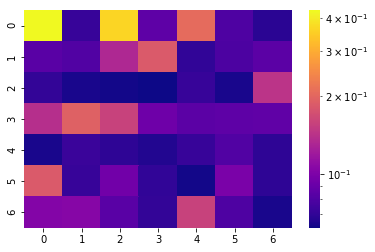

[[0.429 0.072 0.366 0.086 0.207 0.08  0.068]
 [0.084 0.081 0.132 0.185 0.07  0.079 0.085]
 [0.071 0.064 0.063 0.062 0.072 0.064 0.144]
 [0.139 0.194 0.158 0.093 0.085 0.086 0.087]
 [0.064 0.073 0.069 0.066 0.072 0.081 0.069]
 [0.185 0.072 0.094 0.07  0.063 0.099 0.069]
 [0.103 0.105 0.084 0.071 0.158 0.08  0.064]]


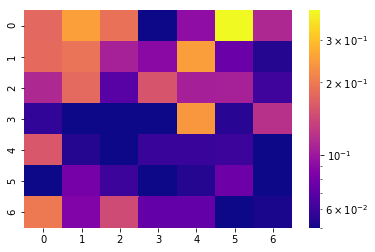

[[0.178 0.252 0.19  0.05  0.093 0.398 0.113]
 [0.18  0.192 0.107 0.09  0.249 0.075 0.054]
 [0.113 0.179 0.069 0.156 0.106 0.107 0.061]
 [0.057 0.05  0.05  0.05  0.24  0.055 0.12 ]
 [0.159 0.054 0.05  0.059 0.059 0.06  0.05 ]
 [0.05  0.081 0.06  0.05  0.054 0.077 0.05 ]
 [0.199 0.085 0.145 0.073 0.073 0.05  0.052]]


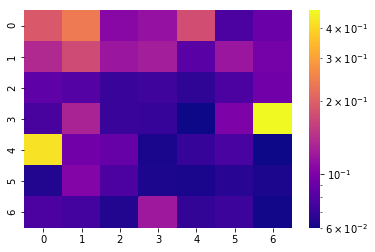

[[0.191 0.239 0.107 0.115 0.178 0.078 0.09 ]
 [0.136 0.173 0.119 0.125 0.083 0.119 0.096]
 [0.085 0.081 0.071 0.073 0.068 0.078 0.094]
 [0.076 0.131 0.071 0.07  0.06  0.1   0.472]
 [0.424 0.094 0.089 0.062 0.07  0.077 0.06 ]
 [0.064 0.104 0.078 0.063 0.062 0.066 0.063]
 [0.078 0.075 0.064 0.12  0.069 0.072 0.061]]


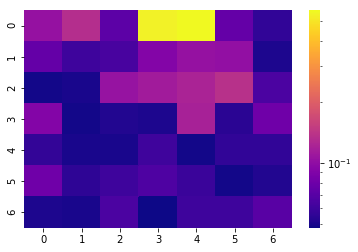

[[0.104 0.133 0.072 0.542 0.565 0.076 0.056]
 [0.076 0.06  0.064 0.092 0.104 0.102 0.051]
 [0.049 0.05  0.105 0.114 0.122 0.136 0.065]
 [0.092 0.049 0.052 0.051 0.119 0.054 0.081]
 [0.057 0.05  0.05  0.061 0.049 0.056 0.056]
 [0.081 0.055 0.06  0.066 0.059 0.049 0.052]
 [0.051 0.05  0.065 0.048 0.06  0.06  0.07 ]]


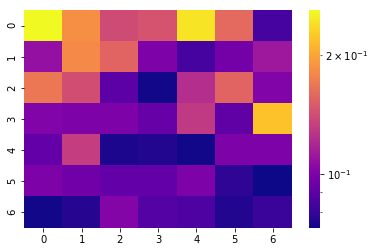

[[0.259 0.185 0.14  0.145 0.243 0.159 0.084]
 [0.108 0.181 0.156 0.1   0.084 0.097 0.112]
 [0.169 0.142 0.09  0.074 0.123 0.156 0.101]
 [0.101 0.1   0.1   0.093 0.13  0.091 0.219]
 [0.092 0.132 0.075 0.076 0.074 0.1   0.1  ]
 [0.1   0.096 0.092 0.092 0.1   0.079 0.073]
 [0.074 0.077 0.102 0.088 0.086 0.076 0.081]]


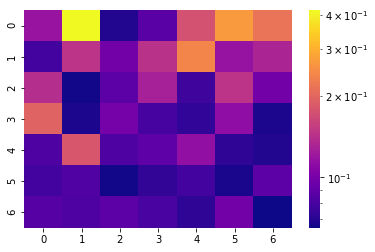

[[0.118 0.416 0.069 0.087 0.175 0.268 0.218]
 [0.079 0.146 0.098 0.144 0.24  0.117 0.132]
 [0.14  0.066 0.088 0.128 0.077 0.146 0.098]
 [0.196 0.068 0.099 0.08  0.073 0.113 0.068]
 [0.083 0.181 0.083 0.089 0.115 0.072 0.069]
 [0.079 0.084 0.066 0.074 0.079 0.067 0.088]
 [0.086 0.083 0.088 0.081 0.072 0.098 0.065]]


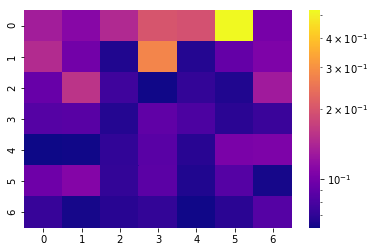

[[0.132 0.112 0.145 0.201 0.193 0.525 0.102]
 [0.147 0.099 0.066 0.28  0.067 0.092 0.106]
 [0.094 0.157 0.076 0.063 0.072 0.066 0.13 ]
 [0.085 0.086 0.067 0.09  0.081 0.069 0.074]
 [0.062 0.063 0.071 0.087 0.068 0.104 0.105]
 [0.097 0.11  0.072 0.088 0.066 0.085 0.064]
 [0.073 0.064 0.068 0.072 0.063 0.069 0.085]]


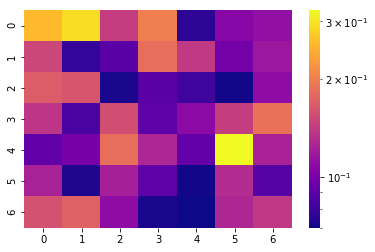

[[0.258 0.291 0.143 0.2   0.076 0.107 0.112]
 [0.15  0.078 0.089 0.184 0.141 0.099 0.117]
 [0.169 0.162 0.072 0.089 0.081 0.071 0.11 ]
 [0.137 0.084 0.157 0.091 0.109 0.144 0.187]
 [0.092 0.1   0.184 0.126 0.093 0.324 0.124]
 [0.123 0.073 0.122 0.091 0.071 0.13  0.087]
 [0.158 0.172 0.11  0.072 0.07  0.127 0.139]]


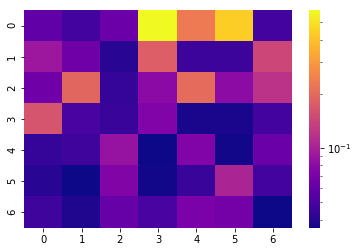

[[0.059 0.048 0.064 0.581 0.231 0.436 0.048]
 [0.091 0.065 0.041 0.18  0.046 0.046 0.145]
 [0.065 0.194 0.044 0.08  0.204 0.081 0.12 ]
 [0.163 0.05  0.045 0.073 0.038 0.038 0.048]
 [0.044 0.047 0.087 0.036 0.073 0.037 0.063]
 [0.041 0.036 0.074 0.037 0.045 0.104 0.048]
 [0.047 0.039 0.061 0.05  0.07  0.067 0.036]]


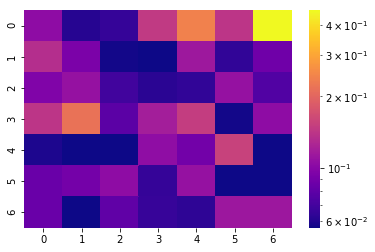

[[0.104 0.061 0.065 0.146 0.241 0.142 0.461]
 [0.134 0.094 0.057 0.056 0.114 0.064 0.088]
 [0.096 0.109 0.069 0.062 0.064 0.109 0.075]
 [0.141 0.219 0.079 0.119 0.15  0.057 0.104]
 [0.059 0.056 0.056 0.105 0.089 0.155 0.056]
 [0.085 0.09  0.104 0.065 0.109 0.056 0.056]
 [0.085 0.056 0.081 0.066 0.063 0.113 0.113]]


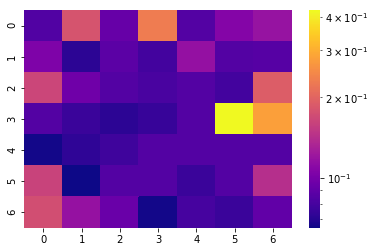

[[0.084 0.181 0.093 0.231 0.085 0.107 0.118]
 [0.104 0.072 0.088 0.079 0.116 0.085 0.086]
 [0.166 0.097 0.085 0.081 0.085 0.079 0.191]
 [0.085 0.076 0.072 0.075 0.085 0.424 0.28 ]
 [0.066 0.073 0.078 0.085 0.085 0.085 0.085]
 [0.162 0.065 0.085 0.085 0.076 0.085 0.142]
 [0.174 0.117 0.094 0.066 0.08  0.076 0.091]]


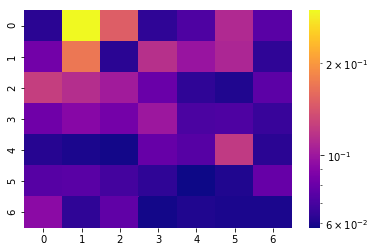

[[0.063 0.298 0.15  0.064 0.072 0.111 0.075]
 [0.083 0.171 0.063 0.115 0.098 0.109 0.064]
 [0.125 0.114 0.103 0.08  0.064 0.061 0.076]
 [0.082 0.091 0.084 0.1   0.071 0.072 0.066]
 [0.062 0.06  0.059 0.079 0.074 0.122 0.063]
 [0.074 0.075 0.069 0.064 0.058 0.061 0.079]
 [0.093 0.064 0.077 0.059 0.061 0.06  0.06 ]]


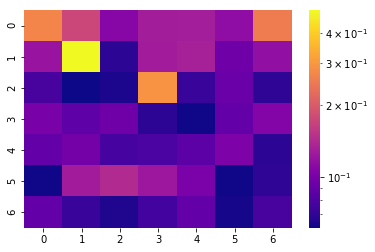

[[0.268 0.173 0.109 0.128 0.129 0.114 0.254]
 [0.12  0.498 0.068 0.127 0.131 0.095 0.116]
 [0.078 0.061 0.064 0.291 0.072 0.093 0.069]
 [0.1   0.087 0.095 0.068 0.062 0.089 0.106]
 [0.089 0.098 0.077 0.079 0.086 0.103 0.068]
 [0.062 0.127 0.141 0.123 0.101 0.062 0.069]
 [0.09  0.072 0.065 0.076 0.089 0.063 0.078]]


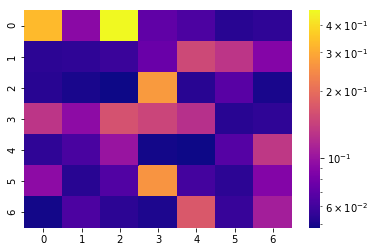

[[0.33  0.091 0.465 0.071 0.064 0.053 0.055]
 [0.054 0.055 0.058 0.075 0.152 0.13  0.088]
 [0.053 0.05  0.048 0.271 0.053 0.068 0.05 ]
 [0.13  0.093 0.163 0.148 0.125 0.053 0.055]
 [0.055 0.063 0.1   0.049 0.048 0.067 0.133]
 [0.093 0.053 0.066 0.263 0.061 0.054 0.087]
 [0.049 0.064 0.054 0.051 0.172 0.057 0.108]]


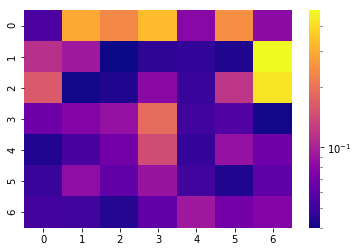

[[0.055 0.296 0.234 0.331 0.08  0.246 0.082]
 [0.115 0.093 0.04  0.046 0.047 0.043 0.478]
 [0.161 0.041 0.043 0.081 0.049 0.119 0.422]
 [0.067 0.078 0.087 0.187 0.051 0.056 0.041]
 [0.043 0.053 0.069 0.144 0.048 0.087 0.068]
 [0.049 0.084 0.062 0.089 0.051 0.043 0.061]
 [0.052 0.051 0.044 0.062 0.093 0.07  0.078]]


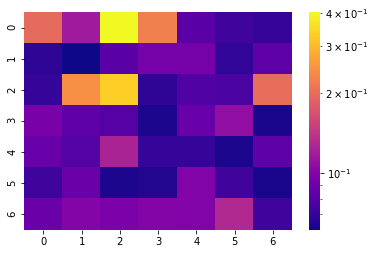

[[0.197 0.117 0.402 0.224 0.082 0.073 0.07 ]
 [0.068 0.061 0.082 0.094 0.094 0.069 0.084]
 [0.07  0.245 0.33  0.068 0.079 0.077 0.2  ]
 [0.095 0.084 0.081 0.064 0.088 0.108 0.063]
 [0.088 0.08  0.124 0.07  0.07  0.064 0.084]
 [0.073 0.089 0.064 0.065 0.099 0.073 0.063]
 [0.089 0.1   0.097 0.1   0.099 0.129 0.073]]
SKIPPPPPPEDDDD


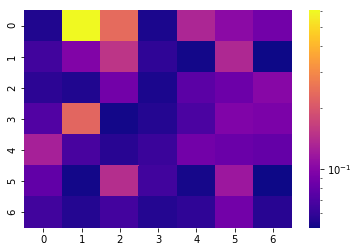

[[0.055 0.603 0.237 0.054 0.132 0.104 0.088]
 [0.065 0.097 0.151 0.059 0.052 0.135 0.051]
 [0.058 0.055 0.088 0.054 0.076 0.085 0.101]
 [0.072 0.228 0.052 0.056 0.069 0.096 0.093]
 [0.126 0.068 0.057 0.063 0.088 0.084 0.081]
 [0.079 0.052 0.141 0.065 0.053 0.116 0.051]
 [0.065 0.056 0.066 0.056 0.059 0.088 0.057]]


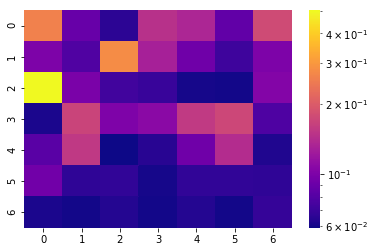

[[0.26  0.089 0.066 0.146 0.134 0.086 0.177]
 [0.1   0.079 0.279 0.129 0.093 0.072 0.1  ]
 [0.502 0.099 0.073 0.07  0.061 0.06  0.104]
 [0.062 0.169 0.101 0.108 0.156 0.173 0.078]
 [0.083 0.155 0.059 0.065 0.093 0.141 0.063]
 [0.094 0.067 0.068 0.061 0.068 0.068 0.067]
 [0.062 0.06  0.064 0.06  0.064 0.06  0.069]]


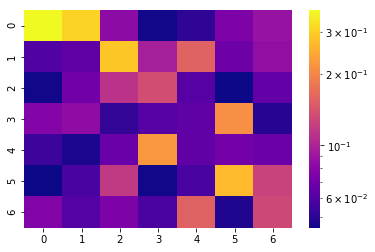

[[0.369 0.307 0.083 0.046 0.051 0.076 0.088]
 [0.06  0.065 0.287 0.096 0.158 0.07  0.085]
 [0.046 0.071 0.112 0.136 0.062 0.045 0.066]
 [0.079 0.084 0.052 0.062 0.065 0.212 0.049]
 [0.054 0.047 0.068 0.221 0.065 0.072 0.069]
 [0.045 0.058 0.117 0.046 0.058 0.27  0.125]
 [0.078 0.061 0.076 0.059 0.155 0.048 0.13 ]]


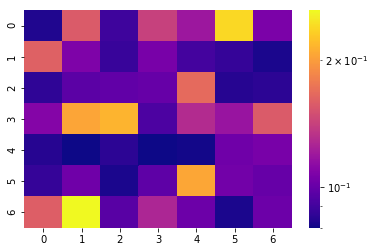

[[0.083 0.157 0.089 0.141 0.119 0.239 0.107]
 [0.161 0.108 0.088 0.106 0.091 0.087 0.082]
 [0.086 0.097 0.099 0.1   0.167 0.084 0.085]
 [0.11  0.205 0.215 0.093 0.129 0.117 0.157]
 [0.084 0.08  0.085 0.08  0.081 0.103 0.106]
 [0.087 0.103 0.082 0.098 0.206 0.104 0.1  ]
 [0.159 0.262 0.096 0.126 0.102 0.082 0.102]]


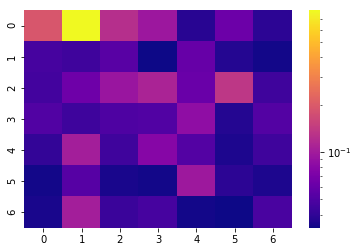

[[0.191 0.796 0.124 0.095 0.038 0.063 0.039]
 [0.047 0.045 0.054 0.033 0.06  0.037 0.034]
 [0.046 0.064 0.093 0.11  0.062 0.135 0.045]
 [0.051 0.044 0.05  0.051 0.085 0.037 0.052]
 [0.041 0.103 0.045 0.078 0.052 0.036 0.045]
 [0.034 0.053 0.035 0.034 0.097 0.039 0.036]
 [0.035 0.103 0.043 0.047 0.034 0.033 0.048]]


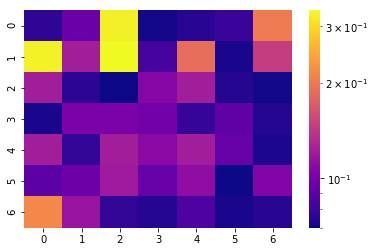

[[0.077 0.096 0.325 0.071 0.075 0.08  0.202]
 [0.327 0.122 0.337 0.083 0.189 0.072 0.146]
 [0.122 0.076 0.07  0.108 0.122 0.074 0.071]
 [0.072 0.103 0.103 0.099 0.079 0.092 0.074]
 [0.122 0.078 0.122 0.109 0.122 0.094 0.073]
 [0.091 0.097 0.12  0.094 0.112 0.07  0.105]
 [0.214 0.116 0.078 0.074 0.086 0.072 0.075]]


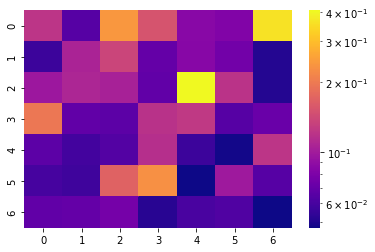

[[0.121 0.065 0.241 0.153 0.086 0.082 0.363]
 [0.057 0.106 0.136 0.07  0.085 0.076 0.051]
 [0.097 0.108 0.104 0.069 0.407 0.119 0.051]
 [0.196 0.069 0.067 0.118 0.124 0.065 0.072]
 [0.067 0.059 0.064 0.115 0.057 0.048 0.121]
 [0.06  0.058 0.168 0.23  0.047 0.098 0.065]
 [0.069 0.07  0.077 0.052 0.061 0.063 0.047]]


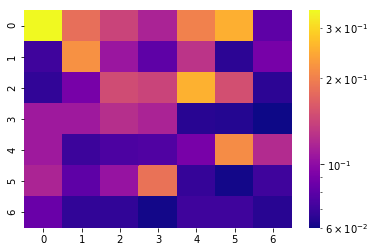

[[0.346 0.183 0.142 0.116 0.202 0.254 0.081]
 [0.071 0.219 0.107 0.081 0.129 0.066 0.09 ]
 [0.067 0.09  0.149 0.142 0.255 0.152 0.066]
 [0.109 0.109 0.124 0.116 0.065 0.064 0.06 ]
 [0.109 0.07  0.075 0.076 0.091 0.214 0.122]
 [0.117 0.081 0.105 0.186 0.068 0.061 0.071]
 [0.085 0.067 0.067 0.061 0.071 0.071 0.065]]


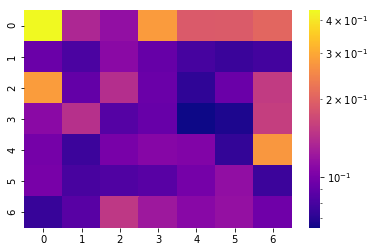

[[0.436 0.135 0.115 0.28  0.189 0.191 0.206]
 [0.094 0.081 0.11  0.092 0.079 0.075 0.078]
 [0.282 0.091 0.141 0.094 0.072 0.094 0.154]
 [0.11  0.143 0.085 0.093 0.064 0.067 0.158]
 [0.099 0.076 0.101 0.108 0.105 0.073 0.273]
 [0.101 0.08  0.083 0.086 0.099 0.114 0.076]
 [0.074 0.086 0.151 0.122 0.109 0.116 0.096]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


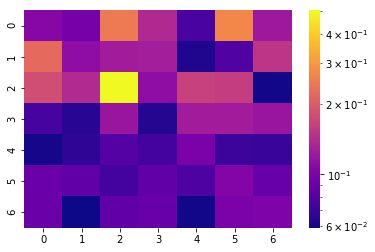

[[0.106 0.097 0.247 0.138 0.076 0.269 0.122]
 [0.223 0.112 0.125 0.127 0.063 0.079 0.151]
 [0.181 0.139 0.503 0.112 0.164 0.16  0.06 ]
 [0.075 0.065 0.119 0.064 0.125 0.125 0.119]
 [0.061 0.067 0.081 0.074 0.099 0.071 0.07 ]
 [0.09  0.086 0.074 0.086 0.078 0.104 0.089]
 [0.09  0.059 0.086 0.089 0.06  0.099 0.101]]


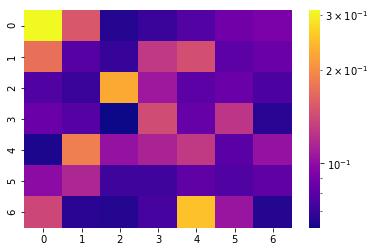

[[0.311 0.152 0.066 0.071 0.078 0.088 0.092]
 [0.174 0.079 0.07  0.128 0.146 0.081 0.086]
 [0.077 0.071 0.227 0.107 0.081 0.086 0.076]
 [0.085 0.079 0.062 0.143 0.084 0.126 0.067]
 [0.064 0.186 0.103 0.114 0.129 0.08  0.103]
 [0.099 0.116 0.072 0.072 0.082 0.077 0.082]
 [0.139 0.067 0.066 0.074 0.252 0.105 0.066]]


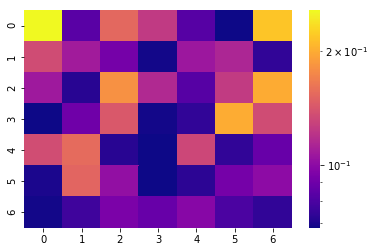

[[0.256 0.084 0.153 0.124 0.083 0.068 0.218]
 [0.135 0.108 0.092 0.069 0.106 0.113 0.074]
 [0.107 0.072 0.181 0.115 0.083 0.125 0.199]
 [0.068 0.09  0.143 0.069 0.074 0.2   0.135]
 [0.136 0.155 0.072 0.068 0.132 0.074 0.088]
 [0.07  0.151 0.102 0.068 0.073 0.092 0.1  ]
 [0.069 0.077 0.094 0.088 0.098 0.08  0.074]]


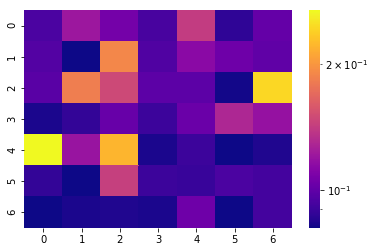

[[0.094 0.121 0.106 0.093 0.141 0.087 0.101]
 [0.096 0.081 0.19  0.095 0.114 0.104 0.1  ]
 [0.098 0.184 0.149 0.099 0.099 0.082 0.244]
 [0.083 0.088 0.102 0.09  0.103 0.129 0.118]
 [0.269 0.119 0.221 0.083 0.09  0.081 0.084]
 [0.088 0.081 0.143 0.09  0.089 0.094 0.092]
 [0.081 0.083 0.084 0.083 0.104 0.081 0.092]]


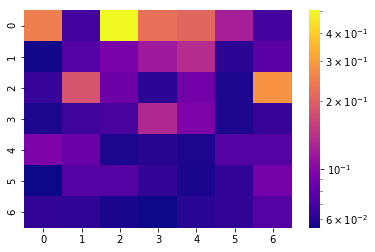

[[0.251 0.069 0.501 0.226 0.21  0.122 0.07 ]
 [0.056 0.076 0.093 0.117 0.135 0.062 0.078]
 [0.065 0.183 0.087 0.062 0.089 0.058 0.285]
 [0.058 0.068 0.071 0.132 0.095 0.058 0.065]
 [0.095 0.085 0.058 0.06  0.058 0.076 0.076]
 [0.055 0.076 0.076 0.064 0.057 0.064 0.091]
 [0.064 0.063 0.057 0.055 0.061 0.064 0.076]]


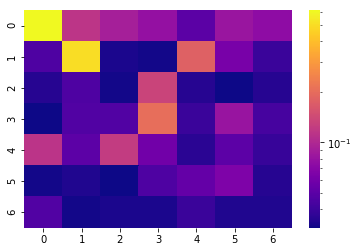

[[0.612 0.115 0.091 0.078 0.05  0.082 0.075]
 [0.046 0.505 0.033 0.032 0.18  0.063 0.04 ]
 [0.035 0.046 0.032 0.134 0.035 0.031 0.035]
 [0.031 0.047 0.047 0.204 0.04  0.081 0.043]
 [0.113 0.051 0.124 0.059 0.036 0.051 0.039]
 [0.032 0.034 0.031 0.046 0.054 0.066 0.035]
 [0.047 0.032 0.033 0.033 0.04  0.034 0.034]]
SKIPPPPPPEDDDD


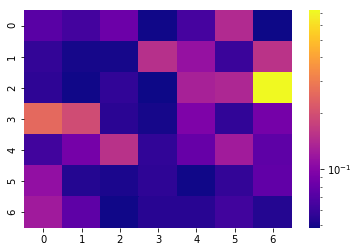

[[0.074 0.064 0.084 0.049 0.065 0.142 0.048]
 [0.058 0.05  0.05  0.15  0.113 0.06  0.154]
 [0.056 0.049 0.057 0.048 0.13  0.138 0.719]
 [0.253 0.195 0.055 0.05  0.095 0.057 0.089]
 [0.063 0.089 0.153 0.057 0.08  0.124 0.076]
 [0.11  0.053 0.051 0.056 0.049 0.058 0.078]
 [0.123 0.076 0.049 0.054 0.054 0.063 0.053]]


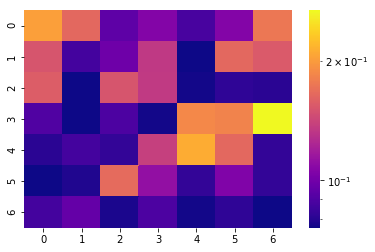

[[0.203 0.164 0.094 0.106 0.088 0.106 0.175]
 [0.152 0.087 0.099 0.134 0.076 0.164 0.155]
 [0.157 0.076 0.152 0.135 0.077 0.082 0.081]
 [0.09  0.076 0.089 0.077 0.187 0.183 0.268]
 [0.081 0.087 0.083 0.138 0.212 0.164 0.083]
 [0.076 0.079 0.167 0.112 0.083 0.105 0.083]
 [0.087 0.096 0.078 0.089 0.077 0.082 0.076]]


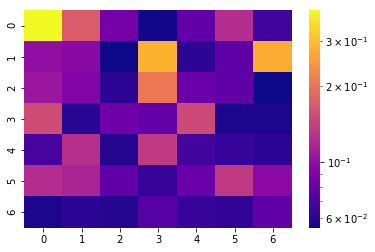

[[0.397 0.169 0.086 0.056 0.078 0.124 0.066]
 [0.1   0.096 0.055 0.284 0.061 0.077 0.276]
 [0.106 0.092 0.061 0.204 0.081 0.078 0.055]
 [0.152 0.06  0.084 0.079 0.149 0.058 0.058]
 [0.069 0.126 0.059 0.135 0.067 0.064 0.061]
 [0.123 0.117 0.078 0.064 0.081 0.135 0.097]
 [0.058 0.061 0.059 0.074 0.064 0.063 0.078]]


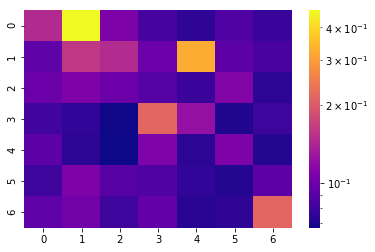

[[0.146 0.466 0.108 0.083 0.075 0.088 0.078]
 [0.093 0.159 0.147 0.1   0.325 0.092 0.084]
 [0.1   0.108 0.1   0.089 0.079 0.111 0.074]
 [0.081 0.076 0.068 0.216 0.122 0.071 0.08 ]
 [0.092 0.074 0.067 0.109 0.074 0.108 0.072]
 [0.08  0.108 0.09  0.087 0.076 0.072 0.092]
 [0.093 0.103 0.08  0.095 0.073 0.075 0.216]]


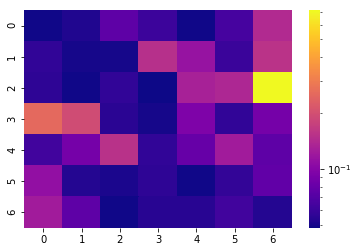

[[0.049 0.052 0.076 0.061 0.049 0.065 0.142]
 [0.057 0.05  0.05  0.15  0.113 0.06  0.154]
 [0.056 0.049 0.057 0.048 0.13  0.138 0.718]
 [0.253 0.195 0.055 0.05  0.095 0.057 0.089]
 [0.063 0.089 0.153 0.057 0.08  0.124 0.076]
 [0.11  0.053 0.051 0.056 0.049 0.058 0.078]
 [0.123 0.076 0.049 0.054 0.054 0.063 0.053]]


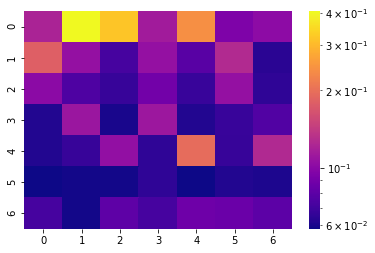

[[0.121 0.405 0.318 0.114 0.241 0.095 0.102]
 [0.18  0.106 0.072 0.106 0.078 0.126 0.064]
 [0.101 0.075 0.067 0.089 0.068 0.106 0.065]
 [0.062 0.11  0.06  0.111 0.062 0.068 0.076]
 [0.062 0.067 0.105 0.065 0.196 0.067 0.125]
 [0.058 0.059 0.059 0.065 0.058 0.062 0.061]
 [0.072 0.059 0.081 0.072 0.087 0.086 0.08 ]]


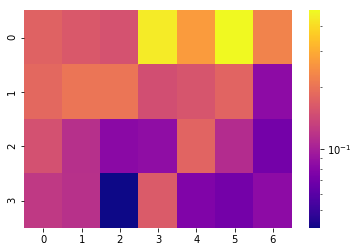

[[0.175 0.162 0.153 0.437 0.27  0.476 0.227]
 [0.184 0.204 0.204 0.149 0.157 0.178 0.084]
 [0.152 0.115 0.082 0.085 0.178 0.112 0.071]
 [0.124 0.116 0.041 0.165 0.077 0.071 0.084]]


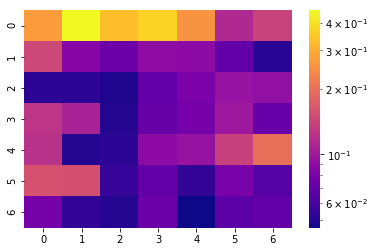

[[0.271 0.458 0.331 0.375 0.256 0.114 0.141]
 [0.147 0.086 0.074 0.091 0.09  0.07  0.051]
 [0.052 0.052 0.049 0.07  0.08  0.096 0.093]
 [0.126 0.108 0.05  0.071 0.078 0.101 0.072]
 [0.123 0.05  0.052 0.09  0.096 0.14  0.198]
 [0.158 0.155 0.055 0.07  0.054 0.079 0.064]
 [0.078 0.054 0.05  0.074 0.046 0.067 0.07 ]]


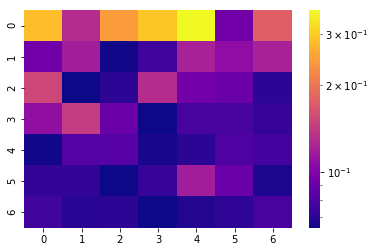

[[0.283 0.13  0.243 0.294 0.361 0.093 0.176]
 [0.093 0.118 0.065 0.075 0.121 0.107 0.121]
 [0.153 0.064 0.07  0.13  0.093 0.09  0.07 ]
 [0.108 0.144 0.09  0.064 0.078 0.078 0.073]
 [0.065 0.082 0.083 0.066 0.07  0.08  0.077]
 [0.072 0.072 0.064 0.073 0.118 0.09  0.067]
 [0.076 0.069 0.07  0.064 0.068 0.071 0.078]]


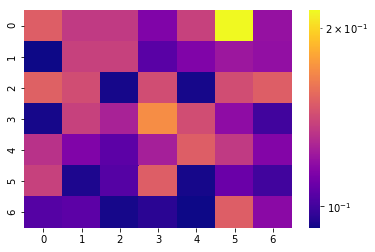

[[0.15  0.135 0.135 0.114 0.138 0.214 0.12 ]
 [0.092 0.138 0.138 0.105 0.114 0.122 0.119]
 [0.151 0.143 0.093 0.143 0.093 0.143 0.15 ]
 [0.093 0.138 0.126 0.17  0.143 0.118 0.1  ]
 [0.132 0.114 0.106 0.125 0.15  0.135 0.115]
 [0.138 0.094 0.104 0.15  0.093 0.109 0.1  ]
 [0.104 0.106 0.093 0.096 0.092 0.15  0.117]]


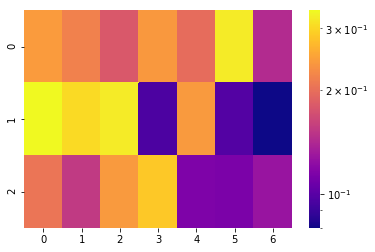

[[0.242 0.217 0.179 0.239 0.198 0.323 0.143]
 [0.338 0.304 0.323 0.096 0.241 0.098 0.08 ]
 [0.205 0.154 0.241 0.286 0.115 0.114 0.127]]


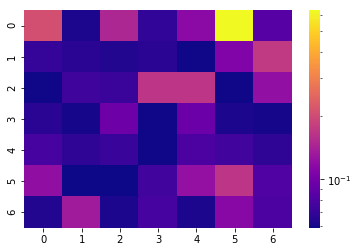

[[0.207 0.062 0.148 0.069 0.116 0.628 0.084]
 [0.07  0.066 0.064 0.066 0.06  0.108 0.173]
 [0.06  0.074 0.072 0.167 0.167 0.06  0.122]
 [0.066 0.061 0.097 0.06  0.096 0.062 0.061]
 [0.077 0.068 0.071 0.06  0.08  0.075 0.068]
 [0.121 0.059 0.059 0.075 0.123 0.167 0.082]
 [0.064 0.134 0.062 0.077 0.062 0.114 0.08 ]]


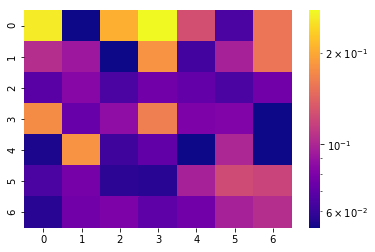

[[0.263 0.053 0.206 0.277 0.127 0.065 0.156]
 [0.105 0.092 0.053 0.182 0.063 0.097 0.156]
 [0.069 0.083 0.065 0.076 0.072 0.065 0.076]
 [0.176 0.073 0.087 0.164 0.08  0.081 0.053]
 [0.055 0.181 0.062 0.071 0.053 0.1   0.053]
 [0.065 0.078 0.058 0.057 0.097 0.124 0.119]
 [0.057 0.076 0.08  0.07  0.076 0.097 0.105]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


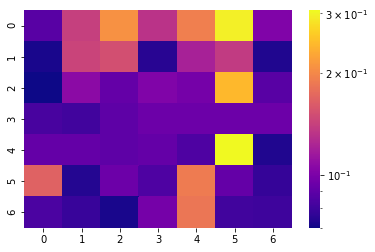

[[0.088 0.141 0.208 0.132 0.192 0.296 0.102]
 [0.072 0.144 0.153 0.075 0.121 0.138 0.073]
 [0.07  0.107 0.092 0.102 0.098 0.244 0.088]
 [0.083 0.081 0.09  0.095 0.095 0.095 0.095]
 [0.092 0.092 0.09  0.092 0.085 0.306 0.073]
 [0.168 0.074 0.095 0.085 0.189 0.092 0.078]
 [0.084 0.079 0.072 0.098 0.185 0.081 0.08 ]]


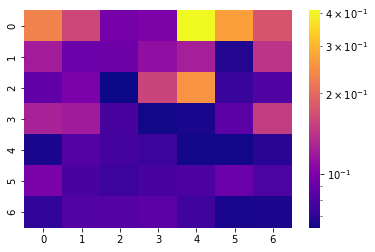

[[0.232 0.161 0.097 0.1   0.408 0.271 0.175]
 [0.121 0.092 0.093 0.111 0.124 0.067 0.142]
 [0.088 0.099 0.063 0.158 0.253 0.073 0.081]
 [0.126 0.12  0.078 0.064 0.065 0.085 0.15 ]
 [0.065 0.083 0.077 0.074 0.064 0.064 0.069]
 [0.099 0.078 0.074 0.078 0.08  0.091 0.079]
 [0.071 0.082 0.083 0.086 0.075 0.065 0.066]]


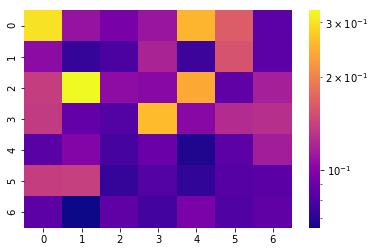

[[0.301 0.109 0.095 0.11  0.25  0.165 0.085]
 [0.104 0.073 0.08  0.12  0.075 0.156 0.085]
 [0.139 0.328 0.105 0.102 0.238 0.086 0.117]
 [0.137 0.088 0.082 0.259 0.102 0.125 0.128]
 [0.084 0.1   0.078 0.09  0.068 0.085 0.115]
 [0.139 0.14  0.073 0.082 0.072 0.083 0.084]
 [0.085 0.065 0.086 0.077 0.096 0.081 0.086]]


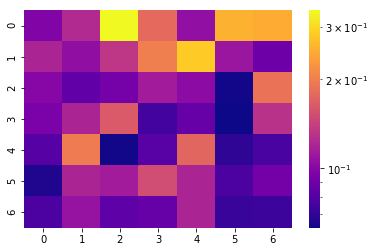

[[0.098 0.124 0.342 0.18  0.106 0.255 0.248]
 [0.12  0.105 0.133 0.201 0.283 0.11  0.09 ]
 [0.1   0.085 0.093 0.114 0.103 0.064 0.188]
 [0.095 0.12  0.164 0.075 0.087 0.063 0.13 ]
 [0.081 0.197 0.064 0.082 0.176 0.07  0.077]
 [0.066 0.12  0.114 0.152 0.12  0.078 0.092]
 [0.078 0.108 0.084 0.087 0.12  0.072 0.073]]


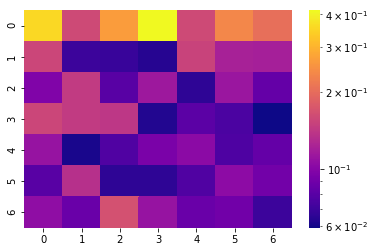

[[0.359 0.16  0.266 0.415 0.159 0.236 0.204]
 [0.156 0.07  0.069 0.064 0.152 0.121 0.119]
 [0.097 0.144 0.08  0.114 0.066 0.112 0.085]
 [0.156 0.144 0.14  0.063 0.081 0.075 0.059]
 [0.11  0.061 0.077 0.094 0.103 0.076 0.085]
 [0.08  0.134 0.066 0.066 0.077 0.104 0.091]
 [0.106 0.087 0.167 0.11  0.087 0.09  0.07 ]]


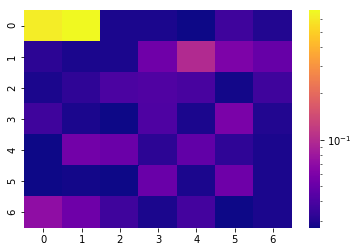

[[0.627 0.685 0.029 0.029 0.027 0.037 0.03 ]
 [0.032 0.029 0.029 0.054 0.098 0.06  0.05 ]
 [0.029 0.033 0.04  0.042 0.039 0.028 0.037]
 [0.037 0.029 0.027 0.041 0.029 0.059 0.03 ]
 [0.027 0.055 0.052 0.032 0.048 0.033 0.029]
 [0.027 0.028 0.027 0.051 0.029 0.053 0.029]
 [0.071 0.053 0.037 0.029 0.038 0.027 0.029]]


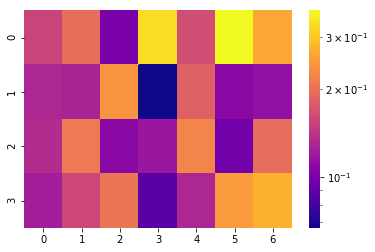

[[0.155 0.197 0.101 0.332 0.163 0.37  0.262]
 [0.13  0.128 0.242 0.067 0.183 0.109 0.113]
 [0.134 0.21  0.109 0.118 0.224 0.097 0.195]
 [0.123 0.158 0.206 0.088 0.13  0.248 0.276]]


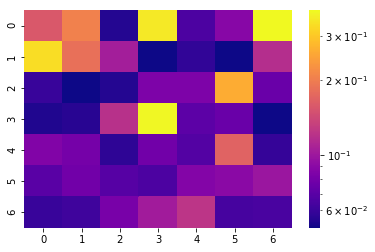

[[0.158 0.206 0.055 0.353 0.066 0.089 0.381]
 [0.334 0.184 0.105 0.051 0.058 0.051 0.117]
 [0.06  0.051 0.055 0.084 0.084 0.262 0.076]
 [0.054 0.056 0.12  0.376 0.071 0.076 0.051]
 [0.086 0.081 0.057 0.079 0.068 0.169 0.059]
 [0.07  0.079 0.069 0.066 0.087 0.09  0.099]
 [0.06  0.062 0.082 0.103 0.123 0.064 0.065]]


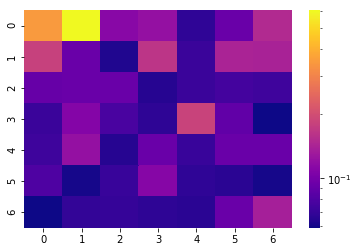

[[0.347 0.602 0.113 0.121 0.068 0.093 0.15 ]
 [0.18  0.093 0.063 0.164 0.072 0.141 0.14 ]
 [0.092 0.093 0.093 0.065 0.072 0.076 0.074]
 [0.072 0.11  0.078 0.067 0.182 0.089 0.059]
 [0.073 0.121 0.065 0.093 0.071 0.093 0.093]
 [0.08  0.061 0.071 0.111 0.068 0.066 0.061]
 [0.059 0.069 0.07  0.067 0.066 0.093 0.137]]


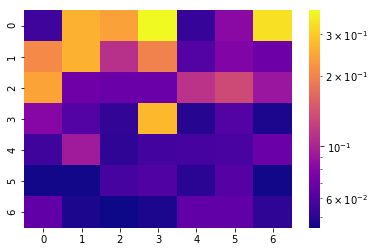

[[0.055 0.263 0.24  0.38  0.053 0.082 0.338]
 [0.207 0.262 0.111 0.197 0.061 0.078 0.07 ]
 [0.244 0.071 0.069 0.069 0.113 0.134 0.091]
 [0.08  0.061 0.052 0.274 0.049 0.061 0.047]
 [0.055 0.094 0.051 0.056 0.057 0.058 0.069]
 [0.046 0.046 0.057 0.06  0.05  0.062 0.046]
 [0.066 0.047 0.045 0.047 0.066 0.066 0.051]]


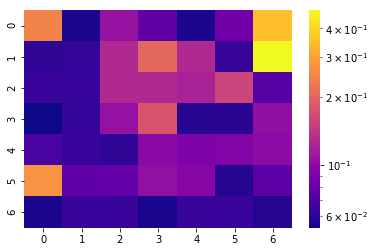

[[0.249 0.056 0.107 0.078 0.056 0.085 0.354]
 [0.06  0.062 0.127 0.204 0.127 0.063 0.48 ]
 [0.063 0.063 0.127 0.127 0.121 0.158 0.073]
 [0.053 0.062 0.106 0.177 0.058 0.059 0.103]
 [0.069 0.063 0.06  0.099 0.092 0.094 0.101]
 [0.272 0.078 0.08  0.104 0.096 0.058 0.076]
 [0.056 0.063 0.063 0.055 0.063 0.063 0.058]]


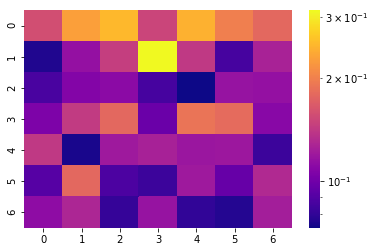

[[0.157 0.228 0.25  0.15  0.243 0.198 0.178]
 [0.076 0.115 0.145 0.314 0.141 0.086 0.126]
 [0.087 0.107 0.111 0.086 0.073 0.116 0.115]
 [0.105 0.143 0.178 0.098 0.189 0.181 0.11 ]
 [0.141 0.075 0.12  0.125 0.118 0.119 0.083]
 [0.091 0.178 0.088 0.083 0.12  0.096 0.13 ]
 [0.112 0.128 0.081 0.116 0.08  0.077 0.123]]


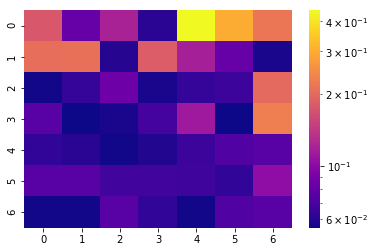

[[0.176 0.082 0.12  0.061 0.445 0.302 0.217]
 [0.206 0.209 0.06  0.184 0.117 0.082 0.057]
 [0.056 0.064 0.085 0.057 0.064 0.066 0.199]
 [0.076 0.055 0.057 0.069 0.112 0.055 0.228]
 [0.063 0.061 0.056 0.059 0.066 0.073 0.076]
 [0.076 0.076 0.068 0.068 0.067 0.063 0.103]
 [0.056 0.056 0.076 0.063 0.056 0.073 0.076]]
SKIPPPPPPEDDDD


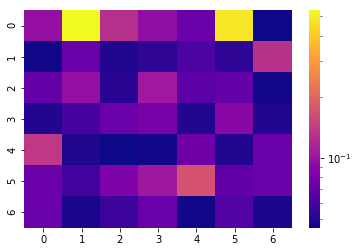

[[0.097 0.534 0.126 0.095 0.073 0.479 0.045]
 [0.046 0.073 0.049 0.052 0.061 0.052 0.128]
 [0.071 0.097 0.051 0.105 0.067 0.071 0.046]
 [0.049 0.059 0.074 0.081 0.049 0.09  0.049]
 [0.136 0.049 0.045 0.046 0.076 0.049 0.073]
 [0.075 0.058 0.084 0.104 0.17  0.07  0.073]
 [0.073 0.047 0.056 0.073 0.046 0.064 0.048]]


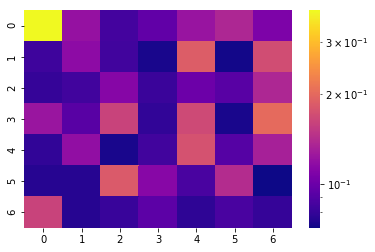

[[0.383 0.121 0.085 0.096 0.122 0.137 0.108]
 [0.083 0.116 0.084 0.073 0.188 0.072 0.171]
 [0.08  0.084 0.112 0.082 0.1   0.092 0.137]
 [0.123 0.092 0.161 0.079 0.168 0.073 0.202]
 [0.079 0.118 0.073 0.084 0.176 0.091 0.131]
 [0.076 0.076 0.184 0.113 0.087 0.141 0.071]
 [0.161 0.076 0.081 0.094 0.078 0.087 0.08 ]]


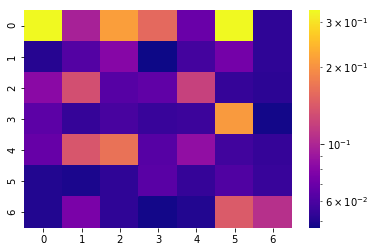

[[0.332 0.097 0.214 0.157 0.069 0.333 0.053]
 [0.051 0.062 0.08  0.047 0.058 0.073 0.053]
 [0.082 0.132 0.063 0.066 0.12  0.054 0.052]
 [0.065 0.054 0.059 0.055 0.056 0.21  0.048]
 [0.068 0.139 0.167 0.063 0.085 0.057 0.054]
 [0.05  0.049 0.053 0.064 0.054 0.061 0.055]
 [0.05  0.075 0.053 0.048 0.05  0.143 0.107]]


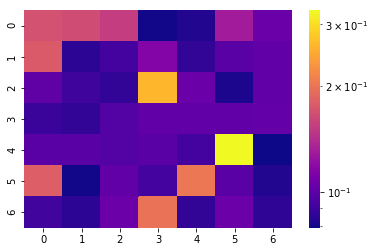

[[0.169 0.165 0.154 0.08  0.083 0.13  0.105]
 [0.177 0.085 0.092 0.115 0.087 0.099 0.102]
 [0.101 0.09  0.087 0.262 0.105 0.082 0.102]
 [0.089 0.087 0.097 0.102 0.102 0.102 0.103]
 [0.099 0.099 0.097 0.099 0.092 0.329 0.079]
 [0.181 0.08  0.102 0.092 0.203 0.099 0.083]
 [0.091 0.085 0.106 0.199 0.087 0.106 0.086]]


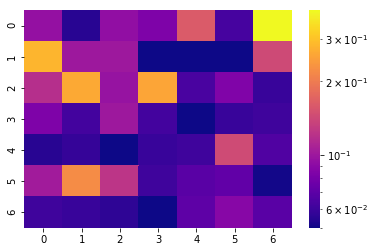

[[0.095 0.055 0.093 0.084 0.161 0.063 0.392]
 [0.281 0.1   0.1   0.05  0.05  0.05  0.143]
 [0.118 0.263 0.096 0.257 0.064 0.085 0.059]
 [0.084 0.062 0.1   0.062 0.05  0.059 0.061]
 [0.055 0.058 0.05  0.059 0.061 0.144 0.066]
 [0.103 0.222 0.124 0.061 0.069 0.072 0.051]
 [0.061 0.059 0.056 0.05  0.071 0.088 0.069]]


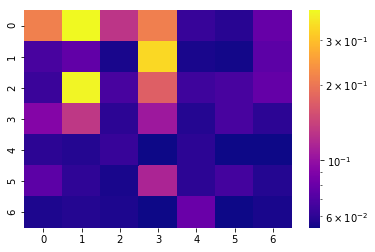

[[0.213 0.395 0.129 0.211 0.063 0.059 0.079]
 [0.068 0.077 0.056 0.339 0.056 0.055 0.075]
 [0.064 0.388 0.068 0.172 0.065 0.068 0.078]
 [0.092 0.132 0.06  0.106 0.058 0.068 0.06 ]
 [0.06  0.058 0.063 0.054 0.06  0.054 0.054]
 [0.075 0.061 0.056 0.115 0.06  0.067 0.058]
 [0.057 0.058 0.057 0.054 0.08  0.054 0.056]]


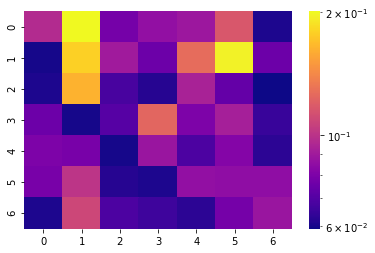

[[0.097 0.201 0.078 0.086 0.089 0.117 0.061]
 [0.06  0.179 0.09  0.076 0.127 0.197 0.076]
 [0.061 0.163 0.068 0.062 0.093 0.074 0.059]
 [0.076 0.06  0.071 0.124 0.08  0.092 0.065]
 [0.08  0.079 0.06  0.088 0.069 0.082 0.063]
 [0.079 0.101 0.062 0.061 0.086 0.085 0.085]
 [0.061 0.109 0.069 0.066 0.063 0.078 0.088]]


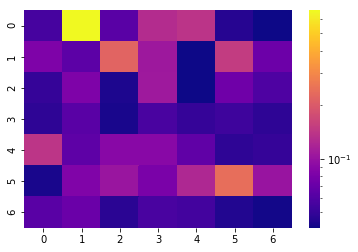

[[0.056 0.673 0.064 0.129 0.139 0.046 0.041]
 [0.083 0.065 0.219 0.106 0.041 0.149 0.073]
 [0.05  0.083 0.044 0.107 0.041 0.074 0.059]
 [0.048 0.064 0.043 0.057 0.05  0.053 0.048]
 [0.14  0.066 0.09  0.09  0.067 0.048 0.05 ]
 [0.043 0.084 0.102 0.08  0.123 0.239 0.101]
 [0.064 0.072 0.047 0.057 0.055 0.045 0.042]]


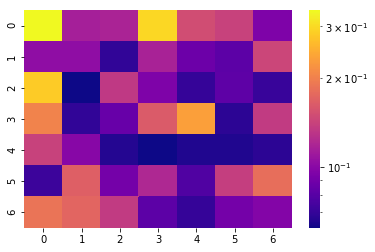

[[0.34  0.115 0.118 0.297 0.151 0.141 0.095]
 [0.103 0.103 0.069 0.117 0.088 0.082 0.145]
 [0.283 0.062 0.134 0.095 0.07  0.083 0.071]
 [0.203 0.069 0.086 0.163 0.233 0.068 0.135]
 [0.141 0.099 0.066 0.062 0.065 0.065 0.068]
 [0.072 0.168 0.091 0.121 0.078 0.138 0.181]
 [0.188 0.173 0.135 0.082 0.07  0.091 0.097]]


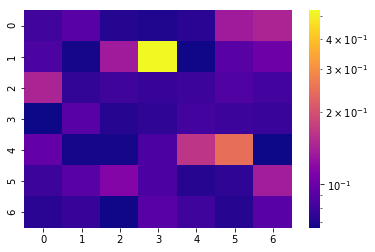

[[0.081 0.091 0.071 0.07  0.073 0.135 0.146]
 [0.085 0.068 0.135 0.526 0.067 0.091 0.102]
 [0.145 0.076 0.08  0.077 0.079 0.088 0.082]
 [0.066 0.091 0.072 0.075 0.082 0.079 0.078]
 [0.096 0.068 0.068 0.086 0.164 0.246 0.066]
 [0.079 0.091 0.114 0.086 0.072 0.075 0.138]
 [0.073 0.077 0.067 0.091 0.08  0.072 0.091]]


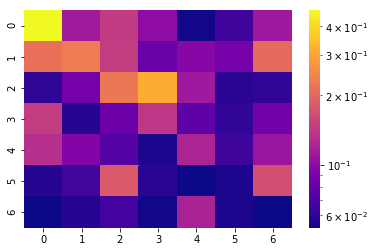

[[0.47  0.113 0.144 0.101 0.054 0.065 0.112]
 [0.213 0.231 0.146 0.082 0.096 0.087 0.204]
 [0.06  0.087 0.224 0.313 0.112 0.059 0.061]
 [0.146 0.058 0.083 0.139 0.077 0.061 0.086]
 [0.131 0.095 0.073 0.056 0.122 0.065 0.108]
 [0.058 0.066 0.182 0.059 0.053 0.056 0.168]
 [0.053 0.058 0.067 0.054 0.121 0.056 0.053]]


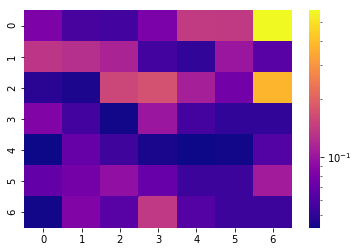

[[0.082 0.058 0.056 0.081 0.141 0.14  0.574]
 [0.134 0.126 0.114 0.056 0.051 0.101 0.064]
 [0.049 0.046 0.157 0.172 0.11  0.076 0.378]
 [0.084 0.056 0.044 0.101 0.057 0.051 0.051]
 [0.043 0.07  0.055 0.045 0.043 0.044 0.062]
 [0.069 0.077 0.095 0.071 0.054 0.054 0.106]
 [0.044 0.084 0.064 0.139 0.063 0.054 0.054]]


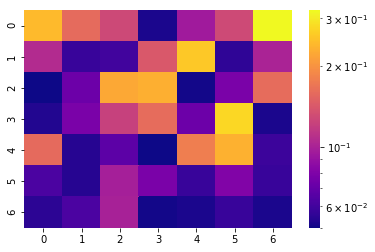

[[0.243 0.159 0.128 0.052 0.095 0.129 0.321]
 [0.106 0.058 0.06  0.142 0.259 0.056 0.101]
 [0.05  0.073 0.222 0.23  0.051 0.078 0.161]
 [0.053 0.078 0.122 0.16  0.073 0.277 0.052]
 [0.158 0.054 0.068 0.05  0.178 0.233 0.059]
 [0.063 0.054 0.098 0.078 0.058 0.081 0.058]
 [0.055 0.063 0.099 0.051 0.052 0.058 0.052]]


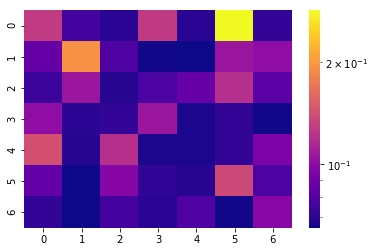

[[0.128 0.076 0.07  0.127 0.07  0.285 0.072]
 [0.086 0.194 0.079 0.066 0.065 0.106 0.101]
 [0.074 0.106 0.069 0.078 0.086 0.12  0.083]
 [0.101 0.07  0.072 0.106 0.067 0.072 0.066]
 [0.142 0.069 0.121 0.067 0.067 0.072 0.094]
 [0.085 0.065 0.097 0.071 0.069 0.137 0.078]
 [0.072 0.065 0.076 0.07  0.08  0.066 0.098]]


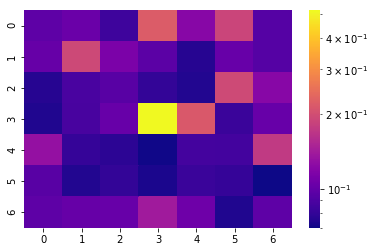

[[0.098 0.105 0.084 0.219 0.121 0.188 0.094]
 [0.102 0.193 0.114 0.097 0.076 0.103 0.094]
 [0.076 0.089 0.095 0.08  0.075 0.194 0.121]
 [0.074 0.088 0.103 0.516 0.214 0.083 0.103]
 [0.13  0.081 0.078 0.071 0.087 0.086 0.174]
 [0.095 0.075 0.08  0.073 0.083 0.081 0.07 ]
 [0.098 0.102 0.103 0.14  0.106 0.074 0.098]]


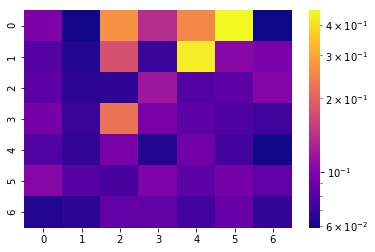

[[0.098 0.06  0.27  0.136 0.253 0.459 0.059]
 [0.08  0.063 0.177 0.07  0.429 0.103 0.097]
 [0.082 0.066 0.067 0.117 0.079 0.083 0.102]
 [0.095 0.07  0.222 0.096 0.082 0.077 0.072]
 [0.078 0.068 0.096 0.063 0.092 0.073 0.06 ]
 [0.104 0.08  0.075 0.099 0.083 0.094 0.085]
 [0.063 0.066 0.086 0.084 0.073 0.088 0.068]]


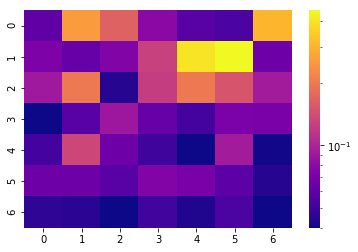

[[0.061 0.255 0.168 0.079 0.058 0.054 0.302]
 [0.073 0.063 0.075 0.127 0.398 0.449 0.066]
 [0.091 0.201 0.044 0.124 0.2   0.151 0.093]
 [0.04  0.058 0.09  0.063 0.052 0.072 0.071]
 [0.052 0.135 0.066 0.05  0.04  0.093 0.041]
 [0.066 0.066 0.058 0.075 0.071 0.059 0.044]
 [0.046 0.045 0.04  0.051 0.043 0.054 0.04 ]]


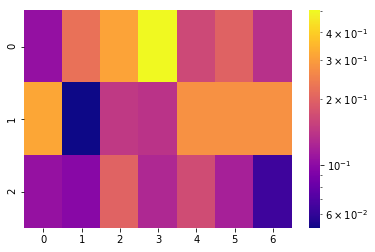

[[0.105 0.224 0.313 0.503 0.164 0.199 0.136]
 [0.319 0.052 0.145 0.138 0.28  0.28  0.28 ]
 [0.106 0.098 0.201 0.127 0.168 0.119 0.064]]
SKIPPPPPPEDDDD


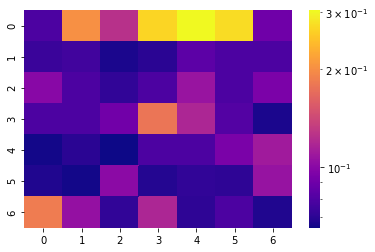

[[0.079 0.203 0.125 0.267 0.304 0.274 0.09 ]
 [0.074 0.076 0.067 0.07  0.084 0.079 0.079]
 [0.1   0.079 0.072 0.079 0.107 0.079 0.095]
 [0.079 0.079 0.091 0.178 0.118 0.081 0.067]
 [0.066 0.07  0.065 0.079 0.079 0.094 0.111]
 [0.068 0.066 0.101 0.069 0.072 0.071 0.106]
 [0.185 0.105 0.072 0.118 0.071 0.079 0.068]]


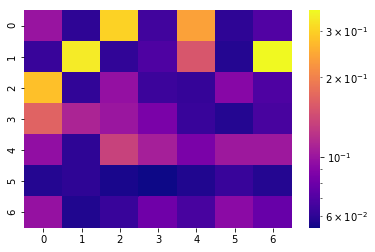

[[0.099 0.06  0.3   0.065 0.238 0.06  0.07 ]
 [0.063 0.336 0.061 0.069 0.154 0.058 0.358]
 [0.277 0.061 0.097 0.064 0.062 0.091 0.069]
 [0.167 0.111 0.101 0.085 0.063 0.058 0.067]
 [0.096 0.06  0.134 0.107 0.085 0.102 0.102]
 [0.058 0.06  0.056 0.054 0.057 0.063 0.058]
 [0.098 0.057 0.063 0.081 0.067 0.093 0.078]]


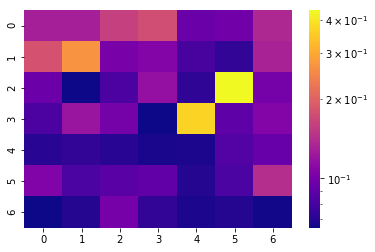

[[0.129 0.129 0.16  0.175 0.095 0.098 0.137]
 [0.18  0.268 0.102 0.108 0.081 0.074 0.132]
 [0.096 0.065 0.083 0.117 0.073 0.434 0.1  ]
 [0.083 0.121 0.1   0.065 0.368 0.09  0.108]
 [0.071 0.074 0.071 0.067 0.068 0.085 0.094]
 [0.106 0.082 0.088 0.091 0.07  0.082 0.142]
 [0.065 0.07  0.101 0.074 0.068 0.07  0.066]]


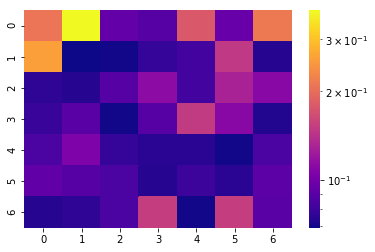

[[0.209 0.376 0.094 0.089 0.178 0.096 0.214]
 [0.258 0.069 0.07  0.078 0.082 0.148 0.074]
 [0.076 0.074 0.089 0.113 0.082 0.13  0.111]
 [0.079 0.09  0.07  0.089 0.15  0.111 0.073]
 [0.085 0.106 0.078 0.075 0.075 0.07  0.085]
 [0.093 0.089 0.085 0.074 0.08  0.075 0.091]
 [0.074 0.076 0.085 0.153 0.07  0.153 0.09 ]]


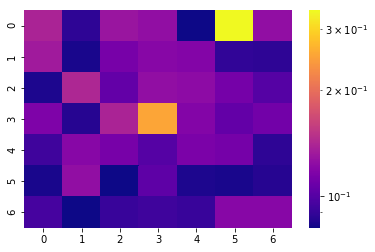

[[0.139 0.088 0.129 0.125 0.081 0.338 0.125]
 [0.133 0.083 0.113 0.12  0.118 0.089 0.088]
 [0.084 0.141 0.105 0.125 0.123 0.112 0.1  ]
 [0.116 0.086 0.139 0.252 0.118 0.105 0.111]
 [0.093 0.12  0.113 0.1   0.115 0.112 0.088]
 [0.083 0.125 0.081 0.103 0.084 0.083 0.086]
 [0.095 0.081 0.091 0.093 0.091 0.12  0.12 ]]


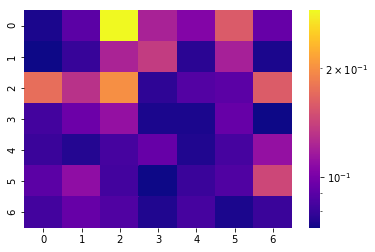

[[0.074 0.09  0.29  0.121 0.104 0.159 0.094]
 [0.072 0.08  0.122 0.137 0.077 0.12  0.074]
 [0.173 0.131 0.2   0.078 0.088 0.09  0.16 ]
 [0.083 0.096 0.111 0.074 0.074 0.094 0.072]
 [0.081 0.076 0.084 0.094 0.075 0.084 0.111]
 [0.09  0.109 0.083 0.072 0.081 0.087 0.145]
 [0.083 0.094 0.087 0.075 0.084 0.074 0.081]]


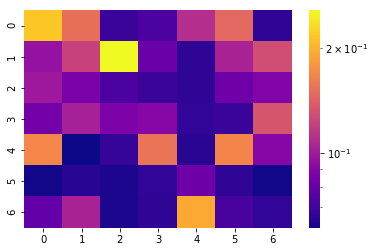

[[0.216 0.152 0.069 0.073 0.11  0.147 0.066]
 [0.096 0.122 0.256 0.081 0.066 0.104 0.129]
 [0.099 0.086 0.073 0.069 0.066 0.083 0.088]
 [0.084 0.103 0.087 0.09  0.067 0.069 0.133]
 [0.169 0.061 0.068 0.155 0.065 0.168 0.09 ]
 [0.062 0.065 0.063 0.067 0.083 0.066 0.062]
 [0.079 0.104 0.063 0.066 0.194 0.072 0.067]]


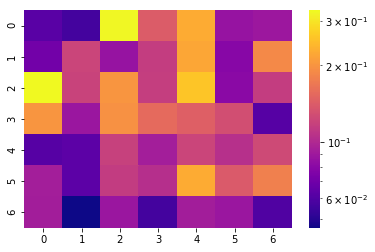

[[0.063 0.057 0.324 0.142 0.227 0.086 0.089]
 [0.071 0.122 0.086 0.115 0.222 0.079 0.188]
 [0.329 0.12  0.202 0.116 0.258 0.08  0.115]
 [0.202 0.088 0.197 0.156 0.145 0.129 0.062]
 [0.062 0.064 0.118 0.093 0.122 0.105 0.125]
 [0.093 0.064 0.114 0.104 0.227 0.14  0.178]
 [0.092 0.046 0.088 0.057 0.092 0.088 0.06 ]]


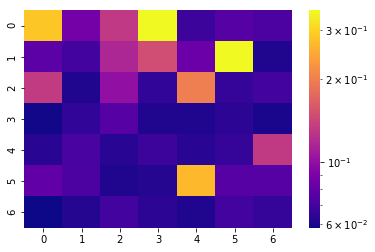

[[0.284 0.087 0.131 0.353 0.068 0.076 0.073]
 [0.078 0.07  0.116 0.149 0.084 0.351 0.061]
 [0.133 0.061 0.101 0.065 0.199 0.066 0.07 ]
 [0.059 0.065 0.076 0.061 0.061 0.064 0.06 ]
 [0.063 0.072 0.063 0.068 0.063 0.066 0.132]
 [0.08  0.073 0.061 0.062 0.268 0.076 0.076]
 [0.058 0.062 0.07  0.064 0.061 0.07  0.066]]


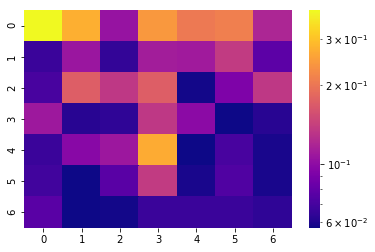

[[0.385 0.275 0.105 0.243 0.203 0.211 0.119]
 [0.067 0.107 0.065 0.112 0.11  0.137 0.078]
 [0.071 0.173 0.134 0.173 0.058 0.092 0.134]
 [0.109 0.062 0.064 0.134 0.099 0.057 0.062]
 [0.067 0.097 0.108 0.268 0.057 0.071 0.059]
 [0.069 0.057 0.077 0.137 0.059 0.074 0.059]
 [0.077 0.057 0.058 0.067 0.067 0.067 0.064]]


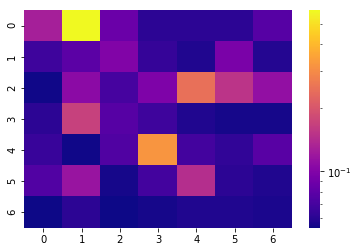

[[0.127 0.578 0.087 0.061 0.061 0.061 0.077]
 [0.067 0.079 0.1   0.064 0.058 0.095 0.059]
 [0.055 0.107 0.07  0.098 0.246 0.152 0.112]
 [0.061 0.168 0.077 0.067 0.058 0.056 0.056]
 [0.065 0.055 0.074 0.321 0.069 0.063 0.078]
 [0.075 0.116 0.056 0.069 0.143 0.061 0.058]
 [0.054 0.061 0.054 0.056 0.058 0.058 0.057]]


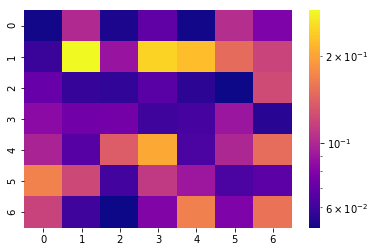

[[0.052 0.101 0.053 0.069 0.052 0.104 0.079]
 [0.059 0.287 0.089 0.247 0.225 0.15  0.119]
 [0.071 0.058 0.057 0.067 0.056 0.051 0.124]
 [0.084 0.074 0.075 0.06  0.062 0.09  0.055]
 [0.098 0.066 0.138 0.204 0.063 0.1   0.151]
 [0.169 0.122 0.061 0.112 0.091 0.063 0.068]
 [0.118 0.06  0.051 0.08  0.168 0.079 0.156]]


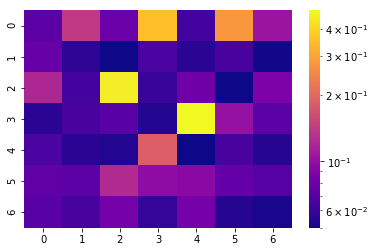

[[0.072 0.139 0.079 0.352 0.063 0.279 0.105]
 [0.077 0.057 0.05  0.066 0.056 0.065 0.051]
 [0.121 0.064 0.457 0.06  0.081 0.05  0.088]
 [0.056 0.065 0.071 0.054 0.484 0.101 0.072]
 [0.066 0.056 0.054 0.186 0.05  0.065 0.055]
 [0.074 0.073 0.124 0.098 0.095 0.076 0.07 ]
 [0.071 0.065 0.084 0.059 0.085 0.055 0.052]]


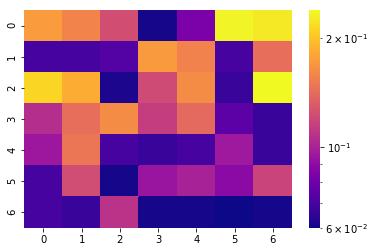

[[0.173 0.158 0.124 0.061 0.084 0.234 0.226]
 [0.07  0.07  0.073 0.172 0.156 0.07  0.143]
 [0.212 0.184 0.062 0.122 0.163 0.067 0.238]
 [0.106 0.143 0.163 0.115 0.14  0.075 0.067]
 [0.095 0.149 0.07  0.067 0.07  0.096 0.067]
 [0.07  0.123 0.061 0.094 0.1   0.089 0.118]
 [0.07  0.067 0.109 0.061 0.061 0.06  0.061]]


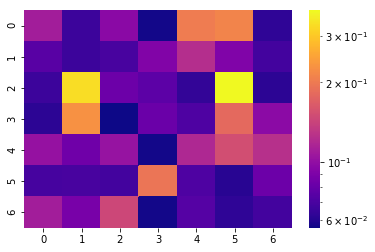

[[0.11  0.066 0.096 0.057 0.204 0.213 0.063]
 [0.075 0.066 0.07  0.092 0.123 0.091 0.068]
 [0.066 0.332 0.083 0.077 0.064 0.376 0.062]
 [0.062 0.229 0.056 0.082 0.072 0.181 0.097]
 [0.102 0.084 0.103 0.057 0.118 0.152 0.125]
 [0.069 0.07  0.068 0.194 0.072 0.061 0.083]
 [0.11  0.088 0.146 0.057 0.074 0.063 0.068]]


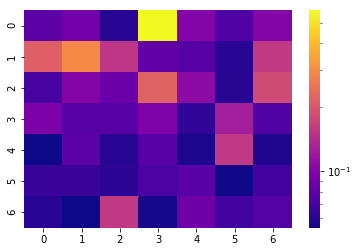

[[0.08  0.09  0.06  0.572 0.102 0.074 0.101]
 [0.215 0.292 0.154 0.082 0.077 0.06  0.158]
 [0.07  0.101 0.086 0.221 0.107 0.06  0.181]
 [0.095 0.078 0.078 0.097 0.063 0.126 0.074]
 [0.054 0.079 0.06  0.078 0.057 0.156 0.058]
 [0.065 0.066 0.061 0.072 0.078 0.055 0.069]
 [0.06  0.054 0.157 0.056 0.089 0.069 0.076]]


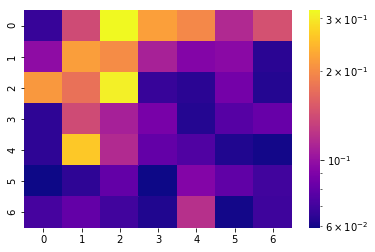

[[0.067 0.14  0.319 0.22  0.197 0.115 0.145]
 [0.097 0.218 0.2   0.11  0.092 0.095 0.064]
 [0.212 0.175 0.308 0.067 0.064 0.086 0.063]
 [0.065 0.14  0.109 0.088 0.063 0.076 0.082]
 [0.065 0.263 0.116 0.08  0.074 0.062 0.06 ]
 [0.059 0.065 0.08  0.059 0.092 0.079 0.07 ]
 [0.071 0.08  0.07  0.062 0.12  0.06  0.069]]


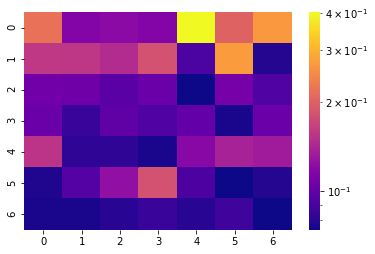

[[0.219 0.116 0.12  0.116 0.402 0.202 0.268]
 [0.158 0.157 0.147 0.183 0.091 0.272 0.079]
 [0.107 0.106 0.097 0.103 0.074 0.11  0.093]
 [0.103 0.085 0.099 0.093 0.101 0.076 0.104]
 [0.155 0.082 0.082 0.076 0.119 0.138 0.133]
 [0.078 0.095 0.124 0.182 0.092 0.074 0.079]
 [0.076 0.076 0.08  0.085 0.08  0.087 0.074]]


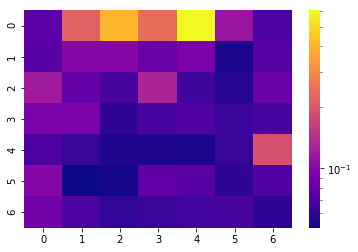

[[0.077 0.219 0.407 0.244 0.602 0.114 0.069]
 [0.075 0.1   0.1   0.083 0.093 0.054 0.074]
 [0.12  0.08  0.068 0.131 0.064 0.057 0.083]
 [0.093 0.093 0.059 0.067 0.072 0.062 0.067]
 [0.07  0.062 0.055 0.055 0.054 0.062 0.192]
 [0.1   0.051 0.053 0.081 0.075 0.058 0.072]
 [0.088 0.069 0.06  0.062 0.066 0.068 0.059]]


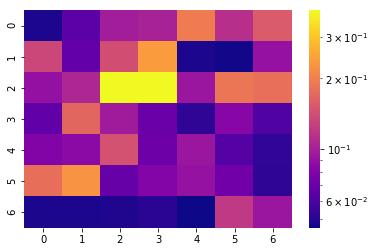

[[0.048 0.065 0.098 0.101 0.196 0.113 0.155]
 [0.133 0.068 0.141 0.237 0.048 0.047 0.09 ]
 [0.089 0.106 0.39  0.39  0.093 0.188 0.18 ]
 [0.067 0.168 0.096 0.07  0.052 0.083 0.062]
 [0.08  0.085 0.144 0.072 0.093 0.063 0.053]
 [0.178 0.225 0.069 0.081 0.09  0.073 0.052]
 [0.048 0.048 0.049 0.051 0.046 0.121 0.093]]
SKIPPPPPPEDDDD


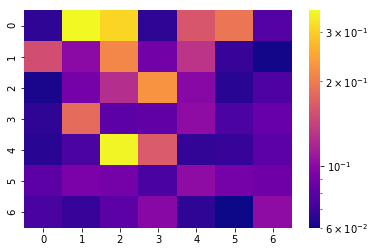

[[0.067 0.359 0.309 0.067 0.161 0.195 0.078]
 [0.154 0.1   0.214 0.089 0.131 0.069 0.061]
 [0.062 0.09  0.125 0.228 0.099 0.065 0.076]
 [0.067 0.183 0.081 0.082 0.102 0.075 0.085]
 [0.065 0.075 0.352 0.166 0.068 0.069 0.081]
 [0.081 0.092 0.09  0.074 0.102 0.09  0.088]
 [0.074 0.069 0.081 0.099 0.067 0.06  0.102]]


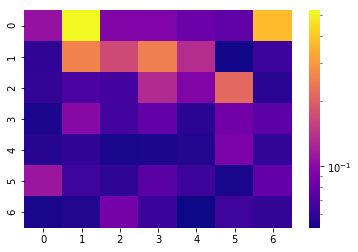

[[0.108 0.528 0.095 0.094 0.082 0.078 0.376]
 [0.06  0.26  0.169 0.255 0.134 0.053 0.064]
 [0.061 0.069 0.067 0.132 0.095 0.214 0.058]
 [0.055 0.099 0.066 0.08  0.058 0.086 0.076]
 [0.057 0.06  0.054 0.055 0.056 0.091 0.061]
 [0.112 0.065 0.06  0.075 0.064 0.054 0.079]
 [0.054 0.056 0.088 0.063 0.052 0.065 0.061]]


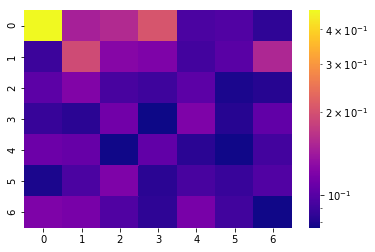

[[0.469 0.148 0.158 0.206 0.095 0.098 0.085]
 [0.089 0.193 0.125 0.12  0.092 0.101 0.154]
 [0.103 0.122 0.094 0.09  0.103 0.079 0.082]
 [0.087 0.083 0.113 0.076 0.12  0.082 0.105]
 [0.11  0.107 0.077 0.105 0.083 0.077 0.092]
 [0.079 0.095 0.12  0.083 0.094 0.088 0.098]
 [0.12  0.117 0.097 0.084 0.117 0.091 0.077]]


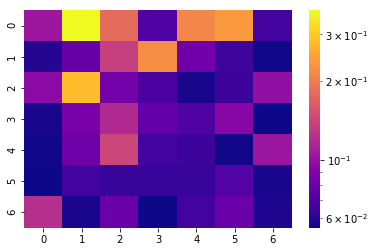

[[0.104 0.37  0.18  0.071 0.212 0.236 0.067]
 [0.059 0.079 0.136 0.221 0.083 0.066 0.056]
 [0.095 0.28  0.084 0.07  0.057 0.065 0.099]
 [0.057 0.086 0.117 0.078 0.071 0.093 0.055]
 [0.056 0.082 0.142 0.067 0.065 0.056 0.103]
 [0.055 0.067 0.064 0.064 0.064 0.072 0.057]
 [0.122 0.057 0.081 0.055 0.067 0.08  0.058]]


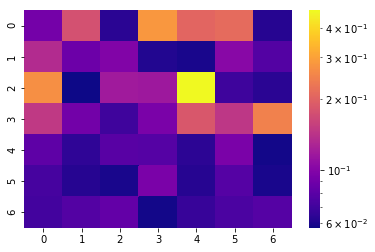

[[0.092 0.177 0.063 0.283 0.204 0.213 0.062]
 [0.134 0.088 0.099 0.061 0.059 0.103 0.077]
 [0.27  0.057 0.119 0.117 0.474 0.069 0.063]
 [0.148 0.091 0.07  0.095 0.186 0.146 0.248]
 [0.082 0.065 0.079 0.078 0.064 0.095 0.058]
 [0.072 0.062 0.059 0.095 0.062 0.078 0.059]
 [0.071 0.077 0.084 0.058 0.067 0.074 0.078]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


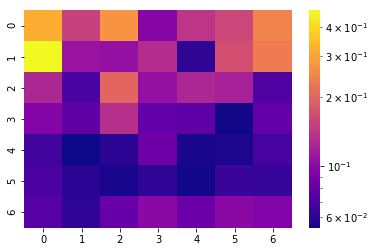

[[0.319 0.152 0.271 0.097 0.14  0.159 0.246]
 [0.473 0.109 0.106 0.131 0.061 0.17  0.234]
 [0.125 0.07  0.2   0.106 0.124 0.119 0.072]
 [0.096 0.079 0.134 0.08  0.078 0.055 0.08 ]
 [0.067 0.054 0.06  0.085 0.056 0.057 0.069]
 [0.071 0.06  0.056 0.061 0.055 0.064 0.063]
 [0.075 0.061 0.082 0.1   0.084 0.1   0.094]]


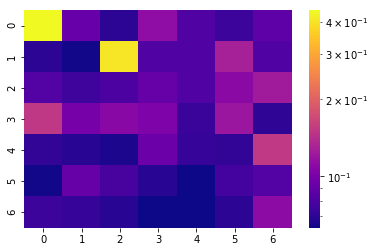

[[0.445 0.092 0.07  0.113 0.082 0.075 0.088]
 [0.07  0.064 0.408 0.082 0.082 0.129 0.082]
 [0.083 0.076 0.081 0.091 0.082 0.11  0.124]
 [0.151 0.099 0.109 0.103 0.074 0.12  0.071]
 [0.072 0.069 0.066 0.094 0.073 0.072 0.152]
 [0.064 0.091 0.079 0.069 0.063 0.078 0.083]
 [0.075 0.073 0.069 0.063 0.063 0.07  0.111]]


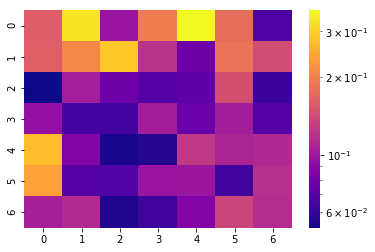

[[0.159 0.33  0.098 0.193 0.362 0.176 0.067]
 [0.16  0.207 0.29  0.119 0.078 0.183 0.142]
 [0.052 0.104 0.078 0.069 0.073 0.145 0.061]
 [0.095 0.064 0.064 0.103 0.076 0.103 0.069]
 [0.272 0.086 0.054 0.056 0.125 0.109 0.112]
 [0.238 0.069 0.068 0.098 0.099 0.063 0.117]
 [0.105 0.113 0.055 0.062 0.087 0.136 0.115]]


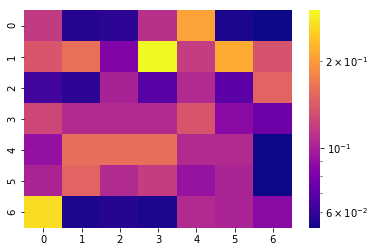

[[0.117 0.057 0.058 0.11  0.206 0.055 0.053]
 [0.138 0.16  0.083 0.298 0.119 0.217 0.135]
 [0.063 0.058 0.101 0.069 0.106 0.07  0.149]
 [0.126 0.106 0.106 0.106 0.137 0.087 0.076]
 [0.091 0.158 0.158 0.158 0.106 0.106 0.053]
 [0.102 0.149 0.106 0.119 0.092 0.102 0.053]
 [0.264 0.055 0.057 0.055 0.106 0.102 0.087]]


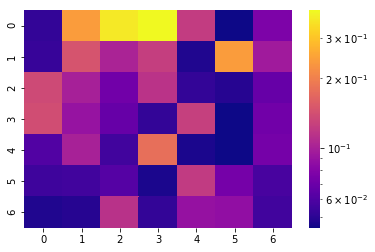

[[0.052 0.24  0.364 0.394 0.123 0.045 0.077]
 [0.053 0.147 0.102 0.125 0.048 0.24  0.095]
 [0.136 0.099 0.072 0.115 0.052 0.049 0.068]
 [0.14  0.09  0.068 0.052 0.126 0.045 0.072]
 [0.061 0.1   0.056 0.179 0.047 0.045 0.074]
 [0.055 0.056 0.062 0.047 0.122 0.074 0.058]
 [0.048 0.049 0.114 0.052 0.089 0.087 0.056]]


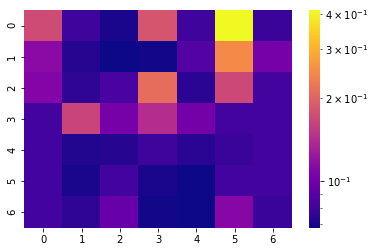

[[0.172 0.081 0.07  0.182 0.081 0.412 0.079]
 [0.114 0.073 0.068 0.069 0.088 0.247 0.103]
 [0.109 0.076 0.084 0.21  0.074 0.169 0.082]
 [0.082 0.165 0.103 0.142 0.102 0.082 0.082]
 [0.082 0.072 0.073 0.081 0.074 0.079 0.082]
 [0.082 0.07  0.082 0.07  0.068 0.082 0.082]
 [0.082 0.076 0.096 0.069 0.068 0.112 0.079]]


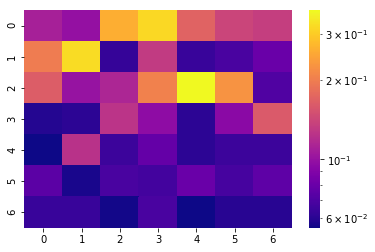

[[0.11  0.099 0.261 0.319 0.171 0.141 0.135]
 [0.2   0.323 0.063 0.132 0.064 0.069 0.08 ]
 [0.165 0.101 0.114 0.206 0.368 0.227 0.071]
 [0.059 0.061 0.126 0.096 0.061 0.094 0.161]
 [0.055 0.124 0.065 0.078 0.061 0.065 0.065]
 [0.075 0.057 0.069 0.067 0.08  0.068 0.076]
 [0.064 0.064 0.056 0.069 0.055 0.06  0.06 ]]


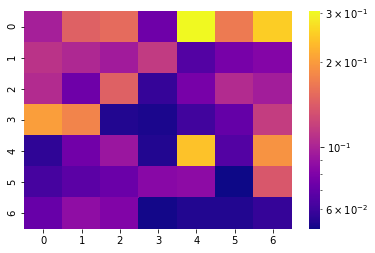

[[0.097 0.146 0.155 0.074 0.304 0.169 0.253]
 [0.11  0.103 0.095 0.116 0.066 0.077 0.082]
 [0.105 0.074 0.146 0.058 0.077 0.105 0.096]
 [0.203 0.178 0.054 0.053 0.061 0.071 0.117]
 [0.057 0.075 0.092 0.054 0.24  0.066 0.193]
 [0.062 0.068 0.073 0.084 0.086 0.051 0.138]
 [0.072 0.087 0.081 0.052 0.054 0.054 0.058]]


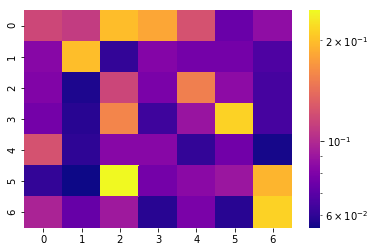

[[0.117 0.11  0.199 0.182 0.123 0.074 0.086]
 [0.083 0.2   0.061 0.082 0.077 0.077 0.067]
 [0.081 0.057 0.116 0.079 0.154 0.085 0.065]
 [0.077 0.059 0.158 0.063 0.089 0.215 0.065]
 [0.123 0.06  0.083 0.083 0.061 0.076 0.056]
 [0.061 0.055 0.246 0.077 0.084 0.09  0.193]
 [0.097 0.073 0.092 0.059 0.079 0.059 0.215]]


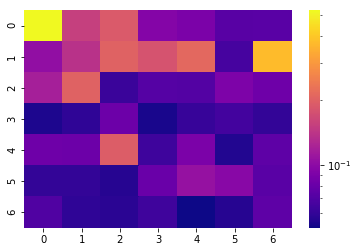

[[0.525 0.154 0.191 0.095 0.09  0.073 0.074]
 [0.103 0.138 0.202 0.18  0.212 0.066 0.373]
 [0.118 0.202 0.062 0.072 0.071 0.091 0.083]
 [0.054 0.059 0.082 0.053 0.061 0.065 0.06 ]
 [0.083 0.082 0.196 0.063 0.09  0.055 0.076]
 [0.06  0.06  0.056 0.081 0.106 0.098 0.074]
 [0.07  0.059 0.057 0.064 0.051 0.056 0.076]]


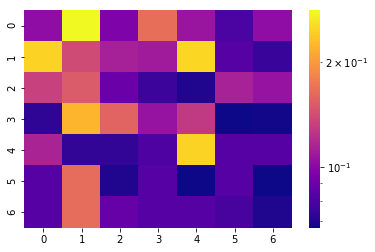

[[0.103 0.281 0.096 0.166 0.107 0.08  0.103]
 [0.246 0.14  0.113 0.11  0.251 0.083 0.075]
 [0.133 0.151 0.089 0.076 0.07  0.114 0.106]
 [0.073 0.223 0.158 0.106 0.129 0.067 0.068]
 [0.115 0.074 0.074 0.081 0.248 0.083 0.083]
 [0.083 0.165 0.07  0.083 0.067 0.083 0.067]
 [0.083 0.165 0.088 0.083 0.083 0.079 0.07 ]]


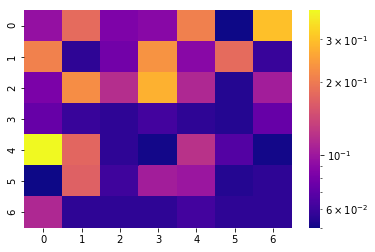

[[0.095 0.181 0.084 0.089 0.208 0.05  0.299]
 [0.209 0.056 0.079 0.233 0.089 0.181 0.059]
 [0.083 0.226 0.117 0.275 0.113 0.054 0.104]
 [0.074 0.059 0.056 0.062 0.056 0.054 0.074]
 [0.395 0.175 0.056 0.051 0.121 0.067 0.051]
 [0.05  0.169 0.061 0.104 0.099 0.054 0.056]
 [0.113 0.056 0.056 0.056 0.062 0.056 0.056]]


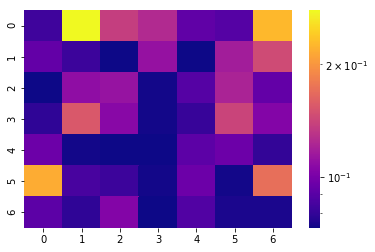

[[0.083 0.279 0.137 0.125 0.092 0.089 0.227]
 [0.093 0.082 0.073 0.111 0.073 0.117 0.145]
 [0.073 0.109 0.112 0.074 0.089 0.121 0.093]
 [0.079 0.155 0.106 0.074 0.081 0.141 0.104]
 [0.096 0.074 0.073 0.073 0.091 0.096 0.08 ]
 [0.218 0.085 0.082 0.074 0.096 0.074 0.171]
 [0.091 0.079 0.104 0.073 0.088 0.075 0.075]]


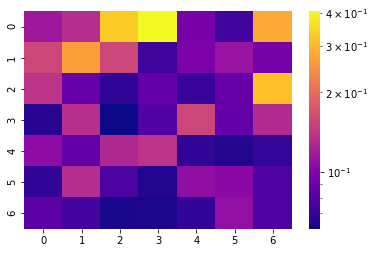

[[0.116 0.133 0.331 0.405 0.095 0.073 0.278]
 [0.158 0.264 0.157 0.073 0.096 0.112 0.094]
 [0.139 0.088 0.068 0.086 0.071 0.088 0.313]
 [0.066 0.135 0.061 0.079 0.157 0.086 0.131]
 [0.107 0.086 0.128 0.139 0.068 0.065 0.07 ]
 [0.069 0.133 0.077 0.065 0.108 0.104 0.079]
 [0.083 0.074 0.063 0.064 0.069 0.109 0.079]]


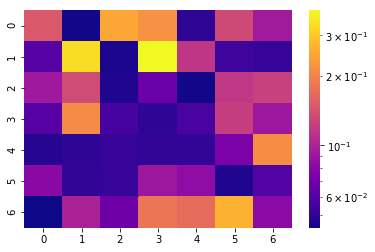

[[0.148 0.045 0.249 0.219 0.05  0.133 0.093]
 [0.061 0.334 0.046 0.385 0.115 0.054 0.052]
 [0.092 0.135 0.047 0.068 0.045 0.116 0.124]
 [0.061 0.212 0.056 0.05  0.057 0.122 0.091]
 [0.048 0.05  0.052 0.051 0.051 0.074 0.214]
 [0.081 0.051 0.052 0.091 0.084 0.047 0.06 ]
 [0.044 0.099 0.069 0.183 0.171 0.264 0.082]]


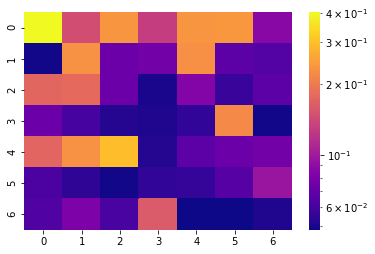

[[0.402 0.147 0.238 0.131 0.237 0.24  0.087]
 [0.049 0.231 0.074 0.077 0.229 0.068 0.065]
 [0.174 0.179 0.074 0.05  0.085 0.057 0.068]
 [0.074 0.061 0.052 0.051 0.055 0.221 0.049]
 [0.173 0.232 0.297 0.052 0.068 0.074 0.077]
 [0.063 0.054 0.049 0.055 0.056 0.066 0.096]
 [0.064 0.081 0.062 0.16  0.048 0.048 0.051]]


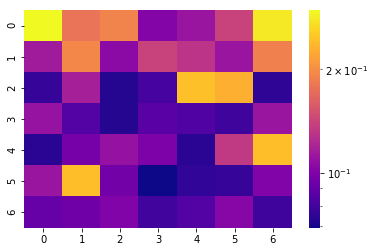

[[0.297 0.178 0.191 0.102 0.111 0.14  0.282]
 [0.114 0.194 0.105 0.14  0.13  0.111 0.189]
 [0.077 0.117 0.073 0.081 0.244 0.229 0.075]
 [0.11  0.085 0.073 0.087 0.084 0.079 0.111]
 [0.074 0.097 0.109 0.099 0.074 0.134 0.242]
 [0.111 0.242 0.095 0.069 0.076 0.077 0.1  ]
 [0.091 0.094 0.1   0.08  0.085 0.103 0.079]]


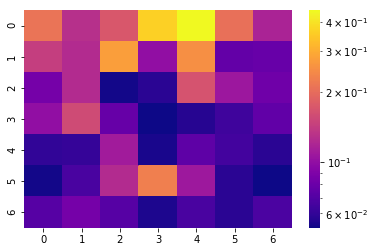

[[0.211 0.129 0.173 0.366 0.45  0.207 0.117]
 [0.143 0.124 0.276 0.1   0.252 0.077 0.079]
 [0.085 0.124 0.053 0.058 0.167 0.107 0.082]
 [0.1   0.158 0.078 0.052 0.057 0.064 0.076]
 [0.06  0.061 0.111 0.054 0.075 0.065 0.058]
 [0.053 0.067 0.124 0.229 0.108 0.058 0.052]
 [0.072 0.085 0.072 0.055 0.067 0.058 0.068]]


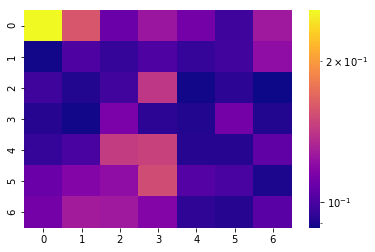

[[0.256 0.159 0.109 0.125 0.112 0.097 0.127]
 [0.089 0.101 0.095 0.101 0.095 0.098 0.121]
 [0.097 0.091 0.098 0.141 0.089 0.093 0.088]
 [0.092 0.089 0.114 0.093 0.091 0.112 0.091]
 [0.095 0.1   0.144 0.147 0.092 0.092 0.106]
 [0.109 0.117 0.121 0.153 0.103 0.1   0.09 ]
 [0.112 0.128 0.127 0.117 0.094 0.092 0.104]]


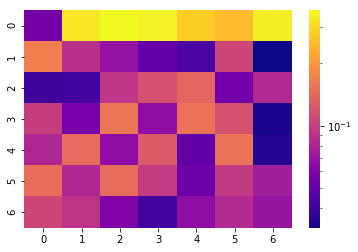

[[0.055 0.324 0.361 0.345 0.28  0.253 0.333]
 [0.167 0.089 0.069 0.05  0.043 0.108 0.032]
 [0.04  0.041 0.094 0.118 0.138 0.054 0.084]
 [0.1   0.056 0.158 0.066 0.153 0.118 0.034]
 [0.082 0.145 0.066 0.128 0.049 0.155 0.035]
 [0.148 0.083 0.146 0.098 0.053 0.097 0.076]
 [0.107 0.092 0.06  0.041 0.066 0.085 0.07 ]]


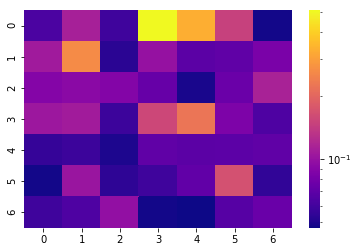

[[0.063 0.112 0.059 0.509 0.329 0.147 0.048]
 [0.107 0.262 0.053 0.099 0.069 0.071 0.083]
 [0.089 0.092 0.088 0.074 0.049 0.076 0.114]
 [0.104 0.108 0.058 0.156 0.223 0.085 0.064]
 [0.056 0.058 0.05  0.071 0.069 0.07  0.071]
 [0.048 0.102 0.054 0.059 0.072 0.167 0.055]
 [0.059 0.064 0.098 0.048 0.047 0.067 0.075]]


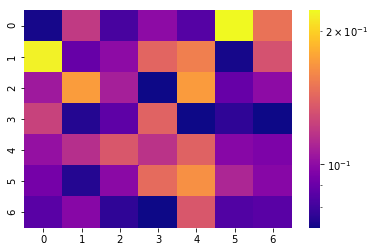

[[0.073 0.12  0.082 0.1   0.085 0.222 0.149]
 [0.218 0.089 0.1   0.142 0.156 0.073 0.132]
 [0.106 0.172 0.108 0.072 0.171 0.089 0.1  ]
 [0.124 0.075 0.087 0.141 0.072 0.077 0.072]
 [0.102 0.115 0.135 0.117 0.14  0.098 0.095]
 [0.093 0.075 0.099 0.145 0.165 0.111 0.098]
 [0.086 0.098 0.077 0.072 0.135 0.084 0.086]]


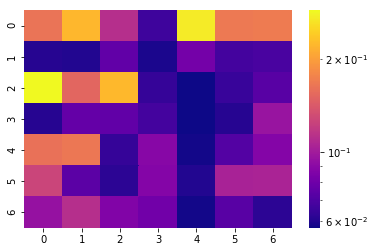

[[0.163 0.222 0.112 0.066 0.272 0.167 0.169]
 [0.061 0.06  0.076 0.059 0.082 0.068 0.069]
 [0.287 0.152 0.223 0.064 0.057 0.065 0.073]
 [0.061 0.077 0.076 0.068 0.057 0.061 0.096]
 [0.161 0.166 0.064 0.089 0.058 0.072 0.088]
 [0.127 0.074 0.062 0.088 0.06  0.104 0.105]
 [0.095 0.112 0.087 0.081 0.058 0.073 0.062]]


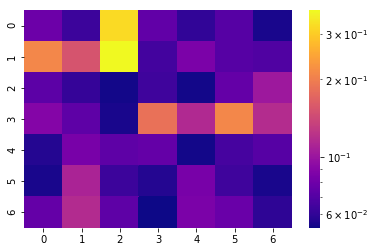

[[0.079 0.063 0.323 0.075 0.06  0.071 0.055]
 [0.211 0.153 0.371 0.065 0.085 0.071 0.069]
 [0.073 0.061 0.054 0.064 0.054 0.076 0.102]
 [0.089 0.074 0.055 0.185 0.115 0.21  0.117]
 [0.057 0.084 0.074 0.076 0.054 0.066 0.071]
 [0.055 0.11  0.063 0.057 0.084 0.064 0.055]
 [0.076 0.116 0.074 0.053 0.085 0.078 0.059]]


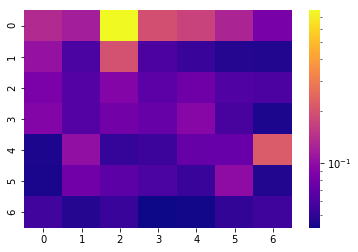

[[0.134 0.119 0.767 0.195 0.173 0.127 0.083]
 [0.105 0.06  0.198 0.061 0.053 0.047 0.046]
 [0.084 0.064 0.091 0.068 0.078 0.062 0.061]
 [0.091 0.064 0.08  0.073 0.092 0.059 0.045]
 [0.045 0.102 0.052 0.054 0.073 0.074 0.219]
 [0.044 0.079 0.067 0.06  0.053 0.099 0.046]
 [0.056 0.047 0.053 0.042 0.043 0.051 0.055]]


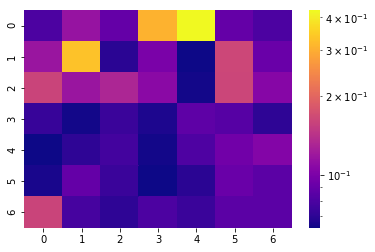

[[0.08  0.116 0.09  0.308 0.425 0.09  0.08 ]
 [0.117 0.332 0.069 0.1   0.063 0.164 0.092]
 [0.161 0.117 0.131 0.108 0.064 0.163 0.106]
 [0.073 0.064 0.074 0.066 0.087 0.084 0.07 ]
 [0.063 0.07  0.077 0.064 0.081 0.095 0.104]
 [0.065 0.09  0.074 0.063 0.069 0.092 0.086]
 [0.161 0.078 0.07  0.08  0.074 0.086 0.086]]


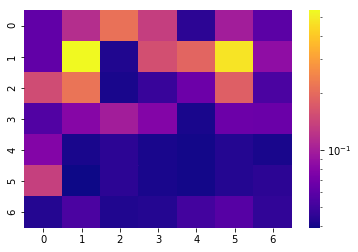

[[0.062 0.115 0.213 0.135 0.045 0.099 0.06 ]
 [0.062 0.544 0.042 0.158 0.192 0.478 0.086]
 [0.152 0.216 0.041 0.048 0.067 0.181 0.054]
 [0.056 0.08  0.099 0.078 0.041 0.067 0.066]
 [0.078 0.041 0.045 0.041 0.04  0.043 0.041]
 [0.136 0.039 0.045 0.041 0.04  0.043 0.045]
 [0.043 0.054 0.042 0.043 0.051 0.058 0.046]]


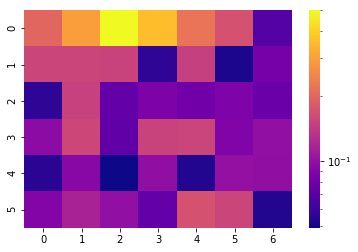

[[0.2   0.297 0.5   0.36  0.222 0.171 0.069]
 [0.155 0.155 0.152 0.056 0.147 0.052 0.084]
 [0.056 0.149 0.075 0.087 0.081 0.088 0.078]
 [0.096 0.157 0.074 0.152 0.155 0.089 0.1  ]
 [0.055 0.094 0.049 0.099 0.053 0.101 0.099]
 [0.091 0.117 0.1   0.075 0.171 0.155 0.053]]


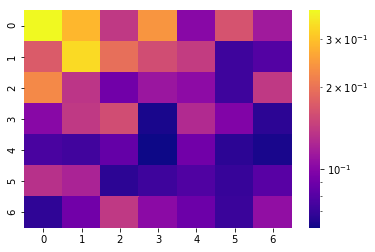

[[0.382 0.286 0.14  0.243 0.102 0.164 0.115]
 [0.173 0.334 0.195 0.159 0.143 0.072 0.079]
 [0.228 0.137 0.091 0.112 0.104 0.072 0.14 ]
 [0.102 0.14  0.159 0.063 0.127 0.098 0.067]
 [0.076 0.073 0.086 0.061 0.091 0.067 0.063]
 [0.133 0.122 0.067 0.072 0.078 0.07  0.081]
 [0.068 0.091 0.14  0.103 0.089 0.071 0.106]]


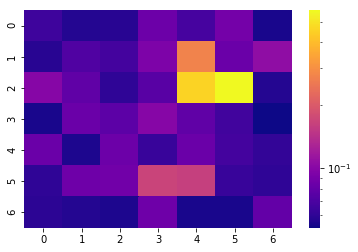

[[0.065 0.057 0.058 0.085 0.068 0.089 0.054]
 [0.058 0.072 0.067 0.094 0.275 0.084 0.106]
 [0.099 0.079 0.06  0.075 0.46  0.566 0.057]
 [0.054 0.084 0.077 0.099 0.079 0.066 0.052]
 [0.084 0.055 0.085 0.063 0.084 0.067 0.061]
 [0.06  0.086 0.087 0.167 0.162 0.063 0.06 ]
 [0.059 0.057 0.055 0.086 0.054 0.054 0.08 ]]


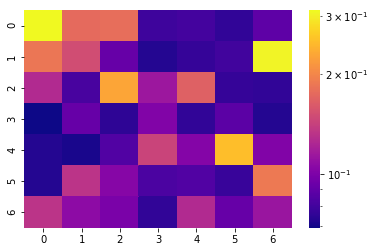

[[0.311 0.175 0.178 0.079 0.081 0.076 0.089]
 [0.186 0.151 0.092 0.073 0.077 0.08  0.304]
 [0.126 0.082 0.228 0.114 0.167 0.077 0.076]
 [0.069 0.092 0.075 0.102 0.076 0.088 0.073]
 [0.073 0.071 0.085 0.144 0.103 0.253 0.102]
 [0.073 0.133 0.104 0.083 0.085 0.078 0.188]
 [0.133 0.107 0.099 0.076 0.126 0.092 0.113]]


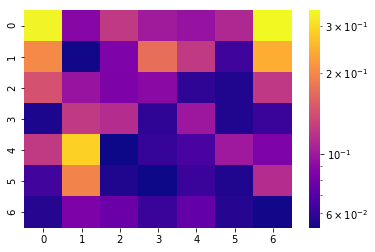

[[0.334 0.088 0.124 0.101 0.096 0.11  0.343]
 [0.202 0.054 0.085 0.173 0.124 0.063 0.244]
 [0.144 0.097 0.084 0.09  0.059 0.056 0.122]
 [0.055 0.124 0.114 0.059 0.099 0.056 0.062]
 [0.124 0.286 0.053 0.061 0.066 0.1   0.085]
 [0.064 0.197 0.056 0.053 0.062 0.056 0.114]
 [0.057 0.084 0.078 0.062 0.075 0.057 0.054]]


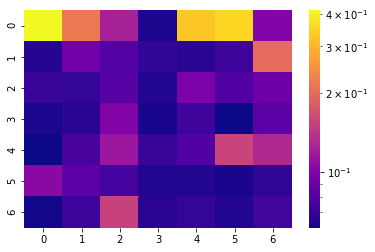

[[0.412 0.218 0.123 0.064 0.327 0.353 0.1  ]
 [0.066 0.092 0.08  0.069 0.067 0.072 0.2  ]
 [0.071 0.07  0.081 0.065 0.097 0.079 0.091]
 [0.064 0.067 0.1   0.063 0.073 0.061 0.083]
 [0.061 0.076 0.115 0.071 0.079 0.156 0.129]
 [0.105 0.083 0.075 0.065 0.065 0.063 0.068]
 [0.062 0.072 0.153 0.067 0.07  0.065 0.074]]


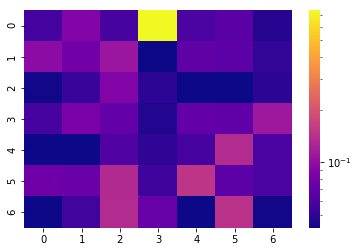

[[0.057 0.091 0.058 0.743 0.06  0.066 0.047]
 [0.097 0.078 0.109 0.042 0.069 0.068 0.051]
 [0.043 0.053 0.089 0.049 0.042 0.042 0.049]
 [0.058 0.085 0.071 0.046 0.071 0.07  0.111]
 [0.042 0.042 0.062 0.05  0.058 0.134 0.06 ]
 [0.077 0.074 0.133 0.055 0.148 0.068 0.06 ]
 [0.042 0.056 0.134 0.072 0.042 0.143 0.043]]


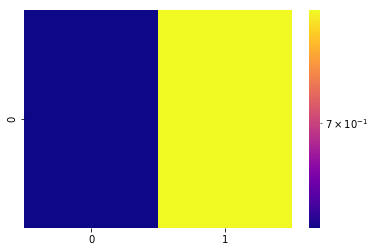

[[0.646 0.763]]


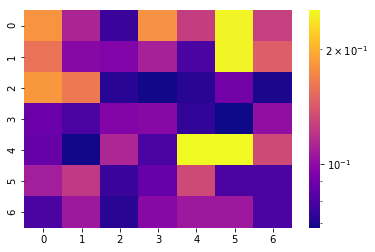

[[0.182 0.112 0.076 0.18  0.126 0.25  0.127]
 [0.159 0.098 0.095 0.11  0.08  0.25  0.146]
 [0.184 0.163 0.072 0.069 0.072 0.091 0.07 ]
 [0.089 0.08  0.096 0.098 0.074 0.068 0.101]
 [0.087 0.069 0.113 0.08  0.253 0.253 0.133]
 [0.109 0.123 0.076 0.087 0.133 0.08  0.08 ]
 [0.08  0.106 0.072 0.098 0.106 0.106 0.08 ]]
SKIPPPPPPEDDDD


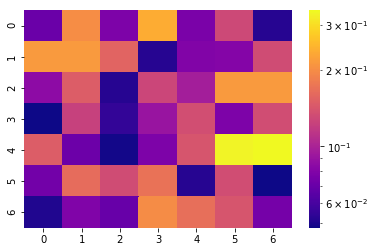

[[0.071 0.2   0.078 0.237 0.077 0.129 0.052]
 [0.215 0.214 0.155 0.052 0.08  0.081 0.132]
 [0.085 0.148 0.052 0.127 0.097 0.215 0.215]
 [0.048 0.123 0.055 0.09  0.134 0.078 0.133]
 [0.148 0.072 0.049 0.078 0.141 0.331 0.341]
 [0.074 0.164 0.132 0.17  0.052 0.133 0.048]
 [0.051 0.079 0.07  0.198 0.167 0.141 0.075]]


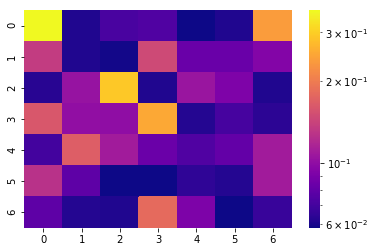

[[0.361 0.061 0.072 0.074 0.058 0.061 0.238]
 [0.135 0.061 0.059 0.147 0.083 0.083 0.094]
 [0.063 0.104 0.293 0.061 0.105 0.092 0.061]
 [0.161 0.101 0.1   0.252 0.062 0.071 0.064]
 [0.07  0.167 0.11  0.084 0.074 0.081 0.11 ]
 [0.127 0.079 0.058 0.058 0.065 0.062 0.11 ]
 [0.079 0.062 0.061 0.18  0.091 0.058 0.067]]


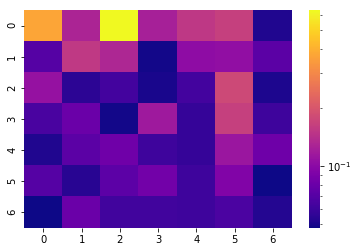

[[0.374 0.128 0.634 0.123 0.153 0.164 0.052]
 [0.07  0.154 0.131 0.049 0.103 0.105 0.073]
 [0.108 0.055 0.063 0.05  0.063 0.177 0.051]
 [0.065 0.081 0.049 0.116 0.058 0.164 0.061]
 [0.052 0.073 0.083 0.061 0.058 0.112 0.082]
 [0.07  0.054 0.074 0.085 0.061 0.094 0.048]
 [0.048 0.081 0.062 0.062 0.061 0.066 0.053]]


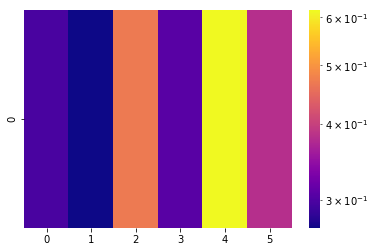

[[0.298 0.27  0.469 0.307 0.616 0.381]]


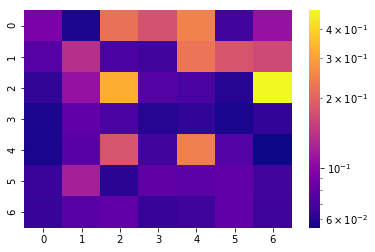

[[0.093 0.058 0.221 0.175 0.247 0.068 0.109]
 [0.076 0.137 0.071 0.068 0.227 0.181 0.166]
 [0.064 0.109 0.324 0.075 0.071 0.06  0.48 ]
 [0.058 0.081 0.071 0.06  0.063 0.057 0.063]
 [0.057 0.077 0.179 0.068 0.243 0.075 0.055]
 [0.066 0.12  0.061 0.08  0.078 0.081 0.068]
 [0.065 0.077 0.081 0.065 0.067 0.081 0.067]]


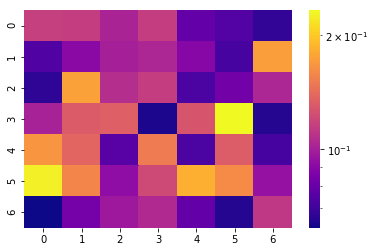

[[0.116 0.115 0.102 0.115 0.079 0.075 0.068]
 [0.074 0.09  0.1   0.103 0.089 0.072 0.173]
 [0.067 0.175 0.107 0.115 0.073 0.083 0.103]
 [0.101 0.132 0.134 0.064 0.128 0.233 0.065]
 [0.168 0.138 0.076 0.151 0.073 0.133 0.072]
 [0.226 0.158 0.092 0.122 0.184 0.161 0.094]
 [0.062 0.084 0.097 0.105 0.079 0.065 0.112]]


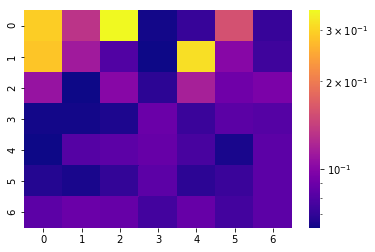

[[0.294 0.133 0.35  0.064 0.072 0.157 0.072]
 [0.283 0.114 0.08  0.063 0.315 0.101 0.074]
 [0.109 0.063 0.101 0.069 0.118 0.091 0.096]
 [0.064 0.064 0.066 0.089 0.073 0.083 0.081]
 [0.063 0.081 0.084 0.087 0.077 0.065 0.084]
 [0.067 0.065 0.071 0.084 0.069 0.073 0.084]
 [0.084 0.089 0.087 0.075 0.087 0.075 0.084]]


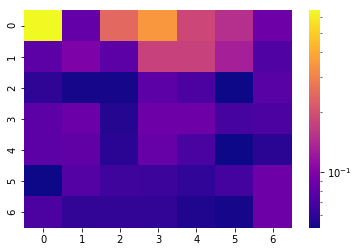

[[0.651 0.082 0.244 0.352 0.184 0.149 0.088]
 [0.079 0.097 0.078 0.176 0.176 0.129 0.073]
 [0.06  0.054 0.054 0.079 0.072 0.052 0.077]
 [0.079 0.087 0.057 0.088 0.088 0.069 0.072]
 [0.079 0.081 0.059 0.084 0.07  0.052 0.059]
 [0.052 0.075 0.066 0.065 0.061 0.068 0.088]
 [0.072 0.062 0.062 0.062 0.056 0.054 0.088]]


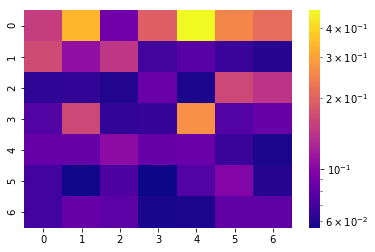

[[0.153 0.337 0.089 0.195 0.474 0.253 0.214]
 [0.168 0.108 0.144 0.069 0.078 0.067 0.061]
 [0.063 0.065 0.06  0.085 0.059 0.165 0.142]
 [0.076 0.165 0.065 0.066 0.271 0.076 0.084]
 [0.084 0.084 0.104 0.084 0.085 0.067 0.059]
 [0.07  0.057 0.074 0.056 0.076 0.098 0.061]
 [0.07  0.084 0.079 0.058 0.059 0.081 0.081]]


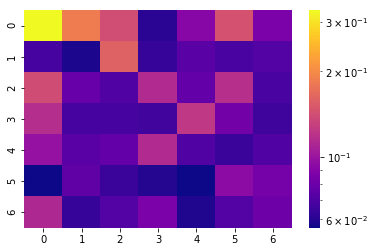

[[0.329 0.186 0.141 0.061 0.091 0.145 0.086]
 [0.068 0.058 0.159 0.064 0.074 0.069 0.072]
 [0.14  0.079 0.071 0.114 0.078 0.118 0.069]
 [0.116 0.068 0.068 0.067 0.124 0.083 0.066]
 [0.098 0.074 0.078 0.114 0.071 0.065 0.071]
 [0.056 0.076 0.065 0.06  0.056 0.094 0.084]
 [0.112 0.064 0.072 0.086 0.059 0.072 0.081]]


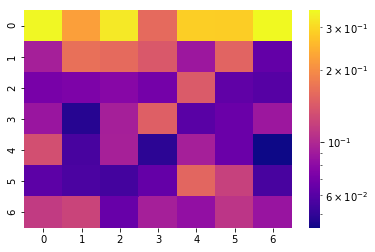

[[0.348 0.223 0.327 0.16  0.287 0.284 0.353]
 [0.093 0.166 0.16  0.141 0.088 0.153 0.064]
 [0.072 0.074 0.078 0.07  0.144 0.063 0.06 ]
 [0.087 0.048 0.093 0.148 0.061 0.067 0.088]
 [0.133 0.056 0.094 0.049 0.093 0.067 0.044]
 [0.062 0.057 0.055 0.065 0.156 0.119 0.056]
 [0.114 0.122 0.066 0.093 0.083 0.11  0.086]]


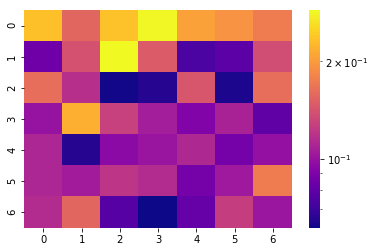

[[0.233 0.157 0.235 0.285 0.206 0.194 0.175]
 [0.085 0.14  0.288 0.148 0.074 0.079 0.137]
 [0.162 0.117 0.062 0.065 0.144 0.063 0.162]
 [0.1   0.218 0.128 0.106 0.091 0.109 0.08 ]
 [0.111 0.065 0.095 0.101 0.112 0.087 0.099]
 [0.111 0.105 0.121 0.114 0.087 0.104 0.175]
 [0.114 0.157 0.077 0.061 0.082 0.127 0.102]]


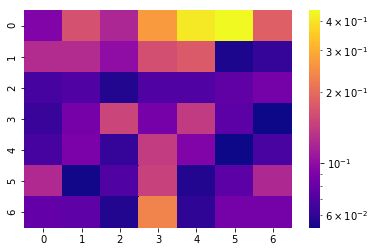

[[0.091 0.166 0.12  0.269 0.409 0.444 0.183]
 [0.125 0.125 0.1   0.163 0.176 0.056 0.062]
 [0.067 0.071 0.057 0.071 0.071 0.077 0.086]
 [0.063 0.087 0.152 0.087 0.141 0.075 0.053]
 [0.067 0.088 0.062 0.142 0.091 0.053 0.068]
 [0.123 0.054 0.071 0.148 0.057 0.075 0.122]
 [0.078 0.076 0.057 0.234 0.06  0.086 0.086]]


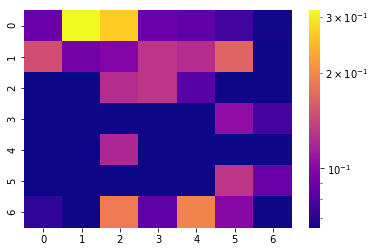

[[0.09  0.315 0.265 0.09  0.086 0.076 0.066]
 [0.149 0.092 0.099 0.13  0.124 0.166 0.065]
 [0.065 0.065 0.124 0.13  0.083 0.065 0.065]
 [0.065 0.065 0.065 0.065 0.065 0.104 0.077]
 [0.065 0.065 0.12  0.065 0.065 0.065 0.065]
 [0.065 0.065 0.065 0.065 0.065 0.13  0.089]
 [0.072 0.065 0.187 0.085 0.195 0.101 0.065]]


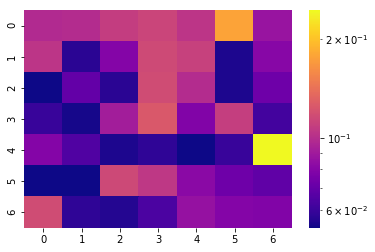

[[0.098 0.099 0.108 0.113 0.104 0.178 0.087]
 [0.104 0.057 0.08  0.116 0.11  0.055 0.081]
 [0.053 0.07  0.057 0.117 0.099 0.055 0.073]
 [0.06  0.054 0.091 0.125 0.079 0.109 0.062]
 [0.08  0.065 0.055 0.058 0.053 0.06  0.245]
 [0.053 0.053 0.115 0.105 0.082 0.073 0.069]
 [0.117 0.058 0.056 0.064 0.086 0.08  0.079]]


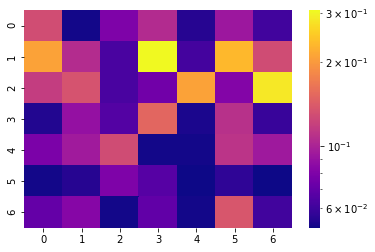

[[0.13  0.052 0.08  0.105 0.055 0.093 0.061]
 [0.209 0.106 0.063 0.306 0.062 0.232 0.129]
 [0.118 0.134 0.063 0.075 0.209 0.082 0.284]
 [0.054 0.089 0.066 0.151 0.053 0.109 0.059]
 [0.079 0.095 0.129 0.052 0.052 0.111 0.094]
 [0.052 0.055 0.08  0.067 0.051 0.057 0.051]
 [0.071 0.083 0.052 0.07  0.052 0.137 0.061]]
SKIPPPPPPEDDDD


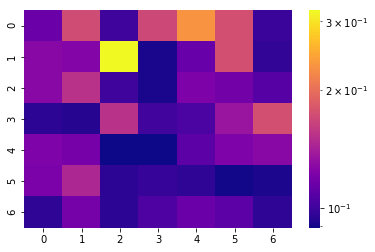

[[0.115 0.173 0.1   0.17  0.232 0.175 0.099]
 [0.127 0.125 0.32  0.091 0.114 0.175 0.097]
 [0.127 0.154 0.1   0.091 0.122 0.118 0.108]
 [0.095 0.094 0.154 0.101 0.104 0.135 0.175]
 [0.123 0.12  0.089 0.089 0.11  0.123 0.127]
 [0.121 0.146 0.095 0.098 0.096 0.09  0.092]
 [0.096 0.119 0.095 0.105 0.115 0.11  0.096]]


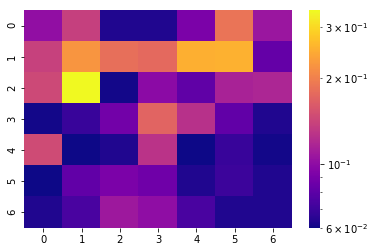

[[0.102 0.137 0.063 0.063 0.092 0.186 0.107]
 [0.138 0.222 0.181 0.175 0.251 0.253 0.083]
 [0.145 0.343 0.061 0.099 0.081 0.115 0.117]
 [0.061 0.069 0.088 0.171 0.126 0.082 0.063]
 [0.147 0.06  0.063 0.127 0.06  0.069 0.061]
 [0.06  0.082 0.092 0.087 0.063 0.07  0.063]
 [0.063 0.074 0.108 0.101 0.074 0.063 0.063]]


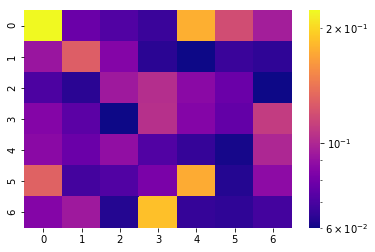

[[0.222 0.078 0.072 0.067 0.176 0.119 0.096]
 [0.092 0.128 0.085 0.064 0.06  0.067 0.065]
 [0.071 0.064 0.094 0.103 0.087 0.078 0.06 ]
 [0.085 0.074 0.06  0.104 0.085 0.076 0.11 ]
 [0.087 0.078 0.089 0.072 0.066 0.061 0.1  ]
 [0.13  0.069 0.072 0.082 0.173 0.063 0.088]
 [0.085 0.094 0.063 0.186 0.066 0.065 0.069]]


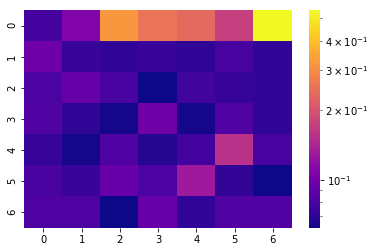

[[0.078 0.108 0.318 0.253 0.235 0.174 0.541]
 [0.098 0.074 0.071 0.074 0.07  0.079 0.071]
 [0.081 0.094 0.08  0.062 0.077 0.073 0.071]
 [0.083 0.07  0.064 0.098 0.064 0.084 0.071]
 [0.073 0.064 0.083 0.067 0.078 0.157 0.079]
 [0.08  0.074 0.094 0.081 0.13  0.072 0.062]
 [0.082 0.082 0.062 0.094 0.071 0.083 0.083]]


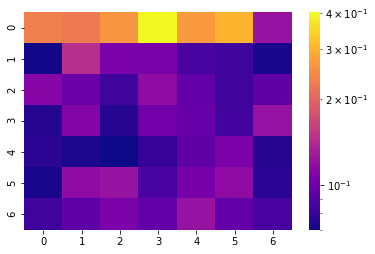

[[0.233 0.225 0.261 0.402 0.266 0.301 0.122]
 [0.071 0.145 0.107 0.106 0.086 0.082 0.072]
 [0.113 0.1   0.083 0.117 0.097 0.082 0.095]
 [0.075 0.11  0.075 0.102 0.098 0.084 0.122]
 [0.077 0.073 0.07  0.08  0.095 0.107 0.075]
 [0.072 0.117 0.122 0.086 0.105 0.117 0.076]
 [0.082 0.094 0.107 0.096 0.122 0.097 0.085]]


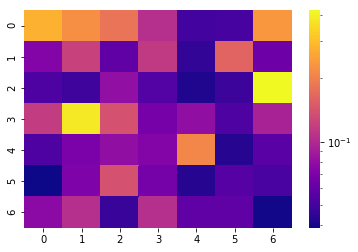

[[0.278 0.223 0.184 0.105 0.05  0.051 0.236]
 [0.074 0.123 0.059 0.115 0.046 0.162 0.064]
 [0.053 0.049 0.081 0.055 0.042 0.048 0.421]
 [0.117 0.385 0.14  0.068 0.08  0.053 0.095]
 [0.053 0.07  0.08  0.074 0.21  0.043 0.057]
 [0.039 0.071 0.14  0.067 0.043 0.056 0.052]
 [0.077 0.105 0.047 0.105 0.059 0.059 0.04 ]]


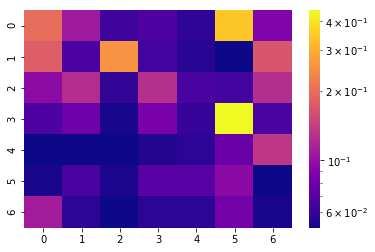

[[0.198 0.107 0.062 0.068 0.058 0.347 0.089]
 [0.18  0.067 0.256 0.064 0.056 0.051 0.169]
 [0.096 0.124 0.059 0.126 0.066 0.064 0.125]
 [0.068 0.08  0.053 0.085 0.06  0.446 0.066]
 [0.051 0.051 0.051 0.055 0.057 0.078 0.133]
 [0.053 0.066 0.054 0.071 0.071 0.094 0.051]
 [0.109 0.057 0.051 0.057 0.057 0.082 0.053]]


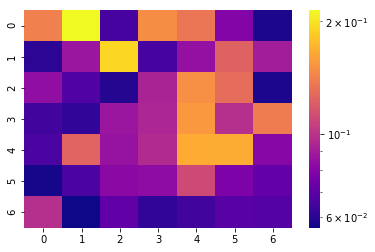

[[0.141 0.214 0.065 0.149 0.135 0.08  0.058]
 [0.06  0.087 0.192 0.065 0.085 0.124 0.09 ]
 [0.084 0.067 0.059 0.093 0.15  0.13  0.058]
 [0.064 0.061 0.087 0.094 0.155 0.098 0.139]
 [0.066 0.125 0.086 0.096 0.166 0.167 0.081]
 [0.057 0.066 0.082 0.083 0.111 0.078 0.072]
 [0.098 0.056 0.071 0.061 0.064 0.069 0.068]]


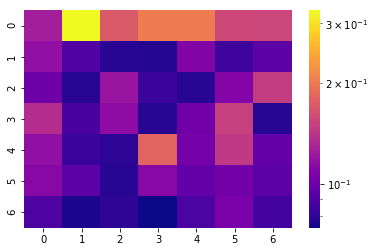

[[0.126 0.328 0.171 0.203 0.203 0.156 0.155]
 [0.117 0.091 0.079 0.078 0.109 0.085 0.095]
 [0.101 0.079 0.12  0.084 0.079 0.11  0.147]
 [0.136 0.088 0.115 0.079 0.102 0.15  0.079]
 [0.117 0.084 0.08  0.181 0.104 0.145 0.097]
 [0.112 0.095 0.079 0.112 0.097 0.103 0.094]
 [0.09  0.077 0.081 0.074 0.089 0.106 0.087]]


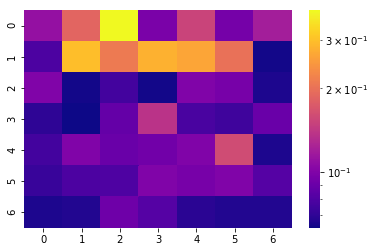

[[0.11  0.187 0.382 0.097 0.152 0.095 0.12 ]
 [0.079 0.298 0.21  0.28  0.264 0.201 0.064]
 [0.1   0.064 0.076 0.064 0.1   0.096 0.066]
 [0.07  0.063 0.088 0.137 0.078 0.075 0.09 ]
 [0.076 0.1   0.09  0.093 0.1   0.16  0.066]
 [0.073 0.079 0.08  0.1   0.096 0.1   0.082]
 [0.066 0.067 0.092 0.082 0.069 0.067 0.067]]


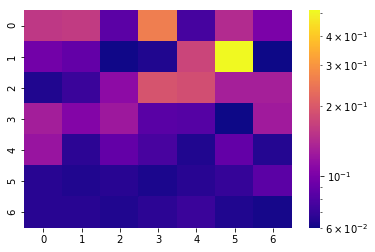

[[0.157 0.161 0.085 0.259 0.076 0.143 0.101]
 [0.096 0.089 0.061 0.064 0.173 0.514 0.06 ]
 [0.064 0.072 0.112 0.193 0.186 0.13  0.13 ]
 [0.129 0.106 0.124 0.084 0.082 0.06  0.126]
 [0.12  0.067 0.089 0.077 0.064 0.089 0.065]
 [0.066 0.064 0.066 0.063 0.066 0.07  0.085]
 [0.066 0.066 0.064 0.067 0.072 0.064 0.062]]


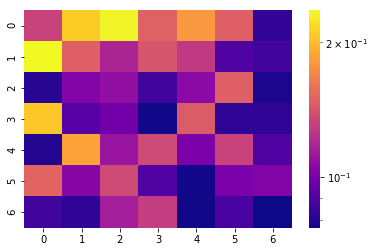

[[0.133 0.209 0.232 0.149 0.18  0.148 0.083]
 [0.236 0.148 0.118 0.142 0.128 0.089 0.086]
 [0.081 0.104 0.108 0.086 0.106 0.148 0.079]
 [0.207 0.091 0.098 0.078 0.146 0.082 0.082]
 [0.08  0.186 0.111 0.136 0.101 0.133 0.09 ]
 [0.151 0.105 0.137 0.09  0.078 0.101 0.104]
 [0.086 0.082 0.115 0.13  0.078 0.088 0.077]]


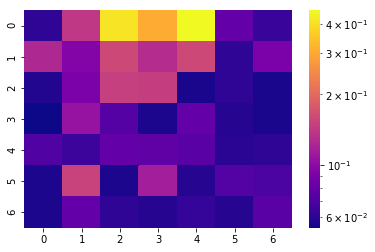

[[0.061 0.14  0.411 0.305 0.457 0.08  0.064]
 [0.125 0.095 0.159 0.129 0.159 0.061 0.091]
 [0.058 0.091 0.149 0.148 0.056 0.061 0.056]
 [0.054 0.107 0.074 0.057 0.08  0.059 0.056]
 [0.072 0.065 0.08  0.078 0.076 0.06  0.061]
 [0.057 0.152 0.057 0.116 0.059 0.073 0.07 ]
 [0.057 0.08  0.061 0.059 0.063 0.059 0.076]]


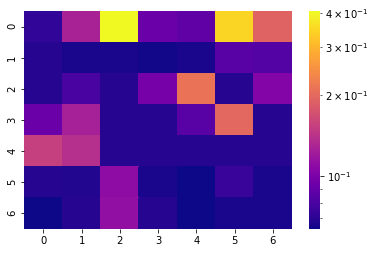

[[0.072 0.127 0.405 0.093 0.088 0.346 0.192]
 [0.069 0.066 0.066 0.065 0.066 0.085 0.083]
 [0.069 0.08  0.069 0.098 0.211 0.069 0.104]
 [0.092 0.126 0.069 0.069 0.085 0.197 0.069]
 [0.154 0.138 0.069 0.069 0.069 0.069 0.069]
 [0.069 0.068 0.11  0.066 0.064 0.074 0.066]
 [0.064 0.069 0.113 0.069 0.064 0.066 0.066]]


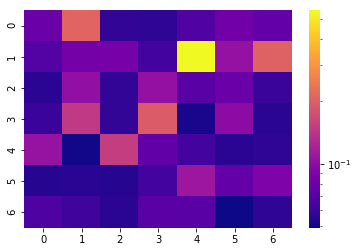

[[0.08  0.21  0.058 0.057 0.068 0.083 0.076]
 [0.069 0.084 0.086 0.063 0.551 0.105 0.204]
 [0.055 0.103 0.058 0.104 0.072 0.08  0.06 ]
 [0.06  0.146 0.058 0.196 0.051 0.099 0.055]
 [0.106 0.05  0.152 0.075 0.063 0.055 0.057]
 [0.054 0.055 0.054 0.063 0.11  0.077 0.09 ]
 [0.067 0.062 0.055 0.072 0.072 0.049 0.057]]


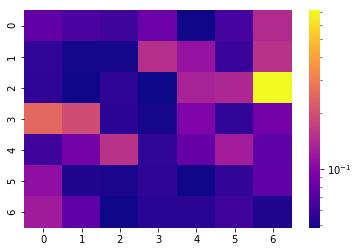

[[0.078 0.067 0.062 0.084 0.049 0.065 0.142]
 [0.057 0.05  0.05  0.149 0.113 0.06  0.153]
 [0.056 0.049 0.056 0.048 0.13  0.138 0.717]
 [0.252 0.195 0.055 0.05  0.095 0.057 0.088]
 [0.062 0.089 0.152 0.057 0.08  0.124 0.076]
 [0.109 0.052 0.051 0.056 0.049 0.058 0.078]
 [0.122 0.076 0.049 0.054 0.054 0.062 0.052]]


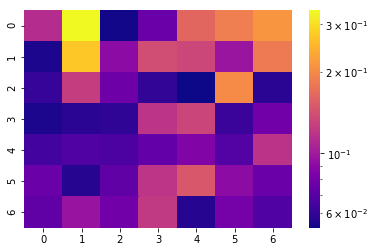

[[0.113 0.338 0.054 0.077 0.163 0.188 0.213]
 [0.055 0.274 0.091 0.139 0.133 0.097 0.183]
 [0.061 0.127 0.078 0.06  0.053 0.201 0.058]
 [0.055 0.058 0.059 0.119 0.132 0.062 0.079]
 [0.064 0.068 0.067 0.075 0.086 0.069 0.118]
 [0.077 0.057 0.073 0.12  0.149 0.091 0.077]
 [0.073 0.096 0.079 0.123 0.057 0.081 0.068]]


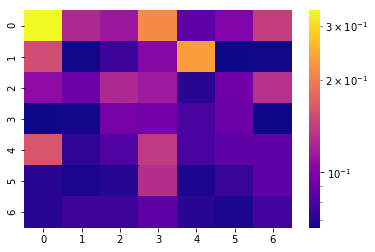

[[0.337 0.125 0.114 0.214 0.087 0.1   0.142]
 [0.153 0.067 0.076 0.103 0.233 0.066 0.067]
 [0.107 0.092 0.125 0.115 0.071 0.094 0.132]
 [0.066 0.067 0.097 0.096 0.08  0.092 0.066]
 [0.161 0.073 0.082 0.139 0.08  0.087 0.087]
 [0.071 0.069 0.07  0.129 0.069 0.075 0.087]
 [0.071 0.076 0.076 0.087 0.071 0.069 0.078]]


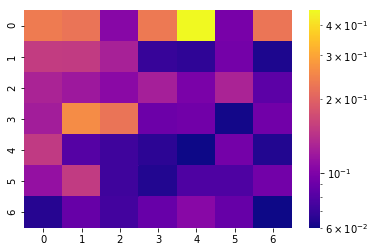

[[0.236 0.225 0.105 0.232 0.457 0.097 0.227]
 [0.153 0.152 0.127 0.07  0.068 0.095 0.063]
 [0.129 0.119 0.107 0.125 0.098 0.129 0.084]
 [0.123 0.262 0.224 0.091 0.093 0.061 0.093]
 [0.151 0.081 0.073 0.067 0.06  0.095 0.064]
 [0.113 0.152 0.073 0.064 0.078 0.078 0.094]
 [0.065 0.088 0.074 0.089 0.106 0.088 0.06 ]]


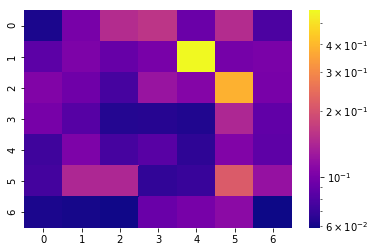

[[0.062 0.101 0.149 0.16  0.093 0.149 0.079]
 [0.086 0.104 0.091 0.101 0.57  0.099 0.102]
 [0.106 0.096 0.076 0.123 0.108 0.384 0.101]
 [0.1   0.083 0.064 0.065 0.063 0.143 0.088]
 [0.073 0.104 0.076 0.084 0.067 0.106 0.087]
 [0.075 0.143 0.143 0.068 0.071 0.214 0.12 ]
 [0.062 0.061 0.06  0.092 0.1   0.113 0.059]]


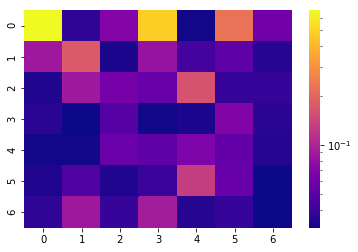

[[0.664 0.037 0.07  0.486 0.032 0.226 0.06 ]
 [0.087 0.174 0.033 0.082 0.043 0.053 0.035]
 [0.034 0.088 0.063 0.056 0.163 0.039 0.039]
 [0.036 0.031 0.049 0.032 0.033 0.069 0.036]
 [0.032 0.032 0.057 0.053 0.067 0.055 0.035]
 [0.034 0.047 0.034 0.04  0.13  0.056 0.031]
 [0.037 0.087 0.039 0.092 0.035 0.039 0.031]]


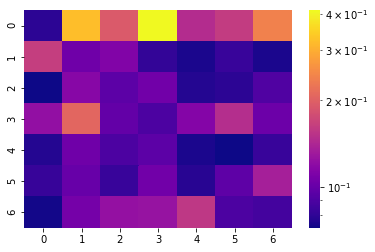

[[0.079 0.323 0.192 0.411 0.147 0.161 0.241]
 [0.164 0.104 0.113 0.081 0.075 0.083 0.075]
 [0.072 0.116 0.096 0.105 0.077 0.079 0.091]
 [0.123 0.207 0.099 0.09  0.115 0.148 0.103]
 [0.077 0.104 0.09  0.096 0.075 0.072 0.083]
 [0.082 0.101 0.083 0.105 0.078 0.097 0.135]
 [0.073 0.107 0.124 0.125 0.157 0.09  0.087]]


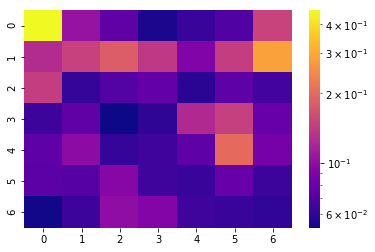

[[0.46  0.104 0.076 0.055 0.062 0.07  0.15 ]
 [0.126 0.148 0.183 0.138 0.091 0.144 0.287]
 [0.144 0.061 0.071 0.077 0.058 0.075 0.065]
 [0.063 0.076 0.052 0.059 0.123 0.146 0.079]
 [0.075 0.098 0.061 0.064 0.075 0.2   0.086]
 [0.074 0.072 0.094 0.064 0.062 0.079 0.063]
 [0.053 0.063 0.1   0.092 0.064 0.062 0.06 ]]


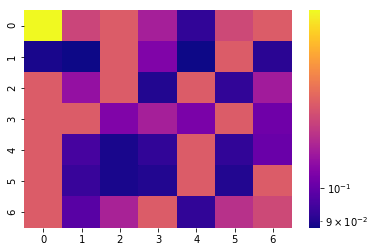

[[0.176 0.124 0.131 0.113 0.092 0.125 0.131]
 [0.089 0.088 0.131 0.105 0.088 0.131 0.091]
 [0.131 0.109 0.131 0.09  0.131 0.092 0.112]
 [0.131 0.131 0.105 0.113 0.104 0.131 0.102]
 [0.131 0.095 0.089 0.092 0.131 0.092 0.101]
 [0.131 0.093 0.089 0.09  0.131 0.09  0.131]
 [0.131 0.098 0.114 0.131 0.092 0.118 0.125]]


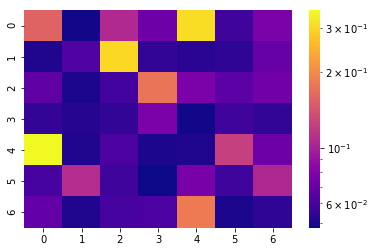

[[0.157 0.049 0.106 0.073 0.308 0.058 0.078]
 [0.051 0.063 0.301 0.055 0.053 0.054 0.07 ]
 [0.068 0.05  0.059 0.175 0.078 0.067 0.074]
 [0.055 0.052 0.055 0.078 0.049 0.058 0.055]
 [0.351 0.051 0.062 0.05  0.051 0.123 0.073]
 [0.06  0.108 0.058 0.048 0.077 0.058 0.105]
 [0.069 0.051 0.06  0.062 0.182 0.05  0.054]]


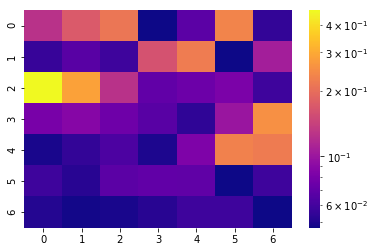

[[0.125 0.172 0.214 0.047 0.068 0.235 0.055]
 [0.056 0.067 0.058 0.161 0.222 0.047 0.107]
 [0.467 0.283 0.126 0.071 0.075 0.082 0.058]
 [0.081 0.088 0.076 0.067 0.054 0.099 0.254]
 [0.049 0.055 0.063 0.05  0.084 0.231 0.22 ]
 [0.058 0.052 0.068 0.071 0.07  0.047 0.058]
 [0.051 0.048 0.049 0.052 0.058 0.058 0.047]]


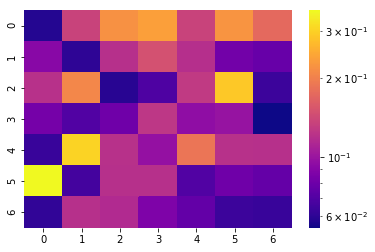

[[0.058 0.136 0.22  0.237 0.136 0.223 0.173]
 [0.092 0.06  0.12  0.149 0.119 0.082 0.078]
 [0.121 0.208 0.059 0.069 0.128 0.289 0.064]
 [0.083 0.07  0.081 0.125 0.095 0.099 0.054]
 [0.063 0.305 0.121 0.097 0.187 0.121 0.12 ]
 [0.36  0.066 0.12  0.12  0.07  0.081 0.077]
 [0.061 0.12  0.115 0.087 0.076 0.064 0.063]]


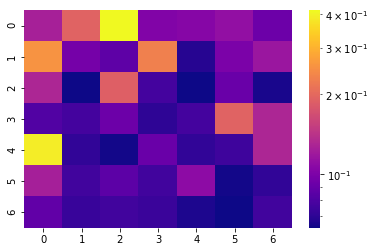

[[0.125 0.193 0.414 0.103 0.105 0.112 0.093]
 [0.255 0.097 0.087 0.231 0.068 0.1   0.117]
 [0.13  0.063 0.189 0.077 0.063 0.091 0.065]
 [0.082 0.077 0.093 0.07  0.077 0.193 0.13 ]
 [0.391 0.071 0.064 0.091 0.071 0.075 0.13 ]
 [0.124 0.076 0.086 0.076 0.109 0.064 0.071]
 [0.088 0.073 0.076 0.074 0.066 0.063 0.076]]


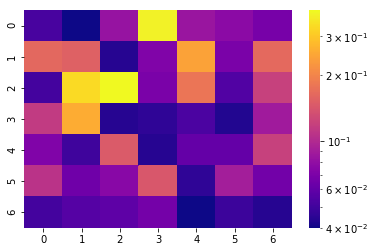

[[0.052 0.04  0.083 0.377 0.084 0.077 0.068]
 [0.162 0.154 0.044 0.072 0.243 0.069 0.164]
 [0.051 0.334 0.394 0.069 0.179 0.055 0.12 ]
 [0.114 0.257 0.044 0.046 0.053 0.043 0.088]
 [0.072 0.05  0.147 0.044 0.061 0.061 0.119]
 [0.107 0.065 0.076 0.143 0.046 0.091 0.066]
 [0.051 0.056 0.059 0.067 0.04  0.049 0.044]]


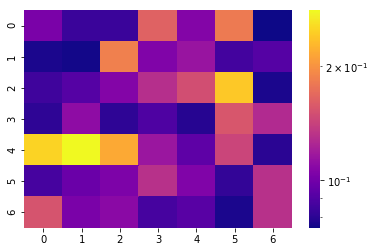

[[0.103 0.084 0.084 0.164 0.106 0.182 0.075]
 [0.077 0.076 0.186 0.105 0.115 0.086 0.091]
 [0.085 0.091 0.106 0.13  0.15  0.241 0.077]
 [0.081 0.111 0.081 0.089 0.079 0.156 0.127]
 [0.25  0.281 0.218 0.116 0.094 0.144 0.08 ]
 [0.087 0.098 0.104 0.131 0.105 0.082 0.131]
 [0.154 0.103 0.109 0.087 0.092 0.077 0.131]]


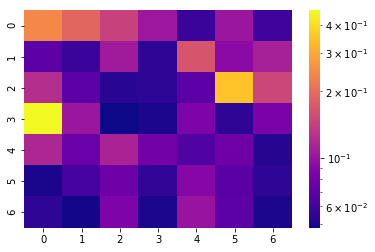

[[0.243 0.192 0.144 0.103 0.058 0.102 0.059]
 [0.07  0.058 0.105 0.055 0.168 0.092 0.11 ]
 [0.123 0.07  0.053 0.054 0.07  0.35  0.149]
 [0.467 0.102 0.048 0.051 0.085 0.055 0.083]
 [0.116 0.076 0.113 0.079 0.066 0.078 0.052]
 [0.05  0.062 0.077 0.056 0.089 0.069 0.055]
 [0.055 0.049 0.085 0.051 0.1   0.07  0.051]]


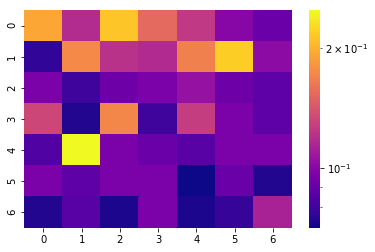

[[0.193 0.118 0.213 0.153 0.125 0.1   0.091]
 [0.077 0.174 0.121 0.117 0.168 0.218 0.102]
 [0.096 0.08  0.092 0.096 0.105 0.092 0.088]
 [0.133 0.074 0.172 0.08  0.127 0.096 0.088]
 [0.084 0.248 0.096 0.091 0.086 0.096 0.096]
 [0.096 0.088 0.096 0.096 0.071 0.091 0.074]
 [0.074 0.086 0.073 0.096 0.073 0.078 0.113]]


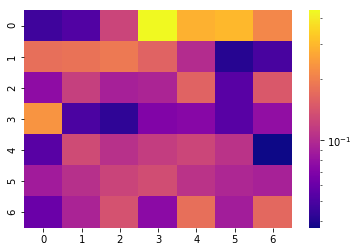

[[0.047 0.052 0.125 0.438 0.286 0.299 0.213]
 [0.177 0.183 0.191 0.162 0.101 0.041 0.049]
 [0.077 0.119 0.091 0.095 0.162 0.054 0.148]
 [0.235 0.05  0.043 0.07  0.073 0.054 0.078]
 [0.054 0.132 0.105 0.117 0.127 0.108 0.037]
 [0.088 0.104 0.124 0.134 0.107 0.097 0.092]
 [0.061 0.094 0.139 0.075 0.177 0.089 0.168]]


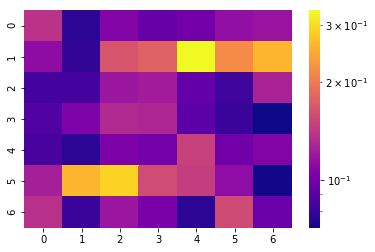

[[0.138 0.077 0.107 0.095 0.099 0.114 0.117]
 [0.112 0.079 0.166 0.176 0.333 0.216 0.258]
 [0.084 0.084 0.118 0.122 0.094 0.082 0.126]
 [0.088 0.105 0.131 0.129 0.091 0.081 0.071]
 [0.085 0.077 0.104 0.1   0.15  0.099 0.106]
 [0.124 0.258 0.291 0.158 0.147 0.113 0.072]
 [0.137 0.081 0.118 0.102 0.077 0.157 0.097]]


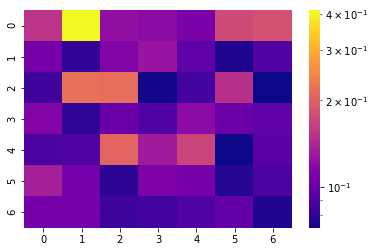

[[0.154 0.412 0.123 0.12  0.109 0.176 0.182]
 [0.108 0.081 0.113 0.126 0.097 0.076 0.091]
 [0.085 0.219 0.215 0.073 0.086 0.15  0.072]
 [0.114 0.08  0.103 0.091 0.12  0.103 0.097]
 [0.089 0.091 0.206 0.132 0.17  0.072 0.095]
 [0.135 0.108 0.079 0.111 0.108 0.077 0.09 ]
 [0.108 0.108 0.084 0.086 0.091 0.099 0.076]]


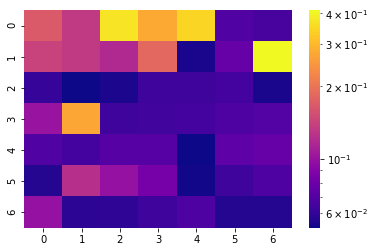

[[0.167 0.133 0.371 0.275 0.345 0.069 0.066]
 [0.142 0.133 0.118 0.185 0.054 0.077 0.412]
 [0.061 0.052 0.055 0.063 0.063 0.065 0.054]
 [0.101 0.271 0.063 0.064 0.065 0.068 0.07 ]
 [0.069 0.065 0.071 0.071 0.052 0.074 0.077]
 [0.056 0.124 0.1   0.084 0.053 0.063 0.068]
 [0.1   0.058 0.059 0.063 0.068 0.056 0.056]]


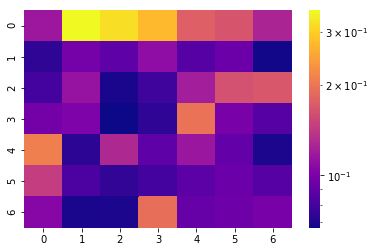

[[0.117 0.353 0.319 0.275 0.177 0.167 0.126]
 [0.074 0.098 0.089 0.11  0.086 0.094 0.068]
 [0.08  0.114 0.069 0.078 0.121 0.162 0.169]
 [0.097 0.102 0.067 0.074 0.196 0.099 0.086]
 [0.209 0.073 0.129 0.089 0.116 0.091 0.07 ]
 [0.146 0.083 0.075 0.08  0.088 0.094 0.086]
 [0.106 0.069 0.07  0.192 0.092 0.095 0.099]]


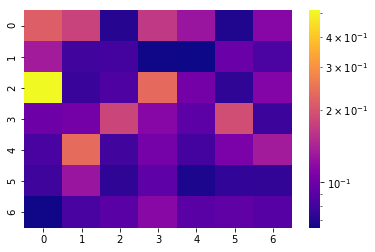

[[0.215 0.178 0.071 0.165 0.128 0.069 0.114]
 [0.134 0.08  0.081 0.066 0.065 0.098 0.084]
 [0.513 0.077 0.085 0.233 0.103 0.073 0.112]
 [0.1   0.103 0.18  0.115 0.091 0.191 0.078]
 [0.083 0.236 0.08  0.104 0.081 0.107 0.134]
 [0.079 0.128 0.073 0.092 0.068 0.074 0.075]
 [0.066 0.083 0.09  0.116 0.09  0.093 0.089]]


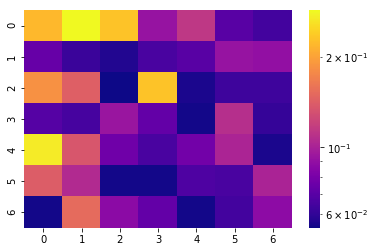

[[0.221 0.286 0.231 0.092 0.114 0.07  0.064]
 [0.074 0.062 0.057 0.066 0.07  0.092 0.09 ]
 [0.186 0.143 0.054 0.231 0.056 0.063 0.063]
 [0.069 0.065 0.093 0.073 0.055 0.108 0.061]
 [0.27  0.136 0.077 0.066 0.078 0.102 0.056]
 [0.141 0.105 0.055 0.055 0.067 0.066 0.101]
 [0.055 0.153 0.087 0.073 0.055 0.064 0.088]]


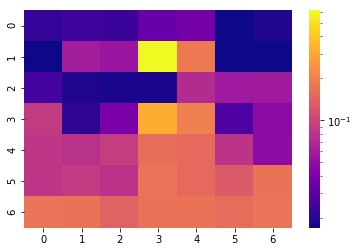

[[0.022 0.024 0.023 0.034 0.038 0.017 0.019]
 [0.017 0.061 0.055 0.614 0.186 0.017 0.017]
 [0.025 0.019 0.018 0.018 0.072 0.058 0.059]
 [0.088 0.021 0.04  0.32  0.199 0.027 0.048]
 [0.083 0.079 0.092 0.163 0.157 0.081 0.049]
 [0.082 0.088 0.08  0.175 0.156 0.132 0.173]
 [0.175 0.173 0.144 0.173 0.173 0.16  0.175]]


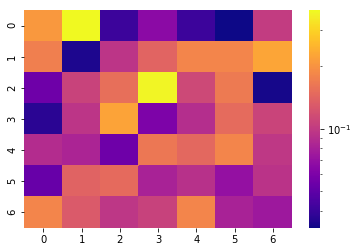

[[0.209 0.374 0.041 0.066 0.041 0.033 0.102]
 [0.174 0.035 0.096 0.142 0.182 0.182 0.227]
 [0.055 0.107 0.154 0.364 0.113 0.168 0.034]
 [0.037 0.096 0.225 0.06  0.09  0.15  0.108]
 [0.089 0.083 0.055 0.164 0.146 0.182 0.098]
 [0.053 0.14  0.148 0.082 0.092 0.07  0.094]
 [0.182 0.13  0.097 0.106 0.182 0.082 0.075]]


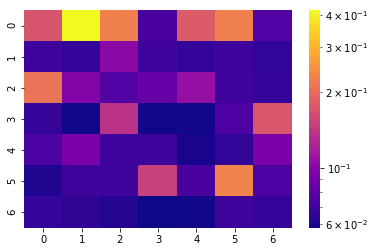

[[0.171 0.418 0.226 0.073 0.18  0.224 0.077]
 [0.07  0.067 0.102 0.07  0.067 0.07  0.066]
 [0.21  0.097 0.077 0.084 0.107 0.07  0.067]
 [0.067 0.059 0.136 0.059 0.059 0.075 0.173]
 [0.074 0.093 0.07  0.069 0.06  0.066 0.093]
 [0.062 0.07  0.07  0.15  0.073 0.229 0.074]
 [0.067 0.065 0.063 0.058 0.059 0.07  0.067]]


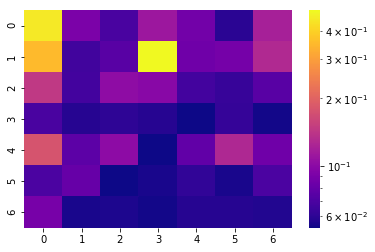

[[0.452 0.091 0.069 0.112 0.087 0.059 0.12 ]
 [0.353 0.066 0.075 0.493 0.085 0.088 0.128]
 [0.145 0.067 0.102 0.099 0.067 0.063 0.075]
 [0.069 0.058 0.06  0.058 0.053 0.062 0.054]
 [0.178 0.077 0.101 0.053 0.079 0.127 0.085]
 [0.07  0.081 0.053 0.055 0.061 0.055 0.07 ]
 [0.089 0.055 0.056 0.054 0.058 0.058 0.057]]
SKIPPPPPPEDDDD


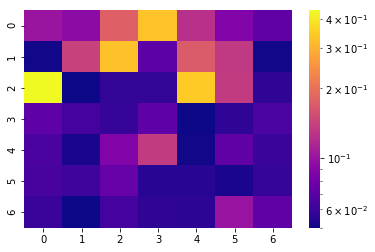

[[0.101 0.094 0.177 0.331 0.125 0.087 0.073]
 [0.051 0.142 0.327 0.071 0.171 0.134 0.051]
 [0.434 0.05  0.058 0.058 0.341 0.135 0.057]
 [0.072 0.063 0.059 0.072 0.05  0.057 0.065]
 [0.066 0.052 0.087 0.135 0.051 0.073 0.06 ]
 [0.064 0.061 0.075 0.055 0.055 0.052 0.059]
 [0.06  0.05  0.063 0.057 0.056 0.1   0.073]]


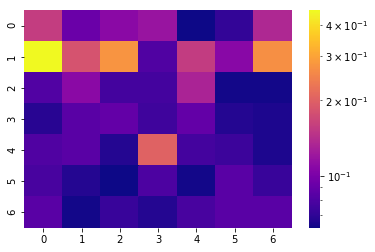

[[0.157 0.093 0.109 0.118 0.062 0.071 0.136]
 [0.457 0.182 0.276 0.081 0.156 0.108 0.268]
 [0.082 0.109 0.077 0.077 0.132 0.063 0.063]
 [0.068 0.085 0.089 0.075 0.089 0.067 0.065]
 [0.081 0.085 0.067 0.202 0.077 0.074 0.065]
 [0.078 0.067 0.062 0.08  0.063 0.085 0.073]
 [0.085 0.063 0.073 0.067 0.078 0.085 0.085]]


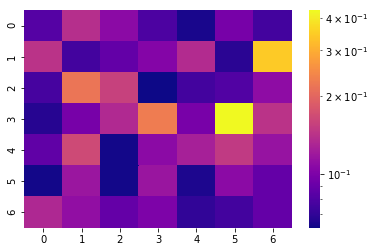

[[0.082 0.138 0.108 0.079 0.064 0.097 0.076]
 [0.143 0.076 0.088 0.104 0.135 0.068 0.345]
 [0.077 0.22  0.156 0.062 0.076 0.081 0.11 ]
 [0.067 0.097 0.133 0.229 0.098 0.428 0.143]
 [0.087 0.166 0.063 0.108 0.126 0.149 0.115]
 [0.063 0.117 0.063 0.116 0.065 0.108 0.089]
 [0.132 0.111 0.089 0.1   0.07  0.076 0.089]]


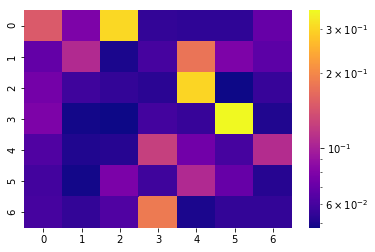

[[0.148 0.079 0.304 0.055 0.054 0.054 0.07 ]
 [0.069 0.107 0.05  0.06  0.176 0.079 0.067]
 [0.075 0.058 0.055 0.053 0.301 0.048 0.056]
 [0.079 0.049 0.048 0.059 0.056 0.355 0.051]
 [0.063 0.051 0.052 0.124 0.074 0.06  0.109]
 [0.059 0.049 0.078 0.058 0.106 0.07  0.052]
 [0.06  0.055 0.063 0.184 0.05  0.055 0.055]]


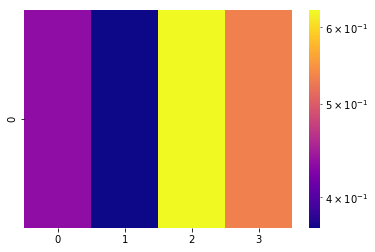

[[0.434 0.372 0.625 0.532]]


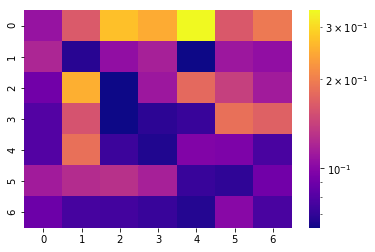

[[0.108 0.164 0.273 0.248 0.342 0.163 0.195]
 [0.121 0.068 0.105 0.117 0.063 0.111 0.105]
 [0.091 0.253 0.063 0.111 0.178 0.141 0.114]
 [0.08  0.157 0.063 0.069 0.072 0.186 0.17 ]
 [0.08  0.186 0.073 0.066 0.098 0.096 0.077]
 [0.114 0.126 0.129 0.117 0.072 0.07  0.091]
 [0.089 0.076 0.075 0.072 0.067 0.101 0.077]]


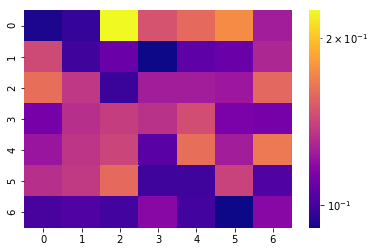

[[0.093 0.097 0.224 0.148 0.159 0.175 0.125]
 [0.144 0.099 0.109 0.091 0.106 0.109 0.129]
 [0.161 0.136 0.098 0.125 0.125 0.123 0.158]
 [0.112 0.133 0.139 0.134 0.146 0.113 0.112]
 [0.122 0.135 0.142 0.105 0.161 0.125 0.166]
 [0.133 0.137 0.159 0.099 0.099 0.141 0.103]
 [0.101 0.103 0.1   0.117 0.1   0.091 0.117]]


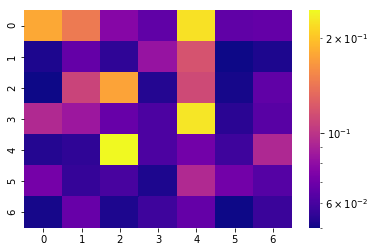

[[0.179 0.145 0.077 0.066 0.223 0.066 0.067]
 [0.052 0.067 0.055 0.083 0.118 0.05  0.052]
 [0.05  0.109 0.175 0.053 0.112 0.051 0.066]
 [0.094 0.085 0.068 0.061 0.227 0.054 0.064]
 [0.053 0.055 0.244 0.061 0.071 0.058 0.093]
 [0.072 0.056 0.06  0.052 0.094 0.071 0.063]
 [0.051 0.068 0.052 0.058 0.067 0.05  0.057]]


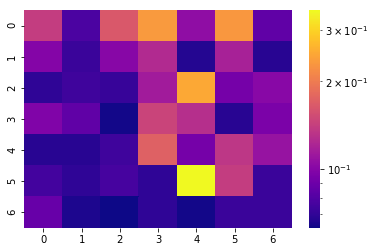

[[0.14  0.078 0.165 0.233 0.105 0.23  0.085]
 [0.1   0.073 0.101 0.125 0.067 0.119 0.068]
 [0.07  0.074 0.072 0.115 0.249 0.093 0.102]
 [0.098 0.085 0.064 0.146 0.129 0.068 0.096]
 [0.068 0.068 0.074 0.173 0.093 0.135 0.109]
 [0.075 0.07  0.076 0.07  0.35  0.14  0.073]
 [0.088 0.066 0.063 0.07  0.064 0.073 0.073]]


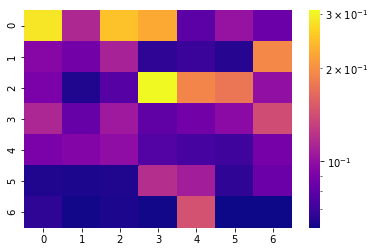

[[0.286 0.115 0.249 0.225 0.08  0.102 0.085]
 [0.095 0.087 0.111 0.067 0.07  0.065 0.194]
 [0.09  0.064 0.078 0.308 0.191 0.177 0.1  ]
 [0.114 0.083 0.106 0.081 0.087 0.097 0.141]
 [0.09  0.094 0.099 0.077 0.073 0.071 0.089]
 [0.064 0.063 0.064 0.119 0.108 0.067 0.085]
 [0.067 0.062 0.063 0.062 0.145 0.061 0.061]]


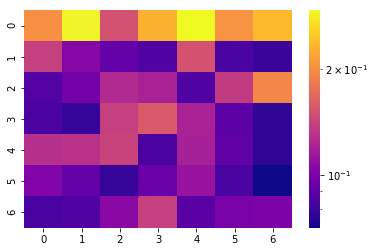

[[0.2   0.286 0.151 0.228 0.292 0.205 0.235]
 [0.139 0.105 0.092 0.086 0.152 0.084 0.08 ]
 [0.087 0.097 0.125 0.12  0.086 0.136 0.193]
 [0.085 0.079 0.139 0.157 0.12  0.09  0.077]
 [0.128 0.13  0.141 0.085 0.119 0.091 0.077]
 [0.102 0.092 0.079 0.094 0.112 0.084 0.071]
 [0.084 0.086 0.106 0.139 0.089 0.099 0.101]]


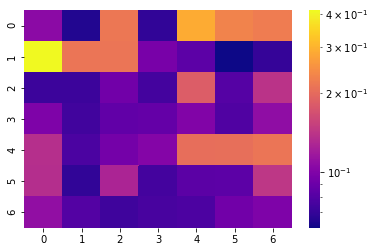

[[0.106 0.065 0.216 0.069 0.287 0.231 0.223]
 [0.413 0.214 0.214 0.096 0.084 0.061 0.07 ]
 [0.072 0.072 0.092 0.075 0.184 0.081 0.139]
 [0.099 0.074 0.086 0.087 0.1   0.079 0.108]
 [0.135 0.077 0.094 0.102 0.204 0.206 0.214]
 [0.134 0.069 0.126 0.075 0.083 0.084 0.142]
 [0.109 0.08  0.073 0.076 0.078 0.092 0.099]]


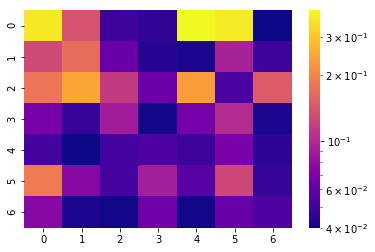

[[0.364 0.138 0.049 0.046 0.396 0.368 0.04 ]
 [0.13  0.168 0.063 0.044 0.042 0.093 0.05 ]
 [0.179 0.247 0.115 0.064 0.234 0.053 0.148]
 [0.069 0.047 0.089 0.041 0.068 0.101 0.042]
 [0.051 0.04  0.051 0.054 0.049 0.07  0.045]
 [0.188 0.076 0.051 0.091 0.057 0.126 0.047]
 [0.076 0.042 0.041 0.065 0.041 0.062 0.054]]
SKIPPPPPPEDDDD


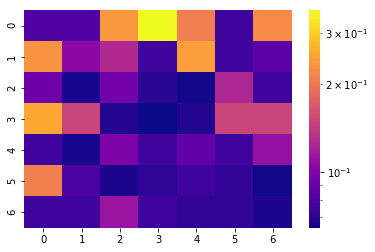

[[0.081 0.081 0.238 0.359 0.208 0.075 0.222]
 [0.233 0.104 0.127 0.075 0.244 0.075 0.084]
 [0.092 0.066 0.093 0.069 0.065 0.125 0.075]
 [0.258 0.15  0.068 0.064 0.068 0.15  0.15 ]
 [0.075 0.066 0.098 0.075 0.087 0.075 0.11 ]
 [0.209 0.079 0.067 0.071 0.075 0.072 0.065]
 [0.075 0.075 0.112 0.075 0.072 0.072 0.067]]


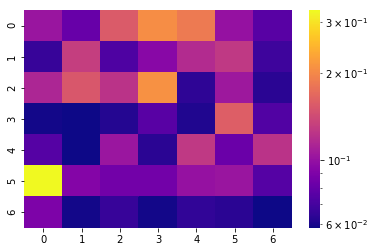

[[0.102 0.081 0.156 0.205 0.186 0.1   0.076]
 [0.066 0.131 0.073 0.094 0.117 0.127 0.068]
 [0.113 0.152 0.123 0.209 0.064 0.104 0.063]
 [0.059 0.058 0.062 0.076 0.061 0.159 0.074]
 [0.075 0.058 0.103 0.063 0.127 0.082 0.123]
 [0.329 0.092 0.085 0.085 0.1   0.102 0.075]
 [0.089 0.059 0.066 0.059 0.065 0.063 0.058]]


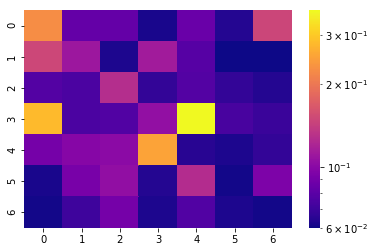

[[0.226 0.084 0.084 0.062 0.086 0.064 0.148]
 [0.149 0.11  0.063 0.113 0.079 0.06  0.06 ]
 [0.078 0.075 0.127 0.068 0.078 0.068 0.064]
 [0.281 0.075 0.077 0.105 0.369 0.074 0.07 ]
 [0.091 0.098 0.101 0.253 0.065 0.063 0.068]
 [0.062 0.092 0.104 0.064 0.126 0.061 0.094]
 [0.061 0.071 0.091 0.063 0.077 0.063 0.061]]


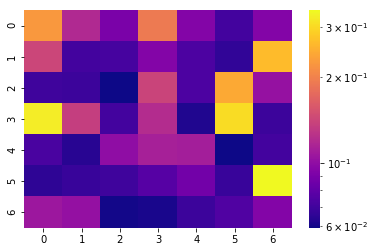

[[0.225 0.119 0.09  0.192 0.094 0.071 0.094]
 [0.142 0.071 0.072 0.094 0.074 0.066 0.266]
 [0.07  0.069 0.059 0.14  0.074 0.245 0.103]
 [0.326 0.135 0.071 0.121 0.062 0.304 0.069]
 [0.073 0.064 0.1   0.112 0.111 0.059 0.071]
 [0.065 0.068 0.07  0.077 0.087 0.068 0.344]
 [0.106 0.102 0.06  0.061 0.069 0.075 0.094]]


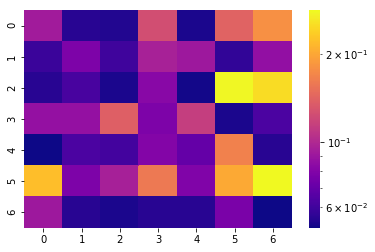

[[0.093 0.055 0.054 0.125 0.053 0.141 0.18 ]
 [0.059 0.078 0.06  0.096 0.091 0.057 0.086]
 [0.055 0.062 0.053 0.082 0.052 0.279 0.251]
 [0.087 0.087 0.138 0.078 0.114 0.053 0.063]
 [0.051 0.063 0.061 0.08  0.07  0.167 0.055]
 [0.222 0.078 0.095 0.159 0.079 0.203 0.282]
 [0.091 0.055 0.053 0.055 0.055 0.077 0.051]]


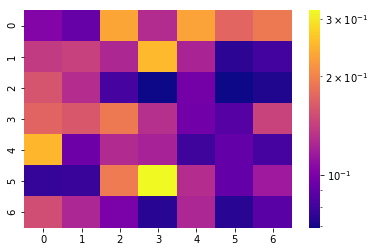

[[0.104 0.092 0.232 0.128 0.23  0.173 0.191]
 [0.139 0.143 0.125 0.253 0.123 0.075 0.081]
 [0.159 0.129 0.082 0.069 0.097 0.069 0.072]
 [0.172 0.162 0.191 0.13  0.096 0.087 0.145]
 [0.25  0.095 0.127 0.121 0.08  0.091 0.082]
 [0.077 0.078 0.193 0.318 0.129 0.091 0.116]
 [0.153 0.124 0.1   0.074 0.124 0.074 0.088]]


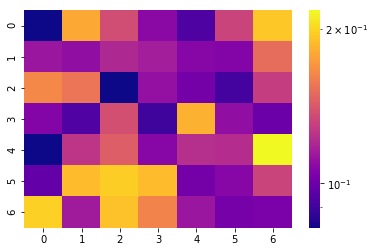

[[0.082 0.179 0.136 0.108 0.093 0.132 0.194]
 [0.113 0.11  0.12  0.116 0.107 0.106 0.151]
 [0.164 0.155 0.082 0.111 0.102 0.091 0.129]
 [0.106 0.094 0.137 0.09  0.183 0.11  0.1  ]
 [0.082 0.126 0.144 0.107 0.123 0.122 0.217]
 [0.098 0.188 0.197 0.188 0.102 0.107 0.132]
 [0.198 0.115 0.191 0.162 0.113 0.103 0.104]]
SKIPPPPPPEDDDD


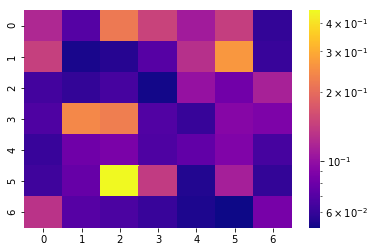

[[0.12  0.07  0.219 0.147 0.109 0.143 0.059]
 [0.144 0.053 0.056 0.071 0.128 0.266 0.061]
 [0.064 0.059 0.065 0.052 0.101 0.082 0.114]
 [0.068 0.242 0.226 0.069 0.06  0.092 0.088]
 [0.061 0.081 0.086 0.068 0.075 0.089 0.065]
 [0.063 0.077 0.453 0.139 0.055 0.112 0.059]
 [0.131 0.071 0.067 0.061 0.054 0.051 0.085]]


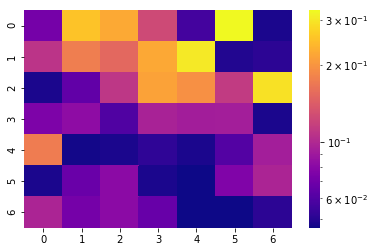

[[0.072 0.256 0.224 0.125 0.057 0.328 0.048]
 [0.108 0.175 0.153 0.222 0.304 0.049 0.051]
 [0.048 0.065 0.11  0.216 0.195 0.113 0.294]
 [0.075 0.082 0.06  0.096 0.092 0.093 0.048]
 [0.174 0.047 0.048 0.052 0.048 0.061 0.093]
 [0.048 0.068 0.081 0.048 0.046 0.076 0.097]
 [0.097 0.072 0.081 0.067 0.046 0.046 0.051]]


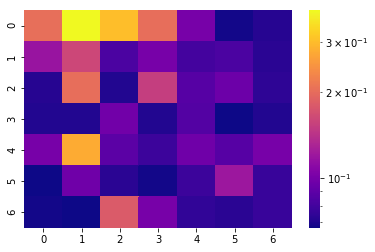

[[0.204 0.387 0.304 0.202 0.101 0.068 0.072]
 [0.118 0.162 0.083 0.101 0.081 0.083 0.073]
 [0.072 0.202 0.071 0.153 0.087 0.096 0.074]
 [0.071 0.071 0.098 0.071 0.086 0.067 0.071]
 [0.101 0.278 0.089 0.078 0.097 0.087 0.101]
 [0.067 0.097 0.073 0.068 0.078 0.12  0.077]
 [0.068 0.067 0.182 0.101 0.075 0.073 0.077]]
SKIPPPPPPEDDDD


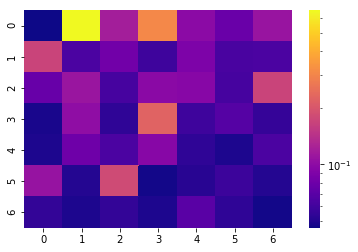

[[0.046 0.66  0.119 0.306 0.099 0.078 0.109]
 [0.169 0.064 0.082 0.059 0.089 0.063 0.064]
 [0.077 0.11  0.062 0.098 0.096 0.062 0.169]
 [0.048 0.102 0.054 0.226 0.059 0.068 0.056]
 [0.049 0.08  0.064 0.096 0.054 0.049 0.064]
 [0.107 0.051 0.18  0.047 0.052 0.058 0.051]
 [0.055 0.049 0.055 0.049 0.07  0.054 0.047]]


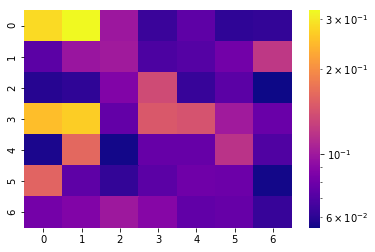

[[0.283 0.321 0.099 0.064 0.074 0.061 0.062]
 [0.073 0.098 0.101 0.069 0.071 0.081 0.121]
 [0.059 0.061 0.087 0.136 0.063 0.073 0.055]
 [0.252 0.267 0.076 0.148 0.143 0.101 0.078]
 [0.057 0.162 0.056 0.077 0.077 0.118 0.07 ]
 [0.158 0.074 0.062 0.073 0.08  0.079 0.056]
 [0.082 0.087 0.1   0.089 0.075 0.077 0.063]]


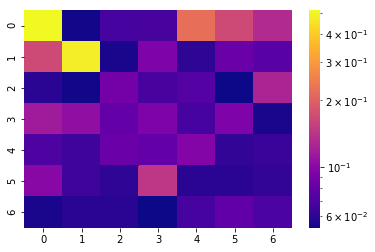

[[0.512 0.054 0.068 0.069 0.224 0.168 0.132]
 [0.169 0.482 0.055 0.094 0.06  0.083 0.075]
 [0.059 0.054 0.088 0.069 0.074 0.053 0.126]
 [0.116 0.105 0.08  0.094 0.068 0.094 0.055]
 [0.071 0.066 0.084 0.08  0.097 0.062 0.064]
 [0.1   0.066 0.061 0.145 0.059 0.059 0.062]
 [0.055 0.059 0.059 0.053 0.068 0.079 0.07 ]]


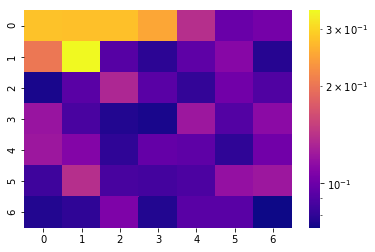

[[0.279 0.278 0.278 0.25  0.139 0.099 0.104]
 [0.203 0.342 0.092 0.079 0.095 0.112 0.078]
 [0.075 0.093 0.133 0.093 0.081 0.102 0.09 ]
 [0.12  0.088 0.077 0.075 0.122 0.091 0.114]
 [0.122 0.11  0.08  0.097 0.095 0.08  0.102]
 [0.084 0.139 0.087 0.086 0.089 0.118 0.122]
 [0.077 0.08  0.108 0.077 0.093 0.093 0.073]]


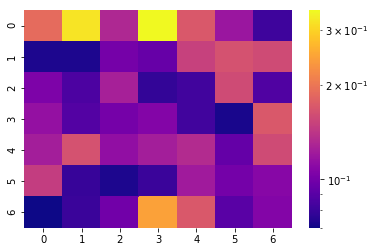

[[0.19  0.32  0.131 0.347 0.172 0.119 0.081]
 [0.073 0.073 0.101 0.095 0.151 0.165 0.159]
 [0.104 0.086 0.126 0.078 0.082 0.159 0.087]
 [0.115 0.088 0.101 0.107 0.082 0.072 0.172]
 [0.124 0.165 0.114 0.124 0.134 0.094 0.159]
 [0.148 0.079 0.073 0.08  0.122 0.1   0.109]
 [0.07  0.08  0.099 0.245 0.172 0.09  0.107]]


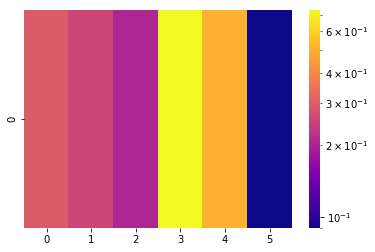

[[0.297 0.257 0.204 0.732 0.51  0.09 ]]


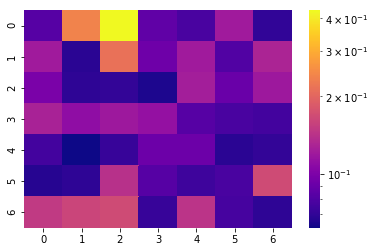

[[0.083 0.239 0.43  0.087 0.078 0.121 0.07 ]
 [0.121 0.068 0.216 0.093 0.121 0.081 0.13 ]
 [0.099 0.069 0.071 0.065 0.124 0.091 0.119]
 [0.128 0.111 0.119 0.113 0.083 0.078 0.076]
 [0.076 0.062 0.072 0.092 0.092 0.068 0.071]
 [0.067 0.069 0.141 0.083 0.074 0.078 0.168]
 [0.15  0.162 0.168 0.072 0.144 0.077 0.069]]
SKIPPPPPPEDDDD


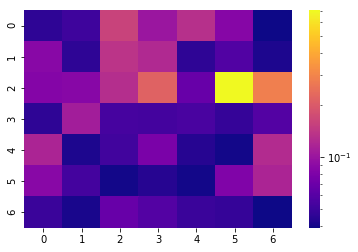

[[0.046 0.051 0.16  0.101 0.132 0.086 0.039]
 [0.088 0.046 0.137 0.123 0.046 0.058 0.042]
 [0.085 0.087 0.129 0.217 0.068 0.705 0.283]
 [0.046 0.109 0.054 0.053 0.055 0.048 0.059]
 [0.118 0.042 0.052 0.078 0.044 0.04  0.126]
 [0.088 0.053 0.04  0.044 0.04  0.082 0.118]
 [0.05  0.041 0.068 0.059 0.05  0.048 0.039]]


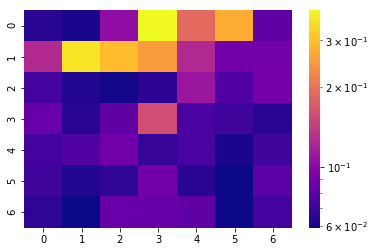

[[0.064 0.061 0.104 0.389 0.188 0.277 0.082]
 [0.126 0.354 0.295 0.251 0.125 0.089 0.089]
 [0.072 0.063 0.06  0.065 0.11  0.076 0.09 ]
 [0.085 0.064 0.082 0.159 0.074 0.07  0.064]
 [0.072 0.076 0.089 0.068 0.074 0.061 0.07 ]
 [0.07  0.063 0.066 0.089 0.064 0.059 0.08 ]
 [0.066 0.059 0.085 0.085 0.082 0.059 0.072]]


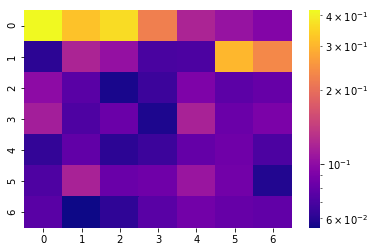

[[0.419 0.321 0.364 0.221 0.119 0.105 0.094]
 [0.061 0.119 0.103 0.07  0.071 0.304 0.234]
 [0.099 0.076 0.057 0.066 0.092 0.077 0.081]
 [0.114 0.072 0.083 0.058 0.117 0.083 0.09 ]
 [0.063 0.079 0.061 0.066 0.08  0.085 0.071]
 [0.072 0.117 0.082 0.085 0.107 0.086 0.059]
 [0.076 0.055 0.062 0.076 0.086 0.081 0.079]]


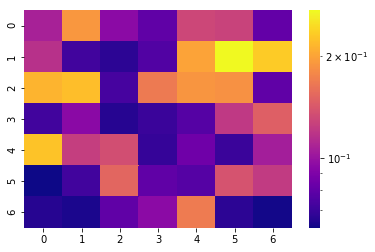

[[0.107 0.19  0.095 0.08  0.13  0.127 0.081]
 [0.116 0.072 0.067 0.076 0.2   0.272 0.232]
 [0.213 0.221 0.073 0.167 0.188 0.185 0.08 ]
 [0.072 0.094 0.066 0.07  0.077 0.121 0.147]
 [0.225 0.124 0.135 0.069 0.085 0.07  0.105]
 [0.062 0.072 0.152 0.08  0.077 0.138 0.122]
 [0.066 0.064 0.08  0.095 0.168 0.067 0.063]]


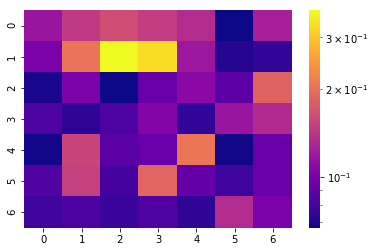

[[0.117 0.146 0.162 0.148 0.134 0.067 0.124]
 [0.101 0.203 0.371 0.333 0.119 0.072 0.076]
 [0.069 0.102 0.067 0.093 0.109 0.089 0.185]
 [0.084 0.074 0.084 0.105 0.075 0.117 0.133]
 [0.068 0.155 0.088 0.093 0.205 0.068 0.093]
 [0.085 0.151 0.081 0.188 0.092 0.079 0.093]
 [0.079 0.083 0.077 0.084 0.074 0.134 0.101]]


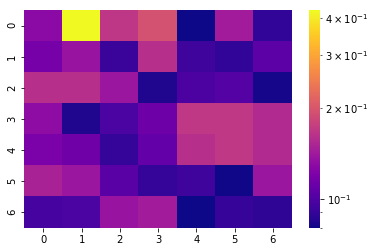

[[0.129 0.423 0.167 0.194 0.08  0.143 0.089]
 [0.118 0.137 0.092 0.161 0.094 0.089 0.105]
 [0.161 0.161 0.139 0.084 0.099 0.102 0.082]
 [0.131 0.084 0.098 0.113 0.169 0.169 0.156]
 [0.119 0.114 0.09  0.109 0.161 0.169 0.156]
 [0.149 0.139 0.104 0.09  0.093 0.081 0.139]
 [0.096 0.098 0.137 0.143 0.08  0.091 0.088]]


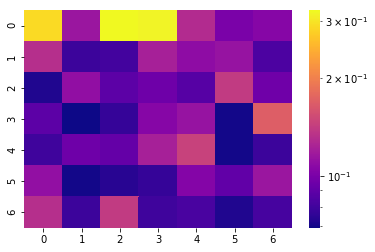

[[0.289 0.115 0.323 0.317 0.129 0.1   0.105]
 [0.131 0.079 0.081 0.121 0.109 0.113 0.084]
 [0.072 0.11  0.089 0.095 0.087 0.14  0.096]
 [0.089 0.069 0.077 0.105 0.113 0.07  0.169]
 [0.08  0.095 0.092 0.121 0.145 0.07  0.079]
 [0.111 0.07  0.074 0.077 0.104 0.091 0.115]
 [0.131 0.079 0.14  0.08  0.083 0.072 0.082]]


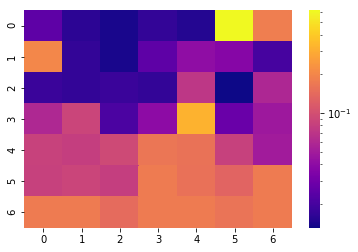

[[0.025 0.016 0.014 0.017 0.015 0.617 0.181]
 [0.2   0.017 0.014 0.025 0.041 0.037 0.02 ]
 [0.018 0.017 0.018 0.017 0.072 0.013 0.058]
 [0.059 0.088 0.021 0.04  0.322 0.028 0.048]
 [0.084 0.08  0.093 0.164 0.158 0.082 0.05 ]
 [0.083 0.088 0.08  0.176 0.156 0.132 0.174]
 [0.176 0.174 0.144 0.174 0.174 0.16  0.176]]


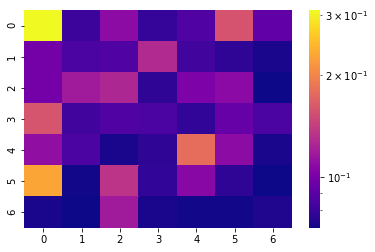

[[0.309 0.081 0.109 0.079 0.087 0.157 0.092]
 [0.099 0.085 0.087 0.128 0.082 0.077 0.073]
 [0.099 0.118 0.126 0.077 0.102 0.108 0.071]
 [0.158 0.082 0.087 0.085 0.078 0.094 0.085]
 [0.111 0.085 0.073 0.077 0.179 0.109 0.073]
 [0.228 0.072 0.135 0.078 0.107 0.077 0.071]
 [0.073 0.071 0.118 0.073 0.072 0.072 0.074]]


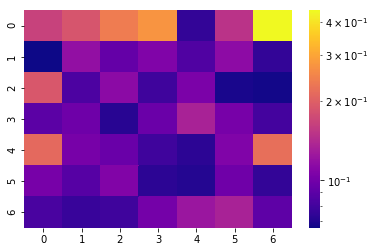

[[0.165 0.188 0.24  0.274 0.075 0.15  0.442]
 [0.066 0.118 0.094 0.107 0.085 0.115 0.075]
 [0.19  0.084 0.114 0.079 0.105 0.068 0.067]
 [0.09  0.098 0.072 0.097 0.134 0.103 0.081]
 [0.212 0.103 0.096 0.079 0.073 0.107 0.221]
 [0.103 0.088 0.108 0.073 0.071 0.099 0.075]
 [0.083 0.077 0.079 0.101 0.124 0.134 0.091]]


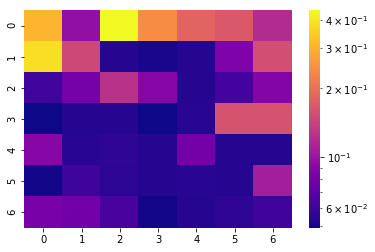

[[0.305 0.096 0.439 0.243 0.183 0.167 0.119]
 [0.386 0.148 0.053 0.051 0.053 0.085 0.157]
 [0.061 0.081 0.125 0.09  0.053 0.062 0.087]
 [0.049 0.053 0.053 0.049 0.054 0.16  0.16 ]
 [0.09  0.054 0.056 0.053 0.08  0.053 0.053]
 [0.05  0.06  0.055 0.053 0.054 0.053 0.107]
 [0.082 0.079 0.063 0.05  0.053 0.056 0.06 ]]


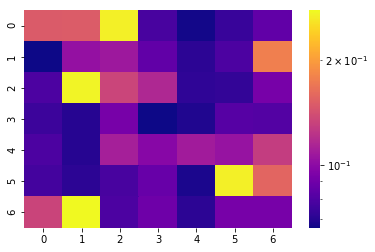

[[0.149 0.15  0.269 0.078 0.067 0.074 0.085]
 [0.066 0.103 0.107 0.085 0.071 0.079 0.176]
 [0.079 0.272 0.134 0.116 0.072 0.073 0.092]
 [0.075 0.07  0.092 0.066 0.069 0.082 0.081]
 [0.079 0.07  0.111 0.098 0.109 0.104 0.129]
 [0.077 0.071 0.078 0.087 0.068 0.268 0.157]
 [0.133 0.277 0.079 0.089 0.071 0.092 0.092]]


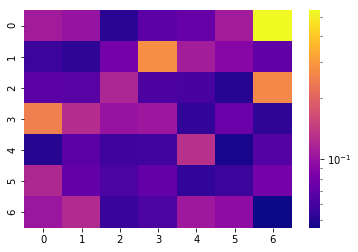

[[0.109 0.101 0.052 0.069 0.073 0.109 0.537]
 [0.057 0.053 0.081 0.278 0.11  0.09  0.071]
 [0.069 0.067 0.118 0.063 0.061 0.051 0.266]
 [0.247 0.126 0.101 0.105 0.054 0.075 0.053]
 [0.051 0.068 0.058 0.059 0.13  0.048 0.066]
 [0.121 0.072 0.062 0.072 0.054 0.057 0.081]
 [0.104 0.123 0.056 0.062 0.106 0.095 0.046]]


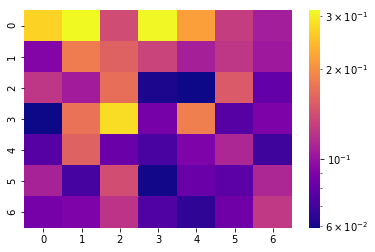

[[0.268 0.313 0.14  0.31  0.217 0.129 0.107]
 [0.092 0.183 0.158 0.134 0.108 0.124 0.104]
 [0.124 0.106 0.17  0.061 0.059 0.151 0.08 ]
 [0.059 0.174 0.281 0.087 0.185 0.076 0.089]
 [0.076 0.158 0.082 0.072 0.09  0.112 0.069]
 [0.109 0.071 0.142 0.06  0.082 0.078 0.112]
 [0.087 0.09  0.122 0.074 0.065 0.084 0.125]]


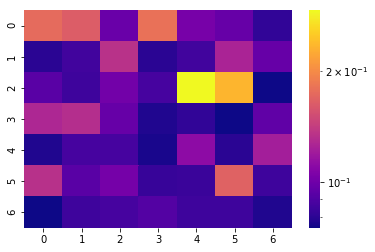

[[0.175 0.164 0.098 0.179 0.103 0.097 0.082]
 [0.08  0.086 0.134 0.08  0.086 0.125 0.097]
 [0.093 0.085 0.101 0.087 0.291 0.234 0.075]
 [0.127 0.131 0.097 0.078 0.082 0.075 0.095]
 [0.078 0.087 0.087 0.077 0.111 0.08  0.122]
 [0.133 0.093 0.102 0.083 0.084 0.167 0.085]
 [0.075 0.085 0.087 0.091 0.085 0.085 0.078]]


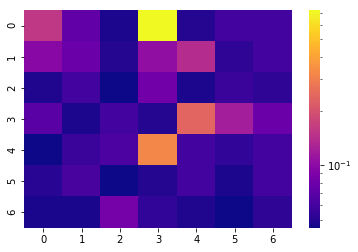

[[0.155 0.074 0.048 0.721 0.05  0.06  0.06 ]
 [0.098 0.078 0.05  0.104 0.14  0.053 0.06 ]
 [0.049 0.06  0.045 0.082 0.048 0.057 0.053]
 [0.07  0.048 0.06  0.05  0.24  0.121 0.079]
 [0.045 0.057 0.064 0.321 0.06  0.054 0.06 ]
 [0.051 0.062 0.045 0.05  0.06  0.048 0.06 ]
 [0.047 0.047 0.085 0.054 0.049 0.045 0.053]]


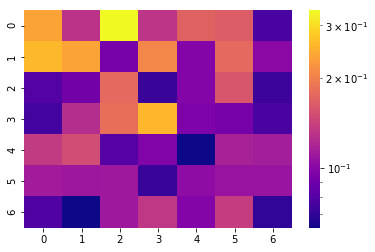

[[0.237 0.13  0.337 0.132 0.17  0.166 0.077]
 [0.261 0.237 0.093 0.207 0.098 0.177 0.101]
 [0.08  0.091 0.177 0.072 0.098 0.159 0.073]
 [0.075 0.126 0.183 0.258 0.096 0.093 0.077]
 [0.136 0.151 0.081 0.097 0.063 0.117 0.115]
 [0.113 0.11  0.111 0.072 0.103 0.108 0.109]
 [0.079 0.063 0.111 0.133 0.098 0.138 0.07 ]]


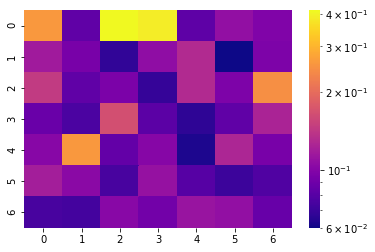

[[0.259 0.084 0.413 0.389 0.083 0.108 0.098]
 [0.117 0.095 0.068 0.107 0.13  0.06  0.097]
 [0.145 0.084 0.096 0.069 0.13  0.097 0.247]
 [0.088 0.076 0.166 0.082 0.067 0.084 0.124]
 [0.102 0.259 0.085 0.101 0.063 0.126 0.095]
 [0.12  0.104 0.075 0.11  0.08  0.071 0.078]
 [0.075 0.074 0.103 0.092 0.112 0.108 0.087]]


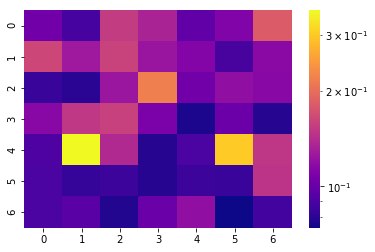

[[0.104 0.088 0.154 0.134 0.098 0.111 0.183]
 [0.163 0.127 0.16  0.124 0.112 0.089 0.116]
 [0.084 0.08  0.125 0.218 0.104 0.119 0.115]
 [0.115 0.15  0.158 0.109 0.077 0.102 0.079]
 [0.091 0.359 0.138 0.079 0.09  0.301 0.149]
 [0.09  0.083 0.085 0.079 0.085 0.084 0.147]
 [0.09  0.095 0.078 0.101 0.119 0.074 0.087]]


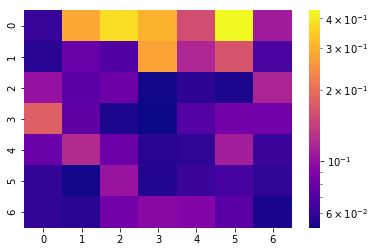

[[0.061 0.285 0.378 0.301 0.159 0.433 0.109]
 [0.057 0.079 0.069 0.278 0.118 0.166 0.067]
 [0.101 0.073 0.081 0.053 0.058 0.055 0.117]
 [0.179 0.075 0.055 0.052 0.071 0.083 0.083]
 [0.079 0.121 0.08  0.057 0.059 0.111 0.062]
 [0.06  0.053 0.103 0.056 0.062 0.066 0.059]
 [0.06  0.057 0.083 0.094 0.092 0.073 0.054]]


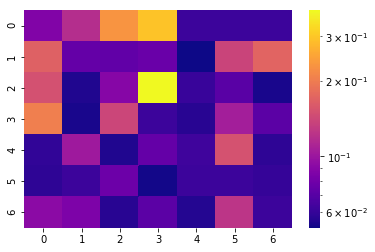

[[0.087 0.118 0.23  0.297 0.062 0.062 0.062]
 [0.168 0.075 0.074 0.077 0.052 0.138 0.171]
 [0.15  0.055 0.089 0.381 0.061 0.071 0.054]
 [0.204 0.054 0.14  0.062 0.057 0.106 0.072]
 [0.059 0.103 0.055 0.075 0.063 0.152 0.058]
 [0.058 0.062 0.078 0.053 0.062 0.062 0.06 ]
 [0.092 0.085 0.057 0.072 0.056 0.125 0.062]]


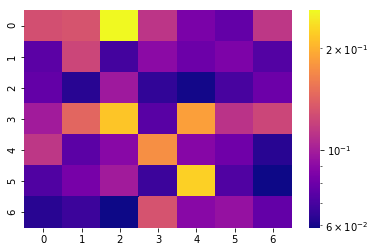

[[0.129 0.132 0.259 0.113 0.084 0.077 0.114]
 [0.075 0.123 0.069 0.09  0.08  0.085 0.073]
 [0.077 0.063 0.098 0.065 0.06  0.07  0.08 ]
 [0.099 0.145 0.216 0.074 0.187 0.112 0.123]
 [0.114 0.075 0.089 0.174 0.088 0.081 0.063]
 [0.072 0.083 0.099 0.067 0.225 0.072 0.059]
 [0.063 0.067 0.059 0.131 0.089 0.094 0.077]]


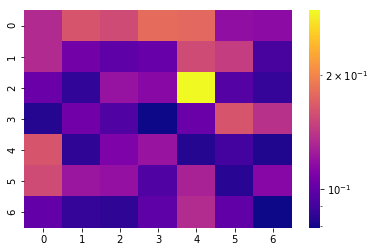

[[0.134 0.163 0.156 0.18  0.177 0.118 0.116]
 [0.134 0.106 0.099 0.102 0.156 0.146 0.092]
 [0.103 0.086 0.12  0.114 0.296 0.096 0.087]
 [0.083 0.105 0.095 0.079 0.103 0.163 0.138]
 [0.163 0.085 0.11  0.121 0.083 0.091 0.082]
 [0.156 0.122 0.119 0.095 0.129 0.084 0.113]
 [0.101 0.087 0.085 0.099 0.135 0.1   0.079]]


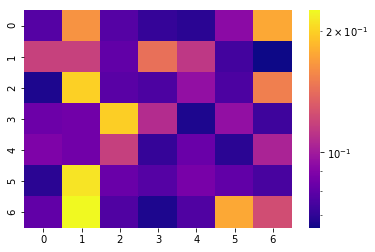

[[0.078 0.164 0.078 0.071 0.069 0.093 0.176]
 [0.118 0.118 0.081 0.144 0.113 0.074 0.065]
 [0.067 0.2   0.079 0.076 0.095 0.076 0.152]
 [0.084 0.085 0.199 0.108 0.067 0.095 0.073]
 [0.089 0.085 0.117 0.071 0.083 0.069 0.104]
 [0.069 0.212 0.083 0.078 0.087 0.081 0.075]
 [0.081 0.225 0.077 0.067 0.077 0.176 0.124]]


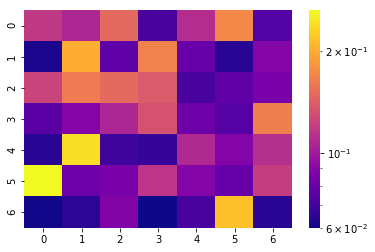

[[0.117 0.107 0.149 0.071 0.11  0.173 0.074]
 [0.062 0.202 0.077 0.168 0.08  0.064 0.089]
 [0.124 0.163 0.149 0.139 0.071 0.078 0.085]
 [0.076 0.089 0.106 0.133 0.082 0.075 0.166]
 [0.064 0.241 0.069 0.067 0.108 0.089 0.111]
 [0.264 0.082 0.085 0.115 0.089 0.08  0.12 ]
 [0.061 0.065 0.088 0.06  0.071 0.216 0.064]]


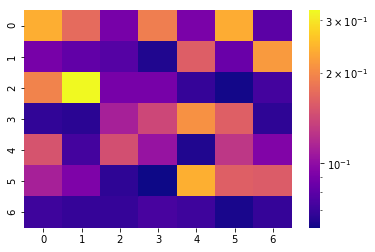

[[0.239 0.173 0.09  0.19  0.091 0.238 0.08 ]
 [0.09  0.082 0.078 0.064 0.161 0.085 0.218]
 [0.195 0.324 0.09  0.09  0.069 0.062 0.073]
 [0.068 0.066 0.112 0.141 0.21  0.162 0.067]
 [0.152 0.073 0.148 0.104 0.064 0.128 0.094]
 [0.112 0.093 0.067 0.061 0.241 0.162 0.159]
 [0.071 0.069 0.069 0.074 0.071 0.063 0.069]]


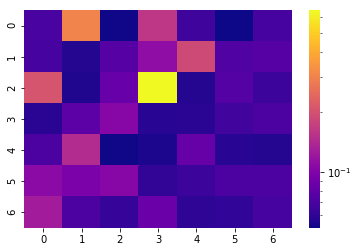

[[0.07  0.302 0.053 0.159 0.066 0.052 0.069]
 [0.069 0.057 0.076 0.111 0.188 0.073 0.076]
 [0.206 0.056 0.085 0.651 0.057 0.075 0.065]
 [0.059 0.079 0.103 0.058 0.059 0.067 0.072]
 [0.072 0.144 0.053 0.055 0.084 0.058 0.057]
 [0.107 0.096 0.104 0.062 0.065 0.072 0.072]
 [0.126 0.072 0.063 0.086 0.06  0.061 0.069]]


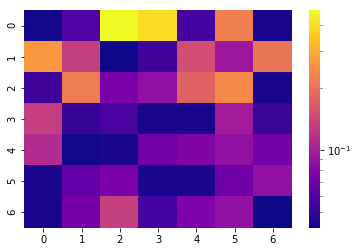

[[0.043 0.058 0.473 0.402 0.055 0.22  0.044]
 [0.264 0.132 0.042 0.053 0.148 0.094 0.207]
 [0.053 0.217 0.076 0.088 0.176 0.235 0.044]
 [0.13  0.05  0.056 0.044 0.044 0.098 0.051]
 [0.112 0.043 0.044 0.071 0.079 0.088 0.072]
 [0.044 0.065 0.076 0.044 0.044 0.07  0.088]
 [0.044 0.073 0.132 0.055 0.077 0.088 0.042]]


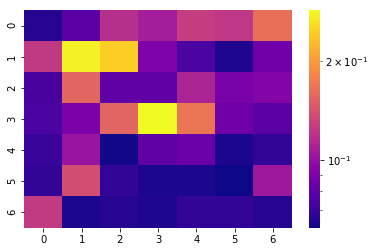

[[0.066 0.079 0.117 0.107 0.126 0.123 0.163]
 [0.124 0.277 0.244 0.091 0.075 0.065 0.086]
 [0.074 0.157 0.081 0.081 0.111 0.089 0.093]
 [0.075 0.09  0.156 0.285 0.169 0.086 0.079]
 [0.07  0.102 0.063 0.081 0.084 0.064 0.069]
 [0.069 0.138 0.069 0.064 0.064 0.062 0.104]
 [0.125 0.064 0.066 0.065 0.069 0.069 0.066]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


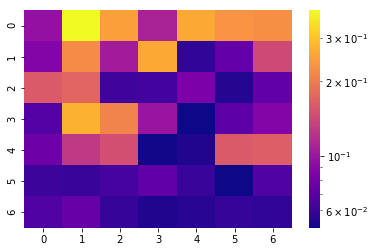

[[0.096 0.388 0.248 0.109 0.26  0.231 0.225]
 [0.087 0.22  0.104 0.26  0.058 0.074 0.144]
 [0.16  0.173 0.062 0.063 0.083 0.055 0.073]
 [0.068 0.272 0.21  0.099 0.051 0.071 0.087]
 [0.078 0.127 0.149 0.052 0.054 0.16  0.165]
 [0.061 0.06  0.064 0.073 0.06  0.051 0.067]
 [0.067 0.075 0.059 0.054 0.056 0.059 0.058]]


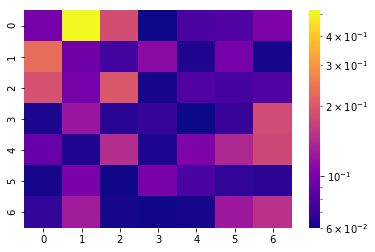

[[0.099 0.516 0.186 0.06  0.078 0.081 0.102]
 [0.232 0.095 0.075 0.11  0.064 0.099 0.062]
 [0.19  0.098 0.199 0.062 0.081 0.076 0.081]
 [0.063 0.121 0.066 0.07  0.06  0.071 0.183]
 [0.091 0.064 0.146 0.063 0.103 0.14  0.178]
 [0.062 0.101 0.061 0.1   0.078 0.069 0.067]
 [0.069 0.127 0.062 0.061 0.062 0.124 0.15 ]]


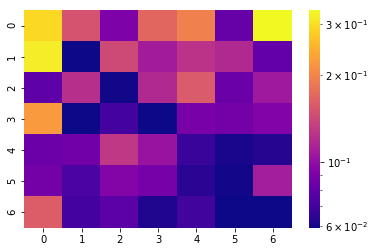

[[0.292 0.151 0.091 0.169 0.195 0.082 0.334]
 [0.318 0.059 0.143 0.108 0.125 0.117 0.081]
 [0.079 0.122 0.06  0.117 0.158 0.083 0.107]
 [0.221 0.059 0.071 0.059 0.089 0.087 0.092]
 [0.084 0.086 0.128 0.103 0.068 0.061 0.063]
 [0.087 0.073 0.094 0.088 0.064 0.06  0.11 ]
 [0.16  0.071 0.078 0.062 0.07  0.059 0.059]]


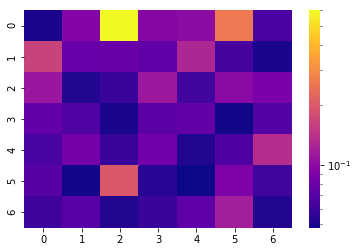

[[0.05  0.093 0.6   0.096 0.1   0.26  0.066]
 [0.164 0.078 0.079 0.075 0.127 0.064 0.05 ]
 [0.111 0.052 0.059 0.112 0.062 0.099 0.089]
 [0.077 0.068 0.05  0.073 0.077 0.049 0.069]
 [0.065 0.086 0.059 0.083 0.052 0.067 0.135]
 [0.07  0.049 0.196 0.054 0.048 0.091 0.062]
 [0.061 0.071 0.052 0.059 0.074 0.118 0.052]]


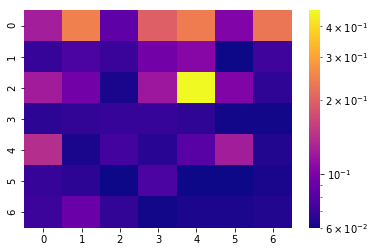

[[0.125 0.246 0.085 0.199 0.241 0.101 0.231]
 [0.07  0.077 0.071 0.094 0.105 0.06  0.073]
 [0.123 0.094 0.062 0.119 0.465 0.102 0.068]
 [0.067 0.069 0.07  0.07  0.068 0.061 0.061]
 [0.139 0.062 0.074 0.066 0.082 0.124 0.064]
 [0.07  0.067 0.06  0.077 0.06  0.06  0.062]
 [0.072 0.09  0.069 0.061 0.063 0.063 0.064]]


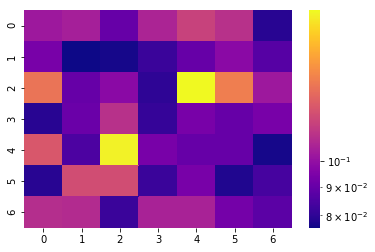

[[0.103 0.105 0.09  0.107 0.117 0.111 0.079]
 [0.094 0.076 0.077 0.082 0.09  0.098 0.087]
 [0.136 0.09  0.098 0.08  0.186 0.14  0.103]
 [0.079 0.091 0.111 0.081 0.094 0.09  0.094]
 [0.125 0.085 0.183 0.094 0.09  0.09  0.077]
 [0.079 0.121 0.121 0.082 0.094 0.078 0.084]
 [0.11  0.109 0.082 0.106 0.106 0.093 0.088]]


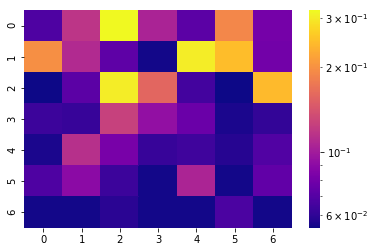

[[0.068 0.118 0.318 0.105 0.072 0.19  0.081]
 [0.198 0.11  0.073 0.055 0.302 0.247 0.08 ]
 [0.054 0.072 0.302 0.159 0.065 0.054 0.244]
 [0.063 0.062 0.126 0.093 0.077 0.056 0.061]
 [0.056 0.114 0.082 0.062 0.064 0.058 0.069]
 [0.068 0.09  0.063 0.055 0.106 0.055 0.074]
 [0.055 0.055 0.059 0.055 0.055 0.067 0.055]]


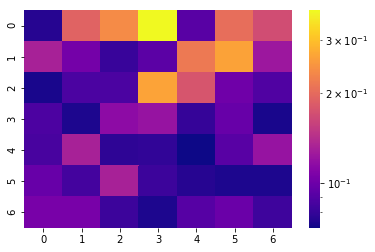

[[0.076 0.192 0.236 0.376 0.092 0.203 0.169]
 [0.131 0.103 0.081 0.093 0.216 0.263 0.124]
 [0.073 0.087 0.087 0.266 0.177 0.101 0.089]
 [0.088 0.074 0.115 0.121 0.08  0.098 0.073]
 [0.086 0.131 0.078 0.079 0.071 0.092 0.121]
 [0.098 0.085 0.131 0.082 0.076 0.074 0.074]
 [0.105 0.105 0.082 0.074 0.091 0.099 0.083]]


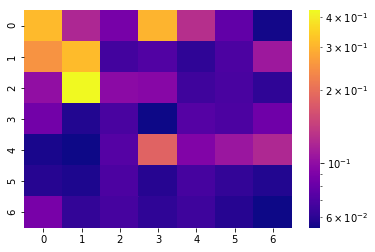

[[0.312 0.12  0.087 0.302 0.127 0.078 0.055]
 [0.251 0.314 0.067 0.072 0.061 0.07  0.108]
 [0.101 0.425 0.098 0.095 0.066 0.069 0.061]
 [0.085 0.058 0.069 0.054 0.073 0.07  0.084]
 [0.056 0.054 0.073 0.184 0.092 0.107 0.121]
 [0.059 0.057 0.07  0.059 0.068 0.062 0.058]
 [0.088 0.062 0.068 0.061 0.065 0.059 0.054]]


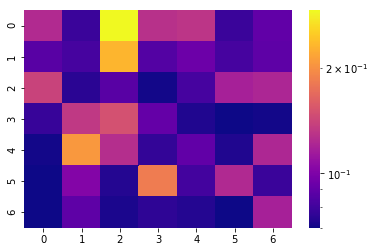

[[0.124 0.079 0.291 0.128 0.131 0.079 0.09 ]
 [0.087 0.082 0.231 0.086 0.094 0.082 0.089]
 [0.14  0.075 0.087 0.071 0.082 0.118 0.121]
 [0.078 0.133 0.15  0.091 0.073 0.07  0.071]
 [0.071 0.207 0.126 0.077 0.09  0.073 0.122]
 [0.07  0.102 0.074 0.184 0.081 0.123 0.079]
 [0.07  0.089 0.072 0.076 0.074 0.07  0.118]]


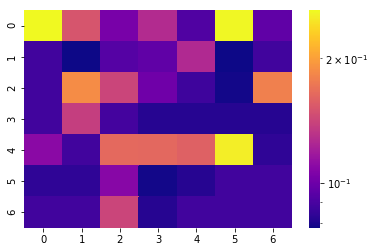

[[0.261 0.151 0.104 0.127 0.092 0.259 0.096]
 [0.088 0.078 0.093 0.096 0.126 0.078 0.088]
 [0.088 0.187 0.142 0.101 0.087 0.079 0.179]
 [0.088 0.138 0.089 0.082 0.082 0.082 0.082]
 [0.11  0.088 0.164 0.163 0.159 0.253 0.084]
 [0.084 0.084 0.109 0.079 0.082 0.088 0.088]
 [0.088 0.088 0.142 0.082 0.088 0.088 0.088]]


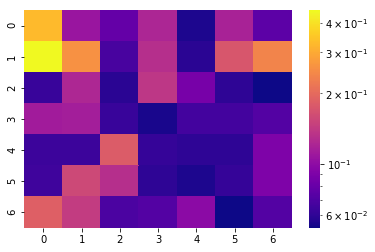

[[0.329 0.107 0.079 0.121 0.056 0.118 0.076]
 [0.454 0.26  0.068 0.13  0.059 0.174 0.239]
 [0.063 0.122 0.059 0.137 0.087 0.06  0.053]
 [0.112 0.114 0.063 0.055 0.066 0.066 0.072]
 [0.064 0.064 0.181 0.062 0.06  0.06  0.091]
 [0.065 0.157 0.13  0.06  0.056 0.062 0.091]
 [0.186 0.143 0.069 0.072 0.098 0.053 0.072]]


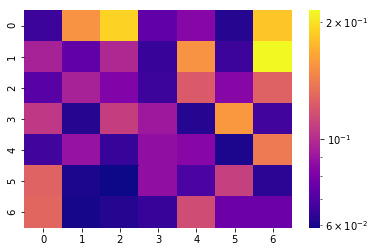

[[0.066 0.154 0.19  0.074 0.084 0.062 0.183]
 [0.095 0.074 0.098 0.065 0.154 0.066 0.214]
 [0.072 0.095 0.082 0.066 0.122 0.084 0.126]
 [0.105 0.062 0.108 0.091 0.062 0.157 0.067]
 [0.067 0.089 0.065 0.087 0.084 0.061 0.14 ]
 [0.127 0.061 0.059 0.087 0.069 0.109 0.063]
 [0.129 0.06  0.062 0.065 0.115 0.077 0.077]]


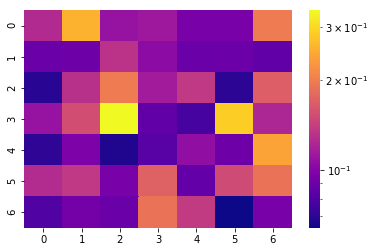

[[0.125 0.256 0.109 0.113 0.095 0.095 0.198]
 [0.089 0.091 0.132 0.104 0.089 0.09  0.086]
 [0.069 0.13  0.197 0.115 0.136 0.07  0.169]
 [0.109 0.154 0.341 0.086 0.077 0.289 0.122]
 [0.071 0.097 0.067 0.083 0.106 0.091 0.241]
 [0.126 0.136 0.095 0.171 0.087 0.151 0.189]
 [0.08  0.093 0.089 0.189 0.138 0.064 0.095]]


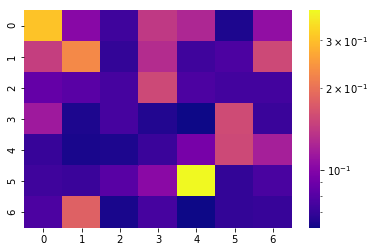

[[0.307 0.102 0.073 0.14  0.125 0.064 0.107]
 [0.146 0.229 0.069 0.13  0.073 0.077 0.155]
 [0.086 0.082 0.075 0.155 0.077 0.074 0.074]
 [0.115 0.064 0.075 0.065 0.061 0.158 0.071]
 [0.07  0.063 0.064 0.071 0.094 0.155 0.119]
 [0.073 0.071 0.081 0.103 0.387 0.069 0.076]
 [0.077 0.181 0.063 0.075 0.061 0.069 0.07 ]]


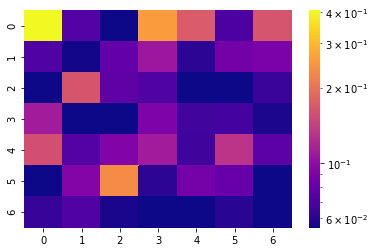

[[0.407 0.074 0.055 0.256 0.171 0.071 0.164]
 [0.072 0.056 0.08  0.107 0.061 0.086 0.089]
 [0.055 0.165 0.078 0.072 0.055 0.055 0.065]
 [0.111 0.055 0.055 0.091 0.067 0.068 0.058]
 [0.159 0.074 0.092 0.111 0.066 0.131 0.076]
 [0.055 0.094 0.234 0.061 0.087 0.081 0.055]
 [0.064 0.072 0.057 0.055 0.055 0.06  0.055]]


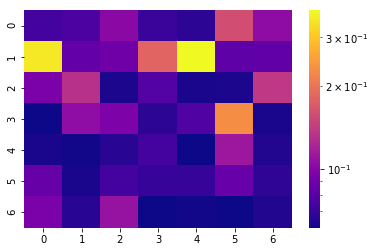

[[0.074 0.077 0.102 0.071 0.067 0.159 0.104]
 [0.352 0.085 0.09  0.182 0.376 0.083 0.084]
 [0.095 0.132 0.064 0.079 0.063 0.064 0.138]
 [0.061 0.105 0.096 0.067 0.078 0.229 0.063]
 [0.063 0.062 0.066 0.074 0.061 0.112 0.065]
 [0.086 0.063 0.074 0.07  0.07  0.087 0.068]
 [0.095 0.066 0.109 0.061 0.062 0.061 0.065]]


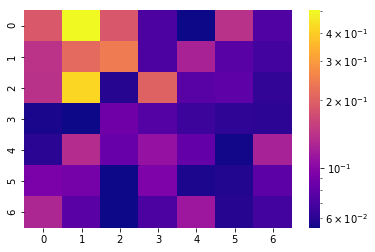

[[0.189 0.504 0.188 0.072 0.054 0.14  0.073]
 [0.141 0.214 0.244 0.072 0.124 0.076 0.068]
 [0.14  0.42  0.059 0.202 0.076 0.079 0.063]
 [0.056 0.054 0.087 0.075 0.066 0.062 0.061]
 [0.06  0.134 0.083 0.109 0.082 0.055 0.123]
 [0.093 0.09  0.054 0.095 0.057 0.058 0.078]
 [0.129 0.077 0.054 0.072 0.114 0.059 0.068]]


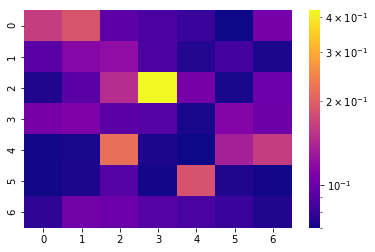

[[0.163 0.187 0.094 0.088 0.081 0.07  0.106]
 [0.093 0.114 0.12  0.088 0.075 0.085 0.073]
 [0.074 0.093 0.146 0.422 0.106 0.072 0.101]
 [0.106 0.109 0.093 0.091 0.072 0.113 0.102]
 [0.071 0.072 0.22  0.073 0.07  0.134 0.161]
 [0.071 0.073 0.091 0.071 0.185 0.074 0.071]
 [0.078 0.104 0.101 0.091 0.087 0.081 0.074]]


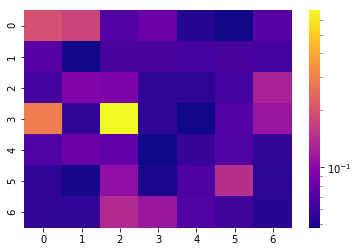

[[0.197 0.175 0.07  0.082 0.053 0.049 0.073]
 [0.072 0.049 0.065 0.065 0.064 0.065 0.064]
 [0.064 0.094 0.092 0.056 0.055 0.063 0.127]
 [0.29  0.057 0.675 0.057 0.049 0.071 0.114]
 [0.069 0.082 0.078 0.048 0.058 0.069 0.057]
 [0.056 0.05  0.108 0.051 0.067 0.145 0.055]
 [0.057 0.057 0.138 0.115 0.069 0.062 0.054]]


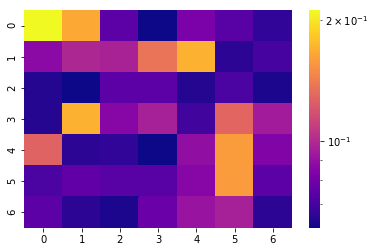

[[0.211 0.165 0.075 0.061 0.082 0.074 0.066]
 [0.087 0.099 0.097 0.137 0.17  0.065 0.07 ]
 [0.064 0.061 0.075 0.075 0.064 0.071 0.063]
 [0.064 0.17  0.086 0.096 0.069 0.129 0.094]
 [0.128 0.065 0.066 0.061 0.089 0.159 0.084]
 [0.071 0.076 0.074 0.074 0.086 0.158 0.075]
 [0.075 0.065 0.063 0.078 0.091 0.096 0.065]]


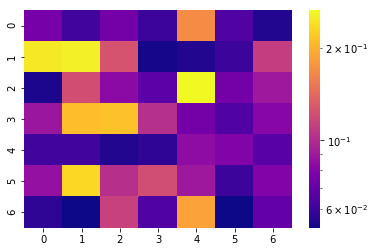

[[0.076 0.061 0.075 0.06  0.169 0.065 0.055]
 [0.249 0.255 0.125 0.053 0.055 0.06  0.111]
 [0.054 0.122 0.083 0.068 0.264 0.075 0.09 ]
 [0.089 0.21  0.213 0.102 0.075 0.065 0.081]
 [0.061 0.061 0.055 0.057 0.084 0.079 0.067]
 [0.086 0.234 0.103 0.121 0.09  0.06  0.079]
 [0.057 0.052 0.113 0.065 0.187 0.052 0.07 ]]


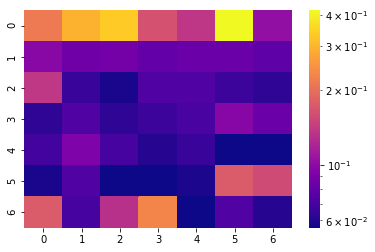

[[0.216 0.297 0.334 0.165 0.136 0.418 0.104]
 [0.098 0.086 0.088 0.081 0.084 0.084 0.079]
 [0.138 0.066 0.058 0.074 0.074 0.067 0.063]
 [0.063 0.074 0.063 0.067 0.071 0.097 0.083]
 [0.069 0.093 0.07  0.061 0.066 0.056 0.056]
 [0.058 0.074 0.056 0.056 0.059 0.175 0.157]
 [0.175 0.07  0.131 0.231 0.056 0.074 0.061]]


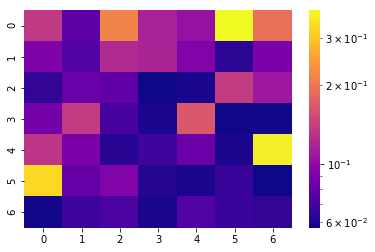

[[0.135 0.079 0.216 0.115 0.104 0.383 0.193]
 [0.092 0.074 0.122 0.117 0.093 0.063 0.091]
 [0.065 0.083 0.08  0.057 0.059 0.138 0.108]
 [0.088 0.137 0.071 0.06  0.166 0.058 0.058]
 [0.132 0.09  0.062 0.068 0.084 0.06  0.363]
 [0.331 0.082 0.093 0.061 0.059 0.067 0.057]
 [0.058 0.068 0.072 0.059 0.074 0.067 0.065]]
SKIPPPPPPEDDDD


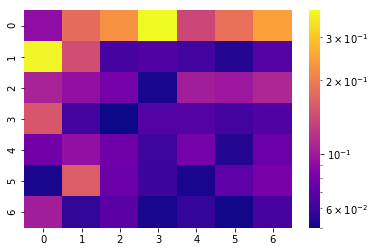

[[0.092 0.179 0.228 0.387 0.14  0.185 0.246]
 [0.377 0.147 0.063 0.066 0.062 0.054 0.067]
 [0.106 0.093 0.08  0.052 0.103 0.099 0.11 ]
 [0.155 0.062 0.05  0.067 0.067 0.062 0.066]
 [0.078 0.094 0.077 0.061 0.08  0.054 0.076]
 [0.052 0.163 0.076 0.06  0.052 0.071 0.081]
 [0.103 0.057 0.069 0.052 0.058 0.051 0.063]]


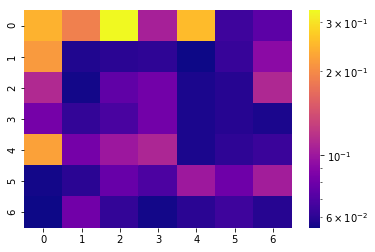

[[0.244 0.19  0.331 0.106 0.254 0.065 0.074]
 [0.217 0.058 0.06  0.061 0.055 0.063 0.092]
 [0.112 0.056 0.075 0.082 0.057 0.059 0.111]
 [0.083 0.062 0.068 0.082 0.057 0.059 0.057]
 [0.224 0.083 0.1   0.11  0.057 0.061 0.064]
 [0.056 0.06  0.078 0.069 0.101 0.08  0.104]
 [0.055 0.081 0.062 0.056 0.06  0.065 0.059]]


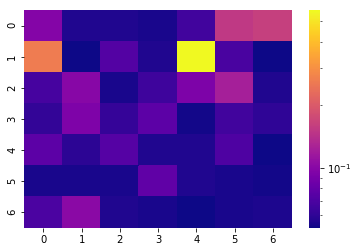

[[0.098 0.056 0.056 0.054 0.066 0.152 0.161]
 [0.262 0.052 0.073 0.056 0.563 0.069 0.052]
 [0.068 0.1   0.054 0.065 0.094 0.123 0.056]
 [0.061 0.095 0.062 0.077 0.053 0.066 0.06 ]
 [0.077 0.059 0.074 0.056 0.056 0.071 0.052]
 [0.054 0.054 0.054 0.079 0.056 0.054 0.053]
 [0.07  0.102 0.056 0.054 0.052 0.054 0.055]]


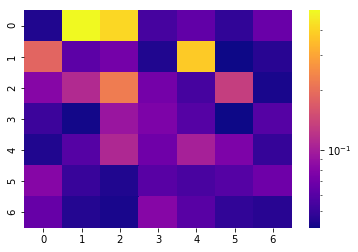

[[0.044 0.499 0.41  0.054 0.064 0.048 0.067]
 [0.185 0.062 0.072 0.044 0.376 0.041 0.046]
 [0.081 0.111 0.222 0.072 0.054 0.133 0.043]
 [0.051 0.042 0.093 0.076 0.059 0.041 0.059]
 [0.044 0.059 0.109 0.07  0.102 0.076 0.049]
 [0.081 0.05  0.044 0.06  0.055 0.059 0.069]
 [0.066 0.045 0.043 0.081 0.06  0.048 0.046]]


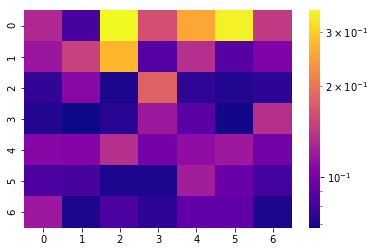

[[0.131 0.082 0.354 0.163 0.254 0.344 0.145]
 [0.117 0.15  0.272 0.087 0.135 0.087 0.103]
 [0.076 0.108 0.071 0.179 0.075 0.072 0.074]
 [0.072 0.068 0.073 0.119 0.088 0.069 0.135]
 [0.107 0.105 0.135 0.099 0.111 0.119 0.098]
 [0.084 0.082 0.071 0.071 0.122 0.095 0.081]
 [0.119 0.071 0.084 0.074 0.091 0.091 0.071]]


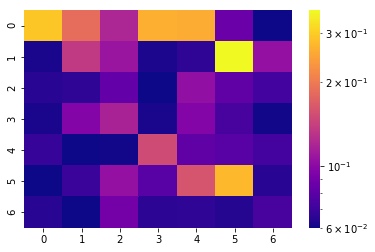

[[0.292 0.185 0.12  0.263 0.258 0.086 0.06 ]
 [0.062 0.136 0.108 0.063 0.067 0.361 0.105]
 [0.065 0.067 0.084 0.06  0.104 0.082 0.072]
 [0.062 0.097 0.117 0.062 0.096 0.074 0.061]
 [0.069 0.06  0.061 0.151 0.082 0.079 0.073]
 [0.06  0.07  0.105 0.079 0.16  0.274 0.065]
 [0.065 0.06  0.09  0.066 0.067 0.064 0.074]]


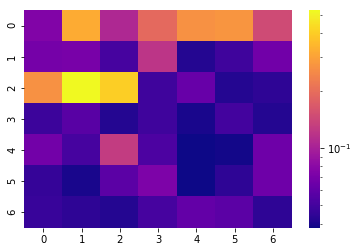

[[0.075 0.32  0.107 0.192 0.266 0.274 0.147]
 [0.069 0.071 0.051 0.121 0.042 0.049 0.067]
 [0.266 0.528 0.407 0.049 0.063 0.042 0.044]
 [0.048 0.057 0.042 0.049 0.04  0.05  0.042]
 [0.068 0.051 0.128 0.053 0.038 0.039 0.066]
 [0.046 0.04  0.058 0.073 0.038 0.044 0.066]
 [0.047 0.044 0.042 0.051 0.061 0.058 0.044]]
SKIPPPPPPEDDDD


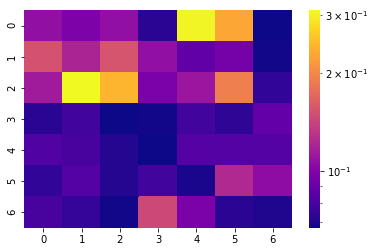

[[0.107 0.098 0.107 0.072 0.305 0.228 0.067]
 [0.153 0.12  0.154 0.107 0.088 0.095 0.068]
 [0.114 0.31  0.241 0.097 0.111 0.191 0.074]
 [0.072 0.078 0.067 0.068 0.078 0.073 0.089]
 [0.083 0.08  0.071 0.067 0.084 0.084 0.084]
 [0.074 0.084 0.071 0.078 0.069 0.123 0.105]
 [0.08  0.075 0.068 0.145 0.097 0.072 0.07 ]]


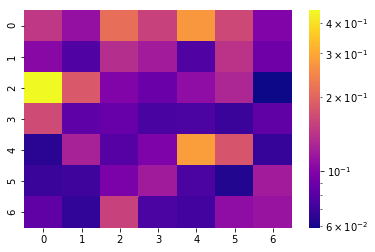

[[0.146 0.111 0.213 0.157 0.274 0.165 0.099]
 [0.104 0.078 0.136 0.12  0.078 0.142 0.091]
 [0.448 0.184 0.099 0.089 0.108 0.129 0.059]
 [0.167 0.083 0.087 0.075 0.076 0.07  0.084]
 [0.065 0.125 0.08  0.098 0.284 0.179 0.069]
 [0.07  0.071 0.097 0.119 0.076 0.063 0.12 ]
 [0.084 0.067 0.157 0.076 0.073 0.108 0.113]]


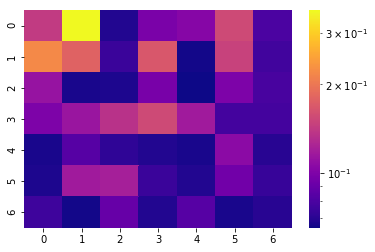

[[0.142 0.357 0.069 0.098 0.103 0.155 0.08 ]
 [0.22  0.178 0.075 0.168 0.066 0.148 0.077]
 [0.112 0.067 0.068 0.097 0.065 0.099 0.079]
 [0.099 0.113 0.135 0.155 0.117 0.078 0.078]
 [0.067 0.084 0.072 0.069 0.067 0.106 0.07 ]
 [0.068 0.117 0.12  0.075 0.069 0.094 0.074]
 [0.076 0.066 0.09  0.069 0.084 0.067 0.07 ]]


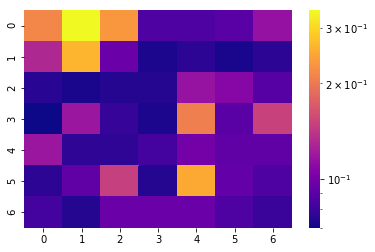

[[0.215 0.34  0.231 0.086 0.086 0.09  0.115]
 [0.13  0.261 0.096 0.073 0.076 0.072 0.076]
 [0.075 0.072 0.074 0.074 0.116 0.108 0.089]
 [0.07  0.118 0.079 0.073 0.207 0.09  0.15 ]
 [0.118 0.077 0.077 0.083 0.1   0.092 0.092]
 [0.076 0.092 0.148 0.074 0.25  0.093 0.086]
 [0.083 0.074 0.096 0.096 0.096 0.086 0.08 ]]


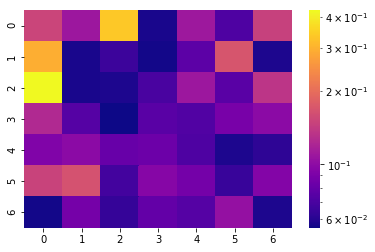

[[0.151 0.109 0.336 0.057 0.11  0.072 0.146]
 [0.294 0.057 0.066 0.056 0.077 0.169 0.058]
 [0.426 0.057 0.058 0.07  0.109 0.076 0.135]
 [0.124 0.074 0.055 0.076 0.073 0.089 0.099]
 [0.093 0.099 0.082 0.084 0.072 0.058 0.062]
 [0.149 0.165 0.068 0.096 0.087 0.065 0.094]
 [0.056 0.088 0.064 0.08  0.074 0.104 0.058]]


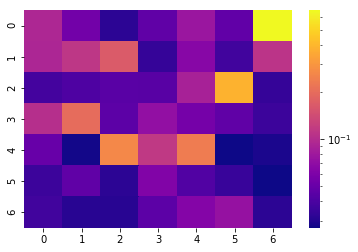

[[0.094 0.055 0.032 0.047 0.078 0.048 0.665]
 [0.093 0.112 0.166 0.034 0.065 0.037 0.109]
 [0.038 0.041 0.045 0.044 0.088 0.388 0.034]
 [0.102 0.2   0.046 0.072 0.056 0.047 0.036]
 [0.05  0.028 0.264 0.115 0.238 0.027 0.029]
 [0.036 0.047 0.032 0.062 0.042 0.035 0.027]
 [0.037 0.031 0.031 0.046 0.064 0.074 0.032]]


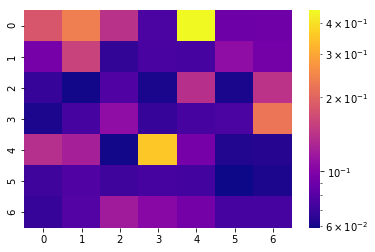

[[0.181 0.236 0.141 0.076 0.451 0.09  0.091]
 [0.095 0.159 0.068 0.075 0.074 0.108 0.093]
 [0.069 0.06  0.078 0.061 0.139 0.061 0.142]
 [0.062 0.074 0.108 0.069 0.074 0.076 0.223]
 [0.138 0.123 0.06  0.358 0.095 0.063 0.064]
 [0.071 0.078 0.071 0.074 0.073 0.059 0.062]
 [0.069 0.079 0.119 0.104 0.093 0.074 0.074]]


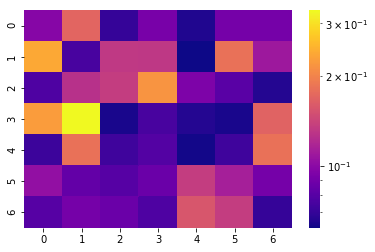

[[0.098 0.171 0.07  0.092 0.065 0.091 0.091]
 [0.238 0.075 0.132 0.131 0.062 0.182 0.109]
 [0.077 0.126 0.136 0.217 0.094 0.081 0.066]
 [0.227 0.332 0.064 0.075 0.066 0.064 0.168]
 [0.072 0.182 0.073 0.079 0.063 0.073 0.182]
 [0.104 0.084 0.08  0.087 0.136 0.114 0.091]
 [0.08  0.091 0.087 0.077 0.157 0.136 0.07 ]]


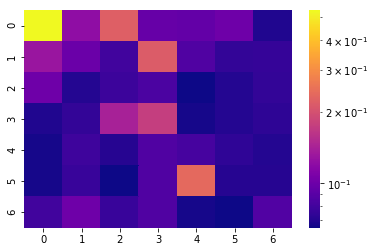

[[0.535 0.122 0.223 0.097 0.095 0.101 0.069]
 [0.129 0.099 0.08  0.217 0.086 0.075 0.076]
 [0.101 0.07  0.078 0.084 0.065 0.07  0.075]
 [0.069 0.075 0.141 0.175 0.067 0.07  0.073]
 [0.067 0.079 0.071 0.086 0.082 0.074 0.07 ]
 [0.067 0.077 0.065 0.086 0.238 0.071 0.071]
 [0.08  0.101 0.077 0.086 0.067 0.065 0.087]]


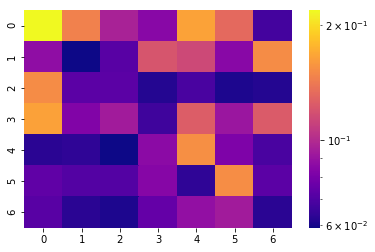

[[0.218 0.146 0.096 0.085 0.165 0.132 0.068]
 [0.087 0.059 0.072 0.121 0.114 0.085 0.152]
 [0.152 0.073 0.073 0.062 0.069 0.061 0.062]
 [0.164 0.083 0.093 0.067 0.125 0.091 0.124]
 [0.063 0.064 0.059 0.086 0.154 0.082 0.069]
 [0.074 0.071 0.071 0.084 0.064 0.153 0.073]
 [0.072 0.063 0.061 0.075 0.088 0.093 0.063]]
SKIPPPPPPEDDDD


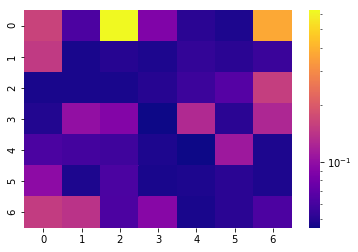

[[0.163 0.063 0.629 0.088 0.051 0.048 0.373]
 [0.149 0.047 0.05  0.048 0.054 0.051 0.056]
 [0.047 0.047 0.047 0.05  0.057 0.066 0.156]
 [0.049 0.101 0.09  0.045 0.128 0.051 0.125]
 [0.062 0.06  0.058 0.048 0.045 0.11  0.048]
 [0.097 0.048 0.062 0.047 0.048 0.051 0.048]
 [0.153 0.14  0.063 0.093 0.047 0.051 0.063]]


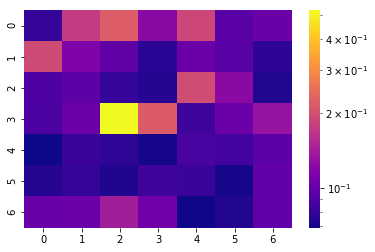

[[0.08  0.176 0.221 0.122 0.19  0.095 0.103]
 [0.194 0.115 0.098 0.076 0.104 0.094 0.077]
 [0.09  0.096 0.08  0.075 0.196 0.122 0.074]
 [0.089 0.104 0.52  0.216 0.084 0.104 0.131]
 [0.069 0.082 0.078 0.071 0.088 0.086 0.096]
 [0.075 0.08  0.073 0.083 0.082 0.071 0.099]
 [0.103 0.104 0.141 0.107 0.07  0.074 0.099]]


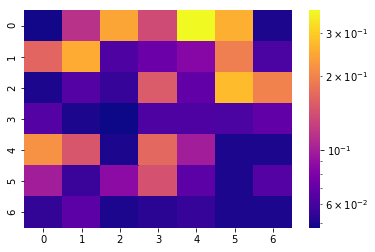

[[0.049 0.115 0.244 0.137 0.372 0.259 0.05 ]
 [0.165 0.253 0.063 0.073 0.084 0.194 0.062]
 [0.05  0.065 0.056 0.154 0.069 0.275 0.198]
 [0.065 0.05  0.048 0.063 0.063 0.062 0.069]
 [0.218 0.149 0.05  0.168 0.099 0.05  0.05 ]
 [0.099 0.057 0.087 0.144 0.067 0.05  0.065]
 [0.055 0.067 0.05  0.053 0.056 0.05  0.05 ]]


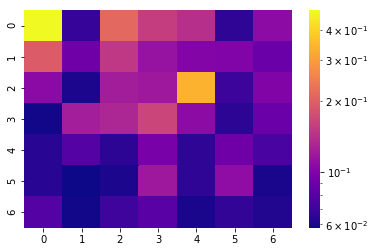

[[0.485 0.068 0.213 0.157 0.142 0.066 0.108]
 [0.196 0.091 0.15  0.114 0.102 0.1   0.089]
 [0.107 0.061 0.123 0.119 0.337 0.07  0.101]
 [0.059 0.124 0.131 0.165 0.108 0.065 0.088]
 [0.064 0.079 0.065 0.096 0.066 0.091 0.075]
 [0.064 0.058 0.061 0.119 0.066 0.109 0.06 ]
 [0.079 0.059 0.071 0.081 0.06  0.067 0.062]]


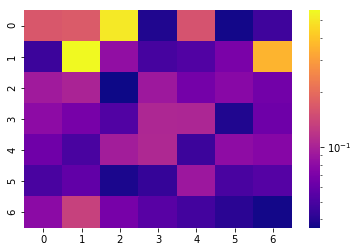

[[0.167 0.172 0.509 0.039 0.159 0.037 0.047]
 [0.046 0.565 0.083 0.049 0.053 0.07  0.359]
 [0.093 0.102 0.036 0.091 0.067 0.078 0.066]
 [0.08  0.068 0.053 0.105 0.104 0.039 0.064]
 [0.065 0.05  0.095 0.106 0.046 0.081 0.076]
 [0.05  0.059 0.038 0.044 0.09  0.05  0.054]
 [0.079 0.135 0.068 0.055 0.048 0.041 0.037]]


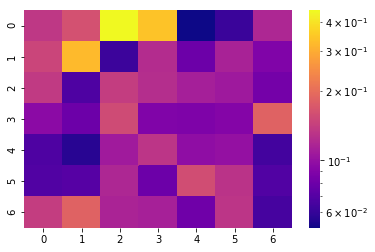

[[0.135 0.163 0.449 0.34  0.051 0.061 0.119]
 [0.15  0.324 0.062 0.124 0.08  0.115 0.089]
 [0.137 0.068 0.141 0.125 0.112 0.107 0.083]
 [0.095 0.08  0.156 0.089 0.088 0.091 0.184]
 [0.068 0.056 0.108 0.133 0.098 0.1   0.064]
 [0.069 0.071 0.119 0.08  0.158 0.13  0.069]
 [0.141 0.184 0.116 0.113 0.081 0.133 0.065]]


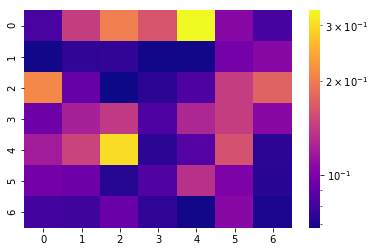

[[0.082 0.144 0.202 0.163 0.335 0.106 0.081]
 [0.069 0.075 0.076 0.069 0.069 0.098 0.106]
 [0.212 0.092 0.068 0.074 0.084 0.143 0.176]
 [0.095 0.122 0.14  0.084 0.126 0.143 0.106]
 [0.119 0.149 0.303 0.074 0.086 0.16  0.074]
 [0.097 0.095 0.072 0.085 0.134 0.101 0.073]
 [0.08  0.079 0.094 0.075 0.069 0.106 0.071]]


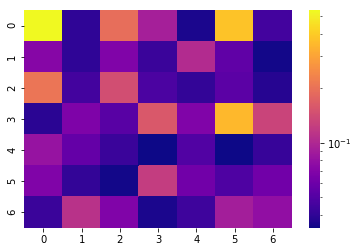

[[0.537 0.04  0.193 0.092 0.036 0.379 0.045]
 [0.072 0.04  0.069 0.043 0.104 0.055 0.035]
 [0.206 0.045 0.145 0.048 0.041 0.053 0.038]
 [0.039 0.068 0.052 0.16  0.069 0.35  0.131]
 [0.082 0.057 0.043 0.034 0.05  0.034 0.042]
 [0.069 0.041 0.035 0.123 0.062 0.049 0.062]
 [0.043 0.111 0.069 0.036 0.044 0.091 0.078]]


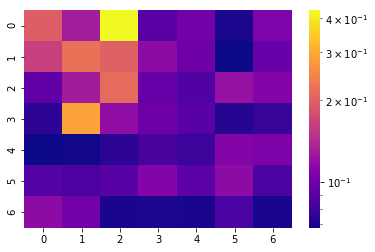

[[0.197 0.13  0.428 0.091 0.102 0.071 0.108]
 [0.164 0.221 0.2   0.116 0.1   0.068 0.097]
 [0.094 0.129 0.214 0.097 0.088 0.121 0.111]
 [0.075 0.289 0.118 0.1   0.09  0.073 0.078]
 [0.068 0.069 0.075 0.084 0.08  0.111 0.107]
 [0.089 0.086 0.09  0.111 0.092 0.116 0.085]
 [0.116 0.102 0.07  0.071 0.07  0.085 0.07 ]]


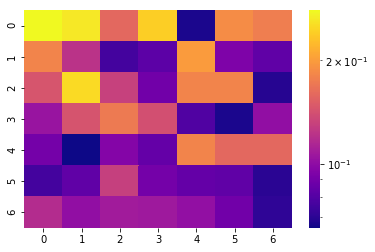

[[0.28  0.263 0.159 0.242 0.067 0.187 0.176]
 [0.181 0.122 0.076 0.083 0.199 0.094 0.084]
 [0.145 0.252 0.131 0.089 0.181 0.181 0.069]
 [0.104 0.144 0.173 0.141 0.079 0.067 0.101]
 [0.09  0.065 0.096 0.085 0.181 0.159 0.159]
 [0.076 0.084 0.13  0.09  0.085 0.084 0.07 ]
 [0.118 0.101 0.108 0.107 0.102 0.089 0.071]]


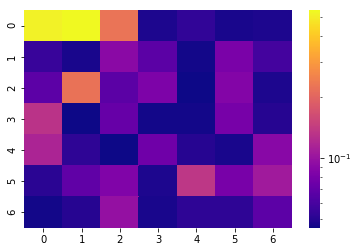

[[0.517 0.539 0.226 0.048 0.053 0.047 0.048]
 [0.055 0.047 0.091 0.067 0.046 0.082 0.059]
 [0.068 0.224 0.067 0.083 0.045 0.087 0.048]
 [0.131 0.045 0.072 0.046 0.046 0.08  0.05 ]
 [0.116 0.052 0.045 0.076 0.05  0.047 0.09 ]
 [0.051 0.069 0.085 0.048 0.135 0.081 0.106]
 [0.046 0.05  0.097 0.047 0.052 0.052 0.068]]


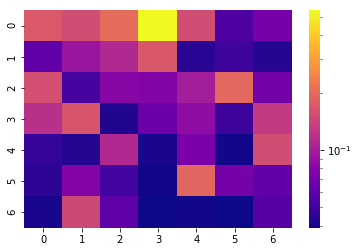

[[0.17  0.154 0.2   0.541 0.154 0.055 0.072]
 [0.062 0.092 0.111 0.169 0.044 0.05  0.043]
 [0.157 0.052 0.08  0.077 0.1   0.195 0.07 ]
 [0.119 0.165 0.042 0.067 0.085 0.049 0.131]
 [0.047 0.043 0.111 0.041 0.074 0.04  0.154]
 [0.045 0.079 0.051 0.04  0.193 0.071 0.063]
 [0.041 0.148 0.061 0.039 0.04  0.039 0.058]]


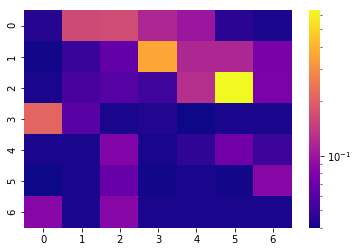

[[0.045 0.164 0.167 0.117 0.1   0.046 0.042]
 [0.041 0.05  0.067 0.366 0.117 0.117 0.077]
 [0.042 0.055 0.06  0.052 0.127 0.635 0.078]
 [0.212 0.061 0.042 0.044 0.04  0.042 0.042]
 [0.042 0.042 0.081 0.042 0.047 0.073 0.051]
 [0.04  0.042 0.068 0.041 0.042 0.041 0.085]
 [0.085 0.042 0.085 0.042 0.042 0.042 0.042]]


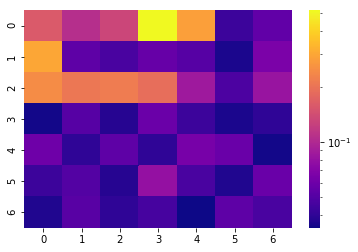

[[0.158 0.106 0.132 0.52  0.284 0.043 0.055]
 [0.299 0.054 0.047 0.057 0.051 0.036 0.066]
 [0.245 0.206 0.215 0.189 0.086 0.048 0.082]
 [0.035 0.051 0.038 0.059 0.043 0.036 0.04 ]
 [0.06  0.04  0.054 0.04  0.064 0.058 0.035]
 [0.043 0.05  0.038 0.079 0.047 0.037 0.058]
 [0.037 0.052 0.04  0.046 0.034 0.054 0.047]]


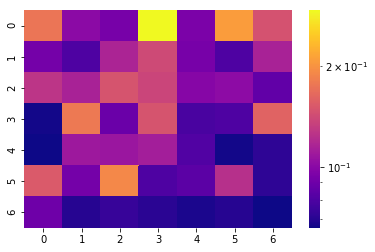

[[0.175 0.101 0.093 0.292 0.095 0.208 0.147]
 [0.092 0.08  0.116 0.141 0.093 0.08  0.115]
 [0.127 0.115 0.148 0.138 0.099 0.102 0.086]
 [0.067 0.178 0.089 0.148 0.079 0.08  0.16 ]
 [0.066 0.109 0.108 0.112 0.081 0.067 0.072]
 [0.153 0.092 0.19  0.08  0.084 0.123 0.072]
 [0.09  0.07  0.074 0.071 0.068 0.07  0.066]]


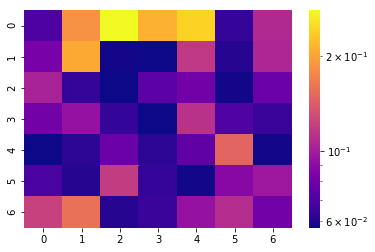

[[0.07  0.184 0.278 0.211 0.241 0.064 0.107]
 [0.083 0.205 0.058 0.057 0.116 0.061 0.105]
 [0.102 0.064 0.057 0.074 0.081 0.058 0.078]
 [0.081 0.094 0.064 0.057 0.112 0.071 0.065]
 [0.057 0.062 0.078 0.062 0.075 0.148 0.058]
 [0.069 0.061 0.119 0.064 0.058 0.089 0.097]
 [0.122 0.158 0.061 0.065 0.094 0.109 0.081]]


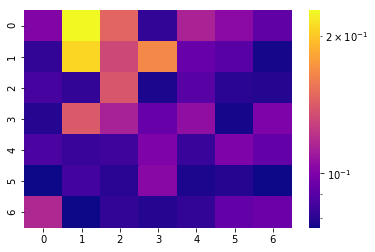

[[0.101 0.227 0.147 0.082 0.115 0.104 0.092]
 [0.082 0.208 0.132 0.166 0.094 0.09  0.077]
 [0.086 0.082 0.139 0.078 0.09  0.08  0.079]
 [0.079 0.141 0.114 0.094 0.106 0.077 0.1  ]
 [0.087 0.083 0.084 0.1   0.083 0.1   0.093]
 [0.076 0.085 0.08  0.103 0.078 0.079 0.076]
 [0.117 0.076 0.082 0.079 0.082 0.093 0.095]]


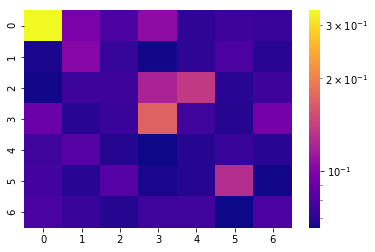

[[0.334 0.097 0.08  0.105 0.072 0.075 0.074]
 [0.067 0.102 0.073 0.066 0.072 0.08  0.07 ]
 [0.066 0.075 0.075 0.12  0.137 0.07  0.075]
 [0.09  0.07  0.074 0.171 0.076 0.069 0.094]
 [0.076 0.083 0.069 0.065 0.069 0.074 0.07 ]
 [0.077 0.07  0.083 0.067 0.069 0.128 0.066]
 [0.079 0.074 0.069 0.076 0.076 0.065 0.08 ]]
SKIPPPPPPEDDDD


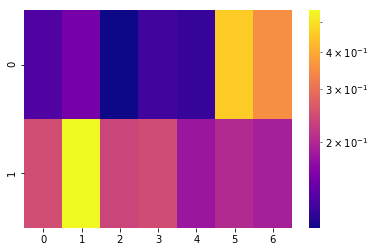

[[0.131 0.153 0.104 0.123 0.118 0.457 0.352]
 [0.248 0.548 0.237 0.246 0.18  0.202 0.19 ]]


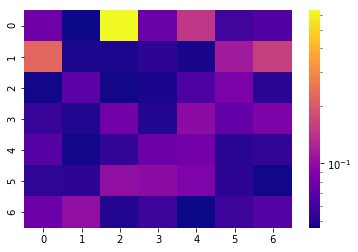

[[0.08  0.046 0.632 0.077 0.147 0.06  0.066]
 [0.226 0.049 0.049 0.053 0.048 0.114 0.159]
 [0.047 0.07  0.047 0.048 0.064 0.086 0.052]
 [0.057 0.05  0.082 0.05  0.099 0.074 0.088]
 [0.068 0.047 0.055 0.079 0.083 0.052 0.055]
 [0.054 0.053 0.102 0.099 0.089 0.053 0.047]
 [0.079 0.102 0.05  0.058 0.046 0.058 0.067]]


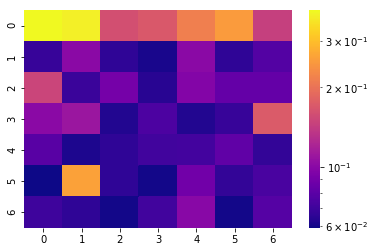

[[0.391 0.375 0.161 0.17  0.216 0.252 0.145]
 [0.068 0.101 0.066 0.061 0.101 0.066 0.077]
 [0.15  0.069 0.091 0.064 0.097 0.084 0.084]
 [0.101 0.11  0.063 0.075 0.063 0.068 0.173]
 [0.079 0.062 0.066 0.071 0.072 0.082 0.067]
 [0.059 0.259 0.066 0.06  0.089 0.067 0.074]
 [0.07  0.066 0.06  0.071 0.1   0.06  0.078]]
SKIPPPPPPEDDDD


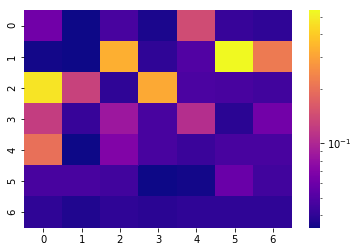

[[0.062 0.034 0.047 0.036 0.143 0.042 0.04 ]
 [0.035 0.034 0.332 0.04  0.05  0.543 0.217]
 [0.475 0.13  0.04  0.318 0.048 0.047 0.045]
 [0.124 0.042 0.086 0.047 0.107 0.039 0.063]
 [0.199 0.034 0.07  0.047 0.043 0.047 0.047]
 [0.047 0.047 0.045 0.034 0.035 0.059 0.045]
 [0.04  0.037 0.04  0.039 0.04  0.04  0.04 ]]


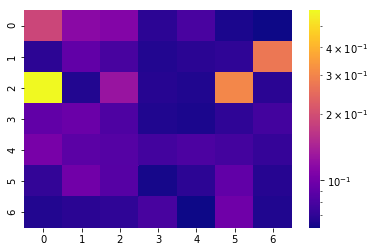

[[0.189 0.116 0.111 0.069 0.08  0.064 0.061]
 [0.069 0.091 0.079 0.066 0.068 0.07  0.273]
 [0.589 0.066 0.127 0.067 0.065 0.305 0.068]
 [0.091 0.096 0.082 0.065 0.064 0.07  0.077]
 [0.104 0.088 0.085 0.077 0.081 0.078 0.072]
 [0.071 0.1   0.086 0.063 0.069 0.091 0.067]
 [0.066 0.068 0.07  0.079 0.061 0.099 0.065]]


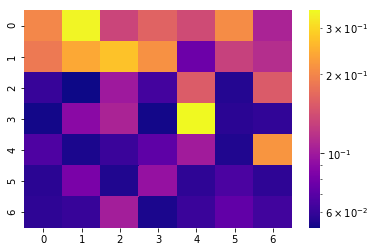

[[0.201 0.344 0.134 0.162 0.139 0.208 0.107]
 [0.186 0.241 0.274 0.214 0.077 0.13  0.114]
 [0.06  0.052 0.1   0.064 0.155 0.056 0.154]
 [0.053 0.089 0.107 0.053 0.351 0.057 0.059]
 [0.067 0.054 0.061 0.072 0.101 0.055 0.219]
 [0.057 0.082 0.055 0.095 0.058 0.066 0.058]
 [0.058 0.06  0.103 0.054 0.061 0.073 0.063]]


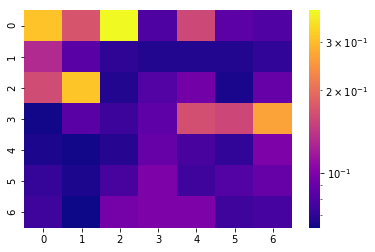

[[0.31  0.172 0.392 0.08  0.159 0.085 0.081]
 [0.131 0.084 0.07  0.067 0.067 0.067 0.071]
 [0.162 0.312 0.067 0.082 0.094 0.065 0.089]
 [0.064 0.084 0.074 0.086 0.166 0.158 0.266]
 [0.066 0.064 0.068 0.089 0.078 0.071 0.099]
 [0.072 0.066 0.078 0.099 0.075 0.082 0.089]
 [0.075 0.063 0.096 0.099 0.099 0.075 0.077]]


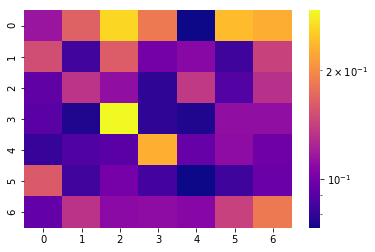

[[0.115 0.166 0.263 0.185 0.073 0.24  0.228]
 [0.151 0.084 0.163 0.1   0.108 0.083 0.143]
 [0.093 0.134 0.111 0.079 0.137 0.089 0.132]
 [0.091 0.076 0.294 0.079 0.076 0.111 0.111]
 [0.081 0.088 0.091 0.23  0.095 0.11  0.098]
 [0.16  0.084 0.101 0.085 0.073 0.083 0.096]
 [0.094 0.133 0.109 0.11  0.107 0.142 0.185]]


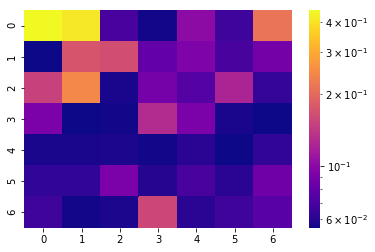

[[0.448 0.412 0.07  0.056 0.101 0.067 0.216]
 [0.055 0.174 0.165 0.081 0.093 0.07  0.088]
 [0.151 0.245 0.057 0.089 0.075 0.122 0.064]
 [0.091 0.055 0.056 0.128 0.091 0.057 0.055]
 [0.057 0.057 0.058 0.056 0.061 0.055 0.063]
 [0.063 0.063 0.092 0.06  0.07  0.061 0.086]
 [0.067 0.056 0.058 0.158 0.061 0.067 0.076]]


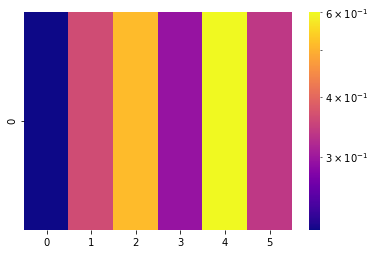

[[0.211 0.363 0.514 0.294 0.6   0.337]]


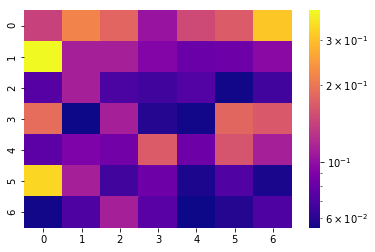

[[0.142 0.219 0.18  0.104 0.15  0.17  0.31 ]
 [0.393 0.112 0.112 0.093 0.081 0.083 0.096]
 [0.074 0.112 0.07  0.067 0.073 0.056 0.067]
 [0.189 0.055 0.112 0.059 0.056 0.181 0.165]
 [0.076 0.09  0.085 0.169 0.083 0.161 0.112]
 [0.335 0.112 0.067 0.083 0.058 0.072 0.057]
 [0.056 0.071 0.112 0.075 0.055 0.059 0.071]]


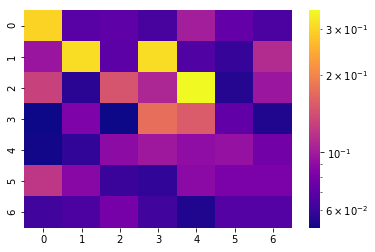

[[0.3   0.069 0.071 0.064 0.102 0.073 0.065]
 [0.096 0.313 0.07  0.31  0.066 0.059 0.112]
 [0.13  0.056 0.147 0.108 0.355 0.055 0.097]
 [0.051 0.083 0.051 0.173 0.154 0.072 0.054]
 [0.052 0.058 0.09  0.098 0.091 0.094 0.078]
 [0.121 0.088 0.06  0.058 0.089 0.081 0.082]
 [0.062 0.065 0.08  0.062 0.054 0.068 0.068]]


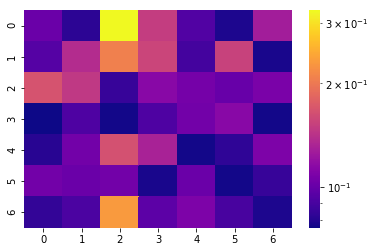

[[0.102 0.082 0.326 0.15  0.093 0.079 0.127]
 [0.094 0.138 0.207 0.156 0.089 0.153 0.078]
 [0.167 0.147 0.085 0.114 0.106 0.101 0.108]
 [0.076 0.092 0.077 0.092 0.105 0.114 0.077]
 [0.081 0.105 0.165 0.131 0.077 0.083 0.109]
 [0.105 0.102 0.105 0.078 0.102 0.077 0.085]
 [0.084 0.091 0.231 0.097 0.109 0.09  0.079]]


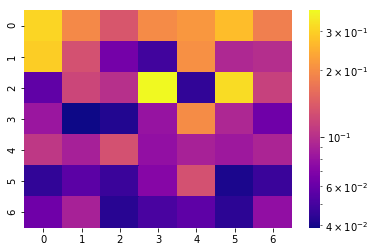

[[0.308 0.197 0.136 0.199 0.214 0.271 0.183]
 [0.295 0.13  0.065 0.049 0.206 0.095 0.099]
 [0.058 0.12  0.101 0.373 0.045 0.32  0.115]
 [0.082 0.039 0.042 0.08  0.2   0.094 0.063]
 [0.107 0.089 0.13  0.078 0.09  0.084 0.092]
 [0.045 0.056 0.047 0.072 0.13  0.041 0.047]
 [0.063 0.09  0.043 0.051 0.057 0.044 0.077]]


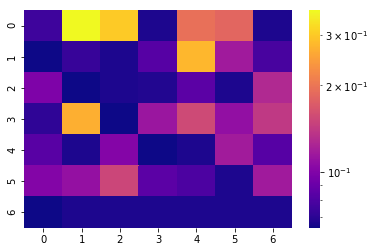

[[0.075 0.365 0.301 0.067 0.195 0.184 0.067]
 [0.064 0.073 0.067 0.083 0.277 0.117 0.078]
 [0.099 0.064 0.067 0.068 0.085 0.067 0.128]
 [0.071 0.268 0.064 0.114 0.155 0.109 0.14 ]
 [0.084 0.067 0.102 0.064 0.067 0.118 0.083]
 [0.101 0.11  0.152 0.085 0.08  0.067 0.117]
 [0.064 0.067 0.067 0.067 0.067 0.067 0.067]]


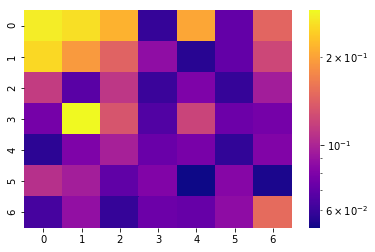

[[0.274 0.26  0.216 0.059 0.204 0.071 0.146]
 [0.252 0.192 0.144 0.087 0.056 0.071 0.123]
 [0.115 0.068 0.111 0.06  0.08  0.059 0.095]
 [0.077 0.288 0.133 0.066 0.12  0.074 0.077]
 [0.057 0.08  0.097 0.073 0.078 0.058 0.081]
 [0.107 0.096 0.07  0.081 0.052 0.083 0.054]
 [0.063 0.088 0.059 0.074 0.072 0.086 0.151]]


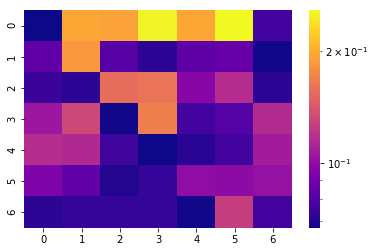

[[0.067 0.196 0.193 0.252 0.196 0.257 0.077]
 [0.085 0.186 0.082 0.072 0.084 0.087 0.068]
 [0.075 0.072 0.156 0.161 0.097 0.116 0.072]
 [0.105 0.132 0.068 0.168 0.077 0.081 0.115]
 [0.116 0.114 0.076 0.067 0.071 0.077 0.107]
 [0.094 0.085 0.07  0.074 0.1   0.099 0.102]
 [0.072 0.074 0.074 0.074 0.068 0.126 0.077]]


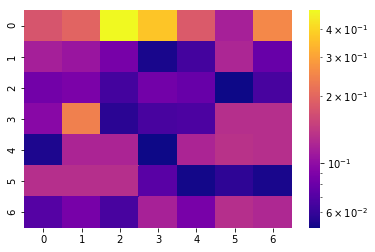

[[0.175 0.196 0.485 0.367 0.182 0.116 0.254]
 [0.115 0.106 0.086 0.053 0.065 0.121 0.079]
 [0.084 0.088 0.065 0.084 0.079 0.051 0.066]
 [0.096 0.24  0.057 0.066 0.068 0.13  0.13 ]
 [0.054 0.12  0.12  0.051 0.12  0.134 0.13 ]
 [0.13  0.13  0.13  0.073 0.052 0.058 0.053]
 [0.071 0.086 0.066 0.117 0.087 0.13  0.124]]
SKIPPPPPPEDDDD


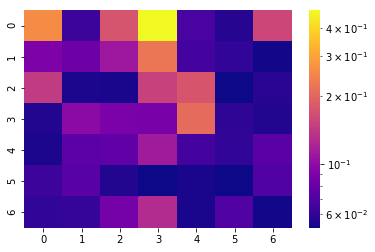

[[0.26  0.063 0.174 0.478 0.068 0.057 0.158]
 [0.09  0.083 0.109 0.224 0.066 0.06  0.053]
 [0.144 0.055 0.054 0.151 0.176 0.052 0.058]
 [0.056 0.098 0.089 0.088 0.207 0.059 0.056]
 [0.055 0.075 0.077 0.112 0.066 0.06  0.074]
 [0.063 0.073 0.056 0.052 0.054 0.052 0.07 ]
 [0.06  0.061 0.086 0.128 0.054 0.07  0.053]]


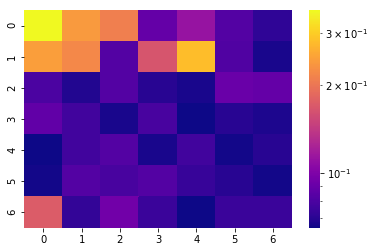

[[0.358 0.24  0.21  0.089 0.112 0.083 0.072]
 [0.244 0.219 0.083 0.166 0.281 0.082 0.067]
 [0.08  0.069 0.083 0.07  0.067 0.091 0.089]
 [0.088 0.077 0.067 0.079 0.065 0.07  0.068]
 [0.065 0.077 0.083 0.067 0.077 0.066 0.07 ]
 [0.066 0.083 0.079 0.083 0.074 0.07  0.066]
 [0.172 0.073 0.094 0.075 0.065 0.075 0.075]]


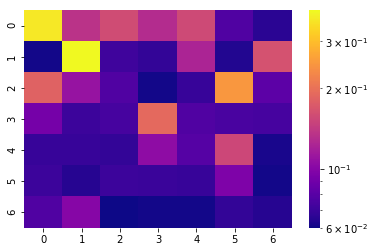

[[0.364 0.135 0.159 0.129 0.156 0.077 0.066]
 [0.061 0.392 0.072 0.068 0.123 0.064 0.165]
 [0.182 0.109 0.077 0.061 0.069 0.248 0.082]
 [0.092 0.071 0.074 0.19  0.077 0.075 0.074]
 [0.069 0.069 0.068 0.104 0.079 0.154 0.062]
 [0.071 0.065 0.071 0.07  0.069 0.096 0.061]
 [0.077 0.1   0.06  0.061 0.061 0.068 0.065]]
SKIPPPPPPEDDDD


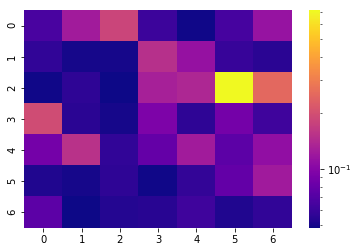

[[0.066 0.123 0.183 0.061 0.049 0.065 0.113]
 [0.057 0.05  0.05  0.149 0.112 0.059 0.055]
 [0.049 0.056 0.048 0.129 0.137 0.714 0.251]
 [0.194 0.055 0.05  0.094 0.056 0.088 0.062]
 [0.088 0.152 0.057 0.079 0.123 0.075 0.109]
 [0.052 0.05  0.056 0.049 0.058 0.078 0.122]
 [0.075 0.048 0.053 0.054 0.062 0.052 0.057]]
SKIPPPPPPEDDDD


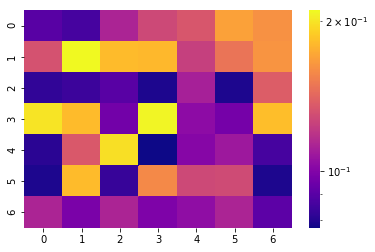

[[0.09  0.086 0.113 0.128 0.134 0.169 0.162]
 [0.132 0.21  0.181 0.18  0.124 0.148 0.163]
 [0.082 0.084 0.09  0.079 0.111 0.079 0.137]
 [0.2   0.181 0.096 0.208 0.103 0.097 0.183]
 [0.081 0.135 0.198 0.077 0.101 0.108 0.086]
 [0.079 0.181 0.083 0.158 0.128 0.129 0.079]
 [0.113 0.098 0.113 0.099 0.104 0.113 0.091]]


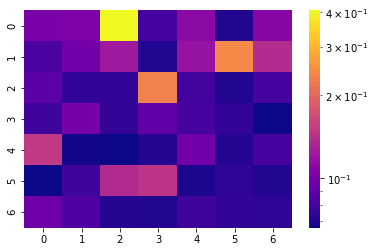

[[0.102 0.104 0.407 0.081 0.111 0.07  0.108]
 [0.083 0.098 0.123 0.07  0.118 0.244 0.138]
 [0.089 0.075 0.075 0.233 0.08  0.07  0.081]
 [0.078 0.101 0.075 0.091 0.081 0.075 0.066]
 [0.15  0.067 0.066 0.071 0.098 0.071 0.081]
 [0.066 0.078 0.137 0.146 0.069 0.073 0.07 ]
 [0.097 0.084 0.071 0.07  0.078 0.075 0.073]]


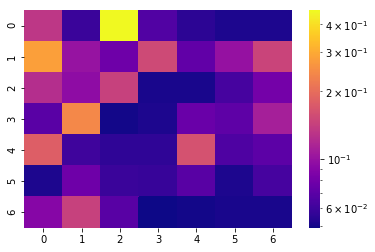

[[0.132 0.059 0.462 0.067 0.055 0.052 0.052]
 [0.281 0.1   0.078 0.154 0.073 0.099 0.147]
 [0.123 0.095 0.144 0.051 0.051 0.063 0.081]
 [0.07  0.243 0.05  0.052 0.076 0.072 0.11 ]
 [0.18  0.061 0.056 0.056 0.163 0.066 0.071]
 [0.052 0.078 0.059 0.058 0.069 0.052 0.063]
 [0.09  0.144 0.069 0.049 0.05  0.051 0.051]]


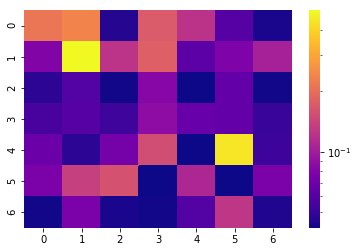

[[0.214 0.238 0.046 0.172 0.122 0.061 0.044]
 [0.08  0.498 0.123 0.178 0.063 0.078 0.104]
 [0.048 0.06  0.043 0.083 0.042 0.066 0.043]
 [0.056 0.061 0.053 0.087 0.068 0.066 0.051]
 [0.07  0.048 0.074 0.152 0.042 0.446 0.052]
 [0.076 0.136 0.158 0.042 0.11  0.042 0.077]
 [0.043 0.076 0.044 0.043 0.06  0.126 0.045]]


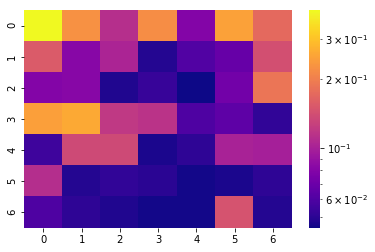

[[0.399 0.226 0.112 0.22  0.08  0.249 0.172]
 [0.155 0.082 0.103 0.049 0.061 0.068 0.143]
 [0.08  0.082 0.048 0.053 0.045 0.073 0.187]
 [0.247 0.261 0.12  0.115 0.06  0.065 0.052]
 [0.055 0.137 0.137 0.047 0.051 0.102 0.099]
 [0.111 0.049 0.052 0.05  0.046 0.047 0.051]
 [0.06  0.051 0.048 0.046 0.046 0.147 0.049]]


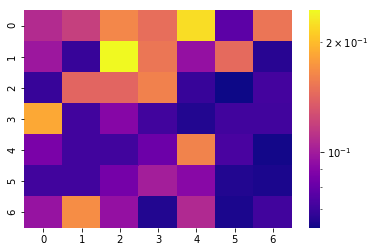

[[0.108 0.119 0.164 0.147 0.223 0.078 0.152]
 [0.098 0.069 0.244 0.153 0.095 0.145 0.066]
 [0.069 0.142 0.142 0.16  0.069 0.062 0.072]
 [0.186 0.071 0.09  0.071 0.065 0.071 0.071]
 [0.086 0.071 0.071 0.082 0.161 0.073 0.063]
 [0.071 0.071 0.085 0.101 0.091 0.065 0.064]
 [0.096 0.168 0.095 0.065 0.107 0.064 0.071]]


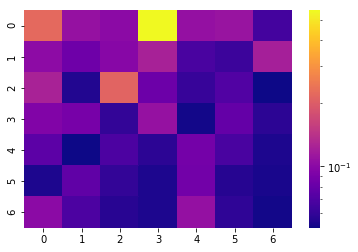

[[0.221 0.108 0.101 0.553 0.107 0.11  0.066]
 [0.102 0.084 0.098 0.123 0.068 0.063 0.121]
 [0.124 0.055 0.212 0.083 0.061 0.071 0.051]
 [0.095 0.089 0.06  0.108 0.052 0.079 0.058]
 [0.076 0.051 0.069 0.058 0.087 0.068 0.054]
 [0.054 0.077 0.06  0.054 0.086 0.056 0.053]
 [0.101 0.069 0.057 0.054 0.107 0.059 0.052]]


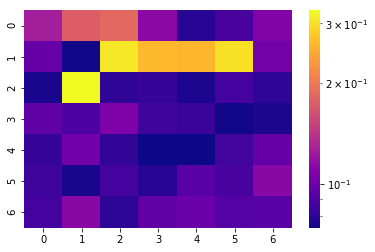

[[0.126 0.174 0.184 0.113 0.079 0.088 0.109]
 [0.098 0.075 0.309 0.26  0.258 0.301 0.103]
 [0.076 0.328 0.081 0.083 0.077 0.087 0.081]
 [0.096 0.09  0.107 0.085 0.084 0.075 0.077]
 [0.083 0.102 0.082 0.074 0.074 0.086 0.098]
 [0.085 0.076 0.087 0.079 0.093 0.088 0.112]
 [0.087 0.112 0.08  0.096 0.1   0.092 0.093]]


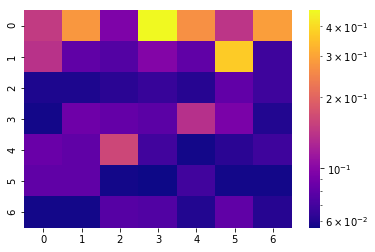

[[0.148 0.278 0.096 0.468 0.267 0.142 0.291]
 [0.139 0.081 0.076 0.098 0.081 0.374 0.068]
 [0.059 0.059 0.062 0.066 0.061 0.082 0.068]
 [0.057 0.087 0.083 0.079 0.137 0.093 0.06 ]
 [0.085 0.081 0.162 0.069 0.057 0.062 0.068]
 [0.081 0.081 0.057 0.056 0.069 0.057 0.057]
 [0.057 0.057 0.077 0.075 0.06  0.081 0.061]]


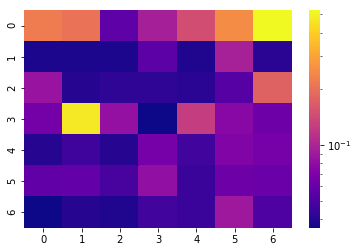

[[0.221 0.203 0.057 0.095 0.148 0.251 0.526]
 [0.038 0.038 0.038 0.056 0.039 0.096 0.041]
 [0.085 0.04  0.042 0.042 0.041 0.054 0.176]
 [0.066 0.476 0.083 0.036 0.126 0.076 0.063]
 [0.04  0.046 0.04  0.067 0.047 0.072 0.067]
 [0.058 0.059 0.049 0.082 0.045 0.063 0.061]
 [0.036 0.04  0.039 0.047 0.045 0.089 0.051]]


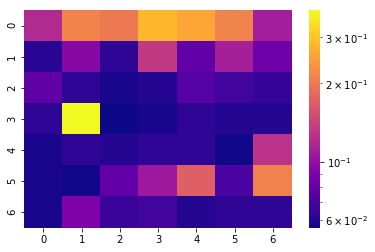

[[0.121 0.215 0.201 0.282 0.259 0.214 0.111]
 [0.061 0.096 0.063 0.134 0.079 0.112 0.084]
 [0.078 0.063 0.058 0.06  0.074 0.068 0.065]
 [0.063 0.381 0.056 0.058 0.063 0.06  0.06 ]
 [0.058 0.063 0.06  0.063 0.063 0.057 0.128]
 [0.058 0.057 0.079 0.107 0.172 0.071 0.211]
 [0.058 0.09  0.066 0.068 0.06  0.063 0.063]]


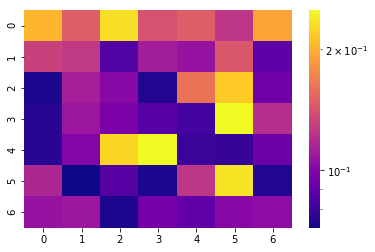

[[0.205 0.148 0.232 0.141 0.148 0.125 0.193]
 [0.131 0.126 0.085 0.112 0.107 0.144 0.088]
 [0.074 0.113 0.102 0.075 0.161 0.218 0.094]
 [0.076 0.109 0.097 0.087 0.082 0.25  0.121]
 [0.076 0.1   0.225 0.25  0.08  0.079 0.092]
 [0.117 0.072 0.087 0.074 0.125 0.235 0.075]
 [0.107 0.109 0.074 0.096 0.09  0.102 0.104]]


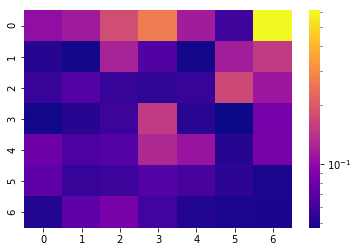

[[0.102 0.114 0.18  0.266 0.115 0.06  0.612]
 [0.052 0.048 0.121 0.067 0.048 0.116 0.152]
 [0.058 0.068 0.057 0.055 0.057 0.172 0.111]
 [0.048 0.052 0.059 0.151 0.053 0.047 0.085]
 [0.08  0.065 0.068 0.129 0.108 0.052 0.086]
 [0.073 0.057 0.059 0.068 0.063 0.054 0.05 ]
 [0.051 0.073 0.086 0.061 0.051 0.05  0.049]]


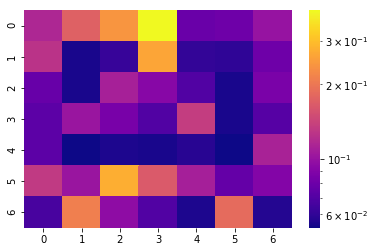

[[0.116 0.173 0.241 0.397 0.079 0.081 0.101]
 [0.126 0.055 0.062 0.263 0.061 0.06  0.081]
 [0.078 0.055 0.111 0.092 0.07  0.055 0.086]
 [0.074 0.102 0.085 0.07  0.136 0.055 0.072]
 [0.074 0.053 0.056 0.055 0.058 0.053 0.112]
 [0.133 0.102 0.275 0.165 0.11  0.077 0.09 ]
 [0.067 0.21  0.096 0.07  0.056 0.186 0.057]]


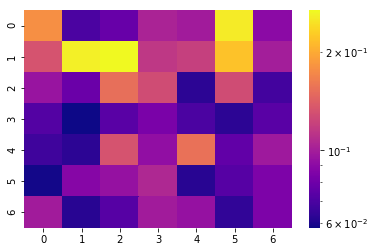

[[0.178 0.07  0.078 0.103 0.099 0.254 0.09 ]
 [0.133 0.259 0.268 0.115 0.12  0.219 0.1  ]
 [0.095 0.079 0.153 0.128 0.063 0.128 0.068]
 [0.072 0.058 0.074 0.084 0.07  0.063 0.074]
 [0.067 0.063 0.133 0.092 0.155 0.076 0.098]
 [0.059 0.088 0.094 0.106 0.062 0.073 0.085]
 [0.099 0.062 0.073 0.099 0.094 0.064 0.085]]


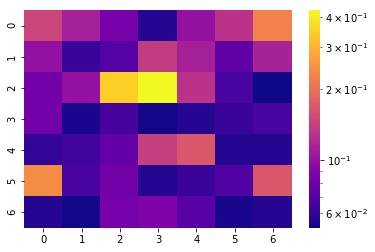

[[0.147 0.111 0.085 0.056 0.101 0.129 0.224]
 [0.1   0.062 0.071 0.138 0.111 0.075 0.113]
 [0.083 0.1   0.344 0.426 0.129 0.067 0.052]
 [0.083 0.054 0.066 0.053 0.056 0.062 0.067]
 [0.06  0.064 0.076 0.141 0.168 0.056 0.056]
 [0.238 0.067 0.083 0.056 0.062 0.069 0.168]
 [0.056 0.053 0.085 0.088 0.072 0.054 0.056]]


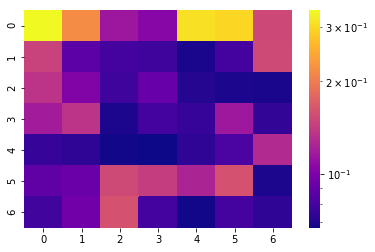

[[0.34  0.217 0.115 0.104 0.31  0.298 0.152]
 [0.148 0.088 0.08  0.078 0.069 0.08  0.153]
 [0.136 0.102 0.078 0.092 0.071 0.07  0.069]
 [0.118 0.136 0.07  0.08  0.076 0.116 0.075]
 [0.076 0.074 0.068 0.067 0.074 0.082 0.128]
 [0.089 0.093 0.153 0.144 0.124 0.16  0.07 ]
 [0.079 0.095 0.16  0.08  0.068 0.08  0.074]]


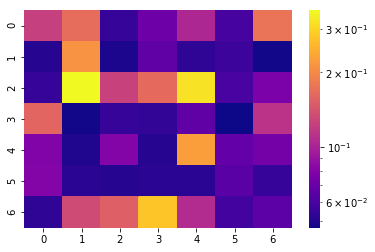

[[0.123 0.168 0.055 0.072 0.103 0.059 0.176]
 [0.051 0.212 0.049 0.067 0.053 0.056 0.048]
 [0.055 0.357 0.125 0.165 0.32  0.06  0.077]
 [0.16  0.048 0.055 0.054 0.067 0.047 0.113]
 [0.079 0.05  0.081 0.051 0.226 0.068 0.074]
 [0.08  0.052 0.051 0.052 0.052 0.065 0.055]
 [0.053 0.133 0.154 0.278 0.107 0.058 0.066]]


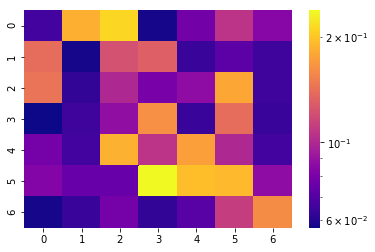

[[0.066 0.185 0.212 0.058 0.078 0.106 0.084]
 [0.14  0.058 0.122 0.131 0.064 0.072 0.065]
 [0.144 0.063 0.1   0.08  0.087 0.179 0.065]
 [0.057 0.065 0.088 0.163 0.064 0.14  0.064]
 [0.079 0.066 0.186 0.106 0.174 0.1   0.066]
 [0.083 0.075 0.075 0.238 0.195 0.192 0.087]
 [0.058 0.064 0.079 0.063 0.071 0.112 0.161]]


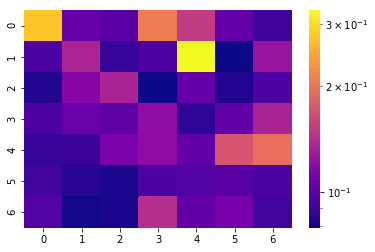

[[0.275 0.104 0.099 0.206 0.152 0.103 0.09 ]
 [0.094 0.136 0.088 0.095 0.328 0.079 0.125]
 [0.083 0.117 0.135 0.079 0.103 0.083 0.095]
 [0.095 0.105 0.101 0.121 0.086 0.102 0.135]
 [0.088 0.089 0.112 0.12  0.102 0.172 0.194]
 [0.091 0.084 0.082 0.095 0.097 0.099 0.094]
 [0.097 0.08  0.081 0.142 0.102 0.11  0.091]]


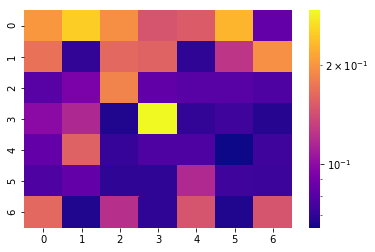

[[0.202 0.25  0.194 0.146 0.153 0.228 0.085]
 [0.17  0.071 0.162 0.158 0.07  0.125 0.196]
 [0.081 0.092 0.184 0.084 0.081 0.081 0.078]
 [0.099 0.116 0.067 0.292 0.071 0.074 0.068]
 [0.085 0.156 0.072 0.078 0.078 0.064 0.074]
 [0.078 0.085 0.07  0.07  0.117 0.074 0.073]
 [0.162 0.067 0.121 0.07  0.146 0.067 0.146]]


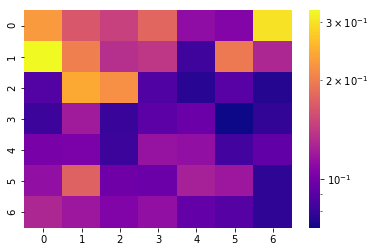

[[0.227 0.166 0.147 0.179 0.112 0.106 0.3  ]
 [0.325 0.202 0.134 0.139 0.082 0.196 0.128]
 [0.088 0.242 0.217 0.087 0.076 0.09  0.075]
 [0.081 0.12  0.08  0.091 0.097 0.071 0.079]
 [0.102 0.103 0.081 0.115 0.113 0.083 0.093]
 [0.113 0.175 0.098 0.097 0.124 0.118 0.078]
 [0.128 0.118 0.105 0.113 0.094 0.089 0.078]]


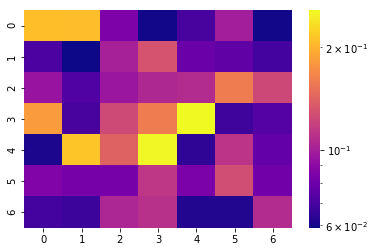

[[0.21  0.208 0.085 0.06  0.07  0.1   0.06 ]
 [0.071 0.059 0.101 0.131 0.079 0.076 0.069]
 [0.095 0.072 0.096 0.105 0.107 0.16  0.124]
 [0.183 0.07  0.125 0.16  0.257 0.068 0.073]
 [0.061 0.214 0.141 0.255 0.064 0.112 0.077]
 [0.086 0.083 0.083 0.113 0.084 0.127 0.081]
 [0.069 0.067 0.104 0.11  0.062 0.062 0.107]]


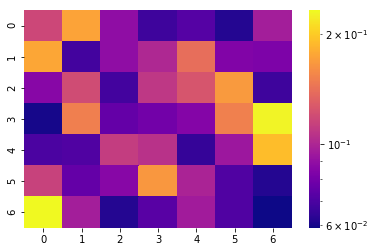

[[0.117 0.174 0.089 0.067 0.072 0.062 0.096]
 [0.176 0.068 0.089 0.101 0.14  0.084 0.083]
 [0.086 0.12  0.068 0.109 0.125 0.168 0.067]
 [0.06  0.151 0.076 0.08  0.085 0.152 0.228]
 [0.07  0.071 0.112 0.106 0.065 0.093 0.191]
 [0.114 0.076 0.086 0.166 0.099 0.071 0.062]
 [0.232 0.096 0.062 0.073 0.095 0.071 0.059]]


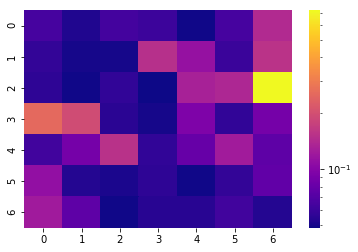

[[0.065 0.052 0.064 0.061 0.049 0.065 0.142]
 [0.058 0.05  0.05  0.15  0.113 0.06  0.154]
 [0.056 0.049 0.057 0.048 0.13  0.138 0.719]
 [0.253 0.195 0.055 0.05  0.095 0.057 0.089]
 [0.063 0.089 0.153 0.057 0.08  0.124 0.076]
 [0.11  0.053 0.051 0.056 0.049 0.058 0.078]
 [0.123 0.076 0.049 0.054 0.054 0.063 0.053]]


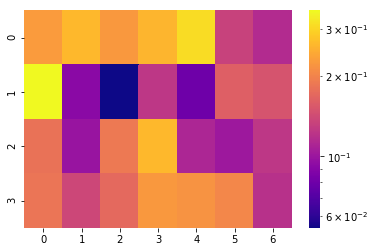

[[0.228 0.265 0.225 0.261 0.311 0.134 0.115]
 [0.353 0.092 0.054 0.124 0.08  0.162 0.15 ]
 [0.182 0.099 0.189 0.265 0.111 0.102 0.124]
 [0.185 0.139 0.171 0.225 0.218 0.205 0.12 ]]


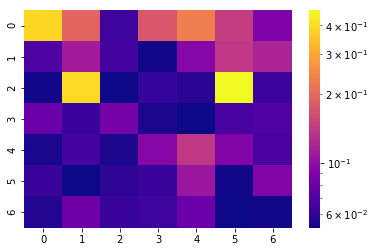

[[0.39  0.193 0.064 0.176 0.233 0.144 0.09 ]
 [0.069 0.112 0.065 0.053 0.095 0.139 0.12 ]
 [0.053 0.397 0.052 0.061 0.058 0.465 0.063]
 [0.081 0.062 0.086 0.055 0.052 0.067 0.07 ]
 [0.054 0.066 0.055 0.094 0.139 0.092 0.067]
 [0.062 0.052 0.059 0.062 0.107 0.053 0.092]
 [0.056 0.083 0.062 0.064 0.081 0.052 0.053]]


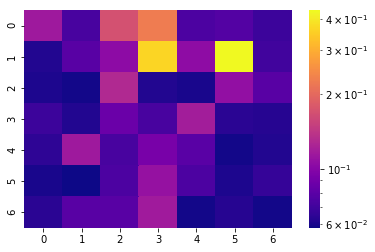

[[0.115 0.073 0.169 0.227 0.075 0.077 0.069]
 [0.062 0.079 0.104 0.365 0.105 0.432 0.071]
 [0.061 0.059 0.129 0.062 0.06  0.107 0.079]
 [0.069 0.062 0.087 0.073 0.118 0.064 0.063]
 [0.065 0.115 0.073 0.093 0.08  0.059 0.062]
 [0.06  0.058 0.075 0.109 0.075 0.061 0.067]
 [0.064 0.079 0.079 0.116 0.059 0.063 0.059]]


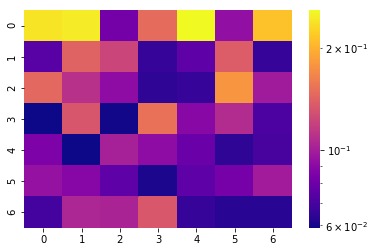

[[0.24  0.246 0.082 0.148 0.258 0.093 0.213]
 [0.074 0.142 0.122 0.066 0.076 0.138 0.066]
 [0.145 0.11  0.091 0.064 0.066 0.179 0.098]
 [0.059 0.133 0.06  0.152 0.089 0.107 0.071]
 [0.085 0.059 0.101 0.091 0.079 0.064 0.07 ]
 [0.094 0.088 0.076 0.061 0.076 0.083 0.099]
 [0.069 0.104 0.103 0.134 0.066 0.063 0.063]]


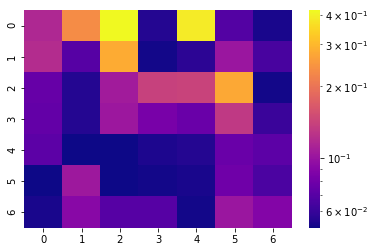

[[0.116 0.233 0.417 0.055 0.389 0.069 0.053]
 [0.12  0.07  0.281 0.052 0.057 0.102 0.065]
 [0.076 0.055 0.106 0.139 0.142 0.275 0.052]
 [0.075 0.055 0.103 0.084 0.077 0.132 0.061]
 [0.072 0.051 0.051 0.054 0.055 0.077 0.072]
 [0.051 0.104 0.051 0.052 0.053 0.08  0.066]
 [0.053 0.092 0.07  0.07  0.052 0.102 0.089]]


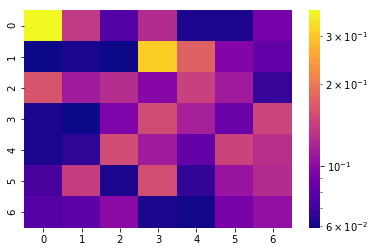

[[0.373 0.136 0.077 0.124 0.062 0.062 0.09 ]
 [0.059 0.062 0.059 0.311 0.174 0.096 0.083]
 [0.162 0.112 0.126 0.097 0.143 0.112 0.068]
 [0.062 0.059 0.094 0.153 0.115 0.085 0.147]
 [0.062 0.066 0.153 0.112 0.083 0.146 0.128]
 [0.073 0.14  0.062 0.155 0.067 0.107 0.124]
 [0.078 0.08  0.1   0.062 0.06  0.091 0.104]]


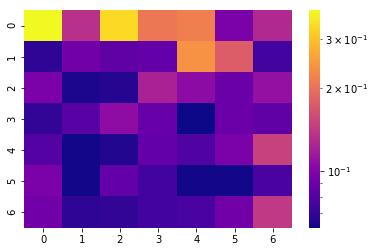

[[0.381 0.134 0.333 0.206 0.215 0.096 0.127]
 [0.069 0.092 0.085 0.087 0.238 0.177 0.075]
 [0.096 0.065 0.067 0.122 0.105 0.089 0.109]
 [0.07  0.082 0.106 0.088 0.062 0.09  0.085]
 [0.081 0.063 0.066 0.086 0.079 0.096 0.148]
 [0.096 0.063 0.086 0.075 0.063 0.063 0.077]
 [0.092 0.069 0.07  0.075 0.077 0.092 0.141]]


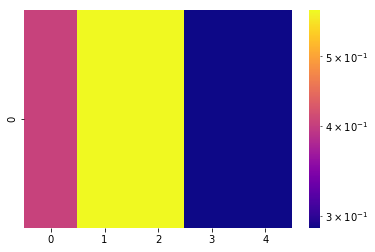

[[0.404 0.579 0.579 0.289 0.289]]
SKIPPPPPPEDDDD


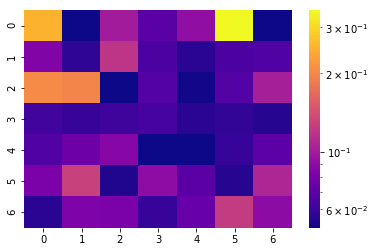

[[0.251 0.051 0.1   0.069 0.091 0.349 0.051]
 [0.084 0.057 0.119 0.065 0.056 0.065 0.066]
 [0.204 0.198 0.051 0.067 0.052 0.067 0.102]
 [0.062 0.059 0.061 0.063 0.056 0.058 0.055]
 [0.066 0.076 0.086 0.051 0.051 0.059 0.07 ]
 [0.081 0.129 0.054 0.09  0.069 0.055 0.107]
 [0.056 0.083 0.081 0.059 0.074 0.124 0.089]]


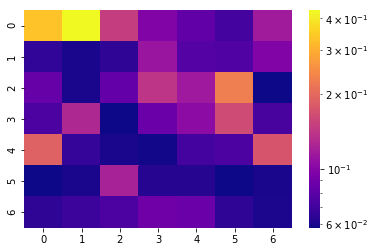

[[0.334 0.431 0.149 0.098 0.083 0.072 0.116]
 [0.066 0.06  0.065 0.112 0.078 0.076 0.098]
 [0.085 0.06  0.084 0.14  0.115 0.228 0.058]
 [0.075 0.127 0.058 0.086 0.104 0.163 0.073]
 [0.188 0.067 0.06  0.059 0.072 0.075 0.175]
 [0.058 0.06  0.122 0.063 0.063 0.058 0.06 ]
 [0.065 0.069 0.075 0.089 0.087 0.065 0.061]]


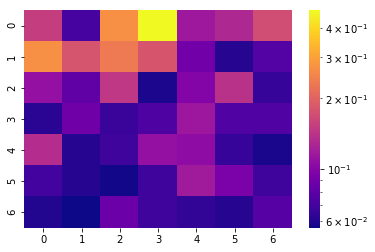

[[0.153 0.071 0.27  0.476 0.115 0.13  0.171]
 [0.271 0.18  0.234 0.182 0.089 0.061 0.076]
 [0.109 0.081 0.146 0.059 0.099 0.14  0.066]
 [0.062 0.088 0.067 0.074 0.114 0.075 0.075]
 [0.134 0.061 0.069 0.109 0.105 0.066 0.058]
 [0.07  0.061 0.057 0.068 0.117 0.094 0.069]
 [0.06  0.056 0.087 0.069 0.065 0.061 0.077]]


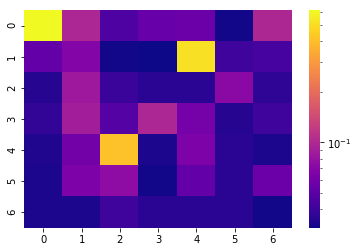

[[0.613 0.098 0.046 0.055 0.057 0.032 0.099]
 [0.053 0.068 0.032 0.031 0.52  0.041 0.043]
 [0.035 0.085 0.04  0.036 0.036 0.072 0.037]
 [0.038 0.089 0.048 0.098 0.061 0.035 0.041]
 [0.034 0.06  0.414 0.033 0.065 0.036 0.033]
 [0.033 0.065 0.075 0.032 0.053 0.036 0.057]
 [0.033 0.033 0.041 0.036 0.036 0.036 0.032]]


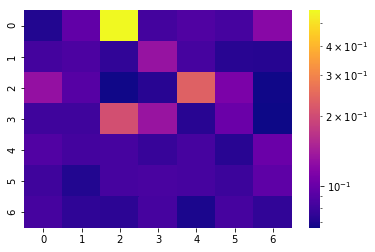

[[0.071 0.097 0.569 0.083 0.088 0.084 0.12 ]
 [0.083 0.087 0.076 0.131 0.084 0.073 0.072]
 [0.129 0.091 0.067 0.073 0.234 0.112 0.067]
 [0.081 0.081 0.206 0.132 0.073 0.102 0.066]
 [0.089 0.083 0.084 0.078 0.084 0.073 0.102]
 [0.081 0.071 0.084 0.085 0.084 0.08  0.095]
 [0.084 0.075 0.074 0.084 0.069 0.084 0.076]]


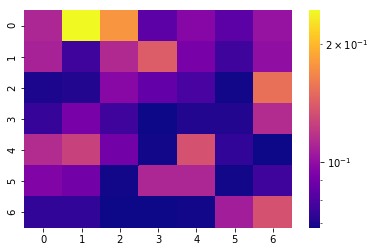

[[0.111 0.244 0.178 0.084 0.096 0.084 0.102]
 [0.109 0.077 0.113 0.142 0.092 0.077 0.1  ]
 [0.07  0.071 0.097 0.086 0.079 0.069 0.154]
 [0.075 0.092 0.077 0.068 0.071 0.071 0.114]
 [0.114 0.126 0.09  0.069 0.135 0.074 0.068]
 [0.095 0.09  0.069 0.111 0.111 0.069 0.077]
 [0.074 0.074 0.068 0.068 0.069 0.107 0.135]]


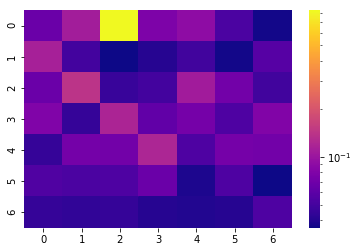

[[0.068 0.109 0.826 0.078 0.091 0.053 0.037]
 [0.113 0.05  0.036 0.041 0.049 0.037 0.058]
 [0.068 0.141 0.046 0.05  0.107 0.072 0.049]
 [0.08  0.045 0.118 0.063 0.074 0.054 0.081]
 [0.045 0.073 0.072 0.12  0.054 0.074 0.072]
 [0.055 0.053 0.054 0.068 0.039 0.054 0.036]
 [0.045 0.044 0.045 0.041 0.04  0.041 0.054]]


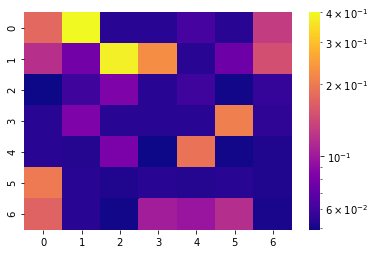

[[0.177 0.4   0.054 0.054 0.062 0.054 0.13 ]
 [0.118 0.078 0.382 0.227 0.054 0.076 0.149]
 [0.049 0.06  0.083 0.054 0.06  0.05  0.057]
 [0.054 0.083 0.054 0.054 0.054 0.207 0.055]
 [0.054 0.053 0.082 0.049 0.19  0.05  0.052]
 [0.2   0.054 0.052 0.054 0.053 0.054 0.052]
 [0.171 0.054 0.05  0.103 0.097 0.116 0.051]]
SKIPPPPPPEDDDD


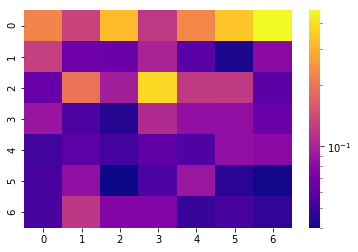

[[0.225 0.131 0.322 0.12  0.227 0.341 0.462]
 [0.128 0.067 0.066 0.101 0.059 0.042 0.08 ]
 [0.064 0.195 0.096 0.384 0.122 0.122 0.059]
 [0.089 0.054 0.044 0.107 0.085 0.084 0.065]
 [0.051 0.06  0.052 0.061 0.056 0.085 0.081]
 [0.053 0.084 0.04  0.054 0.09  0.045 0.041]
 [0.053 0.118 0.076 0.075 0.048 0.053 0.047]]


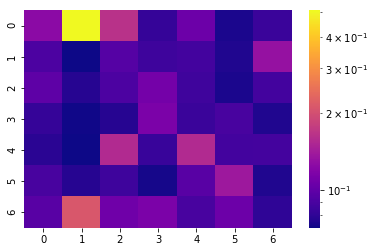

[[0.125 0.507 0.165 0.082 0.106 0.074 0.084]
 [0.091 0.071 0.095 0.085 0.087 0.075 0.132]
 [0.099 0.077 0.091 0.11  0.086 0.074 0.087]
 [0.082 0.072 0.077 0.115 0.084 0.089 0.075]
 [0.078 0.071 0.156 0.083 0.156 0.087 0.088]
 [0.089 0.077 0.085 0.073 0.096 0.138 0.075]
 [0.096 0.212 0.108 0.115 0.089 0.106 0.08 ]]


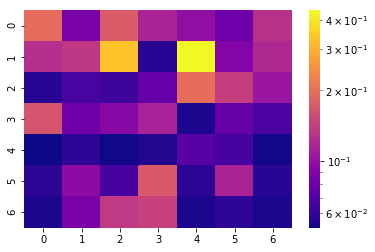

[[0.196 0.086 0.177 0.116 0.099 0.081 0.128]
 [0.126 0.135 0.335 0.057 0.439 0.092 0.12 ]
 [0.057 0.067 0.063 0.077 0.198 0.142 0.105]
 [0.166 0.082 0.094 0.114 0.055 0.078 0.068]
 [0.052 0.059 0.053 0.056 0.072 0.066 0.053]
 [0.058 0.097 0.066 0.172 0.058 0.115 0.057]
 [0.055 0.086 0.136 0.144 0.055 0.059 0.055]]


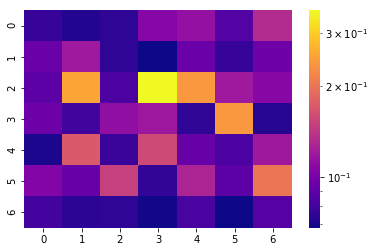

[[0.077 0.072 0.075 0.107 0.114 0.086 0.133]
 [0.095 0.12  0.075 0.068 0.095 0.077 0.096]
 [0.089 0.254 0.084 0.356 0.239 0.12  0.108]
 [0.096 0.08  0.112 0.118 0.075 0.239 0.073]
 [0.071 0.173 0.078 0.158 0.093 0.084 0.119]
 [0.105 0.093 0.149 0.076 0.128 0.089 0.202]
 [0.081 0.074 0.075 0.069 0.083 0.068 0.087]]


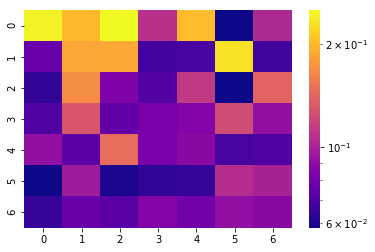

[[0.244 0.2   0.251 0.108 0.203 0.058 0.103]
 [0.077 0.187 0.188 0.068 0.069 0.232 0.067]
 [0.064 0.169 0.084 0.072 0.113 0.058 0.14 ]
 [0.071 0.13  0.076 0.083 0.086 0.124 0.091]
 [0.091 0.074 0.145 0.083 0.088 0.069 0.071]
 [0.058 0.096 0.06  0.063 0.065 0.106 0.1  ]
 [0.065 0.078 0.073 0.086 0.08  0.091 0.088]]


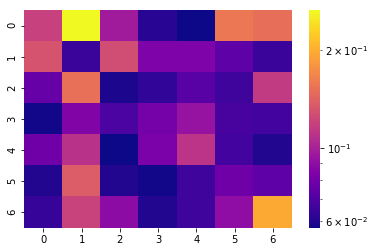

[[0.119 0.264 0.097 0.061 0.057 0.157 0.151]
 [0.131 0.065 0.127 0.084 0.084 0.074 0.065]
 [0.076 0.152 0.059 0.063 0.072 0.066 0.115]
 [0.058 0.085 0.069 0.081 0.093 0.068 0.067]
 [0.079 0.11  0.057 0.083 0.111 0.067 0.06 ]
 [0.06  0.138 0.06  0.058 0.066 0.079 0.074]
 [0.064 0.12  0.089 0.06  0.066 0.09  0.196]]


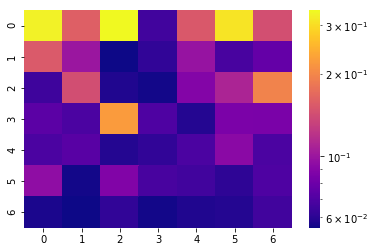

[[0.33  0.159 0.34  0.066 0.153 0.312 0.144]
 [0.154 0.1   0.055 0.062 0.098 0.068 0.077]
 [0.065 0.143 0.058 0.056 0.089 0.11  0.196]
 [0.074 0.069 0.222 0.07  0.059 0.086 0.085]
 [0.069 0.073 0.059 0.062 0.069 0.092 0.069]
 [0.095 0.056 0.088 0.068 0.066 0.061 0.07 ]
 [0.057 0.055 0.062 0.056 0.058 0.059 0.066]]


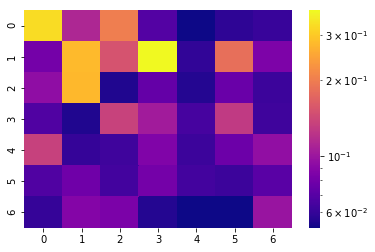

[[0.328 0.112 0.2   0.069 0.052 0.058 0.061]
 [0.081 0.28  0.152 0.376 0.059 0.182 0.085]
 [0.094 0.278 0.055 0.075 0.056 0.077 0.062]
 [0.068 0.055 0.135 0.104 0.065 0.128 0.063]
 [0.134 0.06  0.063 0.086 0.062 0.078 0.095]
 [0.068 0.079 0.064 0.081 0.064 0.062 0.071]
 [0.06  0.088 0.084 0.056 0.052 0.052 0.098]]


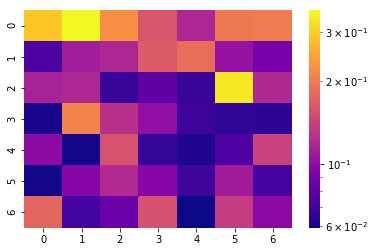

[[0.289 0.358 0.222 0.16  0.118 0.196 0.2  ]
 [0.074 0.112 0.119 0.166 0.185 0.104 0.09 ]
 [0.115 0.119 0.068 0.081 0.068 0.336 0.12 ]
 [0.061 0.209 0.127 0.102 0.069 0.066 0.065]
 [0.1   0.06  0.157 0.067 0.062 0.074 0.142]
 [0.06  0.096 0.121 0.097 0.07  0.111 0.072]
 [0.177 0.071 0.084 0.155 0.059 0.137 0.099]]


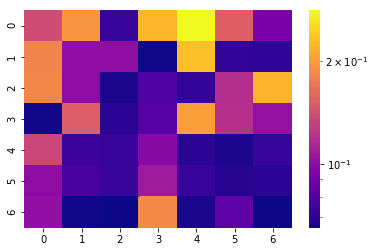

[[0.139 0.195 0.073 0.222 0.281 0.153 0.093]
 [0.18  0.101 0.101 0.066 0.231 0.072 0.071]
 [0.184 0.1   0.067 0.079 0.072 0.119 0.219]
 [0.066 0.152 0.07  0.081 0.203 0.12  0.103]
 [0.135 0.074 0.073 0.098 0.07  0.067 0.073]
 [0.1   0.077 0.073 0.107 0.073 0.069 0.07 ]
 [0.102 0.066 0.065 0.186 0.067 0.083 0.065]]


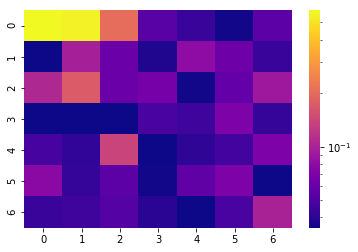

[[0.584 0.558 0.205 0.054 0.044 0.036 0.056]
 [0.035 0.097 0.061 0.038 0.08  0.063 0.044]
 [0.106 0.175 0.061 0.067 0.036 0.059 0.091]
 [0.035 0.035 0.035 0.049 0.046 0.07  0.043]
 [0.048 0.042 0.139 0.035 0.041 0.047 0.07 ]
 [0.078 0.043 0.056 0.036 0.057 0.07  0.035]
 [0.044 0.046 0.053 0.04  0.035 0.049 0.1  ]]


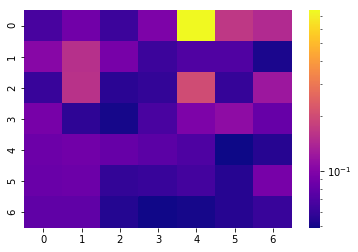

[[0.067 0.089 0.062 0.097 0.756 0.167 0.147]
 [0.104 0.155 0.093 0.062 0.071 0.071 0.052]
 [0.061 0.158 0.056 0.059 0.203 0.06  0.122]
 [0.093 0.057 0.051 0.068 0.097 0.11  0.082]
 [0.086 0.089 0.082 0.076 0.07  0.049 0.055]
 [0.084 0.086 0.059 0.061 0.066 0.055 0.093]
 [0.079 0.079 0.054 0.05  0.051 0.055 0.061]]


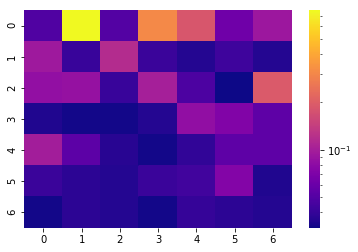

[[0.049 0.758 0.05  0.311 0.185 0.063 0.092]
 [0.094 0.041 0.116 0.042 0.036 0.043 0.036]
 [0.084 0.087 0.041 0.1   0.048 0.032 0.191]
 [0.035 0.033 0.033 0.036 0.083 0.073 0.055]
 [0.098 0.054 0.037 0.033 0.039 0.055 0.055]
 [0.042 0.038 0.036 0.042 0.044 0.074 0.035]
 [0.033 0.038 0.036 0.033 0.04  0.038 0.036]]


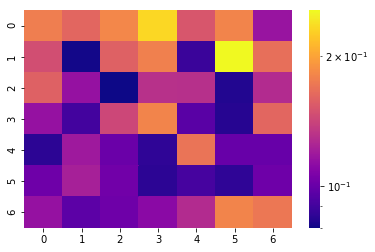

[[0.176 0.162 0.182 0.232 0.152 0.18  0.116]
 [0.147 0.081 0.158 0.178 0.088 0.255 0.167]
 [0.158 0.115 0.08  0.131 0.13  0.083 0.128]
 [0.115 0.09  0.143 0.18  0.096 0.084 0.162]
 [0.085 0.119 0.101 0.086 0.17  0.1   0.1  ]
 [0.102 0.122 0.103 0.085 0.091 0.086 0.102]
 [0.115 0.097 0.102 0.111 0.128 0.18  0.172]]


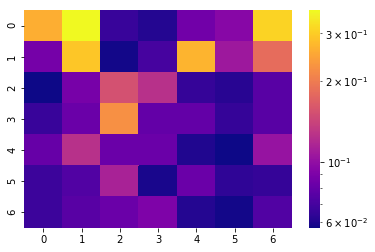

[[0.261 0.365 0.066 0.061 0.085 0.095 0.31 ]
 [0.087 0.292 0.058 0.07  0.268 0.107 0.183]
 [0.057 0.088 0.153 0.125 0.065 0.062 0.076]
 [0.066 0.083 0.223 0.08  0.08  0.065 0.076]
 [0.081 0.125 0.083 0.083 0.06  0.057 0.103]
 [0.067 0.074 0.114 0.059 0.083 0.064 0.065]
 [0.067 0.076 0.083 0.091 0.061 0.058 0.074]]


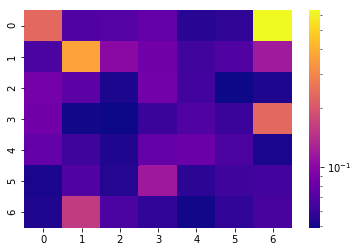

[[0.233 0.069 0.071 0.079 0.055 0.057 0.631]
 [0.067 0.367 0.101 0.085 0.063 0.069 0.119]
 [0.088 0.075 0.052 0.086 0.064 0.049 0.053]
 [0.085 0.05  0.049 0.061 0.07  0.061 0.233]
 [0.079 0.062 0.053 0.078 0.081 0.068 0.051]
 [0.051 0.069 0.054 0.116 0.056 0.062 0.064]
 [0.053 0.158 0.067 0.058 0.05  0.058 0.066]]


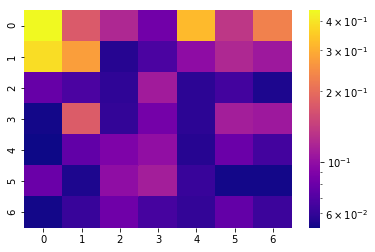

[[0.445 0.175 0.121 0.083 0.321 0.135 0.23 ]
 [0.389 0.275 0.057 0.068 0.098 0.121 0.107]
 [0.078 0.068 0.059 0.11  0.058 0.065 0.055]
 [0.053 0.178 0.06  0.084 0.058 0.112 0.107]
 [0.052 0.076 0.089 0.1   0.057 0.08  0.065]
 [0.08  0.055 0.099 0.112 0.062 0.053 0.053]
 [0.053 0.062 0.082 0.066 0.06  0.077 0.063]]


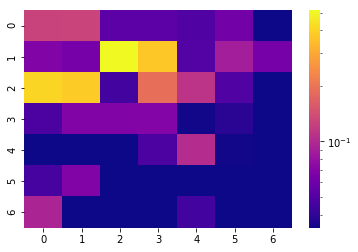

[[0.127 0.129 0.053 0.053 0.049 0.062 0.034]
 [0.069 0.064 0.514 0.377 0.05  0.09  0.064]
 [0.411 0.384 0.045 0.19  0.111 0.049 0.034]
 [0.048 0.069 0.069 0.07  0.035 0.039 0.034]
 [0.034 0.034 0.034 0.048 0.103 0.035 0.034]
 [0.046 0.069 0.034 0.034 0.034 0.034 0.034]
 [0.096 0.034 0.034 0.034 0.045 0.034 0.034]]


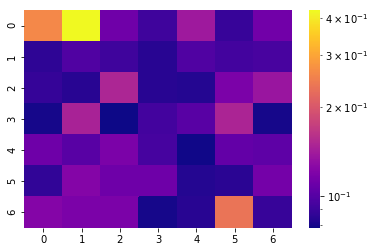

[[0.262 0.425 0.112 0.092 0.139 0.089 0.113]
 [0.086 0.098 0.092 0.084 0.098 0.093 0.095]
 [0.088 0.084 0.15  0.084 0.083 0.118 0.136]
 [0.08  0.147 0.078 0.093 0.101 0.149 0.08 ]
 [0.111 0.101 0.118 0.094 0.079 0.106 0.104]
 [0.087 0.123 0.111 0.111 0.083 0.085 0.114]
 [0.123 0.118 0.118 0.08  0.084 0.235 0.089]]


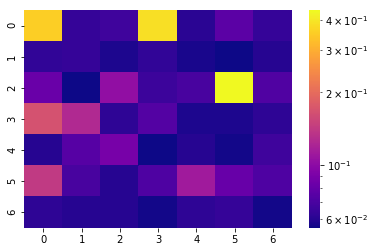

[[0.355 0.064 0.067 0.385 0.061 0.077 0.064]
 [0.063 0.064 0.058 0.063 0.057 0.055 0.06 ]
 [0.083 0.055 0.103 0.066 0.07  0.437 0.073]
 [0.167 0.125 0.062 0.074 0.058 0.058 0.062]
 [0.06  0.075 0.089 0.055 0.06  0.056 0.067]
 [0.141 0.07  0.06  0.072 0.113 0.082 0.072]
 [0.062 0.06  0.06  0.056 0.062 0.064 0.056]]


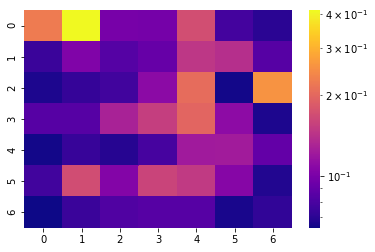

[[0.225 0.413 0.099 0.098 0.17  0.078 0.07 ]
 [0.075 0.103 0.084 0.091 0.146 0.139 0.085]
 [0.067 0.073 0.077 0.109 0.206 0.065 0.257]
 [0.085 0.085 0.128 0.154 0.197 0.11  0.067]
 [0.065 0.074 0.069 0.079 0.122 0.123 0.09 ]
 [0.077 0.169 0.105 0.16  0.149 0.106 0.068]
 [0.064 0.075 0.082 0.085 0.085 0.066 0.072]]


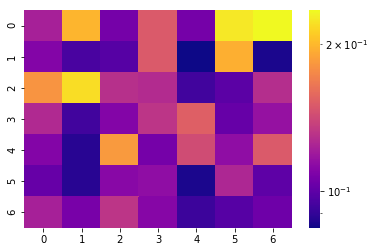

[[0.122 0.198 0.106 0.15  0.106 0.224 0.234]
 [0.11  0.095 0.098 0.15  0.084 0.195 0.086]
 [0.181 0.219 0.129 0.127 0.093 0.099 0.128]
 [0.126 0.093 0.11  0.132 0.153 0.102 0.116]
 [0.11  0.088 0.184 0.106 0.143 0.114 0.15 ]
 [0.102 0.088 0.112 0.114 0.086 0.125 0.1  ]
 [0.122 0.107 0.132 0.111 0.092 0.098 0.104]]
SKIPPPPPPEDDDD


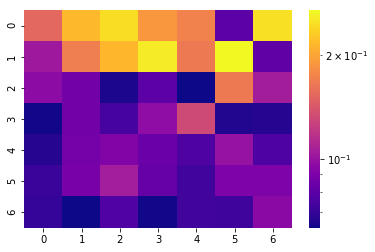

[[0.153 0.215 0.244 0.189 0.172 0.08  0.248]
 [0.103 0.169 0.214 0.257 0.166 0.269 0.081]
 [0.096 0.087 0.065 0.08  0.063 0.166 0.105]
 [0.064 0.087 0.074 0.097 0.132 0.066 0.067]
 [0.067 0.088 0.092 0.084 0.076 0.1   0.076]
 [0.071 0.089 0.106 0.083 0.073 0.091 0.091]
 [0.07  0.063 0.077 0.064 0.073 0.072 0.095]]


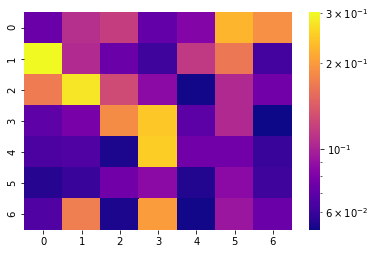

[[0.074 0.108 0.119 0.072 0.083 0.227 0.19 ]
 [0.301 0.105 0.074 0.061 0.116 0.166 0.063]
 [0.17  0.278 0.128 0.086 0.053 0.104 0.076]
 [0.07  0.079 0.185 0.246 0.069 0.104 0.052]
 [0.065 0.066 0.054 0.251 0.076 0.076 0.06 ]
 [0.056 0.06  0.076 0.086 0.055 0.086 0.061]
 [0.066 0.172 0.054 0.201 0.053 0.093 0.074]]


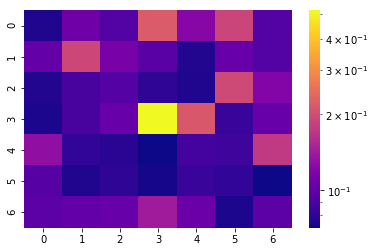

[[0.075 0.108 0.094 0.22  0.122 0.189 0.094]
 [0.102 0.193 0.114 0.097 0.076 0.104 0.094]
 [0.076 0.089 0.095 0.08  0.075 0.195 0.121]
 [0.074 0.089 0.104 0.518 0.215 0.083 0.104]
 [0.13  0.081 0.078 0.071 0.088 0.086 0.175]
 [0.096 0.075 0.08  0.073 0.083 0.081 0.071]
 [0.098 0.102 0.104 0.141 0.107 0.074 0.098]]


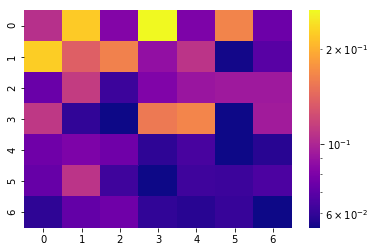

[[0.105 0.222 0.082 0.265 0.08  0.165 0.075]
 [0.225 0.137 0.163 0.088 0.108 0.055 0.069]
 [0.074 0.113 0.062 0.081 0.091 0.093 0.093]
 [0.11  0.06  0.054 0.156 0.166 0.054 0.094]
 [0.076 0.08  0.076 0.059 0.065 0.054 0.058]
 [0.073 0.108 0.063 0.054 0.063 0.062 0.066]
 [0.059 0.072 0.076 0.06  0.058 0.061 0.054]]


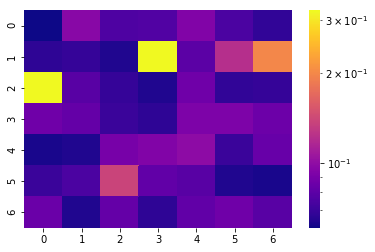

[[0.061 0.097 0.076 0.077 0.094 0.075 0.068]
 [0.067 0.069 0.064 0.322 0.08  0.122 0.199]
 [0.32  0.079 0.069 0.064 0.087 0.068 0.069]
 [0.087 0.083 0.07  0.067 0.092 0.092 0.086]
 [0.063 0.064 0.09  0.094 0.099 0.07  0.084]
 [0.07  0.075 0.138 0.082 0.079 0.064 0.063]
 [0.085 0.064 0.083 0.067 0.082 0.087 0.079]]


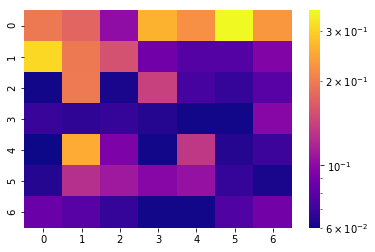

[[0.196 0.176 0.102 0.262 0.222 0.355 0.23 ]
 [0.31  0.196 0.155 0.088 0.078 0.078 0.095]
 [0.061 0.198 0.062 0.14  0.073 0.068 0.079]
 [0.069 0.067 0.068 0.064 0.061 0.061 0.097]
 [0.06  0.253 0.093 0.061 0.133 0.064 0.07 ]
 [0.064 0.126 0.11  0.097 0.105 0.068 0.062]
 [0.086 0.079 0.068 0.061 0.061 0.076 0.089]]


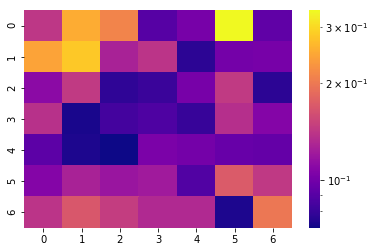

[[0.142 0.252 0.211 0.09  0.102 0.337 0.093]
 [0.244 0.282 0.127 0.14  0.077 0.101 0.102]
 [0.111 0.144 0.078 0.081 0.102 0.144 0.077]
 [0.137 0.073 0.084 0.087 0.08  0.136 0.108]
 [0.092 0.074 0.071 0.104 0.101 0.096 0.095]
 [0.108 0.127 0.118 0.122 0.088 0.172 0.143]
 [0.14  0.169 0.147 0.132 0.132 0.074 0.199]]


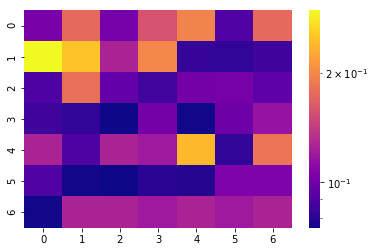

[[0.104 0.176 0.103 0.158 0.196 0.091 0.176]
 [0.297 0.25  0.126 0.199 0.083 0.082 0.085]
 [0.09  0.181 0.097 0.086 0.102 0.103 0.095]
 [0.085 0.082 0.075 0.102 0.076 0.1   0.116]
 [0.126 0.09  0.126 0.12  0.24  0.082 0.185]
 [0.091 0.076 0.075 0.08  0.079 0.106 0.106]
 [0.076 0.126 0.126 0.12  0.126 0.12  0.126]]


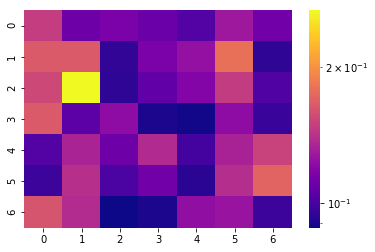

[[0.148 0.111 0.115 0.11  0.103 0.128 0.112]
 [0.165 0.165 0.095 0.115 0.124 0.179 0.094]
 [0.154 0.267 0.094 0.107 0.118 0.147 0.102]
 [0.165 0.106 0.122 0.09  0.089 0.122 0.096]
 [0.103 0.134 0.111 0.137 0.099 0.133 0.151]
 [0.097 0.14  0.101 0.112 0.093 0.139 0.171]
 [0.161 0.138 0.088 0.09  0.123 0.126 0.097]]


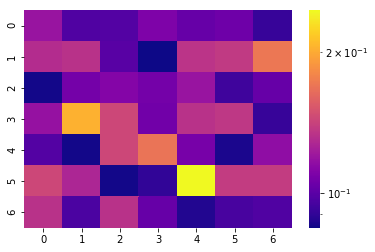

[[0.119 0.097 0.098 0.11  0.103 0.105 0.091]
 [0.13  0.133 0.099 0.084 0.134 0.137 0.171]
 [0.085 0.107 0.112 0.107 0.119 0.093 0.103]
 [0.118 0.204 0.144 0.106 0.133 0.136 0.091]
 [0.098 0.085 0.144 0.169 0.108 0.086 0.116]
 [0.144 0.127 0.085 0.09  0.246 0.138 0.138]
 [0.133 0.096 0.133 0.103 0.087 0.095 0.097]]


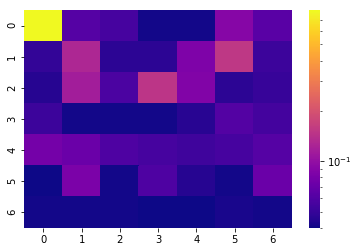

[[0.798 0.062 0.056 0.041 0.041 0.09  0.064]
 [0.049 0.128 0.047 0.047 0.085 0.152 0.052]
 [0.045 0.115 0.058 0.149 0.087 0.047 0.05 ]
 [0.052 0.041 0.041 0.041 0.046 0.061 0.055]
 [0.078 0.073 0.059 0.056 0.053 0.056 0.062]
 [0.04  0.083 0.041 0.059 0.045 0.041 0.073]
 [0.041 0.041 0.041 0.04  0.04  0.042 0.041]]


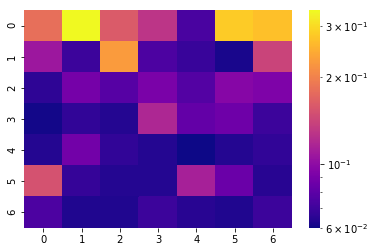

[[0.181 0.34  0.161 0.129 0.074 0.283 0.269]
 [0.107 0.07  0.227 0.075 0.069 0.062 0.14 ]
 [0.066 0.089 0.078 0.091 0.077 0.096 0.093]
 [0.061 0.067 0.064 0.118 0.082 0.086 0.07 ]
 [0.064 0.088 0.067 0.064 0.06  0.064 0.067]
 [0.152 0.068 0.064 0.064 0.113 0.085 0.065]
 [0.075 0.063 0.063 0.07  0.065 0.063 0.07 ]]


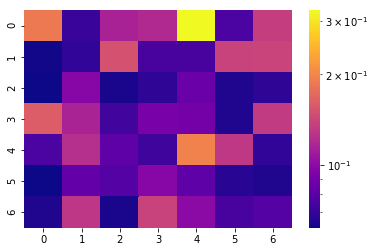

[[0.187 0.071 0.115 0.12  0.326 0.076 0.135]
 [0.063 0.069 0.151 0.075 0.075 0.139 0.14 ]
 [0.062 0.098 0.064 0.068 0.086 0.065 0.068]
 [0.161 0.116 0.073 0.092 0.09  0.065 0.133]
 [0.076 0.124 0.082 0.072 0.196 0.13  0.069]
 [0.062 0.084 0.079 0.098 0.082 0.067 0.065]
 [0.065 0.129 0.064 0.139 0.1   0.075 0.079]]


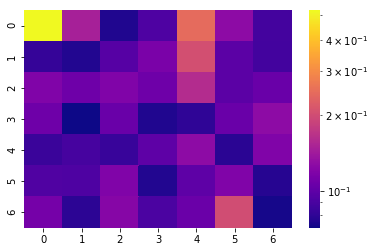

[[0.524 0.147 0.075 0.092 0.247 0.127 0.088]
 [0.082 0.076 0.096 0.115 0.205 0.098 0.087]
 [0.118 0.108 0.118 0.108 0.16  0.098 0.105]
 [0.108 0.071 0.105 0.075 0.08  0.105 0.127]
 [0.084 0.089 0.083 0.1   0.127 0.078 0.118]
 [0.093 0.092 0.118 0.076 0.1   0.118 0.077]
 [0.112 0.079 0.122 0.091 0.106 0.202 0.073]]


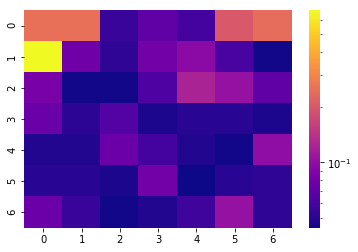

[[0.25  0.252 0.055 0.071 0.059 0.202 0.242]
 [0.673 0.079 0.052 0.08  0.096 0.061 0.045]
 [0.084 0.045 0.045 0.063 0.123 0.104 0.071]
 [0.076 0.051 0.065 0.047 0.05  0.05  0.047]
 [0.048 0.048 0.077 0.059 0.048 0.045 0.099]
 [0.05  0.05  0.047 0.08  0.044 0.05  0.052]
 [0.077 0.055 0.045 0.048 0.057 0.104 0.052]]


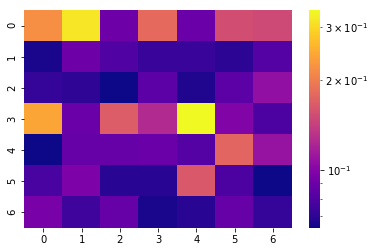

[[0.218 0.317 0.091 0.18  0.089 0.154 0.15 ]
 [0.066 0.091 0.08  0.073 0.073 0.07  0.082]
 [0.072 0.071 0.064 0.084 0.067 0.084 0.107]
 [0.242 0.089 0.168 0.125 0.341 0.099 0.079]
 [0.064 0.088 0.088 0.089 0.082 0.176 0.109]
 [0.078 0.097 0.069 0.069 0.164 0.079 0.064]
 [0.095 0.075 0.088 0.066 0.069 0.088 0.072]]


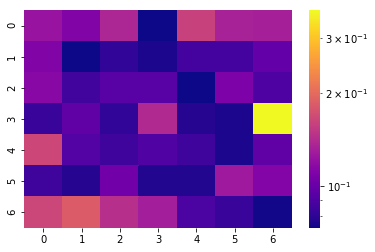

[[0.123 0.111 0.136 0.073 0.16  0.133 0.131]
 [0.111 0.073 0.081 0.076 0.087 0.087 0.098]
 [0.115 0.086 0.094 0.094 0.073 0.109 0.09 ]
 [0.083 0.097 0.081 0.139 0.078 0.076 0.369]
 [0.165 0.092 0.085 0.091 0.085 0.076 0.097]
 [0.085 0.078 0.104 0.077 0.077 0.127 0.112]
 [0.164 0.185 0.144 0.13  0.089 0.083 0.074]]
SKIPPPPPPEDDDD


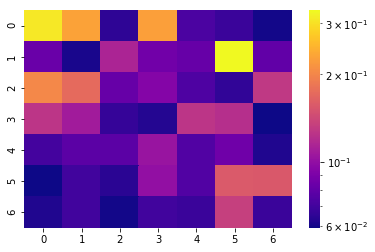

[[0.311 0.231 0.065 0.228 0.073 0.068 0.06 ]
 [0.083 0.061 0.114 0.086 0.082 0.333 0.08 ]
 [0.203 0.172 0.082 0.094 0.074 0.066 0.129]
 [0.126 0.108 0.067 0.063 0.126 0.121 0.059]
 [0.071 0.078 0.078 0.103 0.075 0.085 0.062]
 [0.059 0.07  0.064 0.1   0.075 0.157 0.156]
 [0.062 0.07  0.06  0.07  0.068 0.134 0.068]]


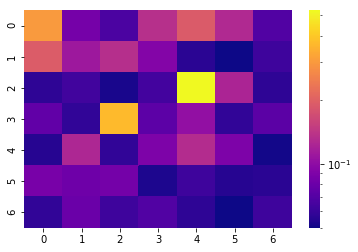

[[0.302 0.086 0.067 0.134 0.19  0.127 0.069]
 [0.193 0.111 0.133 0.093 0.056 0.05  0.062]
 [0.057 0.063 0.052 0.064 0.526 0.123 0.057]
 [0.076 0.058 0.37  0.074 0.103 0.058 0.073]
 [0.055 0.125 0.058 0.09  0.131 0.09  0.051]
 [0.087 0.082 0.085 0.053 0.062 0.055 0.056]
 [0.058 0.08  0.062 0.069 0.057 0.05  0.062]]


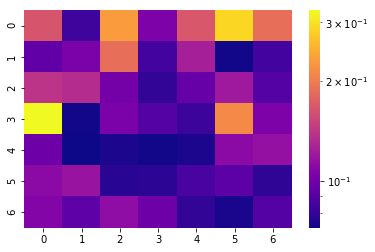

[[0.165 0.083 0.229 0.105 0.167 0.289 0.188]
 [0.094 0.104 0.188 0.084 0.124 0.073 0.084]
 [0.139 0.133 0.101 0.08  0.096 0.121 0.09 ]
 [0.326 0.073 0.104 0.09  0.082 0.213 0.105]
 [0.099 0.072 0.075 0.073 0.075 0.111 0.115]
 [0.111 0.117 0.077 0.078 0.086 0.092 0.079]
 [0.107 0.093 0.113 0.099 0.08  0.074 0.09 ]]


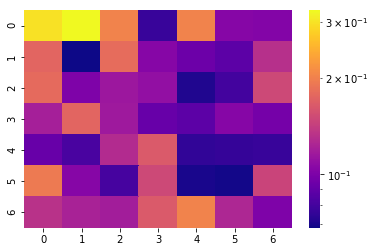

[[0.299 0.326 0.203 0.077 0.203 0.104 0.103]
 [0.175 0.068 0.182 0.104 0.094 0.088 0.131]
 [0.18  0.101 0.115 0.11  0.071 0.08  0.15 ]
 [0.12  0.175 0.116 0.092 0.088 0.104 0.097]
 [0.092 0.082 0.128 0.165 0.075 0.076 0.077]
 [0.194 0.104 0.081 0.15  0.07  0.069 0.147]
 [0.133 0.122 0.118 0.165 0.203 0.125 0.101]]


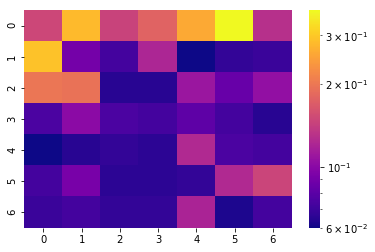

[[0.15  0.281 0.145 0.177 0.261 0.37  0.129]
 [0.292 0.09  0.073 0.121 0.06  0.068 0.07 ]
 [0.198 0.194 0.065 0.065 0.109 0.085 0.105]
 [0.075 0.101 0.075 0.073 0.082 0.073 0.065]
 [0.06  0.065 0.068 0.066 0.123 0.075 0.073]
 [0.073 0.092 0.066 0.066 0.068 0.123 0.147]
 [0.07  0.073 0.068 0.068 0.119 0.063 0.073]]


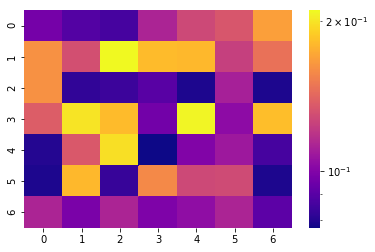

[[0.097 0.089 0.086 0.113 0.128 0.134 0.168]
 [0.162 0.131 0.21  0.181 0.18  0.124 0.147]
 [0.162 0.082 0.084 0.09  0.079 0.111 0.079]
 [0.137 0.2   0.181 0.096 0.208 0.103 0.183]
 [0.08  0.135 0.198 0.077 0.1   0.108 0.086]
 [0.079 0.18  0.083 0.158 0.128 0.129 0.079]
 [0.113 0.098 0.113 0.099 0.104 0.113 0.091]]


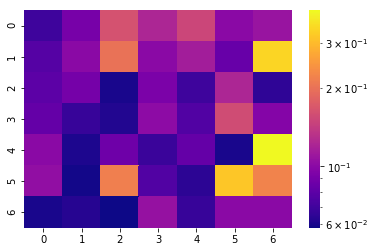

[[0.069 0.091 0.163 0.122 0.152 0.1   0.108]
 [0.077 0.1   0.202 0.1   0.115 0.084 0.34 ]
 [0.08  0.09  0.06  0.093 0.069 0.122 0.065]
 [0.083 0.067 0.062 0.102 0.076 0.157 0.097]
 [0.1   0.061 0.087 0.068 0.083 0.06  0.399]
 [0.104 0.059 0.217 0.076 0.064 0.317 0.222]
 [0.06  0.063 0.058 0.106 0.067 0.1   0.1  ]]


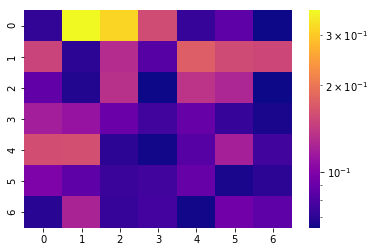

[[0.072 0.364 0.314 0.157 0.073 0.086 0.064]
 [0.15  0.07  0.13  0.083 0.175 0.156 0.153]
 [0.087 0.068 0.134 0.064 0.136 0.125 0.064]
 [0.119 0.111 0.09  0.076 0.089 0.073 0.066]
 [0.159 0.161 0.07  0.065 0.083 0.12  0.076]
 [0.099 0.086 0.074 0.076 0.089 0.066 0.07 ]
 [0.069 0.123 0.073 0.077 0.065 0.093 0.086]]


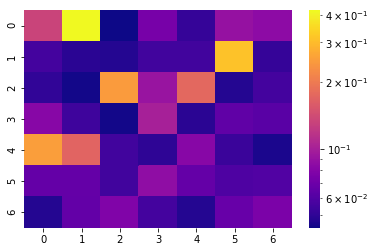

[[0.133 0.418 0.044 0.074 0.052 0.089 0.085]
 [0.056 0.049 0.048 0.055 0.055 0.31  0.052]
 [0.051 0.045 0.248 0.091 0.174 0.048 0.056]
 [0.082 0.054 0.045 0.1   0.049 0.065 0.063]
 [0.251 0.17  0.055 0.05  0.082 0.053 0.046]
 [0.067 0.067 0.055 0.086 0.067 0.059 0.06 ]
 [0.048 0.066 0.078 0.056 0.048 0.068 0.076]]


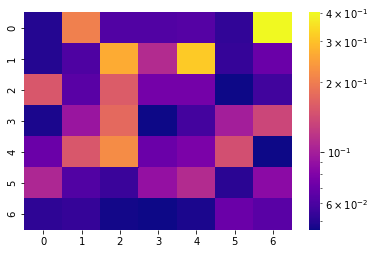

[[0.05  0.204 0.062 0.062 0.063 0.053 0.401]
 [0.05  0.061 0.265 0.11  0.315 0.054 0.071]
 [0.154 0.065 0.159 0.075 0.075 0.046 0.057]
 [0.048 0.093 0.174 0.046 0.058 0.1   0.135]
 [0.071 0.154 0.221 0.071 0.078 0.145 0.046]
 [0.107 0.062 0.055 0.09  0.11  0.051 0.086]
 [0.052 0.054 0.047 0.046 0.048 0.071 0.065]]


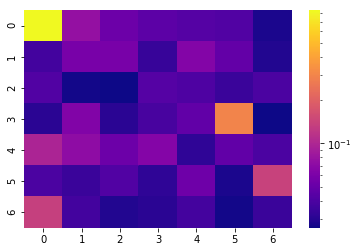

[[0.837 0.076 0.053 0.046 0.043 0.042 0.028]
 [0.037 0.059 0.059 0.034 0.065 0.049 0.029]
 [0.042 0.027 0.026 0.043 0.041 0.035 0.04 ]
 [0.031 0.064 0.031 0.039 0.048 0.296 0.026]
 [0.097 0.072 0.053 0.066 0.032 0.048 0.04 ]
 [0.04  0.035 0.042 0.032 0.054 0.028 0.138]
 [0.135 0.037 0.029 0.031 0.038 0.027 0.035]]


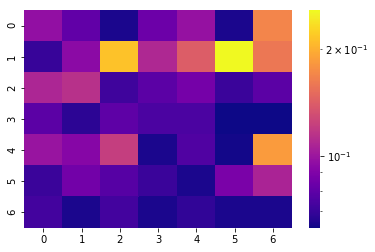

[[0.097 0.081 0.065 0.084 0.098 0.065 0.169]
 [0.07  0.094 0.213 0.109 0.141 0.256 0.159]
 [0.108 0.114 0.072 0.079 0.087 0.071 0.079]
 [0.079 0.068 0.08  0.075 0.075 0.063 0.063]
 [0.099 0.092 0.122 0.065 0.076 0.064 0.185]
 [0.071 0.086 0.078 0.071 0.065 0.088 0.107]
 [0.073 0.065 0.073 0.065 0.069 0.065 0.065]]


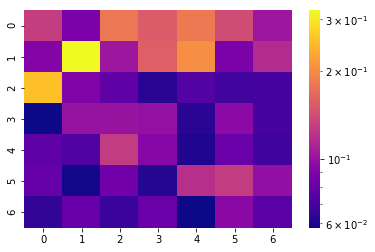

[[0.13  0.088 0.18  0.155 0.182 0.141 0.103]
 [0.091 0.322 0.103 0.158 0.204 0.088 0.116]
 [0.255 0.09  0.078 0.063 0.074 0.069 0.07 ]
 [0.058 0.1   0.101 0.099 0.063 0.095 0.07 ]
 [0.078 0.073 0.128 0.093 0.061 0.082 0.068]
 [0.08  0.059 0.084 0.062 0.119 0.128 0.098]
 [0.065 0.081 0.067 0.082 0.058 0.094 0.076]]


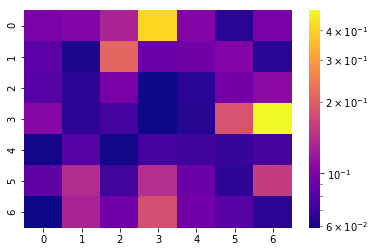

[[0.099 0.103 0.131 0.412 0.103 0.065 0.097]
 [0.084 0.062 0.21  0.09  0.094 0.102 0.065]
 [0.081 0.066 0.097 0.059 0.065 0.095 0.107]
 [0.106 0.066 0.074 0.059 0.064 0.185 0.486]
 [0.06  0.081 0.06  0.074 0.072 0.069 0.075]
 [0.085 0.138 0.073 0.141 0.09  0.067 0.158]
 [0.059 0.131 0.093 0.18  0.093 0.082 0.066]]


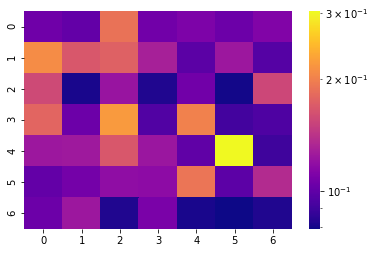

[[0.105 0.101 0.188 0.106 0.11  0.104 0.112]
 [0.209 0.167 0.174 0.129 0.098 0.124 0.096]
 [0.157 0.081 0.122 0.082 0.106 0.08  0.155]
 [0.178 0.104 0.221 0.095 0.201 0.091 0.094]
 [0.124 0.125 0.167 0.123 0.1   0.303 0.09 ]
 [0.101 0.107 0.118 0.117 0.19  0.099 0.136]
 [0.104 0.124 0.082 0.109 0.081 0.079 0.082]]


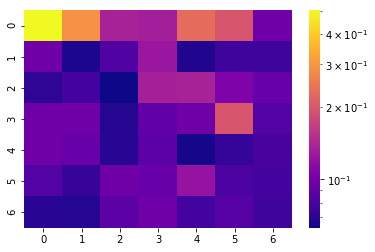

[[0.502 0.292 0.135 0.132 0.229 0.197 0.098]
 [0.098 0.066 0.084 0.125 0.067 0.076 0.077]
 [0.071 0.079 0.063 0.133 0.136 0.106 0.094]
 [0.098 0.098 0.068 0.091 0.098 0.197 0.085]
 [0.098 0.094 0.069 0.088 0.065 0.073 0.08 ]
 [0.085 0.074 0.098 0.094 0.122 0.082 0.079]
 [0.069 0.068 0.088 0.098 0.078 0.086 0.076]]


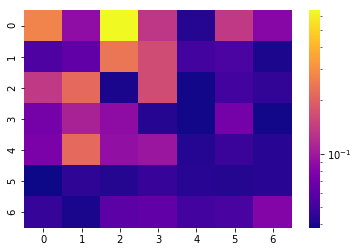

[[0.275 0.089 0.648 0.134 0.042 0.136 0.083]
 [0.055 0.063 0.247 0.165 0.051 0.054 0.041]
 [0.136 0.22  0.04  0.165 0.039 0.051 0.046]
 [0.073 0.11  0.088 0.042 0.039 0.073 0.039]
 [0.076 0.22  0.091 0.097 0.042 0.048 0.043]
 [0.038 0.045 0.042 0.047 0.043 0.042 0.043]
 [0.047 0.04  0.06  0.063 0.051 0.053 0.081]]


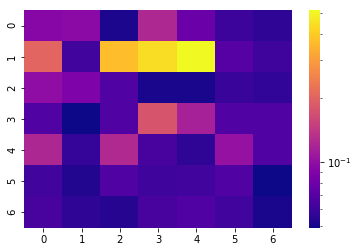

[[0.094 0.096 0.052 0.124 0.079 0.06  0.056]
 [0.203 0.062 0.37  0.439 0.516 0.07  0.061]
 [0.099 0.089 0.067 0.051 0.051 0.059 0.057]
 [0.067 0.049 0.067 0.178 0.116 0.067 0.067]
 [0.122 0.058 0.125 0.064 0.056 0.103 0.067]
 [0.062 0.053 0.067 0.061 0.062 0.067 0.049]
 [0.064 0.056 0.054 0.064 0.067 0.062 0.051]]


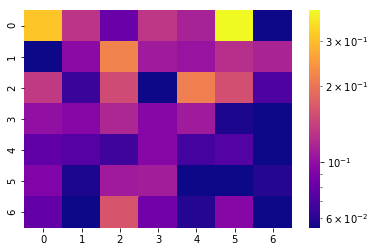

[[0.311 0.13  0.082 0.132 0.114 0.397 0.055]
 [0.055 0.097 0.219 0.109 0.104 0.126 0.116]
 [0.135 0.065 0.152 0.055 0.211 0.157 0.071]
 [0.101 0.094 0.119 0.094 0.109 0.058 0.055]
 [0.078 0.074 0.066 0.094 0.068 0.073 0.055]
 [0.091 0.058 0.109 0.111 0.055 0.055 0.059]
 [0.079 0.055 0.163 0.085 0.059 0.094 0.055]]
SKIPPPPPPEDDDD


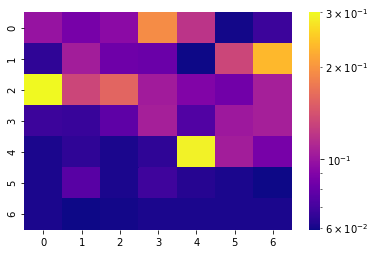

[[0.099 0.086 0.094 0.192 0.12  0.06  0.068]
 [0.065 0.105 0.083 0.082 0.059 0.133 0.234]
 [0.3   0.133 0.157 0.104 0.09  0.084 0.106]
 [0.068 0.067 0.078 0.106 0.074 0.102 0.106]
 [0.061 0.065 0.061 0.065 0.292 0.105 0.086]
 [0.061 0.076 0.061 0.069 0.063 0.061 0.059]
 [0.061 0.059 0.06  0.061 0.061 0.061 0.061]]


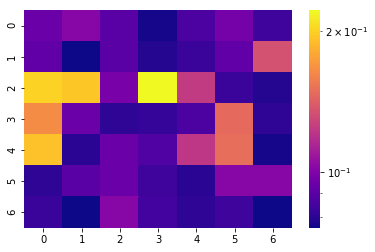

[[0.094 0.102 0.09  0.077 0.087 0.097 0.084]
 [0.092 0.076 0.09  0.079 0.083 0.092 0.134]
 [0.2   0.195 0.098 0.221 0.124 0.083 0.079]
 [0.165 0.094 0.081 0.082 0.087 0.147 0.081]
 [0.192 0.08  0.094 0.088 0.122 0.149 0.077]
 [0.081 0.09  0.094 0.084 0.08  0.102 0.102]
 [0.083 0.076 0.102 0.085 0.081 0.084 0.076]]


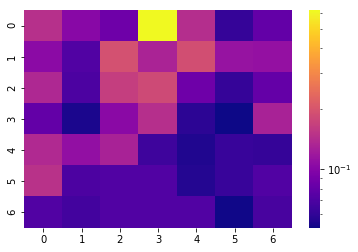

[[0.145 0.102 0.086 0.616 0.143 0.061 0.08 ]
 [0.104 0.072 0.193 0.131 0.188 0.113 0.111]
 [0.136 0.07  0.165 0.182 0.086 0.061 0.081]
 [0.08  0.054 0.103 0.144 0.058 0.051 0.129]
 [0.137 0.11  0.129 0.064 0.055 0.062 0.061]
 [0.148 0.07  0.072 0.072 0.056 0.062 0.072]
 [0.072 0.066 0.072 0.072 0.072 0.052 0.068]]


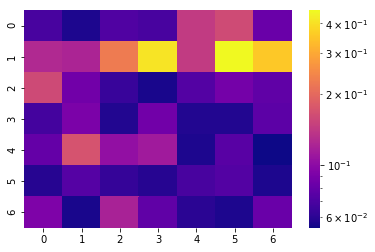

[[0.069 0.057 0.072 0.069 0.143 0.161 0.082]
 [0.126 0.121 0.227 0.409 0.144 0.454 0.356]
 [0.16  0.086 0.064 0.056 0.073 0.087 0.078]
 [0.068 0.091 0.058 0.086 0.058 0.058 0.077]
 [0.08  0.171 0.104 0.113 0.057 0.075 0.054]
 [0.059 0.074 0.063 0.059 0.069 0.073 0.057]
 [0.092 0.056 0.119 0.078 0.06  0.057 0.082]]


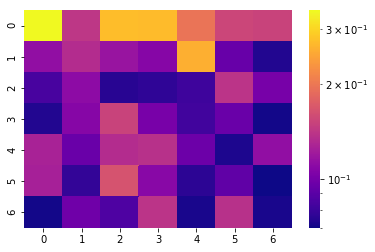

[[0.343 0.142 0.273 0.272 0.197 0.154 0.152]
 [0.113 0.134 0.117 0.108 0.258 0.095 0.074]
 [0.084 0.111 0.075 0.077 0.081 0.14  0.101]
 [0.074 0.108 0.152 0.102 0.082 0.096 0.071]
 [0.127 0.096 0.134 0.137 0.097 0.073 0.113]
 [0.125 0.078 0.165 0.109 0.076 0.092 0.07 ]
 [0.071 0.098 0.086 0.14  0.072 0.137 0.072]]
SKIPPPPPPEDDDD


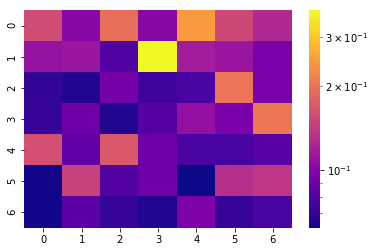

[[0.157 0.102 0.193 0.102 0.244 0.154 0.126]
 [0.11  0.112 0.079 0.373 0.116 0.111 0.095]
 [0.07  0.066 0.094 0.073 0.077 0.2   0.095]
 [0.071 0.091 0.066 0.081 0.108 0.096 0.203]
 [0.16  0.085 0.17  0.091 0.077 0.077 0.082]
 [0.063 0.148 0.08  0.091 0.062 0.131 0.137]
 [0.063 0.083 0.071 0.066 0.097 0.071 0.077]]


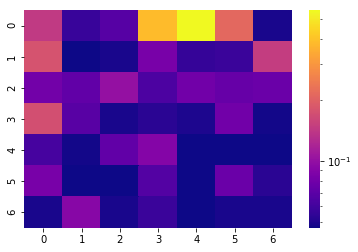

[[0.144 0.057 0.068 0.387 0.553 0.212 0.049]
 [0.179 0.047 0.049 0.084 0.056 0.058 0.149]
 [0.081 0.073 0.101 0.064 0.08  0.075 0.077]
 [0.173 0.069 0.049 0.053 0.05  0.08  0.048]
 [0.062 0.048 0.073 0.091 0.047 0.047 0.047]
 [0.084 0.047 0.047 0.067 0.047 0.077 0.053]
 [0.049 0.093 0.049 0.058 0.047 0.049 0.049]]


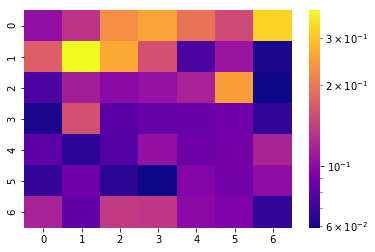

[[0.104 0.133 0.232 0.257 0.197 0.152 0.323]
 [0.174 0.379 0.263 0.158 0.074 0.108 0.062]
 [0.074 0.114 0.101 0.106 0.118 0.25  0.059]
 [0.062 0.158 0.079 0.084 0.084 0.088 0.067]
 [0.081 0.065 0.078 0.105 0.087 0.091 0.119]
 [0.068 0.088 0.065 0.059 0.097 0.09  0.103]
 [0.117 0.082 0.139 0.136 0.101 0.094 0.067]]


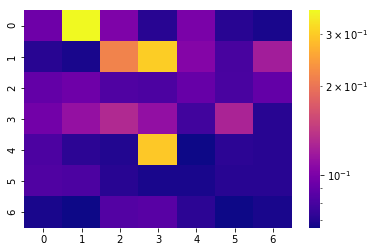

[[0.094 0.36  0.101 0.071 0.099 0.071 0.068]
 [0.071 0.068 0.215 0.302 0.104 0.08  0.12 ]
 [0.09  0.094 0.083 0.082 0.091 0.081 0.09 ]
 [0.096 0.112 0.129 0.111 0.078 0.125 0.071]
 [0.082 0.072 0.07  0.296 0.066 0.072 0.071]
 [0.083 0.082 0.071 0.068 0.068 0.071 0.071]
 [0.068 0.066 0.084 0.086 0.072 0.066 0.068]]


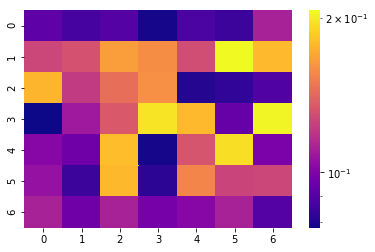

[[0.092 0.087 0.09  0.079 0.088 0.085 0.112]
 [0.127 0.132 0.166 0.159 0.13  0.207 0.179]
 [0.177 0.122 0.145 0.16  0.081 0.083 0.089]
 [0.078 0.109 0.135 0.197 0.179 0.094 0.205]
 [0.102 0.096 0.18  0.079 0.133 0.195 0.099]
 [0.106 0.085 0.178 0.082 0.155 0.126 0.127]
 [0.112 0.096 0.112 0.098 0.102 0.112 0.09 ]]


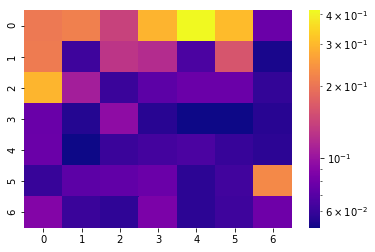

[[0.206 0.216 0.14  0.293 0.416 0.305 0.078]
 [0.21  0.062 0.128 0.12  0.066 0.161 0.053]
 [0.295 0.108 0.061 0.072 0.078 0.078 0.059]
 [0.077 0.055 0.095 0.056 0.051 0.051 0.056]
 [0.078 0.051 0.061 0.064 0.066 0.06  0.057]
 [0.06  0.072 0.074 0.078 0.057 0.063 0.229]
 [0.089 0.061 0.058 0.085 0.057 0.062 0.079]]


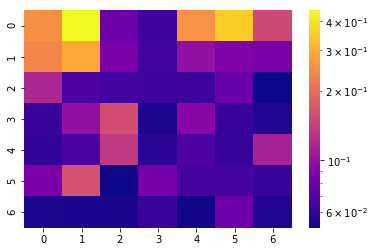

[[0.251 0.447 0.08  0.062 0.255 0.353 0.153]
 [0.235 0.292 0.086 0.064 0.099 0.088 0.086]
 [0.119 0.068 0.064 0.062 0.062 0.078 0.051]
 [0.061 0.099 0.159 0.054 0.092 0.061 0.055]
 [0.059 0.067 0.137 0.056 0.068 0.06  0.113]
 [0.086 0.164 0.051 0.084 0.065 0.065 0.06 ]
 [0.054 0.053 0.053 0.061 0.052 0.08  0.055]]


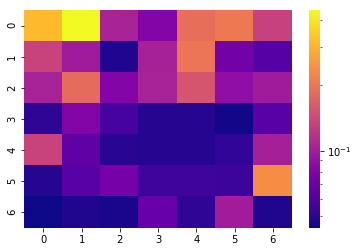

[[0.314 0.444 0.103 0.082 0.191 0.206 0.133]
 [0.136 0.098 0.047 0.102 0.199 0.073 0.062]
 [0.103 0.185 0.082 0.103 0.155 0.088 0.098]
 [0.05  0.08  0.057 0.048 0.048 0.045 0.063]
 [0.135 0.066 0.049 0.048 0.048 0.051 0.101]
 [0.048 0.063 0.075 0.055 0.055 0.054 0.238]
 [0.044 0.047 0.046 0.069 0.05  0.099 0.047]]


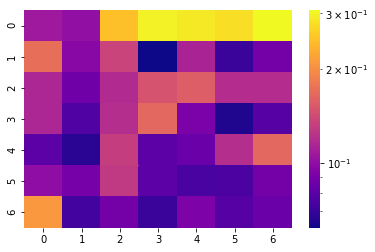

[[0.107 0.101 0.247 0.299 0.29  0.279 0.307]
 [0.171 0.097 0.136 0.062 0.113 0.071 0.089]
 [0.115 0.087 0.118 0.147 0.157 0.119 0.119]
 [0.115 0.077 0.12  0.165 0.091 0.065 0.079]
 [0.081 0.067 0.132 0.081 0.085 0.12  0.165]
 [0.1   0.09  0.128 0.081 0.075 0.076 0.089]
 [0.209 0.073 0.089 0.071 0.092 0.079 0.085]]


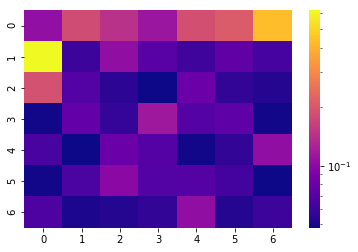

[[0.105 0.18  0.144 0.112 0.187 0.205 0.432]
 [0.622 0.06  0.104 0.071 0.061 0.075 0.064]
 [0.189 0.069 0.055 0.048 0.081 0.057 0.053]
 [0.049 0.077 0.058 0.114 0.07  0.074 0.049]
 [0.065 0.048 0.08  0.07  0.049 0.057 0.104]
 [0.049 0.066 0.099 0.069 0.07  0.063 0.048]
 [0.067 0.051 0.053 0.057 0.104 0.053 0.06 ]]


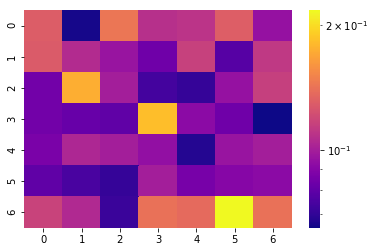

[[0.13  0.066 0.144 0.108 0.11  0.131 0.095]
 [0.129 0.106 0.096 0.084 0.116 0.078 0.112]
 [0.085 0.174 0.1   0.074 0.071 0.095 0.115]
 [0.085 0.082 0.08  0.184 0.092 0.084 0.065]
 [0.087 0.104 0.1   0.094 0.068 0.096 0.1  ]
 [0.08  0.075 0.071 0.1   0.086 0.09  0.092]
 [0.117 0.105 0.072 0.141 0.137 0.217 0.141]]


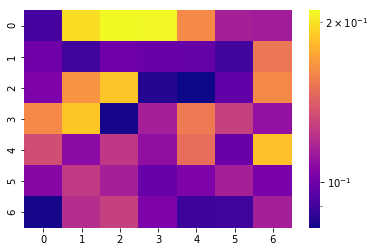

[[0.091 0.198 0.21  0.209 0.161 0.115 0.114]
 [0.1   0.09  0.1   0.099 0.098 0.09  0.153]
 [0.104 0.165 0.187 0.085 0.082 0.097 0.161]
 [0.161 0.188 0.083 0.115 0.154 0.128 0.11 ]
 [0.134 0.108 0.125 0.109 0.148 0.099 0.185]
 [0.106 0.126 0.115 0.099 0.104 0.115 0.103]
 [0.083 0.121 0.128 0.104 0.089 0.09  0.115]]


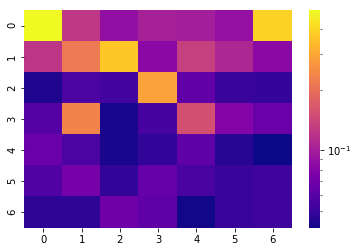

[[0.498 0.125 0.088 0.102 0.1   0.089 0.397]
 [0.123 0.219 0.373 0.083 0.134 0.108 0.083]
 [0.044 0.056 0.053 0.291 0.064 0.05  0.049]
 [0.059 0.237 0.043 0.054 0.153 0.079 0.067]
 [0.067 0.056 0.043 0.048 0.063 0.046 0.041]
 [0.058 0.073 0.048 0.066 0.055 0.05  0.052]
 [0.047 0.047 0.07  0.063 0.042 0.05  0.052]]


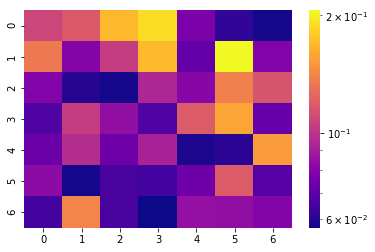

[[0.108 0.117 0.169 0.189 0.078 0.062 0.058]
 [0.134 0.08  0.104 0.169 0.072 0.206 0.079]
 [0.079 0.06  0.058 0.094 0.081 0.138 0.115]
 [0.068 0.104 0.084 0.068 0.119 0.158 0.073]
 [0.074 0.097 0.075 0.092 0.059 0.061 0.153]
 [0.083 0.058 0.066 0.065 0.075 0.119 0.069]
 [0.065 0.141 0.066 0.057 0.085 0.084 0.08 ]]


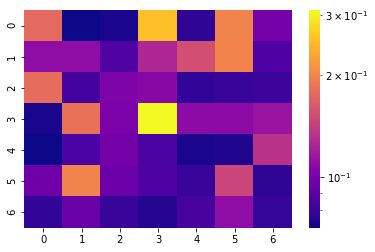

[[0.175 0.071 0.073 0.254 0.077 0.198 0.099]
 [0.11  0.11  0.087 0.125 0.155 0.199 0.086]
 [0.179 0.083 0.103 0.107 0.078 0.08  0.081]
 [0.073 0.183 0.101 0.309 0.109 0.108 0.114]
 [0.071 0.085 0.099 0.085 0.073 0.074 0.133]
 [0.097 0.198 0.096 0.086 0.08  0.147 0.077]
 [0.078 0.095 0.08  0.075 0.084 0.11  0.079]]


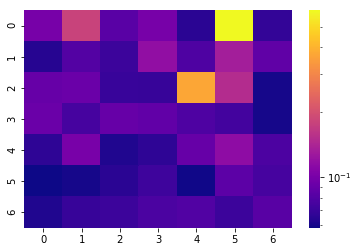

[[0.1   0.18  0.084 0.1   0.065 0.595 0.068]
 [0.064 0.081 0.071 0.117 0.079 0.133 0.087]
 [0.09  0.093 0.07  0.069 0.372 0.15  0.06 ]
 [0.093 0.075 0.09  0.088 0.079 0.074 0.06 ]
 [0.066 0.101 0.062 0.066 0.09  0.115 0.078]
 [0.058 0.06  0.065 0.072 0.059 0.085 0.075]
 [0.062 0.069 0.071 0.077 0.08  0.071 0.083]]


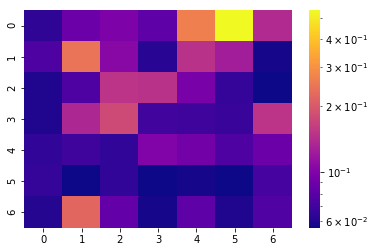

[[0.064 0.089 0.098 0.082 0.264 0.539 0.139]
 [0.075 0.244 0.105 0.062 0.148 0.125 0.058]
 [0.06  0.075 0.15  0.148 0.096 0.066 0.056]
 [0.06  0.135 0.177 0.07  0.069 0.067 0.15 ]
 [0.065 0.069 0.065 0.1   0.092 0.075 0.089]
 [0.066 0.056 0.065 0.056 0.058 0.056 0.072]
 [0.061 0.221 0.085 0.058 0.082 0.06  0.076]]
SKIPPPPPPEDDDD


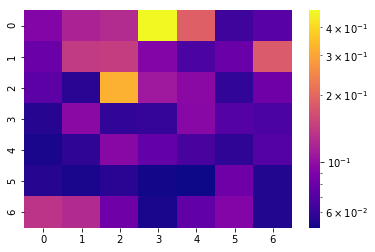

[[0.092 0.118 0.126 0.476 0.188 0.063 0.072]
 [0.08  0.142 0.145 0.092 0.067 0.08  0.182]
 [0.074 0.057 0.322 0.109 0.096 0.059 0.082]
 [0.056 0.096 0.059 0.06  0.095 0.071 0.067]
 [0.053 0.058 0.095 0.077 0.066 0.058 0.071]
 [0.056 0.053 0.057 0.052 0.051 0.082 0.055]
 [0.135 0.125 0.082 0.053 0.076 0.092 0.055]]


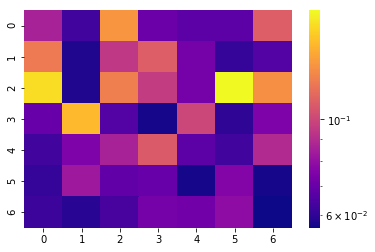

[[0.086 0.063 0.134 0.071 0.068 0.068 0.11 ]
 [0.122 0.058 0.094 0.11  0.073 0.061 0.066]
 [0.165 0.058 0.124 0.096 0.073 0.179 0.131]
 [0.07  0.15  0.066 0.057 0.1   0.06  0.075]
 [0.063 0.075 0.086 0.108 0.068 0.063 0.089]
 [0.061 0.083 0.069 0.07  0.057 0.076 0.057]
 [0.062 0.059 0.064 0.073 0.072 0.079 0.056]]


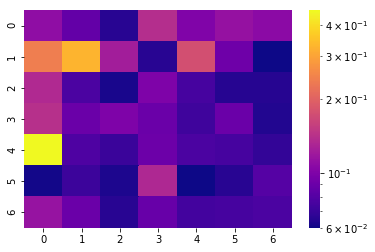

[[0.11  0.087 0.066 0.139 0.101 0.114 0.108]
 [0.241 0.328 0.123 0.066 0.176 0.092 0.06 ]
 [0.134 0.077 0.062 0.1   0.075 0.065 0.065]
 [0.141 0.09  0.1   0.09  0.073 0.09  0.064]
 [0.459 0.078 0.071 0.091 0.077 0.075 0.069]
 [0.061 0.072 0.063 0.133 0.06  0.066 0.081]
 [0.115 0.09  0.066 0.089 0.074 0.075 0.077]]


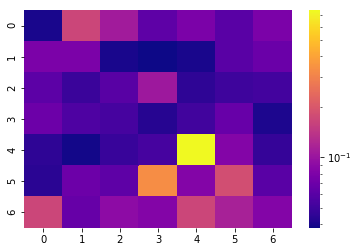

[[0.04  0.167 0.108 0.063 0.079 0.061 0.079]
 [0.079 0.079 0.04  0.038 0.04  0.061 0.069]
 [0.062 0.049 0.06  0.104 0.045 0.05  0.052]
 [0.07  0.056 0.053 0.043 0.051 0.068 0.041]
 [0.045 0.039 0.048 0.053 0.75  0.083 0.047]
 [0.044 0.07  0.063 0.332 0.083 0.183 0.061]
 [0.167 0.067 0.091 0.083 0.167 0.114 0.083]]


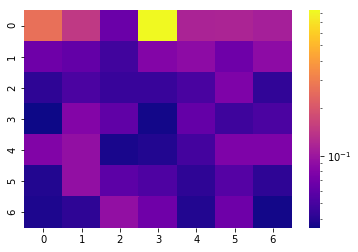

[[0.266 0.146 0.066 0.831 0.116 0.117 0.11 ]
 [0.068 0.062 0.048 0.081 0.088 0.068 0.088]
 [0.042 0.052 0.045 0.045 0.051 0.078 0.043]
 [0.035 0.081 0.061 0.036 0.063 0.047 0.052]
 [0.08  0.092 0.037 0.039 0.049 0.078 0.078]
 [0.039 0.092 0.059 0.053 0.042 0.056 0.042]
 [0.038 0.042 0.092 0.069 0.039 0.068 0.036]]


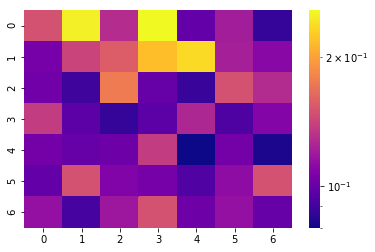

[[0.149 0.251 0.129 0.257 0.099 0.121 0.087]
 [0.105 0.142 0.157 0.219 0.236 0.122 0.111]
 [0.103 0.089 0.176 0.1   0.088 0.149 0.128]
 [0.137 0.097 0.087 0.097 0.126 0.093 0.109]
 [0.104 0.1   0.102 0.137 0.08  0.104 0.082]
 [0.099 0.149 0.108 0.105 0.094 0.113 0.149]
 [0.115 0.091 0.118 0.149 0.102 0.115 0.1  ]]


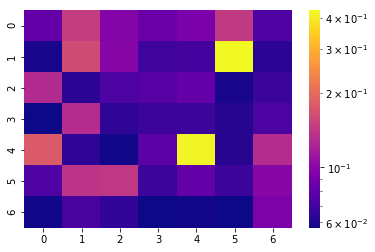

[[0.083 0.148 0.097 0.086 0.093 0.143 0.074]
 [0.059 0.161 0.099 0.069 0.071 0.43  0.063]
 [0.128 0.063 0.073 0.077 0.083 0.059 0.068]
 [0.057 0.13  0.064 0.068 0.068 0.062 0.073]
 [0.179 0.064 0.058 0.08  0.42  0.062 0.13 ]
 [0.074 0.137 0.141 0.068 0.082 0.068 0.099]
 [0.058 0.072 0.065 0.057 0.058 0.057 0.094]]


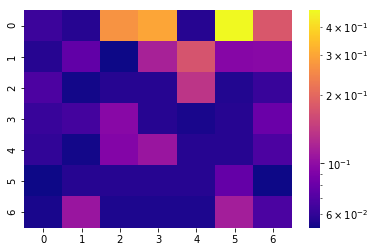

[[0.063 0.057 0.268 0.301 0.057 0.472 0.177]
 [0.057 0.077 0.052 0.117 0.173 0.095 0.096]
 [0.069 0.053 0.057 0.057 0.137 0.056 0.062]
 [0.062 0.066 0.096 0.057 0.054 0.057 0.081]
 [0.06  0.053 0.093 0.107 0.057 0.057 0.069]
 [0.052 0.057 0.057 0.057 0.057 0.078 0.052]
 [0.054 0.107 0.055 0.055 0.055 0.114 0.068]]


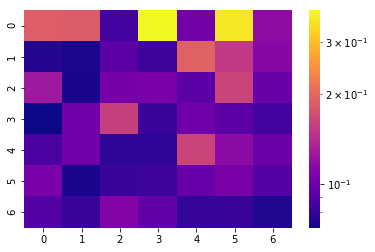

[[0.189 0.185 0.085 0.382 0.103 0.354 0.117]
 [0.076 0.074 0.093 0.083 0.192 0.152 0.113]
 [0.126 0.073 0.105 0.107 0.094 0.162 0.099]
 [0.071 0.102 0.158 0.082 0.102 0.094 0.085]
 [0.088 0.102 0.078 0.078 0.162 0.116 0.1  ]
 [0.107 0.073 0.082 0.083 0.098 0.106 0.091]
 [0.091 0.081 0.111 0.097 0.08  0.081 0.075]]


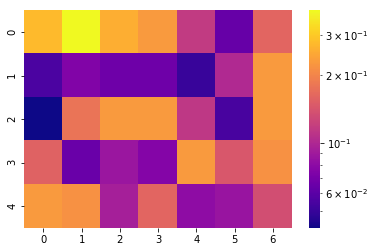

[[0.277 0.386 0.257 0.228 0.116 0.064 0.16 ]
 [0.055 0.075 0.067 0.067 0.05  0.101 0.228]
 [0.042 0.177 0.228 0.228 0.113 0.054 0.228]
 [0.156 0.065 0.087 0.076 0.228 0.144 0.217]
 [0.228 0.217 0.094 0.16  0.081 0.086 0.135]]


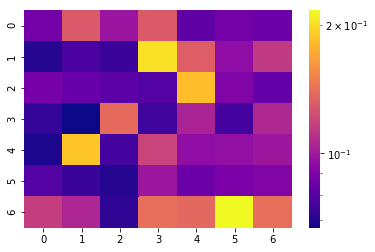

[[0.087 0.13  0.098 0.13  0.082 0.087 0.085]
 [0.07  0.077 0.074 0.202 0.132 0.095 0.114]
 [0.088 0.084 0.081 0.079 0.183 0.091 0.083]
 [0.073 0.067 0.138 0.075 0.104 0.076 0.106]
 [0.069 0.187 0.076 0.119 0.095 0.096 0.099]
 [0.079 0.074 0.07  0.099 0.085 0.089 0.091]
 [0.116 0.105 0.072 0.14  0.137 0.216 0.14 ]]


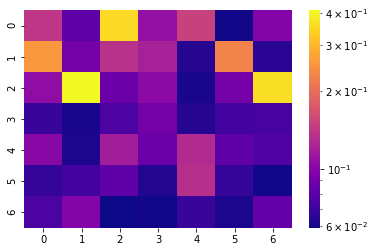

[[0.139 0.082 0.356 0.108 0.15  0.06  0.098]
 [0.256 0.091 0.135 0.12  0.064 0.229 0.065]
 [0.105 0.409 0.088 0.103 0.061 0.091 0.363]
 [0.069 0.061 0.075 0.091 0.064 0.072 0.073]
 [0.101 0.062 0.117 0.087 0.128 0.082 0.077]
 [0.068 0.072 0.082 0.063 0.133 0.068 0.06 ]
 [0.075 0.099 0.059 0.06  0.069 0.062 0.084]]


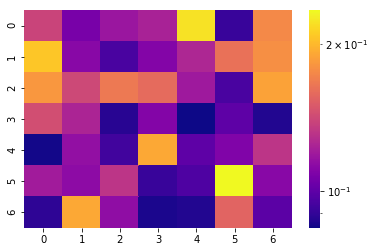

[[0.139 0.107 0.118 0.123 0.222 0.091 0.175]
 [0.207 0.112 0.095 0.11  0.125 0.162 0.178]
 [0.182 0.141 0.166 0.159 0.119 0.095 0.188]
 [0.144 0.124 0.088 0.11  0.084 0.1   0.087]
 [0.085 0.115 0.093 0.191 0.1   0.109 0.132]
 [0.12  0.113 0.132 0.091 0.096 0.234 0.112]
 [0.089 0.191 0.114 0.086 0.087 0.155 0.099]]
SKIPPPPPPEDDDD


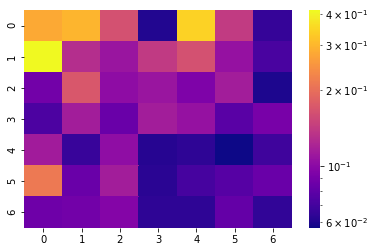

[[0.281 0.3   0.164 0.061 0.344 0.141 0.066]
 [0.412 0.129 0.109 0.14  0.164 0.106 0.072]
 [0.088 0.171 0.102 0.109 0.094 0.115 0.06 ]
 [0.073 0.115 0.084 0.115 0.106 0.078 0.091]
 [0.114 0.067 0.103 0.062 0.064 0.057 0.069]
 [0.212 0.084 0.115 0.063 0.071 0.077 0.084]
 [0.086 0.088 0.097 0.064 0.064 0.082 0.065]]


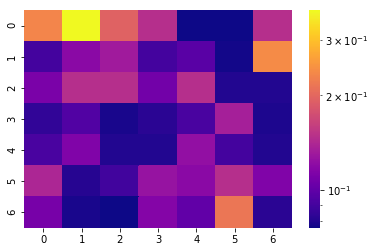

[[0.233 0.372 0.194 0.147 0.076 0.076 0.147]
 [0.09  0.119 0.132 0.09  0.098 0.077 0.238]
 [0.111 0.147 0.147 0.108 0.147 0.08  0.08 ]
 [0.084 0.095 0.078 0.082 0.092 0.135 0.079]
 [0.092 0.114 0.08  0.08  0.124 0.09  0.08 ]
 [0.14  0.081 0.089 0.126 0.119 0.147 0.114]
 [0.11  0.078 0.076 0.116 0.101 0.216 0.082]]


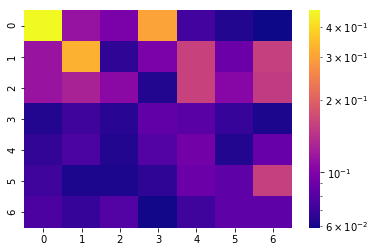

[[0.468 0.114 0.098 0.302 0.073 0.063 0.059]
 [0.115 0.326 0.067 0.098 0.16  0.09  0.158]
 [0.115 0.128 0.106 0.063 0.16  0.104 0.153]
 [0.063 0.072 0.065 0.085 0.082 0.069 0.062]
 [0.068 0.076 0.063 0.079 0.093 0.063 0.088]
 [0.072 0.062 0.062 0.067 0.09  0.084 0.158]
 [0.077 0.069 0.079 0.06  0.072 0.084 0.084]]


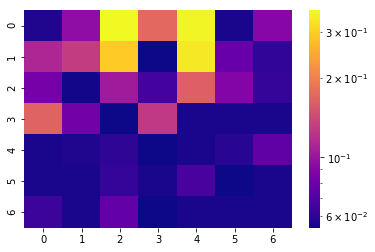

[[0.057 0.095 0.361 0.172 0.355 0.056 0.091]
 [0.112 0.13  0.292 0.054 0.337 0.078 0.061]
 [0.084 0.055 0.104 0.066 0.164 0.09  0.062]
 [0.167 0.082 0.054 0.127 0.056 0.056 0.056]
 [0.056 0.057 0.06  0.054 0.056 0.059 0.075]
 [0.056 0.056 0.062 0.056 0.067 0.054 0.056]
 [0.064 0.056 0.076 0.054 0.056 0.056 0.056]]


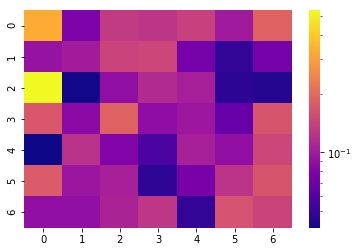

[[0.329 0.078 0.133 0.127 0.14  0.1   0.187]
 [0.093 0.101 0.144 0.147 0.074 0.049 0.074]
 [0.535 0.042 0.089 0.115 0.104 0.047 0.045]
 [0.172 0.085 0.187 0.088 0.097 0.067 0.168]
 [0.041 0.123 0.079 0.056 0.105 0.09  0.148]
 [0.177 0.096 0.105 0.048 0.075 0.125 0.168]
 [0.09  0.09  0.108 0.128 0.049 0.164 0.144]]


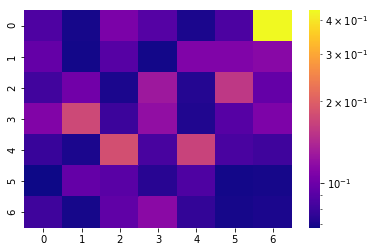

[[0.087 0.07  0.107 0.089 0.071 0.086 0.435]
 [0.096 0.069 0.09  0.069 0.109 0.109 0.114]
 [0.082 0.102 0.071 0.127 0.073 0.156 0.096]
 [0.11  0.174 0.08  0.119 0.072 0.09  0.108]
 [0.079 0.071 0.182 0.084 0.168 0.085 0.081]
 [0.068 0.096 0.091 0.074 0.087 0.069 0.07 ]
 [0.081 0.07  0.094 0.115 0.077 0.07  0.071]]


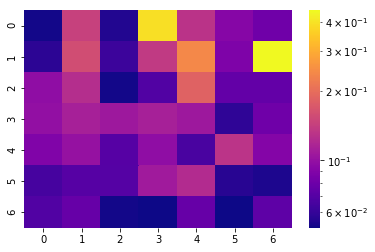

[[0.052 0.144 0.055 0.395 0.13  0.092 0.081]
 [0.057 0.159 0.062 0.137 0.241 0.088 0.449]
 [0.098 0.125 0.052 0.069 0.185 0.076 0.076]
 [0.099 0.113 0.106 0.113 0.106 0.058 0.081]
 [0.089 0.101 0.071 0.098 0.066 0.131 0.091]
 [0.065 0.071 0.07  0.108 0.123 0.056 0.054]
 [0.069 0.077 0.052 0.051 0.077 0.051 0.074]]


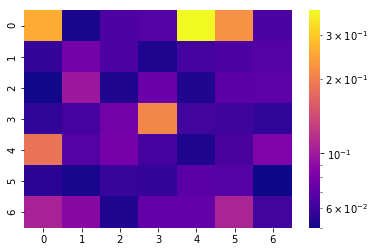

[[0.258 0.052 0.065 0.067 0.378 0.223 0.064]
 [0.058 0.079 0.065 0.053 0.062 0.065 0.067]
 [0.051 0.098 0.053 0.075 0.053 0.069 0.07 ]
 [0.057 0.062 0.078 0.21  0.061 0.06  0.057]
 [0.186 0.067 0.08  0.062 0.053 0.063 0.083]
 [0.055 0.052 0.059 0.058 0.069 0.067 0.05 ]
 [0.106 0.088 0.053 0.072 0.072 0.108 0.061]]


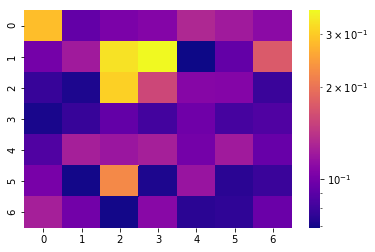

[[0.285 0.093 0.103 0.107 0.132 0.122 0.111]
 [0.1   0.122 0.329 0.358 0.069 0.093 0.175]
 [0.078 0.072 0.306 0.158 0.108 0.107 0.079]
 [0.071 0.078 0.093 0.082 0.098 0.083 0.086]
 [0.086 0.125 0.119 0.125 0.1   0.122 0.095]
 [0.102 0.07  0.224 0.072 0.117 0.075 0.079]
 [0.125 0.099 0.07  0.109 0.075 0.076 0.096]]


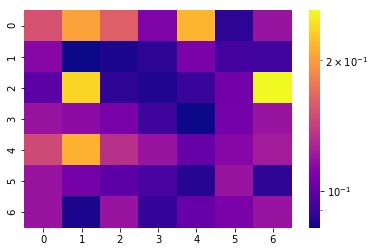

[[0.153 0.203 0.161 0.11  0.215 0.087 0.119]
 [0.113 0.082 0.084 0.087 0.109 0.093 0.092]
 [0.099 0.237 0.088 0.085 0.09  0.106 0.261]
 [0.119 0.115 0.108 0.091 0.082 0.107 0.119]
 [0.148 0.213 0.134 0.119 0.102 0.113 0.123]
 [0.119 0.107 0.099 0.094 0.086 0.119 0.088]
 [0.119 0.084 0.119 0.089 0.102 0.109 0.119]]


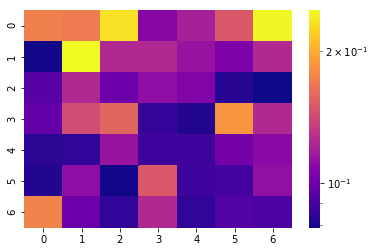

[[0.173 0.17  0.232 0.108 0.12  0.15  0.245]
 [0.08  0.247 0.124 0.124 0.114 0.105 0.124]
 [0.094 0.124 0.1   0.111 0.106 0.083 0.079]
 [0.097 0.143 0.158 0.086 0.082 0.186 0.124]
 [0.084 0.085 0.114 0.088 0.088 0.102 0.109]
 [0.082 0.111 0.08  0.15  0.088 0.089 0.112]
 [0.175 0.1   0.085 0.124 0.085 0.093 0.091]]


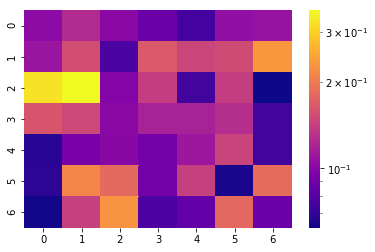

[[0.103 0.125 0.102 0.088 0.075 0.106 0.108]
 [0.11  0.155 0.077 0.166 0.147 0.152 0.233]
 [0.325 0.356 0.098 0.14  0.074 0.14  0.062]
 [0.162 0.15  0.102 0.118 0.118 0.127 0.074]
 [0.067 0.094 0.101 0.092 0.111 0.146 0.074]
 [0.068 0.212 0.182 0.092 0.142 0.064 0.184]
 [0.063 0.142 0.229 0.078 0.085 0.18  0.089]]


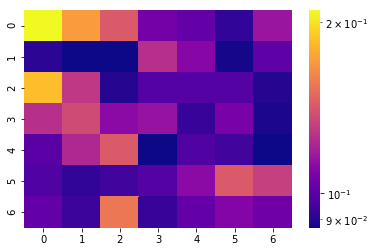

[[0.21  0.171 0.143 0.106 0.102 0.092 0.116]
 [0.091 0.087 0.087 0.126 0.111 0.088 0.101]
 [0.185 0.129 0.09  0.099 0.099 0.099 0.09 ]
 [0.126 0.137 0.112 0.115 0.093 0.107 0.089]
 [0.1   0.123 0.143 0.087 0.098 0.095 0.087]
 [0.098 0.092 0.095 0.099 0.112 0.143 0.132]
 [0.102 0.094 0.156 0.093 0.102 0.11  0.105]]


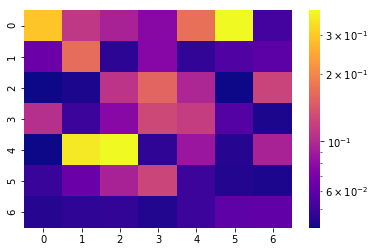

[[0.294 0.112 0.095 0.077 0.172 0.383 0.052]
 [0.065 0.167 0.046 0.076 0.048 0.056 0.059]
 [0.041 0.043 0.109 0.159 0.097 0.041 0.123]
 [0.104 0.05  0.077 0.127 0.117 0.057 0.043]
 [0.041 0.354 0.386 0.047 0.086 0.045 0.095]
 [0.049 0.064 0.095 0.124 0.05  0.044 0.043]
 [0.045 0.047 0.048 0.044 0.05  0.06  0.061]]


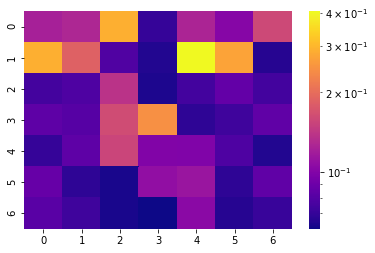

[[0.122 0.127 0.29  0.07  0.125 0.102 0.159]
 [0.289 0.185 0.079 0.065 0.405 0.272 0.066]
 [0.075 0.078 0.138 0.064 0.074 0.086 0.074]
 [0.084 0.081 0.163 0.245 0.068 0.073 0.085]
 [0.07  0.084 0.156 0.1   0.099 0.078 0.065]
 [0.087 0.068 0.063 0.108 0.113 0.068 0.085]
 [0.082 0.073 0.063 0.061 0.104 0.066 0.071]]


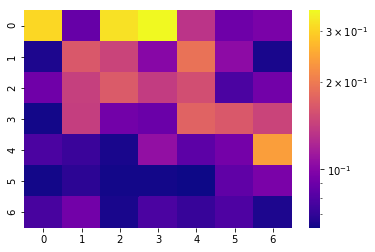

[[0.307 0.087 0.32  0.352 0.133 0.09  0.095]
 [0.066 0.165 0.146 0.101 0.191 0.104 0.065]
 [0.091 0.143 0.168 0.14  0.156 0.078 0.092]
 [0.064 0.142 0.092 0.089 0.175 0.165 0.146]
 [0.078 0.073 0.065 0.107 0.084 0.093 0.239]
 [0.064 0.069 0.064 0.064 0.063 0.085 0.095]
 [0.077 0.092 0.065 0.078 0.072 0.079 0.066]]


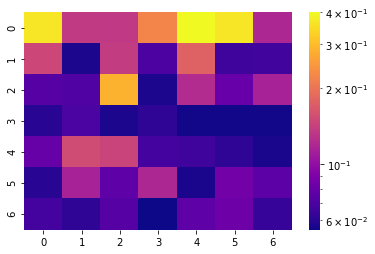

[[0.366 0.136 0.135 0.222 0.4   0.367 0.119]
 [0.149 0.058 0.138 0.071 0.177 0.066 0.067]
 [0.074 0.072 0.285 0.058 0.123 0.081 0.114]
 [0.06  0.07  0.058 0.062 0.056 0.056 0.056]
 [0.08  0.153 0.145 0.068 0.066 0.062 0.057]
 [0.06  0.114 0.077 0.119 0.057 0.085 0.076]
 [0.068 0.062 0.074 0.055 0.077 0.083 0.064]]


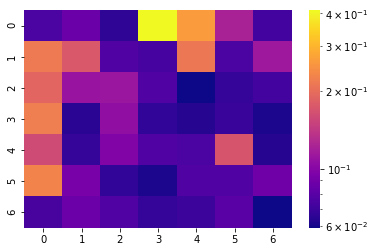

[[0.075 0.087 0.066 0.411 0.261 0.122 0.072]
 [0.217 0.175 0.077 0.073 0.214 0.075 0.114]
 [0.19  0.11  0.112 0.077 0.059 0.068 0.072]
 [0.222 0.065 0.106 0.067 0.064 0.069 0.062]
 [0.16  0.068 0.098 0.077 0.075 0.171 0.064]
 [0.23  0.093 0.067 0.062 0.077 0.077 0.089]
 [0.074 0.088 0.077 0.068 0.07  0.08  0.059]]


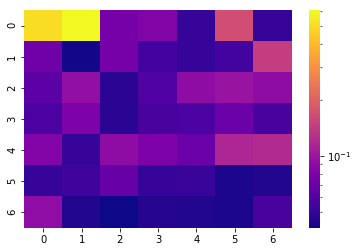

[[0.51  0.607 0.077 0.083 0.05  0.167 0.05 ]
 [0.073 0.042 0.077 0.055 0.05  0.054 0.144]
 [0.064 0.094 0.047 0.059 0.091 0.098 0.091]
 [0.058 0.08  0.047 0.056 0.057 0.07  0.056]
 [0.084 0.05  0.091 0.08  0.07  0.116 0.121]
 [0.05  0.053 0.068 0.05  0.051 0.044 0.045]
 [0.092 0.045 0.041 0.046 0.045 0.044 0.056]]


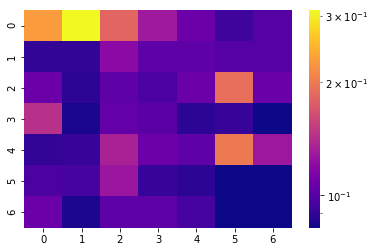

[[0.228 0.311 0.183 0.129 0.108 0.093 0.1  ]
 [0.09  0.09  0.12  0.103 0.103 0.1   0.1  ]
 [0.108 0.088 0.103 0.097 0.108 0.19  0.107]
 [0.144 0.084 0.105 0.101 0.088 0.091 0.082]
 [0.09  0.091 0.135 0.108 0.103 0.199 0.128]
 [0.097 0.095 0.127 0.091 0.088 0.082 0.082]
 [0.108 0.085 0.103 0.103 0.095 0.082 0.082]]


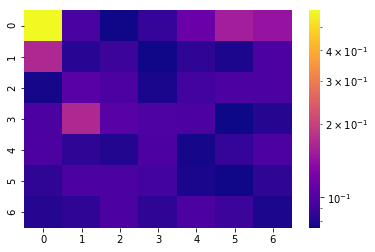

[[0.583 0.096 0.076 0.087 0.112 0.156 0.144]
 [0.168 0.082 0.09  0.076 0.085 0.079 0.097]
 [0.077 0.103 0.097 0.078 0.093 0.097 0.097]
 [0.097 0.168 0.103 0.098 0.097 0.075 0.081]
 [0.097 0.085 0.08  0.097 0.077 0.087 0.097]
 [0.085 0.097 0.097 0.093 0.078 0.076 0.084]
 [0.081 0.084 0.097 0.085 0.097 0.09  0.079]]


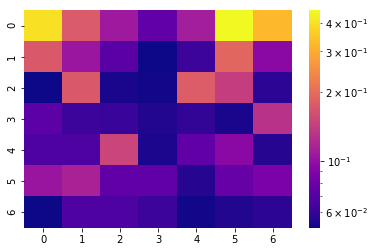

[[0.399 0.176 0.108 0.075 0.111 0.453 0.323]
 [0.174 0.105 0.072 0.051 0.062 0.193 0.095]
 [0.051 0.174 0.053 0.052 0.179 0.143 0.057]
 [0.073 0.062 0.061 0.055 0.059 0.053 0.13 ]
 [0.068 0.068 0.15  0.054 0.075 0.095 0.056]
 [0.104 0.115 0.075 0.075 0.056 0.077 0.087]
 [0.051 0.068 0.068 0.062 0.052 0.055 0.057]]


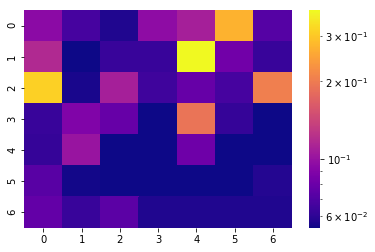

[[0.094 0.067 0.057 0.096 0.109 0.272 0.072]
 [0.117 0.054 0.063 0.063 0.377 0.082 0.063]
 [0.312 0.056 0.109 0.065 0.078 0.067 0.204]
 [0.063 0.089 0.078 0.054 0.191 0.062 0.054]
 [0.062 0.101 0.054 0.054 0.081 0.054 0.054]
 [0.073 0.055 0.054 0.054 0.054 0.054 0.058]
 [0.077 0.063 0.074 0.057 0.057 0.057 0.057]]


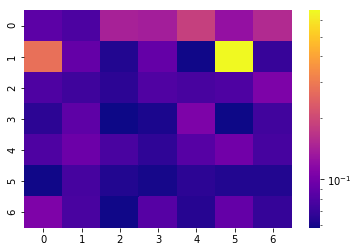

[[0.087 0.079 0.143 0.139 0.185 0.124 0.154]
 [0.277 0.091 0.063 0.091 0.059 0.672 0.07 ]
 [0.08  0.073 0.066 0.081 0.077 0.08  0.106]
 [0.066 0.088 0.058 0.061 0.106 0.058 0.074]
 [0.08  0.096 0.078 0.067 0.084 0.099 0.076]
 [0.059 0.076 0.063 0.06  0.066 0.063 0.063]
 [0.108 0.078 0.059 0.084 0.064 0.091 0.069]]


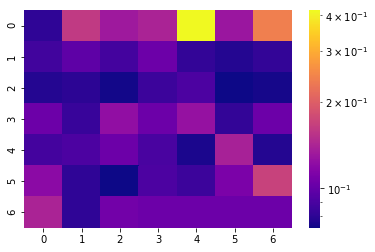

[[0.081 0.161 0.132 0.141 0.416 0.13  0.241]
 [0.087 0.098 0.088 0.104 0.082 0.078 0.082]
 [0.078 0.08  0.074 0.085 0.091 0.073 0.075]
 [0.104 0.084 0.124 0.104 0.126 0.082 0.104]
 [0.088 0.091 0.104 0.09  0.076 0.139 0.078]
 [0.12  0.081 0.073 0.091 0.085 0.112 0.169]
 [0.141 0.081 0.107 0.104 0.104 0.104 0.104]]


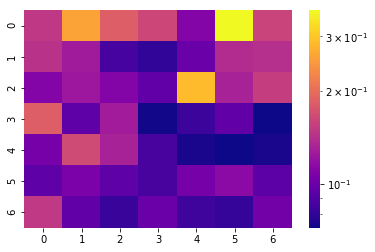

[[0.149 0.259 0.184 0.162 0.111 0.364 0.159]
 [0.144 0.126 0.086 0.08  0.1   0.139 0.141]
 [0.111 0.124 0.111 0.096 0.287 0.131 0.154]
 [0.184 0.095 0.127 0.073 0.083 0.096 0.072]
 [0.105 0.166 0.131 0.087 0.074 0.072 0.074]
 [0.095 0.107 0.095 0.087 0.105 0.115 0.094]
 [0.15  0.096 0.082 0.099 0.084 0.081 0.103]]
SKIPPPPPPEDDDD


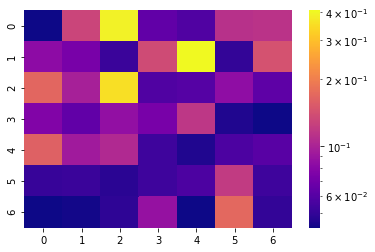

[[0.043 0.131 0.391 0.064 0.058 0.112 0.114]
 [0.083 0.073 0.052 0.137 0.408 0.05  0.144]
 [0.168 0.098 0.355 0.058 0.06  0.084 0.063]
 [0.077 0.064 0.086 0.073 0.117 0.046 0.043]
 [0.162 0.094 0.105 0.053 0.046 0.057 0.061]
 [0.051 0.052 0.048 0.053 0.057 0.121 0.053]
 [0.043 0.044 0.049 0.087 0.043 0.17  0.05 ]]


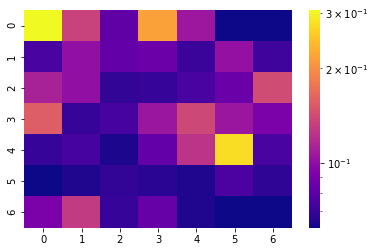

[[0.306 0.135 0.082 0.217 0.106 0.062 0.062]
 [0.075 0.101 0.083 0.086 0.071 0.102 0.072]
 [0.112 0.101 0.069 0.07  0.075 0.085 0.142]
 [0.157 0.07  0.074 0.105 0.139 0.105 0.091]
 [0.07  0.074 0.064 0.083 0.124 0.274 0.075]
 [0.062 0.065 0.069 0.067 0.065 0.076 0.068]
 [0.091 0.129 0.07  0.084 0.065 0.062 0.062]]


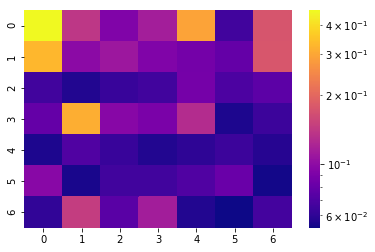

[[0.464 0.139 0.092 0.115 0.294 0.066 0.174]
 [0.33  0.099 0.109 0.092 0.086 0.079 0.176]
 [0.066 0.057 0.063 0.066 0.087 0.07  0.076]
 [0.079 0.313 0.096 0.089 0.129 0.056 0.064]
 [0.056 0.071 0.063 0.057 0.06  0.064 0.058]
 [0.097 0.055 0.066 0.066 0.071 0.081 0.054]
 [0.061 0.146 0.075 0.114 0.057 0.053 0.067]]


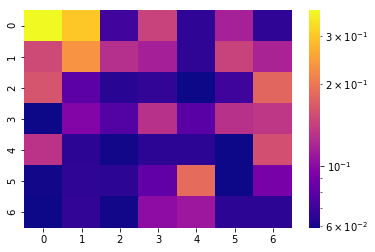

[[0.373 0.301 0.071 0.145 0.066 0.116 0.066]
 [0.151 0.233 0.127 0.115 0.066 0.145 0.118]
 [0.161 0.08  0.064 0.067 0.059 0.07  0.181]
 [0.059 0.096 0.077 0.129 0.079 0.129 0.134]
 [0.131 0.065 0.06  0.065 0.065 0.059 0.157]
 [0.06  0.066 0.065 0.082 0.186 0.059 0.091]
 [0.059 0.067 0.06  0.102 0.109 0.065 0.065]]


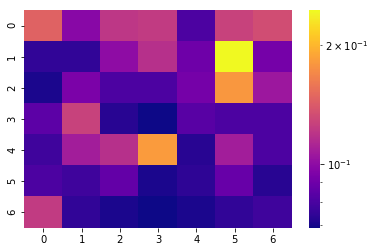

[[0.146 0.098 0.121 0.123 0.081 0.127 0.133]
 [0.075 0.075 0.1   0.117 0.09  0.244 0.092]
 [0.071 0.094 0.081 0.081 0.092 0.179 0.105]
 [0.085 0.127 0.073 0.069 0.084 0.081 0.081]
 [0.078 0.108 0.117 0.182 0.073 0.108 0.081]
 [0.081 0.078 0.087 0.071 0.074 0.088 0.073]
 [0.123 0.075 0.071 0.069 0.071 0.075 0.078]]


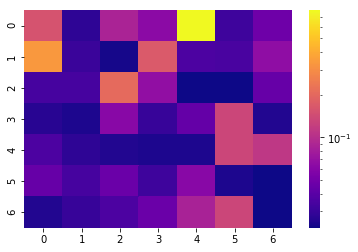

[[0.156 0.028 0.087 0.063 0.786 0.032 0.048]
 [0.336 0.031 0.024 0.168 0.036 0.035 0.066]
 [0.034 0.034 0.206 0.067 0.023 0.023 0.045]
 [0.027 0.025 0.062 0.03  0.044 0.133 0.026]
 [0.036 0.028 0.026 0.025 0.025 0.134 0.112]
 [0.045 0.034 0.047 0.032 0.062 0.025 0.023]
 [0.026 0.03  0.036 0.047 0.086 0.134 0.023]]


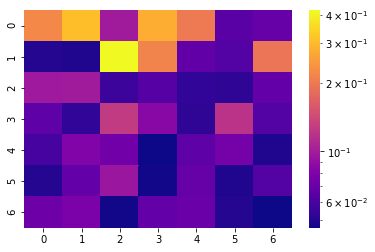

[[0.221 0.307 0.099 0.279 0.201 0.065 0.07 ]
 [0.05  0.049 0.418 0.214 0.068 0.063 0.195]
 [0.098 0.099 0.056 0.064 0.053 0.052 0.069]
 [0.067 0.053 0.127 0.085 0.052 0.119 0.063]
 [0.059 0.081 0.074 0.046 0.067 0.076 0.049]
 [0.05  0.069 0.095 0.047 0.07  0.049 0.063]
 [0.073 0.079 0.047 0.069 0.072 0.05  0.046]]


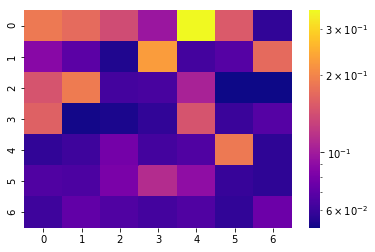

[[0.186 0.171 0.139 0.097 0.355 0.152 0.058]
 [0.088 0.07  0.054 0.228 0.063 0.068 0.169]
 [0.147 0.189 0.063 0.064 0.105 0.051 0.051]
 [0.16  0.052 0.053 0.058 0.147 0.06  0.068]
 [0.058 0.061 0.079 0.063 0.066 0.185 0.057]
 [0.066 0.065 0.081 0.113 0.091 0.059 0.057]
 [0.061 0.072 0.066 0.063 0.066 0.058 0.076]]


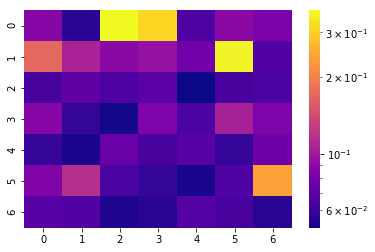

[[0.088 0.056 0.366 0.313 0.066 0.089 0.082]
 [0.17  0.106 0.089 0.095 0.078 0.356 0.067]
 [0.064 0.072 0.066 0.071 0.051 0.064 0.065]
 [0.087 0.059 0.052 0.084 0.065 0.105 0.084]
 [0.059 0.053 0.076 0.064 0.069 0.059 0.077]
 [0.085 0.116 0.065 0.059 0.053 0.066 0.241]
 [0.069 0.067 0.054 0.056 0.068 0.064 0.056]]


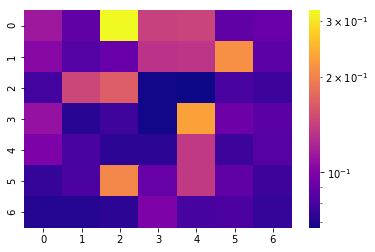

[[0.114 0.088 0.323 0.142 0.145 0.088 0.091]
 [0.104 0.084 0.091 0.132 0.134 0.213 0.087]
 [0.079 0.147 0.167 0.068 0.067 0.081 0.077]
 [0.11  0.072 0.078 0.068 0.23  0.093 0.086]
 [0.099 0.081 0.073 0.073 0.136 0.077 0.085]
 [0.075 0.082 0.204 0.09  0.137 0.088 0.077]
 [0.071 0.071 0.073 0.099 0.08  0.082 0.075]]


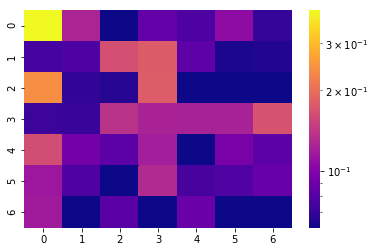

[[0.399 0.125 0.061 0.086 0.078 0.106 0.07 ]
 [0.075 0.078 0.165 0.179 0.084 0.064 0.065]
 [0.241 0.069 0.066 0.18  0.061 0.061 0.061]
 [0.072 0.071 0.136 0.123 0.122 0.122 0.169]
 [0.162 0.092 0.083 0.119 0.061 0.095 0.083]
 [0.114 0.078 0.061 0.129 0.076 0.079 0.088]
 [0.117 0.061 0.082 0.061 0.089 0.061 0.061]]
SKIPPPPPPEDDDD


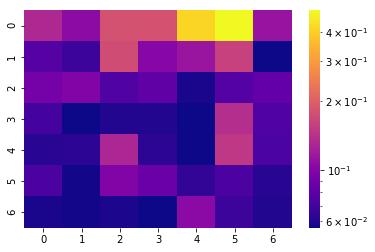

[[0.132 0.106 0.179 0.181 0.413 0.497 0.113]
 [0.078 0.068 0.174 0.101 0.114 0.159 0.056]
 [0.092 0.099 0.075 0.082 0.058 0.077 0.084]
 [0.071 0.056 0.06  0.06  0.056 0.138 0.076]
 [0.062 0.063 0.13  0.063 0.056 0.149 0.073]
 [0.074 0.057 0.099 0.086 0.065 0.074 0.062]
 [0.058 0.057 0.059 0.056 0.105 0.068 0.06 ]]


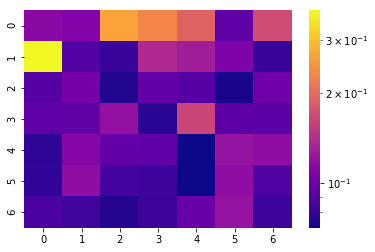

[[0.114 0.111 0.264 0.23  0.192 0.094 0.168]
 [0.377 0.09  0.081 0.138 0.128 0.108 0.081]
 [0.091 0.105 0.075 0.097 0.091 0.073 0.101]
 [0.094 0.095 0.119 0.077 0.162 0.093 0.093]
 [0.078 0.112 0.096 0.094 0.071 0.121 0.117]
 [0.079 0.117 0.085 0.083 0.071 0.117 0.089]
 [0.088 0.084 0.076 0.082 0.099 0.121 0.082]]


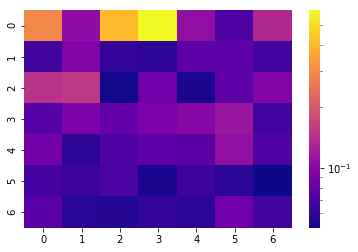

[[0.291 0.106 0.41  0.592 0.107 0.07  0.135]
 [0.065 0.098 0.06  0.059 0.077 0.077 0.066]
 [0.145 0.153 0.052 0.086 0.053 0.076 0.096]
 [0.073 0.093 0.08  0.092 0.1   0.113 0.066]
 [0.088 0.058 0.071 0.079 0.075 0.108 0.071]
 [0.067 0.063 0.069 0.054 0.063 0.058 0.051]
 [0.075 0.057 0.056 0.06  0.058 0.086 0.065]]


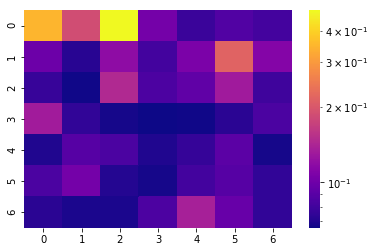

[[0.349 0.186 0.482 0.103 0.078 0.087 0.082]
 [0.099 0.072 0.119 0.081 0.107 0.215 0.112]
 [0.077 0.067 0.145 0.085 0.093 0.131 0.08 ]
 [0.132 0.075 0.068 0.066 0.067 0.073 0.084]
 [0.07  0.089 0.084 0.07  0.076 0.091 0.068]
 [0.084 0.103 0.071 0.068 0.081 0.089 0.075]
 [0.073 0.069 0.069 0.085 0.136 0.097 0.075]]


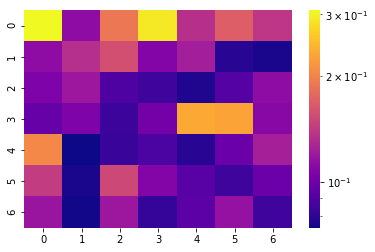

[[0.308 0.113 0.19  0.292 0.135 0.169 0.139]
 [0.113 0.134 0.157 0.108 0.123 0.079 0.076]
 [0.106 0.119 0.089 0.085 0.077 0.091 0.113]
 [0.097 0.106 0.084 0.102 0.233 0.228 0.11 ]
 [0.205 0.074 0.083 0.088 0.079 0.098 0.124]
 [0.143 0.076 0.152 0.108 0.092 0.085 0.099]
 [0.118 0.075 0.119 0.082 0.094 0.116 0.085]]


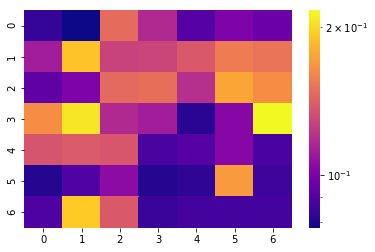

[[0.084 0.078 0.147 0.117 0.091 0.101 0.096]
 [0.112 0.19  0.128 0.129 0.138 0.155 0.151]
 [0.093 0.101 0.146 0.149 0.119 0.175 0.164]
 [0.164 0.206 0.117 0.112 0.082 0.103 0.216]
 [0.136 0.139 0.137 0.088 0.091 0.103 0.088]
 [0.081 0.09  0.105 0.081 0.083 0.17  0.086]
 [0.089 0.193 0.138 0.085 0.087 0.087 0.087]]


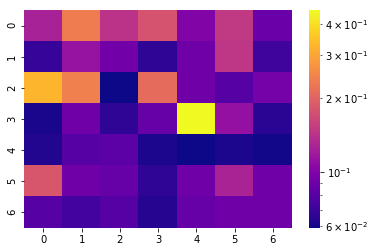

[[0.125 0.235 0.142 0.178 0.1   0.149 0.088]
 [0.069 0.113 0.092 0.067 0.091 0.146 0.071]
 [0.327 0.24  0.059 0.21  0.091 0.08  0.094]
 [0.061 0.091 0.066 0.087 0.454 0.111 0.065]
 [0.063 0.08  0.082 0.062 0.059 0.062 0.06 ]
 [0.182 0.091 0.087 0.066 0.091 0.127 0.091]
 [0.08  0.073 0.08  0.064 0.087 0.091 0.091]]


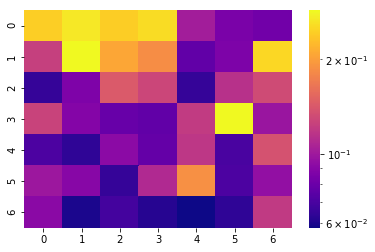

[[0.244 0.268 0.243 0.258 0.102 0.085 0.082]
 [0.124 0.287 0.208 0.186 0.077 0.086 0.252]
 [0.065 0.087 0.143 0.129 0.065 0.114 0.132]
 [0.126 0.089 0.079 0.077 0.121 0.287 0.098]
 [0.071 0.064 0.092 0.078 0.118 0.07  0.137]
 [0.099 0.09  0.065 0.109 0.188 0.071 0.095]
 [0.091 0.06  0.069 0.062 0.058 0.064 0.12 ]]


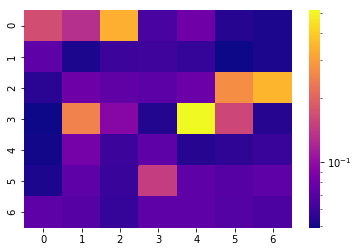

[[0.169 0.13  0.337 0.065 0.081 0.054 0.052]
 [0.073 0.052 0.06  0.061 0.058 0.049 0.052]
 [0.055 0.08  0.074 0.072 0.079 0.271 0.35 ]
 [0.049 0.25  0.093 0.053 0.513 0.16  0.054]
 [0.05  0.084 0.06  0.073 0.054 0.056 0.059]
 [0.052 0.073 0.059 0.147 0.073 0.07  0.073]
 [0.073 0.07  0.058 0.073 0.073 0.069 0.066]]
SKIPPPPPPEDDDD


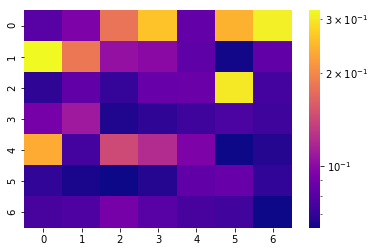

[[0.081 0.094 0.181 0.26  0.085 0.242 0.308]
 [0.319 0.184 0.104 0.1   0.083 0.064 0.084]
 [0.069 0.084 0.071 0.086 0.087 0.3   0.075]
 [0.092 0.11  0.066 0.069 0.073 0.077 0.073]
 [0.235 0.075 0.144 0.121 0.094 0.063 0.067]
 [0.07  0.065 0.063 0.067 0.084 0.086 0.07 ]
 [0.076 0.078 0.092 0.081 0.076 0.074 0.063]]


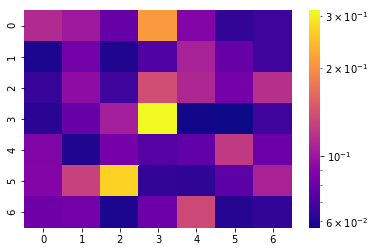

[[0.113 0.102 0.079 0.21  0.09  0.064 0.067]
 [0.059 0.083 0.06  0.072 0.107 0.079 0.067]
 [0.065 0.094 0.067 0.139 0.111 0.084 0.117]
 [0.062 0.079 0.105 0.314 0.058 0.057 0.067]
 [0.089 0.06  0.085 0.073 0.077 0.124 0.081]
 [0.09  0.129 0.269 0.064 0.063 0.075 0.108]
 [0.082 0.083 0.059 0.081 0.135 0.061 0.064]]


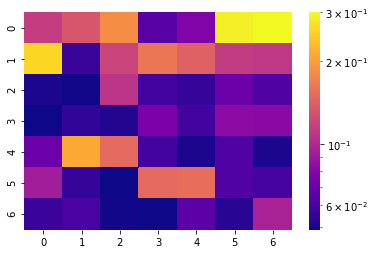

[[0.114 0.133 0.183 0.065 0.078 0.288 0.3  ]
 [0.259 0.057 0.119 0.162 0.142 0.113 0.11 ]
 [0.051 0.05  0.109 0.059 0.056 0.071 0.063]
 [0.049 0.055 0.052 0.076 0.059 0.083 0.082]
 [0.071 0.212 0.149 0.059 0.051 0.063 0.051]
 [0.093 0.056 0.049 0.149 0.154 0.063 0.06 ]
 [0.057 0.061 0.05  0.049 0.066 0.053 0.096]]


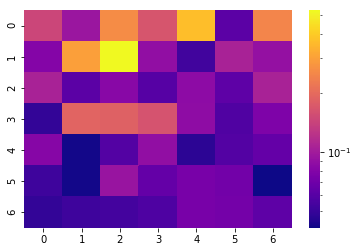

[[0.146 0.095 0.26  0.166 0.372 0.062 0.249]
 [0.081 0.301 0.528 0.089 0.053 0.106 0.091]
 [0.106 0.062 0.084 0.06  0.086 0.063 0.106]
 [0.049 0.19  0.185 0.164 0.087 0.058 0.078]
 [0.082 0.042 0.059 0.089 0.047 0.059 0.066]
 [0.052 0.042 0.093 0.066 0.075 0.072 0.041]
 [0.049 0.052 0.054 0.057 0.075 0.073 0.063]]


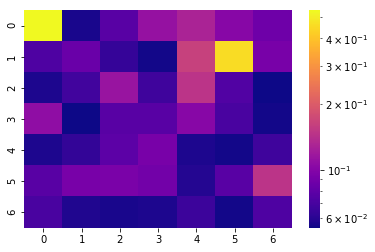

[[0.538 0.056 0.077 0.111 0.129 0.102 0.087]
 [0.073 0.085 0.064 0.055 0.162 0.461 0.093]
 [0.057 0.068 0.113 0.067 0.147 0.074 0.054]
 [0.107 0.054 0.077 0.077 0.102 0.071 0.055]
 [0.057 0.063 0.079 0.093 0.057 0.055 0.067]
 [0.077 0.093 0.094 0.09  0.059 0.077 0.147]
 [0.071 0.058 0.056 0.057 0.066 0.055 0.073]]


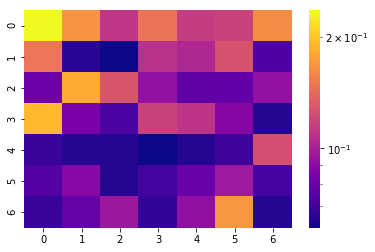

[[0.236 0.168 0.111 0.147 0.115 0.118 0.163]
 [0.148 0.065 0.061 0.109 0.104 0.127 0.073]
 [0.081 0.183 0.128 0.093 0.077 0.078 0.093]
 [0.193 0.085 0.072 0.118 0.11  0.088 0.064]
 [0.068 0.064 0.064 0.061 0.064 0.069 0.125]
 [0.074 0.089 0.064 0.07  0.08  0.097 0.071]
 [0.068 0.079 0.096 0.067 0.092 0.169 0.064]]


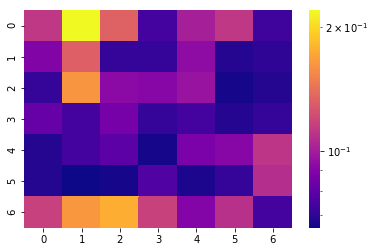

[[0.112 0.219 0.133 0.074 0.101 0.112 0.073]
 [0.089 0.132 0.071 0.071 0.093 0.068 0.07 ]
 [0.071 0.162 0.092 0.091 0.096 0.066 0.068]
 [0.082 0.074 0.086 0.071 0.074 0.068 0.071]
 [0.068 0.074 0.079 0.066 0.087 0.091 0.111]
 [0.068 0.065 0.066 0.077 0.067 0.071 0.107]
 [0.116 0.163 0.176 0.117 0.09  0.109 0.074]]


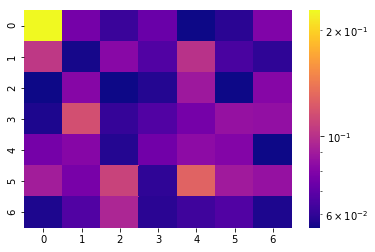

[[0.228 0.076 0.062 0.073 0.055 0.059 0.079]
 [0.104 0.056 0.082 0.067 0.101 0.065 0.06 ]
 [0.055 0.081 0.055 0.058 0.089 0.055 0.081]
 [0.057 0.117 0.061 0.067 0.076 0.086 0.085]
 [0.076 0.081 0.058 0.075 0.083 0.08  0.055]
 [0.091 0.077 0.11  0.06  0.128 0.09  0.086]
 [0.057 0.067 0.095 0.059 0.063 0.067 0.057]]


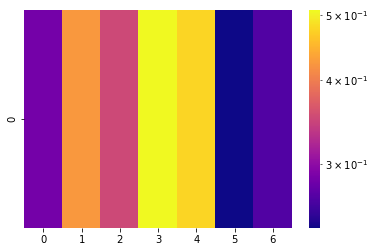

[[0.285 0.425 0.351 0.508 0.477 0.241 0.267]]


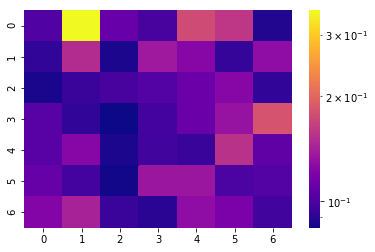

[[0.102 0.353 0.111 0.099 0.176 0.159 0.088]
 [0.092 0.15  0.087 0.137 0.124 0.093 0.129]
 [0.086 0.095 0.099 0.103 0.113 0.125 0.092]
 [0.105 0.092 0.084 0.098 0.112 0.133 0.183]
 [0.105 0.125 0.087 0.097 0.094 0.155 0.108]
 [0.11  0.098 0.085 0.135 0.135 0.1   0.103]
 [0.123 0.143 0.095 0.09  0.129 0.119 0.097]]


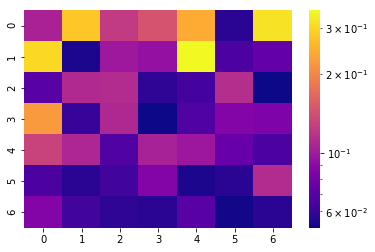

[[0.106 0.28  0.125 0.146 0.243 0.057 0.316]
 [0.302 0.054 0.099 0.094 0.35  0.066 0.074]
 [0.07  0.111 0.112 0.058 0.064 0.114 0.052]
 [0.223 0.06  0.11  0.052 0.067 0.086 0.084]
 [0.131 0.108 0.067 0.105 0.098 0.075 0.066]
 [0.066 0.057 0.063 0.086 0.054 0.057 0.112]
 [0.086 0.063 0.058 0.057 0.07  0.053 0.057]]


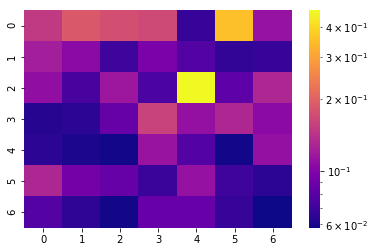

[[0.15  0.187 0.176 0.168 0.068 0.355 0.113]
 [0.123 0.106 0.07  0.097 0.078 0.067 0.068]
 [0.109 0.074 0.117 0.075 0.47  0.083 0.131]
 [0.063 0.065 0.086 0.161 0.111 0.131 0.106]
 [0.065 0.061 0.059 0.114 0.078 0.059 0.111]
 [0.131 0.093 0.086 0.069 0.112 0.07  0.065]
 [0.079 0.066 0.059 0.087 0.087 0.068 0.058]]


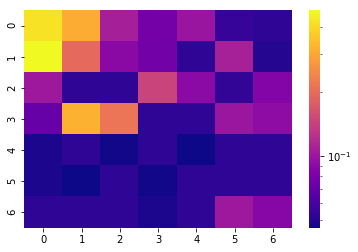

[[0.423 0.312 0.107 0.078 0.099 0.055 0.053]
 [0.48  0.197 0.089 0.077 0.053 0.108 0.05 ]
 [0.102 0.053 0.053 0.145 0.09  0.054 0.085]
 [0.072 0.32  0.213 0.053 0.053 0.1   0.092]
 [0.049 0.053 0.047 0.053 0.046 0.053 0.053]
 [0.049 0.046 0.053 0.047 0.053 0.053 0.053]
 [0.053 0.053 0.053 0.049 0.053 0.102 0.087]]


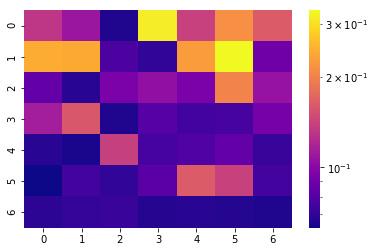

[[0.132 0.109 0.066 0.317 0.14  0.215 0.163]
 [0.245 0.242 0.078 0.07  0.227 0.333 0.09 ]
 [0.085 0.068 0.094 0.105 0.094 0.203 0.107]
 [0.114 0.159 0.066 0.081 0.075 0.076 0.093]
 [0.068 0.065 0.139 0.076 0.079 0.085 0.072]
 [0.063 0.075 0.07  0.082 0.163 0.141 0.075]
 [0.069 0.071 0.072 0.067 0.068 0.067 0.066]]


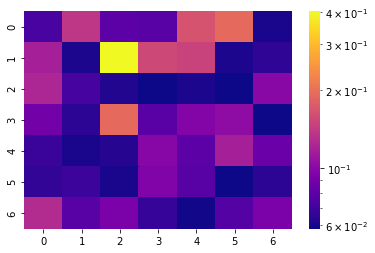

[[0.073 0.137 0.08  0.078 0.166 0.192 0.06 ]
 [0.117 0.061 0.403 0.155 0.149 0.061 0.065]
 [0.122 0.072 0.062 0.058 0.061 0.058 0.1  ]
 [0.089 0.064 0.193 0.079 0.097 0.103 0.058]
 [0.068 0.06  0.063 0.099 0.08  0.117 0.085]
 [0.066 0.069 0.06  0.095 0.078 0.058 0.064]
 [0.127 0.078 0.093 0.067 0.059 0.077 0.093]]


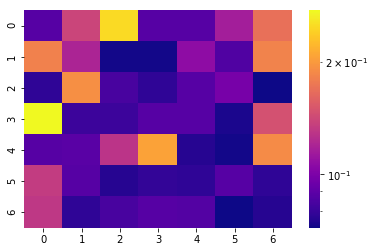

[[0.088 0.139 0.249 0.088 0.088 0.116 0.169]
 [0.182 0.12  0.073 0.073 0.107 0.086 0.183]
 [0.078 0.192 0.084 0.078 0.088 0.098 0.072]
 [0.274 0.081 0.081 0.088 0.088 0.074 0.147]
 [0.088 0.089 0.129 0.206 0.076 0.073 0.189]
 [0.134 0.088 0.076 0.079 0.078 0.088 0.078]
 [0.131 0.078 0.084 0.088 0.087 0.072 0.076]]
SKIPPPPPPEDDDD


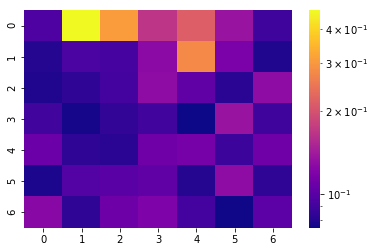

[[0.095 0.467 0.308 0.168 0.216 0.135 0.089]
 [0.08  0.094 0.092 0.127 0.278 0.117 0.079]
 [0.079 0.083 0.091 0.129 0.103 0.082 0.129]
 [0.09  0.077 0.085 0.09  0.075 0.135 0.089]
 [0.109 0.083 0.082 0.111 0.115 0.088 0.111]
 [0.078 0.097 0.1   0.103 0.08  0.129 0.083]
 [0.125 0.083 0.11  0.119 0.091 0.076 0.101]]


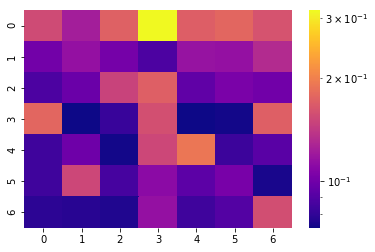

[[0.155 0.123 0.172 0.315 0.17  0.177 0.161]
 [0.101 0.115 0.102 0.088 0.116 0.115 0.132]
 [0.088 0.098 0.149 0.171 0.094 0.104 0.1  ]
 [0.177 0.073 0.082 0.158 0.073 0.074 0.171]
 [0.084 0.099 0.074 0.152 0.191 0.083 0.092]
 [0.084 0.152 0.086 0.111 0.093 0.103 0.075]
 [0.079 0.078 0.076 0.115 0.084 0.09  0.157]]


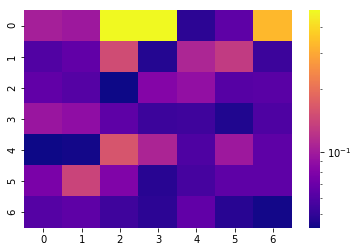

[[0.103 0.097 0.479 0.479 0.049 0.065 0.33 ]
 [0.06  0.066 0.15  0.047 0.109 0.13  0.053]
 [0.066 0.061 0.043 0.082 0.09  0.062 0.063]
 [0.094 0.088 0.065 0.053 0.054 0.046 0.059]
 [0.043 0.044 0.162 0.108 0.059 0.097 0.065]
 [0.077 0.14  0.08  0.048 0.056 0.065 0.065]
 [0.061 0.065 0.054 0.049 0.066 0.048 0.044]]


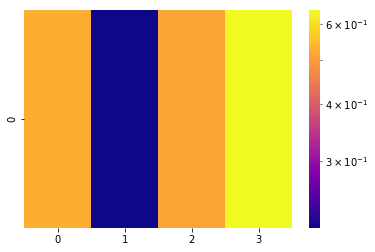

[[0.526 0.214 0.514 0.643]]


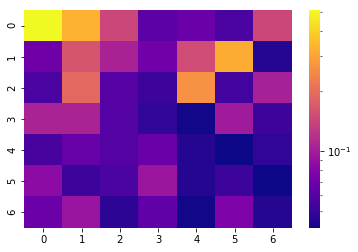

[[0.507 0.328 0.143 0.062 0.068 0.056 0.144]
 [0.07  0.161 0.105 0.071 0.15  0.319 0.045]
 [0.056 0.191 0.06  0.051 0.264 0.053 0.103]
 [0.106 0.106 0.059 0.048 0.042 0.098 0.051]
 [0.055 0.066 0.059 0.068 0.045 0.041 0.048]
 [0.085 0.051 0.056 0.094 0.045 0.051 0.041]
 [0.069 0.093 0.047 0.064 0.042 0.077 0.045]]


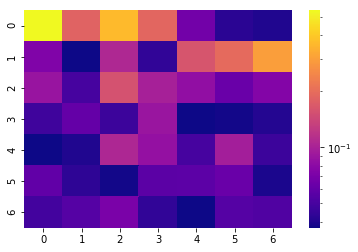

[[0.546 0.183 0.365 0.19  0.067 0.042 0.04 ]
 [0.074 0.037 0.106 0.044 0.162 0.195 0.299]
 [0.088 0.05  0.157 0.099 0.084 0.063 0.075]
 [0.048 0.061 0.047 0.089 0.037 0.038 0.041]
 [0.037 0.04  0.105 0.085 0.05  0.097 0.047]
 [0.06  0.043 0.038 0.057 0.058 0.063 0.039]
 [0.049 0.055 0.071 0.044 0.037 0.055 0.053]]
SKIPPPPPPEDDDD


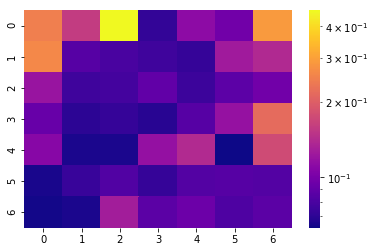

[[0.247 0.158 0.463 0.072 0.113 0.097 0.288]
 [0.262 0.085 0.08  0.076 0.073 0.126 0.139]
 [0.12  0.076 0.078 0.09  0.075 0.088 0.097]
 [0.093 0.07  0.073 0.069 0.085 0.118 0.218]
 [0.109 0.066 0.066 0.117 0.14  0.063 0.176]
 [0.065 0.074 0.083 0.073 0.084 0.085 0.084]
 [0.064 0.066 0.128 0.087 0.095 0.082 0.087]]


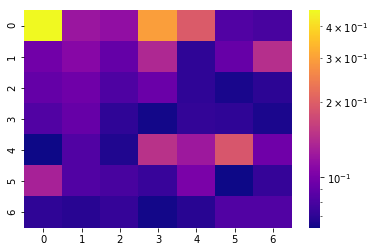

[[0.463 0.122 0.115 0.295 0.195 0.083 0.079]
 [0.097 0.109 0.091 0.138 0.071 0.092 0.145]
 [0.091 0.096 0.082 0.094 0.071 0.065 0.07 ]
 [0.083 0.092 0.071 0.064 0.072 0.071 0.066]
 [0.063 0.083 0.067 0.148 0.124 0.189 0.096]
 [0.132 0.083 0.079 0.074 0.102 0.063 0.073]
 [0.071 0.069 0.073 0.064 0.069 0.083 0.083]]


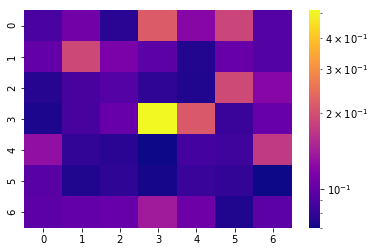

[[0.089 0.109 0.077 0.218 0.121 0.187 0.094]
 [0.101 0.192 0.113 0.097 0.075 0.103 0.093]
 [0.076 0.088 0.094 0.079 0.074 0.193 0.12 ]
 [0.073 0.088 0.103 0.513 0.213 0.083 0.103]
 [0.129 0.08  0.077 0.07  0.087 0.085 0.173]
 [0.095 0.074 0.079 0.072 0.082 0.08  0.07 ]
 [0.097 0.101 0.103 0.139 0.106 0.074 0.097]]


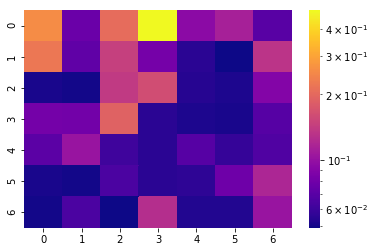

[[0.258 0.078 0.207 0.485 0.095 0.113 0.07 ]
 [0.224 0.073 0.146 0.083 0.055 0.049 0.133]
 [0.051 0.05  0.139 0.162 0.054 0.052 0.09 ]
 [0.082 0.081 0.191 0.055 0.052 0.051 0.069]
 [0.071 0.103 0.061 0.055 0.069 0.058 0.067]
 [0.051 0.05  0.065 0.055 0.056 0.079 0.118]
 [0.05  0.065 0.049 0.126 0.053 0.053 0.103]]
SKIPPPPPPEDDDD


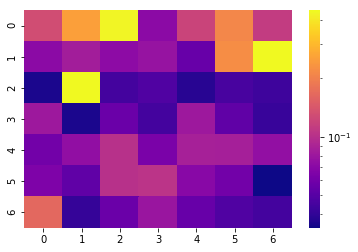

[[0.131 0.255 0.436 0.071 0.121 0.211 0.112]
 [0.071 0.085 0.072 0.077 0.056 0.222 0.449]
 [0.036 0.449 0.045 0.048 0.038 0.046 0.043]
 [0.081 0.036 0.057 0.045 0.081 0.053 0.042]
 [0.06  0.074 0.101 0.063 0.087 0.086 0.075]
 [0.065 0.053 0.101 0.105 0.07  0.06  0.034]
 [0.164 0.041 0.057 0.079 0.056 0.048 0.045]]


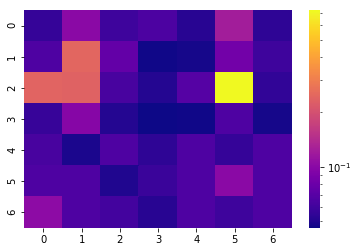

[[0.056 0.1   0.059 0.065 0.052 0.122 0.054]
 [0.066 0.246 0.076 0.047 0.048 0.085 0.059]
 [0.24  0.236 0.063 0.051 0.069 0.726 0.055]
 [0.057 0.097 0.051 0.046 0.047 0.066 0.048]
 [0.063 0.049 0.066 0.054 0.066 0.056 0.066]
 [0.066 0.066 0.05  0.058 0.066 0.101 0.066]
 [0.103 0.066 0.061 0.052 0.066 0.059 0.066]]


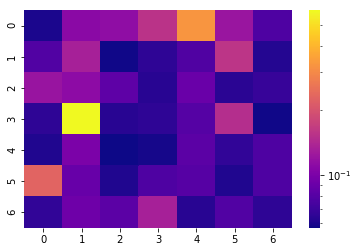

[[0.06  0.11  0.114 0.155 0.328 0.122 0.077]
 [0.079 0.133 0.058 0.065 0.078 0.159 0.062]
 [0.121 0.112 0.085 0.063 0.09  0.064 0.068]
 [0.065 0.583 0.063 0.065 0.08  0.149 0.058]
 [0.061 0.101 0.057 0.059 0.083 0.066 0.077]
 [0.23  0.089 0.061 0.077 0.081 0.061 0.077]
 [0.066 0.093 0.083 0.133 0.063 0.079 0.065]]


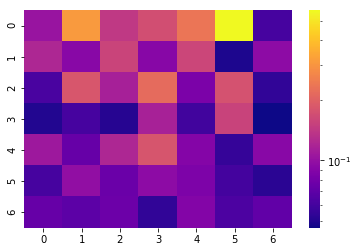

[[0.103 0.312 0.142 0.171 0.238 0.563 0.061]
 [0.122 0.093 0.157 0.092 0.16  0.049 0.095]
 [0.062 0.183 0.115 0.219 0.085 0.177 0.054]
 [0.05  0.061 0.051 0.116 0.059 0.155 0.046]
 [0.107 0.074 0.122 0.181 0.09  0.055 0.093]
 [0.061 0.098 0.076 0.095 0.086 0.06  0.052]
 [0.074 0.07  0.077 0.054 0.089 0.063 0.072]]


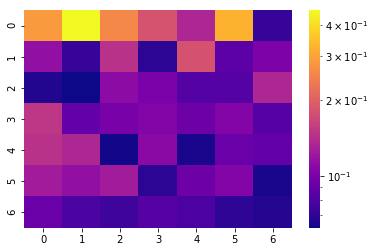

[[0.284 0.456 0.258 0.182 0.134 0.324 0.072]
 [0.114 0.072 0.145 0.069 0.181 0.086 0.102]
 [0.066 0.062 0.111 0.1   0.083 0.083 0.135]
 [0.15  0.089 0.099 0.104 0.094 0.106 0.084]
 [0.145 0.135 0.063 0.109 0.064 0.092 0.089]
 [0.125 0.114 0.125 0.069 0.094 0.106 0.064]
 [0.092 0.079 0.075 0.084 0.08  0.07  0.067]]


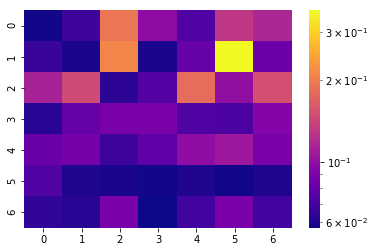

[[0.058 0.068 0.192 0.098 0.073 0.13  0.116]
 [0.066 0.059 0.21  0.059 0.081 0.361 0.083]
 [0.113 0.147 0.063 0.074 0.181 0.1   0.151]
 [0.062 0.081 0.088 0.088 0.073 0.072 0.093]
 [0.082 0.087 0.067 0.078 0.099 0.106 0.088]
 [0.073 0.06  0.059 0.058 0.06  0.058 0.06 ]
 [0.064 0.062 0.089 0.057 0.069 0.089 0.069]]


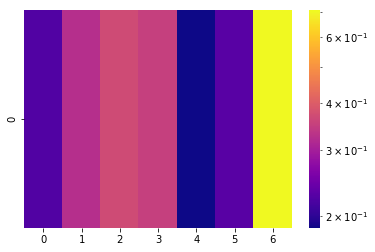

[[0.224 0.324 0.37  0.35  0.186 0.228 0.706]]


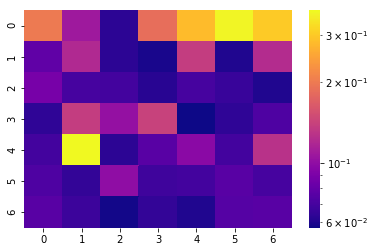

[[0.2   0.108 0.063 0.186 0.282 0.364 0.301]
 [0.079 0.12  0.063 0.059 0.137 0.06  0.122]
 [0.088 0.07  0.069 0.062 0.07  0.066 0.06 ]
 [0.064 0.137 0.102 0.141 0.057 0.064 0.073]
 [0.069 0.371 0.063 0.076 0.097 0.069 0.127]
 [0.073 0.065 0.1   0.068 0.069 0.076 0.07 ]
 [0.076 0.067 0.058 0.065 0.06  0.075 0.076]]


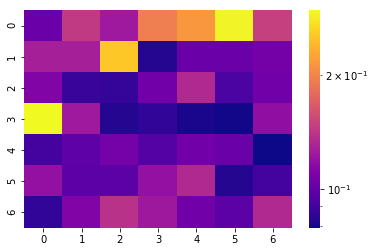

[[0.103 0.144 0.124 0.194 0.214 0.29  0.148]
 [0.127 0.127 0.253 0.083 0.103 0.103 0.106]
 [0.111 0.088 0.087 0.105 0.133 0.093 0.105]
 [0.295 0.124 0.083 0.086 0.081 0.08  0.118]
 [0.091 0.099 0.107 0.096 0.105 0.103 0.079]
 [0.119 0.098 0.098 0.119 0.133 0.083 0.091]
 [0.086 0.111 0.139 0.123 0.105 0.098 0.133]]


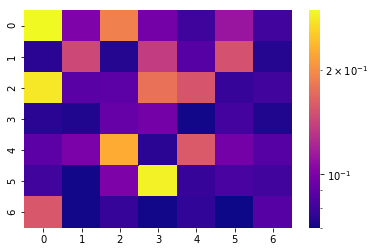

[[0.298 0.101 0.19  0.097 0.08  0.112 0.081]
 [0.075 0.146 0.074 0.137 0.087 0.152 0.074]
 [0.281 0.088 0.089 0.178 0.155 0.078 0.081]
 [0.075 0.073 0.092 0.097 0.071 0.082 0.073]
 [0.089 0.099 0.227 0.075 0.159 0.097 0.087]
 [0.081 0.071 0.1   0.29  0.078 0.083 0.081]
 [0.157 0.071 0.078 0.071 0.077 0.07  0.087]]


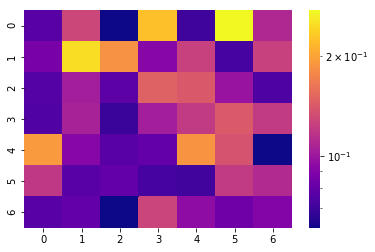

[[0.077 0.129 0.061 0.223 0.07  0.273 0.11 ]
 [0.087 0.248 0.185 0.092 0.125 0.072 0.125]
 [0.076 0.104 0.078 0.147 0.141 0.099 0.074]
 [0.075 0.106 0.069 0.104 0.121 0.142 0.121]
 [0.192 0.092 0.077 0.08  0.187 0.137 0.061]
 [0.119 0.077 0.08  0.072 0.071 0.121 0.111]
 [0.077 0.08  0.061 0.128 0.095 0.084 0.091]]


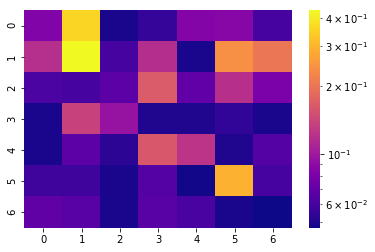

[[0.083 0.358 0.049 0.055 0.085 0.086 0.06 ]
 [0.118 0.432 0.06  0.117 0.049 0.24  0.203]
 [0.062 0.06  0.068 0.166 0.07  0.119 0.08 ]
 [0.049 0.137 0.095 0.05  0.05  0.054 0.049]
 [0.049 0.068 0.053 0.162 0.124 0.05  0.065]
 [0.058 0.058 0.049 0.065 0.048 0.295 0.06 ]
 [0.069 0.066 0.049 0.066 0.061 0.049 0.047]]
SKIPPPPPPEDDDD


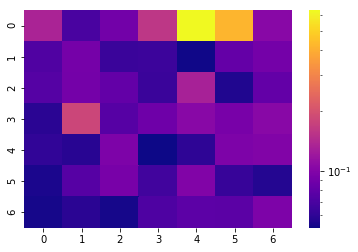

[[0.134 0.07  0.09  0.158 0.634 0.423 0.105]
 [0.073 0.092 0.064 0.065 0.053 0.083 0.091]
 [0.075 0.091 0.082 0.064 0.131 0.056 0.082]
 [0.059 0.181 0.076 0.088 0.105 0.094 0.105]
 [0.061 0.058 0.097 0.052 0.06  0.097 0.1  ]
 [0.055 0.076 0.094 0.067 0.1   0.063 0.057]
 [0.054 0.059 0.054 0.072 0.079 0.078 0.097]]


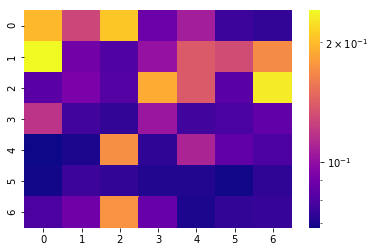

[[0.198 0.128 0.207 0.088 0.107 0.076 0.074]
 [0.241 0.09  0.081 0.101 0.139 0.131 0.17 ]
 [0.083 0.092 0.082 0.19  0.139 0.083 0.231]
 [0.118 0.077 0.074 0.103 0.077 0.079 0.085]
 [0.068 0.07  0.172 0.073 0.11  0.085 0.08 ]
 [0.069 0.076 0.074 0.071 0.071 0.069 0.073]
 [0.08  0.089 0.175 0.087 0.07  0.074 0.075]]


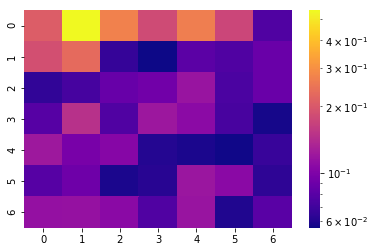

[[0.209 0.548 0.273 0.181 0.266 0.175 0.076]
 [0.188 0.229 0.066 0.056 0.081 0.076 0.088]
 [0.065 0.072 0.087 0.092 0.117 0.074 0.088]
 [0.079 0.147 0.076 0.12  0.108 0.073 0.058]
 [0.121 0.096 0.104 0.061 0.059 0.057 0.067]
 [0.079 0.09  0.059 0.062 0.119 0.107 0.064]
 [0.114 0.115 0.107 0.076 0.117 0.06  0.08 ]]


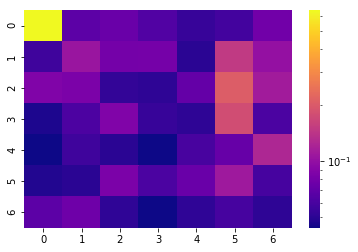

[[0.642 0.069 0.075 0.064 0.054 0.058 0.079]
 [0.057 0.106 0.08  0.081 0.05  0.149 0.101]
 [0.087 0.085 0.053 0.051 0.072 0.207 0.112]
 [0.047 0.062 0.087 0.054 0.051 0.178 0.061]
 [0.044 0.057 0.05  0.044 0.06  0.073 0.125]
 [0.048 0.05  0.085 0.061 0.075 0.11  0.059]
 [0.069 0.077 0.052 0.044 0.052 0.059 0.051]]


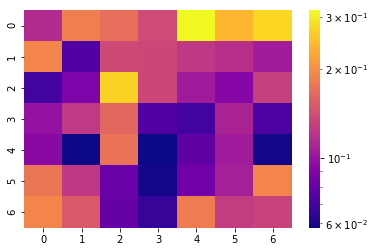

[[0.115 0.184 0.169 0.139 0.316 0.239 0.275]
 [0.192 0.073 0.138 0.136 0.124 0.118 0.105]
 [0.069 0.089 0.272 0.135 0.104 0.092 0.13 ]
 [0.099 0.125 0.162 0.073 0.069 0.11  0.072]
 [0.094 0.058 0.173 0.058 0.078 0.104 0.059]
 [0.177 0.124 0.081 0.059 0.084 0.107 0.192]
 [0.192 0.151 0.08  0.066 0.183 0.127 0.132]]


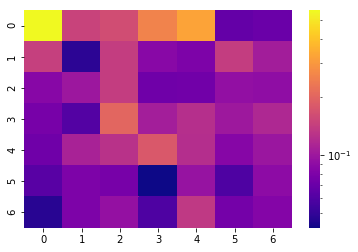

[[0.564 0.149 0.163 0.258 0.329 0.068 0.071]
 [0.144 0.048 0.141 0.087 0.08  0.141 0.105]
 [0.086 0.1   0.141 0.073 0.074 0.093 0.091]
 [0.077 0.061 0.203 0.106 0.124 0.101 0.116]
 [0.073 0.111 0.127 0.181 0.122 0.085 0.099]
 [0.063 0.08  0.077 0.042 0.096 0.059 0.089]
 [0.047 0.08  0.094 0.059 0.135 0.075 0.084]]


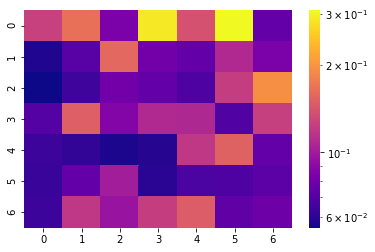

[[0.126 0.166 0.084 0.29  0.139 0.309 0.075]
 [0.058 0.072 0.158 0.08  0.076 0.109 0.083]
 [0.055 0.065 0.08  0.076 0.069 0.123 0.195]
 [0.071 0.151 0.087 0.109 0.108 0.07  0.125]
 [0.064 0.062 0.057 0.059 0.119 0.153 0.076]
 [0.063 0.075 0.101 0.06  0.068 0.069 0.073]
 [0.064 0.119 0.096 0.124 0.149 0.074 0.079]]


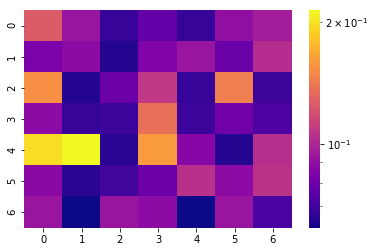

[[0.126 0.093 0.068 0.078 0.068 0.09  0.096]
 [0.084 0.089 0.065 0.085 0.093 0.079 0.103]
 [0.154 0.065 0.08  0.108 0.068 0.144 0.069]
 [0.089 0.068 0.069 0.137 0.069 0.081 0.073]
 [0.198 0.214 0.066 0.16  0.087 0.065 0.104]
 [0.088 0.066 0.07  0.08  0.105 0.089 0.106]
 [0.093 0.062 0.093 0.089 0.062 0.093 0.072]]


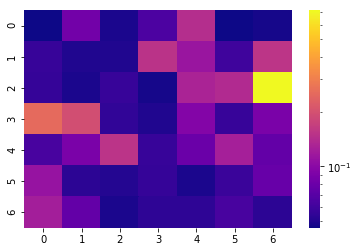

[[0.046 0.084 0.049 0.065 0.142 0.046 0.048]
 [0.057 0.05  0.05  0.15  0.113 0.06  0.154]
 [0.056 0.049 0.057 0.048 0.13  0.138 0.718]
 [0.253 0.195 0.055 0.05  0.095 0.057 0.089]
 [0.063 0.089 0.153 0.057 0.08  0.124 0.076]
 [0.11  0.053 0.051 0.056 0.049 0.058 0.078]
 [0.123 0.076 0.049 0.054 0.054 0.063 0.053]]
SKIPPPPPPEDDDD


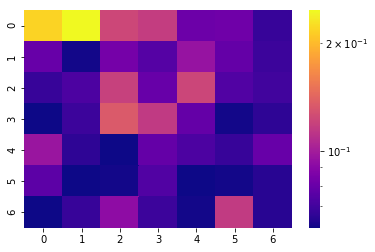

[[0.218 0.246 0.123 0.117 0.081 0.082 0.068]
 [0.08  0.062 0.084 0.075 0.095 0.079 0.069]
 [0.068 0.073 0.119 0.08  0.122 0.074 0.07 ]
 [0.061 0.069 0.134 0.115 0.079 0.062 0.066]
 [0.096 0.066 0.061 0.079 0.073 0.068 0.08 ]
 [0.077 0.061 0.062 0.074 0.061 0.062 0.065]
 [0.061 0.068 0.092 0.069 0.062 0.116 0.065]]


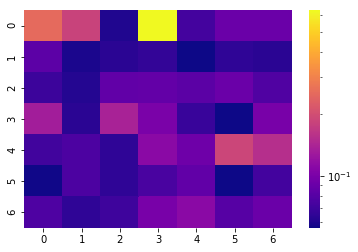

[[0.251 0.182 0.06  0.634 0.073 0.091 0.091]
 [0.084 0.059 0.063 0.066 0.056 0.065 0.063]
 [0.069 0.061 0.086 0.087 0.083 0.091 0.078]
 [0.132 0.063 0.138 0.1   0.068 0.056 0.099]
 [0.071 0.076 0.065 0.111 0.093 0.187 0.153]
 [0.057 0.076 0.065 0.075 0.086 0.056 0.072]
 [0.077 0.065 0.07  0.099 0.111 0.081 0.091]]


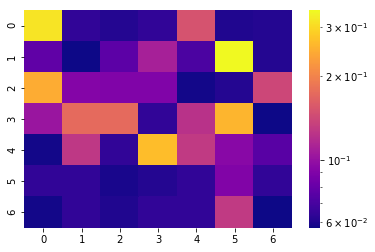

[[0.314 0.064 0.061 0.064 0.151 0.06  0.061]
 [0.078 0.057 0.077 0.11  0.071 0.343 0.061]
 [0.246 0.092 0.09  0.09  0.058 0.061 0.14 ]
 [0.102 0.173 0.173 0.064 0.123 0.257 0.057]
 [0.058 0.127 0.064 0.265 0.129 0.094 0.075]
 [0.064 0.064 0.059 0.061 0.064 0.091 0.064]
 [0.058 0.064 0.06  0.064 0.064 0.129 0.057]]


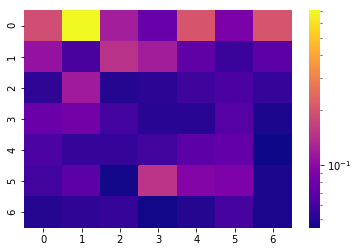

[[0.19  0.706 0.121 0.077 0.203 0.088 0.201]
 [0.107 0.062 0.146 0.119 0.073 0.057 0.07 ]
 [0.053 0.117 0.05  0.052 0.058 0.064 0.055]
 [0.078 0.083 0.06  0.051 0.051 0.068 0.048]
 [0.063 0.055 0.055 0.059 0.071 0.074 0.045]
 [0.059 0.071 0.046 0.15  0.093 0.089 0.048]
 [0.05  0.053 0.055 0.046 0.05  0.061 0.048]]


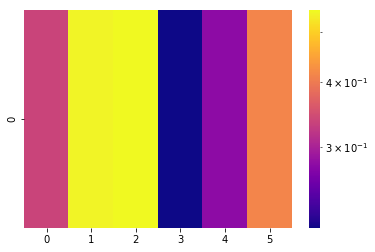

[[0.336 0.541 0.549 0.21  0.278 0.414]]
SKIPPPPPPEDDDD
SKIPPPPPPEDDDD


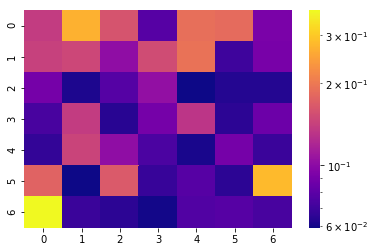

[[0.138 0.269 0.161 0.078 0.19  0.185 0.092]
 [0.142 0.149 0.102 0.153 0.193 0.07  0.091]
 [0.09  0.062 0.077 0.104 0.059 0.063 0.063]
 [0.073 0.138 0.064 0.09  0.132 0.065 0.086]
 [0.067 0.145 0.102 0.074 0.061 0.09  0.069]
 [0.177 0.059 0.167 0.068 0.078 0.065 0.282]
 [0.371 0.069 0.065 0.06  0.076 0.078 0.073]]


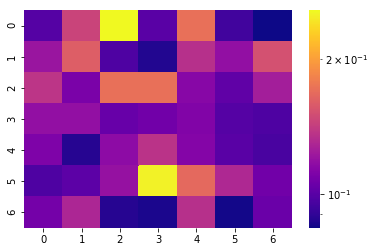

[[0.099 0.145 0.256 0.1   0.171 0.094 0.084]
 [0.121 0.16  0.097 0.087 0.134 0.118 0.152]
 [0.137 0.11  0.171 0.171 0.114 0.102 0.125]
 [0.118 0.118 0.104 0.107 0.112 0.099 0.097]
 [0.111 0.088 0.116 0.136 0.113 0.1   0.096]
 [0.097 0.101 0.119 0.251 0.167 0.13  0.107]
 [0.108 0.129 0.088 0.086 0.134 0.085 0.105]]
SKIPPPPPPEDDDD


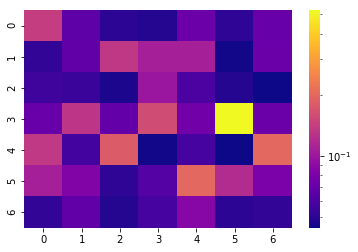

[[0.14  0.067 0.05  0.048 0.073 0.051 0.071]
 [0.052 0.068 0.133 0.108 0.108 0.045 0.072]
 [0.056 0.054 0.047 0.1   0.06  0.048 0.044]
 [0.071 0.131 0.069 0.158 0.075 0.522 0.072]
 [0.134 0.057 0.182 0.045 0.058 0.044 0.2  ]
 [0.108 0.084 0.051 0.063 0.199 0.12  0.08 ]
 [0.052 0.068 0.048 0.058 0.087 0.05  0.052]]


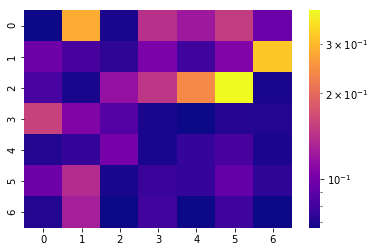

[[0.067 0.284 0.069 0.142 0.122 0.152 0.095]
 [0.097 0.082 0.074 0.103 0.079 0.105 0.32 ]
 [0.083 0.069 0.116 0.147 0.238 0.393 0.069]
 [0.157 0.106 0.087 0.069 0.067 0.072 0.071]
 [0.071 0.076 0.101 0.069 0.076 0.082 0.07 ]
 [0.097 0.137 0.069 0.078 0.076 0.093 0.074]
 [0.071 0.127 0.067 0.08  0.067 0.079 0.067]]


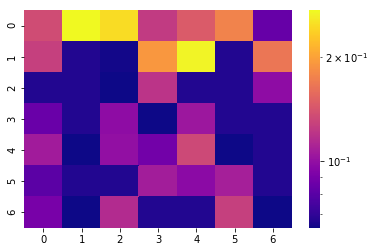

[[0.135 0.272 0.246 0.124 0.146 0.176 0.084]
 [0.127 0.067 0.065 0.191 0.267 0.067 0.166]
 [0.067 0.067 0.064 0.12  0.067 0.067 0.098]
 [0.085 0.067 0.098 0.064 0.104 0.067 0.067]
 [0.106 0.064 0.1   0.088 0.133 0.064 0.067]
 [0.081 0.067 0.067 0.107 0.097 0.108 0.067]
 [0.09  0.064 0.115 0.067 0.067 0.127 0.064]]


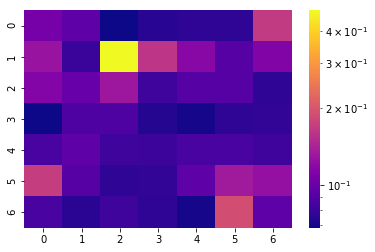

[[0.107 0.095 0.068 0.074 0.076 0.076 0.167]
 [0.128 0.08  0.48  0.16  0.117 0.091 0.113]
 [0.115 0.099 0.131 0.082 0.091 0.091 0.076]
 [0.068 0.088 0.088 0.073 0.07  0.076 0.078]
 [0.086 0.095 0.082 0.081 0.086 0.086 0.082]
 [0.171 0.091 0.076 0.078 0.095 0.134 0.125]
 [0.086 0.075 0.082 0.076 0.07  0.19  0.095]]


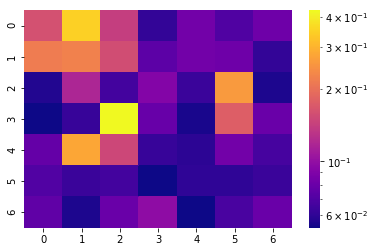

[[0.161 0.347 0.141 0.061 0.084 0.07  0.082]
 [0.218 0.224 0.157 0.075 0.084 0.082 0.061]
 [0.057 0.118 0.066 0.092 0.063 0.26  0.056]
 [0.053 0.062 0.425 0.079 0.055 0.178 0.08 ]
 [0.078 0.279 0.151 0.062 0.059 0.084 0.067]
 [0.071 0.063 0.066 0.053 0.06  0.06  0.063]
 [0.076 0.056 0.08  0.098 0.053 0.068 0.08 ]]


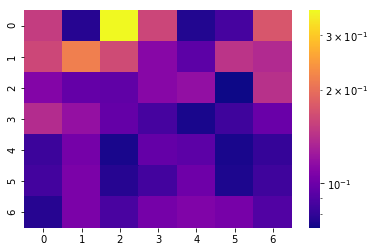

[[0.153 0.077 0.361 0.161 0.076 0.086 0.176]
 [0.162 0.218 0.165 0.112 0.094 0.145 0.137]
 [0.11  0.097 0.095 0.112 0.118 0.072 0.143]
 [0.139 0.119 0.097 0.086 0.074 0.084 0.099]
 [0.083 0.104 0.074 0.097 0.094 0.074 0.081]
 [0.085 0.107 0.077 0.085 0.101 0.075 0.084]
 [0.077 0.107 0.087 0.104 0.109 0.105 0.09 ]]


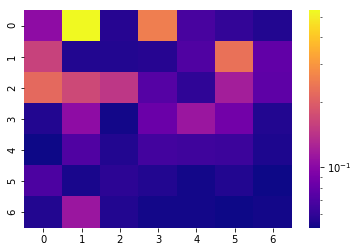

[[0.103 0.534 0.057 0.255 0.068 0.061 0.056]
 [0.16  0.056 0.056 0.057 0.071 0.233 0.079]
 [0.217 0.169 0.146 0.073 0.06  0.12  0.077]
 [0.056 0.103 0.053 0.083 0.112 0.087 0.056]
 [0.052 0.071 0.056 0.066 0.065 0.064 0.055]
 [0.07  0.054 0.059 0.056 0.053 0.056 0.052]
 [0.056 0.112 0.056 0.053 0.053 0.052 0.053]]


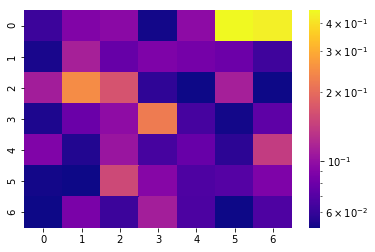

[[0.062 0.09  0.095 0.052 0.096 0.452 0.432]
 [0.053 0.113 0.077 0.088 0.084 0.08  0.063]
 [0.11  0.247 0.166 0.058 0.051 0.112 0.051]
 [0.054 0.079 0.097 0.222 0.065 0.052 0.074]
 [0.089 0.055 0.104 0.065 0.078 0.057 0.14 ]
 [0.052 0.051 0.154 0.092 0.068 0.07  0.088]
 [0.051 0.086 0.062 0.111 0.067 0.051 0.068]]


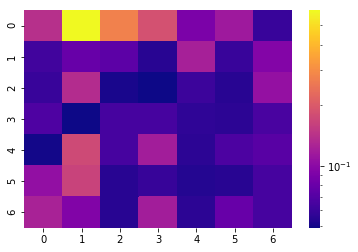

[[0.14  0.594 0.277 0.185 0.09  0.115 0.06 ]
 [0.063 0.079 0.074 0.055 0.122 0.06  0.095]
 [0.06  0.136 0.051 0.049 0.061 0.055 0.106]
 [0.068 0.049 0.065 0.065 0.057 0.056 0.066]
 [0.05  0.175 0.065 0.118 0.056 0.067 0.072]
 [0.105 0.165 0.055 0.059 0.054 0.055 0.065]
 [0.124 0.094 0.055 0.118 0.056 0.079 0.065]]


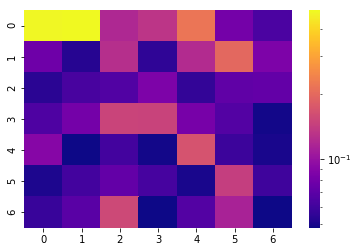

[[0.484 0.489 0.119 0.133 0.22  0.081 0.064]
 [0.078 0.053 0.126 0.055 0.123 0.198 0.085]
 [0.054 0.063 0.066 0.085 0.056 0.072 0.073]
 [0.065 0.081 0.15  0.149 0.082 0.067 0.049]
 [0.09  0.048 0.061 0.049 0.169 0.059 0.05 ]
 [0.051 0.061 0.073 0.062 0.05  0.143 0.06 ]
 [0.058 0.069 0.155 0.048 0.067 0.114 0.048]]


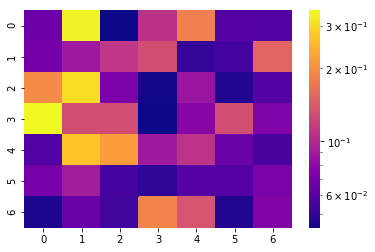

[[0.067 0.337 0.044 0.107 0.183 0.06  0.059]
 [0.07  0.089 0.111 0.13  0.051 0.055 0.152]
 [0.195 0.303 0.072 0.045 0.086 0.047 0.059]
 [0.347 0.13  0.13  0.044 0.078 0.13  0.074]
 [0.059 0.266 0.217 0.089 0.108 0.066 0.056]
 [0.071 0.091 0.055 0.05  0.06  0.06  0.073]
 [0.046 0.066 0.054 0.187 0.136 0.047 0.075]]


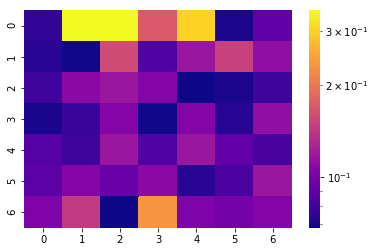

[[0.076 0.351 0.351 0.172 0.302 0.071 0.091]
 [0.073 0.069 0.159 0.085 0.117 0.149 0.112]
 [0.079 0.108 0.117 0.105 0.068 0.071 0.079]
 [0.07  0.078 0.105 0.069 0.105 0.073 0.112]
 [0.087 0.079 0.117 0.085 0.117 0.092 0.082]
 [0.089 0.105 0.094 0.108 0.073 0.084 0.117]
 [0.103 0.144 0.068 0.234 0.103 0.099 0.105]]


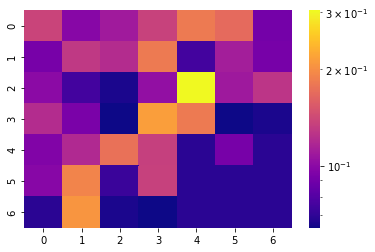

[[0.137 0.098 0.11  0.136 0.182 0.168 0.091]
 [0.092 0.129 0.121 0.182 0.075 0.112 0.092]
 [0.1   0.075 0.066 0.103 0.304 0.109 0.127]
 [0.121 0.093 0.064 0.214 0.182 0.064 0.066]
 [0.096 0.119 0.174 0.134 0.069 0.092 0.069]
 [0.098 0.191 0.073 0.135 0.069 0.069 0.069]
 [0.069 0.207 0.066 0.064 0.069 0.069 0.069]]


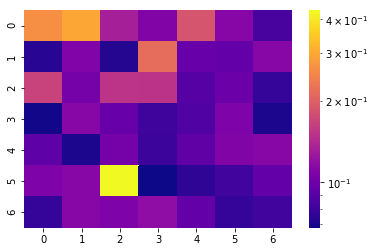

[[0.263 0.298 0.133 0.11  0.186 0.113 0.084]
 [0.074 0.109 0.073 0.216 0.097 0.096 0.113]
 [0.167 0.104 0.152 0.151 0.09  0.099 0.078]
 [0.069 0.113 0.097 0.081 0.087 0.108 0.071]
 [0.093 0.071 0.104 0.08  0.094 0.11  0.113]
 [0.108 0.113 0.432 0.068 0.076 0.082 0.096]
 [0.078 0.113 0.108 0.118 0.096 0.078 0.082]]


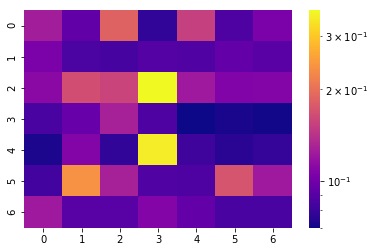

[[0.125 0.094 0.186 0.078 0.153 0.087 0.104]
 [0.104 0.086 0.084 0.089 0.088 0.095 0.091]
 [0.112 0.166 0.157 0.364 0.123 0.107 0.109]
 [0.085 0.096 0.128 0.087 0.07  0.072 0.071]
 [0.073 0.109 0.078 0.346 0.082 0.076 0.079]
 [0.083 0.237 0.128 0.088 0.087 0.172 0.123]
 [0.123 0.09  0.09  0.109 0.095 0.085 0.085]]


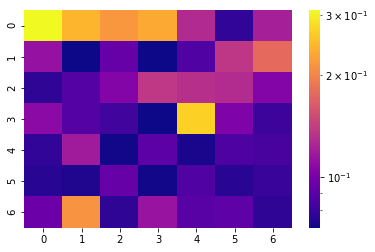

[[0.309 0.243 0.216 0.233 0.128 0.078 0.121]
 [0.113 0.071 0.094 0.071 0.087 0.136 0.176]
 [0.077 0.088 0.105 0.137 0.132 0.129 0.105]
 [0.108 0.088 0.082 0.071 0.268 0.103 0.081]
 [0.078 0.118 0.072 0.09  0.073 0.086 0.084]
 [0.076 0.074 0.094 0.072 0.087 0.076 0.08 ]
 [0.096 0.213 0.077 0.114 0.089 0.091 0.077]]


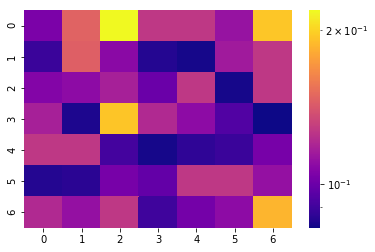

[[0.104 0.147 0.218 0.127 0.127 0.112 0.194]
 [0.089 0.145 0.108 0.085 0.083 0.115 0.127]
 [0.106 0.109 0.117 0.1   0.127 0.083 0.127]
 [0.117 0.084 0.193 0.121 0.109 0.094 0.082]
 [0.127 0.127 0.091 0.083 0.087 0.089 0.103]
 [0.085 0.086 0.103 0.098 0.127 0.127 0.111]
 [0.121 0.111 0.127 0.09  0.102 0.109 0.186]]


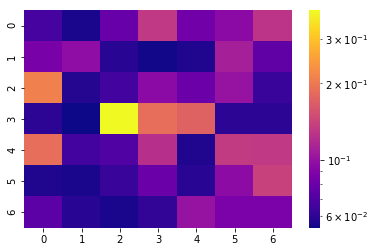

[[0.067 0.056 0.079 0.131 0.083 0.095 0.127]
 [0.086 0.097 0.059 0.055 0.057 0.11  0.076]
 [0.211 0.058 0.066 0.095 0.081 0.101 0.063]
 [0.06  0.054 0.388 0.187 0.174 0.06  0.06 ]
 [0.187 0.066 0.071 0.124 0.057 0.134 0.131]
 [0.057 0.056 0.063 0.08  0.059 0.096 0.14 ]
 [0.075 0.059 0.056 0.062 0.101 0.087 0.087]]


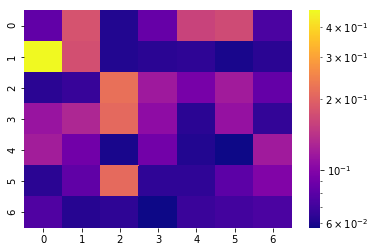

[[0.083 0.178 0.061 0.085 0.159 0.169 0.074]
 [0.471 0.174 0.061 0.063 0.064 0.059 0.063]
 [0.063 0.067 0.219 0.117 0.093 0.119 0.084]
 [0.113 0.13  0.209 0.106 0.063 0.111 0.066]
 [0.12  0.09  0.059 0.091 0.061 0.057 0.118]
 [0.063 0.082 0.21  0.065 0.065 0.081 0.099]
 [0.076 0.062 0.064 0.057 0.068 0.071 0.074]]


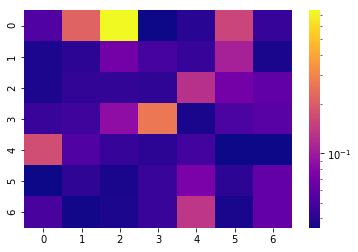

[[0.053 0.218 0.751 0.035 0.04  0.16  0.044]
 [0.038 0.041 0.069 0.049 0.044 0.107 0.037]
 [0.038 0.043 0.043 0.042 0.128 0.07  0.06 ]
 [0.045 0.047 0.088 0.265 0.037 0.051 0.056]
 [0.174 0.053 0.044 0.041 0.048 0.035 0.035]
 [0.035 0.042 0.037 0.045 0.074 0.041 0.061]
 [0.05  0.036 0.038 0.045 0.137 0.037 0.062]]


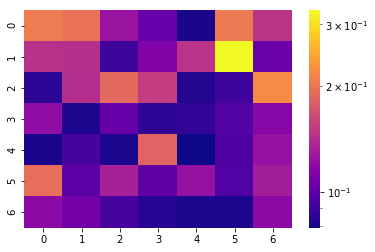

[[0.207 0.198 0.125 0.104 0.081 0.206 0.147]
 [0.145 0.143 0.09  0.114 0.146 0.329 0.105]
 [0.085 0.142 0.19  0.154 0.083 0.09  0.222]
 [0.121 0.082 0.104 0.086 0.087 0.097 0.117]
 [0.081 0.093 0.082 0.186 0.079 0.095 0.124]
 [0.194 0.1   0.133 0.101 0.124 0.096 0.131]
 [0.119 0.109 0.093 0.084 0.082 0.082 0.119]]


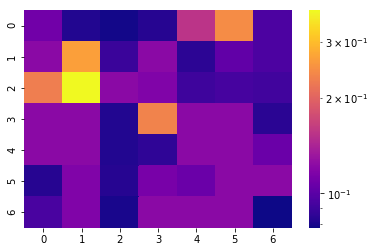

[[0.11  0.082 0.079 0.083 0.155 0.244 0.095]
 [0.122 0.266 0.089 0.122 0.085 0.103 0.095]
 [0.228 0.376 0.122 0.117 0.09  0.093 0.091]
 [0.122 0.122 0.082 0.233 0.122 0.122 0.084]
 [0.122 0.122 0.082 0.086 0.122 0.122 0.107]
 [0.083 0.117 0.083 0.113 0.107 0.122 0.122]
 [0.094 0.117 0.08  0.122 0.122 0.122 0.078]]


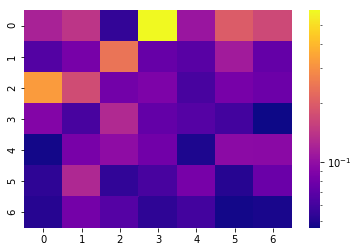

[[0.119 0.141 0.055 0.592 0.106 0.198 0.168]
 [0.066 0.083 0.242 0.075 0.068 0.112 0.074]
 [0.327 0.172 0.081 0.087 0.062 0.083 0.078]
 [0.09  0.062 0.127 0.073 0.067 0.06  0.046]
 [0.047 0.084 0.098 0.08  0.049 0.096 0.095]
 [0.053 0.125 0.054 0.062 0.083 0.051 0.077]
 [0.051 0.082 0.067 0.053 0.06  0.047 0.048]]


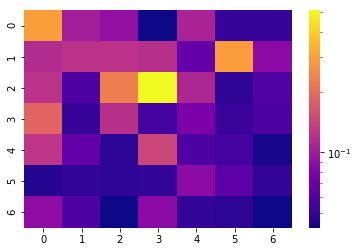

[[0.291 0.103 0.091 0.042 0.108 0.051 0.051]
 [0.115 0.123 0.123 0.12  0.067 0.29  0.086]
 [0.123 0.058 0.231 0.512 0.111 0.049 0.059]
 [0.188 0.051 0.121 0.055 0.077 0.052 0.058]
 [0.126 0.066 0.048 0.146 0.058 0.055 0.044]
 [0.046 0.05  0.049 0.05  0.087 0.063 0.05 ]
 [0.088 0.058 0.042 0.086 0.05  0.048 0.042]]


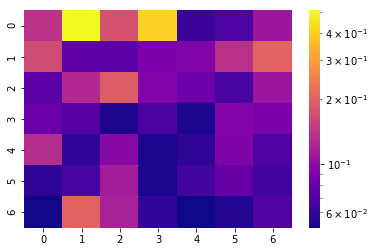

[[0.137 0.508 0.176 0.412 0.062 0.069 0.11 ]
 [0.168 0.077 0.074 0.089 0.093 0.135 0.202]
 [0.074 0.127 0.191 0.092 0.082 0.067 0.109]
 [0.081 0.072 0.054 0.068 0.054 0.094 0.089]
 [0.132 0.059 0.097 0.054 0.058 0.091 0.069]
 [0.058 0.067 0.115 0.054 0.064 0.079 0.064]
 [0.052 0.203 0.119 0.059 0.051 0.055 0.07 ]]


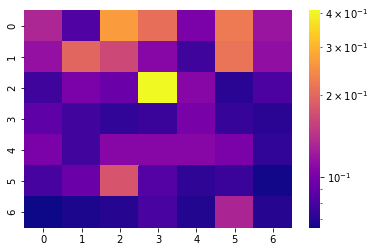

[[0.132 0.084 0.267 0.208 0.101 0.222 0.118]
 [0.115 0.198 0.165 0.107 0.077 0.215 0.113]
 [0.077 0.101 0.094 0.408 0.107 0.071 0.082]
 [0.089 0.078 0.073 0.076 0.1   0.075 0.071]
 [0.102 0.078 0.107 0.107 0.107 0.102 0.073]
 [0.08  0.094 0.178 0.085 0.072 0.076 0.066]
 [0.065 0.068 0.07  0.081 0.069 0.131 0.07 ]]


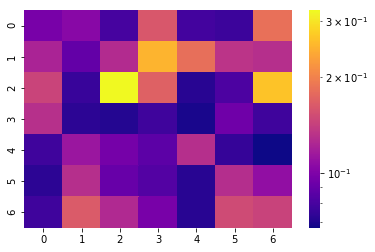

[[0.097 0.104 0.08  0.161 0.079 0.077 0.183]
 [0.121 0.089 0.127 0.249 0.182 0.133 0.129]
 [0.145 0.076 0.324 0.169 0.072 0.082 0.265]
 [0.13  0.073 0.071 0.078 0.069 0.094 0.078]
 [0.078 0.113 0.096 0.087 0.129 0.075 0.067]
 [0.073 0.129 0.091 0.084 0.072 0.128 0.108]
 [0.078 0.164 0.125 0.097 0.072 0.151 0.144]]


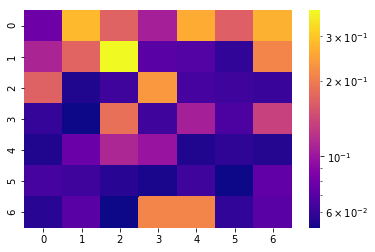

[[0.079 0.282 0.17  0.107 0.261 0.167 0.27 ]
 [0.111 0.172 0.381 0.071 0.069 0.059 0.212]
 [0.168 0.055 0.063 0.236 0.065 0.063 0.061]
 [0.06  0.052 0.186 0.063 0.107 0.067 0.135]
 [0.055 0.077 0.112 0.099 0.055 0.058 0.056]
 [0.065 0.063 0.057 0.054 0.063 0.052 0.074]
 [0.057 0.071 0.052 0.212 0.212 0.059 0.071]]


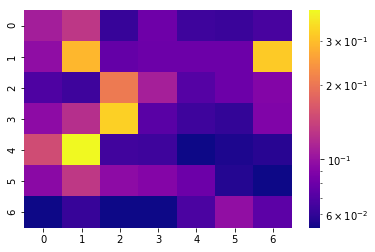

[[0.109 0.13  0.062 0.081 0.064 0.063 0.067]
 [0.097 0.291 0.077 0.08  0.08  0.08  0.319]
 [0.069 0.064 0.205 0.11  0.071 0.08  0.09 ]
 [0.095 0.123 0.328 0.073 0.064 0.061 0.089]
 [0.151 0.399 0.065 0.064 0.053 0.056 0.058]
 [0.094 0.131 0.095 0.091 0.08  0.057 0.053]
 [0.053 0.062 0.053 0.053 0.068 0.098 0.074]]
SKIPPPPPPEDDDD


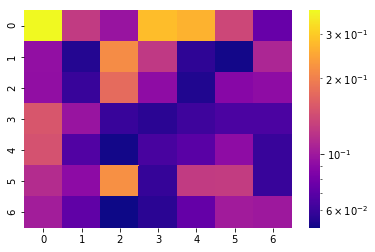

[[0.373 0.127 0.097 0.28  0.267 0.138 0.075]
 [0.094 0.055 0.216 0.125 0.057 0.052 0.11 ]
 [0.093 0.06  0.176 0.092 0.054 0.088 0.092]
 [0.153 0.097 0.06  0.056 0.061 0.065 0.065]
 [0.148 0.067 0.052 0.064 0.07  0.092 0.06 ]
 [0.115 0.091 0.221 0.059 0.127 0.128 0.06 ]
 [0.103 0.072 0.051 0.056 0.074 0.102 0.1  ]]


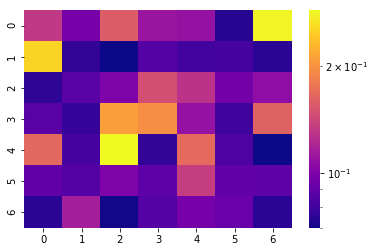

[[0.132 0.097 0.158 0.111 0.109 0.074 0.283]
 [0.253 0.077 0.07  0.086 0.081 0.082 0.075]
 [0.076 0.087 0.1   0.148 0.129 0.096 0.107]
 [0.087 0.078 0.209 0.197 0.109 0.08  0.161]
 [0.166 0.082 0.287 0.077 0.168 0.084 0.07 ]
 [0.09  0.086 0.1   0.089 0.135 0.09  0.089]
 [0.075 0.116 0.071 0.086 0.097 0.093 0.075]]


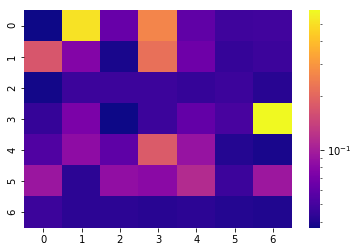

[[0.037 0.513 0.063 0.262 0.06  0.048 0.049]
 [0.171 0.077 0.039 0.218 0.066 0.045 0.047]
 [0.038 0.047 0.047 0.047 0.045 0.047 0.042]
 [0.045 0.073 0.037 0.047 0.061 0.051 0.594]
 [0.054 0.084 0.059 0.179 0.09  0.041 0.039]
 [0.092 0.043 0.086 0.081 0.114 0.047 0.094]
 [0.047 0.043 0.043 0.042 0.043 0.041 0.04 ]]


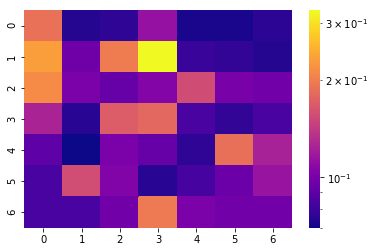

[[0.188 0.074 0.077 0.114 0.072 0.072 0.076]
 [0.232 0.097 0.199 0.327 0.079 0.078 0.074]
 [0.213 0.102 0.094 0.106 0.155 0.101 0.098]
 [0.125 0.075 0.17  0.18  0.084 0.078 0.084]
 [0.091 0.07  0.102 0.094 0.077 0.187 0.124]
 [0.084 0.156 0.104 0.075 0.083 0.096 0.115]
 [0.084 0.084 0.098 0.197 0.102 0.098 0.098]]


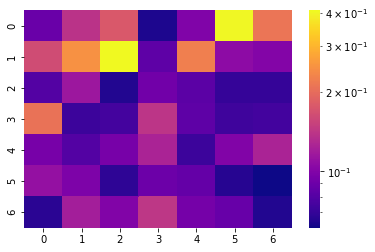

[[0.089 0.139 0.177 0.064 0.099 0.404 0.212]
 [0.163 0.249 0.408 0.084 0.225 0.106 0.101]
 [0.08  0.115 0.065 0.092 0.083 0.07  0.07 ]
 [0.208 0.072 0.075 0.141 0.084 0.073 0.074]
 [0.095 0.08  0.095 0.125 0.072 0.1   0.125]
 [0.11  0.098 0.068 0.09  0.087 0.066 0.061]
 [0.067 0.12  0.1   0.142 0.094 0.088 0.065]]


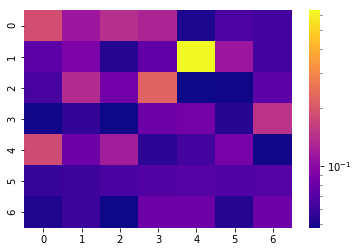

[[0.187 0.114 0.141 0.128 0.051 0.066 0.063]
 [0.074 0.091 0.053 0.076 0.635 0.113 0.063]
 [0.064 0.137 0.084 0.224 0.048 0.049 0.074]
 [0.049 0.057 0.048 0.082 0.086 0.053 0.146]
 [0.181 0.082 0.12  0.055 0.063 0.088 0.049]
 [0.058 0.06  0.065 0.069 0.07  0.069 0.07 ]
 [0.052 0.06  0.048 0.082 0.082 0.053 0.082]]


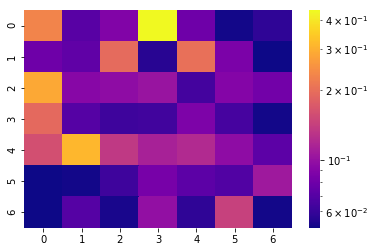

[[0.23  0.071 0.089 0.438 0.08  0.052 0.058]
 [0.08  0.074 0.195 0.056 0.201 0.086 0.051]
 [0.286 0.092 0.096 0.102 0.064 0.091 0.082]
 [0.192 0.07  0.062 0.063 0.087 0.065 0.052]
 [0.159 0.312 0.134 0.113 0.121 0.096 0.073]
 [0.051 0.052 0.062 0.084 0.073 0.069 0.106]
 [0.051 0.07  0.053 0.099 0.058 0.143 0.052]]


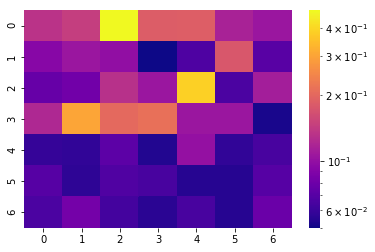

[[0.133 0.145 0.481 0.185 0.186 0.116 0.106]
 [0.093 0.106 0.099 0.05  0.067 0.177 0.071]
 [0.077 0.082 0.13  0.106 0.386 0.066 0.112]
 [0.122 0.303 0.201 0.213 0.106 0.106 0.052]
 [0.059 0.058 0.073 0.054 0.101 0.058 0.065]
 [0.07  0.057 0.068 0.065 0.055 0.055 0.07 ]
 [0.066 0.083 0.064 0.056 0.065 0.055 0.079]]


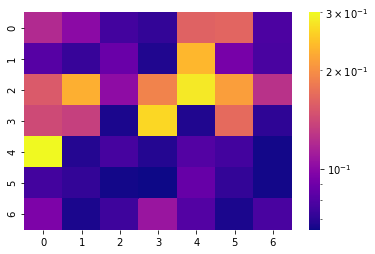

[[0.12  0.101 0.076 0.072 0.161 0.164 0.079]
 [0.082 0.073 0.088 0.068 0.235 0.093 0.078]
 [0.154 0.229 0.102 0.189 0.284 0.213 0.125]
 [0.142 0.134 0.067 0.266 0.068 0.168 0.071]
 [0.3   0.069 0.077 0.069 0.081 0.076 0.066]
 [0.076 0.072 0.066 0.065 0.087 0.072 0.066]
 [0.095 0.067 0.075 0.107 0.081 0.067 0.078]]


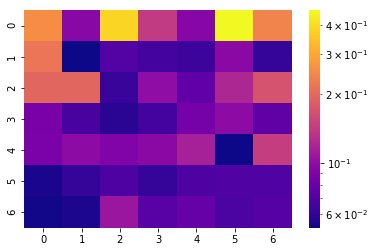

[[0.256 0.096 0.384 0.142 0.095 0.463 0.239]
 [0.218 0.052 0.071 0.066 0.063 0.097 0.061]
 [0.196 0.196 0.062 0.1   0.077 0.122 0.169]
 [0.087 0.067 0.058 0.065 0.086 0.098 0.076]
 [0.088 0.098 0.091 0.097 0.116 0.052 0.146]
 [0.054 0.061 0.069 0.061 0.069 0.07  0.07 ]
 [0.053 0.055 0.107 0.073 0.079 0.068 0.072]]


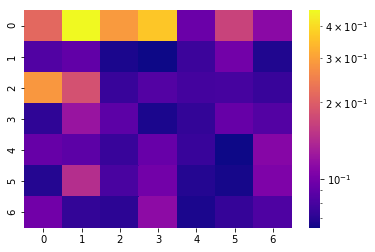

[[0.214 0.461 0.29  0.363 0.095 0.167 0.112]
 [0.084 0.091 0.067 0.064 0.076 0.099 0.068]
 [0.284 0.183 0.075 0.085 0.079 0.08  0.075]
 [0.072 0.121 0.089 0.067 0.073 0.093 0.085]
 [0.093 0.089 0.075 0.094 0.075 0.064 0.109]
 [0.069 0.144 0.081 0.099 0.069 0.066 0.105]
 [0.098 0.073 0.071 0.114 0.067 0.074 0.083]]


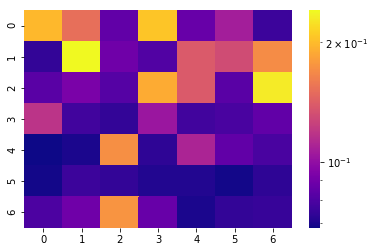

[[0.198 0.152 0.085 0.206 0.087 0.107 0.076]
 [0.074 0.241 0.089 0.081 0.139 0.131 0.17 ]
 [0.083 0.092 0.082 0.19  0.139 0.083 0.231]
 [0.118 0.077 0.074 0.103 0.077 0.079 0.085]
 [0.068 0.07  0.172 0.073 0.11  0.085 0.079]
 [0.069 0.076 0.074 0.071 0.071 0.069 0.073]
 [0.08  0.089 0.175 0.087 0.07  0.074 0.075]]
SKIPPPPPPEDDDD


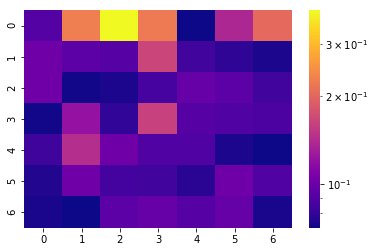

[[0.091 0.227 0.39  0.222 0.071 0.138 0.204]
 [0.102 0.094 0.092 0.165 0.084 0.078 0.074]
 [0.102 0.072 0.074 0.086 0.098 0.094 0.084]
 [0.072 0.121 0.079 0.16  0.092 0.09  0.088]
 [0.083 0.143 0.102 0.09  0.09  0.074 0.071]
 [0.075 0.102 0.085 0.084 0.077 0.102 0.09 ]
 [0.073 0.071 0.094 0.098 0.092 0.098 0.073]]


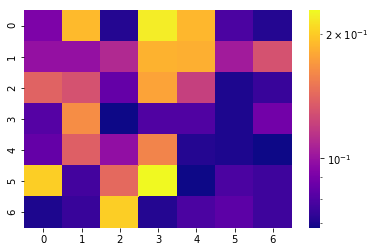

[[0.092 0.19  0.071 0.22  0.188 0.079 0.071]
 [0.099 0.099 0.11  0.186 0.184 0.104 0.13 ]
 [0.14  0.13  0.085 0.177 0.121 0.07  0.075]
 [0.081 0.164 0.068 0.08  0.08  0.07  0.089]
 [0.085 0.138 0.098 0.159 0.071 0.07  0.068]
 [0.202 0.077 0.143 0.228 0.068 0.079 0.076]
 [0.07  0.075 0.202 0.071 0.079 0.083 0.076]]


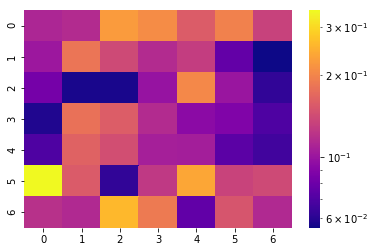

[[0.112 0.116 0.226 0.208 0.157 0.197 0.134]
 [0.102 0.183 0.14  0.116 0.13  0.077 0.055]
 [0.084 0.057 0.057 0.099 0.204 0.1   0.062]
 [0.058 0.179 0.159 0.116 0.093 0.088 0.07 ]
 [0.07  0.163 0.145 0.107 0.106 0.074 0.066]
 [0.346 0.156 0.062 0.126 0.239 0.135 0.14 ]
 [0.12  0.114 0.26  0.188 0.076 0.151 0.114]]


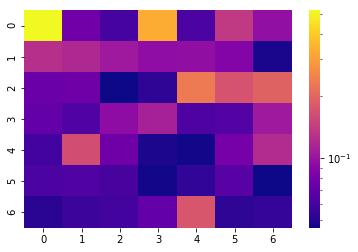

[[0.518 0.078 0.06  0.332 0.062 0.139 0.097]
 [0.127 0.119 0.105 0.095 0.096 0.087 0.048]
 [0.075 0.077 0.046 0.053 0.234 0.171 0.192]
 [0.072 0.064 0.094 0.111 0.063 0.065 0.105]
 [0.059 0.164 0.077 0.049 0.047 0.081 0.122]
 [0.062 0.064 0.061 0.047 0.054 0.067 0.046]
 [0.052 0.057 0.059 0.072 0.176 0.053 0.055]]


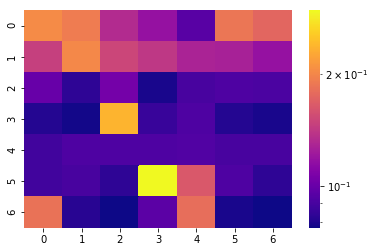

[[0.204 0.192 0.133 0.118 0.095 0.187 0.175]
 [0.146 0.202 0.151 0.141 0.128 0.127 0.118]
 [0.1   0.083 0.104 0.079 0.09  0.092 0.091]
 [0.081 0.078 0.237 0.086 0.092 0.081 0.079]
 [0.088 0.092 0.092 0.092 0.093 0.09  0.09 ]
 [0.088 0.09  0.083 0.297 0.164 0.092 0.083]
 [0.184 0.082 0.077 0.096 0.18  0.079 0.077]]


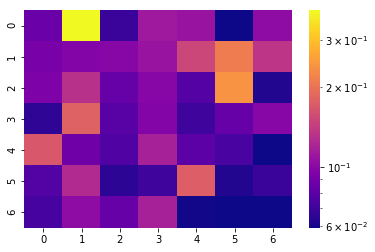

[[0.086 0.388 0.069 0.112 0.108 0.059 0.103]
 [0.092 0.097 0.099 0.108 0.151 0.212 0.135]
 [0.094 0.131 0.084 0.099 0.078 0.239 0.063]
 [0.066 0.179 0.079 0.097 0.07  0.084 0.099]
 [0.168 0.088 0.076 0.117 0.08  0.074 0.059]
 [0.077 0.125 0.065 0.07  0.176 0.063 0.069]
 [0.073 0.103 0.084 0.117 0.06  0.059 0.059]]


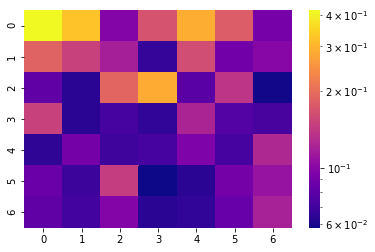

[[0.416 0.323 0.098 0.168 0.291 0.181 0.092]
 [0.188 0.15  0.118 0.067 0.162 0.089 0.1  ]
 [0.082 0.064 0.191 0.286 0.079 0.138 0.059]
 [0.15  0.064 0.072 0.066 0.123 0.077 0.073]
 [0.065 0.09  0.07  0.072 0.095 0.072 0.126]
 [0.086 0.069 0.145 0.058 0.064 0.09  0.109]
 [0.082 0.071 0.098 0.064 0.066 0.085 0.12 ]]


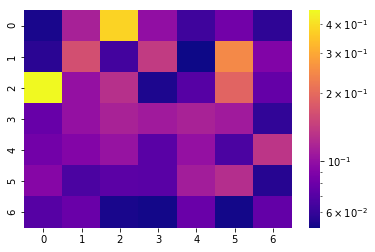

[[0.053 0.115 0.378 0.099 0.063 0.083 0.058]
 [0.057 0.163 0.064 0.14  0.051 0.247 0.09 ]
 [0.46  0.101 0.128 0.054 0.071 0.19  0.077]
 [0.078 0.101 0.116 0.109 0.116 0.109 0.059]
 [0.083 0.091 0.103 0.072 0.101 0.067 0.134]
 [0.093 0.067 0.073 0.072 0.111 0.126 0.056]
 [0.071 0.079 0.053 0.052 0.079 0.052 0.076]]
SKIPPPPPPEDDDD


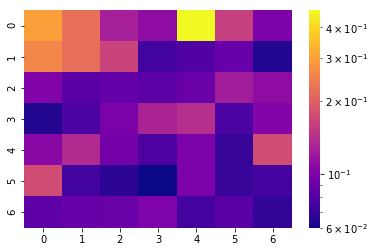

[[0.299 0.224 0.126 0.11  0.47  0.159 0.1  ]
 [0.258 0.222 0.164 0.074 0.08  0.089 0.064]
 [0.102 0.083 0.087 0.084 0.091 0.124 0.11 ]
 [0.064 0.077 0.099 0.13  0.141 0.077 0.104]
 [0.107 0.137 0.095 0.078 0.099 0.07  0.174]
 [0.174 0.074 0.067 0.06  0.099 0.071 0.075]
 [0.085 0.089 0.091 0.101 0.075 0.083 0.069]]


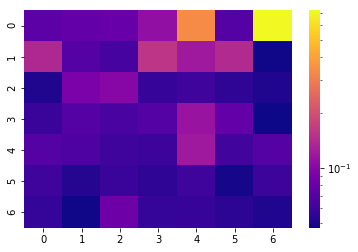

[[0.074 0.077 0.08  0.109 0.337 0.07  0.723]
 [0.137 0.07  0.064 0.156 0.119 0.141 0.048]
 [0.051 0.092 0.1   0.058 0.061 0.055 0.051]
 [0.059 0.07  0.065 0.07  0.113 0.077 0.047]
 [0.07  0.067 0.061 0.06  0.119 0.062 0.07 ]
 [0.061 0.052 0.059 0.055 0.061 0.049 0.06 ]
 [0.057 0.048 0.083 0.057 0.058 0.054 0.051]]


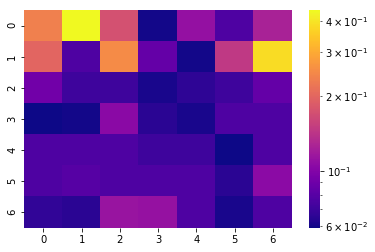

[[0.236 0.441 0.173 0.06  0.11  0.077 0.125]
 [0.198 0.077 0.251 0.086 0.06  0.146 0.383]
 [0.091 0.071 0.071 0.061 0.066 0.071 0.086]
 [0.059 0.06  0.104 0.065 0.061 0.077 0.077]
 [0.077 0.077 0.077 0.071 0.071 0.059 0.077]
 [0.077 0.08  0.077 0.077 0.077 0.065 0.105]
 [0.067 0.065 0.113 0.111 0.077 0.061 0.077]]


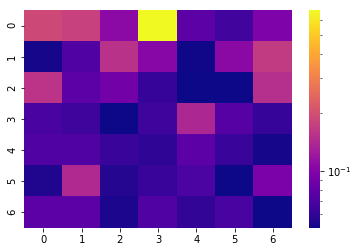

[[0.188 0.175 0.107 0.672 0.078 0.066 0.098]
 [0.053 0.072 0.153 0.103 0.052 0.106 0.166]
 [0.156 0.078 0.09  0.062 0.051 0.051 0.149]
 [0.069 0.065 0.051 0.065 0.139 0.075 0.062]
 [0.072 0.072 0.063 0.059 0.078 0.063 0.053]
 [0.055 0.142 0.056 0.063 0.07  0.051 0.095]
 [0.078 0.078 0.054 0.072 0.061 0.069 0.051]]


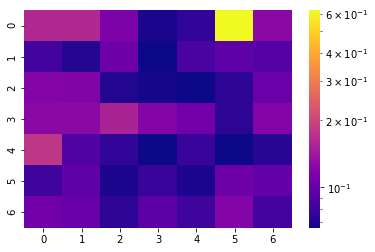

[[0.16  0.161 0.115 0.07  0.076 0.621 0.124]
 [0.083 0.072 0.105 0.066 0.086 0.097 0.092]
 [0.12  0.118 0.071 0.068 0.066 0.074 0.103]
 [0.124 0.124 0.154 0.119 0.107 0.074 0.119]
 [0.179 0.089 0.076 0.066 0.079 0.066 0.073]
 [0.082 0.097 0.069 0.079 0.069 0.105 0.099]
 [0.107 0.102 0.075 0.096 0.082 0.119 0.084]]


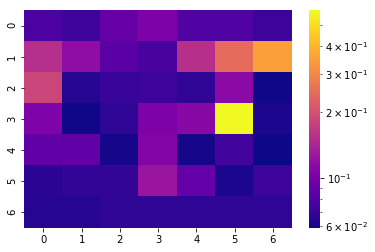

[[0.079 0.073 0.091 0.104 0.08  0.081 0.072]
 [0.153 0.117 0.085 0.077 0.155 0.246 0.353]
 [0.183 0.065 0.071 0.072 0.068 0.114 0.06 ]
 [0.105 0.06  0.067 0.104 0.112 0.584 0.062]
 [0.089 0.089 0.061 0.108 0.061 0.074 0.059]
 [0.066 0.069 0.069 0.125 0.09  0.062 0.072]
 [0.065 0.065 0.067 0.067 0.068 0.067 0.068]]


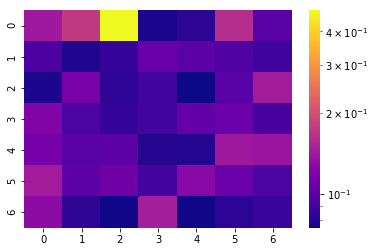

[[0.141 0.175 0.479 0.078 0.083 0.161 0.1  ]
 [0.095 0.079 0.086 0.107 0.102 0.096 0.089]
 [0.078 0.116 0.084 0.09  0.075 0.1   0.143]
 [0.121 0.094 0.086 0.09  0.106 0.108 0.093]
 [0.115 0.1   0.101 0.081 0.08  0.14  0.137]
 [0.143 0.101 0.111 0.091 0.126 0.108 0.094]
 [0.129 0.084 0.076 0.146 0.076 0.083 0.087]]


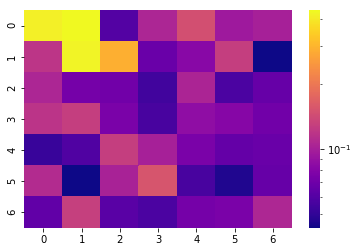

[[0.418 0.44  0.06  0.105 0.147 0.095 0.101]
 [0.12  0.426 0.29  0.068 0.082 0.128 0.043]
 [0.105 0.073 0.071 0.054 0.104 0.057 0.067]
 [0.118 0.128 0.075 0.056 0.086 0.081 0.071]
 [0.052 0.059 0.128 0.101 0.075 0.066 0.068]
 [0.11  0.043 0.102 0.154 0.056 0.046 0.067]
 [0.065 0.13  0.062 0.057 0.073 0.075 0.106]]


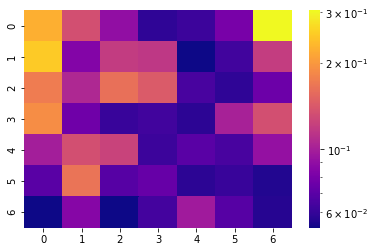

[[0.223 0.134 0.09  0.059 0.062 0.08  0.305]
 [0.251 0.084 0.119 0.116 0.053 0.063 0.12 ]
 [0.173 0.105 0.162 0.143 0.065 0.059 0.076]
 [0.19  0.077 0.061 0.063 0.058 0.101 0.134]
 [0.099 0.134 0.124 0.062 0.07  0.065 0.091]
 [0.07  0.165 0.069 0.074 0.058 0.061 0.056]
 [0.053 0.085 0.053 0.064 0.097 0.069 0.057]]


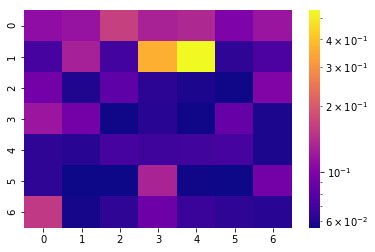

[[0.11  0.115 0.164 0.131 0.136 0.099 0.117]
 [0.072 0.128 0.071 0.361 0.541 0.064 0.075]
 [0.092 0.06  0.082 0.063 0.059 0.057 0.101]
 [0.118 0.093 0.057 0.062 0.057 0.086 0.059]
 [0.064 0.062 0.072 0.069 0.07  0.072 0.059]
 [0.064 0.056 0.056 0.132 0.057 0.056 0.093]
 [0.156 0.058 0.064 0.09  0.068 0.064 0.062]]


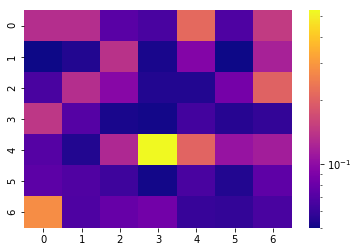

[[0.132 0.133 0.073 0.066 0.214 0.068 0.148]
 [0.05  0.054 0.137 0.052 0.093 0.05  0.12 ]
 [0.066 0.133 0.096 0.054 0.054 0.086 0.203]
 [0.142 0.071 0.052 0.051 0.064 0.055 0.059]
 [0.071 0.054 0.127 0.532 0.207 0.106 0.115]
 [0.074 0.069 0.062 0.051 0.066 0.054 0.075]
 [0.28  0.068 0.078 0.084 0.06  0.059 0.066]]


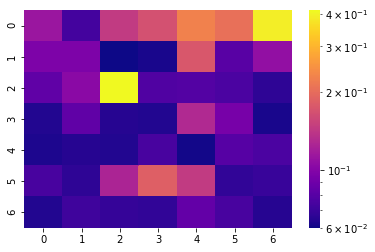

[[0.113 0.074 0.145 0.168 0.228 0.205 0.392]
 [0.097 0.097 0.06  0.062 0.176 0.081 0.108]
 [0.084 0.104 0.413 0.078 0.079 0.076 0.067]
 [0.064 0.084 0.065 0.064 0.129 0.094 0.062]
 [0.063 0.065 0.064 0.075 0.061 0.08  0.076]
 [0.075 0.067 0.125 0.185 0.145 0.068 0.07 ]
 [0.064 0.072 0.069 0.068 0.085 0.075 0.065]]


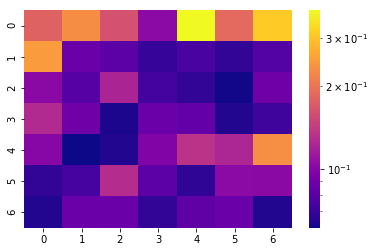

[[0.179 0.231 0.162 0.103 0.378 0.188 0.308]
 [0.247 0.088 0.082 0.07  0.076 0.069 0.079]
 [0.102 0.08  0.122 0.074 0.069 0.062 0.09 ]
 [0.127 0.09  0.064 0.088 0.085 0.065 0.072]
 [0.1   0.061 0.065 0.098 0.134 0.123 0.232]
 [0.069 0.075 0.128 0.082 0.068 0.103 0.102]
 [0.065 0.088 0.088 0.069 0.084 0.088 0.065]]


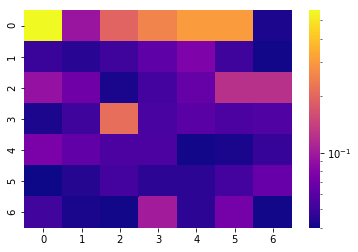

[[0.564 0.095 0.195 0.253 0.305 0.304 0.043]
 [0.05  0.045 0.051 0.063 0.078 0.051 0.041]
 [0.092 0.07  0.042 0.053 0.066 0.123 0.123]
 [0.043 0.051 0.212 0.055 0.061 0.056 0.058]
 [0.076 0.064 0.056 0.056 0.041 0.042 0.049]
 [0.04  0.044 0.053 0.046 0.046 0.053 0.067]
 [0.052 0.042 0.041 0.101 0.046 0.073 0.041]]


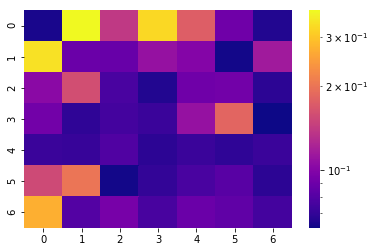

[[0.064 0.374 0.139 0.326 0.176 0.091 0.066]
 [0.338 0.089 0.088 0.109 0.1   0.063 0.115]
 [0.103 0.159 0.077 0.066 0.091 0.092 0.068]
 [0.092 0.069 0.075 0.072 0.109 0.184 0.062]
 [0.072 0.071 0.079 0.068 0.072 0.069 0.072]
 [0.155 0.201 0.063 0.07  0.077 0.082 0.068]
 [0.272 0.08  0.094 0.076 0.089 0.085 0.075]]


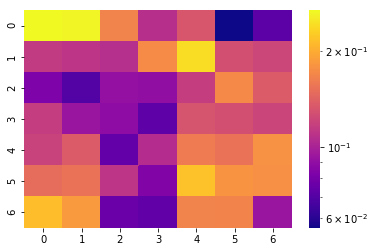

[[0.267 0.263 0.166 0.108 0.133 0.056 0.072]
 [0.115 0.111 0.107 0.173 0.24  0.128 0.122]
 [0.083 0.07  0.091 0.09  0.117 0.172 0.137]
 [0.116 0.093 0.089 0.073 0.131 0.128 0.121]
 [0.12  0.137 0.075 0.106 0.16  0.154 0.178]
 [0.149 0.154 0.111 0.084 0.217 0.18  0.177]
 [0.214 0.185 0.076 0.074 0.166 0.167 0.093]]
SKIPPPPPPEDDDD


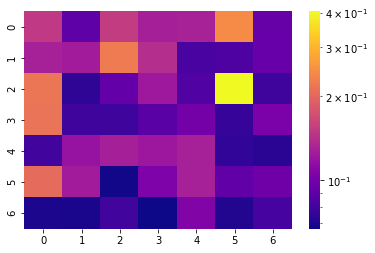

[[0.151 0.091 0.154 0.128 0.13  0.244 0.094]
 [0.129 0.126 0.225 0.14  0.083 0.085 0.095]
 [0.218 0.074 0.093 0.123 0.086 0.404 0.079]
 [0.215 0.079 0.079 0.089 0.1   0.077 0.104]
 [0.08  0.119 0.128 0.122 0.129 0.075 0.073]
 [0.205 0.126 0.068 0.105 0.129 0.092 0.098]
 [0.07  0.069 0.08  0.067 0.107 0.071 0.082]]


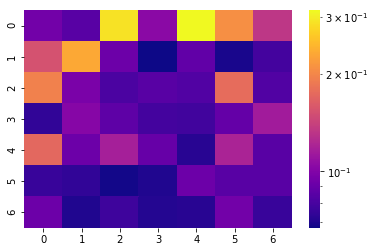

[[0.094 0.085 0.289 0.104 0.314 0.208 0.133]
 [0.154 0.232 0.092 0.067 0.088 0.069 0.079]
 [0.195 0.097 0.081 0.085 0.083 0.176 0.083]
 [0.074 0.102 0.087 0.079 0.078 0.089 0.115]
 [0.172 0.092 0.117 0.09  0.072 0.12  0.085]
 [0.076 0.074 0.068 0.07  0.092 0.085 0.085]
 [0.092 0.07  0.077 0.071 0.072 0.094 0.076]]


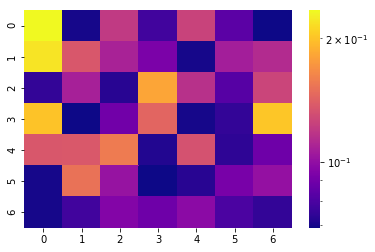

[[0.234 0.07  0.12  0.078 0.125 0.084 0.069]
 [0.22  0.136 0.109 0.093 0.07  0.107 0.113]
 [0.075 0.108 0.073 0.182 0.116 0.083 0.126]
 [0.2   0.069 0.09  0.144 0.07  0.075 0.202]
 [0.136 0.137 0.157 0.072 0.133 0.074 0.089]
 [0.07  0.152 0.102 0.069 0.073 0.092 0.101]
 [0.07  0.078 0.095 0.089 0.098 0.08  0.075]]


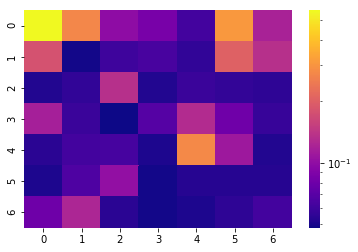

[[0.559 0.274 0.099 0.086 0.062 0.311 0.12 ]
 [0.18  0.049 0.06  0.064 0.056 0.204 0.135]
 [0.052 0.056 0.134 0.052 0.059 0.057 0.055]
 [0.116 0.059 0.048 0.069 0.129 0.081 0.058]
 [0.054 0.062 0.063 0.051 0.279 0.11  0.052]
 [0.051 0.066 0.102 0.049 0.053 0.053 0.053]
 [0.08  0.124 0.054 0.049 0.051 0.055 0.062]]


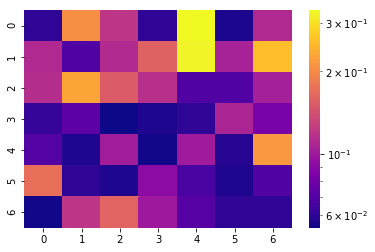

[[0.06  0.205 0.12  0.06  0.333 0.056 0.111]
 [0.111 0.069 0.112 0.158 0.325 0.106 0.257]
 [0.114 0.229 0.153 0.116 0.069 0.069 0.104]
 [0.062 0.073 0.054 0.057 0.06  0.108 0.083]
 [0.07  0.057 0.102 0.055 0.101 0.058 0.215]
 [0.171 0.06  0.057 0.092 0.067 0.057 0.069]
 [0.055 0.12  0.161 0.1   0.071 0.06  0.06 ]]


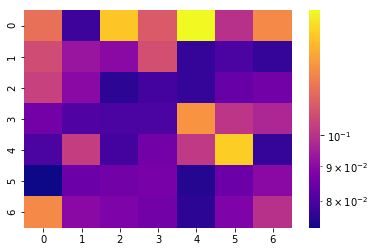

[[0.117 0.078 0.14  0.111 0.153 0.1   0.124]
 [0.107 0.093 0.09  0.108 0.077 0.08  0.077]
 [0.104 0.09  0.076 0.079 0.077 0.084 0.086]
 [0.086 0.081 0.08  0.08  0.127 0.101 0.097]
 [0.08  0.103 0.079 0.086 0.102 0.142 0.077]
 [0.073 0.085 0.086 0.087 0.075 0.085 0.09 ]
 [0.124 0.09  0.088 0.086 0.076 0.088 0.1  ]]


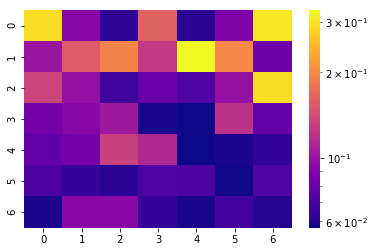

[[0.293 0.093 0.063 0.162 0.062 0.088 0.308]
 [0.101 0.157 0.195 0.126 0.33  0.201 0.082]
 [0.136 0.098 0.067 0.08  0.072 0.098 0.297]
 [0.085 0.093 0.104 0.059 0.057 0.122 0.079]
 [0.079 0.086 0.133 0.114 0.057 0.059 0.064]
 [0.071 0.065 0.062 0.072 0.071 0.058 0.072]
 [0.059 0.093 0.093 0.065 0.059 0.069 0.061]]


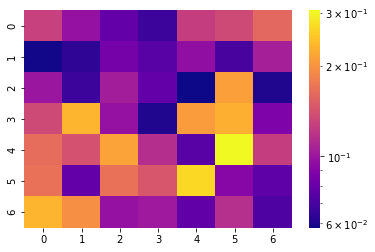

[[0.128 0.098 0.079 0.067 0.127 0.135 0.16 ]
 [0.059 0.064 0.085 0.075 0.096 0.07  0.106]
 [0.1   0.067 0.104 0.079 0.058 0.211 0.061]
 [0.135 0.231 0.098 0.061 0.209 0.227 0.088]
 [0.164 0.141 0.214 0.115 0.075 0.305 0.127]
 [0.168 0.079 0.168 0.145 0.269 0.091 0.077]
 [0.231 0.196 0.098 0.102 0.078 0.116 0.072]]


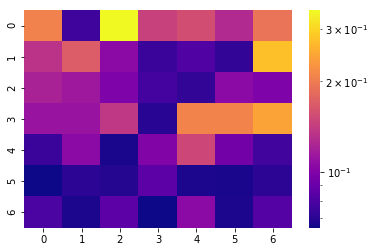

[[0.207 0.076 0.345 0.145 0.156 0.127 0.192]
 [0.134 0.17  0.105 0.075 0.082 0.073 0.276]
 [0.121 0.114 0.099 0.078 0.073 0.105 0.099]
 [0.111 0.111 0.137 0.07  0.21  0.21  0.243]
 [0.075 0.105 0.067 0.1   0.15  0.094 0.077]
 [0.065 0.071 0.069 0.086 0.068 0.067 0.071]
 [0.08  0.068 0.086 0.065 0.105 0.068 0.083]]


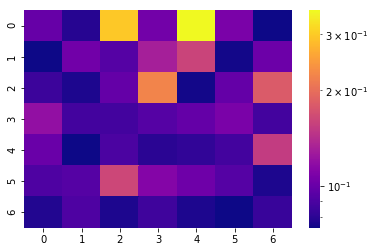

[[0.1   0.079 0.297 0.105 0.357 0.108 0.074]
 [0.074 0.104 0.093 0.131 0.16  0.075 0.102]
 [0.085 0.077 0.099 0.223 0.075 0.099 0.181]
 [0.12  0.087 0.087 0.093 0.099 0.108 0.087]
 [0.101 0.074 0.09  0.08  0.082 0.087 0.153]
 [0.091 0.093 0.163 0.113 0.103 0.093 0.077]
 [0.078 0.091 0.077 0.086 0.077 0.074 0.084]]


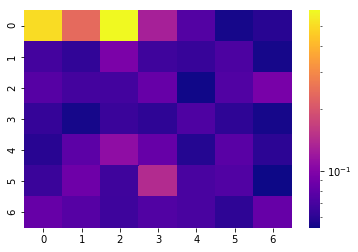

[[0.506 0.237 0.598 0.129 0.075 0.055 0.059]
 [0.069 0.062 0.096 0.067 0.064 0.072 0.055]
 [0.076 0.069 0.068 0.084 0.054 0.074 0.094]
 [0.063 0.055 0.065 0.061 0.073 0.061 0.055]
 [0.059 0.079 0.109 0.084 0.058 0.078 0.06 ]
 [0.065 0.088 0.067 0.141 0.071 0.074 0.053]
 [0.084 0.076 0.066 0.074 0.071 0.061 0.084]]


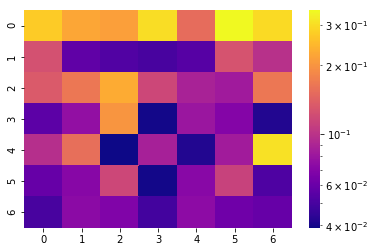

[[0.275 0.224 0.214 0.301 0.154 0.348 0.296]
 [0.125 0.057 0.053 0.05  0.054 0.127 0.099]
 [0.134 0.166 0.23  0.117 0.088 0.083 0.166]
 [0.056 0.076 0.203 0.04  0.08  0.07  0.042]
 [0.097 0.157 0.039 0.087 0.042 0.084 0.307]
 [0.059 0.071 0.117 0.04  0.072 0.112 0.052]
 [0.05  0.073 0.068 0.049 0.074 0.062 0.059]]


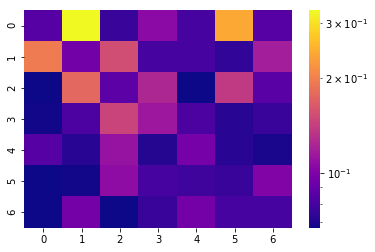

[[0.085 0.328 0.076 0.106 0.08  0.24  0.085]
 [0.195 0.095 0.153 0.08  0.08  0.074 0.118]
 [0.067 0.177 0.087 0.124 0.067 0.138 0.086]
 [0.068 0.082 0.146 0.114 0.082 0.072 0.076]
 [0.085 0.072 0.111 0.071 0.097 0.072 0.069]
 [0.067 0.068 0.107 0.08  0.078 0.076 0.101]
 [0.067 0.096 0.067 0.076 0.096 0.08  0.08 ]]


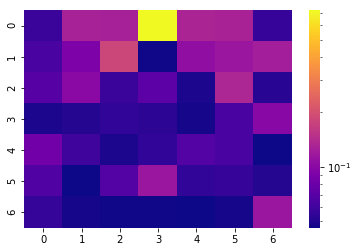

[[0.058 0.127 0.126 0.727 0.132 0.129 0.057]
 [0.064 0.091 0.182 0.047 0.106 0.114 0.124]
 [0.07  0.101 0.058 0.072 0.049 0.133 0.052]
 [0.049 0.051 0.055 0.053 0.048 0.064 0.099]
 [0.084 0.059 0.049 0.055 0.068 0.064 0.046]
 [0.067 0.046 0.068 0.114 0.055 0.057 0.051]
 [0.056 0.048 0.047 0.047 0.046 0.048 0.114]]


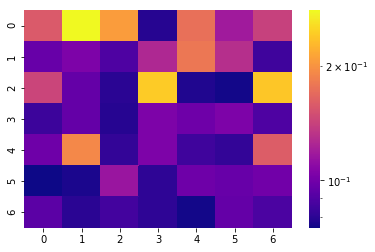

[[0.158 0.28  0.207 0.079 0.174 0.118 0.141]
 [0.097 0.104 0.089 0.126 0.179 0.13  0.085]
 [0.144 0.096 0.08  0.243 0.078 0.076 0.239]
 [0.084 0.096 0.079 0.104 0.099 0.104 0.089]
 [0.099 0.192 0.082 0.104 0.085 0.082 0.16 ]
 [0.075 0.077 0.115 0.081 0.099 0.097 0.1  ]
 [0.093 0.08  0.086 0.081 0.076 0.096 0.088]]


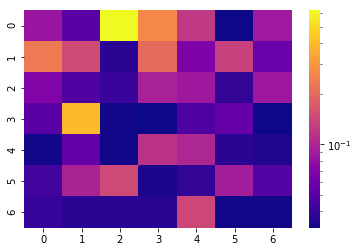

[[0.084 0.051 0.625 0.267 0.122 0.032 0.088]
 [0.234 0.148 0.037 0.204 0.067 0.132 0.058]
 [0.069 0.047 0.041 0.096 0.087 0.039 0.087]
 [0.051 0.397 0.033 0.032 0.047 0.056 0.032]
 [0.033 0.055 0.033 0.115 0.102 0.037 0.035]
 [0.043 0.098 0.146 0.034 0.039 0.092 0.049]
 [0.04  0.037 0.037 0.037 0.143 0.033 0.033]]


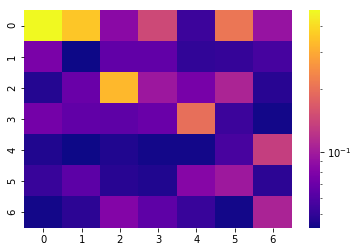

[[0.478 0.359 0.085 0.146 0.053 0.209 0.093]
 [0.077 0.043 0.066 0.066 0.05  0.051 0.056]
 [0.047 0.069 0.329 0.096 0.075 0.108 0.048]
 [0.074 0.066 0.065 0.069 0.198 0.053 0.044]
 [0.046 0.043 0.046 0.044 0.044 0.057 0.134]
 [0.052 0.064 0.048 0.046 0.083 0.097 0.049]
 [0.044 0.049 0.081 0.065 0.052 0.044 0.107]]


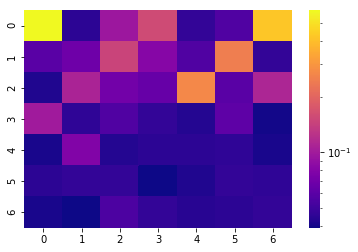

[[0.586 0.045 0.096 0.157 0.047 0.056 0.425]
 [0.06  0.069 0.147 0.081 0.056 0.247 0.047]
 [0.042 0.108 0.071 0.065 0.27  0.06  0.111]
 [0.099 0.046 0.056 0.047 0.043 0.062 0.04 ]
 [0.041 0.079 0.043 0.045 0.045 0.046 0.041]
 [0.045 0.047 0.047 0.039 0.042 0.047 0.046]
 [0.041 0.039 0.055 0.047 0.044 0.045 0.047]]


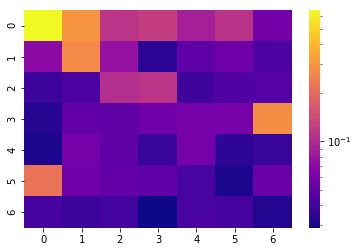

[[0.65  0.302 0.113 0.124 0.089 0.111 0.058]
 [0.071 0.268 0.077 0.034 0.049 0.056 0.043]
 [0.038 0.043 0.105 0.113 0.039 0.044 0.046]
 [0.033 0.051 0.05  0.056 0.059 0.06  0.281]
 [0.031 0.059 0.05  0.037 0.06  0.035 0.037]
 [0.216 0.056 0.051 0.049 0.042 0.031 0.054]
 [0.041 0.038 0.04  0.029 0.042 0.041 0.032]]


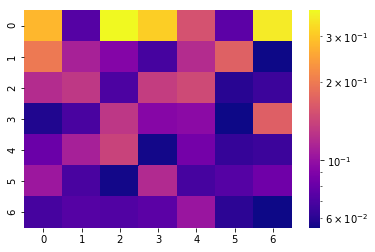

[[0.279 0.073 0.378 0.313 0.155 0.076 0.355]
 [0.199 0.112 0.092 0.068 0.121 0.171 0.055]
 [0.121 0.13  0.07  0.135 0.147 0.06  0.065]
 [0.058 0.069 0.129 0.093 0.096 0.055 0.169]
 [0.081 0.111 0.14  0.056 0.085 0.063 0.065]
 [0.105 0.069 0.056 0.119 0.068 0.073 0.083]
 [0.068 0.073 0.072 0.075 0.103 0.061 0.055]]


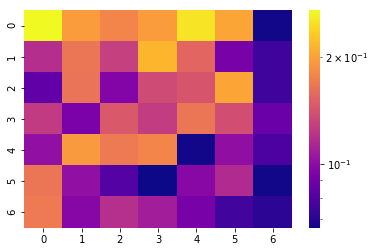

[[0.271 0.196 0.179 0.196 0.253 0.203 0.067]
 [0.118 0.167 0.129 0.215 0.155 0.092 0.075]
 [0.085 0.165 0.096 0.136 0.143 0.203 0.075]
 [0.126 0.093 0.146 0.127 0.167 0.139 0.087]
 [0.102 0.194 0.17  0.179 0.067 0.101 0.079]
 [0.167 0.102 0.081 0.066 0.098 0.116 0.067]
 [0.17  0.097 0.119 0.109 0.092 0.076 0.071]]


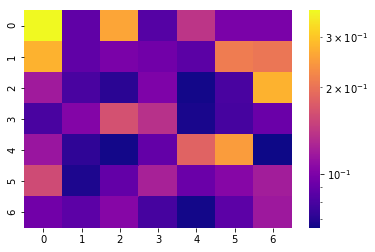

[[0.371 0.088 0.259 0.084 0.14  0.099 0.099]
 [0.276 0.088 0.099 0.095 0.086 0.212 0.205]
 [0.119 0.08  0.071 0.101 0.066 0.08  0.276]
 [0.08  0.103 0.164 0.136 0.067 0.079 0.092]
 [0.115 0.072 0.066 0.089 0.183 0.249 0.065]
 [0.159 0.068 0.089 0.124 0.092 0.104 0.12 ]
 [0.095 0.087 0.104 0.079 0.066 0.087 0.117]]


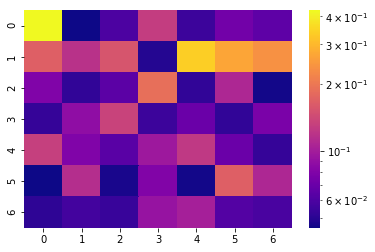

[[0.426 0.045 0.06  0.129 0.055 0.074 0.066]
 [0.167 0.118 0.154 0.049 0.341 0.269 0.238]
 [0.08  0.052 0.065 0.188 0.052 0.108 0.046]
 [0.053 0.088 0.134 0.055 0.071 0.052 0.077]
 [0.131 0.08  0.064 0.096 0.124 0.071 0.053]
 [0.045 0.114 0.047 0.081 0.046 0.167 0.108]
 [0.051 0.057 0.054 0.092 0.101 0.062 0.059]]


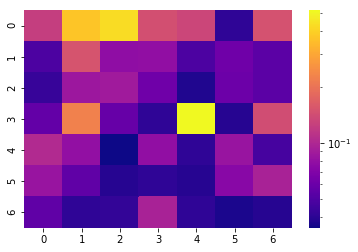

[[0.124 0.371 0.43  0.145 0.133 0.041 0.149]
 [0.049 0.152 0.078 0.079 0.049 0.062 0.054]
 [0.043 0.086 0.089 0.062 0.038 0.061 0.054]
 [0.057 0.227 0.058 0.041 0.516 0.039 0.142]
 [0.103 0.08  0.035 0.079 0.041 0.083 0.047]
 [0.083 0.056 0.039 0.041 0.039 0.074 0.095]
 [0.056 0.041 0.042 0.096 0.041 0.037 0.039]]


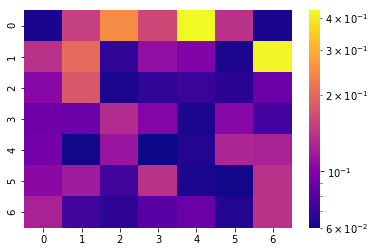

[[0.062 0.153 0.25  0.162 0.428 0.139 0.062]
 [0.139 0.204 0.068 0.109 0.099 0.063 0.417]
 [0.104 0.18  0.063 0.068 0.071 0.066 0.09 ]
 [0.091 0.09  0.133 0.101 0.063 0.102 0.074]
 [0.094 0.061 0.114 0.06  0.064 0.128 0.125]
 [0.105 0.118 0.073 0.139 0.063 0.061 0.139]
 [0.125 0.073 0.067 0.081 0.089 0.064 0.139]]


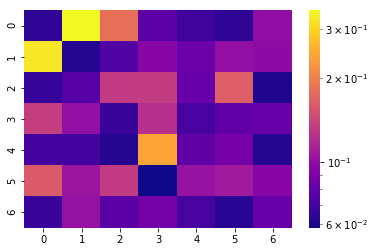

[[0.064 0.35  0.181 0.078 0.069 0.064 0.099]
 [0.325 0.062 0.074 0.095 0.084 0.101 0.098]
 [0.066 0.076 0.132 0.133 0.082 0.164 0.061]
 [0.135 0.101 0.067 0.123 0.071 0.08  0.082]
 [0.07  0.07  0.062 0.24  0.079 0.088 0.062]
 [0.16  0.105 0.132 0.058 0.103 0.108 0.095]
 [0.067 0.102 0.077 0.087 0.071 0.063 0.082]]


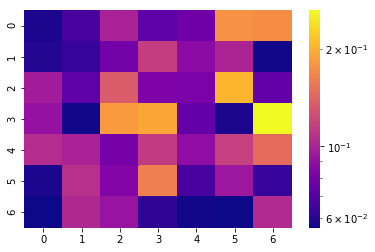

[[0.058 0.067 0.1   0.073 0.078 0.176 0.173]
 [0.059 0.063 0.079 0.116 0.088 0.101 0.057]
 [0.096 0.073 0.135 0.082 0.081 0.203 0.074]
 [0.091 0.057 0.183 0.191 0.074 0.058 0.263]
 [0.105 0.1   0.08  0.114 0.089 0.117 0.146]
 [0.058 0.108 0.084 0.161 0.067 0.094 0.063]
 [0.056 0.103 0.092 0.061 0.057 0.056 0.104]]


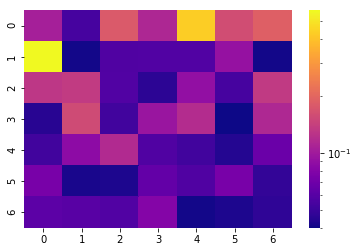

[[0.104 0.054 0.179 0.112 0.434 0.16  0.188]
 [0.569 0.041 0.057 0.058 0.058 0.092 0.041]
 [0.13  0.135 0.058 0.046 0.09  0.054 0.134]
 [0.045 0.157 0.052 0.095 0.118 0.04  0.113]
 [0.052 0.087 0.116 0.057 0.052 0.044 0.068]
 [0.075 0.042 0.043 0.065 0.057 0.075 0.048]
 [0.062 0.06  0.058 0.081 0.041 0.043 0.047]]


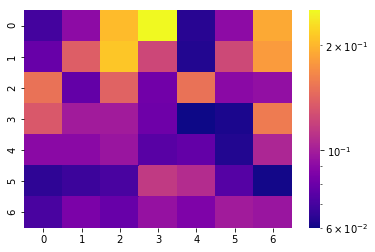

[[0.07  0.091 0.204 0.252 0.064 0.091 0.191]
 [0.079 0.138 0.212 0.123 0.063 0.124 0.181]
 [0.152 0.078 0.141 0.082 0.152 0.09  0.093]
 [0.134 0.099 0.099 0.081 0.06  0.062 0.158]
 [0.09  0.09  0.096 0.075 0.078 0.063 0.104]
 [0.065 0.068 0.071 0.115 0.108 0.074 0.061]
 [0.071 0.085 0.079 0.094 0.086 0.099 0.096]]


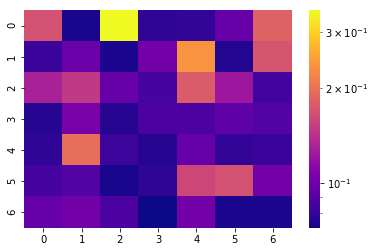

[[0.168 0.074 0.351 0.079 0.08  0.097 0.183]
 [0.082 0.099 0.075 0.102 0.236 0.076 0.171]
 [0.129 0.147 0.097 0.086 0.177 0.122 0.085]
 [0.077 0.105 0.077 0.088 0.088 0.094 0.09 ]
 [0.079 0.195 0.083 0.077 0.097 0.08  0.082]
 [0.086 0.09  0.074 0.079 0.159 0.168 0.102]
 [0.097 0.102 0.088 0.072 0.102 0.075 0.075]]


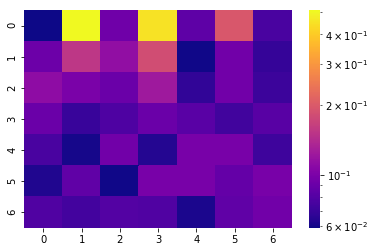

[[0.059 0.508 0.093 0.453 0.085 0.196 0.076]
 [0.092 0.153 0.113 0.181 0.06  0.094 0.069]
 [0.111 0.099 0.091 0.123 0.068 0.094 0.071]
 [0.091 0.07  0.078 0.091 0.083 0.073 0.082]
 [0.076 0.061 0.094 0.064 0.098 0.098 0.072]
 [0.063 0.086 0.06  0.098 0.098 0.088 0.098]
 [0.079 0.074 0.08  0.079 0.062 0.086 0.094]]


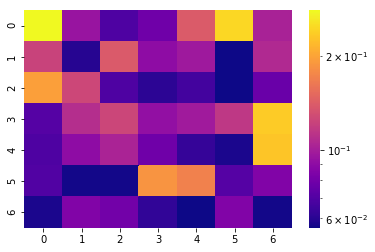

[[0.281 0.094 0.069 0.079 0.14  0.247 0.102]
 [0.123 0.06  0.139 0.09  0.097 0.056 0.106]
 [0.197 0.126 0.069 0.061 0.066 0.056 0.077]
 [0.071 0.109 0.125 0.092 0.098 0.115 0.236]
 [0.069 0.09  0.103 0.079 0.063 0.058 0.231]
 [0.07  0.057 0.057 0.187 0.171 0.071 0.085]
 [0.058 0.085 0.08  0.062 0.056 0.085 0.057]]


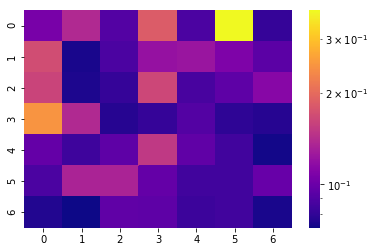

[[0.106 0.138 0.091 0.184 0.088 0.373 0.081]
 [0.17  0.074 0.088 0.121 0.123 0.109 0.094]
 [0.161 0.075 0.081 0.164 0.087 0.095 0.113]
 [0.246 0.138 0.077 0.081 0.091 0.079 0.077]
 [0.098 0.084 0.095 0.151 0.096 0.085 0.073]
 [0.088 0.134 0.134 0.098 0.085 0.085 0.099]
 [0.076 0.072 0.096 0.095 0.083 0.085 0.074]]


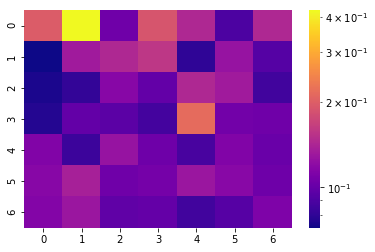

[[0.198 0.421 0.105 0.19  0.144 0.09  0.144]
 [0.072 0.133 0.144 0.158 0.08  0.126 0.093]
 [0.075 0.081 0.117 0.099 0.144 0.133 0.086]
 [0.077 0.099 0.096 0.087 0.216 0.106 0.105]
 [0.114 0.084 0.126 0.104 0.088 0.114 0.102]
 [0.117 0.137 0.105 0.108 0.129 0.118 0.104]
 [0.115 0.129 0.098 0.1   0.086 0.094 0.112]]


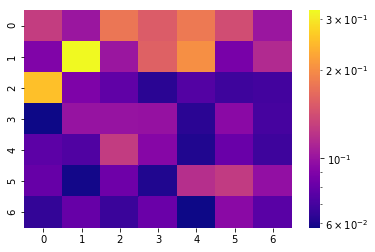

[[0.129 0.102 0.179 0.154 0.181 0.141 0.102]
 [0.09  0.32  0.102 0.158 0.203 0.087 0.115]
 [0.254 0.089 0.078 0.063 0.074 0.068 0.069]
 [0.058 0.1   0.1   0.099 0.063 0.094 0.07 ]
 [0.077 0.073 0.128 0.092 0.061 0.081 0.068]
 [0.08  0.059 0.083 0.061 0.118 0.127 0.098]
 [0.065 0.08  0.067 0.082 0.058 0.094 0.076]]


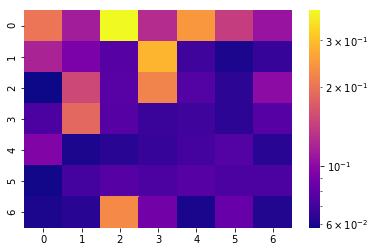

[[0.202 0.114 0.39  0.126 0.245 0.142 0.107]
 [0.119 0.092 0.077 0.285 0.069 0.061 0.067]
 [0.058 0.152 0.078 0.219 0.076 0.064 0.101]
 [0.074 0.186 0.077 0.068 0.069 0.064 0.077]
 [0.095 0.061 0.063 0.067 0.071 0.076 0.063]
 [0.059 0.071 0.077 0.074 0.077 0.074 0.074]
 [0.061 0.063 0.227 0.088 0.06  0.084 0.062]]


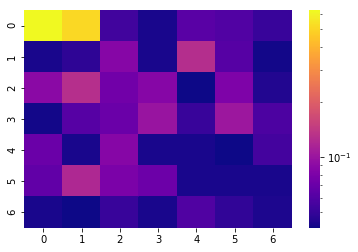

[[0.632 0.514 0.054 0.043 0.063 0.06  0.051]
 [0.043 0.048 0.086 0.043 0.126 0.062 0.042]
 [0.089 0.128 0.074 0.086 0.041 0.082 0.045]
 [0.042 0.062 0.071 0.099 0.051 0.102 0.058]
 [0.071 0.043 0.086 0.043 0.043 0.041 0.055]
 [0.067 0.12  0.08  0.072 0.043 0.043 0.043]
 [0.043 0.041 0.051 0.043 0.059 0.049 0.044]]


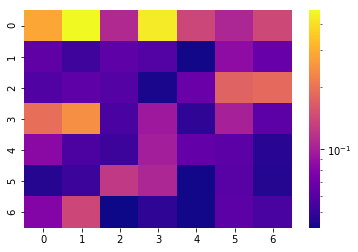

[[0.288 0.465 0.109 0.43  0.139 0.106 0.142]
 [0.064 0.053 0.063 0.059 0.043 0.085 0.067]
 [0.058 0.063 0.06  0.044 0.068 0.176 0.186]
 [0.193 0.244 0.056 0.095 0.048 0.101 0.062]
 [0.083 0.057 0.052 0.099 0.065 0.062 0.047]
 [0.046 0.052 0.124 0.106 0.043 0.061 0.046]
 [0.08  0.14  0.042 0.048 0.043 0.062 0.056]]


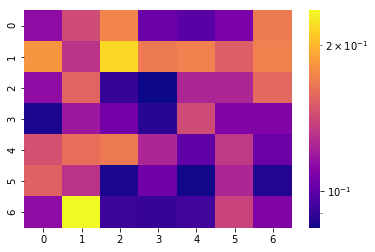

[[0.114 0.143 0.174 0.103 0.099 0.108 0.168]
 [0.183 0.131 0.218 0.167 0.171 0.153 0.171]
 [0.114 0.156 0.091 0.084 0.125 0.125 0.158]
 [0.086 0.119 0.106 0.088 0.143 0.11  0.11 ]
 [0.146 0.162 0.167 0.125 0.101 0.134 0.104]
 [0.155 0.131 0.086 0.105 0.085 0.125 0.087]
 [0.114 0.236 0.092 0.091 0.093 0.139 0.11 ]]


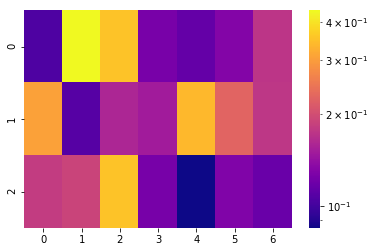

[[0.105 0.436 0.355 0.125 0.115 0.131 0.174]
 [0.306 0.109 0.159 0.151 0.339 0.227 0.176]
 [0.181 0.189 0.355 0.124 0.085 0.129 0.117]]


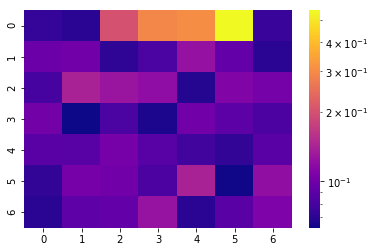

[[0.074 0.07  0.202 0.292 0.306 0.551 0.075]
 [0.098 0.101 0.072 0.082 0.125 0.094 0.07 ]
 [0.08  0.141 0.128 0.12  0.068 0.111 0.103]
 [0.102 0.063 0.082 0.066 0.101 0.09  0.083]
 [0.089 0.088 0.104 0.088 0.078 0.073 0.089]
 [0.073 0.104 0.101 0.083 0.141 0.064 0.121]
 [0.07  0.091 0.094 0.126 0.07  0.089 0.109]]


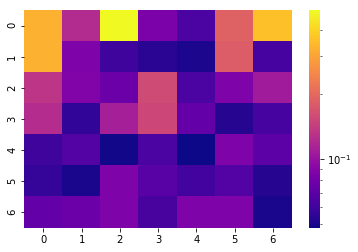

[[0.327 0.123 0.491 0.084 0.064 0.189 0.358]
 [0.327 0.086 0.06  0.054 0.051 0.183 0.062]
 [0.133 0.087 0.077 0.158 0.064 0.086 0.107]
 [0.124 0.056 0.111 0.154 0.074 0.053 0.062]
 [0.06  0.067 0.049 0.064 0.048 0.086 0.07 ]
 [0.057 0.05  0.086 0.069 0.061 0.067 0.053]
 [0.074 0.077 0.086 0.063 0.086 0.086 0.05 ]]


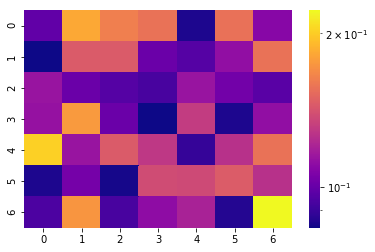

[[0.099 0.183 0.163 0.157 0.085 0.156 0.109]
 [0.083 0.145 0.145 0.101 0.096 0.112 0.157]
 [0.114 0.101 0.096 0.093 0.114 0.103 0.097]
 [0.113 0.176 0.101 0.083 0.131 0.085 0.112]
 [0.202 0.114 0.145 0.129 0.089 0.126 0.157]
 [0.085 0.104 0.084 0.138 0.137 0.146 0.126]
 [0.094 0.174 0.093 0.111 0.12  0.086 0.222]]


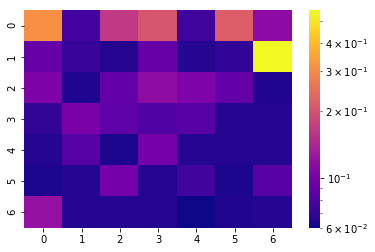

[[0.307 0.076 0.164 0.203 0.074 0.217 0.115]
 [0.092 0.071 0.065 0.092 0.065 0.069 0.56 ]
 [0.104 0.064 0.09  0.116 0.105 0.091 0.064]
 [0.07  0.102 0.088 0.081 0.085 0.065 0.065]
 [0.065 0.083 0.063 0.101 0.065 0.065 0.065]
 [0.063 0.065 0.099 0.065 0.075 0.063 0.085]
 [0.121 0.065 0.065 0.065 0.06  0.064 0.065]]


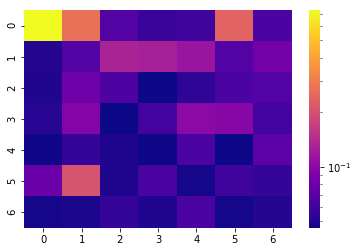

[[0.734 0.273 0.068 0.058 0.059 0.241 0.065]
 [0.051 0.068 0.131 0.126 0.113 0.068 0.085]
 [0.05  0.082 0.066 0.046 0.054 0.065 0.068]
 [0.052 0.097 0.046 0.061 0.102 0.098 0.061]
 [0.047 0.056 0.05  0.047 0.065 0.046 0.072]
 [0.08  0.207 0.05  0.064 0.048 0.06  0.056]
 [0.048 0.049 0.056 0.05  0.065 0.048 0.051]]


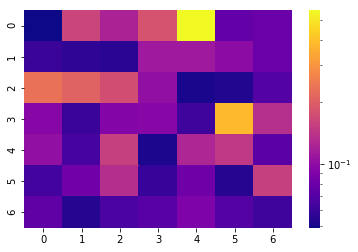

[[0.049 0.163 0.122 0.183 0.555 0.076 0.08 ]
 [0.06  0.056 0.055 0.112 0.112 0.099 0.08 ]
 [0.233 0.209 0.176 0.103 0.051 0.053 0.069]
 [0.096 0.06  0.094 0.095 0.062 0.386 0.134]
 [0.103 0.064 0.155 0.052 0.125 0.145 0.072]
 [0.063 0.083 0.133 0.059 0.082 0.054 0.155]
 [0.075 0.054 0.066 0.071 0.09  0.07  0.062]]
SKIPPPPPPEDDDD


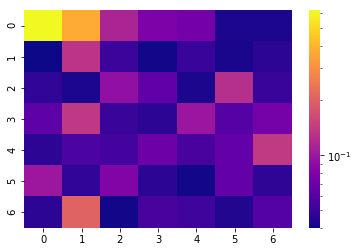

[[0.624 0.371 0.114 0.079 0.074 0.043 0.043]
 [0.04  0.132 0.051 0.041 0.05  0.042 0.046]
 [0.048 0.043 0.093 0.065 0.043 0.126 0.05 ]
 [0.064 0.136 0.05  0.046 0.099 0.06  0.075]
 [0.046 0.056 0.054 0.071 0.055 0.066 0.14 ]
 [0.1   0.048 0.082 0.046 0.041 0.066 0.047]
 [0.046 0.206 0.041 0.055 0.052 0.044 0.06 ]]


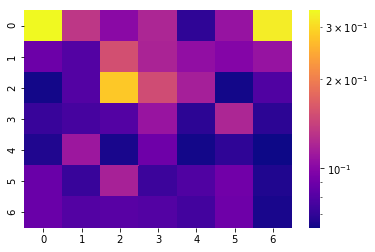

[[0.342 0.133 0.102 0.121 0.07  0.108 0.326]
 [0.089 0.08  0.154 0.119 0.105 0.099 0.108]
 [0.064 0.08  0.281 0.151 0.116 0.064 0.079]
 [0.072 0.076 0.08  0.109 0.069 0.121 0.069]
 [0.066 0.111 0.065 0.09  0.064 0.07  0.063]
 [0.088 0.072 0.118 0.073 0.079 0.091 0.066]
 [0.088 0.08  0.082 0.08  0.075 0.09  0.065]]


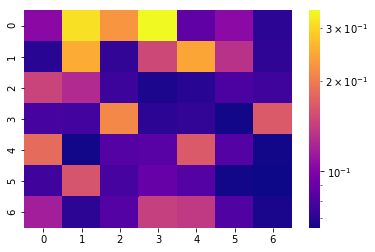

[[0.104 0.311 0.227 0.342 0.087 0.105 0.071]
 [0.07  0.252 0.073 0.151 0.244 0.132 0.072]
 [0.147 0.126 0.075 0.068 0.07  0.08  0.076]
 [0.078 0.077 0.213 0.071 0.073 0.066 0.166]
 [0.183 0.066 0.083 0.084 0.166 0.083 0.066]
 [0.076 0.161 0.078 0.089 0.083 0.066 0.065]
 [0.118 0.071 0.083 0.143 0.138 0.082 0.067]]


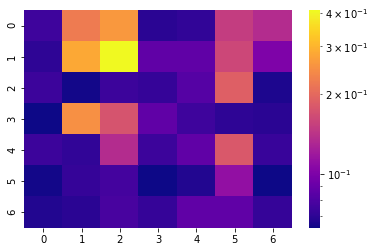

[[0.075 0.223 0.261 0.069 0.071 0.151 0.135]
 [0.07  0.282 0.409 0.087 0.087 0.161 0.101]
 [0.074 0.064 0.074 0.072 0.083 0.188 0.066]
 [0.063 0.249 0.175 0.087 0.075 0.07  0.069]
 [0.074 0.071 0.135 0.074 0.087 0.18  0.073]
 [0.064 0.072 0.077 0.063 0.067 0.112 0.063]
 [0.067 0.069 0.078 0.072 0.087 0.087 0.072]]


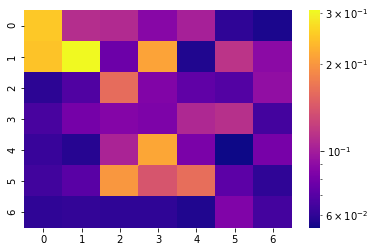

[[0.251 0.11  0.108 0.087 0.102 0.06  0.056]
 [0.245 0.306 0.077 0.213 0.057 0.115 0.089]
 [0.059 0.068 0.16  0.085 0.073 0.069 0.091]
 [0.066 0.08  0.086 0.083 0.107 0.112 0.065]
 [0.062 0.058 0.104 0.216 0.082 0.054 0.081]
 [0.064 0.071 0.201 0.14  0.161 0.072 0.06 ]
 [0.06  0.061 0.06  0.06  0.057 0.084 0.065]]


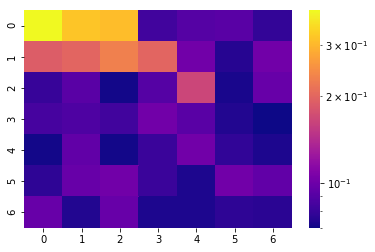

[[0.394 0.318 0.307 0.083 0.09  0.092 0.079]
 [0.19  0.199 0.231 0.198 0.102 0.075 0.102]
 [0.08  0.092 0.071 0.09  0.166 0.072 0.098]
 [0.085 0.088 0.083 0.102 0.092 0.074 0.07 ]
 [0.071 0.095 0.071 0.081 0.102 0.078 0.073]
 [0.077 0.098 0.102 0.081 0.073 0.102 0.095]
 [0.098 0.074 0.098 0.073 0.073 0.077 0.076]]


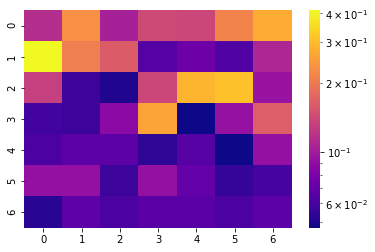

[[0.115 0.233 0.104 0.142 0.138 0.215 0.273]
 [0.412 0.206 0.163 0.065 0.074 0.063 0.108]
 [0.132 0.057 0.05  0.139 0.287 0.31  0.095]
 [0.059 0.057 0.088 0.262 0.047 0.093 0.166]
 [0.062 0.067 0.067 0.053 0.065 0.047 0.092]
 [0.092 0.092 0.057 0.092 0.07  0.055 0.06 ]
 [0.052 0.068 0.062 0.066 0.066 0.062 0.067]]


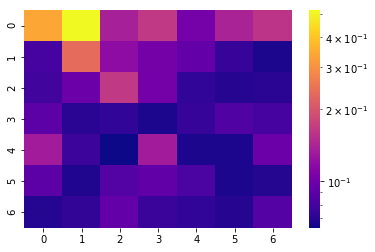

[[0.341 0.519 0.137 0.165 0.103 0.141 0.159]
 [0.081 0.235 0.119 0.102 0.094 0.075 0.067]
 [0.079 0.098 0.165 0.102 0.073 0.07  0.071]
 [0.09  0.071 0.073 0.067 0.075 0.085 0.081]
 [0.133 0.077 0.064 0.133 0.067 0.067 0.098]
 [0.09  0.068 0.086 0.093 0.083 0.067 0.069]
 [0.069 0.074 0.094 0.076 0.073 0.07  0.087]]


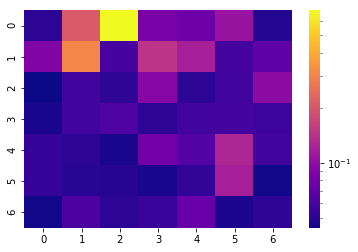

[[0.051 0.206 0.683 0.084 0.078 0.107 0.048]
 [0.09  0.308 0.06  0.145 0.119 0.059 0.071]
 [0.044 0.058 0.052 0.093 0.051 0.058 0.098]
 [0.046 0.058 0.063 0.051 0.058 0.059 0.056]
 [0.054 0.051 0.046 0.08  0.065 0.126 0.058]
 [0.054 0.05  0.049 0.046 0.053 0.119 0.045]
 [0.045 0.062 0.051 0.055 0.075 0.047 0.052]]


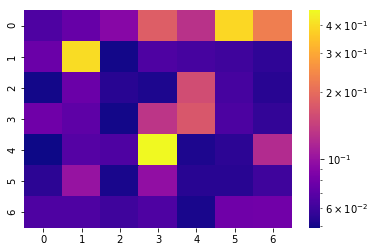

[[0.066 0.075 0.091 0.18  0.128 0.387 0.227]
 [0.077 0.397 0.05  0.066 0.063 0.061 0.056]
 [0.05  0.077 0.054 0.052 0.158 0.063 0.054]
 [0.079 0.072 0.05  0.132 0.171 0.065 0.057]
 [0.049 0.068 0.066 0.464 0.052 0.055 0.122]
 [0.055 0.1   0.051 0.097 0.054 0.054 0.061]
 [0.066 0.066 0.061 0.066 0.051 0.079 0.08 ]]


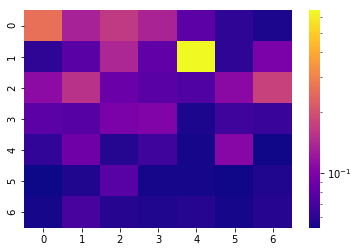

[[0.261 0.134 0.165 0.136 0.08  0.061 0.056]
 [0.061 0.079 0.139 0.083 0.647 0.061 0.098]
 [0.11  0.154 0.087 0.079 0.074 0.108 0.178]
 [0.08  0.077 0.098 0.101 0.056 0.067 0.065]
 [0.062 0.09  0.058 0.067 0.055 0.106 0.054]
 [0.053 0.057 0.078 0.055 0.055 0.054 0.057]
 [0.055 0.071 0.059 0.057 0.059 0.055 0.059]]


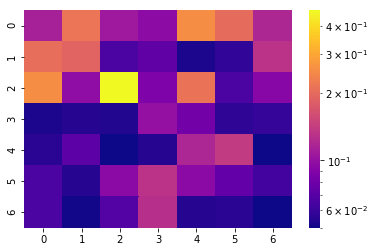

[[0.113 0.217 0.107 0.096 0.255 0.202 0.119]
 [0.205 0.192 0.066 0.074 0.053 0.058 0.131]
 [0.255 0.098 0.469 0.088 0.212 0.066 0.092]
 [0.053 0.055 0.054 0.1   0.082 0.057 0.059]
 [0.056 0.072 0.05  0.055 0.118 0.14  0.05 ]
 [0.066 0.055 0.095 0.131 0.095 0.076 0.063]
 [0.066 0.051 0.069 0.128 0.055 0.056 0.05 ]]


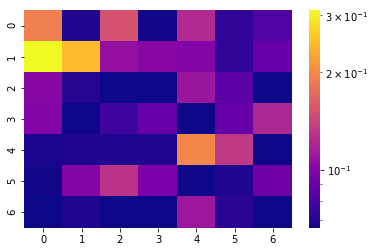

[[0.19  0.069 0.152 0.067 0.123 0.072 0.082]
 [0.311 0.246 0.107 0.102 0.1   0.072 0.089]
 [0.102 0.07  0.066 0.066 0.11  0.085 0.066]
 [0.1   0.066 0.076 0.089 0.066 0.089 0.121]
 [0.068 0.069 0.069 0.069 0.198 0.133 0.066]
 [0.067 0.1   0.129 0.096 0.066 0.069 0.092]
 [0.066 0.069 0.066 0.066 0.111 0.071 0.066]]


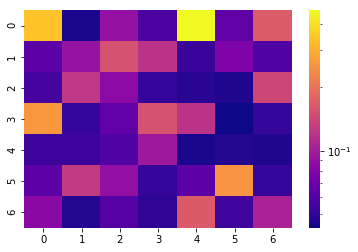

[[0.342 0.045 0.09  0.058 0.464 0.065 0.167]
 [0.064 0.092 0.156 0.12  0.052 0.078 0.059]
 [0.056 0.125 0.085 0.051 0.048 0.046 0.142]
 [0.26  0.051 0.065 0.156 0.12  0.043 0.051]
 [0.053 0.053 0.06  0.096 0.045 0.047 0.046]
 [0.064 0.128 0.089 0.051 0.063 0.252 0.051]
 [0.084 0.047 0.061 0.049 0.165 0.054 0.104]]


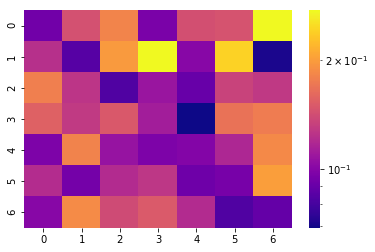

[[0.093 0.144 0.181 0.096 0.143 0.145 0.273]
 [0.123 0.085 0.197 0.273 0.101 0.24  0.071]
 [0.177 0.126 0.083 0.108 0.09  0.135 0.128]
 [0.155 0.129 0.149 0.112 0.069 0.168 0.175]
 [0.097 0.18  0.107 0.097 0.099 0.118 0.185]
 [0.121 0.094 0.12  0.127 0.092 0.095 0.2  ]
 [0.101 0.186 0.14  0.15  0.12  0.083 0.089]]


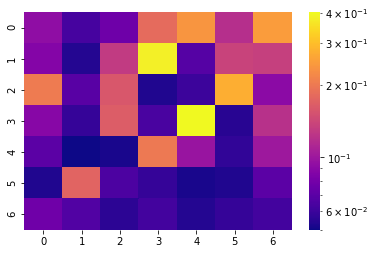

[[0.093 0.063 0.077 0.183 0.24  0.119 0.25 ]
 [0.087 0.054 0.13  0.383 0.068 0.138 0.134]
 [0.203 0.069 0.159 0.053 0.06  0.276 0.091]
 [0.089 0.058 0.166 0.064 0.402 0.055 0.121]
 [0.07  0.05  0.052 0.2   0.098 0.057 0.101]
 [0.053 0.174 0.065 0.058 0.052 0.053 0.07 ]
 [0.078 0.067 0.056 0.062 0.054 0.058 0.062]]


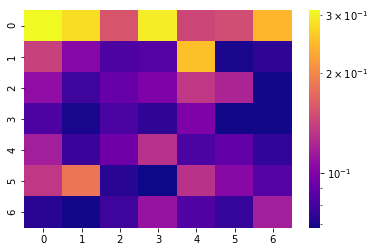

[[0.31  0.281 0.156 0.296 0.146 0.15  0.244]
 [0.141 0.103 0.083 0.085 0.253 0.07  0.074]
 [0.107 0.078 0.091 0.099 0.134 0.121 0.069]
 [0.083 0.07  0.082 0.074 0.099 0.069 0.069]
 [0.117 0.077 0.094 0.129 0.082 0.089 0.075]
 [0.134 0.183 0.073 0.068 0.13  0.104 0.085]
 [0.073 0.069 0.078 0.11  0.084 0.076 0.117]]


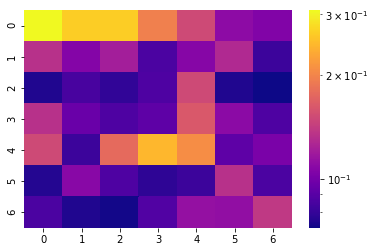

[[0.308 0.265 0.265 0.196 0.151 0.11  0.105]
 [0.133 0.106 0.121 0.086 0.107 0.128 0.082]
 [0.075 0.085 0.079 0.087 0.151 0.075 0.072]
 [0.133 0.096 0.087 0.092 0.163 0.109 0.087]
 [0.151 0.082 0.177 0.245 0.208 0.092 0.102]
 [0.076 0.108 0.087 0.078 0.082 0.133 0.086]
 [0.086 0.075 0.073 0.088 0.113 0.112 0.139]]


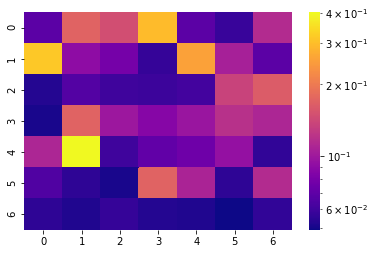

[[0.069 0.171 0.148 0.296 0.069 0.058 0.115]
 [0.316 0.091 0.079 0.057 0.255 0.106 0.069]
 [0.053 0.066 0.06  0.059 0.061 0.136 0.164]
 [0.051 0.172 0.099 0.087 0.097 0.12  0.11 ]
 [0.11  0.402 0.06  0.071 0.076 0.094 0.056]
 [0.065 0.055 0.051 0.172 0.108 0.055 0.115]
 [0.055 0.052 0.057 0.053 0.052 0.049 0.056]]


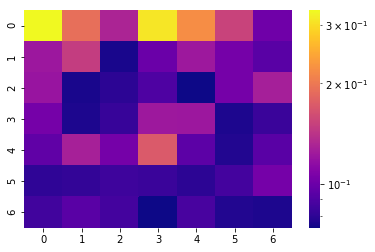

[[0.331 0.191 0.131 0.31  0.22  0.153 0.102]
 [0.122 0.149 0.076 0.1   0.123 0.104 0.094]
 [0.12  0.076 0.08  0.09  0.074 0.104 0.127]
 [0.104 0.077 0.083 0.123 0.122 0.077 0.084]
 [0.096 0.128 0.104 0.172 0.095 0.078 0.094]
 [0.081 0.082 0.085 0.084 0.08  0.087 0.104]
 [0.086 0.094 0.087 0.074 0.088 0.078 0.077]]


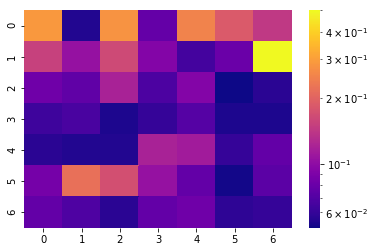

[[0.29  0.055 0.28  0.078 0.251 0.185 0.143]
 [0.152 0.105 0.164 0.093 0.065 0.081 0.5  ]
 [0.083 0.076 0.119 0.068 0.093 0.051 0.057]
 [0.063 0.067 0.054 0.06  0.071 0.054 0.054]
 [0.057 0.055 0.055 0.119 0.113 0.06  0.077]
 [0.086 0.22  0.171 0.105 0.077 0.052 0.074]
 [0.077 0.069 0.057 0.077 0.083 0.058 0.06 ]]


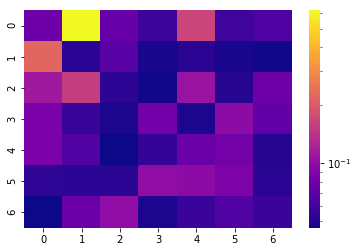

[[0.079 0.622 0.076 0.058 0.166 0.059 0.065]
 [0.223 0.052 0.069 0.048 0.052 0.048 0.047]
 [0.112 0.156 0.053 0.047 0.106 0.051 0.079]
 [0.087 0.056 0.049 0.081 0.049 0.098 0.073]
 [0.086 0.066 0.046 0.055 0.078 0.082 0.051]
 [0.054 0.053 0.052 0.1   0.098 0.088 0.052]
 [0.046 0.078 0.1   0.049 0.057 0.066 0.057]]


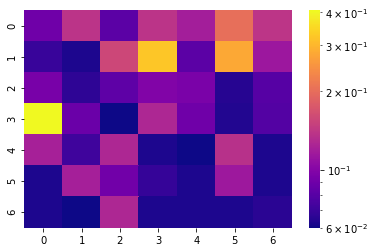

[[0.09  0.138 0.082 0.138 0.119 0.203 0.139]
 [0.07  0.063 0.157 0.325 0.082 0.28  0.114]
 [0.094 0.067 0.083 0.099 0.095 0.065 0.08 ]
 [0.407 0.088 0.06  0.126 0.09  0.064 0.079]
 [0.121 0.072 0.126 0.063 0.06  0.135 0.063]
 [0.063 0.12  0.091 0.069 0.063 0.115 0.063]
 [0.063 0.06  0.126 0.063 0.063 0.063 0.066]]


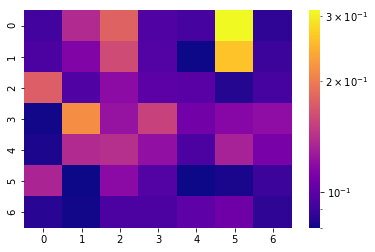

[[0.092 0.138 0.179 0.096 0.093 0.311 0.087]
 [0.095 0.114 0.161 0.097 0.08  0.262 0.09 ]
 [0.176 0.096 0.119 0.1   0.099 0.084 0.093]
 [0.081 0.215 0.123 0.154 0.108 0.116 0.12 ]
 [0.083 0.138 0.141 0.121 0.095 0.132 0.11 ]
 [0.134 0.08  0.118 0.097 0.08  0.082 0.09 ]
 [0.085 0.081 0.095 0.095 0.101 0.107 0.087]]


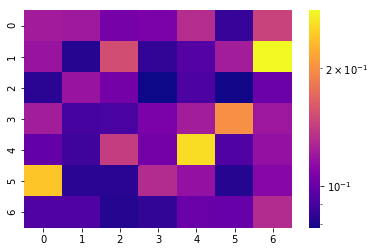

[[0.122 0.121 0.105 0.107 0.132 0.086 0.146]
 [0.118 0.082 0.153 0.085 0.094 0.123 0.282]
 [0.083 0.118 0.104 0.078 0.092 0.079 0.101]
 [0.123 0.09  0.091 0.107 0.123 0.201 0.12 ]
 [0.099 0.088 0.142 0.104 0.26  0.093 0.116]
 [0.241 0.083 0.083 0.131 0.116 0.082 0.111]
 [0.093 0.093 0.082 0.085 0.101 0.1   0.131]]


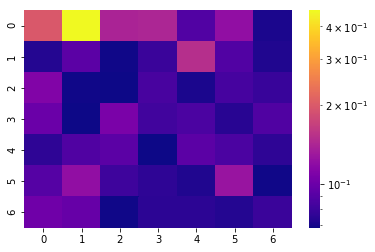

[[0.199 0.461 0.14  0.142 0.089 0.121 0.071]
 [0.073 0.093 0.069 0.08  0.151 0.089 0.072]
 [0.112 0.069 0.068 0.085 0.071 0.084 0.079]
 [0.1   0.068 0.108 0.082 0.086 0.074 0.088]
 [0.076 0.088 0.093 0.068 0.093 0.086 0.076]
 [0.09  0.121 0.081 0.076 0.072 0.126 0.069]
 [0.102 0.098 0.069 0.075 0.075 0.073 0.08 ]]


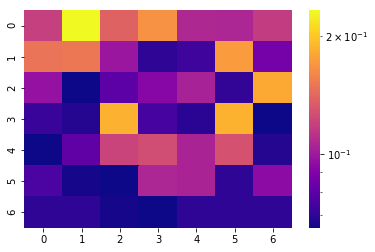

[[0.119 0.232 0.138 0.167 0.107 0.106 0.117]
 [0.149 0.151 0.099 0.07  0.073 0.173 0.087]
 [0.097 0.065 0.08  0.092 0.104 0.071 0.181]
 [0.072 0.068 0.186 0.075 0.069 0.187 0.065]
 [0.065 0.081 0.121 0.126 0.105 0.129 0.068]
 [0.076 0.066 0.065 0.106 0.105 0.07  0.094]
 [0.07  0.07  0.066 0.065 0.07  0.07  0.07 ]]


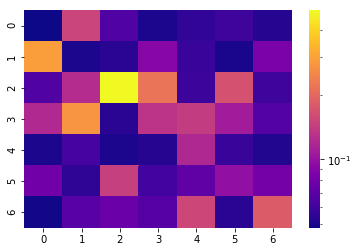

[[0.048 0.152 0.066 0.051 0.056 0.06  0.053]
 [0.294 0.051 0.054 0.091 0.058 0.05  0.085]
 [0.066 0.124 0.496 0.219 0.059 0.168 0.06 ]
 [0.121 0.279 0.054 0.133 0.142 0.109 0.067]
 [0.051 0.062 0.051 0.053 0.12  0.058 0.052]
 [0.08  0.055 0.145 0.061 0.072 0.098 0.081]
 [0.049 0.069 0.076 0.068 0.155 0.054 0.182]]
SKIPPPPPPEDDDD


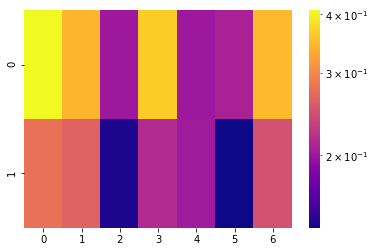

[[0.408 0.343 0.201 0.364 0.201 0.209 0.348]
 [0.278 0.265 0.144 0.216 0.203 0.14  0.248]]


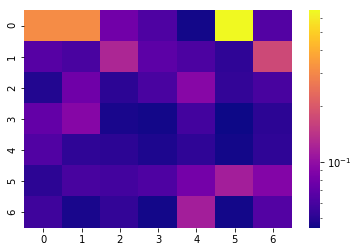

[[0.313 0.313 0.079 0.063 0.045 0.658 0.065]
 [0.066 0.061 0.124 0.069 0.062 0.052 0.172]
 [0.048 0.078 0.051 0.061 0.093 0.053 0.06 ]
 [0.072 0.092 0.046 0.045 0.058 0.044 0.051]
 [0.064 0.052 0.051 0.047 0.052 0.045 0.052]
 [0.051 0.06  0.058 0.063 0.081 0.116 0.09 ]
 [0.057 0.046 0.053 0.045 0.116 0.045 0.065]]


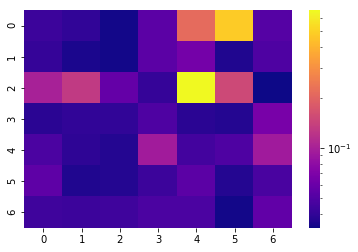

[[0.043 0.04  0.034 0.054 0.216 0.483 0.051]
 [0.041 0.035 0.034 0.054 0.065 0.036 0.049]
 [0.1   0.129 0.058 0.041 0.668 0.152 0.033]
 [0.038 0.04  0.04  0.049 0.038 0.037 0.067]
 [0.048 0.039 0.037 0.095 0.045 0.049 0.093]
 [0.055 0.036 0.037 0.043 0.054 0.037 0.047]
 [0.044 0.043 0.044 0.048 0.048 0.034 0.056]]


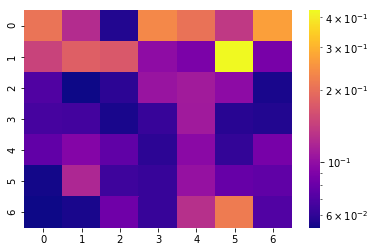

[[0.207 0.124 0.057 0.234 0.204 0.136 0.269]
 [0.146 0.179 0.171 0.098 0.088 0.428 0.087]
 [0.07  0.053 0.059 0.104 0.11  0.097 0.055]
 [0.067 0.066 0.055 0.062 0.109 0.058 0.057]
 [0.077 0.093 0.076 0.059 0.096 0.061 0.086]
 [0.054 0.119 0.064 0.062 0.102 0.079 0.076]
 [0.053 0.055 0.083 0.062 0.127 0.216 0.071]]


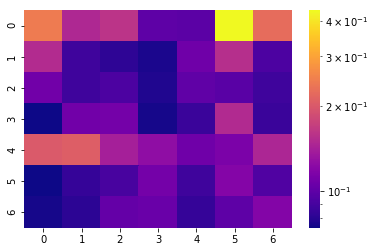

[[0.245 0.149 0.16  0.1   0.099 0.437 0.226]
 [0.152 0.088 0.082 0.077 0.108 0.155 0.093]
 [0.109 0.088 0.093 0.078 0.101 0.098 0.088]
 [0.074 0.109 0.11  0.076 0.086 0.151 0.086]
 [0.202 0.207 0.141 0.126 0.108 0.114 0.147]
 [0.074 0.084 0.091 0.11  0.088 0.119 0.094]
 [0.076 0.081 0.103 0.105 0.084 0.1   0.118]]


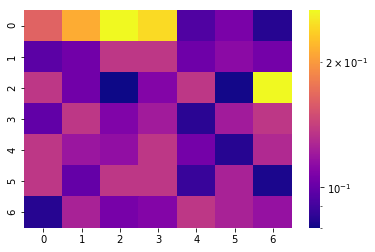

[[0.164 0.213 0.265 0.244 0.094 0.107 0.084]
 [0.097 0.104 0.136 0.136 0.103 0.113 0.105]
 [0.136 0.104 0.08  0.11  0.136 0.081 0.266]
 [0.099 0.136 0.109 0.122 0.085 0.122 0.136]
 [0.136 0.119 0.115 0.136 0.105 0.084 0.129]
 [0.136 0.1   0.136 0.136 0.088 0.125 0.082]
 [0.084 0.125 0.106 0.11  0.136 0.125 0.117]]


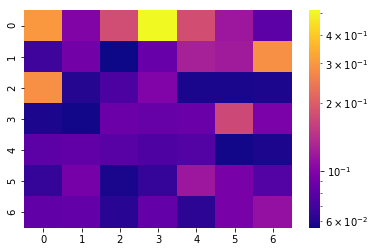

[[0.302 0.1   0.178 0.515 0.179 0.117 0.08 ]
 [0.069 0.091 0.056 0.086 0.126 0.121 0.286]
 [0.286 0.061 0.074 0.099 0.058 0.058 0.059]
 [0.059 0.057 0.088 0.085 0.087 0.172 0.096]
 [0.08  0.083 0.079 0.075 0.077 0.057 0.059]
 [0.066 0.094 0.058 0.066 0.117 0.095 0.077]
 [0.083 0.084 0.062 0.084 0.063 0.095 0.112]]


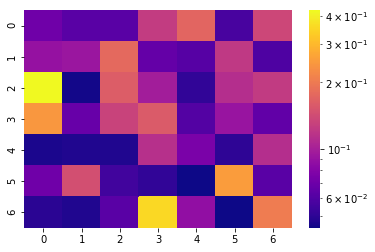

[[0.071 0.063 0.063 0.126 0.172 0.057 0.137]
 [0.09  0.093 0.178 0.067 0.062 0.122 0.059]
 [0.424 0.045 0.162 0.098 0.051 0.112 0.125]
 [0.243 0.068 0.133 0.16  0.061 0.091 0.066]
 [0.046 0.047 0.047 0.114 0.076 0.05  0.112]
 [0.071 0.146 0.055 0.051 0.044 0.252 0.063]
 [0.049 0.047 0.063 0.357 0.087 0.044 0.204]]


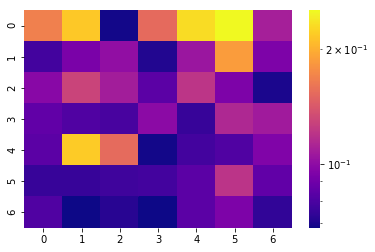

[[0.168 0.217 0.069 0.153 0.23  0.252 0.109]
 [0.078 0.093 0.101 0.071 0.105 0.187 0.094]
 [0.098 0.129 0.108 0.084 0.121 0.094 0.07 ]
 [0.086 0.081 0.079 0.099 0.075 0.114 0.107]
 [0.084 0.219 0.154 0.069 0.078 0.081 0.095]
 [0.075 0.075 0.077 0.078 0.084 0.12  0.086]
 [0.081 0.068 0.072 0.068 0.084 0.094 0.074]]
SKIPPPPPPEDDDD


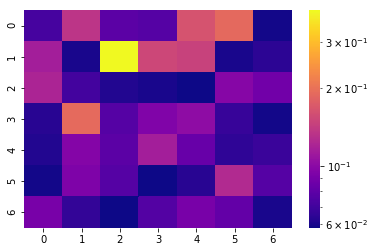

[[0.072 0.135 0.079 0.077 0.164 0.189 0.059]
 [0.115 0.06  0.396 0.152 0.147 0.06  0.064]
 [0.121 0.071 0.062 0.06  0.058 0.098 0.088]
 [0.063 0.19  0.077 0.095 0.102 0.067 0.059]
 [0.062 0.097 0.079 0.115 0.084 0.065 0.068]
 [0.059 0.094 0.077 0.058 0.063 0.125 0.077]
 [0.091 0.066 0.058 0.076 0.091 0.082 0.06 ]]


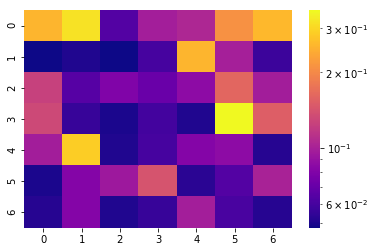

[[0.256 0.319 0.064 0.098 0.104 0.21  0.261]
 [0.048 0.051 0.048 0.06  0.256 0.099 0.057]
 [0.125 0.065 0.08  0.071 0.086 0.162 0.097]
 [0.132 0.056 0.05  0.059 0.051 0.354 0.153]
 [0.097 0.287 0.051 0.06  0.082 0.086 0.052]
 [0.05  0.082 0.094 0.143 0.053 0.064 0.101]
 [0.052 0.082 0.051 0.056 0.098 0.061 0.052]]


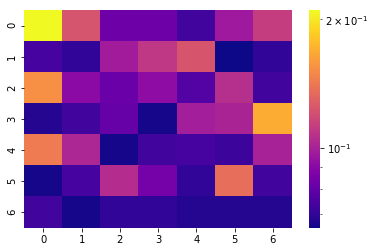

[[0.21  0.123 0.083 0.083 0.073 0.097 0.113]
 [0.074 0.07  0.098 0.11  0.124 0.065 0.07 ]
 [0.154 0.091 0.082 0.092 0.077 0.106 0.073]
 [0.068 0.073 0.081 0.066 0.099 0.101 0.169]
 [0.143 0.102 0.066 0.073 0.074 0.072 0.1  ]
 [0.066 0.074 0.105 0.085 0.07  0.136 0.073]
 [0.073 0.066 0.07  0.07  0.068 0.068 0.068]]


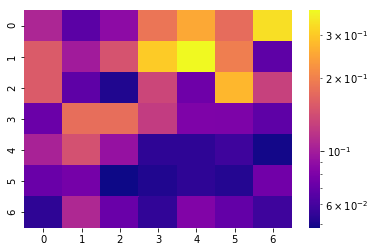

[[0.106 0.067 0.088 0.186 0.252 0.176 0.334]
 [0.155 0.099 0.147 0.304 0.38  0.196 0.068]
 [0.155 0.068 0.051 0.135 0.074 0.275 0.129]
 [0.073 0.177 0.177 0.125 0.081 0.08  0.068]
 [0.104 0.145 0.092 0.054 0.054 0.058 0.049]
 [0.072 0.077 0.048 0.051 0.054 0.052 0.075]
 [0.054 0.108 0.072 0.055 0.082 0.07  0.058]]


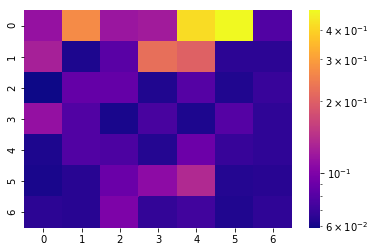

[[0.114 0.269 0.118 0.123 0.419 0.482 0.079]
 [0.127 0.062 0.082 0.223 0.203 0.066 0.066]
 [0.059 0.087 0.087 0.063 0.08  0.063 0.07 ]
 [0.113 0.079 0.061 0.075 0.062 0.08  0.067]
 [0.062 0.079 0.077 0.064 0.091 0.069 0.067]
 [0.061 0.065 0.09  0.109 0.136 0.064 0.065]
 [0.066 0.065 0.099 0.068 0.073 0.063 0.067]]


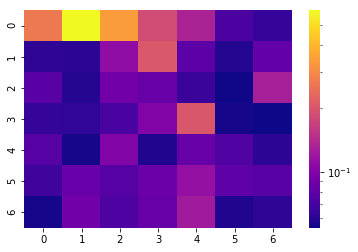

[[0.265 0.587 0.339 0.185 0.133 0.073 0.064]
 [0.062 0.061 0.11  0.205 0.08  0.059 0.083]
 [0.079 0.059 0.091 0.085 0.066 0.055 0.128]
 [0.064 0.063 0.072 0.1   0.204 0.056 0.054]
 [0.077 0.056 0.1   0.058 0.085 0.075 0.061]
 [0.067 0.086 0.077 0.088 0.113 0.081 0.078]
 [0.056 0.091 0.074 0.085 0.123 0.058 0.062]]


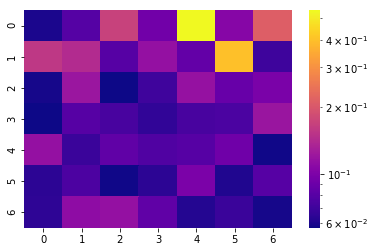

[[0.06  0.079 0.169 0.093 0.542 0.105 0.21 ]
 [0.156 0.142 0.08  0.115 0.086 0.4   0.07 ]
 [0.059 0.12  0.057 0.071 0.116 0.088 0.098]
 [0.057 0.08  0.074 0.066 0.074 0.075 0.119]
 [0.115 0.069 0.084 0.077 0.08  0.092 0.058]
 [0.064 0.076 0.058 0.064 0.099 0.061 0.08 ]
 [0.065 0.111 0.115 0.084 0.062 0.069 0.059]]


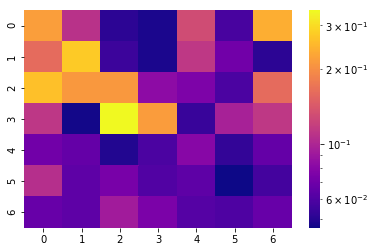

[[0.219 0.109 0.051 0.048 0.131 0.058 0.239]
 [0.162 0.275 0.055 0.048 0.113 0.071 0.051]
 [0.262 0.212 0.212 0.083 0.076 0.059 0.162]
 [0.112 0.047 0.345 0.218 0.054 0.097 0.113]
 [0.071 0.067 0.049 0.059 0.08  0.053 0.067]
 [0.106 0.065 0.074 0.061 0.065 0.046 0.057]
 [0.068 0.065 0.093 0.075 0.062 0.06  0.068]]


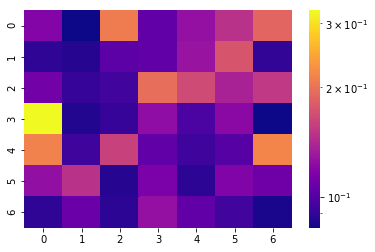

[[0.118 0.082 0.209 0.105 0.126 0.148 0.189]
 [0.089 0.087 0.103 0.105 0.128 0.175 0.09 ]
 [0.111 0.091 0.094 0.196 0.167 0.137 0.153]
 [0.326 0.086 0.091 0.124 0.097 0.121 0.082]
 [0.213 0.093 0.16  0.105 0.093 0.101 0.217]
 [0.125 0.148 0.087 0.114 0.088 0.117 0.11 ]
 [0.089 0.108 0.088 0.126 0.105 0.094 0.084]]


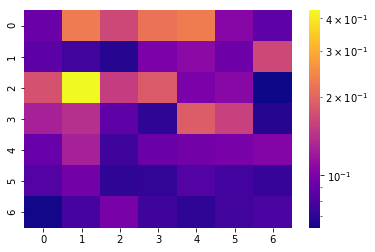

[[0.092 0.23  0.166 0.218 0.232 0.106 0.087]
 [0.086 0.076 0.068 0.101 0.109 0.094 0.166]
 [0.176 0.429 0.154 0.186 0.101 0.108 0.063]
 [0.127 0.14  0.087 0.07  0.19  0.158 0.068]
 [0.091 0.127 0.075 0.093 0.096 0.099 0.105]
 [0.083 0.096 0.07  0.072 0.083 0.077 0.073]
 [0.064 0.078 0.099 0.075 0.071 0.076 0.08 ]]


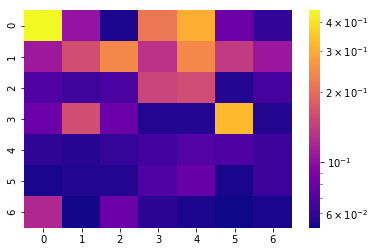

[[0.45  0.103 0.055 0.217 0.304 0.081 0.06 ]
 [0.108 0.162 0.243 0.132 0.243 0.14  0.106]
 [0.07  0.064 0.067 0.15  0.159 0.056 0.066]
 [0.081 0.162 0.081 0.056 0.056 0.325 0.056]
 [0.059 0.057 0.061 0.065 0.071 0.069 0.063]
 [0.054 0.056 0.056 0.07  0.078 0.054 0.063]
 [0.121 0.053 0.081 0.058 0.055 0.052 0.054]]


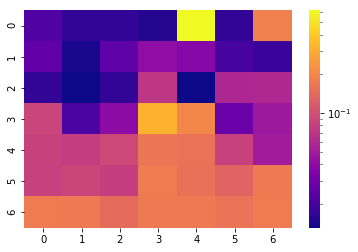

[[0.022 0.017 0.017 0.015 0.616 0.017 0.187]
 [0.026 0.014 0.025 0.041 0.037 0.02  0.018]
 [0.017 0.013 0.017 0.072 0.013 0.058 0.059]
 [0.088 0.021 0.04  0.322 0.2   0.028 0.048]
 [0.083 0.079 0.092 0.164 0.158 0.082 0.05 ]
 [0.082 0.088 0.08  0.176 0.156 0.132 0.173]
 [0.176 0.173 0.144 0.173 0.173 0.16  0.176]]


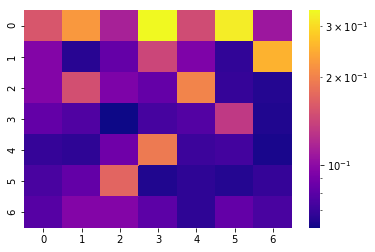

[[0.157 0.224 0.115 0.338 0.148 0.322 0.108]
 [0.096 0.066 0.084 0.143 0.094 0.068 0.253]
 [0.096 0.151 0.093 0.084 0.203 0.069 0.065]
 [0.083 0.077 0.061 0.074 0.078 0.132 0.064]
 [0.069 0.067 0.088 0.192 0.071 0.073 0.063]
 [0.075 0.083 0.172 0.064 0.067 0.065 0.069]
 [0.079 0.096 0.096 0.081 0.067 0.083 0.075]]


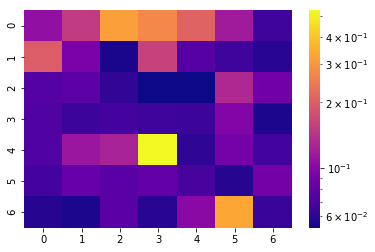

[[0.107 0.153 0.318 0.274 0.209 0.117 0.066]
 [0.199 0.093 0.055 0.161 0.075 0.066 0.059]
 [0.074 0.077 0.062 0.053 0.053 0.131 0.087]
 [0.073 0.065 0.068 0.066 0.065 0.096 0.056]
 [0.073 0.113 0.124 0.53  0.061 0.09  0.067]
 [0.068 0.083 0.076 0.081 0.069 0.058 0.089]
 [0.058 0.056 0.076 0.059 0.102 0.334 0.064]]


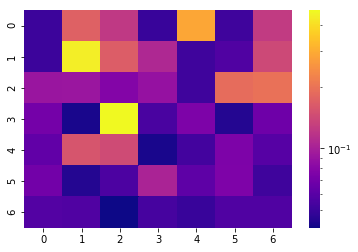

[[0.051 0.172 0.123 0.05  0.288 0.052 0.126]
 [0.051 0.444 0.168 0.107 0.052 0.057 0.141]
 [0.091 0.092 0.078 0.088 0.052 0.19  0.197]
 [0.071 0.043 0.471 0.055 0.075 0.045 0.068]
 [0.063 0.157 0.144 0.043 0.053 0.075 0.059]
 [0.07  0.045 0.056 0.103 0.062 0.076 0.052]
 [0.058 0.057 0.041 0.054 0.05  0.057 0.057]]


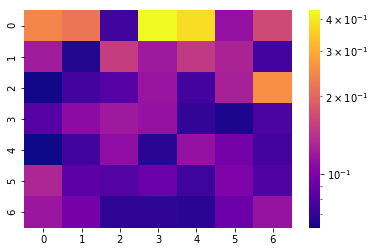

[[0.243 0.222 0.075 0.431 0.379 0.113 0.167]
 [0.121 0.066 0.155 0.12  0.15  0.129 0.076]
 [0.063 0.076 0.083 0.116 0.076 0.126 0.257]
 [0.083 0.109 0.12  0.114 0.071 0.065 0.079]
 [0.062 0.075 0.111 0.068 0.114 0.096 0.076]
 [0.131 0.085 0.082 0.091 0.074 0.101 0.081]
 [0.118 0.097 0.069 0.069 0.068 0.092 0.115]]


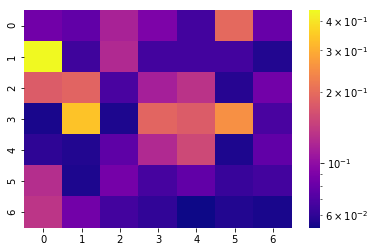

[[0.084 0.077 0.117 0.09  0.066 0.196 0.08 ]
 [0.443 0.065 0.123 0.066 0.066 0.066 0.057]
 [0.179 0.19  0.068 0.114 0.133 0.058 0.085]
 [0.055 0.339 0.056 0.191 0.178 0.253 0.068]
 [0.06  0.057 0.076 0.123 0.155 0.056 0.077]
 [0.127 0.056 0.086 0.067 0.077 0.063 0.066]
 [0.135 0.085 0.066 0.061 0.053 0.057 0.055]]


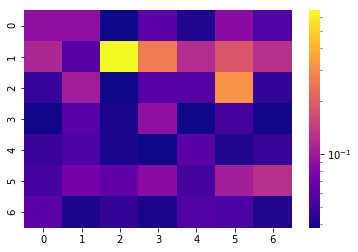

[[0.09  0.09  0.038 0.06  0.042 0.086 0.056]
 [0.115 0.058 0.655 0.263 0.123 0.185 0.125]
 [0.047 0.103 0.038 0.059 0.057 0.311 0.046]
 [0.039 0.059 0.04  0.09  0.038 0.053 0.039]
 [0.048 0.054 0.041 0.038 0.061 0.042 0.047]
 [0.052 0.073 0.064 0.087 0.053 0.105 0.125]
 [0.06  0.041 0.046 0.04  0.056 0.054 0.042]]


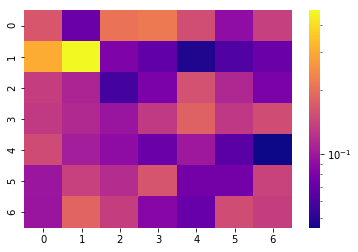

[[0.165 0.072 0.206 0.214 0.153 0.091 0.137]
 [0.303 0.47  0.081 0.068 0.048 0.062 0.072]
 [0.136 0.11  0.058 0.08  0.157 0.113 0.08 ]
 [0.131 0.114 0.097 0.131 0.179 0.128 0.152]
 [0.15  0.104 0.09  0.072 0.099 0.065 0.045]
 [0.098 0.138 0.117 0.162 0.076 0.076 0.141]
 [0.097 0.184 0.136 0.086 0.071 0.152 0.136]]


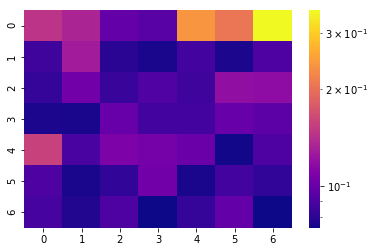

[[0.146 0.134 0.098 0.094 0.239 0.207 0.352]
 [0.086 0.128 0.08  0.076 0.087 0.077 0.091]
 [0.083 0.104 0.084 0.092 0.086 0.119 0.117]
 [0.077 0.076 0.1   0.087 0.087 0.1   0.096]
 [0.157 0.089 0.109 0.106 0.101 0.075 0.091]
 [0.091 0.076 0.082 0.104 0.076 0.087 0.082]
 [0.088 0.078 0.091 0.074 0.083 0.098 0.074]]


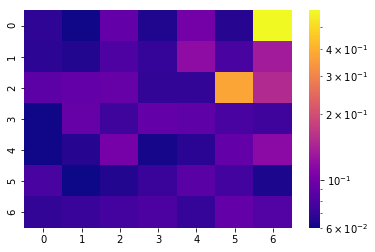

In [ ]:
import math
import numpy as np
import seaborn as sn
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt
from time import sleep
itr = 2
for i in docs_test:
    feature_names=cv.get_feature_names()

    # get the document that we want to extract keywords from
    doc=docs_test[itr]
    itr += 1
    #generate tf-idf for the given document
    tf_idf_vector=tfidf_transformer.transform(cv.transform([doc]))

    #sort the tf-idf vectors by descending order of scores
    sorted_items=sort_coo(tf_idf_vector.tocoo())

    #extract only the top n; n here is 10
    keywords=extract_topn_from_vector(feature_names,sorted_items,49)
    
    words = []

    for k in keywords:

        words.append(k)

    pos = {}
    for i in words:
        for m in range(0, len(words)):
         aaa = doc.find(i)
         pos.update( {i : aaa} )
#     print("===============================================================================================")
#     print("Positions", pos)
    final_pos = []
    for w in sorted(pos, key=pos.get):
        final_pos.append(w)
#     print("===============================================================================================")
#     print("Final_Positions", final_pos)
    value = []
    words = []
    for k in final_pos:
        value.append(keywords[k])
        words.append(k)

#     print("===============================================================================================")
#     print("Words", words)
    def divide_chunks(l, n): 


        for i in range(0, len(l), n):  
            yield l[i:i + n] 


    n = 7

    x = list(divide_chunks(value, n)) 

    out_arr = np.asarray(x) 
    a = out_arr
   

#=====================================================================================================================

    data = a
# print('DATA ========', a)
    try:
        log_norm = LogNorm(vmin=data.min().min(), vmax=data.max().max())
        cbar_ticks = [math.pow(10, i) for i in range(math.floor(math.log10(data.min().min())), 1+math.ceil(math.log10(data.max().max())))]

        sn.heatmap(
            data,
            cmap = 'plasma',
            norm=log_norm,
            cbar_kws={"ticks": cbar_ticks}
        ) 
        plt.pause(0.1) 
        print(a)
    except:
        print('SKIPPPPPPEDDDD')
        continue
    

In [44]:
print(data)

[array([0.161, 0.103, 0.142, 0.113, 0.15 , 0.158, 0.099]), array([0.107, 0.089, 0.078, 0.109, 0.113, 0.17 , 0.124]), array([0.19 , 0.079, 0.137, 0.127, 0.226, 0.127, 0.164]), array([0.088, 0.161, 0.202, 0.083, 0.099, 0.081, 0.089]), array([0.078, 0.086, 0.108, 0.108, 0.094, 0.083, 0.09 ]), array([0.082, 0.088, 0.098, 0.083, 0.081, 0.179, 0.091]), array([0.085, 0.104, 0.085, 0.086, 0.078, 0.113, 0.086])]


In [11]:

pos = {}
for i in words:
    for m in range(0, len(words)):
     a = doc.find(i)
     pos.update( {i : a} )

         


In [12]:
final_pos = []
for w in sorted(pos, key=pos.get):
  final_pos.append(w)


In [13]:
value = []
words = []
for k in final_pos:
    value.append(keywords[k])
    words.append(k)


In [14]:
 
def divide_chunks(l, n): 
      
    
    for i in range(0, len(l), n):  
        yield l[i:i + n] 
  

n = 9
  
x = list(divide_chunks(value, n)) 


In [15]:
import matplotlib.pyplot as plt
import numpy as np
out_arr = np.asarray(x) 
a = out_arr

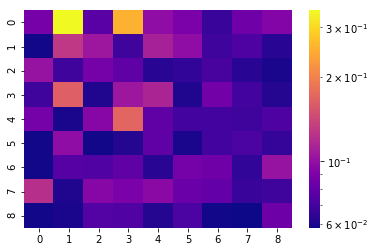

In [16]:
import math

import numpy as np
import seaborn as sn
from matplotlib.colors import LogNorm

data = a

log_norm = LogNorm(vmin=data.min().min(), vmax=data.max().max())
cbar_ticks = [math.pow(10, i) for i in range(math.floor(math.log10(data.min().min())), 1+math.ceil(math.log10(data.max().max())))]

sn.heatmap(
    data,
    cmap = 'plasma',
    norm=log_norm,
    cbar_kws={"ticks": cbar_ticks}
)
